In [3]:
import ijson
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd

In [6]:
table_json = "C:\\Users\\pippo\\Downloads\\tables.json" #il path è relativo al dispositivo di esecuzione

In [76]:
with open(table_json, 'rb') as input_file:
    init_cells = False
    tables = {}
    header = True
    i = 0
    n_row = 0
    n_column = 0
    n_null_rows = 0
    n_row_empty_value = 0
    n_row_null_value = 0
    column_set = set()
    value_set = set()
    n_column_empty_value = 0
    n_column_null_value = 0
    n_empty_value = 0
    n_null_value = 0
    n_diff_values = 0
    number_cells_semicolon = 0
    number_space = 0
    number_special_charatter  = 0
    
    value_set  = set()
    #list[0:n_row,1: n_column,2: n_null_rows,3: n_row_empty_value,4: n_row_null_value,5: n_column_empty_value,6: n_column_null_value, 
    # 7:n_empty_value,8: n_null_value,9:n_different_value ,10:number_cells_semicolon,11:number_space,12:number_%f% ,13:total_cells]
    list = []
    row_before = -1
    column_before = -1
    parser = ijson.parse(input_file, multiple_values=True)
  
            
    for prefix, event, value in parser:
     
        
        if prefix == "id" or prefix == "cells.item.isHeader" or prefix == "cells.item.cleanedText" or prefix == "cells.item.Coordinates.row" or prefix == "cells.item.Coordinates.column":
            if prefix == "id":
               
                
                if init_cells: 
                    list.append(n_row) #0 n_row
                    n_column = len(column_set)
                    list.append(n_column) #1 n_column
                    list.append(n_null_rows) #2 n_null_rows
                    list.append(len(n_row_empty_value))#3  n_row_empty_value
                    list.append(len(n_row_null_value)) #4 n_row_null_value
                    list.append(len(n_column_empty_value)) #5 n_column_empty_value
                    if(n_null_rows!=0):
                        for c in column_set:
                            n_column_null_value.add(c)
                    list.append(len(n_column_null_value)) #6 n_column_null_value
                    list.append(n_empty_value ) #7 n_empty_value
                    n_null_value +=  n_null_rows * n_column
                    list.append(n_null_value) #8  n_null_value
                    n_diff_values = len(value_set) 
                    list.append(n_diff_values) #9 n_different_value
                    list.append(number_cells_semicolon) #10 number_cells_semicolon
                    list.append(number_space) #11 number_space
                    list.append(number_special_charatter)#12 number_%f%
                    list.append(row * n_column) #13 total_cells
                    
                   
                    
                    tables[table_name] =list
                    print("Table: ", i, " ok")
                    i+=1
                    #if(i==3):
                     #   break
                        #print(value)
                    
                       
                        

                
            
            
            
                init_cells = True
                n_row = 0
                n_column = 0
                n_null_rows = 0
                n_row_empty_value = set()
                n_row_null_value = set()
                column_set = set()
                value_set = set()
                n_column_empty_value = set()
                n_column_null_value = set()
                n_empty_value = 0
                n_null_value = 0
                number_cells_semicolon  = 0
                number_space = 0
                number_special_charatter = 0
                total_cells = 0
                value_set  = set()
                table_name = value
             
               
                list = []
                row_before = 0
                column_before = -1
            
            
    
         
        
            elif prefix == "cells.item.isHeader":
                header = value 
                
        
            elif prefix == "cells.item.Coordinates.row":
                if not header:
                    row = value
                    if(row != row_before):
                        if(row > row_before+1):
                            for d in range(row_before+1,row):
                                n_null_rows+=1
                        row_before = row
                        n_row+=1
                
                
            
            elif prefix == "cells.item.Coordinates.column":
                    column = value
                    if(column != column_before):
                        if not header:
                            if(column > column_before+1):
                                for j in range(column_before+1,column):
                                    n_column_null_value.add(j)
                                    n_null_value +=1
                                    n_row_null_value.add(row)
                        column_before = column
                        column_set.add(value)
                
            
            
            elif prefix == "cells.item.cleanedText":
                    if not header:
                        cell_value = value
                        if(cell_value != ""):
                            value_set.add(cell_value)
                            number_cells_semicolon += value.count(";")
                            number_space += value.count(" ")
                            number_special_charatter += value.count("%f%;")
                            
                        
                        
                        else:
                            value_set.add(cell_value)
                            n_empty_value+=1
                            n_column_empty_value.add(column)
                            n_row_empty_value.add(row)
                    
            
         
          
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    
                    

Table:  0  ok
Table:  1  ok
Table:  2  ok
Table:  3  ok
Table:  4  ok
Table:  5  ok
Table:  6  ok
Table:  7  ok
Table:  8  ok
Table:  9  ok
Table:  10  ok
Table:  11  ok
Table:  12  ok
Table:  13  ok
Table:  14  ok
Table:  15  ok
Table:  16  ok
Table:  17  ok
Table:  18  ok
Table:  19  ok
Table:  20  ok
Table:  21  ok
Table:  22  ok
Table:  23  ok
Table:  24  ok
Table:  25  ok
Table:  26  ok
Table:  27  ok
Table:  28  ok
Table:  29  ok
Table:  30  ok
Table:  31  ok
Table:  32  ok
Table:  33  ok
Table:  34  ok
Table:  35  ok
Table:  36  ok
Table:  37  ok
Table:  38  ok
Table:  39  ok
Table:  40  ok
Table:  41  ok
Table:  42  ok
Table:  43  ok
Table:  44  ok
Table:  45  ok
Table:  46  ok
Table:  47  ok
Table:  48  ok
Table:  49  ok
Table:  50  ok
Table:  51  ok
Table:  52  ok
Table:  53  ok
Table:  54  ok
Table:  55  ok
Table:  56  ok
Table:  57  ok
Table:  58  ok
Table:  59  ok
Table:  60  ok
Table:  61  ok
Table:  62  ok
Table:  63  ok
Table:  64  ok
Table:  65  ok
Table:  66  ok
Table

Table:  524  ok
Table:  525  ok
Table:  526  ok
Table:  527  ok
Table:  528  ok
Table:  529  ok
Table:  530  ok
Table:  531  ok
Table:  532  ok
Table:  533  ok
Table:  534  ok
Table:  535  ok
Table:  536  ok
Table:  537  ok
Table:  538  ok
Table:  539  ok
Table:  540  ok
Table:  541  ok
Table:  542  ok
Table:  543  ok
Table:  544  ok
Table:  545  ok
Table:  546  ok
Table:  547  ok
Table:  548  ok
Table:  549  ok
Table:  550  ok
Table:  551  ok
Table:  552  ok
Table:  553  ok
Table:  554  ok
Table:  555  ok
Table:  556  ok
Table:  557  ok
Table:  558  ok
Table:  559  ok
Table:  560  ok
Table:  561  ok
Table:  562  ok
Table:  563  ok
Table:  564  ok
Table:  565  ok
Table:  566  ok
Table:  567  ok
Table:  568  ok
Table:  569  ok
Table:  570  ok
Table:  571  ok
Table:  572  ok
Table:  573  ok
Table:  574  ok
Table:  575  ok
Table:  576  ok
Table:  577  ok
Table:  578  ok
Table:  579  ok
Table:  580  ok
Table:  581  ok
Table:  582  ok
Table:  583  ok
Table:  584  ok
Table:  585  ok
Table:  

Table:  1050  ok
Table:  1051  ok
Table:  1052  ok
Table:  1053  ok
Table:  1054  ok
Table:  1055  ok
Table:  1056  ok
Table:  1057  ok
Table:  1058  ok
Table:  1059  ok
Table:  1060  ok
Table:  1061  ok
Table:  1062  ok
Table:  1063  ok
Table:  1064  ok
Table:  1065  ok
Table:  1066  ok
Table:  1067  ok
Table:  1068  ok
Table:  1069  ok
Table:  1070  ok
Table:  1071  ok
Table:  1072  ok
Table:  1073  ok
Table:  1074  ok
Table:  1075  ok
Table:  1076  ok
Table:  1077  ok
Table:  1078  ok
Table:  1079  ok
Table:  1080  ok
Table:  1081  ok
Table:  1082  ok
Table:  1083  ok
Table:  1084  ok
Table:  1085  ok
Table:  1086  ok
Table:  1087  ok
Table:  1088  ok
Table:  1089  ok
Table:  1090  ok
Table:  1091  ok
Table:  1092  ok
Table:  1093  ok
Table:  1094  ok
Table:  1095  ok
Table:  1096  ok
Table:  1097  ok
Table:  1098  ok
Table:  1099  ok
Table:  1100  ok
Table:  1101  ok
Table:  1102  ok
Table:  1103  ok
Table:  1104  ok
Table:  1105  ok
Table:  1106  ok
Table:  1107  ok
Table:  1108  

Table:  1559  ok
Table:  1560  ok
Table:  1561  ok
Table:  1562  ok
Table:  1563  ok
Table:  1564  ok
Table:  1565  ok
Table:  1566  ok
Table:  1567  ok
Table:  1568  ok
Table:  1569  ok
Table:  1570  ok
Table:  1571  ok
Table:  1572  ok
Table:  1573  ok
Table:  1574  ok
Table:  1575  ok
Table:  1576  ok
Table:  1577  ok
Table:  1578  ok
Table:  1579  ok
Table:  1580  ok
Table:  1581  ok
Table:  1582  ok
Table:  1583  ok
Table:  1584  ok
Table:  1585  ok
Table:  1586  ok
Table:  1587  ok
Table:  1588  ok
Table:  1589  ok
Table:  1590  ok
Table:  1591  ok
Table:  1592  ok
Table:  1593  ok
Table:  1594  ok
Table:  1595  ok
Table:  1596  ok
Table:  1597  ok
Table:  1598  ok
Table:  1599  ok
Table:  1600  ok
Table:  1601  ok
Table:  1602  ok
Table:  1603  ok
Table:  1604  ok
Table:  1605  ok
Table:  1606  ok
Table:  1607  ok
Table:  1608  ok
Table:  1609  ok
Table:  1610  ok
Table:  1611  ok
Table:  1612  ok
Table:  1613  ok
Table:  1614  ok
Table:  1615  ok
Table:  1616  ok
Table:  1617  

Table:  2061  ok
Table:  2062  ok
Table:  2063  ok
Table:  2064  ok
Table:  2065  ok
Table:  2066  ok
Table:  2067  ok
Table:  2068  ok
Table:  2069  ok
Table:  2070  ok
Table:  2071  ok
Table:  2072  ok
Table:  2073  ok
Table:  2074  ok
Table:  2075  ok
Table:  2076  ok
Table:  2077  ok
Table:  2078  ok
Table:  2079  ok
Table:  2080  ok
Table:  2081  ok
Table:  2082  ok
Table:  2083  ok
Table:  2084  ok
Table:  2085  ok
Table:  2086  ok
Table:  2087  ok
Table:  2088  ok
Table:  2089  ok
Table:  2090  ok
Table:  2091  ok
Table:  2092  ok
Table:  2093  ok
Table:  2094  ok
Table:  2095  ok
Table:  2096  ok
Table:  2097  ok
Table:  2098  ok
Table:  2099  ok
Table:  2100  ok
Table:  2101  ok
Table:  2102  ok
Table:  2103  ok
Table:  2104  ok
Table:  2105  ok
Table:  2106  ok
Table:  2107  ok
Table:  2108  ok
Table:  2109  ok
Table:  2110  ok
Table:  2111  ok
Table:  2112  ok
Table:  2113  ok
Table:  2114  ok
Table:  2115  ok
Table:  2116  ok
Table:  2117  ok
Table:  2118  ok
Table:  2119  

Table:  2570  ok
Table:  2571  ok
Table:  2572  ok
Table:  2573  ok
Table:  2574  ok
Table:  2575  ok
Table:  2576  ok
Table:  2577  ok
Table:  2578  ok
Table:  2579  ok
Table:  2580  ok
Table:  2581  ok
Table:  2582  ok
Table:  2583  ok
Table:  2584  ok
Table:  2585  ok
Table:  2586  ok
Table:  2587  ok
Table:  2588  ok
Table:  2589  ok
Table:  2590  ok
Table:  2591  ok
Table:  2592  ok
Table:  2593  ok
Table:  2594  ok
Table:  2595  ok
Table:  2596  ok
Table:  2597  ok
Table:  2598  ok
Table:  2599  ok
Table:  2600  ok
Table:  2601  ok
Table:  2602  ok
Table:  2603  ok
Table:  2604  ok
Table:  2605  ok
Table:  2606  ok
Table:  2607  ok
Table:  2608  ok
Table:  2609  ok
Table:  2610  ok
Table:  2611  ok
Table:  2612  ok
Table:  2613  ok
Table:  2614  ok
Table:  2615  ok
Table:  2616  ok
Table:  2617  ok
Table:  2618  ok
Table:  2619  ok
Table:  2620  ok
Table:  2621  ok
Table:  2622  ok
Table:  2623  ok
Table:  2624  ok
Table:  2625  ok
Table:  2626  ok
Table:  2627  ok
Table:  2628  

Table:  3078  ok
Table:  3079  ok
Table:  3080  ok
Table:  3081  ok
Table:  3082  ok
Table:  3083  ok
Table:  3084  ok
Table:  3085  ok
Table:  3086  ok
Table:  3087  ok
Table:  3088  ok
Table:  3089  ok
Table:  3090  ok
Table:  3091  ok
Table:  3092  ok
Table:  3093  ok
Table:  3094  ok
Table:  3095  ok
Table:  3096  ok
Table:  3097  ok
Table:  3098  ok
Table:  3099  ok
Table:  3100  ok
Table:  3101  ok
Table:  3102  ok
Table:  3103  ok
Table:  3104  ok
Table:  3105  ok
Table:  3106  ok
Table:  3107  ok
Table:  3108  ok
Table:  3109  ok
Table:  3110  ok
Table:  3111  ok
Table:  3112  ok
Table:  3113  ok
Table:  3114  ok
Table:  3115  ok
Table:  3116  ok
Table:  3117  ok
Table:  3118  ok
Table:  3119  ok
Table:  3120  ok
Table:  3121  ok
Table:  3122  ok
Table:  3123  ok
Table:  3124  ok
Table:  3125  ok
Table:  3126  ok
Table:  3127  ok
Table:  3128  ok
Table:  3129  ok
Table:  3130  ok
Table:  3131  ok
Table:  3132  ok
Table:  3133  ok
Table:  3134  ok
Table:  3135  ok
Table:  3136  

Table:  3566  ok
Table:  3567  ok
Table:  3568  ok
Table:  3569  ok
Table:  3570  ok
Table:  3571  ok
Table:  3572  ok
Table:  3573  ok
Table:  3574  ok
Table:  3575  ok
Table:  3576  ok
Table:  3577  ok
Table:  3578  ok
Table:  3579  ok
Table:  3580  ok
Table:  3581  ok
Table:  3582  ok
Table:  3583  ok
Table:  3584  ok
Table:  3585  ok
Table:  3586  ok
Table:  3587  ok
Table:  3588  ok
Table:  3589  ok
Table:  3590  ok
Table:  3591  ok
Table:  3592  ok
Table:  3593  ok
Table:  3594  ok
Table:  3595  ok
Table:  3596  ok
Table:  3597  ok
Table:  3598  ok
Table:  3599  ok
Table:  3600  ok
Table:  3601  ok
Table:  3602  ok
Table:  3603  ok
Table:  3604  ok
Table:  3605  ok
Table:  3606  ok
Table:  3607  ok
Table:  3608  ok
Table:  3609  ok
Table:  3610  ok
Table:  3611  ok
Table:  3612  ok
Table:  3613  ok
Table:  3614  ok
Table:  3615  ok
Table:  3616  ok
Table:  3617  ok
Table:  3618  ok
Table:  3619  ok
Table:  3620  ok
Table:  3621  ok
Table:  3622  ok
Table:  3623  ok
Table:  3624  

Table:  4064  ok
Table:  4065  ok
Table:  4066  ok
Table:  4067  ok
Table:  4068  ok
Table:  4069  ok
Table:  4070  ok
Table:  4071  ok
Table:  4072  ok
Table:  4073  ok
Table:  4074  ok
Table:  4075  ok
Table:  4076  ok
Table:  4077  ok
Table:  4078  ok
Table:  4079  ok
Table:  4080  ok
Table:  4081  ok
Table:  4082  ok
Table:  4083  ok
Table:  4084  ok
Table:  4085  ok
Table:  4086  ok
Table:  4087  ok
Table:  4088  ok
Table:  4089  ok
Table:  4090  ok
Table:  4091  ok
Table:  4092  ok
Table:  4093  ok
Table:  4094  ok
Table:  4095  ok
Table:  4096  ok
Table:  4097  ok
Table:  4098  ok
Table:  4099  ok
Table:  4100  ok
Table:  4101  ok
Table:  4102  ok
Table:  4103  ok
Table:  4104  ok
Table:  4105  ok
Table:  4106  ok
Table:  4107  ok
Table:  4108  ok
Table:  4109  ok
Table:  4110  ok
Table:  4111  ok
Table:  4112  ok
Table:  4113  ok
Table:  4114  ok
Table:  4115  ok
Table:  4116  ok
Table:  4117  ok
Table:  4118  ok
Table:  4119  ok
Table:  4120  ok
Table:  4121  ok
Table:  4122  

Table:  4571  ok
Table:  4572  ok
Table:  4573  ok
Table:  4574  ok
Table:  4575  ok
Table:  4576  ok
Table:  4577  ok
Table:  4578  ok
Table:  4579  ok
Table:  4580  ok
Table:  4581  ok
Table:  4582  ok
Table:  4583  ok
Table:  4584  ok
Table:  4585  ok
Table:  4586  ok
Table:  4587  ok
Table:  4588  ok
Table:  4589  ok
Table:  4590  ok
Table:  4591  ok
Table:  4592  ok
Table:  4593  ok
Table:  4594  ok
Table:  4595  ok
Table:  4596  ok
Table:  4597  ok
Table:  4598  ok
Table:  4599  ok
Table:  4600  ok
Table:  4601  ok
Table:  4602  ok
Table:  4603  ok
Table:  4604  ok
Table:  4605  ok
Table:  4606  ok
Table:  4607  ok
Table:  4608  ok
Table:  4609  ok
Table:  4610  ok
Table:  4611  ok
Table:  4612  ok
Table:  4613  ok
Table:  4614  ok
Table:  4615  ok
Table:  4616  ok
Table:  4617  ok
Table:  4618  ok
Table:  4619  ok
Table:  4620  ok
Table:  4621  ok
Table:  4622  ok
Table:  4623  ok
Table:  4624  ok
Table:  4625  ok
Table:  4626  ok
Table:  4627  ok
Table:  4628  ok
Table:  4629  

Table:  5061  ok
Table:  5062  ok
Table:  5063  ok
Table:  5064  ok
Table:  5065  ok
Table:  5066  ok
Table:  5067  ok
Table:  5068  ok
Table:  5069  ok
Table:  5070  ok
Table:  5071  ok
Table:  5072  ok
Table:  5073  ok
Table:  5074  ok
Table:  5075  ok
Table:  5076  ok
Table:  5077  ok
Table:  5078  ok
Table:  5079  ok
Table:  5080  ok
Table:  5081  ok
Table:  5082  ok
Table:  5083  ok
Table:  5084  ok
Table:  5085  ok
Table:  5086  ok
Table:  5087  ok
Table:  5088  ok
Table:  5089  ok
Table:  5090  ok
Table:  5091  ok
Table:  5092  ok
Table:  5093  ok
Table:  5094  ok
Table:  5095  ok
Table:  5096  ok
Table:  5097  ok
Table:  5098  ok
Table:  5099  ok
Table:  5100  ok
Table:  5101  ok
Table:  5102  ok
Table:  5103  ok
Table:  5104  ok
Table:  5105  ok
Table:  5106  ok
Table:  5107  ok
Table:  5108  ok
Table:  5109  ok
Table:  5110  ok
Table:  5111  ok
Table:  5112  ok
Table:  5113  ok
Table:  5114  ok
Table:  5115  ok
Table:  5116  ok
Table:  5117  ok
Table:  5118  ok
Table:  5119  

Table:  5596  ok
Table:  5597  ok
Table:  5598  ok
Table:  5599  ok
Table:  5600  ok
Table:  5601  ok
Table:  5602  ok
Table:  5603  ok
Table:  5604  ok
Table:  5605  ok
Table:  5606  ok
Table:  5607  ok
Table:  5608  ok
Table:  5609  ok
Table:  5610  ok
Table:  5611  ok
Table:  5612  ok
Table:  5613  ok
Table:  5614  ok
Table:  5615  ok
Table:  5616  ok
Table:  5617  ok
Table:  5618  ok
Table:  5619  ok
Table:  5620  ok
Table:  5621  ok
Table:  5622  ok
Table:  5623  ok
Table:  5624  ok
Table:  5625  ok
Table:  5626  ok
Table:  5627  ok
Table:  5628  ok
Table:  5629  ok
Table:  5630  ok
Table:  5631  ok
Table:  5632  ok
Table:  5633  ok
Table:  5634  ok
Table:  5635  ok
Table:  5636  ok
Table:  5637  ok
Table:  5638  ok
Table:  5639  ok
Table:  5640  ok
Table:  5641  ok
Table:  5642  ok
Table:  5643  ok
Table:  5644  ok
Table:  5645  ok
Table:  5646  ok
Table:  5647  ok
Table:  5648  ok
Table:  5649  ok
Table:  5650  ok
Table:  5651  ok
Table:  5652  ok
Table:  5653  ok
Table:  5654  

Table:  6091  ok
Table:  6092  ok
Table:  6093  ok
Table:  6094  ok
Table:  6095  ok
Table:  6096  ok
Table:  6097  ok
Table:  6098  ok
Table:  6099  ok
Table:  6100  ok
Table:  6101  ok
Table:  6102  ok
Table:  6103  ok
Table:  6104  ok
Table:  6105  ok
Table:  6106  ok
Table:  6107  ok
Table:  6108  ok
Table:  6109  ok
Table:  6110  ok
Table:  6111  ok
Table:  6112  ok
Table:  6113  ok
Table:  6114  ok
Table:  6115  ok
Table:  6116  ok
Table:  6117  ok
Table:  6118  ok
Table:  6119  ok
Table:  6120  ok
Table:  6121  ok
Table:  6122  ok
Table:  6123  ok
Table:  6124  ok
Table:  6125  ok
Table:  6126  ok
Table:  6127  ok
Table:  6128  ok
Table:  6129  ok
Table:  6130  ok
Table:  6131  ok
Table:  6132  ok
Table:  6133  ok
Table:  6134  ok
Table:  6135  ok
Table:  6136  ok
Table:  6137  ok
Table:  6138  ok
Table:  6139  ok
Table:  6140  ok
Table:  6141  ok
Table:  6142  ok
Table:  6143  ok
Table:  6144  ok
Table:  6145  ok
Table:  6146  ok
Table:  6147  ok
Table:  6148  ok
Table:  6149  

Table:  6585  ok
Table:  6586  ok
Table:  6587  ok
Table:  6588  ok
Table:  6589  ok
Table:  6590  ok
Table:  6591  ok
Table:  6592  ok
Table:  6593  ok
Table:  6594  ok
Table:  6595  ok
Table:  6596  ok
Table:  6597  ok
Table:  6598  ok
Table:  6599  ok
Table:  6600  ok
Table:  6601  ok
Table:  6602  ok
Table:  6603  ok
Table:  6604  ok
Table:  6605  ok
Table:  6606  ok
Table:  6607  ok
Table:  6608  ok
Table:  6609  ok
Table:  6610  ok
Table:  6611  ok
Table:  6612  ok
Table:  6613  ok
Table:  6614  ok
Table:  6615  ok
Table:  6616  ok
Table:  6617  ok
Table:  6618  ok
Table:  6619  ok
Table:  6620  ok
Table:  6621  ok
Table:  6622  ok
Table:  6623  ok
Table:  6624  ok
Table:  6625  ok
Table:  6626  ok
Table:  6627  ok
Table:  6628  ok
Table:  6629  ok
Table:  6630  ok
Table:  6631  ok
Table:  6632  ok
Table:  6633  ok
Table:  6634  ok
Table:  6635  ok
Table:  6636  ok
Table:  6637  ok
Table:  6638  ok
Table:  6639  ok
Table:  6640  ok
Table:  6641  ok
Table:  6642  ok
Table:  6643  

Table:  7074  ok
Table:  7075  ok
Table:  7076  ok
Table:  7077  ok
Table:  7078  ok
Table:  7079  ok
Table:  7080  ok
Table:  7081  ok
Table:  7082  ok
Table:  7083  ok
Table:  7084  ok
Table:  7085  ok
Table:  7086  ok
Table:  7087  ok
Table:  7088  ok
Table:  7089  ok
Table:  7090  ok
Table:  7091  ok
Table:  7092  ok
Table:  7093  ok
Table:  7094  ok
Table:  7095  ok
Table:  7096  ok
Table:  7097  ok
Table:  7098  ok
Table:  7099  ok
Table:  7100  ok
Table:  7101  ok
Table:  7102  ok
Table:  7103  ok
Table:  7104  ok
Table:  7105  ok
Table:  7106  ok
Table:  7107  ok
Table:  7108  ok
Table:  7109  ok
Table:  7110  ok
Table:  7111  ok
Table:  7112  ok
Table:  7113  ok
Table:  7114  ok
Table:  7115  ok
Table:  7116  ok
Table:  7117  ok
Table:  7118  ok
Table:  7119  ok
Table:  7120  ok
Table:  7121  ok
Table:  7122  ok
Table:  7123  ok
Table:  7124  ok
Table:  7125  ok
Table:  7126  ok
Table:  7127  ok
Table:  7128  ok
Table:  7129  ok
Table:  7130  ok
Table:  7131  ok
Table:  7132  

Table:  7591  ok
Table:  7592  ok
Table:  7593  ok
Table:  7594  ok
Table:  7595  ok
Table:  7596  ok
Table:  7597  ok
Table:  7598  ok
Table:  7599  ok
Table:  7600  ok
Table:  7601  ok
Table:  7602  ok
Table:  7603  ok
Table:  7604  ok
Table:  7605  ok
Table:  7606  ok
Table:  7607  ok
Table:  7608  ok
Table:  7609  ok
Table:  7610  ok
Table:  7611  ok
Table:  7612  ok
Table:  7613  ok
Table:  7614  ok
Table:  7615  ok
Table:  7616  ok
Table:  7617  ok
Table:  7618  ok
Table:  7619  ok
Table:  7620  ok
Table:  7621  ok
Table:  7622  ok
Table:  7623  ok
Table:  7624  ok
Table:  7625  ok
Table:  7626  ok
Table:  7627  ok
Table:  7628  ok
Table:  7629  ok
Table:  7630  ok
Table:  7631  ok
Table:  7632  ok
Table:  7633  ok
Table:  7634  ok
Table:  7635  ok
Table:  7636  ok
Table:  7637  ok
Table:  7638  ok
Table:  7639  ok
Table:  7640  ok
Table:  7641  ok
Table:  7642  ok
Table:  7643  ok
Table:  7644  ok
Table:  7645  ok
Table:  7646  ok
Table:  7647  ok
Table:  7648  ok
Table:  7649  

Table:  8093  ok
Table:  8094  ok
Table:  8095  ok
Table:  8096  ok
Table:  8097  ok
Table:  8098  ok
Table:  8099  ok
Table:  8100  ok
Table:  8101  ok
Table:  8102  ok
Table:  8103  ok
Table:  8104  ok
Table:  8105  ok
Table:  8106  ok
Table:  8107  ok
Table:  8108  ok
Table:  8109  ok
Table:  8110  ok
Table:  8111  ok
Table:  8112  ok
Table:  8113  ok
Table:  8114  ok
Table:  8115  ok
Table:  8116  ok
Table:  8117  ok
Table:  8118  ok
Table:  8119  ok
Table:  8120  ok
Table:  8121  ok
Table:  8122  ok
Table:  8123  ok
Table:  8124  ok
Table:  8125  ok
Table:  8126  ok
Table:  8127  ok
Table:  8128  ok
Table:  8129  ok
Table:  8130  ok
Table:  8131  ok
Table:  8132  ok
Table:  8133  ok
Table:  8134  ok
Table:  8135  ok
Table:  8136  ok
Table:  8137  ok
Table:  8138  ok
Table:  8139  ok
Table:  8140  ok
Table:  8141  ok
Table:  8142  ok
Table:  8143  ok
Table:  8144  ok
Table:  8145  ok
Table:  8146  ok
Table:  8147  ok
Table:  8148  ok
Table:  8149  ok
Table:  8150  ok
Table:  8151  

Table:  8588  ok
Table:  8589  ok
Table:  8590  ok
Table:  8591  ok
Table:  8592  ok
Table:  8593  ok
Table:  8594  ok
Table:  8595  ok
Table:  8596  ok
Table:  8597  ok
Table:  8598  ok
Table:  8599  ok
Table:  8600  ok
Table:  8601  ok
Table:  8602  ok
Table:  8603  ok
Table:  8604  ok
Table:  8605  ok
Table:  8606  ok
Table:  8607  ok
Table:  8608  ok
Table:  8609  ok
Table:  8610  ok
Table:  8611  ok
Table:  8612  ok
Table:  8613  ok
Table:  8614  ok
Table:  8615  ok
Table:  8616  ok
Table:  8617  ok
Table:  8618  ok
Table:  8619  ok
Table:  8620  ok
Table:  8621  ok
Table:  8622  ok
Table:  8623  ok
Table:  8624  ok
Table:  8625  ok
Table:  8626  ok
Table:  8627  ok
Table:  8628  ok
Table:  8629  ok
Table:  8630  ok
Table:  8631  ok
Table:  8632  ok
Table:  8633  ok
Table:  8634  ok
Table:  8635  ok
Table:  8636  ok
Table:  8637  ok
Table:  8638  ok
Table:  8639  ok
Table:  8640  ok
Table:  8641  ok
Table:  8642  ok
Table:  8643  ok
Table:  8644  ok
Table:  8645  ok
Table:  8646  

Table:  9083  ok
Table:  9084  ok
Table:  9085  ok
Table:  9086  ok
Table:  9087  ok
Table:  9088  ok
Table:  9089  ok
Table:  9090  ok
Table:  9091  ok
Table:  9092  ok
Table:  9093  ok
Table:  9094  ok
Table:  9095  ok
Table:  9096  ok
Table:  9097  ok
Table:  9098  ok
Table:  9099  ok
Table:  9100  ok
Table:  9101  ok
Table:  9102  ok
Table:  9103  ok
Table:  9104  ok
Table:  9105  ok
Table:  9106  ok
Table:  9107  ok
Table:  9108  ok
Table:  9109  ok
Table:  9110  ok
Table:  9111  ok
Table:  9112  ok
Table:  9113  ok
Table:  9114  ok
Table:  9115  ok
Table:  9116  ok
Table:  9117  ok
Table:  9118  ok
Table:  9119  ok
Table:  9120  ok
Table:  9121  ok
Table:  9122  ok
Table:  9123  ok
Table:  9124  ok
Table:  9125  ok
Table:  9126  ok
Table:  9127  ok
Table:  9128  ok
Table:  9129  ok
Table:  9130  ok
Table:  9131  ok
Table:  9132  ok
Table:  9133  ok
Table:  9134  ok
Table:  9135  ok
Table:  9136  ok
Table:  9137  ok
Table:  9138  ok
Table:  9139  ok
Table:  9140  ok
Table:  9141  

Table:  9590  ok
Table:  9591  ok
Table:  9592  ok
Table:  9593  ok
Table:  9594  ok
Table:  9595  ok
Table:  9596  ok
Table:  9597  ok
Table:  9598  ok
Table:  9599  ok
Table:  9600  ok
Table:  9601  ok
Table:  9602  ok
Table:  9603  ok
Table:  9604  ok
Table:  9605  ok
Table:  9606  ok
Table:  9607  ok
Table:  9608  ok
Table:  9609  ok
Table:  9610  ok
Table:  9611  ok
Table:  9612  ok
Table:  9613  ok
Table:  9614  ok
Table:  9615  ok
Table:  9616  ok
Table:  9617  ok
Table:  9618  ok
Table:  9619  ok
Table:  9620  ok
Table:  9621  ok
Table:  9622  ok
Table:  9623  ok
Table:  9624  ok
Table:  9625  ok
Table:  9626  ok
Table:  9627  ok
Table:  9628  ok
Table:  9629  ok
Table:  9630  ok
Table:  9631  ok
Table:  9632  ok
Table:  9633  ok
Table:  9634  ok
Table:  9635  ok
Table:  9636  ok
Table:  9637  ok
Table:  9638  ok
Table:  9639  ok
Table:  9640  ok
Table:  9641  ok
Table:  9642  ok
Table:  9643  ok
Table:  9644  ok
Table:  9645  ok
Table:  9646  ok
Table:  9647  ok
Table:  9648  

Table:  10084  ok
Table:  10085  ok
Table:  10086  ok
Table:  10087  ok
Table:  10088  ok
Table:  10089  ok
Table:  10090  ok
Table:  10091  ok
Table:  10092  ok
Table:  10093  ok
Table:  10094  ok
Table:  10095  ok
Table:  10096  ok
Table:  10097  ok
Table:  10098  ok
Table:  10099  ok
Table:  10100  ok
Table:  10101  ok
Table:  10102  ok
Table:  10103  ok
Table:  10104  ok
Table:  10105  ok
Table:  10106  ok
Table:  10107  ok
Table:  10108  ok
Table:  10109  ok
Table:  10110  ok
Table:  10111  ok
Table:  10112  ok
Table:  10113  ok
Table:  10114  ok
Table:  10115  ok
Table:  10116  ok
Table:  10117  ok
Table:  10118  ok
Table:  10119  ok
Table:  10120  ok
Table:  10121  ok
Table:  10122  ok
Table:  10123  ok
Table:  10124  ok
Table:  10125  ok
Table:  10126  ok
Table:  10127  ok
Table:  10128  ok
Table:  10129  ok
Table:  10130  ok
Table:  10131  ok
Table:  10132  ok
Table:  10133  ok
Table:  10134  ok
Table:  10135  ok
Table:  10136  ok
Table:  10137  ok
Table:  10138  ok
Table:  10

Table:  10549  ok
Table:  10550  ok
Table:  10551  ok
Table:  10552  ok
Table:  10553  ok
Table:  10554  ok
Table:  10555  ok
Table:  10556  ok
Table:  10557  ok
Table:  10558  ok
Table:  10559  ok
Table:  10560  ok
Table:  10561  ok
Table:  10562  ok
Table:  10563  ok
Table:  10564  ok
Table:  10565  ok
Table:  10566  ok
Table:  10567  ok
Table:  10568  ok
Table:  10569  ok
Table:  10570  ok
Table:  10571  ok
Table:  10572  ok
Table:  10573  ok
Table:  10574  ok
Table:  10575  ok
Table:  10576  ok
Table:  10577  ok
Table:  10578  ok
Table:  10579  ok
Table:  10580  ok
Table:  10581  ok
Table:  10582  ok
Table:  10583  ok
Table:  10584  ok
Table:  10585  ok
Table:  10586  ok
Table:  10587  ok
Table:  10588  ok
Table:  10589  ok
Table:  10590  ok
Table:  10591  ok
Table:  10592  ok
Table:  10593  ok
Table:  10594  ok
Table:  10595  ok
Table:  10596  ok
Table:  10597  ok
Table:  10598  ok
Table:  10599  ok
Table:  10600  ok
Table:  10601  ok
Table:  10602  ok
Table:  10603  ok
Table:  10

Table:  11009  ok
Table:  11010  ok
Table:  11011  ok
Table:  11012  ok
Table:  11013  ok
Table:  11014  ok
Table:  11015  ok
Table:  11016  ok
Table:  11017  ok
Table:  11018  ok
Table:  11019  ok
Table:  11020  ok
Table:  11021  ok
Table:  11022  ok
Table:  11023  ok
Table:  11024  ok
Table:  11025  ok
Table:  11026  ok
Table:  11027  ok
Table:  11028  ok
Table:  11029  ok
Table:  11030  ok
Table:  11031  ok
Table:  11032  ok
Table:  11033  ok
Table:  11034  ok
Table:  11035  ok
Table:  11036  ok
Table:  11037  ok
Table:  11038  ok
Table:  11039  ok
Table:  11040  ok
Table:  11041  ok
Table:  11042  ok
Table:  11043  ok
Table:  11044  ok
Table:  11045  ok
Table:  11046  ok
Table:  11047  ok
Table:  11048  ok
Table:  11049  ok
Table:  11050  ok
Table:  11051  ok
Table:  11052  ok
Table:  11053  ok
Table:  11054  ok
Table:  11055  ok
Table:  11056  ok
Table:  11057  ok
Table:  11058  ok
Table:  11059  ok
Table:  11060  ok
Table:  11061  ok
Table:  11062  ok
Table:  11063  ok
Table:  11

Table:  11492  ok
Table:  11493  ok
Table:  11494  ok
Table:  11495  ok
Table:  11496  ok
Table:  11497  ok
Table:  11498  ok
Table:  11499  ok
Table:  11500  ok
Table:  11501  ok
Table:  11502  ok
Table:  11503  ok
Table:  11504  ok
Table:  11505  ok
Table:  11506  ok
Table:  11507  ok
Table:  11508  ok
Table:  11509  ok
Table:  11510  ok
Table:  11511  ok
Table:  11512  ok
Table:  11513  ok
Table:  11514  ok
Table:  11515  ok
Table:  11516  ok
Table:  11517  ok
Table:  11518  ok
Table:  11519  ok
Table:  11520  ok
Table:  11521  ok
Table:  11522  ok
Table:  11523  ok
Table:  11524  ok
Table:  11525  ok
Table:  11526  ok
Table:  11527  ok
Table:  11528  ok
Table:  11529  ok
Table:  11530  ok
Table:  11531  ok
Table:  11532  ok
Table:  11533  ok
Table:  11534  ok
Table:  11535  ok
Table:  11536  ok
Table:  11537  ok
Table:  11538  ok
Table:  11539  ok
Table:  11540  ok
Table:  11541  ok
Table:  11542  ok
Table:  11543  ok
Table:  11544  ok
Table:  11545  ok
Table:  11546  ok
Table:  11

Table:  11948  ok
Table:  11949  ok
Table:  11950  ok
Table:  11951  ok
Table:  11952  ok
Table:  11953  ok
Table:  11954  ok
Table:  11955  ok
Table:  11956  ok
Table:  11957  ok
Table:  11958  ok
Table:  11959  ok
Table:  11960  ok
Table:  11961  ok
Table:  11962  ok
Table:  11963  ok
Table:  11964  ok
Table:  11965  ok
Table:  11966  ok
Table:  11967  ok
Table:  11968  ok
Table:  11969  ok
Table:  11970  ok
Table:  11971  ok
Table:  11972  ok
Table:  11973  ok
Table:  11974  ok
Table:  11975  ok
Table:  11976  ok
Table:  11977  ok
Table:  11978  ok
Table:  11979  ok
Table:  11980  ok
Table:  11981  ok
Table:  11982  ok
Table:  11983  ok
Table:  11984  ok
Table:  11985  ok
Table:  11986  ok
Table:  11987  ok
Table:  11988  ok
Table:  11989  ok
Table:  11990  ok
Table:  11991  ok
Table:  11992  ok
Table:  11993  ok
Table:  11994  ok
Table:  11995  ok
Table:  11996  ok
Table:  11997  ok
Table:  11998  ok
Table:  11999  ok
Table:  12000  ok
Table:  12001  ok
Table:  12002  ok
Table:  12

Table:  12404  ok
Table:  12405  ok
Table:  12406  ok
Table:  12407  ok
Table:  12408  ok
Table:  12409  ok
Table:  12410  ok
Table:  12411  ok
Table:  12412  ok
Table:  12413  ok
Table:  12414  ok
Table:  12415  ok
Table:  12416  ok
Table:  12417  ok
Table:  12418  ok
Table:  12419  ok
Table:  12420  ok
Table:  12421  ok
Table:  12422  ok
Table:  12423  ok
Table:  12424  ok
Table:  12425  ok
Table:  12426  ok
Table:  12427  ok
Table:  12428  ok
Table:  12429  ok
Table:  12430  ok
Table:  12431  ok
Table:  12432  ok
Table:  12433  ok
Table:  12434  ok
Table:  12435  ok
Table:  12436  ok
Table:  12437  ok
Table:  12438  ok
Table:  12439  ok
Table:  12440  ok
Table:  12441  ok
Table:  12442  ok
Table:  12443  ok
Table:  12444  ok
Table:  12445  ok
Table:  12446  ok
Table:  12447  ok
Table:  12448  ok
Table:  12449  ok
Table:  12450  ok
Table:  12451  ok
Table:  12452  ok
Table:  12453  ok
Table:  12454  ok
Table:  12455  ok
Table:  12456  ok
Table:  12457  ok
Table:  12458  ok
Table:  12

Table:  12867  ok
Table:  12868  ok
Table:  12869  ok
Table:  12870  ok
Table:  12871  ok
Table:  12872  ok
Table:  12873  ok
Table:  12874  ok
Table:  12875  ok
Table:  12876  ok
Table:  12877  ok
Table:  12878  ok
Table:  12879  ok
Table:  12880  ok
Table:  12881  ok
Table:  12882  ok
Table:  12883  ok
Table:  12884  ok
Table:  12885  ok
Table:  12886  ok
Table:  12887  ok
Table:  12888  ok
Table:  12889  ok
Table:  12890  ok
Table:  12891  ok
Table:  12892  ok
Table:  12893  ok
Table:  12894  ok
Table:  12895  ok
Table:  12896  ok
Table:  12897  ok
Table:  12898  ok
Table:  12899  ok
Table:  12900  ok
Table:  12901  ok
Table:  12902  ok
Table:  12903  ok
Table:  12904  ok
Table:  12905  ok
Table:  12906  ok
Table:  12907  ok
Table:  12908  ok
Table:  12909  ok
Table:  12910  ok
Table:  12911  ok
Table:  12912  ok
Table:  12913  ok
Table:  12914  ok
Table:  12915  ok
Table:  12916  ok
Table:  12917  ok
Table:  12918  ok
Table:  12919  ok
Table:  12920  ok
Table:  12921  ok
Table:  12

Table:  13331  ok
Table:  13332  ok
Table:  13333  ok
Table:  13334  ok
Table:  13335  ok
Table:  13336  ok
Table:  13337  ok
Table:  13338  ok
Table:  13339  ok
Table:  13340  ok
Table:  13341  ok
Table:  13342  ok
Table:  13343  ok
Table:  13344  ok
Table:  13345  ok
Table:  13346  ok
Table:  13347  ok
Table:  13348  ok
Table:  13349  ok
Table:  13350  ok
Table:  13351  ok
Table:  13352  ok
Table:  13353  ok
Table:  13354  ok
Table:  13355  ok
Table:  13356  ok
Table:  13357  ok
Table:  13358  ok
Table:  13359  ok
Table:  13360  ok
Table:  13361  ok
Table:  13362  ok
Table:  13363  ok
Table:  13364  ok
Table:  13365  ok
Table:  13366  ok
Table:  13367  ok
Table:  13368  ok
Table:  13369  ok
Table:  13370  ok
Table:  13371  ok
Table:  13372  ok
Table:  13373  ok
Table:  13374  ok
Table:  13375  ok
Table:  13376  ok
Table:  13377  ok
Table:  13378  ok
Table:  13379  ok
Table:  13380  ok
Table:  13381  ok
Table:  13382  ok
Table:  13383  ok
Table:  13384  ok
Table:  13385  ok
Table:  13

Table:  13793  ok
Table:  13794  ok
Table:  13795  ok
Table:  13796  ok
Table:  13797  ok
Table:  13798  ok
Table:  13799  ok
Table:  13800  ok
Table:  13801  ok
Table:  13802  ok
Table:  13803  ok
Table:  13804  ok
Table:  13805  ok
Table:  13806  ok
Table:  13807  ok
Table:  13808  ok
Table:  13809  ok
Table:  13810  ok
Table:  13811  ok
Table:  13812  ok
Table:  13813  ok
Table:  13814  ok
Table:  13815  ok
Table:  13816  ok
Table:  13817  ok
Table:  13818  ok
Table:  13819  ok
Table:  13820  ok
Table:  13821  ok
Table:  13822  ok
Table:  13823  ok
Table:  13824  ok
Table:  13825  ok
Table:  13826  ok
Table:  13827  ok
Table:  13828  ok
Table:  13829  ok
Table:  13830  ok
Table:  13831  ok
Table:  13832  ok
Table:  13833  ok
Table:  13834  ok
Table:  13835  ok
Table:  13836  ok
Table:  13837  ok
Table:  13838  ok
Table:  13839  ok
Table:  13840  ok
Table:  13841  ok
Table:  13842  ok
Table:  13843  ok
Table:  13844  ok
Table:  13845  ok
Table:  13846  ok
Table:  13847  ok
Table:  13

Table:  14265  ok
Table:  14266  ok
Table:  14267  ok
Table:  14268  ok
Table:  14269  ok
Table:  14270  ok
Table:  14271  ok
Table:  14272  ok
Table:  14273  ok
Table:  14274  ok
Table:  14275  ok
Table:  14276  ok
Table:  14277  ok
Table:  14278  ok
Table:  14279  ok
Table:  14280  ok
Table:  14281  ok
Table:  14282  ok
Table:  14283  ok
Table:  14284  ok
Table:  14285  ok
Table:  14286  ok
Table:  14287  ok
Table:  14288  ok
Table:  14289  ok
Table:  14290  ok
Table:  14291  ok
Table:  14292  ok
Table:  14293  ok
Table:  14294  ok
Table:  14295  ok
Table:  14296  ok
Table:  14297  ok
Table:  14298  ok
Table:  14299  ok
Table:  14300  ok
Table:  14301  ok
Table:  14302  ok
Table:  14303  ok
Table:  14304  ok
Table:  14305  ok
Table:  14306  ok
Table:  14307  ok
Table:  14308  ok
Table:  14309  ok
Table:  14310  ok
Table:  14311  ok
Table:  14312  ok
Table:  14313  ok
Table:  14314  ok
Table:  14315  ok
Table:  14316  ok
Table:  14317  ok
Table:  14318  ok
Table:  14319  ok
Table:  14

Table:  14745  ok
Table:  14746  ok
Table:  14747  ok
Table:  14748  ok
Table:  14749  ok
Table:  14750  ok
Table:  14751  ok
Table:  14752  ok
Table:  14753  ok
Table:  14754  ok
Table:  14755  ok
Table:  14756  ok
Table:  14757  ok
Table:  14758  ok
Table:  14759  ok
Table:  14760  ok
Table:  14761  ok
Table:  14762  ok
Table:  14763  ok
Table:  14764  ok
Table:  14765  ok
Table:  14766  ok
Table:  14767  ok
Table:  14768  ok
Table:  14769  ok
Table:  14770  ok
Table:  14771  ok
Table:  14772  ok
Table:  14773  ok
Table:  14774  ok
Table:  14775  ok
Table:  14776  ok
Table:  14777  ok
Table:  14778  ok
Table:  14779  ok
Table:  14780  ok
Table:  14781  ok
Table:  14782  ok
Table:  14783  ok
Table:  14784  ok
Table:  14785  ok
Table:  14786  ok
Table:  14787  ok
Table:  14788  ok
Table:  14789  ok
Table:  14790  ok
Table:  14791  ok
Table:  14792  ok
Table:  14793  ok
Table:  14794  ok
Table:  14795  ok
Table:  14796  ok
Table:  14797  ok
Table:  14798  ok
Table:  14799  ok
Table:  14

Table:  15241  ok
Table:  15242  ok
Table:  15243  ok
Table:  15244  ok
Table:  15245  ok
Table:  15246  ok
Table:  15247  ok
Table:  15248  ok
Table:  15249  ok
Table:  15250  ok
Table:  15251  ok
Table:  15252  ok
Table:  15253  ok
Table:  15254  ok
Table:  15255  ok
Table:  15256  ok
Table:  15257  ok
Table:  15258  ok
Table:  15259  ok
Table:  15260  ok
Table:  15261  ok
Table:  15262  ok
Table:  15263  ok
Table:  15264  ok
Table:  15265  ok
Table:  15266  ok
Table:  15267  ok
Table:  15268  ok
Table:  15269  ok
Table:  15270  ok
Table:  15271  ok
Table:  15272  ok
Table:  15273  ok
Table:  15274  ok
Table:  15275  ok
Table:  15276  ok
Table:  15277  ok
Table:  15278  ok
Table:  15279  ok
Table:  15280  ok
Table:  15281  ok
Table:  15282  ok
Table:  15283  ok
Table:  15284  ok
Table:  15285  ok
Table:  15286  ok
Table:  15287  ok
Table:  15288  ok
Table:  15289  ok
Table:  15290  ok
Table:  15291  ok
Table:  15292  ok
Table:  15293  ok
Table:  15294  ok
Table:  15295  ok
Table:  15

Table:  15709  ok
Table:  15710  ok
Table:  15711  ok
Table:  15712  ok
Table:  15713  ok
Table:  15714  ok
Table:  15715  ok
Table:  15716  ok
Table:  15717  ok
Table:  15718  ok
Table:  15719  ok
Table:  15720  ok
Table:  15721  ok
Table:  15722  ok
Table:  15723  ok
Table:  15724  ok
Table:  15725  ok
Table:  15726  ok
Table:  15727  ok
Table:  15728  ok
Table:  15729  ok
Table:  15730  ok
Table:  15731  ok
Table:  15732  ok
Table:  15733  ok
Table:  15734  ok
Table:  15735  ok
Table:  15736  ok
Table:  15737  ok
Table:  15738  ok
Table:  15739  ok
Table:  15740  ok
Table:  15741  ok
Table:  15742  ok
Table:  15743  ok
Table:  15744  ok
Table:  15745  ok
Table:  15746  ok
Table:  15747  ok
Table:  15748  ok
Table:  15749  ok
Table:  15750  ok
Table:  15751  ok
Table:  15752  ok
Table:  15753  ok
Table:  15754  ok
Table:  15755  ok
Table:  15756  ok
Table:  15757  ok
Table:  15758  ok
Table:  15759  ok
Table:  15760  ok
Table:  15761  ok
Table:  15762  ok
Table:  15763  ok
Table:  15

Table:  16173  ok
Table:  16174  ok
Table:  16175  ok
Table:  16176  ok
Table:  16177  ok
Table:  16178  ok
Table:  16179  ok
Table:  16180  ok
Table:  16181  ok
Table:  16182  ok
Table:  16183  ok
Table:  16184  ok
Table:  16185  ok
Table:  16186  ok
Table:  16187  ok
Table:  16188  ok
Table:  16189  ok
Table:  16190  ok
Table:  16191  ok
Table:  16192  ok
Table:  16193  ok
Table:  16194  ok
Table:  16195  ok
Table:  16196  ok
Table:  16197  ok
Table:  16198  ok
Table:  16199  ok
Table:  16200  ok
Table:  16201  ok
Table:  16202  ok
Table:  16203  ok
Table:  16204  ok
Table:  16205  ok
Table:  16206  ok
Table:  16207  ok
Table:  16208  ok
Table:  16209  ok
Table:  16210  ok
Table:  16211  ok
Table:  16212  ok
Table:  16213  ok
Table:  16214  ok
Table:  16215  ok
Table:  16216  ok
Table:  16217  ok
Table:  16218  ok
Table:  16219  ok
Table:  16220  ok
Table:  16221  ok
Table:  16222  ok
Table:  16223  ok
Table:  16224  ok
Table:  16225  ok
Table:  16226  ok
Table:  16227  ok
Table:  16

Table:  16696  ok
Table:  16697  ok
Table:  16698  ok
Table:  16699  ok
Table:  16700  ok
Table:  16701  ok
Table:  16702  ok
Table:  16703  ok
Table:  16704  ok
Table:  16705  ok
Table:  16706  ok
Table:  16707  ok
Table:  16708  ok
Table:  16709  ok
Table:  16710  ok
Table:  16711  ok
Table:  16712  ok
Table:  16713  ok
Table:  16714  ok
Table:  16715  ok
Table:  16716  ok
Table:  16717  ok
Table:  16718  ok
Table:  16719  ok
Table:  16720  ok
Table:  16721  ok
Table:  16722  ok
Table:  16723  ok
Table:  16724  ok
Table:  16725  ok
Table:  16726  ok
Table:  16727  ok
Table:  16728  ok
Table:  16729  ok
Table:  16730  ok
Table:  16731  ok
Table:  16732  ok
Table:  16733  ok
Table:  16734  ok
Table:  16735  ok
Table:  16736  ok
Table:  16737  ok
Table:  16738  ok
Table:  16739  ok
Table:  16740  ok
Table:  16741  ok
Table:  16742  ok
Table:  16743  ok
Table:  16744  ok
Table:  16745  ok
Table:  16746  ok
Table:  16747  ok
Table:  16748  ok
Table:  16749  ok
Table:  16750  ok
Table:  16

Table:  17156  ok
Table:  17157  ok
Table:  17158  ok
Table:  17159  ok
Table:  17160  ok
Table:  17161  ok
Table:  17162  ok
Table:  17163  ok
Table:  17164  ok
Table:  17165  ok
Table:  17166  ok
Table:  17167  ok
Table:  17168  ok
Table:  17169  ok
Table:  17170  ok
Table:  17171  ok
Table:  17172  ok
Table:  17173  ok
Table:  17174  ok
Table:  17175  ok
Table:  17176  ok
Table:  17177  ok
Table:  17178  ok
Table:  17179  ok
Table:  17180  ok
Table:  17181  ok
Table:  17182  ok
Table:  17183  ok
Table:  17184  ok
Table:  17185  ok
Table:  17186  ok
Table:  17187  ok
Table:  17188  ok
Table:  17189  ok
Table:  17190  ok
Table:  17191  ok
Table:  17192  ok
Table:  17193  ok
Table:  17194  ok
Table:  17195  ok
Table:  17196  ok
Table:  17197  ok
Table:  17198  ok
Table:  17199  ok
Table:  17200  ok
Table:  17201  ok
Table:  17202  ok
Table:  17203  ok
Table:  17204  ok
Table:  17205  ok
Table:  17206  ok
Table:  17207  ok
Table:  17208  ok
Table:  17209  ok
Table:  17210  ok
Table:  17

Table:  17625  ok
Table:  17626  ok
Table:  17627  ok
Table:  17628  ok
Table:  17629  ok
Table:  17630  ok
Table:  17631  ok
Table:  17632  ok
Table:  17633  ok
Table:  17634  ok
Table:  17635  ok
Table:  17636  ok
Table:  17637  ok
Table:  17638  ok
Table:  17639  ok
Table:  17640  ok
Table:  17641  ok
Table:  17642  ok
Table:  17643  ok
Table:  17644  ok
Table:  17645  ok
Table:  17646  ok
Table:  17647  ok
Table:  17648  ok
Table:  17649  ok
Table:  17650  ok
Table:  17651  ok
Table:  17652  ok
Table:  17653  ok
Table:  17654  ok
Table:  17655  ok
Table:  17656  ok
Table:  17657  ok
Table:  17658  ok
Table:  17659  ok
Table:  17660  ok
Table:  17661  ok
Table:  17662  ok
Table:  17663  ok
Table:  17664  ok
Table:  17665  ok
Table:  17666  ok
Table:  17667  ok
Table:  17668  ok
Table:  17669  ok
Table:  17670  ok
Table:  17671  ok
Table:  17672  ok
Table:  17673  ok
Table:  17674  ok
Table:  17675  ok
Table:  17676  ok
Table:  17677  ok
Table:  17678  ok
Table:  17679  ok
Table:  17

Table:  18103  ok
Table:  18104  ok
Table:  18105  ok
Table:  18106  ok
Table:  18107  ok
Table:  18108  ok
Table:  18109  ok
Table:  18110  ok
Table:  18111  ok
Table:  18112  ok
Table:  18113  ok
Table:  18114  ok
Table:  18115  ok
Table:  18116  ok
Table:  18117  ok
Table:  18118  ok
Table:  18119  ok
Table:  18120  ok
Table:  18121  ok
Table:  18122  ok
Table:  18123  ok
Table:  18124  ok
Table:  18125  ok
Table:  18126  ok
Table:  18127  ok
Table:  18128  ok
Table:  18129  ok
Table:  18130  ok
Table:  18131  ok
Table:  18132  ok
Table:  18133  ok
Table:  18134  ok
Table:  18135  ok
Table:  18136  ok
Table:  18137  ok
Table:  18138  ok
Table:  18139  ok
Table:  18140  ok
Table:  18141  ok
Table:  18142  ok
Table:  18143  ok
Table:  18144  ok
Table:  18145  ok
Table:  18146  ok
Table:  18147  ok
Table:  18148  ok
Table:  18149  ok
Table:  18150  ok
Table:  18151  ok
Table:  18152  ok
Table:  18153  ok
Table:  18154  ok
Table:  18155  ok
Table:  18156  ok
Table:  18157  ok
Table:  18

Table:  18580  ok
Table:  18581  ok
Table:  18582  ok
Table:  18583  ok
Table:  18584  ok
Table:  18585  ok
Table:  18586  ok
Table:  18587  ok
Table:  18588  ok
Table:  18589  ok
Table:  18590  ok
Table:  18591  ok
Table:  18592  ok
Table:  18593  ok
Table:  18594  ok
Table:  18595  ok
Table:  18596  ok
Table:  18597  ok
Table:  18598  ok
Table:  18599  ok
Table:  18600  ok
Table:  18601  ok
Table:  18602  ok
Table:  18603  ok
Table:  18604  ok
Table:  18605  ok
Table:  18606  ok
Table:  18607  ok
Table:  18608  ok
Table:  18609  ok
Table:  18610  ok
Table:  18611  ok
Table:  18612  ok
Table:  18613  ok
Table:  18614  ok
Table:  18615  ok
Table:  18616  ok
Table:  18617  ok
Table:  18618  ok
Table:  18619  ok
Table:  18620  ok
Table:  18621  ok
Table:  18622  ok
Table:  18623  ok
Table:  18624  ok
Table:  18625  ok
Table:  18626  ok
Table:  18627  ok
Table:  18628  ok
Table:  18629  ok
Table:  18630  ok
Table:  18631  ok
Table:  18632  ok
Table:  18633  ok
Table:  18634  ok
Table:  18

Table:  19069  ok
Table:  19070  ok
Table:  19071  ok
Table:  19072  ok
Table:  19073  ok
Table:  19074  ok
Table:  19075  ok
Table:  19076  ok
Table:  19077  ok
Table:  19078  ok
Table:  19079  ok
Table:  19080  ok
Table:  19081  ok
Table:  19082  ok
Table:  19083  ok
Table:  19084  ok
Table:  19085  ok
Table:  19086  ok
Table:  19087  ok
Table:  19088  ok
Table:  19089  ok
Table:  19090  ok
Table:  19091  ok
Table:  19092  ok
Table:  19093  ok
Table:  19094  ok
Table:  19095  ok
Table:  19096  ok
Table:  19097  ok
Table:  19098  ok
Table:  19099  ok
Table:  19100  ok
Table:  19101  ok
Table:  19102  ok
Table:  19103  ok
Table:  19104  ok
Table:  19105  ok
Table:  19106  ok
Table:  19107  ok
Table:  19108  ok
Table:  19109  ok
Table:  19110  ok
Table:  19111  ok
Table:  19112  ok
Table:  19113  ok
Table:  19114  ok
Table:  19115  ok
Table:  19116  ok
Table:  19117  ok
Table:  19118  ok
Table:  19119  ok
Table:  19120  ok
Table:  19121  ok
Table:  19122  ok
Table:  19123  ok
Table:  19

Table:  19549  ok
Table:  19550  ok
Table:  19551  ok
Table:  19552  ok
Table:  19553  ok
Table:  19554  ok
Table:  19555  ok
Table:  19556  ok
Table:  19557  ok
Table:  19558  ok
Table:  19559  ok
Table:  19560  ok
Table:  19561  ok
Table:  19562  ok
Table:  19563  ok
Table:  19564  ok
Table:  19565  ok
Table:  19566  ok
Table:  19567  ok
Table:  19568  ok
Table:  19569  ok
Table:  19570  ok
Table:  19571  ok
Table:  19572  ok
Table:  19573  ok
Table:  19574  ok
Table:  19575  ok
Table:  19576  ok
Table:  19577  ok
Table:  19578  ok
Table:  19579  ok
Table:  19580  ok
Table:  19581  ok
Table:  19582  ok
Table:  19583  ok
Table:  19584  ok
Table:  19585  ok
Table:  19586  ok
Table:  19587  ok
Table:  19588  ok
Table:  19589  ok
Table:  19590  ok
Table:  19591  ok
Table:  19592  ok
Table:  19593  ok
Table:  19594  ok
Table:  19595  ok
Table:  19596  ok
Table:  19597  ok
Table:  19598  ok
Table:  19599  ok
Table:  19600  ok
Table:  19601  ok
Table:  19602  ok
Table:  19603  ok
Table:  19

Table:  20008  ok
Table:  20009  ok
Table:  20010  ok
Table:  20011  ok
Table:  20012  ok
Table:  20013  ok
Table:  20014  ok
Table:  20015  ok
Table:  20016  ok
Table:  20017  ok
Table:  20018  ok
Table:  20019  ok
Table:  20020  ok
Table:  20021  ok
Table:  20022  ok
Table:  20023  ok
Table:  20024  ok
Table:  20025  ok
Table:  20026  ok
Table:  20027  ok
Table:  20028  ok
Table:  20029  ok
Table:  20030  ok
Table:  20031  ok
Table:  20032  ok
Table:  20033  ok
Table:  20034  ok
Table:  20035  ok
Table:  20036  ok
Table:  20037  ok
Table:  20038  ok
Table:  20039  ok
Table:  20040  ok
Table:  20041  ok
Table:  20042  ok
Table:  20043  ok
Table:  20044  ok
Table:  20045  ok
Table:  20046  ok
Table:  20047  ok
Table:  20048  ok
Table:  20049  ok
Table:  20050  ok
Table:  20051  ok
Table:  20052  ok
Table:  20053  ok
Table:  20054  ok
Table:  20055  ok
Table:  20056  ok
Table:  20057  ok
Table:  20058  ok
Table:  20059  ok
Table:  20060  ok
Table:  20061  ok
Table:  20062  ok
Table:  20

Table:  20467  ok
Table:  20468  ok
Table:  20469  ok
Table:  20470  ok
Table:  20471  ok
Table:  20472  ok
Table:  20473  ok
Table:  20474  ok
Table:  20475  ok
Table:  20476  ok
Table:  20477  ok
Table:  20478  ok
Table:  20479  ok
Table:  20480  ok
Table:  20481  ok
Table:  20482  ok
Table:  20483  ok
Table:  20484  ok
Table:  20485  ok
Table:  20486  ok
Table:  20487  ok
Table:  20488  ok
Table:  20489  ok
Table:  20490  ok
Table:  20491  ok
Table:  20492  ok
Table:  20493  ok
Table:  20494  ok
Table:  20495  ok
Table:  20496  ok
Table:  20497  ok
Table:  20498  ok
Table:  20499  ok
Table:  20500  ok
Table:  20501  ok
Table:  20502  ok
Table:  20503  ok
Table:  20504  ok
Table:  20505  ok
Table:  20506  ok
Table:  20507  ok
Table:  20508  ok
Table:  20509  ok
Table:  20510  ok
Table:  20511  ok
Table:  20512  ok
Table:  20513  ok
Table:  20514  ok
Table:  20515  ok
Table:  20516  ok
Table:  20517  ok
Table:  20518  ok
Table:  20519  ok
Table:  20520  ok
Table:  20521  ok
Table:  20

Table:  20942  ok
Table:  20943  ok
Table:  20944  ok
Table:  20945  ok
Table:  20946  ok
Table:  20947  ok
Table:  20948  ok
Table:  20949  ok
Table:  20950  ok
Table:  20951  ok
Table:  20952  ok
Table:  20953  ok
Table:  20954  ok
Table:  20955  ok
Table:  20956  ok
Table:  20957  ok
Table:  20958  ok
Table:  20959  ok
Table:  20960  ok
Table:  20961  ok
Table:  20962  ok
Table:  20963  ok
Table:  20964  ok
Table:  20965  ok
Table:  20966  ok
Table:  20967  ok
Table:  20968  ok
Table:  20969  ok
Table:  20970  ok
Table:  20971  ok
Table:  20972  ok
Table:  20973  ok
Table:  20974  ok
Table:  20975  ok
Table:  20976  ok
Table:  20977  ok
Table:  20978  ok
Table:  20979  ok
Table:  20980  ok
Table:  20981  ok
Table:  20982  ok
Table:  20983  ok
Table:  20984  ok
Table:  20985  ok
Table:  20986  ok
Table:  20987  ok
Table:  20988  ok
Table:  20989  ok
Table:  20990  ok
Table:  20991  ok
Table:  20992  ok
Table:  20993  ok
Table:  20994  ok
Table:  20995  ok
Table:  20996  ok
Table:  20

Table:  21418  ok
Table:  21419  ok
Table:  21420  ok
Table:  21421  ok
Table:  21422  ok
Table:  21423  ok
Table:  21424  ok
Table:  21425  ok
Table:  21426  ok
Table:  21427  ok
Table:  21428  ok
Table:  21429  ok
Table:  21430  ok
Table:  21431  ok
Table:  21432  ok
Table:  21433  ok
Table:  21434  ok
Table:  21435  ok
Table:  21436  ok
Table:  21437  ok
Table:  21438  ok
Table:  21439  ok
Table:  21440  ok
Table:  21441  ok
Table:  21442  ok
Table:  21443  ok
Table:  21444  ok
Table:  21445  ok
Table:  21446  ok
Table:  21447  ok
Table:  21448  ok
Table:  21449  ok
Table:  21450  ok
Table:  21451  ok
Table:  21452  ok
Table:  21453  ok
Table:  21454  ok
Table:  21455  ok
Table:  21456  ok
Table:  21457  ok
Table:  21458  ok
Table:  21459  ok
Table:  21460  ok
Table:  21461  ok
Table:  21462  ok
Table:  21463  ok
Table:  21464  ok
Table:  21465  ok
Table:  21466  ok
Table:  21467  ok
Table:  21468  ok
Table:  21469  ok
Table:  21470  ok
Table:  21471  ok
Table:  21472  ok
Table:  21

Table:  21877  ok
Table:  21878  ok
Table:  21879  ok
Table:  21880  ok
Table:  21881  ok
Table:  21882  ok
Table:  21883  ok
Table:  21884  ok
Table:  21885  ok
Table:  21886  ok
Table:  21887  ok
Table:  21888  ok
Table:  21889  ok
Table:  21890  ok
Table:  21891  ok
Table:  21892  ok
Table:  21893  ok
Table:  21894  ok
Table:  21895  ok
Table:  21896  ok
Table:  21897  ok
Table:  21898  ok
Table:  21899  ok
Table:  21900  ok
Table:  21901  ok
Table:  21902  ok
Table:  21903  ok
Table:  21904  ok
Table:  21905  ok
Table:  21906  ok
Table:  21907  ok
Table:  21908  ok
Table:  21909  ok
Table:  21910  ok
Table:  21911  ok
Table:  21912  ok
Table:  21913  ok
Table:  21914  ok
Table:  21915  ok
Table:  21916  ok
Table:  21917  ok
Table:  21918  ok
Table:  21919  ok
Table:  21920  ok
Table:  21921  ok
Table:  21922  ok
Table:  21923  ok
Table:  21924  ok
Table:  21925  ok
Table:  21926  ok
Table:  21927  ok
Table:  21928  ok
Table:  21929  ok
Table:  21930  ok
Table:  21931  ok
Table:  21

Table:  22333  ok
Table:  22334  ok
Table:  22335  ok
Table:  22336  ok
Table:  22337  ok
Table:  22338  ok
Table:  22339  ok
Table:  22340  ok
Table:  22341  ok
Table:  22342  ok
Table:  22343  ok
Table:  22344  ok
Table:  22345  ok
Table:  22346  ok
Table:  22347  ok
Table:  22348  ok
Table:  22349  ok
Table:  22350  ok
Table:  22351  ok
Table:  22352  ok
Table:  22353  ok
Table:  22354  ok
Table:  22355  ok
Table:  22356  ok
Table:  22357  ok
Table:  22358  ok
Table:  22359  ok
Table:  22360  ok
Table:  22361  ok
Table:  22362  ok
Table:  22363  ok
Table:  22364  ok
Table:  22365  ok
Table:  22366  ok
Table:  22367  ok
Table:  22368  ok
Table:  22369  ok
Table:  22370  ok
Table:  22371  ok
Table:  22372  ok
Table:  22373  ok
Table:  22374  ok
Table:  22375  ok
Table:  22376  ok
Table:  22377  ok
Table:  22378  ok
Table:  22379  ok
Table:  22380  ok
Table:  22381  ok
Table:  22382  ok
Table:  22383  ok
Table:  22384  ok
Table:  22385  ok
Table:  22386  ok
Table:  22387  ok
Table:  22

Table:  22804  ok
Table:  22805  ok
Table:  22806  ok
Table:  22807  ok
Table:  22808  ok
Table:  22809  ok
Table:  22810  ok
Table:  22811  ok
Table:  22812  ok
Table:  22813  ok
Table:  22814  ok
Table:  22815  ok
Table:  22816  ok
Table:  22817  ok
Table:  22818  ok
Table:  22819  ok
Table:  22820  ok
Table:  22821  ok
Table:  22822  ok
Table:  22823  ok
Table:  22824  ok
Table:  22825  ok
Table:  22826  ok
Table:  22827  ok
Table:  22828  ok
Table:  22829  ok
Table:  22830  ok
Table:  22831  ok
Table:  22832  ok
Table:  22833  ok
Table:  22834  ok
Table:  22835  ok
Table:  22836  ok
Table:  22837  ok
Table:  22838  ok
Table:  22839  ok
Table:  22840  ok
Table:  22841  ok
Table:  22842  ok
Table:  22843  ok
Table:  22844  ok
Table:  22845  ok
Table:  22846  ok
Table:  22847  ok
Table:  22848  ok
Table:  22849  ok
Table:  22850  ok
Table:  22851  ok
Table:  22852  ok
Table:  22853  ok
Table:  22854  ok
Table:  22855  ok
Table:  22856  ok
Table:  22857  ok
Table:  22858  ok
Table:  22

Table:  23260  ok
Table:  23261  ok
Table:  23262  ok
Table:  23263  ok
Table:  23264  ok
Table:  23265  ok
Table:  23266  ok
Table:  23267  ok
Table:  23268  ok
Table:  23269  ok
Table:  23270  ok
Table:  23271  ok
Table:  23272  ok
Table:  23273  ok
Table:  23274  ok
Table:  23275  ok
Table:  23276  ok
Table:  23277  ok
Table:  23278  ok
Table:  23279  ok
Table:  23280  ok
Table:  23281  ok
Table:  23282  ok
Table:  23283  ok
Table:  23284  ok
Table:  23285  ok
Table:  23286  ok
Table:  23287  ok
Table:  23288  ok
Table:  23289  ok
Table:  23290  ok
Table:  23291  ok
Table:  23292  ok
Table:  23293  ok
Table:  23294  ok
Table:  23295  ok
Table:  23296  ok
Table:  23297  ok
Table:  23298  ok
Table:  23299  ok
Table:  23300  ok
Table:  23301  ok
Table:  23302  ok
Table:  23303  ok
Table:  23304  ok
Table:  23305  ok
Table:  23306  ok
Table:  23307  ok
Table:  23308  ok
Table:  23309  ok
Table:  23310  ok
Table:  23311  ok
Table:  23312  ok
Table:  23313  ok
Table:  23314  ok
Table:  23

Table:  23812  ok
Table:  23813  ok
Table:  23814  ok
Table:  23815  ok
Table:  23816  ok
Table:  23817  ok
Table:  23818  ok
Table:  23819  ok
Table:  23820  ok
Table:  23821  ok
Table:  23822  ok
Table:  23823  ok
Table:  23824  ok
Table:  23825  ok
Table:  23826  ok
Table:  23827  ok
Table:  23828  ok
Table:  23829  ok
Table:  23830  ok
Table:  23831  ok
Table:  23832  ok
Table:  23833  ok
Table:  23834  ok
Table:  23835  ok
Table:  23836  ok
Table:  23837  ok
Table:  23838  ok
Table:  23839  ok
Table:  23840  ok
Table:  23841  ok
Table:  23842  ok
Table:  23843  ok
Table:  23844  ok
Table:  23845  ok
Table:  23846  ok
Table:  23847  ok
Table:  23848  ok
Table:  23849  ok
Table:  23850  ok
Table:  23851  ok
Table:  23852  ok
Table:  23853  ok
Table:  23854  ok
Table:  23855  ok
Table:  23856  ok
Table:  23857  ok
Table:  23858  ok
Table:  23859  ok
Table:  23860  ok
Table:  23861  ok
Table:  23862  ok
Table:  23863  ok
Table:  23864  ok
Table:  23865  ok
Table:  23866  ok
Table:  23

Table:  24272  ok
Table:  24273  ok
Table:  24274  ok
Table:  24275  ok
Table:  24276  ok
Table:  24277  ok
Table:  24278  ok
Table:  24279  ok
Table:  24280  ok
Table:  24281  ok
Table:  24282  ok
Table:  24283  ok
Table:  24284  ok
Table:  24285  ok
Table:  24286  ok
Table:  24287  ok
Table:  24288  ok
Table:  24289  ok
Table:  24290  ok
Table:  24291  ok
Table:  24292  ok
Table:  24293  ok
Table:  24294  ok
Table:  24295  ok
Table:  24296  ok
Table:  24297  ok
Table:  24298  ok
Table:  24299  ok
Table:  24300  ok
Table:  24301  ok
Table:  24302  ok
Table:  24303  ok
Table:  24304  ok
Table:  24305  ok
Table:  24306  ok
Table:  24307  ok
Table:  24308  ok
Table:  24309  ok
Table:  24310  ok
Table:  24311  ok
Table:  24312  ok
Table:  24313  ok
Table:  24314  ok
Table:  24315  ok
Table:  24316  ok
Table:  24317  ok
Table:  24318  ok
Table:  24319  ok
Table:  24320  ok
Table:  24321  ok
Table:  24322  ok
Table:  24323  ok
Table:  24324  ok
Table:  24325  ok
Table:  24326  ok
Table:  24

Table:  24735  ok
Table:  24736  ok
Table:  24737  ok
Table:  24738  ok
Table:  24739  ok
Table:  24740  ok
Table:  24741  ok
Table:  24742  ok
Table:  24743  ok
Table:  24744  ok
Table:  24745  ok
Table:  24746  ok
Table:  24747  ok
Table:  24748  ok
Table:  24749  ok
Table:  24750  ok
Table:  24751  ok
Table:  24752  ok
Table:  24753  ok
Table:  24754  ok
Table:  24755  ok
Table:  24756  ok
Table:  24757  ok
Table:  24758  ok
Table:  24759  ok
Table:  24760  ok
Table:  24761  ok
Table:  24762  ok
Table:  24763  ok
Table:  24764  ok
Table:  24765  ok
Table:  24766  ok
Table:  24767  ok
Table:  24768  ok
Table:  24769  ok
Table:  24770  ok
Table:  24771  ok
Table:  24772  ok
Table:  24773  ok
Table:  24774  ok
Table:  24775  ok
Table:  24776  ok
Table:  24777  ok
Table:  24778  ok
Table:  24779  ok
Table:  24780  ok
Table:  24781  ok
Table:  24782  ok
Table:  24783  ok
Table:  24784  ok
Table:  24785  ok
Table:  24786  ok
Table:  24787  ok
Table:  24788  ok
Table:  24789  ok
Table:  24

Table:  25230  ok
Table:  25231  ok
Table:  25232  ok
Table:  25233  ok
Table:  25234  ok
Table:  25235  ok
Table:  25236  ok
Table:  25237  ok
Table:  25238  ok
Table:  25239  ok
Table:  25240  ok
Table:  25241  ok
Table:  25242  ok
Table:  25243  ok
Table:  25244  ok
Table:  25245  ok
Table:  25246  ok
Table:  25247  ok
Table:  25248  ok
Table:  25249  ok
Table:  25250  ok
Table:  25251  ok
Table:  25252  ok
Table:  25253  ok
Table:  25254  ok
Table:  25255  ok
Table:  25256  ok
Table:  25257  ok
Table:  25258  ok
Table:  25259  ok
Table:  25260  ok
Table:  25261  ok
Table:  25262  ok
Table:  25263  ok
Table:  25264  ok
Table:  25265  ok
Table:  25266  ok
Table:  25267  ok
Table:  25268  ok
Table:  25269  ok
Table:  25270  ok
Table:  25271  ok
Table:  25272  ok
Table:  25273  ok
Table:  25274  ok
Table:  25275  ok
Table:  25276  ok
Table:  25277  ok
Table:  25278  ok
Table:  25279  ok
Table:  25280  ok
Table:  25281  ok
Table:  25282  ok
Table:  25283  ok
Table:  25284  ok
Table:  25

Table:  25754  ok
Table:  25755  ok
Table:  25756  ok
Table:  25757  ok
Table:  25758  ok
Table:  25759  ok
Table:  25760  ok
Table:  25761  ok
Table:  25762  ok
Table:  25763  ok
Table:  25764  ok
Table:  25765  ok
Table:  25766  ok
Table:  25767  ok
Table:  25768  ok
Table:  25769  ok
Table:  25770  ok
Table:  25771  ok
Table:  25772  ok
Table:  25773  ok
Table:  25774  ok
Table:  25775  ok
Table:  25776  ok
Table:  25777  ok
Table:  25778  ok
Table:  25779  ok
Table:  25780  ok
Table:  25781  ok
Table:  25782  ok
Table:  25783  ok
Table:  25784  ok
Table:  25785  ok
Table:  25786  ok
Table:  25787  ok
Table:  25788  ok
Table:  25789  ok
Table:  25790  ok
Table:  25791  ok
Table:  25792  ok
Table:  25793  ok
Table:  25794  ok
Table:  25795  ok
Table:  25796  ok
Table:  25797  ok
Table:  25798  ok
Table:  25799  ok
Table:  25800  ok
Table:  25801  ok
Table:  25802  ok
Table:  25803  ok
Table:  25804  ok
Table:  25805  ok
Table:  25806  ok
Table:  25807  ok
Table:  25808  ok
Table:  25

Table:  26216  ok
Table:  26217  ok
Table:  26218  ok
Table:  26219  ok
Table:  26220  ok
Table:  26221  ok
Table:  26222  ok
Table:  26223  ok
Table:  26224  ok
Table:  26225  ok
Table:  26226  ok
Table:  26227  ok
Table:  26228  ok
Table:  26229  ok
Table:  26230  ok
Table:  26231  ok
Table:  26232  ok
Table:  26233  ok
Table:  26234  ok
Table:  26235  ok
Table:  26236  ok
Table:  26237  ok
Table:  26238  ok
Table:  26239  ok
Table:  26240  ok
Table:  26241  ok
Table:  26242  ok
Table:  26243  ok
Table:  26244  ok
Table:  26245  ok
Table:  26246  ok
Table:  26247  ok
Table:  26248  ok
Table:  26249  ok
Table:  26250  ok
Table:  26251  ok
Table:  26252  ok
Table:  26253  ok
Table:  26254  ok
Table:  26255  ok
Table:  26256  ok
Table:  26257  ok
Table:  26258  ok
Table:  26259  ok
Table:  26260  ok
Table:  26261  ok
Table:  26262  ok
Table:  26263  ok
Table:  26264  ok
Table:  26265  ok
Table:  26266  ok
Table:  26267  ok
Table:  26268  ok
Table:  26269  ok
Table:  26270  ok
Table:  26

Table:  26680  ok
Table:  26681  ok
Table:  26682  ok
Table:  26683  ok
Table:  26684  ok
Table:  26685  ok
Table:  26686  ok
Table:  26687  ok
Table:  26688  ok
Table:  26689  ok
Table:  26690  ok
Table:  26691  ok
Table:  26692  ok
Table:  26693  ok
Table:  26694  ok
Table:  26695  ok
Table:  26696  ok
Table:  26697  ok
Table:  26698  ok
Table:  26699  ok
Table:  26700  ok
Table:  26701  ok
Table:  26702  ok
Table:  26703  ok
Table:  26704  ok
Table:  26705  ok
Table:  26706  ok
Table:  26707  ok
Table:  26708  ok
Table:  26709  ok
Table:  26710  ok
Table:  26711  ok
Table:  26712  ok
Table:  26713  ok
Table:  26714  ok
Table:  26715  ok
Table:  26716  ok
Table:  26717  ok
Table:  26718  ok
Table:  26719  ok
Table:  26720  ok
Table:  26721  ok
Table:  26722  ok
Table:  26723  ok
Table:  26724  ok
Table:  26725  ok
Table:  26726  ok
Table:  26727  ok
Table:  26728  ok
Table:  26729  ok
Table:  26730  ok
Table:  26731  ok
Table:  26732  ok
Table:  26733  ok
Table:  26734  ok
Table:  26

Table:  27170  ok
Table:  27171  ok
Table:  27172  ok
Table:  27173  ok
Table:  27174  ok
Table:  27175  ok
Table:  27176  ok
Table:  27177  ok
Table:  27178  ok
Table:  27179  ok
Table:  27180  ok
Table:  27181  ok
Table:  27182  ok
Table:  27183  ok
Table:  27184  ok
Table:  27185  ok
Table:  27186  ok
Table:  27187  ok
Table:  27188  ok
Table:  27189  ok
Table:  27190  ok
Table:  27191  ok
Table:  27192  ok
Table:  27193  ok
Table:  27194  ok
Table:  27195  ok
Table:  27196  ok
Table:  27197  ok
Table:  27198  ok
Table:  27199  ok
Table:  27200  ok
Table:  27201  ok
Table:  27202  ok
Table:  27203  ok
Table:  27204  ok
Table:  27205  ok
Table:  27206  ok
Table:  27207  ok
Table:  27208  ok
Table:  27209  ok
Table:  27210  ok
Table:  27211  ok
Table:  27212  ok
Table:  27213  ok
Table:  27214  ok
Table:  27215  ok
Table:  27216  ok
Table:  27217  ok
Table:  27218  ok
Table:  27219  ok
Table:  27220  ok
Table:  27221  ok
Table:  27222  ok
Table:  27223  ok
Table:  27224  ok
Table:  27

Table:  27627  ok
Table:  27628  ok
Table:  27629  ok
Table:  27630  ok
Table:  27631  ok
Table:  27632  ok
Table:  27633  ok
Table:  27634  ok
Table:  27635  ok
Table:  27636  ok
Table:  27637  ok
Table:  27638  ok
Table:  27639  ok
Table:  27640  ok
Table:  27641  ok
Table:  27642  ok
Table:  27643  ok
Table:  27644  ok
Table:  27645  ok
Table:  27646  ok
Table:  27647  ok
Table:  27648  ok
Table:  27649  ok
Table:  27650  ok
Table:  27651  ok
Table:  27652  ok
Table:  27653  ok
Table:  27654  ok
Table:  27655  ok
Table:  27656  ok
Table:  27657  ok
Table:  27658  ok
Table:  27659  ok
Table:  27660  ok
Table:  27661  ok
Table:  27662  ok
Table:  27663  ok
Table:  27664  ok
Table:  27665  ok
Table:  27666  ok
Table:  27667  ok
Table:  27668  ok
Table:  27669  ok
Table:  27670  ok
Table:  27671  ok
Table:  27672  ok
Table:  27673  ok
Table:  27674  ok
Table:  27675  ok
Table:  27676  ok
Table:  27677  ok
Table:  27678  ok
Table:  27679  ok
Table:  27680  ok
Table:  27681  ok
Table:  27

Table:  28085  ok
Table:  28086  ok
Table:  28087  ok
Table:  28088  ok
Table:  28089  ok
Table:  28090  ok
Table:  28091  ok
Table:  28092  ok
Table:  28093  ok
Table:  28094  ok
Table:  28095  ok
Table:  28096  ok
Table:  28097  ok
Table:  28098  ok
Table:  28099  ok
Table:  28100  ok
Table:  28101  ok
Table:  28102  ok
Table:  28103  ok
Table:  28104  ok
Table:  28105  ok
Table:  28106  ok
Table:  28107  ok
Table:  28108  ok
Table:  28109  ok
Table:  28110  ok
Table:  28111  ok
Table:  28112  ok
Table:  28113  ok
Table:  28114  ok
Table:  28115  ok
Table:  28116  ok
Table:  28117  ok
Table:  28118  ok
Table:  28119  ok
Table:  28120  ok
Table:  28121  ok
Table:  28122  ok
Table:  28123  ok
Table:  28124  ok
Table:  28125  ok
Table:  28126  ok
Table:  28127  ok
Table:  28128  ok
Table:  28129  ok
Table:  28130  ok
Table:  28131  ok
Table:  28132  ok
Table:  28133  ok
Table:  28134  ok
Table:  28135  ok
Table:  28136  ok
Table:  28137  ok
Table:  28138  ok
Table:  28139  ok
Table:  28

Table:  28545  ok
Table:  28546  ok
Table:  28547  ok
Table:  28548  ok
Table:  28549  ok
Table:  28550  ok
Table:  28551  ok
Table:  28552  ok
Table:  28553  ok
Table:  28554  ok
Table:  28555  ok
Table:  28556  ok
Table:  28557  ok
Table:  28558  ok
Table:  28559  ok
Table:  28560  ok
Table:  28561  ok
Table:  28562  ok
Table:  28563  ok
Table:  28564  ok
Table:  28565  ok
Table:  28566  ok
Table:  28567  ok
Table:  28568  ok
Table:  28569  ok
Table:  28570  ok
Table:  28571  ok
Table:  28572  ok
Table:  28573  ok
Table:  28574  ok
Table:  28575  ok
Table:  28576  ok
Table:  28577  ok
Table:  28578  ok
Table:  28579  ok
Table:  28580  ok
Table:  28581  ok
Table:  28582  ok
Table:  28583  ok
Table:  28584  ok
Table:  28585  ok
Table:  28586  ok
Table:  28587  ok
Table:  28588  ok
Table:  28589  ok
Table:  28590  ok
Table:  28591  ok
Table:  28592  ok
Table:  28593  ok
Table:  28594  ok
Table:  28595  ok
Table:  28596  ok
Table:  28597  ok
Table:  28598  ok
Table:  28599  ok
Table:  28

Table:  29012  ok
Table:  29013  ok
Table:  29014  ok
Table:  29015  ok
Table:  29016  ok
Table:  29017  ok
Table:  29018  ok
Table:  29019  ok
Table:  29020  ok
Table:  29021  ok
Table:  29022  ok
Table:  29023  ok
Table:  29024  ok
Table:  29025  ok
Table:  29026  ok
Table:  29027  ok
Table:  29028  ok
Table:  29029  ok
Table:  29030  ok
Table:  29031  ok
Table:  29032  ok
Table:  29033  ok
Table:  29034  ok
Table:  29035  ok
Table:  29036  ok
Table:  29037  ok
Table:  29038  ok
Table:  29039  ok
Table:  29040  ok
Table:  29041  ok
Table:  29042  ok
Table:  29043  ok
Table:  29044  ok
Table:  29045  ok
Table:  29046  ok
Table:  29047  ok
Table:  29048  ok
Table:  29049  ok
Table:  29050  ok
Table:  29051  ok
Table:  29052  ok
Table:  29053  ok
Table:  29054  ok
Table:  29055  ok
Table:  29056  ok
Table:  29057  ok
Table:  29058  ok
Table:  29059  ok
Table:  29060  ok
Table:  29061  ok
Table:  29062  ok
Table:  29063  ok
Table:  29064  ok
Table:  29065  ok
Table:  29066  ok
Table:  29

Table:  29507  ok
Table:  29508  ok
Table:  29509  ok
Table:  29510  ok
Table:  29511  ok
Table:  29512  ok
Table:  29513  ok
Table:  29514  ok
Table:  29515  ok
Table:  29516  ok
Table:  29517  ok
Table:  29518  ok
Table:  29519  ok
Table:  29520  ok
Table:  29521  ok
Table:  29522  ok
Table:  29523  ok
Table:  29524  ok
Table:  29525  ok
Table:  29526  ok
Table:  29527  ok
Table:  29528  ok
Table:  29529  ok
Table:  29530  ok
Table:  29531  ok
Table:  29532  ok
Table:  29533  ok
Table:  29534  ok
Table:  29535  ok
Table:  29536  ok
Table:  29537  ok
Table:  29538  ok
Table:  29539  ok
Table:  29540  ok
Table:  29541  ok
Table:  29542  ok
Table:  29543  ok
Table:  29544  ok
Table:  29545  ok
Table:  29546  ok
Table:  29547  ok
Table:  29548  ok
Table:  29549  ok
Table:  29550  ok
Table:  29551  ok
Table:  29552  ok
Table:  29553  ok
Table:  29554  ok
Table:  29555  ok
Table:  29556  ok
Table:  29557  ok
Table:  29558  ok
Table:  29559  ok
Table:  29560  ok
Table:  29561  ok
Table:  29

Table:  29991  ok
Table:  29992  ok
Table:  29993  ok
Table:  29994  ok
Table:  29995  ok
Table:  29996  ok
Table:  29997  ok
Table:  29998  ok
Table:  29999  ok
Table:  30000  ok
Table:  30001  ok
Table:  30002  ok
Table:  30003  ok
Table:  30004  ok
Table:  30005  ok
Table:  30006  ok
Table:  30007  ok
Table:  30008  ok
Table:  30009  ok
Table:  30010  ok
Table:  30011  ok
Table:  30012  ok
Table:  30013  ok
Table:  30014  ok
Table:  30015  ok
Table:  30016  ok
Table:  30017  ok
Table:  30018  ok
Table:  30019  ok
Table:  30020  ok
Table:  30021  ok
Table:  30022  ok
Table:  30023  ok
Table:  30024  ok
Table:  30025  ok
Table:  30026  ok
Table:  30027  ok
Table:  30028  ok
Table:  30029  ok
Table:  30030  ok
Table:  30031  ok
Table:  30032  ok
Table:  30033  ok
Table:  30034  ok
Table:  30035  ok
Table:  30036  ok
Table:  30037  ok
Table:  30038  ok
Table:  30039  ok
Table:  30040  ok
Table:  30041  ok
Table:  30042  ok
Table:  30043  ok
Table:  30044  ok
Table:  30045  ok
Table:  30

Table:  30478  ok
Table:  30479  ok
Table:  30480  ok
Table:  30481  ok
Table:  30482  ok
Table:  30483  ok
Table:  30484  ok
Table:  30485  ok
Table:  30486  ok
Table:  30487  ok
Table:  30488  ok
Table:  30489  ok
Table:  30490  ok
Table:  30491  ok
Table:  30492  ok
Table:  30493  ok
Table:  30494  ok
Table:  30495  ok
Table:  30496  ok
Table:  30497  ok
Table:  30498  ok
Table:  30499  ok
Table:  30500  ok
Table:  30501  ok
Table:  30502  ok
Table:  30503  ok
Table:  30504  ok
Table:  30505  ok
Table:  30506  ok
Table:  30507  ok
Table:  30508  ok
Table:  30509  ok
Table:  30510  ok
Table:  30511  ok
Table:  30512  ok
Table:  30513  ok
Table:  30514  ok
Table:  30515  ok
Table:  30516  ok
Table:  30517  ok
Table:  30518  ok
Table:  30519  ok
Table:  30520  ok
Table:  30521  ok
Table:  30522  ok
Table:  30523  ok
Table:  30524  ok
Table:  30525  ok
Table:  30526  ok
Table:  30527  ok
Table:  30528  ok
Table:  30529  ok
Table:  30530  ok
Table:  30531  ok
Table:  30532  ok
Table:  30

Table:  30940  ok
Table:  30941  ok
Table:  30942  ok
Table:  30943  ok
Table:  30944  ok
Table:  30945  ok
Table:  30946  ok
Table:  30947  ok
Table:  30948  ok
Table:  30949  ok
Table:  30950  ok
Table:  30951  ok
Table:  30952  ok
Table:  30953  ok
Table:  30954  ok
Table:  30955  ok
Table:  30956  ok
Table:  30957  ok
Table:  30958  ok
Table:  30959  ok
Table:  30960  ok
Table:  30961  ok
Table:  30962  ok
Table:  30963  ok
Table:  30964  ok
Table:  30965  ok
Table:  30966  ok
Table:  30967  ok
Table:  30968  ok
Table:  30969  ok
Table:  30970  ok
Table:  30971  ok
Table:  30972  ok
Table:  30973  ok
Table:  30974  ok
Table:  30975  ok
Table:  30976  ok
Table:  30977  ok
Table:  30978  ok
Table:  30979  ok
Table:  30980  ok
Table:  30981  ok
Table:  30982  ok
Table:  30983  ok
Table:  30984  ok
Table:  30985  ok
Table:  30986  ok
Table:  30987  ok
Table:  30988  ok
Table:  30989  ok
Table:  30990  ok
Table:  30991  ok
Table:  30992  ok
Table:  30993  ok
Table:  30994  ok
Table:  30

Table:  31432  ok
Table:  31433  ok
Table:  31434  ok
Table:  31435  ok
Table:  31436  ok
Table:  31437  ok
Table:  31438  ok
Table:  31439  ok
Table:  31440  ok
Table:  31441  ok
Table:  31442  ok
Table:  31443  ok
Table:  31444  ok
Table:  31445  ok
Table:  31446  ok
Table:  31447  ok
Table:  31448  ok
Table:  31449  ok
Table:  31450  ok
Table:  31451  ok
Table:  31452  ok
Table:  31453  ok
Table:  31454  ok
Table:  31455  ok
Table:  31456  ok
Table:  31457  ok
Table:  31458  ok
Table:  31459  ok
Table:  31460  ok
Table:  31461  ok
Table:  31462  ok
Table:  31463  ok
Table:  31464  ok
Table:  31465  ok
Table:  31466  ok
Table:  31467  ok
Table:  31468  ok
Table:  31469  ok
Table:  31470  ok
Table:  31471  ok
Table:  31472  ok
Table:  31473  ok
Table:  31474  ok
Table:  31475  ok
Table:  31476  ok
Table:  31477  ok
Table:  31478  ok
Table:  31479  ok
Table:  31480  ok
Table:  31481  ok
Table:  31482  ok
Table:  31483  ok
Table:  31484  ok
Table:  31485  ok
Table:  31486  ok
Table:  31

Table:  31892  ok
Table:  31893  ok
Table:  31894  ok
Table:  31895  ok
Table:  31896  ok
Table:  31897  ok
Table:  31898  ok
Table:  31899  ok
Table:  31900  ok
Table:  31901  ok
Table:  31902  ok
Table:  31903  ok
Table:  31904  ok
Table:  31905  ok
Table:  31906  ok
Table:  31907  ok
Table:  31908  ok
Table:  31909  ok
Table:  31910  ok
Table:  31911  ok
Table:  31912  ok
Table:  31913  ok
Table:  31914  ok
Table:  31915  ok
Table:  31916  ok
Table:  31917  ok
Table:  31918  ok
Table:  31919  ok
Table:  31920  ok
Table:  31921  ok
Table:  31922  ok
Table:  31923  ok
Table:  31924  ok
Table:  31925  ok
Table:  31926  ok
Table:  31927  ok
Table:  31928  ok
Table:  31929  ok
Table:  31930  ok
Table:  31931  ok
Table:  31932  ok
Table:  31933  ok
Table:  31934  ok
Table:  31935  ok
Table:  31936  ok
Table:  31937  ok
Table:  31938  ok
Table:  31939  ok
Table:  31940  ok
Table:  31941  ok
Table:  31942  ok
Table:  31943  ok
Table:  31944  ok
Table:  31945  ok
Table:  31946  ok
Table:  31

Table:  32374  ok
Table:  32375  ok
Table:  32376  ok
Table:  32377  ok
Table:  32378  ok
Table:  32379  ok
Table:  32380  ok
Table:  32381  ok
Table:  32382  ok
Table:  32383  ok
Table:  32384  ok
Table:  32385  ok
Table:  32386  ok
Table:  32387  ok
Table:  32388  ok
Table:  32389  ok
Table:  32390  ok
Table:  32391  ok
Table:  32392  ok
Table:  32393  ok
Table:  32394  ok
Table:  32395  ok
Table:  32396  ok
Table:  32397  ok
Table:  32398  ok
Table:  32399  ok
Table:  32400  ok
Table:  32401  ok
Table:  32402  ok
Table:  32403  ok
Table:  32404  ok
Table:  32405  ok
Table:  32406  ok
Table:  32407  ok
Table:  32408  ok
Table:  32409  ok
Table:  32410  ok
Table:  32411  ok
Table:  32412  ok
Table:  32413  ok
Table:  32414  ok
Table:  32415  ok
Table:  32416  ok
Table:  32417  ok
Table:  32418  ok
Table:  32419  ok
Table:  32420  ok
Table:  32421  ok
Table:  32422  ok
Table:  32423  ok
Table:  32424  ok
Table:  32425  ok
Table:  32426  ok
Table:  32427  ok
Table:  32428  ok
Table:  32

Table:  32878  ok
Table:  32879  ok
Table:  32880  ok
Table:  32881  ok
Table:  32882  ok
Table:  32883  ok
Table:  32884  ok
Table:  32885  ok
Table:  32886  ok
Table:  32887  ok
Table:  32888  ok
Table:  32889  ok
Table:  32890  ok
Table:  32891  ok
Table:  32892  ok
Table:  32893  ok
Table:  32894  ok
Table:  32895  ok
Table:  32896  ok
Table:  32897  ok
Table:  32898  ok
Table:  32899  ok
Table:  32900  ok
Table:  32901  ok
Table:  32902  ok
Table:  32903  ok
Table:  32904  ok
Table:  32905  ok
Table:  32906  ok
Table:  32907  ok
Table:  32908  ok
Table:  32909  ok
Table:  32910  ok
Table:  32911  ok
Table:  32912  ok
Table:  32913  ok
Table:  32914  ok
Table:  32915  ok
Table:  32916  ok
Table:  32917  ok
Table:  32918  ok
Table:  32919  ok
Table:  32920  ok
Table:  32921  ok
Table:  32922  ok
Table:  32923  ok
Table:  32924  ok
Table:  32925  ok
Table:  32926  ok
Table:  32927  ok
Table:  32928  ok
Table:  32929  ok
Table:  32930  ok
Table:  32931  ok
Table:  32932  ok
Table:  32

Table:  33389  ok
Table:  33390  ok
Table:  33391  ok
Table:  33392  ok
Table:  33393  ok
Table:  33394  ok
Table:  33395  ok
Table:  33396  ok
Table:  33397  ok
Table:  33398  ok
Table:  33399  ok
Table:  33400  ok
Table:  33401  ok
Table:  33402  ok
Table:  33403  ok
Table:  33404  ok
Table:  33405  ok
Table:  33406  ok
Table:  33407  ok
Table:  33408  ok
Table:  33409  ok
Table:  33410  ok
Table:  33411  ok
Table:  33412  ok
Table:  33413  ok
Table:  33414  ok
Table:  33415  ok
Table:  33416  ok
Table:  33417  ok
Table:  33418  ok
Table:  33419  ok
Table:  33420  ok
Table:  33421  ok
Table:  33422  ok
Table:  33423  ok
Table:  33424  ok
Table:  33425  ok
Table:  33426  ok
Table:  33427  ok
Table:  33428  ok
Table:  33429  ok
Table:  33430  ok
Table:  33431  ok
Table:  33432  ok
Table:  33433  ok
Table:  33434  ok
Table:  33435  ok
Table:  33436  ok
Table:  33437  ok
Table:  33438  ok
Table:  33439  ok
Table:  33440  ok
Table:  33441  ok
Table:  33442  ok
Table:  33443  ok
Table:  33

Table:  33877  ok
Table:  33878  ok
Table:  33879  ok
Table:  33880  ok
Table:  33881  ok
Table:  33882  ok
Table:  33883  ok
Table:  33884  ok
Table:  33885  ok
Table:  33886  ok
Table:  33887  ok
Table:  33888  ok
Table:  33889  ok
Table:  33890  ok
Table:  33891  ok
Table:  33892  ok
Table:  33893  ok
Table:  33894  ok
Table:  33895  ok
Table:  33896  ok
Table:  33897  ok
Table:  33898  ok
Table:  33899  ok
Table:  33900  ok
Table:  33901  ok
Table:  33902  ok
Table:  33903  ok
Table:  33904  ok
Table:  33905  ok
Table:  33906  ok
Table:  33907  ok
Table:  33908  ok
Table:  33909  ok
Table:  33910  ok
Table:  33911  ok
Table:  33912  ok
Table:  33913  ok
Table:  33914  ok
Table:  33915  ok
Table:  33916  ok
Table:  33917  ok
Table:  33918  ok
Table:  33919  ok
Table:  33920  ok
Table:  33921  ok
Table:  33922  ok
Table:  33923  ok
Table:  33924  ok
Table:  33925  ok
Table:  33926  ok
Table:  33927  ok
Table:  33928  ok
Table:  33929  ok
Table:  33930  ok
Table:  33931  ok
Table:  33

Table:  34369  ok
Table:  34370  ok
Table:  34371  ok
Table:  34372  ok
Table:  34373  ok
Table:  34374  ok
Table:  34375  ok
Table:  34376  ok
Table:  34377  ok
Table:  34378  ok
Table:  34379  ok
Table:  34380  ok
Table:  34381  ok
Table:  34382  ok
Table:  34383  ok
Table:  34384  ok
Table:  34385  ok
Table:  34386  ok
Table:  34387  ok
Table:  34388  ok
Table:  34389  ok
Table:  34390  ok
Table:  34391  ok
Table:  34392  ok
Table:  34393  ok
Table:  34394  ok
Table:  34395  ok
Table:  34396  ok
Table:  34397  ok
Table:  34398  ok
Table:  34399  ok
Table:  34400  ok
Table:  34401  ok
Table:  34402  ok
Table:  34403  ok
Table:  34404  ok
Table:  34405  ok
Table:  34406  ok
Table:  34407  ok
Table:  34408  ok
Table:  34409  ok
Table:  34410  ok
Table:  34411  ok
Table:  34412  ok
Table:  34413  ok
Table:  34414  ok
Table:  34415  ok
Table:  34416  ok
Table:  34417  ok
Table:  34418  ok
Table:  34419  ok
Table:  34420  ok
Table:  34421  ok
Table:  34422  ok
Table:  34423  ok
Table:  34

Table:  34832  ok
Table:  34833  ok
Table:  34834  ok
Table:  34835  ok
Table:  34836  ok
Table:  34837  ok
Table:  34838  ok
Table:  34839  ok
Table:  34840  ok
Table:  34841  ok
Table:  34842  ok
Table:  34843  ok
Table:  34844  ok
Table:  34845  ok
Table:  34846  ok
Table:  34847  ok
Table:  34848  ok
Table:  34849  ok
Table:  34850  ok
Table:  34851  ok
Table:  34852  ok
Table:  34853  ok
Table:  34854  ok
Table:  34855  ok
Table:  34856  ok
Table:  34857  ok
Table:  34858  ok
Table:  34859  ok
Table:  34860  ok
Table:  34861  ok
Table:  34862  ok
Table:  34863  ok
Table:  34864  ok
Table:  34865  ok
Table:  34866  ok
Table:  34867  ok
Table:  34868  ok
Table:  34869  ok
Table:  34870  ok
Table:  34871  ok
Table:  34872  ok
Table:  34873  ok
Table:  34874  ok
Table:  34875  ok
Table:  34876  ok
Table:  34877  ok
Table:  34878  ok
Table:  34879  ok
Table:  34880  ok
Table:  34881  ok
Table:  34882  ok
Table:  34883  ok
Table:  34884  ok
Table:  34885  ok
Table:  34886  ok
Table:  34

Table:  35326  ok
Table:  35327  ok
Table:  35328  ok
Table:  35329  ok
Table:  35330  ok
Table:  35331  ok
Table:  35332  ok
Table:  35333  ok
Table:  35334  ok
Table:  35335  ok
Table:  35336  ok
Table:  35337  ok
Table:  35338  ok
Table:  35339  ok
Table:  35340  ok
Table:  35341  ok
Table:  35342  ok
Table:  35343  ok
Table:  35344  ok
Table:  35345  ok
Table:  35346  ok
Table:  35347  ok
Table:  35348  ok
Table:  35349  ok
Table:  35350  ok
Table:  35351  ok
Table:  35352  ok
Table:  35353  ok
Table:  35354  ok
Table:  35355  ok
Table:  35356  ok
Table:  35357  ok
Table:  35358  ok
Table:  35359  ok
Table:  35360  ok
Table:  35361  ok
Table:  35362  ok
Table:  35363  ok
Table:  35364  ok
Table:  35365  ok
Table:  35366  ok
Table:  35367  ok
Table:  35368  ok
Table:  35369  ok
Table:  35370  ok
Table:  35371  ok
Table:  35372  ok
Table:  35373  ok
Table:  35374  ok
Table:  35375  ok
Table:  35376  ok
Table:  35377  ok
Table:  35378  ok
Table:  35379  ok
Table:  35380  ok
Table:  35

Table:  35845  ok
Table:  35846  ok
Table:  35847  ok
Table:  35848  ok
Table:  35849  ok
Table:  35850  ok
Table:  35851  ok
Table:  35852  ok
Table:  35853  ok
Table:  35854  ok
Table:  35855  ok
Table:  35856  ok
Table:  35857  ok
Table:  35858  ok
Table:  35859  ok
Table:  35860  ok
Table:  35861  ok
Table:  35862  ok
Table:  35863  ok
Table:  35864  ok
Table:  35865  ok
Table:  35866  ok
Table:  35867  ok
Table:  35868  ok
Table:  35869  ok
Table:  35870  ok
Table:  35871  ok
Table:  35872  ok
Table:  35873  ok
Table:  35874  ok
Table:  35875  ok
Table:  35876  ok
Table:  35877  ok
Table:  35878  ok
Table:  35879  ok
Table:  35880  ok
Table:  35881  ok
Table:  35882  ok
Table:  35883  ok
Table:  35884  ok
Table:  35885  ok
Table:  35886  ok
Table:  35887  ok
Table:  35888  ok
Table:  35889  ok
Table:  35890  ok
Table:  35891  ok
Table:  35892  ok
Table:  35893  ok
Table:  35894  ok
Table:  35895  ok
Table:  35896  ok
Table:  35897  ok
Table:  35898  ok
Table:  35899  ok
Table:  35

Table:  36345  ok
Table:  36346  ok
Table:  36347  ok
Table:  36348  ok
Table:  36349  ok
Table:  36350  ok
Table:  36351  ok
Table:  36352  ok
Table:  36353  ok
Table:  36354  ok
Table:  36355  ok
Table:  36356  ok
Table:  36357  ok
Table:  36358  ok
Table:  36359  ok
Table:  36360  ok
Table:  36361  ok
Table:  36362  ok
Table:  36363  ok
Table:  36364  ok
Table:  36365  ok
Table:  36366  ok
Table:  36367  ok
Table:  36368  ok
Table:  36369  ok
Table:  36370  ok
Table:  36371  ok
Table:  36372  ok
Table:  36373  ok
Table:  36374  ok
Table:  36375  ok
Table:  36376  ok
Table:  36377  ok
Table:  36378  ok
Table:  36379  ok
Table:  36380  ok
Table:  36381  ok
Table:  36382  ok
Table:  36383  ok
Table:  36384  ok
Table:  36385  ok
Table:  36386  ok
Table:  36387  ok
Table:  36388  ok
Table:  36389  ok
Table:  36390  ok
Table:  36391  ok
Table:  36392  ok
Table:  36393  ok
Table:  36394  ok
Table:  36395  ok
Table:  36396  ok
Table:  36397  ok
Table:  36398  ok
Table:  36399  ok
Table:  36

Table:  36809  ok
Table:  36810  ok
Table:  36811  ok
Table:  36812  ok
Table:  36813  ok
Table:  36814  ok
Table:  36815  ok
Table:  36816  ok
Table:  36817  ok
Table:  36818  ok
Table:  36819  ok
Table:  36820  ok
Table:  36821  ok
Table:  36822  ok
Table:  36823  ok
Table:  36824  ok
Table:  36825  ok
Table:  36826  ok
Table:  36827  ok
Table:  36828  ok
Table:  36829  ok
Table:  36830  ok
Table:  36831  ok
Table:  36832  ok
Table:  36833  ok
Table:  36834  ok
Table:  36835  ok
Table:  36836  ok
Table:  36837  ok
Table:  36838  ok
Table:  36839  ok
Table:  36840  ok
Table:  36841  ok
Table:  36842  ok
Table:  36843  ok
Table:  36844  ok
Table:  36845  ok
Table:  36846  ok
Table:  36847  ok
Table:  36848  ok
Table:  36849  ok
Table:  36850  ok
Table:  36851  ok
Table:  36852  ok
Table:  36853  ok
Table:  36854  ok
Table:  36855  ok
Table:  36856  ok
Table:  36857  ok
Table:  36858  ok
Table:  36859  ok
Table:  36860  ok
Table:  36861  ok
Table:  36862  ok
Table:  36863  ok
Table:  36

Table:  37285  ok
Table:  37286  ok
Table:  37287  ok
Table:  37288  ok
Table:  37289  ok
Table:  37290  ok
Table:  37291  ok
Table:  37292  ok
Table:  37293  ok
Table:  37294  ok
Table:  37295  ok
Table:  37296  ok
Table:  37297  ok
Table:  37298  ok
Table:  37299  ok
Table:  37300  ok
Table:  37301  ok
Table:  37302  ok
Table:  37303  ok
Table:  37304  ok
Table:  37305  ok
Table:  37306  ok
Table:  37307  ok
Table:  37308  ok
Table:  37309  ok
Table:  37310  ok
Table:  37311  ok
Table:  37312  ok
Table:  37313  ok
Table:  37314  ok
Table:  37315  ok
Table:  37316  ok
Table:  37317  ok
Table:  37318  ok
Table:  37319  ok
Table:  37320  ok
Table:  37321  ok
Table:  37322  ok
Table:  37323  ok
Table:  37324  ok
Table:  37325  ok
Table:  37326  ok
Table:  37327  ok
Table:  37328  ok
Table:  37329  ok
Table:  37330  ok
Table:  37331  ok
Table:  37332  ok
Table:  37333  ok
Table:  37334  ok
Table:  37335  ok
Table:  37336  ok
Table:  37337  ok
Table:  37338  ok
Table:  37339  ok
Table:  37

Table:  37750  ok
Table:  37751  ok
Table:  37752  ok
Table:  37753  ok
Table:  37754  ok
Table:  37755  ok
Table:  37756  ok
Table:  37757  ok
Table:  37758  ok
Table:  37759  ok
Table:  37760  ok
Table:  37761  ok
Table:  37762  ok
Table:  37763  ok
Table:  37764  ok
Table:  37765  ok
Table:  37766  ok
Table:  37767  ok
Table:  37768  ok
Table:  37769  ok
Table:  37770  ok
Table:  37771  ok
Table:  37772  ok
Table:  37773  ok
Table:  37774  ok
Table:  37775  ok
Table:  37776  ok
Table:  37777  ok
Table:  37778  ok
Table:  37779  ok
Table:  37780  ok
Table:  37781  ok
Table:  37782  ok
Table:  37783  ok
Table:  37784  ok
Table:  37785  ok
Table:  37786  ok
Table:  37787  ok
Table:  37788  ok
Table:  37789  ok
Table:  37790  ok
Table:  37791  ok
Table:  37792  ok
Table:  37793  ok
Table:  37794  ok
Table:  37795  ok
Table:  37796  ok
Table:  37797  ok
Table:  37798  ok
Table:  37799  ok
Table:  37800  ok
Table:  37801  ok
Table:  37802  ok
Table:  37803  ok
Table:  37804  ok
Table:  37

Table:  38210  ok
Table:  38211  ok
Table:  38212  ok
Table:  38213  ok
Table:  38214  ok
Table:  38215  ok
Table:  38216  ok
Table:  38217  ok
Table:  38218  ok
Table:  38219  ok
Table:  38220  ok
Table:  38221  ok
Table:  38222  ok
Table:  38223  ok
Table:  38224  ok
Table:  38225  ok
Table:  38226  ok
Table:  38227  ok
Table:  38228  ok
Table:  38229  ok
Table:  38230  ok
Table:  38231  ok
Table:  38232  ok
Table:  38233  ok
Table:  38234  ok
Table:  38235  ok
Table:  38236  ok
Table:  38237  ok
Table:  38238  ok
Table:  38239  ok
Table:  38240  ok
Table:  38241  ok
Table:  38242  ok
Table:  38243  ok
Table:  38244  ok
Table:  38245  ok
Table:  38246  ok
Table:  38247  ok
Table:  38248  ok
Table:  38249  ok
Table:  38250  ok
Table:  38251  ok
Table:  38252  ok
Table:  38253  ok
Table:  38254  ok
Table:  38255  ok
Table:  38256  ok
Table:  38257  ok
Table:  38258  ok
Table:  38259  ok
Table:  38260  ok
Table:  38261  ok
Table:  38262  ok
Table:  38263  ok
Table:  38264  ok
Table:  38

Table:  38691  ok
Table:  38692  ok
Table:  38693  ok
Table:  38694  ok
Table:  38695  ok
Table:  38696  ok
Table:  38697  ok
Table:  38698  ok
Table:  38699  ok
Table:  38700  ok
Table:  38701  ok
Table:  38702  ok
Table:  38703  ok
Table:  38704  ok
Table:  38705  ok
Table:  38706  ok
Table:  38707  ok
Table:  38708  ok
Table:  38709  ok
Table:  38710  ok
Table:  38711  ok
Table:  38712  ok
Table:  38713  ok
Table:  38714  ok
Table:  38715  ok
Table:  38716  ok
Table:  38717  ok
Table:  38718  ok
Table:  38719  ok
Table:  38720  ok
Table:  38721  ok
Table:  38722  ok
Table:  38723  ok
Table:  38724  ok
Table:  38725  ok
Table:  38726  ok
Table:  38727  ok
Table:  38728  ok
Table:  38729  ok
Table:  38730  ok
Table:  38731  ok
Table:  38732  ok
Table:  38733  ok
Table:  38734  ok
Table:  38735  ok
Table:  38736  ok
Table:  38737  ok
Table:  38738  ok
Table:  38739  ok
Table:  38740  ok
Table:  38741  ok
Table:  38742  ok
Table:  38743  ok
Table:  38744  ok
Table:  38745  ok
Table:  38

Table:  39153  ok
Table:  39154  ok
Table:  39155  ok
Table:  39156  ok
Table:  39157  ok
Table:  39158  ok
Table:  39159  ok
Table:  39160  ok
Table:  39161  ok
Table:  39162  ok
Table:  39163  ok
Table:  39164  ok
Table:  39165  ok
Table:  39166  ok
Table:  39167  ok
Table:  39168  ok
Table:  39169  ok
Table:  39170  ok
Table:  39171  ok
Table:  39172  ok
Table:  39173  ok
Table:  39174  ok
Table:  39175  ok
Table:  39176  ok
Table:  39177  ok
Table:  39178  ok
Table:  39179  ok
Table:  39180  ok
Table:  39181  ok
Table:  39182  ok
Table:  39183  ok
Table:  39184  ok
Table:  39185  ok
Table:  39186  ok
Table:  39187  ok
Table:  39188  ok
Table:  39189  ok
Table:  39190  ok
Table:  39191  ok
Table:  39192  ok
Table:  39193  ok
Table:  39194  ok
Table:  39195  ok
Table:  39196  ok
Table:  39197  ok
Table:  39198  ok
Table:  39199  ok
Table:  39200  ok
Table:  39201  ok
Table:  39202  ok
Table:  39203  ok
Table:  39204  ok
Table:  39205  ok
Table:  39206  ok
Table:  39207  ok
Table:  39

Table:  39614  ok
Table:  39615  ok
Table:  39616  ok
Table:  39617  ok
Table:  39618  ok
Table:  39619  ok
Table:  39620  ok
Table:  39621  ok
Table:  39622  ok
Table:  39623  ok
Table:  39624  ok
Table:  39625  ok
Table:  39626  ok
Table:  39627  ok
Table:  39628  ok
Table:  39629  ok
Table:  39630  ok
Table:  39631  ok
Table:  39632  ok
Table:  39633  ok
Table:  39634  ok
Table:  39635  ok
Table:  39636  ok
Table:  39637  ok
Table:  39638  ok
Table:  39639  ok
Table:  39640  ok
Table:  39641  ok
Table:  39642  ok
Table:  39643  ok
Table:  39644  ok
Table:  39645  ok
Table:  39646  ok
Table:  39647  ok
Table:  39648  ok
Table:  39649  ok
Table:  39650  ok
Table:  39651  ok
Table:  39652  ok
Table:  39653  ok
Table:  39654  ok
Table:  39655  ok
Table:  39656  ok
Table:  39657  ok
Table:  39658  ok
Table:  39659  ok
Table:  39660  ok
Table:  39661  ok
Table:  39662  ok
Table:  39663  ok
Table:  39664  ok
Table:  39665  ok
Table:  39666  ok
Table:  39667  ok
Table:  39668  ok
Table:  39

Table:  40079  ok
Table:  40080  ok
Table:  40081  ok
Table:  40082  ok
Table:  40083  ok
Table:  40084  ok
Table:  40085  ok
Table:  40086  ok
Table:  40087  ok
Table:  40088  ok
Table:  40089  ok
Table:  40090  ok
Table:  40091  ok
Table:  40092  ok
Table:  40093  ok
Table:  40094  ok
Table:  40095  ok
Table:  40096  ok
Table:  40097  ok
Table:  40098  ok
Table:  40099  ok
Table:  40100  ok
Table:  40101  ok
Table:  40102  ok
Table:  40103  ok
Table:  40104  ok
Table:  40105  ok
Table:  40106  ok
Table:  40107  ok
Table:  40108  ok
Table:  40109  ok
Table:  40110  ok
Table:  40111  ok
Table:  40112  ok
Table:  40113  ok
Table:  40114  ok
Table:  40115  ok
Table:  40116  ok
Table:  40117  ok
Table:  40118  ok
Table:  40119  ok
Table:  40120  ok
Table:  40121  ok
Table:  40122  ok
Table:  40123  ok
Table:  40124  ok
Table:  40125  ok
Table:  40126  ok
Table:  40127  ok
Table:  40128  ok
Table:  40129  ok
Table:  40130  ok
Table:  40131  ok
Table:  40132  ok
Table:  40133  ok
Table:  40

Table:  40551  ok
Table:  40552  ok
Table:  40553  ok
Table:  40554  ok
Table:  40555  ok
Table:  40556  ok
Table:  40557  ok
Table:  40558  ok
Table:  40559  ok
Table:  40560  ok
Table:  40561  ok
Table:  40562  ok
Table:  40563  ok
Table:  40564  ok
Table:  40565  ok
Table:  40566  ok
Table:  40567  ok
Table:  40568  ok
Table:  40569  ok
Table:  40570  ok
Table:  40571  ok
Table:  40572  ok
Table:  40573  ok
Table:  40574  ok
Table:  40575  ok
Table:  40576  ok
Table:  40577  ok
Table:  40578  ok
Table:  40579  ok
Table:  40580  ok
Table:  40581  ok
Table:  40582  ok
Table:  40583  ok
Table:  40584  ok
Table:  40585  ok
Table:  40586  ok
Table:  40587  ok
Table:  40588  ok
Table:  40589  ok
Table:  40590  ok
Table:  40591  ok
Table:  40592  ok
Table:  40593  ok
Table:  40594  ok
Table:  40595  ok
Table:  40596  ok
Table:  40597  ok
Table:  40598  ok
Table:  40599  ok
Table:  40600  ok
Table:  40601  ok
Table:  40602  ok
Table:  40603  ok
Table:  40604  ok
Table:  40605  ok
Table:  40

Table:  41013  ok
Table:  41014  ok
Table:  41015  ok
Table:  41016  ok
Table:  41017  ok
Table:  41018  ok
Table:  41019  ok
Table:  41020  ok
Table:  41021  ok
Table:  41022  ok
Table:  41023  ok
Table:  41024  ok
Table:  41025  ok
Table:  41026  ok
Table:  41027  ok
Table:  41028  ok
Table:  41029  ok
Table:  41030  ok
Table:  41031  ok
Table:  41032  ok
Table:  41033  ok
Table:  41034  ok
Table:  41035  ok
Table:  41036  ok
Table:  41037  ok
Table:  41038  ok
Table:  41039  ok
Table:  41040  ok
Table:  41041  ok
Table:  41042  ok
Table:  41043  ok
Table:  41044  ok
Table:  41045  ok
Table:  41046  ok
Table:  41047  ok
Table:  41048  ok
Table:  41049  ok
Table:  41050  ok
Table:  41051  ok
Table:  41052  ok
Table:  41053  ok
Table:  41054  ok
Table:  41055  ok
Table:  41056  ok
Table:  41057  ok
Table:  41058  ok
Table:  41059  ok
Table:  41060  ok
Table:  41061  ok
Table:  41062  ok
Table:  41063  ok
Table:  41064  ok
Table:  41065  ok
Table:  41066  ok
Table:  41067  ok
Table:  41

Table:  41520  ok
Table:  41521  ok
Table:  41522  ok
Table:  41523  ok
Table:  41524  ok
Table:  41525  ok
Table:  41526  ok
Table:  41527  ok
Table:  41528  ok
Table:  41529  ok
Table:  41530  ok
Table:  41531  ok
Table:  41532  ok
Table:  41533  ok
Table:  41534  ok
Table:  41535  ok
Table:  41536  ok
Table:  41537  ok
Table:  41538  ok
Table:  41539  ok
Table:  41540  ok
Table:  41541  ok
Table:  41542  ok
Table:  41543  ok
Table:  41544  ok
Table:  41545  ok
Table:  41546  ok
Table:  41547  ok
Table:  41548  ok
Table:  41549  ok
Table:  41550  ok
Table:  41551  ok
Table:  41552  ok
Table:  41553  ok
Table:  41554  ok
Table:  41555  ok
Table:  41556  ok
Table:  41557  ok
Table:  41558  ok
Table:  41559  ok
Table:  41560  ok
Table:  41561  ok
Table:  41562  ok
Table:  41563  ok
Table:  41564  ok
Table:  41565  ok
Table:  41566  ok
Table:  41567  ok
Table:  41568  ok
Table:  41569  ok
Table:  41570  ok
Table:  41571  ok
Table:  41572  ok
Table:  41573  ok
Table:  41574  ok
Table:  41

Table:  41978  ok
Table:  41979  ok
Table:  41980  ok
Table:  41981  ok
Table:  41982  ok
Table:  41983  ok
Table:  41984  ok
Table:  41985  ok
Table:  41986  ok
Table:  41987  ok
Table:  41988  ok
Table:  41989  ok
Table:  41990  ok
Table:  41991  ok
Table:  41992  ok
Table:  41993  ok
Table:  41994  ok
Table:  41995  ok
Table:  41996  ok
Table:  41997  ok
Table:  41998  ok
Table:  41999  ok
Table:  42000  ok
Table:  42001  ok
Table:  42002  ok
Table:  42003  ok
Table:  42004  ok
Table:  42005  ok
Table:  42006  ok
Table:  42007  ok
Table:  42008  ok
Table:  42009  ok
Table:  42010  ok
Table:  42011  ok
Table:  42012  ok
Table:  42013  ok
Table:  42014  ok
Table:  42015  ok
Table:  42016  ok
Table:  42017  ok
Table:  42018  ok
Table:  42019  ok
Table:  42020  ok
Table:  42021  ok
Table:  42022  ok
Table:  42023  ok
Table:  42024  ok
Table:  42025  ok
Table:  42026  ok
Table:  42027  ok
Table:  42028  ok
Table:  42029  ok
Table:  42030  ok
Table:  42031  ok
Table:  42032  ok
Table:  42

Table:  42457  ok
Table:  42458  ok
Table:  42459  ok
Table:  42460  ok
Table:  42461  ok
Table:  42462  ok
Table:  42463  ok
Table:  42464  ok
Table:  42465  ok
Table:  42466  ok
Table:  42467  ok
Table:  42468  ok
Table:  42469  ok
Table:  42470  ok
Table:  42471  ok
Table:  42472  ok
Table:  42473  ok
Table:  42474  ok
Table:  42475  ok
Table:  42476  ok
Table:  42477  ok
Table:  42478  ok
Table:  42479  ok
Table:  42480  ok
Table:  42481  ok
Table:  42482  ok
Table:  42483  ok
Table:  42484  ok
Table:  42485  ok
Table:  42486  ok
Table:  42487  ok
Table:  42488  ok
Table:  42489  ok
Table:  42490  ok
Table:  42491  ok
Table:  42492  ok
Table:  42493  ok
Table:  42494  ok
Table:  42495  ok
Table:  42496  ok
Table:  42497  ok
Table:  42498  ok
Table:  42499  ok
Table:  42500  ok
Table:  42501  ok
Table:  42502  ok
Table:  42503  ok
Table:  42504  ok
Table:  42505  ok
Table:  42506  ok
Table:  42507  ok
Table:  42508  ok
Table:  42509  ok
Table:  42510  ok
Table:  42511  ok
Table:  42

Table:  42927  ok
Table:  42928  ok
Table:  42929  ok
Table:  42930  ok
Table:  42931  ok
Table:  42932  ok
Table:  42933  ok
Table:  42934  ok
Table:  42935  ok
Table:  42936  ok
Table:  42937  ok
Table:  42938  ok
Table:  42939  ok
Table:  42940  ok
Table:  42941  ok
Table:  42942  ok
Table:  42943  ok
Table:  42944  ok
Table:  42945  ok
Table:  42946  ok
Table:  42947  ok
Table:  42948  ok
Table:  42949  ok
Table:  42950  ok
Table:  42951  ok
Table:  42952  ok
Table:  42953  ok
Table:  42954  ok
Table:  42955  ok
Table:  42956  ok
Table:  42957  ok
Table:  42958  ok
Table:  42959  ok
Table:  42960  ok
Table:  42961  ok
Table:  42962  ok
Table:  42963  ok
Table:  42964  ok
Table:  42965  ok
Table:  42966  ok
Table:  42967  ok
Table:  42968  ok
Table:  42969  ok
Table:  42970  ok
Table:  42971  ok
Table:  42972  ok
Table:  42973  ok
Table:  42974  ok
Table:  42975  ok
Table:  42976  ok
Table:  42977  ok
Table:  42978  ok
Table:  42979  ok
Table:  42980  ok
Table:  42981  ok
Table:  42

Table:  43396  ok
Table:  43397  ok
Table:  43398  ok
Table:  43399  ok
Table:  43400  ok
Table:  43401  ok
Table:  43402  ok
Table:  43403  ok
Table:  43404  ok
Table:  43405  ok
Table:  43406  ok
Table:  43407  ok
Table:  43408  ok
Table:  43409  ok
Table:  43410  ok
Table:  43411  ok
Table:  43412  ok
Table:  43413  ok
Table:  43414  ok
Table:  43415  ok
Table:  43416  ok
Table:  43417  ok
Table:  43418  ok
Table:  43419  ok
Table:  43420  ok
Table:  43421  ok
Table:  43422  ok
Table:  43423  ok
Table:  43424  ok
Table:  43425  ok
Table:  43426  ok
Table:  43427  ok
Table:  43428  ok
Table:  43429  ok
Table:  43430  ok
Table:  43431  ok
Table:  43432  ok
Table:  43433  ok
Table:  43434  ok
Table:  43435  ok
Table:  43436  ok
Table:  43437  ok
Table:  43438  ok
Table:  43439  ok
Table:  43440  ok
Table:  43441  ok
Table:  43442  ok
Table:  43443  ok
Table:  43444  ok
Table:  43445  ok
Table:  43446  ok
Table:  43447  ok
Table:  43448  ok
Table:  43449  ok
Table:  43450  ok
Table:  43

Table:  43859  ok
Table:  43860  ok
Table:  43861  ok
Table:  43862  ok
Table:  43863  ok
Table:  43864  ok
Table:  43865  ok
Table:  43866  ok
Table:  43867  ok
Table:  43868  ok
Table:  43869  ok
Table:  43870  ok
Table:  43871  ok
Table:  43872  ok
Table:  43873  ok
Table:  43874  ok
Table:  43875  ok
Table:  43876  ok
Table:  43877  ok
Table:  43878  ok
Table:  43879  ok
Table:  43880  ok
Table:  43881  ok
Table:  43882  ok
Table:  43883  ok
Table:  43884  ok
Table:  43885  ok
Table:  43886  ok
Table:  43887  ok
Table:  43888  ok
Table:  43889  ok
Table:  43890  ok
Table:  43891  ok
Table:  43892  ok
Table:  43893  ok
Table:  43894  ok
Table:  43895  ok
Table:  43896  ok
Table:  43897  ok
Table:  43898  ok
Table:  43899  ok
Table:  43900  ok
Table:  43901  ok
Table:  43902  ok
Table:  43903  ok
Table:  43904  ok
Table:  43905  ok
Table:  43906  ok
Table:  43907  ok
Table:  43908  ok
Table:  43909  ok
Table:  43910  ok
Table:  43911  ok
Table:  43912  ok
Table:  43913  ok
Table:  43

Table:  44320  ok
Table:  44321  ok
Table:  44322  ok
Table:  44323  ok
Table:  44324  ok
Table:  44325  ok
Table:  44326  ok
Table:  44327  ok
Table:  44328  ok
Table:  44329  ok
Table:  44330  ok
Table:  44331  ok
Table:  44332  ok
Table:  44333  ok
Table:  44334  ok
Table:  44335  ok
Table:  44336  ok
Table:  44337  ok
Table:  44338  ok
Table:  44339  ok
Table:  44340  ok
Table:  44341  ok
Table:  44342  ok
Table:  44343  ok
Table:  44344  ok
Table:  44345  ok
Table:  44346  ok
Table:  44347  ok
Table:  44348  ok
Table:  44349  ok
Table:  44350  ok
Table:  44351  ok
Table:  44352  ok
Table:  44353  ok
Table:  44354  ok
Table:  44355  ok
Table:  44356  ok
Table:  44357  ok
Table:  44358  ok
Table:  44359  ok
Table:  44360  ok
Table:  44361  ok
Table:  44362  ok
Table:  44363  ok
Table:  44364  ok
Table:  44365  ok
Table:  44366  ok
Table:  44367  ok
Table:  44368  ok
Table:  44369  ok
Table:  44370  ok
Table:  44371  ok
Table:  44372  ok
Table:  44373  ok
Table:  44374  ok
Table:  44

Table:  44793  ok
Table:  44794  ok
Table:  44795  ok
Table:  44796  ok
Table:  44797  ok
Table:  44798  ok
Table:  44799  ok
Table:  44800  ok
Table:  44801  ok
Table:  44802  ok
Table:  44803  ok
Table:  44804  ok
Table:  44805  ok
Table:  44806  ok
Table:  44807  ok
Table:  44808  ok
Table:  44809  ok
Table:  44810  ok
Table:  44811  ok
Table:  44812  ok
Table:  44813  ok
Table:  44814  ok
Table:  44815  ok
Table:  44816  ok
Table:  44817  ok
Table:  44818  ok
Table:  44819  ok
Table:  44820  ok
Table:  44821  ok
Table:  44822  ok
Table:  44823  ok
Table:  44824  ok
Table:  44825  ok
Table:  44826  ok
Table:  44827  ok
Table:  44828  ok
Table:  44829  ok
Table:  44830  ok
Table:  44831  ok
Table:  44832  ok
Table:  44833  ok
Table:  44834  ok
Table:  44835  ok
Table:  44836  ok
Table:  44837  ok
Table:  44838  ok
Table:  44839  ok
Table:  44840  ok
Table:  44841  ok
Table:  44842  ok
Table:  44843  ok
Table:  44844  ok
Table:  44845  ok
Table:  44846  ok
Table:  44847  ok
Table:  44

Table:  45282  ok
Table:  45283  ok
Table:  45284  ok
Table:  45285  ok
Table:  45286  ok
Table:  45287  ok
Table:  45288  ok
Table:  45289  ok
Table:  45290  ok
Table:  45291  ok
Table:  45292  ok
Table:  45293  ok
Table:  45294  ok
Table:  45295  ok
Table:  45296  ok
Table:  45297  ok
Table:  45298  ok
Table:  45299  ok
Table:  45300  ok
Table:  45301  ok
Table:  45302  ok
Table:  45303  ok
Table:  45304  ok
Table:  45305  ok
Table:  45306  ok
Table:  45307  ok
Table:  45308  ok
Table:  45309  ok
Table:  45310  ok
Table:  45311  ok
Table:  45312  ok
Table:  45313  ok
Table:  45314  ok
Table:  45315  ok
Table:  45316  ok
Table:  45317  ok
Table:  45318  ok
Table:  45319  ok
Table:  45320  ok
Table:  45321  ok
Table:  45322  ok
Table:  45323  ok
Table:  45324  ok
Table:  45325  ok
Table:  45326  ok
Table:  45327  ok
Table:  45328  ok
Table:  45329  ok
Table:  45330  ok
Table:  45331  ok
Table:  45332  ok
Table:  45333  ok
Table:  45334  ok
Table:  45335  ok
Table:  45336  ok
Table:  45

Table:  45743  ok
Table:  45744  ok
Table:  45745  ok
Table:  45746  ok
Table:  45747  ok
Table:  45748  ok
Table:  45749  ok
Table:  45750  ok
Table:  45751  ok
Table:  45752  ok
Table:  45753  ok
Table:  45754  ok
Table:  45755  ok
Table:  45756  ok
Table:  45757  ok
Table:  45758  ok
Table:  45759  ok
Table:  45760  ok
Table:  45761  ok
Table:  45762  ok
Table:  45763  ok
Table:  45764  ok
Table:  45765  ok
Table:  45766  ok
Table:  45767  ok
Table:  45768  ok
Table:  45769  ok
Table:  45770  ok
Table:  45771  ok
Table:  45772  ok
Table:  45773  ok
Table:  45774  ok
Table:  45775  ok
Table:  45776  ok
Table:  45777  ok
Table:  45778  ok
Table:  45779  ok
Table:  45780  ok
Table:  45781  ok
Table:  45782  ok
Table:  45783  ok
Table:  45784  ok
Table:  45785  ok
Table:  45786  ok
Table:  45787  ok
Table:  45788  ok
Table:  45789  ok
Table:  45790  ok
Table:  45791  ok
Table:  45792  ok
Table:  45793  ok
Table:  45794  ok
Table:  45795  ok
Table:  45796  ok
Table:  45797  ok
Table:  45

Table:  46226  ok
Table:  46227  ok
Table:  46228  ok
Table:  46229  ok
Table:  46230  ok
Table:  46231  ok
Table:  46232  ok
Table:  46233  ok
Table:  46234  ok
Table:  46235  ok
Table:  46236  ok
Table:  46237  ok
Table:  46238  ok
Table:  46239  ok
Table:  46240  ok
Table:  46241  ok
Table:  46242  ok
Table:  46243  ok
Table:  46244  ok
Table:  46245  ok
Table:  46246  ok
Table:  46247  ok
Table:  46248  ok
Table:  46249  ok
Table:  46250  ok
Table:  46251  ok
Table:  46252  ok
Table:  46253  ok
Table:  46254  ok
Table:  46255  ok
Table:  46256  ok
Table:  46257  ok
Table:  46258  ok
Table:  46259  ok
Table:  46260  ok
Table:  46261  ok
Table:  46262  ok
Table:  46263  ok
Table:  46264  ok
Table:  46265  ok
Table:  46266  ok
Table:  46267  ok
Table:  46268  ok
Table:  46269  ok
Table:  46270  ok
Table:  46271  ok
Table:  46272  ok
Table:  46273  ok
Table:  46274  ok
Table:  46275  ok
Table:  46276  ok
Table:  46277  ok
Table:  46278  ok
Table:  46279  ok
Table:  46280  ok
Table:  46

Table:  46714  ok
Table:  46715  ok
Table:  46716  ok
Table:  46717  ok
Table:  46718  ok
Table:  46719  ok
Table:  46720  ok
Table:  46721  ok
Table:  46722  ok
Table:  46723  ok
Table:  46724  ok
Table:  46725  ok
Table:  46726  ok
Table:  46727  ok
Table:  46728  ok
Table:  46729  ok
Table:  46730  ok
Table:  46731  ok
Table:  46732  ok
Table:  46733  ok
Table:  46734  ok
Table:  46735  ok
Table:  46736  ok
Table:  46737  ok
Table:  46738  ok
Table:  46739  ok
Table:  46740  ok
Table:  46741  ok
Table:  46742  ok
Table:  46743  ok
Table:  46744  ok
Table:  46745  ok
Table:  46746  ok
Table:  46747  ok
Table:  46748  ok
Table:  46749  ok
Table:  46750  ok
Table:  46751  ok
Table:  46752  ok
Table:  46753  ok
Table:  46754  ok
Table:  46755  ok
Table:  46756  ok
Table:  46757  ok
Table:  46758  ok
Table:  46759  ok
Table:  46760  ok
Table:  46761  ok
Table:  46762  ok
Table:  46763  ok
Table:  46764  ok
Table:  46765  ok
Table:  46766  ok
Table:  46767  ok
Table:  46768  ok
Table:  46

Table:  47186  ok
Table:  47187  ok
Table:  47188  ok
Table:  47189  ok
Table:  47190  ok
Table:  47191  ok
Table:  47192  ok
Table:  47193  ok
Table:  47194  ok
Table:  47195  ok
Table:  47196  ok
Table:  47197  ok
Table:  47198  ok
Table:  47199  ok
Table:  47200  ok
Table:  47201  ok
Table:  47202  ok
Table:  47203  ok
Table:  47204  ok
Table:  47205  ok
Table:  47206  ok
Table:  47207  ok
Table:  47208  ok
Table:  47209  ok
Table:  47210  ok
Table:  47211  ok
Table:  47212  ok
Table:  47213  ok
Table:  47214  ok
Table:  47215  ok
Table:  47216  ok
Table:  47217  ok
Table:  47218  ok
Table:  47219  ok
Table:  47220  ok
Table:  47221  ok
Table:  47222  ok
Table:  47223  ok
Table:  47224  ok
Table:  47225  ok
Table:  47226  ok
Table:  47227  ok
Table:  47228  ok
Table:  47229  ok
Table:  47230  ok
Table:  47231  ok
Table:  47232  ok
Table:  47233  ok
Table:  47234  ok
Table:  47235  ok
Table:  47236  ok
Table:  47237  ok
Table:  47238  ok
Table:  47239  ok
Table:  47240  ok
Table:  47

Table:  47650  ok
Table:  47651  ok
Table:  47652  ok
Table:  47653  ok
Table:  47654  ok
Table:  47655  ok
Table:  47656  ok
Table:  47657  ok
Table:  47658  ok
Table:  47659  ok
Table:  47660  ok
Table:  47661  ok
Table:  47662  ok
Table:  47663  ok
Table:  47664  ok
Table:  47665  ok
Table:  47666  ok
Table:  47667  ok
Table:  47668  ok
Table:  47669  ok
Table:  47670  ok
Table:  47671  ok
Table:  47672  ok
Table:  47673  ok
Table:  47674  ok
Table:  47675  ok
Table:  47676  ok
Table:  47677  ok
Table:  47678  ok
Table:  47679  ok
Table:  47680  ok
Table:  47681  ok
Table:  47682  ok
Table:  47683  ok
Table:  47684  ok
Table:  47685  ok
Table:  47686  ok
Table:  47687  ok
Table:  47688  ok
Table:  47689  ok
Table:  47690  ok
Table:  47691  ok
Table:  47692  ok
Table:  47693  ok
Table:  47694  ok
Table:  47695  ok
Table:  47696  ok
Table:  47697  ok
Table:  47698  ok
Table:  47699  ok
Table:  47700  ok
Table:  47701  ok
Table:  47702  ok
Table:  47703  ok
Table:  47704  ok
Table:  47

Table:  48124  ok
Table:  48125  ok
Table:  48126  ok
Table:  48127  ok
Table:  48128  ok
Table:  48129  ok
Table:  48130  ok
Table:  48131  ok
Table:  48132  ok
Table:  48133  ok
Table:  48134  ok
Table:  48135  ok
Table:  48136  ok
Table:  48137  ok
Table:  48138  ok
Table:  48139  ok
Table:  48140  ok
Table:  48141  ok
Table:  48142  ok
Table:  48143  ok
Table:  48144  ok
Table:  48145  ok
Table:  48146  ok
Table:  48147  ok
Table:  48148  ok
Table:  48149  ok
Table:  48150  ok
Table:  48151  ok
Table:  48152  ok
Table:  48153  ok
Table:  48154  ok
Table:  48155  ok
Table:  48156  ok
Table:  48157  ok
Table:  48158  ok
Table:  48159  ok
Table:  48160  ok
Table:  48161  ok
Table:  48162  ok
Table:  48163  ok
Table:  48164  ok
Table:  48165  ok
Table:  48166  ok
Table:  48167  ok
Table:  48168  ok
Table:  48169  ok
Table:  48170  ok
Table:  48171  ok
Table:  48172  ok
Table:  48173  ok
Table:  48174  ok
Table:  48175  ok
Table:  48176  ok
Table:  48177  ok
Table:  48178  ok
Table:  48

Table:  48586  ok
Table:  48587  ok
Table:  48588  ok
Table:  48589  ok
Table:  48590  ok
Table:  48591  ok
Table:  48592  ok
Table:  48593  ok
Table:  48594  ok
Table:  48595  ok
Table:  48596  ok
Table:  48597  ok
Table:  48598  ok
Table:  48599  ok
Table:  48600  ok
Table:  48601  ok
Table:  48602  ok
Table:  48603  ok
Table:  48604  ok
Table:  48605  ok
Table:  48606  ok
Table:  48607  ok
Table:  48608  ok
Table:  48609  ok
Table:  48610  ok
Table:  48611  ok
Table:  48612  ok
Table:  48613  ok
Table:  48614  ok
Table:  48615  ok
Table:  48616  ok
Table:  48617  ok
Table:  48618  ok
Table:  48619  ok
Table:  48620  ok
Table:  48621  ok
Table:  48622  ok
Table:  48623  ok
Table:  48624  ok
Table:  48625  ok
Table:  48626  ok
Table:  48627  ok
Table:  48628  ok
Table:  48629  ok
Table:  48630  ok
Table:  48631  ok
Table:  48632  ok
Table:  48633  ok
Table:  48634  ok
Table:  48635  ok
Table:  48636  ok
Table:  48637  ok
Table:  48638  ok
Table:  48639  ok
Table:  48640  ok
Table:  48

Table:  49056  ok
Table:  49057  ok
Table:  49058  ok
Table:  49059  ok
Table:  49060  ok
Table:  49061  ok
Table:  49062  ok
Table:  49063  ok
Table:  49064  ok
Table:  49065  ok
Table:  49066  ok
Table:  49067  ok
Table:  49068  ok
Table:  49069  ok
Table:  49070  ok
Table:  49071  ok
Table:  49072  ok
Table:  49073  ok
Table:  49074  ok
Table:  49075  ok
Table:  49076  ok
Table:  49077  ok
Table:  49078  ok
Table:  49079  ok
Table:  49080  ok
Table:  49081  ok
Table:  49082  ok
Table:  49083  ok
Table:  49084  ok
Table:  49085  ok
Table:  49086  ok
Table:  49087  ok
Table:  49088  ok
Table:  49089  ok
Table:  49090  ok
Table:  49091  ok
Table:  49092  ok
Table:  49093  ok
Table:  49094  ok
Table:  49095  ok
Table:  49096  ok
Table:  49097  ok
Table:  49098  ok
Table:  49099  ok
Table:  49100  ok
Table:  49101  ok
Table:  49102  ok
Table:  49103  ok
Table:  49104  ok
Table:  49105  ok
Table:  49106  ok
Table:  49107  ok
Table:  49108  ok
Table:  49109  ok
Table:  49110  ok
Table:  49

Table:  49522  ok
Table:  49523  ok
Table:  49524  ok
Table:  49525  ok
Table:  49526  ok
Table:  49527  ok
Table:  49528  ok
Table:  49529  ok
Table:  49530  ok
Table:  49531  ok
Table:  49532  ok
Table:  49533  ok
Table:  49534  ok
Table:  49535  ok
Table:  49536  ok
Table:  49537  ok
Table:  49538  ok
Table:  49539  ok
Table:  49540  ok
Table:  49541  ok
Table:  49542  ok
Table:  49543  ok
Table:  49544  ok
Table:  49545  ok
Table:  49546  ok
Table:  49547  ok
Table:  49548  ok
Table:  49549  ok
Table:  49550  ok
Table:  49551  ok
Table:  49552  ok
Table:  49553  ok
Table:  49554  ok
Table:  49555  ok
Table:  49556  ok
Table:  49557  ok
Table:  49558  ok
Table:  49559  ok
Table:  49560  ok
Table:  49561  ok
Table:  49562  ok
Table:  49563  ok
Table:  49564  ok
Table:  49565  ok
Table:  49566  ok
Table:  49567  ok
Table:  49568  ok
Table:  49569  ok
Table:  49570  ok
Table:  49571  ok
Table:  49572  ok
Table:  49573  ok
Table:  49574  ok
Table:  49575  ok
Table:  49576  ok
Table:  49

Table:  49990  ok
Table:  49991  ok
Table:  49992  ok
Table:  49993  ok
Table:  49994  ok
Table:  49995  ok
Table:  49996  ok
Table:  49997  ok
Table:  49998  ok
Table:  49999  ok
Table:  50000  ok
Table:  50001  ok
Table:  50002  ok
Table:  50003  ok
Table:  50004  ok
Table:  50005  ok
Table:  50006  ok
Table:  50007  ok
Table:  50008  ok
Table:  50009  ok
Table:  50010  ok
Table:  50011  ok
Table:  50012  ok
Table:  50013  ok
Table:  50014  ok
Table:  50015  ok
Table:  50016  ok
Table:  50017  ok
Table:  50018  ok
Table:  50019  ok
Table:  50020  ok
Table:  50021  ok
Table:  50022  ok
Table:  50023  ok
Table:  50024  ok
Table:  50025  ok
Table:  50026  ok
Table:  50027  ok
Table:  50028  ok
Table:  50029  ok
Table:  50030  ok
Table:  50031  ok
Table:  50032  ok
Table:  50033  ok
Table:  50034  ok
Table:  50035  ok
Table:  50036  ok
Table:  50037  ok
Table:  50038  ok
Table:  50039  ok
Table:  50040  ok
Table:  50041  ok
Table:  50042  ok
Table:  50043  ok
Table:  50044  ok
Table:  50

Table:  50449  ok
Table:  50450  ok
Table:  50451  ok
Table:  50452  ok
Table:  50453  ok
Table:  50454  ok
Table:  50455  ok
Table:  50456  ok
Table:  50457  ok
Table:  50458  ok
Table:  50459  ok
Table:  50460  ok
Table:  50461  ok
Table:  50462  ok
Table:  50463  ok
Table:  50464  ok
Table:  50465  ok
Table:  50466  ok
Table:  50467  ok
Table:  50468  ok
Table:  50469  ok
Table:  50470  ok
Table:  50471  ok
Table:  50472  ok
Table:  50473  ok
Table:  50474  ok
Table:  50475  ok
Table:  50476  ok
Table:  50477  ok
Table:  50478  ok
Table:  50479  ok
Table:  50480  ok
Table:  50481  ok
Table:  50482  ok
Table:  50483  ok
Table:  50484  ok
Table:  50485  ok
Table:  50486  ok
Table:  50487  ok
Table:  50488  ok
Table:  50489  ok
Table:  50490  ok
Table:  50491  ok
Table:  50492  ok
Table:  50493  ok
Table:  50494  ok
Table:  50495  ok
Table:  50496  ok
Table:  50497  ok
Table:  50498  ok
Table:  50499  ok
Table:  50500  ok
Table:  50501  ok
Table:  50502  ok
Table:  50503  ok
Table:  50

Table:  50917  ok
Table:  50918  ok
Table:  50919  ok
Table:  50920  ok
Table:  50921  ok
Table:  50922  ok
Table:  50923  ok
Table:  50924  ok
Table:  50925  ok
Table:  50926  ok
Table:  50927  ok
Table:  50928  ok
Table:  50929  ok
Table:  50930  ok
Table:  50931  ok
Table:  50932  ok
Table:  50933  ok
Table:  50934  ok
Table:  50935  ok
Table:  50936  ok
Table:  50937  ok
Table:  50938  ok
Table:  50939  ok
Table:  50940  ok
Table:  50941  ok
Table:  50942  ok
Table:  50943  ok
Table:  50944  ok
Table:  50945  ok
Table:  50946  ok
Table:  50947  ok
Table:  50948  ok
Table:  50949  ok
Table:  50950  ok
Table:  50951  ok
Table:  50952  ok
Table:  50953  ok
Table:  50954  ok
Table:  50955  ok
Table:  50956  ok
Table:  50957  ok
Table:  50958  ok
Table:  50959  ok
Table:  50960  ok
Table:  50961  ok
Table:  50962  ok
Table:  50963  ok
Table:  50964  ok
Table:  50965  ok
Table:  50966  ok
Table:  50967  ok
Table:  50968  ok
Table:  50969  ok
Table:  50970  ok
Table:  50971  ok
Table:  50

Table:  51416  ok
Table:  51417  ok
Table:  51418  ok
Table:  51419  ok
Table:  51420  ok
Table:  51421  ok
Table:  51422  ok
Table:  51423  ok
Table:  51424  ok
Table:  51425  ok
Table:  51426  ok
Table:  51427  ok
Table:  51428  ok
Table:  51429  ok
Table:  51430  ok
Table:  51431  ok
Table:  51432  ok
Table:  51433  ok
Table:  51434  ok
Table:  51435  ok
Table:  51436  ok
Table:  51437  ok
Table:  51438  ok
Table:  51439  ok
Table:  51440  ok
Table:  51441  ok
Table:  51442  ok
Table:  51443  ok
Table:  51444  ok
Table:  51445  ok
Table:  51446  ok
Table:  51447  ok
Table:  51448  ok
Table:  51449  ok
Table:  51450  ok
Table:  51451  ok
Table:  51452  ok
Table:  51453  ok
Table:  51454  ok
Table:  51455  ok
Table:  51456  ok
Table:  51457  ok
Table:  51458  ok
Table:  51459  ok
Table:  51460  ok
Table:  51461  ok
Table:  51462  ok
Table:  51463  ok
Table:  51464  ok
Table:  51465  ok
Table:  51466  ok
Table:  51467  ok
Table:  51468  ok
Table:  51469  ok
Table:  51470  ok
Table:  51

Table:  51902  ok
Table:  51903  ok
Table:  51904  ok
Table:  51905  ok
Table:  51906  ok
Table:  51907  ok
Table:  51908  ok
Table:  51909  ok
Table:  51910  ok
Table:  51911  ok
Table:  51912  ok
Table:  51913  ok
Table:  51914  ok
Table:  51915  ok
Table:  51916  ok
Table:  51917  ok
Table:  51918  ok
Table:  51919  ok
Table:  51920  ok
Table:  51921  ok
Table:  51922  ok
Table:  51923  ok
Table:  51924  ok
Table:  51925  ok
Table:  51926  ok
Table:  51927  ok
Table:  51928  ok
Table:  51929  ok
Table:  51930  ok
Table:  51931  ok
Table:  51932  ok
Table:  51933  ok
Table:  51934  ok
Table:  51935  ok
Table:  51936  ok
Table:  51937  ok
Table:  51938  ok
Table:  51939  ok
Table:  51940  ok
Table:  51941  ok
Table:  51942  ok
Table:  51943  ok
Table:  51944  ok
Table:  51945  ok
Table:  51946  ok
Table:  51947  ok
Table:  51948  ok
Table:  51949  ok
Table:  51950  ok
Table:  51951  ok
Table:  51952  ok
Table:  51953  ok
Table:  51954  ok
Table:  51955  ok
Table:  51956  ok
Table:  51

Table:  52369  ok
Table:  52370  ok
Table:  52371  ok
Table:  52372  ok
Table:  52373  ok
Table:  52374  ok
Table:  52375  ok
Table:  52376  ok
Table:  52377  ok
Table:  52378  ok
Table:  52379  ok
Table:  52380  ok
Table:  52381  ok
Table:  52382  ok
Table:  52383  ok
Table:  52384  ok
Table:  52385  ok
Table:  52386  ok
Table:  52387  ok
Table:  52388  ok
Table:  52389  ok
Table:  52390  ok
Table:  52391  ok
Table:  52392  ok
Table:  52393  ok
Table:  52394  ok
Table:  52395  ok
Table:  52396  ok
Table:  52397  ok
Table:  52398  ok
Table:  52399  ok
Table:  52400  ok
Table:  52401  ok
Table:  52402  ok
Table:  52403  ok
Table:  52404  ok
Table:  52405  ok
Table:  52406  ok
Table:  52407  ok
Table:  52408  ok
Table:  52409  ok
Table:  52410  ok
Table:  52411  ok
Table:  52412  ok
Table:  52413  ok
Table:  52414  ok
Table:  52415  ok
Table:  52416  ok
Table:  52417  ok
Table:  52418  ok
Table:  52419  ok
Table:  52420  ok
Table:  52421  ok
Table:  52422  ok
Table:  52423  ok
Table:  52

Table:  52841  ok
Table:  52842  ok
Table:  52843  ok
Table:  52844  ok
Table:  52845  ok
Table:  52846  ok
Table:  52847  ok
Table:  52848  ok
Table:  52849  ok
Table:  52850  ok
Table:  52851  ok
Table:  52852  ok
Table:  52853  ok
Table:  52854  ok
Table:  52855  ok
Table:  52856  ok
Table:  52857  ok
Table:  52858  ok
Table:  52859  ok
Table:  52860  ok
Table:  52861  ok
Table:  52862  ok
Table:  52863  ok
Table:  52864  ok
Table:  52865  ok
Table:  52866  ok
Table:  52867  ok
Table:  52868  ok
Table:  52869  ok
Table:  52870  ok
Table:  52871  ok
Table:  52872  ok
Table:  52873  ok
Table:  52874  ok
Table:  52875  ok
Table:  52876  ok
Table:  52877  ok
Table:  52878  ok
Table:  52879  ok
Table:  52880  ok
Table:  52881  ok
Table:  52882  ok
Table:  52883  ok
Table:  52884  ok
Table:  52885  ok
Table:  52886  ok
Table:  52887  ok
Table:  52888  ok
Table:  52889  ok
Table:  52890  ok
Table:  52891  ok
Table:  52892  ok
Table:  52893  ok
Table:  52894  ok
Table:  52895  ok
Table:  52

Table:  53337  ok
Table:  53338  ok
Table:  53339  ok
Table:  53340  ok
Table:  53341  ok
Table:  53342  ok
Table:  53343  ok
Table:  53344  ok
Table:  53345  ok
Table:  53346  ok
Table:  53347  ok
Table:  53348  ok
Table:  53349  ok
Table:  53350  ok
Table:  53351  ok
Table:  53352  ok
Table:  53353  ok
Table:  53354  ok
Table:  53355  ok
Table:  53356  ok
Table:  53357  ok
Table:  53358  ok
Table:  53359  ok
Table:  53360  ok
Table:  53361  ok
Table:  53362  ok
Table:  53363  ok
Table:  53364  ok
Table:  53365  ok
Table:  53366  ok
Table:  53367  ok
Table:  53368  ok
Table:  53369  ok
Table:  53370  ok
Table:  53371  ok
Table:  53372  ok
Table:  53373  ok
Table:  53374  ok
Table:  53375  ok
Table:  53376  ok
Table:  53377  ok
Table:  53378  ok
Table:  53379  ok
Table:  53380  ok
Table:  53381  ok
Table:  53382  ok
Table:  53383  ok
Table:  53384  ok
Table:  53385  ok
Table:  53386  ok
Table:  53387  ok
Table:  53388  ok
Table:  53389  ok
Table:  53390  ok
Table:  53391  ok
Table:  53

Table:  53855  ok
Table:  53856  ok
Table:  53857  ok
Table:  53858  ok
Table:  53859  ok
Table:  53860  ok
Table:  53861  ok
Table:  53862  ok
Table:  53863  ok
Table:  53864  ok
Table:  53865  ok
Table:  53866  ok
Table:  53867  ok
Table:  53868  ok
Table:  53869  ok
Table:  53870  ok
Table:  53871  ok
Table:  53872  ok
Table:  53873  ok
Table:  53874  ok
Table:  53875  ok
Table:  53876  ok
Table:  53877  ok
Table:  53878  ok
Table:  53879  ok
Table:  53880  ok
Table:  53881  ok
Table:  53882  ok
Table:  53883  ok
Table:  53884  ok
Table:  53885  ok
Table:  53886  ok
Table:  53887  ok
Table:  53888  ok
Table:  53889  ok
Table:  53890  ok
Table:  53891  ok
Table:  53892  ok
Table:  53893  ok
Table:  53894  ok
Table:  53895  ok
Table:  53896  ok
Table:  53897  ok
Table:  53898  ok
Table:  53899  ok
Table:  53900  ok
Table:  53901  ok
Table:  53902  ok
Table:  53903  ok
Table:  53904  ok
Table:  53905  ok
Table:  53906  ok
Table:  53907  ok
Table:  53908  ok
Table:  53909  ok
Table:  53

Table:  54318  ok
Table:  54319  ok
Table:  54320  ok
Table:  54321  ok
Table:  54322  ok
Table:  54323  ok
Table:  54324  ok
Table:  54325  ok
Table:  54326  ok
Table:  54327  ok
Table:  54328  ok
Table:  54329  ok
Table:  54330  ok
Table:  54331  ok
Table:  54332  ok
Table:  54333  ok
Table:  54334  ok
Table:  54335  ok
Table:  54336  ok
Table:  54337  ok
Table:  54338  ok
Table:  54339  ok
Table:  54340  ok
Table:  54341  ok
Table:  54342  ok
Table:  54343  ok
Table:  54344  ok
Table:  54345  ok
Table:  54346  ok
Table:  54347  ok
Table:  54348  ok
Table:  54349  ok
Table:  54350  ok
Table:  54351  ok
Table:  54352  ok
Table:  54353  ok
Table:  54354  ok
Table:  54355  ok
Table:  54356  ok
Table:  54357  ok
Table:  54358  ok
Table:  54359  ok
Table:  54360  ok
Table:  54361  ok
Table:  54362  ok
Table:  54363  ok
Table:  54364  ok
Table:  54365  ok
Table:  54366  ok
Table:  54367  ok
Table:  54368  ok
Table:  54369  ok
Table:  54370  ok
Table:  54371  ok
Table:  54372  ok
Table:  54

Table:  54792  ok
Table:  54793  ok
Table:  54794  ok
Table:  54795  ok
Table:  54796  ok
Table:  54797  ok
Table:  54798  ok
Table:  54799  ok
Table:  54800  ok
Table:  54801  ok
Table:  54802  ok
Table:  54803  ok
Table:  54804  ok
Table:  54805  ok
Table:  54806  ok
Table:  54807  ok
Table:  54808  ok
Table:  54809  ok
Table:  54810  ok
Table:  54811  ok
Table:  54812  ok
Table:  54813  ok
Table:  54814  ok
Table:  54815  ok
Table:  54816  ok
Table:  54817  ok
Table:  54818  ok
Table:  54819  ok
Table:  54820  ok
Table:  54821  ok
Table:  54822  ok
Table:  54823  ok
Table:  54824  ok
Table:  54825  ok
Table:  54826  ok
Table:  54827  ok
Table:  54828  ok
Table:  54829  ok
Table:  54830  ok
Table:  54831  ok
Table:  54832  ok
Table:  54833  ok
Table:  54834  ok
Table:  54835  ok
Table:  54836  ok
Table:  54837  ok
Table:  54838  ok
Table:  54839  ok
Table:  54840  ok
Table:  54841  ok
Table:  54842  ok
Table:  54843  ok
Table:  54844  ok
Table:  54845  ok
Table:  54846  ok
Table:  54

Table:  55278  ok
Table:  55279  ok
Table:  55280  ok
Table:  55281  ok
Table:  55282  ok
Table:  55283  ok
Table:  55284  ok
Table:  55285  ok
Table:  55286  ok
Table:  55287  ok
Table:  55288  ok
Table:  55289  ok
Table:  55290  ok
Table:  55291  ok
Table:  55292  ok
Table:  55293  ok
Table:  55294  ok
Table:  55295  ok
Table:  55296  ok
Table:  55297  ok
Table:  55298  ok
Table:  55299  ok
Table:  55300  ok
Table:  55301  ok
Table:  55302  ok
Table:  55303  ok
Table:  55304  ok
Table:  55305  ok
Table:  55306  ok
Table:  55307  ok
Table:  55308  ok
Table:  55309  ok
Table:  55310  ok
Table:  55311  ok
Table:  55312  ok
Table:  55313  ok
Table:  55314  ok
Table:  55315  ok
Table:  55316  ok
Table:  55317  ok
Table:  55318  ok
Table:  55319  ok
Table:  55320  ok
Table:  55321  ok
Table:  55322  ok
Table:  55323  ok
Table:  55324  ok
Table:  55325  ok
Table:  55326  ok
Table:  55327  ok
Table:  55328  ok
Table:  55329  ok
Table:  55330  ok
Table:  55331  ok
Table:  55332  ok
Table:  55

Table:  55738  ok
Table:  55739  ok
Table:  55740  ok
Table:  55741  ok
Table:  55742  ok
Table:  55743  ok
Table:  55744  ok
Table:  55745  ok
Table:  55746  ok
Table:  55747  ok
Table:  55748  ok
Table:  55749  ok
Table:  55750  ok
Table:  55751  ok
Table:  55752  ok
Table:  55753  ok
Table:  55754  ok
Table:  55755  ok
Table:  55756  ok
Table:  55757  ok
Table:  55758  ok
Table:  55759  ok
Table:  55760  ok
Table:  55761  ok
Table:  55762  ok
Table:  55763  ok
Table:  55764  ok
Table:  55765  ok
Table:  55766  ok
Table:  55767  ok
Table:  55768  ok
Table:  55769  ok
Table:  55770  ok
Table:  55771  ok
Table:  55772  ok
Table:  55773  ok
Table:  55774  ok
Table:  55775  ok
Table:  55776  ok
Table:  55777  ok
Table:  55778  ok
Table:  55779  ok
Table:  55780  ok
Table:  55781  ok
Table:  55782  ok
Table:  55783  ok
Table:  55784  ok
Table:  55785  ok
Table:  55786  ok
Table:  55787  ok
Table:  55788  ok
Table:  55789  ok
Table:  55790  ok
Table:  55791  ok
Table:  55792  ok
Table:  55

Table:  56244  ok
Table:  56245  ok
Table:  56246  ok
Table:  56247  ok
Table:  56248  ok
Table:  56249  ok
Table:  56250  ok
Table:  56251  ok
Table:  56252  ok
Table:  56253  ok
Table:  56254  ok
Table:  56255  ok
Table:  56256  ok
Table:  56257  ok
Table:  56258  ok
Table:  56259  ok
Table:  56260  ok
Table:  56261  ok
Table:  56262  ok
Table:  56263  ok
Table:  56264  ok
Table:  56265  ok
Table:  56266  ok
Table:  56267  ok
Table:  56268  ok
Table:  56269  ok
Table:  56270  ok
Table:  56271  ok
Table:  56272  ok
Table:  56273  ok
Table:  56274  ok
Table:  56275  ok
Table:  56276  ok
Table:  56277  ok
Table:  56278  ok
Table:  56279  ok
Table:  56280  ok
Table:  56281  ok
Table:  56282  ok
Table:  56283  ok
Table:  56284  ok
Table:  56285  ok
Table:  56286  ok
Table:  56287  ok
Table:  56288  ok
Table:  56289  ok
Table:  56290  ok
Table:  56291  ok
Table:  56292  ok
Table:  56293  ok
Table:  56294  ok
Table:  56295  ok
Table:  56296  ok
Table:  56297  ok
Table:  56298  ok
Table:  56

Table:  56737  ok
Table:  56738  ok
Table:  56739  ok
Table:  56740  ok
Table:  56741  ok
Table:  56742  ok
Table:  56743  ok
Table:  56744  ok
Table:  56745  ok
Table:  56746  ok
Table:  56747  ok
Table:  56748  ok
Table:  56749  ok
Table:  56750  ok
Table:  56751  ok
Table:  56752  ok
Table:  56753  ok
Table:  56754  ok
Table:  56755  ok
Table:  56756  ok
Table:  56757  ok
Table:  56758  ok
Table:  56759  ok
Table:  56760  ok
Table:  56761  ok
Table:  56762  ok
Table:  56763  ok
Table:  56764  ok
Table:  56765  ok
Table:  56766  ok
Table:  56767  ok
Table:  56768  ok
Table:  56769  ok
Table:  56770  ok
Table:  56771  ok
Table:  56772  ok
Table:  56773  ok
Table:  56774  ok
Table:  56775  ok
Table:  56776  ok
Table:  56777  ok
Table:  56778  ok
Table:  56779  ok
Table:  56780  ok
Table:  56781  ok
Table:  56782  ok
Table:  56783  ok
Table:  56784  ok
Table:  56785  ok
Table:  56786  ok
Table:  56787  ok
Table:  56788  ok
Table:  56789  ok
Table:  56790  ok
Table:  56791  ok
Table:  56

Table:  57231  ok
Table:  57232  ok
Table:  57233  ok
Table:  57234  ok
Table:  57235  ok
Table:  57236  ok
Table:  57237  ok
Table:  57238  ok
Table:  57239  ok
Table:  57240  ok
Table:  57241  ok
Table:  57242  ok
Table:  57243  ok
Table:  57244  ok
Table:  57245  ok
Table:  57246  ok
Table:  57247  ok
Table:  57248  ok
Table:  57249  ok
Table:  57250  ok
Table:  57251  ok
Table:  57252  ok
Table:  57253  ok
Table:  57254  ok
Table:  57255  ok
Table:  57256  ok
Table:  57257  ok
Table:  57258  ok
Table:  57259  ok
Table:  57260  ok
Table:  57261  ok
Table:  57262  ok
Table:  57263  ok
Table:  57264  ok
Table:  57265  ok
Table:  57266  ok
Table:  57267  ok
Table:  57268  ok
Table:  57269  ok
Table:  57270  ok
Table:  57271  ok
Table:  57272  ok
Table:  57273  ok
Table:  57274  ok
Table:  57275  ok
Table:  57276  ok
Table:  57277  ok
Table:  57278  ok
Table:  57279  ok
Table:  57280  ok
Table:  57281  ok
Table:  57282  ok
Table:  57283  ok
Table:  57284  ok
Table:  57285  ok
Table:  57

Table:  57716  ok
Table:  57717  ok
Table:  57718  ok
Table:  57719  ok
Table:  57720  ok
Table:  57721  ok
Table:  57722  ok
Table:  57723  ok
Table:  57724  ok
Table:  57725  ok
Table:  57726  ok
Table:  57727  ok
Table:  57728  ok
Table:  57729  ok
Table:  57730  ok
Table:  57731  ok
Table:  57732  ok
Table:  57733  ok
Table:  57734  ok
Table:  57735  ok
Table:  57736  ok
Table:  57737  ok
Table:  57738  ok
Table:  57739  ok
Table:  57740  ok
Table:  57741  ok
Table:  57742  ok
Table:  57743  ok
Table:  57744  ok
Table:  57745  ok
Table:  57746  ok
Table:  57747  ok
Table:  57748  ok
Table:  57749  ok
Table:  57750  ok
Table:  57751  ok
Table:  57752  ok
Table:  57753  ok
Table:  57754  ok
Table:  57755  ok
Table:  57756  ok
Table:  57757  ok
Table:  57758  ok
Table:  57759  ok
Table:  57760  ok
Table:  57761  ok
Table:  57762  ok
Table:  57763  ok
Table:  57764  ok
Table:  57765  ok
Table:  57766  ok
Table:  57767  ok
Table:  57768  ok
Table:  57769  ok
Table:  57770  ok
Table:  57

Table:  58195  ok
Table:  58196  ok
Table:  58197  ok
Table:  58198  ok
Table:  58199  ok
Table:  58200  ok
Table:  58201  ok
Table:  58202  ok
Table:  58203  ok
Table:  58204  ok
Table:  58205  ok
Table:  58206  ok
Table:  58207  ok
Table:  58208  ok
Table:  58209  ok
Table:  58210  ok
Table:  58211  ok
Table:  58212  ok
Table:  58213  ok
Table:  58214  ok
Table:  58215  ok
Table:  58216  ok
Table:  58217  ok
Table:  58218  ok
Table:  58219  ok
Table:  58220  ok
Table:  58221  ok
Table:  58222  ok
Table:  58223  ok
Table:  58224  ok
Table:  58225  ok
Table:  58226  ok
Table:  58227  ok
Table:  58228  ok
Table:  58229  ok
Table:  58230  ok
Table:  58231  ok
Table:  58232  ok
Table:  58233  ok
Table:  58234  ok
Table:  58235  ok
Table:  58236  ok
Table:  58237  ok
Table:  58238  ok
Table:  58239  ok
Table:  58240  ok
Table:  58241  ok
Table:  58242  ok
Table:  58243  ok
Table:  58244  ok
Table:  58245  ok
Table:  58246  ok
Table:  58247  ok
Table:  58248  ok
Table:  58249  ok
Table:  58

Table:  58682  ok
Table:  58683  ok
Table:  58684  ok
Table:  58685  ok
Table:  58686  ok
Table:  58687  ok
Table:  58688  ok
Table:  58689  ok
Table:  58690  ok
Table:  58691  ok
Table:  58692  ok
Table:  58693  ok
Table:  58694  ok
Table:  58695  ok
Table:  58696  ok
Table:  58697  ok
Table:  58698  ok
Table:  58699  ok
Table:  58700  ok
Table:  58701  ok
Table:  58702  ok
Table:  58703  ok
Table:  58704  ok
Table:  58705  ok
Table:  58706  ok
Table:  58707  ok
Table:  58708  ok
Table:  58709  ok
Table:  58710  ok
Table:  58711  ok
Table:  58712  ok
Table:  58713  ok
Table:  58714  ok
Table:  58715  ok
Table:  58716  ok
Table:  58717  ok
Table:  58718  ok
Table:  58719  ok
Table:  58720  ok
Table:  58721  ok
Table:  58722  ok
Table:  58723  ok
Table:  58724  ok
Table:  58725  ok
Table:  58726  ok
Table:  58727  ok
Table:  58728  ok
Table:  58729  ok
Table:  58730  ok
Table:  58731  ok
Table:  58732  ok
Table:  58733  ok
Table:  58734  ok
Table:  58735  ok
Table:  58736  ok
Table:  58

Table:  59144  ok
Table:  59145  ok
Table:  59146  ok
Table:  59147  ok
Table:  59148  ok
Table:  59149  ok
Table:  59150  ok
Table:  59151  ok
Table:  59152  ok
Table:  59153  ok
Table:  59154  ok
Table:  59155  ok
Table:  59156  ok
Table:  59157  ok
Table:  59158  ok
Table:  59159  ok
Table:  59160  ok
Table:  59161  ok
Table:  59162  ok
Table:  59163  ok
Table:  59164  ok
Table:  59165  ok
Table:  59166  ok
Table:  59167  ok
Table:  59168  ok
Table:  59169  ok
Table:  59170  ok
Table:  59171  ok
Table:  59172  ok
Table:  59173  ok
Table:  59174  ok
Table:  59175  ok
Table:  59176  ok
Table:  59177  ok
Table:  59178  ok
Table:  59179  ok
Table:  59180  ok
Table:  59181  ok
Table:  59182  ok
Table:  59183  ok
Table:  59184  ok
Table:  59185  ok
Table:  59186  ok
Table:  59187  ok
Table:  59188  ok
Table:  59189  ok
Table:  59190  ok
Table:  59191  ok
Table:  59192  ok
Table:  59193  ok
Table:  59194  ok
Table:  59195  ok
Table:  59196  ok
Table:  59197  ok
Table:  59198  ok
Table:  59

Table:  59602  ok
Table:  59603  ok
Table:  59604  ok
Table:  59605  ok
Table:  59606  ok
Table:  59607  ok
Table:  59608  ok
Table:  59609  ok
Table:  59610  ok
Table:  59611  ok
Table:  59612  ok
Table:  59613  ok
Table:  59614  ok
Table:  59615  ok
Table:  59616  ok
Table:  59617  ok
Table:  59618  ok
Table:  59619  ok
Table:  59620  ok
Table:  59621  ok
Table:  59622  ok
Table:  59623  ok
Table:  59624  ok
Table:  59625  ok
Table:  59626  ok
Table:  59627  ok
Table:  59628  ok
Table:  59629  ok
Table:  59630  ok
Table:  59631  ok
Table:  59632  ok
Table:  59633  ok
Table:  59634  ok
Table:  59635  ok
Table:  59636  ok
Table:  59637  ok
Table:  59638  ok
Table:  59639  ok
Table:  59640  ok
Table:  59641  ok
Table:  59642  ok
Table:  59643  ok
Table:  59644  ok
Table:  59645  ok
Table:  59646  ok
Table:  59647  ok
Table:  59648  ok
Table:  59649  ok
Table:  59650  ok
Table:  59651  ok
Table:  59652  ok
Table:  59653  ok
Table:  59654  ok
Table:  59655  ok
Table:  59656  ok
Table:  59

Table:  60079  ok
Table:  60080  ok
Table:  60081  ok
Table:  60082  ok
Table:  60083  ok
Table:  60084  ok
Table:  60085  ok
Table:  60086  ok
Table:  60087  ok
Table:  60088  ok
Table:  60089  ok
Table:  60090  ok
Table:  60091  ok
Table:  60092  ok
Table:  60093  ok
Table:  60094  ok
Table:  60095  ok
Table:  60096  ok
Table:  60097  ok
Table:  60098  ok
Table:  60099  ok
Table:  60100  ok
Table:  60101  ok
Table:  60102  ok
Table:  60103  ok
Table:  60104  ok
Table:  60105  ok
Table:  60106  ok
Table:  60107  ok
Table:  60108  ok
Table:  60109  ok
Table:  60110  ok
Table:  60111  ok
Table:  60112  ok
Table:  60113  ok
Table:  60114  ok
Table:  60115  ok
Table:  60116  ok
Table:  60117  ok
Table:  60118  ok
Table:  60119  ok
Table:  60120  ok
Table:  60121  ok
Table:  60122  ok
Table:  60123  ok
Table:  60124  ok
Table:  60125  ok
Table:  60126  ok
Table:  60127  ok
Table:  60128  ok
Table:  60129  ok
Table:  60130  ok
Table:  60131  ok
Table:  60132  ok
Table:  60133  ok
Table:  60

Table:  60596  ok
Table:  60597  ok
Table:  60598  ok
Table:  60599  ok
Table:  60600  ok
Table:  60601  ok
Table:  60602  ok
Table:  60603  ok
Table:  60604  ok
Table:  60605  ok
Table:  60606  ok
Table:  60607  ok
Table:  60608  ok
Table:  60609  ok
Table:  60610  ok
Table:  60611  ok
Table:  60612  ok
Table:  60613  ok
Table:  60614  ok
Table:  60615  ok
Table:  60616  ok
Table:  60617  ok
Table:  60618  ok
Table:  60619  ok
Table:  60620  ok
Table:  60621  ok
Table:  60622  ok
Table:  60623  ok
Table:  60624  ok
Table:  60625  ok
Table:  60626  ok
Table:  60627  ok
Table:  60628  ok
Table:  60629  ok
Table:  60630  ok
Table:  60631  ok
Table:  60632  ok
Table:  60633  ok
Table:  60634  ok
Table:  60635  ok
Table:  60636  ok
Table:  60637  ok
Table:  60638  ok
Table:  60639  ok
Table:  60640  ok
Table:  60641  ok
Table:  60642  ok
Table:  60643  ok
Table:  60644  ok
Table:  60645  ok
Table:  60646  ok
Table:  60647  ok
Table:  60648  ok
Table:  60649  ok
Table:  60650  ok
Table:  60

Table:  61057  ok
Table:  61058  ok
Table:  61059  ok
Table:  61060  ok
Table:  61061  ok
Table:  61062  ok
Table:  61063  ok
Table:  61064  ok
Table:  61065  ok
Table:  61066  ok
Table:  61067  ok
Table:  61068  ok
Table:  61069  ok
Table:  61070  ok
Table:  61071  ok
Table:  61072  ok
Table:  61073  ok
Table:  61074  ok
Table:  61075  ok
Table:  61076  ok
Table:  61077  ok
Table:  61078  ok
Table:  61079  ok
Table:  61080  ok
Table:  61081  ok
Table:  61082  ok
Table:  61083  ok
Table:  61084  ok
Table:  61085  ok
Table:  61086  ok
Table:  61087  ok
Table:  61088  ok
Table:  61089  ok
Table:  61090  ok
Table:  61091  ok
Table:  61092  ok
Table:  61093  ok
Table:  61094  ok
Table:  61095  ok
Table:  61096  ok
Table:  61097  ok
Table:  61098  ok
Table:  61099  ok
Table:  61100  ok
Table:  61101  ok
Table:  61102  ok
Table:  61103  ok
Table:  61104  ok
Table:  61105  ok
Table:  61106  ok
Table:  61107  ok
Table:  61108  ok
Table:  61109  ok
Table:  61110  ok
Table:  61111  ok
Table:  61

Table:  61518  ok
Table:  61519  ok
Table:  61520  ok
Table:  61521  ok
Table:  61522  ok
Table:  61523  ok
Table:  61524  ok
Table:  61525  ok
Table:  61526  ok
Table:  61527  ok
Table:  61528  ok
Table:  61529  ok
Table:  61530  ok
Table:  61531  ok
Table:  61532  ok
Table:  61533  ok
Table:  61534  ok
Table:  61535  ok
Table:  61536  ok
Table:  61537  ok
Table:  61538  ok
Table:  61539  ok
Table:  61540  ok
Table:  61541  ok
Table:  61542  ok
Table:  61543  ok
Table:  61544  ok
Table:  61545  ok
Table:  61546  ok
Table:  61547  ok
Table:  61548  ok
Table:  61549  ok
Table:  61550  ok
Table:  61551  ok
Table:  61552  ok
Table:  61553  ok
Table:  61554  ok
Table:  61555  ok
Table:  61556  ok
Table:  61557  ok
Table:  61558  ok
Table:  61559  ok
Table:  61560  ok
Table:  61561  ok
Table:  61562  ok
Table:  61563  ok
Table:  61564  ok
Table:  61565  ok
Table:  61566  ok
Table:  61567  ok
Table:  61568  ok
Table:  61569  ok
Table:  61570  ok
Table:  61571  ok
Table:  61572  ok
Table:  61

Table:  61978  ok
Table:  61979  ok
Table:  61980  ok
Table:  61981  ok
Table:  61982  ok
Table:  61983  ok
Table:  61984  ok
Table:  61985  ok
Table:  61986  ok
Table:  61987  ok
Table:  61988  ok
Table:  61989  ok
Table:  61990  ok
Table:  61991  ok
Table:  61992  ok
Table:  61993  ok
Table:  61994  ok
Table:  61995  ok
Table:  61996  ok
Table:  61997  ok
Table:  61998  ok
Table:  61999  ok
Table:  62000  ok
Table:  62001  ok
Table:  62002  ok
Table:  62003  ok
Table:  62004  ok
Table:  62005  ok
Table:  62006  ok
Table:  62007  ok
Table:  62008  ok
Table:  62009  ok
Table:  62010  ok
Table:  62011  ok
Table:  62012  ok
Table:  62013  ok
Table:  62014  ok
Table:  62015  ok
Table:  62016  ok
Table:  62017  ok
Table:  62018  ok
Table:  62019  ok
Table:  62020  ok
Table:  62021  ok
Table:  62022  ok
Table:  62023  ok
Table:  62024  ok
Table:  62025  ok
Table:  62026  ok
Table:  62027  ok
Table:  62028  ok
Table:  62029  ok
Table:  62030  ok
Table:  62031  ok
Table:  62032  ok
Table:  62

Table:  62502  ok
Table:  62503  ok
Table:  62504  ok
Table:  62505  ok
Table:  62506  ok
Table:  62507  ok
Table:  62508  ok
Table:  62509  ok
Table:  62510  ok
Table:  62511  ok
Table:  62512  ok
Table:  62513  ok
Table:  62514  ok
Table:  62515  ok
Table:  62516  ok
Table:  62517  ok
Table:  62518  ok
Table:  62519  ok
Table:  62520  ok
Table:  62521  ok
Table:  62522  ok
Table:  62523  ok
Table:  62524  ok
Table:  62525  ok
Table:  62526  ok
Table:  62527  ok
Table:  62528  ok
Table:  62529  ok
Table:  62530  ok
Table:  62531  ok
Table:  62532  ok
Table:  62533  ok
Table:  62534  ok
Table:  62535  ok
Table:  62536  ok
Table:  62537  ok
Table:  62538  ok
Table:  62539  ok
Table:  62540  ok
Table:  62541  ok
Table:  62542  ok
Table:  62543  ok
Table:  62544  ok
Table:  62545  ok
Table:  62546  ok
Table:  62547  ok
Table:  62548  ok
Table:  62549  ok
Table:  62550  ok
Table:  62551  ok
Table:  62552  ok
Table:  62553  ok
Table:  62554  ok
Table:  62555  ok
Table:  62556  ok
Table:  62

Table:  63010  ok
Table:  63011  ok
Table:  63012  ok
Table:  63013  ok
Table:  63014  ok
Table:  63015  ok
Table:  63016  ok
Table:  63017  ok
Table:  63018  ok
Table:  63019  ok
Table:  63020  ok
Table:  63021  ok
Table:  63022  ok
Table:  63023  ok
Table:  63024  ok
Table:  63025  ok
Table:  63026  ok
Table:  63027  ok
Table:  63028  ok
Table:  63029  ok
Table:  63030  ok
Table:  63031  ok
Table:  63032  ok
Table:  63033  ok
Table:  63034  ok
Table:  63035  ok
Table:  63036  ok
Table:  63037  ok
Table:  63038  ok
Table:  63039  ok
Table:  63040  ok
Table:  63041  ok
Table:  63042  ok
Table:  63043  ok
Table:  63044  ok
Table:  63045  ok
Table:  63046  ok
Table:  63047  ok
Table:  63048  ok
Table:  63049  ok
Table:  63050  ok
Table:  63051  ok
Table:  63052  ok
Table:  63053  ok
Table:  63054  ok
Table:  63055  ok
Table:  63056  ok
Table:  63057  ok
Table:  63058  ok
Table:  63059  ok
Table:  63060  ok
Table:  63061  ok
Table:  63062  ok
Table:  63063  ok
Table:  63064  ok
Table:  63

Table:  63535  ok
Table:  63536  ok
Table:  63537  ok
Table:  63538  ok
Table:  63539  ok
Table:  63540  ok
Table:  63541  ok
Table:  63542  ok
Table:  63543  ok
Table:  63544  ok
Table:  63545  ok
Table:  63546  ok
Table:  63547  ok
Table:  63548  ok
Table:  63549  ok
Table:  63550  ok
Table:  63551  ok
Table:  63552  ok
Table:  63553  ok
Table:  63554  ok
Table:  63555  ok
Table:  63556  ok
Table:  63557  ok
Table:  63558  ok
Table:  63559  ok
Table:  63560  ok
Table:  63561  ok
Table:  63562  ok
Table:  63563  ok
Table:  63564  ok
Table:  63565  ok
Table:  63566  ok
Table:  63567  ok
Table:  63568  ok
Table:  63569  ok
Table:  63570  ok
Table:  63571  ok
Table:  63572  ok
Table:  63573  ok
Table:  63574  ok
Table:  63575  ok
Table:  63576  ok
Table:  63577  ok
Table:  63578  ok
Table:  63579  ok
Table:  63580  ok
Table:  63581  ok
Table:  63582  ok
Table:  63583  ok
Table:  63584  ok
Table:  63585  ok
Table:  63586  ok
Table:  63587  ok
Table:  63588  ok
Table:  63589  ok
Table:  63

Table:  64096  ok
Table:  64097  ok
Table:  64098  ok
Table:  64099  ok
Table:  64100  ok
Table:  64101  ok
Table:  64102  ok
Table:  64103  ok
Table:  64104  ok
Table:  64105  ok
Table:  64106  ok
Table:  64107  ok
Table:  64108  ok
Table:  64109  ok
Table:  64110  ok
Table:  64111  ok
Table:  64112  ok
Table:  64113  ok
Table:  64114  ok
Table:  64115  ok
Table:  64116  ok
Table:  64117  ok
Table:  64118  ok
Table:  64119  ok
Table:  64120  ok
Table:  64121  ok
Table:  64122  ok
Table:  64123  ok
Table:  64124  ok
Table:  64125  ok
Table:  64126  ok
Table:  64127  ok
Table:  64128  ok
Table:  64129  ok
Table:  64130  ok
Table:  64131  ok
Table:  64132  ok
Table:  64133  ok
Table:  64134  ok
Table:  64135  ok
Table:  64136  ok
Table:  64137  ok
Table:  64138  ok
Table:  64139  ok
Table:  64140  ok
Table:  64141  ok
Table:  64142  ok
Table:  64143  ok
Table:  64144  ok
Table:  64145  ok
Table:  64146  ok
Table:  64147  ok
Table:  64148  ok
Table:  64149  ok
Table:  64150  ok
Table:  64

Table:  64608  ok
Table:  64609  ok
Table:  64610  ok
Table:  64611  ok
Table:  64612  ok
Table:  64613  ok
Table:  64614  ok
Table:  64615  ok
Table:  64616  ok
Table:  64617  ok
Table:  64618  ok
Table:  64619  ok
Table:  64620  ok
Table:  64621  ok
Table:  64622  ok
Table:  64623  ok
Table:  64624  ok
Table:  64625  ok
Table:  64626  ok
Table:  64627  ok
Table:  64628  ok
Table:  64629  ok
Table:  64630  ok
Table:  64631  ok
Table:  64632  ok
Table:  64633  ok
Table:  64634  ok
Table:  64635  ok
Table:  64636  ok
Table:  64637  ok
Table:  64638  ok
Table:  64639  ok
Table:  64640  ok
Table:  64641  ok
Table:  64642  ok
Table:  64643  ok
Table:  64644  ok
Table:  64645  ok
Table:  64646  ok
Table:  64647  ok
Table:  64648  ok
Table:  64649  ok
Table:  64650  ok
Table:  64651  ok
Table:  64652  ok
Table:  64653  ok
Table:  64654  ok
Table:  64655  ok
Table:  64656  ok
Table:  64657  ok
Table:  64658  ok
Table:  64659  ok
Table:  64660  ok
Table:  64661  ok
Table:  64662  ok
Table:  64

Table:  65077  ok
Table:  65078  ok
Table:  65079  ok
Table:  65080  ok
Table:  65081  ok
Table:  65082  ok
Table:  65083  ok
Table:  65084  ok
Table:  65085  ok
Table:  65086  ok
Table:  65087  ok
Table:  65088  ok
Table:  65089  ok
Table:  65090  ok
Table:  65091  ok
Table:  65092  ok
Table:  65093  ok
Table:  65094  ok
Table:  65095  ok
Table:  65096  ok
Table:  65097  ok
Table:  65098  ok
Table:  65099  ok
Table:  65100  ok
Table:  65101  ok
Table:  65102  ok
Table:  65103  ok
Table:  65104  ok
Table:  65105  ok
Table:  65106  ok
Table:  65107  ok
Table:  65108  ok
Table:  65109  ok
Table:  65110  ok
Table:  65111  ok
Table:  65112  ok
Table:  65113  ok
Table:  65114  ok
Table:  65115  ok
Table:  65116  ok
Table:  65117  ok
Table:  65118  ok
Table:  65119  ok
Table:  65120  ok
Table:  65121  ok
Table:  65122  ok
Table:  65123  ok
Table:  65124  ok
Table:  65125  ok
Table:  65126  ok
Table:  65127  ok
Table:  65128  ok
Table:  65129  ok
Table:  65130  ok
Table:  65131  ok
Table:  65

Table:  65547  ok
Table:  65548  ok
Table:  65549  ok
Table:  65550  ok
Table:  65551  ok
Table:  65552  ok
Table:  65553  ok
Table:  65554  ok
Table:  65555  ok
Table:  65556  ok
Table:  65557  ok
Table:  65558  ok
Table:  65559  ok
Table:  65560  ok
Table:  65561  ok
Table:  65562  ok
Table:  65563  ok
Table:  65564  ok
Table:  65565  ok
Table:  65566  ok
Table:  65567  ok
Table:  65568  ok
Table:  65569  ok
Table:  65570  ok
Table:  65571  ok
Table:  65572  ok
Table:  65573  ok
Table:  65574  ok
Table:  65575  ok
Table:  65576  ok
Table:  65577  ok
Table:  65578  ok
Table:  65579  ok
Table:  65580  ok
Table:  65581  ok
Table:  65582  ok
Table:  65583  ok
Table:  65584  ok
Table:  65585  ok
Table:  65586  ok
Table:  65587  ok
Table:  65588  ok
Table:  65589  ok
Table:  65590  ok
Table:  65591  ok
Table:  65592  ok
Table:  65593  ok
Table:  65594  ok
Table:  65595  ok
Table:  65596  ok
Table:  65597  ok
Table:  65598  ok
Table:  65599  ok
Table:  65600  ok
Table:  65601  ok
Table:  65

Table:  66054  ok
Table:  66055  ok
Table:  66056  ok
Table:  66057  ok
Table:  66058  ok
Table:  66059  ok
Table:  66060  ok
Table:  66061  ok
Table:  66062  ok
Table:  66063  ok
Table:  66064  ok
Table:  66065  ok
Table:  66066  ok
Table:  66067  ok
Table:  66068  ok
Table:  66069  ok
Table:  66070  ok
Table:  66071  ok
Table:  66072  ok
Table:  66073  ok
Table:  66074  ok
Table:  66075  ok
Table:  66076  ok
Table:  66077  ok
Table:  66078  ok
Table:  66079  ok
Table:  66080  ok
Table:  66081  ok
Table:  66082  ok
Table:  66083  ok
Table:  66084  ok
Table:  66085  ok
Table:  66086  ok
Table:  66087  ok
Table:  66088  ok
Table:  66089  ok
Table:  66090  ok
Table:  66091  ok
Table:  66092  ok
Table:  66093  ok
Table:  66094  ok
Table:  66095  ok
Table:  66096  ok
Table:  66097  ok
Table:  66098  ok
Table:  66099  ok
Table:  66100  ok
Table:  66101  ok
Table:  66102  ok
Table:  66103  ok
Table:  66104  ok
Table:  66105  ok
Table:  66106  ok
Table:  66107  ok
Table:  66108  ok
Table:  66

Table:  66573  ok
Table:  66574  ok
Table:  66575  ok
Table:  66576  ok
Table:  66577  ok
Table:  66578  ok
Table:  66579  ok
Table:  66580  ok
Table:  66581  ok
Table:  66582  ok
Table:  66583  ok
Table:  66584  ok
Table:  66585  ok
Table:  66586  ok
Table:  66587  ok
Table:  66588  ok
Table:  66589  ok
Table:  66590  ok
Table:  66591  ok
Table:  66592  ok
Table:  66593  ok
Table:  66594  ok
Table:  66595  ok
Table:  66596  ok
Table:  66597  ok
Table:  66598  ok
Table:  66599  ok
Table:  66600  ok
Table:  66601  ok
Table:  66602  ok
Table:  66603  ok
Table:  66604  ok
Table:  66605  ok
Table:  66606  ok
Table:  66607  ok
Table:  66608  ok
Table:  66609  ok
Table:  66610  ok
Table:  66611  ok
Table:  66612  ok
Table:  66613  ok
Table:  66614  ok
Table:  66615  ok
Table:  66616  ok
Table:  66617  ok
Table:  66618  ok
Table:  66619  ok
Table:  66620  ok
Table:  66621  ok
Table:  66622  ok
Table:  66623  ok
Table:  66624  ok
Table:  66625  ok
Table:  66626  ok
Table:  66627  ok
Table:  66

Table:  67067  ok
Table:  67068  ok
Table:  67069  ok
Table:  67070  ok
Table:  67071  ok
Table:  67072  ok
Table:  67073  ok
Table:  67074  ok
Table:  67075  ok
Table:  67076  ok
Table:  67077  ok
Table:  67078  ok
Table:  67079  ok
Table:  67080  ok
Table:  67081  ok
Table:  67082  ok
Table:  67083  ok
Table:  67084  ok
Table:  67085  ok
Table:  67086  ok
Table:  67087  ok
Table:  67088  ok
Table:  67089  ok
Table:  67090  ok
Table:  67091  ok
Table:  67092  ok
Table:  67093  ok
Table:  67094  ok
Table:  67095  ok
Table:  67096  ok
Table:  67097  ok
Table:  67098  ok
Table:  67099  ok
Table:  67100  ok
Table:  67101  ok
Table:  67102  ok
Table:  67103  ok
Table:  67104  ok
Table:  67105  ok
Table:  67106  ok
Table:  67107  ok
Table:  67108  ok
Table:  67109  ok
Table:  67110  ok
Table:  67111  ok
Table:  67112  ok
Table:  67113  ok
Table:  67114  ok
Table:  67115  ok
Table:  67116  ok
Table:  67117  ok
Table:  67118  ok
Table:  67119  ok
Table:  67120  ok
Table:  67121  ok
Table:  67

Table:  67606  ok
Table:  67607  ok
Table:  67608  ok
Table:  67609  ok
Table:  67610  ok
Table:  67611  ok
Table:  67612  ok
Table:  67613  ok
Table:  67614  ok
Table:  67615  ok
Table:  67616  ok
Table:  67617  ok
Table:  67618  ok
Table:  67619  ok
Table:  67620  ok
Table:  67621  ok
Table:  67622  ok
Table:  67623  ok
Table:  67624  ok
Table:  67625  ok
Table:  67626  ok
Table:  67627  ok
Table:  67628  ok
Table:  67629  ok
Table:  67630  ok
Table:  67631  ok
Table:  67632  ok
Table:  67633  ok
Table:  67634  ok
Table:  67635  ok
Table:  67636  ok
Table:  67637  ok
Table:  67638  ok
Table:  67639  ok
Table:  67640  ok
Table:  67641  ok
Table:  67642  ok
Table:  67643  ok
Table:  67644  ok
Table:  67645  ok
Table:  67646  ok
Table:  67647  ok
Table:  67648  ok
Table:  67649  ok
Table:  67650  ok
Table:  67651  ok
Table:  67652  ok
Table:  67653  ok
Table:  67654  ok
Table:  67655  ok
Table:  67656  ok
Table:  67657  ok
Table:  67658  ok
Table:  67659  ok
Table:  67660  ok
Table:  67

Table:  68073  ok
Table:  68074  ok
Table:  68075  ok
Table:  68076  ok
Table:  68077  ok
Table:  68078  ok
Table:  68079  ok
Table:  68080  ok
Table:  68081  ok
Table:  68082  ok
Table:  68083  ok
Table:  68084  ok
Table:  68085  ok
Table:  68086  ok
Table:  68087  ok
Table:  68088  ok
Table:  68089  ok
Table:  68090  ok
Table:  68091  ok
Table:  68092  ok
Table:  68093  ok
Table:  68094  ok
Table:  68095  ok
Table:  68096  ok
Table:  68097  ok
Table:  68098  ok
Table:  68099  ok
Table:  68100  ok
Table:  68101  ok
Table:  68102  ok
Table:  68103  ok
Table:  68104  ok
Table:  68105  ok
Table:  68106  ok
Table:  68107  ok
Table:  68108  ok
Table:  68109  ok
Table:  68110  ok
Table:  68111  ok
Table:  68112  ok
Table:  68113  ok
Table:  68114  ok
Table:  68115  ok
Table:  68116  ok
Table:  68117  ok
Table:  68118  ok
Table:  68119  ok
Table:  68120  ok
Table:  68121  ok
Table:  68122  ok
Table:  68123  ok
Table:  68124  ok
Table:  68125  ok
Table:  68126  ok
Table:  68127  ok
Table:  68

Table:  68549  ok
Table:  68550  ok
Table:  68551  ok
Table:  68552  ok
Table:  68553  ok
Table:  68554  ok
Table:  68555  ok
Table:  68556  ok
Table:  68557  ok
Table:  68558  ok
Table:  68559  ok
Table:  68560  ok
Table:  68561  ok
Table:  68562  ok
Table:  68563  ok
Table:  68564  ok
Table:  68565  ok
Table:  68566  ok
Table:  68567  ok
Table:  68568  ok
Table:  68569  ok
Table:  68570  ok
Table:  68571  ok
Table:  68572  ok
Table:  68573  ok
Table:  68574  ok
Table:  68575  ok
Table:  68576  ok
Table:  68577  ok
Table:  68578  ok
Table:  68579  ok
Table:  68580  ok
Table:  68581  ok
Table:  68582  ok
Table:  68583  ok
Table:  68584  ok
Table:  68585  ok
Table:  68586  ok
Table:  68587  ok
Table:  68588  ok
Table:  68589  ok
Table:  68590  ok
Table:  68591  ok
Table:  68592  ok
Table:  68593  ok
Table:  68594  ok
Table:  68595  ok
Table:  68596  ok
Table:  68597  ok
Table:  68598  ok
Table:  68599  ok
Table:  68600  ok
Table:  68601  ok
Table:  68602  ok
Table:  68603  ok
Table:  68

Table:  69009  ok
Table:  69010  ok
Table:  69011  ok
Table:  69012  ok
Table:  69013  ok
Table:  69014  ok
Table:  69015  ok
Table:  69016  ok
Table:  69017  ok
Table:  69018  ok
Table:  69019  ok
Table:  69020  ok
Table:  69021  ok
Table:  69022  ok
Table:  69023  ok
Table:  69024  ok
Table:  69025  ok
Table:  69026  ok
Table:  69027  ok
Table:  69028  ok
Table:  69029  ok
Table:  69030  ok
Table:  69031  ok
Table:  69032  ok
Table:  69033  ok
Table:  69034  ok
Table:  69035  ok
Table:  69036  ok
Table:  69037  ok
Table:  69038  ok
Table:  69039  ok
Table:  69040  ok
Table:  69041  ok
Table:  69042  ok
Table:  69043  ok
Table:  69044  ok
Table:  69045  ok
Table:  69046  ok
Table:  69047  ok
Table:  69048  ok
Table:  69049  ok
Table:  69050  ok
Table:  69051  ok
Table:  69052  ok
Table:  69053  ok
Table:  69054  ok
Table:  69055  ok
Table:  69056  ok
Table:  69057  ok
Table:  69058  ok
Table:  69059  ok
Table:  69060  ok
Table:  69061  ok
Table:  69062  ok
Table:  69063  ok
Table:  69

Table:  69484  ok
Table:  69485  ok
Table:  69486  ok
Table:  69487  ok
Table:  69488  ok
Table:  69489  ok
Table:  69490  ok
Table:  69491  ok
Table:  69492  ok
Table:  69493  ok
Table:  69494  ok
Table:  69495  ok
Table:  69496  ok
Table:  69497  ok
Table:  69498  ok
Table:  69499  ok
Table:  69500  ok
Table:  69501  ok
Table:  69502  ok
Table:  69503  ok
Table:  69504  ok
Table:  69505  ok
Table:  69506  ok
Table:  69507  ok
Table:  69508  ok
Table:  69509  ok
Table:  69510  ok
Table:  69511  ok
Table:  69512  ok
Table:  69513  ok
Table:  69514  ok
Table:  69515  ok
Table:  69516  ok
Table:  69517  ok
Table:  69518  ok
Table:  69519  ok
Table:  69520  ok
Table:  69521  ok
Table:  69522  ok
Table:  69523  ok
Table:  69524  ok
Table:  69525  ok
Table:  69526  ok
Table:  69527  ok
Table:  69528  ok
Table:  69529  ok
Table:  69530  ok
Table:  69531  ok
Table:  69532  ok
Table:  69533  ok
Table:  69534  ok
Table:  69535  ok
Table:  69536  ok
Table:  69537  ok
Table:  69538  ok
Table:  69

Table:  69950  ok
Table:  69951  ok
Table:  69952  ok
Table:  69953  ok
Table:  69954  ok
Table:  69955  ok
Table:  69956  ok
Table:  69957  ok
Table:  69958  ok
Table:  69959  ok
Table:  69960  ok
Table:  69961  ok
Table:  69962  ok
Table:  69963  ok
Table:  69964  ok
Table:  69965  ok
Table:  69966  ok
Table:  69967  ok
Table:  69968  ok
Table:  69969  ok
Table:  69970  ok
Table:  69971  ok
Table:  69972  ok
Table:  69973  ok
Table:  69974  ok
Table:  69975  ok
Table:  69976  ok
Table:  69977  ok
Table:  69978  ok
Table:  69979  ok
Table:  69980  ok
Table:  69981  ok
Table:  69982  ok
Table:  69983  ok
Table:  69984  ok
Table:  69985  ok
Table:  69986  ok
Table:  69987  ok
Table:  69988  ok
Table:  69989  ok
Table:  69990  ok
Table:  69991  ok
Table:  69992  ok
Table:  69993  ok
Table:  69994  ok
Table:  69995  ok
Table:  69996  ok
Table:  69997  ok
Table:  69998  ok
Table:  69999  ok
Table:  70000  ok
Table:  70001  ok
Table:  70002  ok
Table:  70003  ok
Table:  70004  ok
Table:  70

Table:  70419  ok
Table:  70420  ok
Table:  70421  ok
Table:  70422  ok
Table:  70423  ok
Table:  70424  ok
Table:  70425  ok
Table:  70426  ok
Table:  70427  ok
Table:  70428  ok
Table:  70429  ok
Table:  70430  ok
Table:  70431  ok
Table:  70432  ok
Table:  70433  ok
Table:  70434  ok
Table:  70435  ok
Table:  70436  ok
Table:  70437  ok
Table:  70438  ok
Table:  70439  ok
Table:  70440  ok
Table:  70441  ok
Table:  70442  ok
Table:  70443  ok
Table:  70444  ok
Table:  70445  ok
Table:  70446  ok
Table:  70447  ok
Table:  70448  ok
Table:  70449  ok
Table:  70450  ok
Table:  70451  ok
Table:  70452  ok
Table:  70453  ok
Table:  70454  ok
Table:  70455  ok
Table:  70456  ok
Table:  70457  ok
Table:  70458  ok
Table:  70459  ok
Table:  70460  ok
Table:  70461  ok
Table:  70462  ok
Table:  70463  ok
Table:  70464  ok
Table:  70465  ok
Table:  70466  ok
Table:  70467  ok
Table:  70468  ok
Table:  70469  ok
Table:  70470  ok
Table:  70471  ok
Table:  70472  ok
Table:  70473  ok
Table:  70

Table:  70888  ok
Table:  70889  ok
Table:  70890  ok
Table:  70891  ok
Table:  70892  ok
Table:  70893  ok
Table:  70894  ok
Table:  70895  ok
Table:  70896  ok
Table:  70897  ok
Table:  70898  ok
Table:  70899  ok
Table:  70900  ok
Table:  70901  ok
Table:  70902  ok
Table:  70903  ok
Table:  70904  ok
Table:  70905  ok
Table:  70906  ok
Table:  70907  ok
Table:  70908  ok
Table:  70909  ok
Table:  70910  ok
Table:  70911  ok
Table:  70912  ok
Table:  70913  ok
Table:  70914  ok
Table:  70915  ok
Table:  70916  ok
Table:  70917  ok
Table:  70918  ok
Table:  70919  ok
Table:  70920  ok
Table:  70921  ok
Table:  70922  ok
Table:  70923  ok
Table:  70924  ok
Table:  70925  ok
Table:  70926  ok
Table:  70927  ok
Table:  70928  ok
Table:  70929  ok
Table:  70930  ok
Table:  70931  ok
Table:  70932  ok
Table:  70933  ok
Table:  70934  ok
Table:  70935  ok
Table:  70936  ok
Table:  70937  ok
Table:  70938  ok
Table:  70939  ok
Table:  70940  ok
Table:  70941  ok
Table:  70942  ok
Table:  70

Table:  71353  ok
Table:  71354  ok
Table:  71355  ok
Table:  71356  ok
Table:  71357  ok
Table:  71358  ok
Table:  71359  ok
Table:  71360  ok
Table:  71361  ok
Table:  71362  ok
Table:  71363  ok
Table:  71364  ok
Table:  71365  ok
Table:  71366  ok
Table:  71367  ok
Table:  71368  ok
Table:  71369  ok
Table:  71370  ok
Table:  71371  ok
Table:  71372  ok
Table:  71373  ok
Table:  71374  ok
Table:  71375  ok
Table:  71376  ok
Table:  71377  ok
Table:  71378  ok
Table:  71379  ok
Table:  71380  ok
Table:  71381  ok
Table:  71382  ok
Table:  71383  ok
Table:  71384  ok
Table:  71385  ok
Table:  71386  ok
Table:  71387  ok
Table:  71388  ok
Table:  71389  ok
Table:  71390  ok
Table:  71391  ok
Table:  71392  ok
Table:  71393  ok
Table:  71394  ok
Table:  71395  ok
Table:  71396  ok
Table:  71397  ok
Table:  71398  ok
Table:  71399  ok
Table:  71400  ok
Table:  71401  ok
Table:  71402  ok
Table:  71403  ok
Table:  71404  ok
Table:  71405  ok
Table:  71406  ok
Table:  71407  ok
Table:  71

Table:  71811  ok
Table:  71812  ok
Table:  71813  ok
Table:  71814  ok
Table:  71815  ok
Table:  71816  ok
Table:  71817  ok
Table:  71818  ok
Table:  71819  ok
Table:  71820  ok
Table:  71821  ok
Table:  71822  ok
Table:  71823  ok
Table:  71824  ok
Table:  71825  ok
Table:  71826  ok
Table:  71827  ok
Table:  71828  ok
Table:  71829  ok
Table:  71830  ok
Table:  71831  ok
Table:  71832  ok
Table:  71833  ok
Table:  71834  ok
Table:  71835  ok
Table:  71836  ok
Table:  71837  ok
Table:  71838  ok
Table:  71839  ok
Table:  71840  ok
Table:  71841  ok
Table:  71842  ok
Table:  71843  ok
Table:  71844  ok
Table:  71845  ok
Table:  71846  ok
Table:  71847  ok
Table:  71848  ok
Table:  71849  ok
Table:  71850  ok
Table:  71851  ok
Table:  71852  ok
Table:  71853  ok
Table:  71854  ok
Table:  71855  ok
Table:  71856  ok
Table:  71857  ok
Table:  71858  ok
Table:  71859  ok
Table:  71860  ok
Table:  71861  ok
Table:  71862  ok
Table:  71863  ok
Table:  71864  ok
Table:  71865  ok
Table:  71

Table:  72272  ok
Table:  72273  ok
Table:  72274  ok
Table:  72275  ok
Table:  72276  ok
Table:  72277  ok
Table:  72278  ok
Table:  72279  ok
Table:  72280  ok
Table:  72281  ok
Table:  72282  ok
Table:  72283  ok
Table:  72284  ok
Table:  72285  ok
Table:  72286  ok
Table:  72287  ok
Table:  72288  ok
Table:  72289  ok
Table:  72290  ok
Table:  72291  ok
Table:  72292  ok
Table:  72293  ok
Table:  72294  ok
Table:  72295  ok
Table:  72296  ok
Table:  72297  ok
Table:  72298  ok
Table:  72299  ok
Table:  72300  ok
Table:  72301  ok
Table:  72302  ok
Table:  72303  ok
Table:  72304  ok
Table:  72305  ok
Table:  72306  ok
Table:  72307  ok
Table:  72308  ok
Table:  72309  ok
Table:  72310  ok
Table:  72311  ok
Table:  72312  ok
Table:  72313  ok
Table:  72314  ok
Table:  72315  ok
Table:  72316  ok
Table:  72317  ok
Table:  72318  ok
Table:  72319  ok
Table:  72320  ok
Table:  72321  ok
Table:  72322  ok
Table:  72323  ok
Table:  72324  ok
Table:  72325  ok
Table:  72326  ok
Table:  72

Table:  72740  ok
Table:  72741  ok
Table:  72742  ok
Table:  72743  ok
Table:  72744  ok
Table:  72745  ok
Table:  72746  ok
Table:  72747  ok
Table:  72748  ok
Table:  72749  ok
Table:  72750  ok
Table:  72751  ok
Table:  72752  ok
Table:  72753  ok
Table:  72754  ok
Table:  72755  ok
Table:  72756  ok
Table:  72757  ok
Table:  72758  ok
Table:  72759  ok
Table:  72760  ok
Table:  72761  ok
Table:  72762  ok
Table:  72763  ok
Table:  72764  ok
Table:  72765  ok
Table:  72766  ok
Table:  72767  ok
Table:  72768  ok
Table:  72769  ok
Table:  72770  ok
Table:  72771  ok
Table:  72772  ok
Table:  72773  ok
Table:  72774  ok
Table:  72775  ok
Table:  72776  ok
Table:  72777  ok
Table:  72778  ok
Table:  72779  ok
Table:  72780  ok
Table:  72781  ok
Table:  72782  ok
Table:  72783  ok
Table:  72784  ok
Table:  72785  ok
Table:  72786  ok
Table:  72787  ok
Table:  72788  ok
Table:  72789  ok
Table:  72790  ok
Table:  72791  ok
Table:  72792  ok
Table:  72793  ok
Table:  72794  ok
Table:  72

Table:  73205  ok
Table:  73206  ok
Table:  73207  ok
Table:  73208  ok
Table:  73209  ok
Table:  73210  ok
Table:  73211  ok
Table:  73212  ok
Table:  73213  ok
Table:  73214  ok
Table:  73215  ok
Table:  73216  ok
Table:  73217  ok
Table:  73218  ok
Table:  73219  ok
Table:  73220  ok
Table:  73221  ok
Table:  73222  ok
Table:  73223  ok
Table:  73224  ok
Table:  73225  ok
Table:  73226  ok
Table:  73227  ok
Table:  73228  ok
Table:  73229  ok
Table:  73230  ok
Table:  73231  ok
Table:  73232  ok
Table:  73233  ok
Table:  73234  ok
Table:  73235  ok
Table:  73236  ok
Table:  73237  ok
Table:  73238  ok
Table:  73239  ok
Table:  73240  ok
Table:  73241  ok
Table:  73242  ok
Table:  73243  ok
Table:  73244  ok
Table:  73245  ok
Table:  73246  ok
Table:  73247  ok
Table:  73248  ok
Table:  73249  ok
Table:  73250  ok
Table:  73251  ok
Table:  73252  ok
Table:  73253  ok
Table:  73254  ok
Table:  73255  ok
Table:  73256  ok
Table:  73257  ok
Table:  73258  ok
Table:  73259  ok
Table:  73

Table:  73687  ok
Table:  73688  ok
Table:  73689  ok
Table:  73690  ok
Table:  73691  ok
Table:  73692  ok
Table:  73693  ok
Table:  73694  ok
Table:  73695  ok
Table:  73696  ok
Table:  73697  ok
Table:  73698  ok
Table:  73699  ok
Table:  73700  ok
Table:  73701  ok
Table:  73702  ok
Table:  73703  ok
Table:  73704  ok
Table:  73705  ok
Table:  73706  ok
Table:  73707  ok
Table:  73708  ok
Table:  73709  ok
Table:  73710  ok
Table:  73711  ok
Table:  73712  ok
Table:  73713  ok
Table:  73714  ok
Table:  73715  ok
Table:  73716  ok
Table:  73717  ok
Table:  73718  ok
Table:  73719  ok
Table:  73720  ok
Table:  73721  ok
Table:  73722  ok
Table:  73723  ok
Table:  73724  ok
Table:  73725  ok
Table:  73726  ok
Table:  73727  ok
Table:  73728  ok
Table:  73729  ok
Table:  73730  ok
Table:  73731  ok
Table:  73732  ok
Table:  73733  ok
Table:  73734  ok
Table:  73735  ok
Table:  73736  ok
Table:  73737  ok
Table:  73738  ok
Table:  73739  ok
Table:  73740  ok
Table:  73741  ok
Table:  73

Table:  74154  ok
Table:  74155  ok
Table:  74156  ok
Table:  74157  ok
Table:  74158  ok
Table:  74159  ok
Table:  74160  ok
Table:  74161  ok
Table:  74162  ok
Table:  74163  ok
Table:  74164  ok
Table:  74165  ok
Table:  74166  ok
Table:  74167  ok
Table:  74168  ok
Table:  74169  ok
Table:  74170  ok
Table:  74171  ok
Table:  74172  ok
Table:  74173  ok
Table:  74174  ok
Table:  74175  ok
Table:  74176  ok
Table:  74177  ok
Table:  74178  ok
Table:  74179  ok
Table:  74180  ok
Table:  74181  ok
Table:  74182  ok
Table:  74183  ok
Table:  74184  ok
Table:  74185  ok
Table:  74186  ok
Table:  74187  ok
Table:  74188  ok
Table:  74189  ok
Table:  74190  ok
Table:  74191  ok
Table:  74192  ok
Table:  74193  ok
Table:  74194  ok
Table:  74195  ok
Table:  74196  ok
Table:  74197  ok
Table:  74198  ok
Table:  74199  ok
Table:  74200  ok
Table:  74201  ok
Table:  74202  ok
Table:  74203  ok
Table:  74204  ok
Table:  74205  ok
Table:  74206  ok
Table:  74207  ok
Table:  74208  ok
Table:  74

Table:  74693  ok
Table:  74694  ok
Table:  74695  ok
Table:  74696  ok
Table:  74697  ok
Table:  74698  ok
Table:  74699  ok
Table:  74700  ok
Table:  74701  ok
Table:  74702  ok
Table:  74703  ok
Table:  74704  ok
Table:  74705  ok
Table:  74706  ok
Table:  74707  ok
Table:  74708  ok
Table:  74709  ok
Table:  74710  ok
Table:  74711  ok
Table:  74712  ok
Table:  74713  ok
Table:  74714  ok
Table:  74715  ok
Table:  74716  ok
Table:  74717  ok
Table:  74718  ok
Table:  74719  ok
Table:  74720  ok
Table:  74721  ok
Table:  74722  ok
Table:  74723  ok
Table:  74724  ok
Table:  74725  ok
Table:  74726  ok
Table:  74727  ok
Table:  74728  ok
Table:  74729  ok
Table:  74730  ok
Table:  74731  ok
Table:  74732  ok
Table:  74733  ok
Table:  74734  ok
Table:  74735  ok
Table:  74736  ok
Table:  74737  ok
Table:  74738  ok
Table:  74739  ok
Table:  74740  ok
Table:  74741  ok
Table:  74742  ok
Table:  74743  ok
Table:  74744  ok
Table:  74745  ok
Table:  74746  ok
Table:  74747  ok
Table:  74

Table:  75187  ok
Table:  75188  ok
Table:  75189  ok
Table:  75190  ok
Table:  75191  ok
Table:  75192  ok
Table:  75193  ok
Table:  75194  ok
Table:  75195  ok
Table:  75196  ok
Table:  75197  ok
Table:  75198  ok
Table:  75199  ok
Table:  75200  ok
Table:  75201  ok
Table:  75202  ok
Table:  75203  ok
Table:  75204  ok
Table:  75205  ok
Table:  75206  ok
Table:  75207  ok
Table:  75208  ok
Table:  75209  ok
Table:  75210  ok
Table:  75211  ok
Table:  75212  ok
Table:  75213  ok
Table:  75214  ok
Table:  75215  ok
Table:  75216  ok
Table:  75217  ok
Table:  75218  ok
Table:  75219  ok
Table:  75220  ok
Table:  75221  ok
Table:  75222  ok
Table:  75223  ok
Table:  75224  ok
Table:  75225  ok
Table:  75226  ok
Table:  75227  ok
Table:  75228  ok
Table:  75229  ok
Table:  75230  ok
Table:  75231  ok
Table:  75232  ok
Table:  75233  ok
Table:  75234  ok
Table:  75235  ok
Table:  75236  ok
Table:  75237  ok
Table:  75238  ok
Table:  75239  ok
Table:  75240  ok
Table:  75241  ok
Table:  75

Table:  75720  ok
Table:  75721  ok
Table:  75722  ok
Table:  75723  ok
Table:  75724  ok
Table:  75725  ok
Table:  75726  ok
Table:  75727  ok
Table:  75728  ok
Table:  75729  ok
Table:  75730  ok
Table:  75731  ok
Table:  75732  ok
Table:  75733  ok
Table:  75734  ok
Table:  75735  ok
Table:  75736  ok
Table:  75737  ok
Table:  75738  ok
Table:  75739  ok
Table:  75740  ok
Table:  75741  ok
Table:  75742  ok
Table:  75743  ok
Table:  75744  ok
Table:  75745  ok
Table:  75746  ok
Table:  75747  ok
Table:  75748  ok
Table:  75749  ok
Table:  75750  ok
Table:  75751  ok
Table:  75752  ok
Table:  75753  ok
Table:  75754  ok
Table:  75755  ok
Table:  75756  ok
Table:  75757  ok
Table:  75758  ok
Table:  75759  ok
Table:  75760  ok
Table:  75761  ok
Table:  75762  ok
Table:  75763  ok
Table:  75764  ok
Table:  75765  ok
Table:  75766  ok
Table:  75767  ok
Table:  75768  ok
Table:  75769  ok
Table:  75770  ok
Table:  75771  ok
Table:  75772  ok
Table:  75773  ok
Table:  75774  ok
Table:  75

Table:  76180  ok
Table:  76181  ok
Table:  76182  ok
Table:  76183  ok
Table:  76184  ok
Table:  76185  ok
Table:  76186  ok
Table:  76187  ok
Table:  76188  ok
Table:  76189  ok
Table:  76190  ok
Table:  76191  ok
Table:  76192  ok
Table:  76193  ok
Table:  76194  ok
Table:  76195  ok
Table:  76196  ok
Table:  76197  ok
Table:  76198  ok
Table:  76199  ok
Table:  76200  ok
Table:  76201  ok
Table:  76202  ok
Table:  76203  ok
Table:  76204  ok
Table:  76205  ok
Table:  76206  ok
Table:  76207  ok
Table:  76208  ok
Table:  76209  ok
Table:  76210  ok
Table:  76211  ok
Table:  76212  ok
Table:  76213  ok
Table:  76214  ok
Table:  76215  ok
Table:  76216  ok
Table:  76217  ok
Table:  76218  ok
Table:  76219  ok
Table:  76220  ok
Table:  76221  ok
Table:  76222  ok
Table:  76223  ok
Table:  76224  ok
Table:  76225  ok
Table:  76226  ok
Table:  76227  ok
Table:  76228  ok
Table:  76229  ok
Table:  76230  ok
Table:  76231  ok
Table:  76232  ok
Table:  76233  ok
Table:  76234  ok
Table:  76

Table:  76644  ok
Table:  76645  ok
Table:  76646  ok
Table:  76647  ok
Table:  76648  ok
Table:  76649  ok
Table:  76650  ok
Table:  76651  ok
Table:  76652  ok
Table:  76653  ok
Table:  76654  ok
Table:  76655  ok
Table:  76656  ok
Table:  76657  ok
Table:  76658  ok
Table:  76659  ok
Table:  76660  ok
Table:  76661  ok
Table:  76662  ok
Table:  76663  ok
Table:  76664  ok
Table:  76665  ok
Table:  76666  ok
Table:  76667  ok
Table:  76668  ok
Table:  76669  ok
Table:  76670  ok
Table:  76671  ok
Table:  76672  ok
Table:  76673  ok
Table:  76674  ok
Table:  76675  ok
Table:  76676  ok
Table:  76677  ok
Table:  76678  ok
Table:  76679  ok
Table:  76680  ok
Table:  76681  ok
Table:  76682  ok
Table:  76683  ok
Table:  76684  ok
Table:  76685  ok
Table:  76686  ok
Table:  76687  ok
Table:  76688  ok
Table:  76689  ok
Table:  76690  ok
Table:  76691  ok
Table:  76692  ok
Table:  76693  ok
Table:  76694  ok
Table:  76695  ok
Table:  76696  ok
Table:  76697  ok
Table:  76698  ok
Table:  76

Table:  77118  ok
Table:  77119  ok
Table:  77120  ok
Table:  77121  ok
Table:  77122  ok
Table:  77123  ok
Table:  77124  ok
Table:  77125  ok
Table:  77126  ok
Table:  77127  ok
Table:  77128  ok
Table:  77129  ok
Table:  77130  ok
Table:  77131  ok
Table:  77132  ok
Table:  77133  ok
Table:  77134  ok
Table:  77135  ok
Table:  77136  ok
Table:  77137  ok
Table:  77138  ok
Table:  77139  ok
Table:  77140  ok
Table:  77141  ok
Table:  77142  ok
Table:  77143  ok
Table:  77144  ok
Table:  77145  ok
Table:  77146  ok
Table:  77147  ok
Table:  77148  ok
Table:  77149  ok
Table:  77150  ok
Table:  77151  ok
Table:  77152  ok
Table:  77153  ok
Table:  77154  ok
Table:  77155  ok
Table:  77156  ok
Table:  77157  ok
Table:  77158  ok
Table:  77159  ok
Table:  77160  ok
Table:  77161  ok
Table:  77162  ok
Table:  77163  ok
Table:  77164  ok
Table:  77165  ok
Table:  77166  ok
Table:  77167  ok
Table:  77168  ok
Table:  77169  ok
Table:  77170  ok
Table:  77171  ok
Table:  77172  ok
Table:  77

Table:  77584  ok
Table:  77585  ok
Table:  77586  ok
Table:  77587  ok
Table:  77588  ok
Table:  77589  ok
Table:  77590  ok
Table:  77591  ok
Table:  77592  ok
Table:  77593  ok
Table:  77594  ok
Table:  77595  ok
Table:  77596  ok
Table:  77597  ok
Table:  77598  ok
Table:  77599  ok
Table:  77600  ok
Table:  77601  ok
Table:  77602  ok
Table:  77603  ok
Table:  77604  ok
Table:  77605  ok
Table:  77606  ok
Table:  77607  ok
Table:  77608  ok
Table:  77609  ok
Table:  77610  ok
Table:  77611  ok
Table:  77612  ok
Table:  77613  ok
Table:  77614  ok
Table:  77615  ok
Table:  77616  ok
Table:  77617  ok
Table:  77618  ok
Table:  77619  ok
Table:  77620  ok
Table:  77621  ok
Table:  77622  ok
Table:  77623  ok
Table:  77624  ok
Table:  77625  ok
Table:  77626  ok
Table:  77627  ok
Table:  77628  ok
Table:  77629  ok
Table:  77630  ok
Table:  77631  ok
Table:  77632  ok
Table:  77633  ok
Table:  77634  ok
Table:  77635  ok
Table:  77636  ok
Table:  77637  ok
Table:  77638  ok
Table:  77

Table:  78074  ok
Table:  78075  ok
Table:  78076  ok
Table:  78077  ok
Table:  78078  ok
Table:  78079  ok
Table:  78080  ok
Table:  78081  ok
Table:  78082  ok
Table:  78083  ok
Table:  78084  ok
Table:  78085  ok
Table:  78086  ok
Table:  78087  ok
Table:  78088  ok
Table:  78089  ok
Table:  78090  ok
Table:  78091  ok
Table:  78092  ok
Table:  78093  ok
Table:  78094  ok
Table:  78095  ok
Table:  78096  ok
Table:  78097  ok
Table:  78098  ok
Table:  78099  ok
Table:  78100  ok
Table:  78101  ok
Table:  78102  ok
Table:  78103  ok
Table:  78104  ok
Table:  78105  ok
Table:  78106  ok
Table:  78107  ok
Table:  78108  ok
Table:  78109  ok
Table:  78110  ok
Table:  78111  ok
Table:  78112  ok
Table:  78113  ok
Table:  78114  ok
Table:  78115  ok
Table:  78116  ok
Table:  78117  ok
Table:  78118  ok
Table:  78119  ok
Table:  78120  ok
Table:  78121  ok
Table:  78122  ok
Table:  78123  ok
Table:  78124  ok
Table:  78125  ok
Table:  78126  ok
Table:  78127  ok
Table:  78128  ok
Table:  78

Table:  78534  ok
Table:  78535  ok
Table:  78536  ok
Table:  78537  ok
Table:  78538  ok
Table:  78539  ok
Table:  78540  ok
Table:  78541  ok
Table:  78542  ok
Table:  78543  ok
Table:  78544  ok
Table:  78545  ok
Table:  78546  ok
Table:  78547  ok
Table:  78548  ok
Table:  78549  ok
Table:  78550  ok
Table:  78551  ok
Table:  78552  ok
Table:  78553  ok
Table:  78554  ok
Table:  78555  ok
Table:  78556  ok
Table:  78557  ok
Table:  78558  ok
Table:  78559  ok
Table:  78560  ok
Table:  78561  ok
Table:  78562  ok
Table:  78563  ok
Table:  78564  ok
Table:  78565  ok
Table:  78566  ok
Table:  78567  ok
Table:  78568  ok
Table:  78569  ok
Table:  78570  ok
Table:  78571  ok
Table:  78572  ok
Table:  78573  ok
Table:  78574  ok
Table:  78575  ok
Table:  78576  ok
Table:  78577  ok
Table:  78578  ok
Table:  78579  ok
Table:  78580  ok
Table:  78581  ok
Table:  78582  ok
Table:  78583  ok
Table:  78584  ok
Table:  78585  ok
Table:  78586  ok
Table:  78587  ok
Table:  78588  ok
Table:  78

Table:  79018  ok
Table:  79019  ok
Table:  79020  ok
Table:  79021  ok
Table:  79022  ok
Table:  79023  ok
Table:  79024  ok
Table:  79025  ok
Table:  79026  ok
Table:  79027  ok
Table:  79028  ok
Table:  79029  ok
Table:  79030  ok
Table:  79031  ok
Table:  79032  ok
Table:  79033  ok
Table:  79034  ok
Table:  79035  ok
Table:  79036  ok
Table:  79037  ok
Table:  79038  ok
Table:  79039  ok
Table:  79040  ok
Table:  79041  ok
Table:  79042  ok
Table:  79043  ok
Table:  79044  ok
Table:  79045  ok
Table:  79046  ok
Table:  79047  ok
Table:  79048  ok
Table:  79049  ok
Table:  79050  ok
Table:  79051  ok
Table:  79052  ok
Table:  79053  ok
Table:  79054  ok
Table:  79055  ok
Table:  79056  ok
Table:  79057  ok
Table:  79058  ok
Table:  79059  ok
Table:  79060  ok
Table:  79061  ok
Table:  79062  ok
Table:  79063  ok
Table:  79064  ok
Table:  79065  ok
Table:  79066  ok
Table:  79067  ok
Table:  79068  ok
Table:  79069  ok
Table:  79070  ok
Table:  79071  ok
Table:  79072  ok
Table:  79

Table:  79481  ok
Table:  79482  ok
Table:  79483  ok
Table:  79484  ok
Table:  79485  ok
Table:  79486  ok
Table:  79487  ok
Table:  79488  ok
Table:  79489  ok
Table:  79490  ok
Table:  79491  ok
Table:  79492  ok
Table:  79493  ok
Table:  79494  ok
Table:  79495  ok
Table:  79496  ok
Table:  79497  ok
Table:  79498  ok
Table:  79499  ok
Table:  79500  ok
Table:  79501  ok
Table:  79502  ok
Table:  79503  ok
Table:  79504  ok
Table:  79505  ok
Table:  79506  ok
Table:  79507  ok
Table:  79508  ok
Table:  79509  ok
Table:  79510  ok
Table:  79511  ok
Table:  79512  ok
Table:  79513  ok
Table:  79514  ok
Table:  79515  ok
Table:  79516  ok
Table:  79517  ok
Table:  79518  ok
Table:  79519  ok
Table:  79520  ok
Table:  79521  ok
Table:  79522  ok
Table:  79523  ok
Table:  79524  ok
Table:  79525  ok
Table:  79526  ok
Table:  79527  ok
Table:  79528  ok
Table:  79529  ok
Table:  79530  ok
Table:  79531  ok
Table:  79532  ok
Table:  79533  ok
Table:  79534  ok
Table:  79535  ok
Table:  79

Table:  79939  ok
Table:  79940  ok
Table:  79941  ok
Table:  79942  ok
Table:  79943  ok
Table:  79944  ok
Table:  79945  ok
Table:  79946  ok
Table:  79947  ok
Table:  79948  ok
Table:  79949  ok
Table:  79950  ok
Table:  79951  ok
Table:  79952  ok
Table:  79953  ok
Table:  79954  ok
Table:  79955  ok
Table:  79956  ok
Table:  79957  ok
Table:  79958  ok
Table:  79959  ok
Table:  79960  ok
Table:  79961  ok
Table:  79962  ok
Table:  79963  ok
Table:  79964  ok
Table:  79965  ok
Table:  79966  ok
Table:  79967  ok
Table:  79968  ok
Table:  79969  ok
Table:  79970  ok
Table:  79971  ok
Table:  79972  ok
Table:  79973  ok
Table:  79974  ok
Table:  79975  ok
Table:  79976  ok
Table:  79977  ok
Table:  79978  ok
Table:  79979  ok
Table:  79980  ok
Table:  79981  ok
Table:  79982  ok
Table:  79983  ok
Table:  79984  ok
Table:  79985  ok
Table:  79986  ok
Table:  79987  ok
Table:  79988  ok
Table:  79989  ok
Table:  79990  ok
Table:  79991  ok
Table:  79992  ok
Table:  79993  ok
Table:  79

Table:  80423  ok
Table:  80424  ok
Table:  80425  ok
Table:  80426  ok
Table:  80427  ok
Table:  80428  ok
Table:  80429  ok
Table:  80430  ok
Table:  80431  ok
Table:  80432  ok
Table:  80433  ok
Table:  80434  ok
Table:  80435  ok
Table:  80436  ok
Table:  80437  ok
Table:  80438  ok
Table:  80439  ok
Table:  80440  ok
Table:  80441  ok
Table:  80442  ok
Table:  80443  ok
Table:  80444  ok
Table:  80445  ok
Table:  80446  ok
Table:  80447  ok
Table:  80448  ok
Table:  80449  ok
Table:  80450  ok
Table:  80451  ok
Table:  80452  ok
Table:  80453  ok
Table:  80454  ok
Table:  80455  ok
Table:  80456  ok
Table:  80457  ok
Table:  80458  ok
Table:  80459  ok
Table:  80460  ok
Table:  80461  ok
Table:  80462  ok
Table:  80463  ok
Table:  80464  ok
Table:  80465  ok
Table:  80466  ok
Table:  80467  ok
Table:  80468  ok
Table:  80469  ok
Table:  80470  ok
Table:  80471  ok
Table:  80472  ok
Table:  80473  ok
Table:  80474  ok
Table:  80475  ok
Table:  80476  ok
Table:  80477  ok
Table:  80

Table:  80887  ok
Table:  80888  ok
Table:  80889  ok
Table:  80890  ok
Table:  80891  ok
Table:  80892  ok
Table:  80893  ok
Table:  80894  ok
Table:  80895  ok
Table:  80896  ok
Table:  80897  ok
Table:  80898  ok
Table:  80899  ok
Table:  80900  ok
Table:  80901  ok
Table:  80902  ok
Table:  80903  ok
Table:  80904  ok
Table:  80905  ok
Table:  80906  ok
Table:  80907  ok
Table:  80908  ok
Table:  80909  ok
Table:  80910  ok
Table:  80911  ok
Table:  80912  ok
Table:  80913  ok
Table:  80914  ok
Table:  80915  ok
Table:  80916  ok
Table:  80917  ok
Table:  80918  ok
Table:  80919  ok
Table:  80920  ok
Table:  80921  ok
Table:  80922  ok
Table:  80923  ok
Table:  80924  ok
Table:  80925  ok
Table:  80926  ok
Table:  80927  ok
Table:  80928  ok
Table:  80929  ok
Table:  80930  ok
Table:  80931  ok
Table:  80932  ok
Table:  80933  ok
Table:  80934  ok
Table:  80935  ok
Table:  80936  ok
Table:  80937  ok
Table:  80938  ok
Table:  80939  ok
Table:  80940  ok
Table:  80941  ok
Table:  80

Table:  81344  ok
Table:  81345  ok
Table:  81346  ok
Table:  81347  ok
Table:  81348  ok
Table:  81349  ok
Table:  81350  ok
Table:  81351  ok
Table:  81352  ok
Table:  81353  ok
Table:  81354  ok
Table:  81355  ok
Table:  81356  ok
Table:  81357  ok
Table:  81358  ok
Table:  81359  ok
Table:  81360  ok
Table:  81361  ok
Table:  81362  ok
Table:  81363  ok
Table:  81364  ok
Table:  81365  ok
Table:  81366  ok
Table:  81367  ok
Table:  81368  ok
Table:  81369  ok
Table:  81370  ok
Table:  81371  ok
Table:  81372  ok
Table:  81373  ok
Table:  81374  ok
Table:  81375  ok
Table:  81376  ok
Table:  81377  ok
Table:  81378  ok
Table:  81379  ok
Table:  81380  ok
Table:  81381  ok
Table:  81382  ok
Table:  81383  ok
Table:  81384  ok
Table:  81385  ok
Table:  81386  ok
Table:  81387  ok
Table:  81388  ok
Table:  81389  ok
Table:  81390  ok
Table:  81391  ok
Table:  81392  ok
Table:  81393  ok
Table:  81394  ok
Table:  81395  ok
Table:  81396  ok
Table:  81397  ok
Table:  81398  ok
Table:  81

Table:  81810  ok
Table:  81811  ok
Table:  81812  ok
Table:  81813  ok
Table:  81814  ok
Table:  81815  ok
Table:  81816  ok
Table:  81817  ok
Table:  81818  ok
Table:  81819  ok
Table:  81820  ok
Table:  81821  ok
Table:  81822  ok
Table:  81823  ok
Table:  81824  ok
Table:  81825  ok
Table:  81826  ok
Table:  81827  ok
Table:  81828  ok
Table:  81829  ok
Table:  81830  ok
Table:  81831  ok
Table:  81832  ok
Table:  81833  ok
Table:  81834  ok
Table:  81835  ok
Table:  81836  ok
Table:  81837  ok
Table:  81838  ok
Table:  81839  ok
Table:  81840  ok
Table:  81841  ok
Table:  81842  ok
Table:  81843  ok
Table:  81844  ok
Table:  81845  ok
Table:  81846  ok
Table:  81847  ok
Table:  81848  ok
Table:  81849  ok
Table:  81850  ok
Table:  81851  ok
Table:  81852  ok
Table:  81853  ok
Table:  81854  ok
Table:  81855  ok
Table:  81856  ok
Table:  81857  ok
Table:  81858  ok
Table:  81859  ok
Table:  81860  ok
Table:  81861  ok
Table:  81862  ok
Table:  81863  ok
Table:  81864  ok
Table:  81

Table:  82301  ok
Table:  82302  ok
Table:  82303  ok
Table:  82304  ok
Table:  82305  ok
Table:  82306  ok
Table:  82307  ok
Table:  82308  ok
Table:  82309  ok
Table:  82310  ok
Table:  82311  ok
Table:  82312  ok
Table:  82313  ok
Table:  82314  ok
Table:  82315  ok
Table:  82316  ok
Table:  82317  ok
Table:  82318  ok
Table:  82319  ok
Table:  82320  ok
Table:  82321  ok
Table:  82322  ok
Table:  82323  ok
Table:  82324  ok
Table:  82325  ok
Table:  82326  ok
Table:  82327  ok
Table:  82328  ok
Table:  82329  ok
Table:  82330  ok
Table:  82331  ok
Table:  82332  ok
Table:  82333  ok
Table:  82334  ok
Table:  82335  ok
Table:  82336  ok
Table:  82337  ok
Table:  82338  ok
Table:  82339  ok
Table:  82340  ok
Table:  82341  ok
Table:  82342  ok
Table:  82343  ok
Table:  82344  ok
Table:  82345  ok
Table:  82346  ok
Table:  82347  ok
Table:  82348  ok
Table:  82349  ok
Table:  82350  ok
Table:  82351  ok
Table:  82352  ok
Table:  82353  ok
Table:  82354  ok
Table:  82355  ok
Table:  82

Table:  82783  ok
Table:  82784  ok
Table:  82785  ok
Table:  82786  ok
Table:  82787  ok
Table:  82788  ok
Table:  82789  ok
Table:  82790  ok
Table:  82791  ok
Table:  82792  ok
Table:  82793  ok
Table:  82794  ok
Table:  82795  ok
Table:  82796  ok
Table:  82797  ok
Table:  82798  ok
Table:  82799  ok
Table:  82800  ok
Table:  82801  ok
Table:  82802  ok
Table:  82803  ok
Table:  82804  ok
Table:  82805  ok
Table:  82806  ok
Table:  82807  ok
Table:  82808  ok
Table:  82809  ok
Table:  82810  ok
Table:  82811  ok
Table:  82812  ok
Table:  82813  ok
Table:  82814  ok
Table:  82815  ok
Table:  82816  ok
Table:  82817  ok
Table:  82818  ok
Table:  82819  ok
Table:  82820  ok
Table:  82821  ok
Table:  82822  ok
Table:  82823  ok
Table:  82824  ok
Table:  82825  ok
Table:  82826  ok
Table:  82827  ok
Table:  82828  ok
Table:  82829  ok
Table:  82830  ok
Table:  82831  ok
Table:  82832  ok
Table:  82833  ok
Table:  82834  ok
Table:  82835  ok
Table:  82836  ok
Table:  82837  ok
Table:  82

Table:  83271  ok
Table:  83272  ok
Table:  83273  ok
Table:  83274  ok
Table:  83275  ok
Table:  83276  ok
Table:  83277  ok
Table:  83278  ok
Table:  83279  ok
Table:  83280  ok
Table:  83281  ok
Table:  83282  ok
Table:  83283  ok
Table:  83284  ok
Table:  83285  ok
Table:  83286  ok
Table:  83287  ok
Table:  83288  ok
Table:  83289  ok
Table:  83290  ok
Table:  83291  ok
Table:  83292  ok
Table:  83293  ok
Table:  83294  ok
Table:  83295  ok
Table:  83296  ok
Table:  83297  ok
Table:  83298  ok
Table:  83299  ok
Table:  83300  ok
Table:  83301  ok
Table:  83302  ok
Table:  83303  ok
Table:  83304  ok
Table:  83305  ok
Table:  83306  ok
Table:  83307  ok
Table:  83308  ok
Table:  83309  ok
Table:  83310  ok
Table:  83311  ok
Table:  83312  ok
Table:  83313  ok
Table:  83314  ok
Table:  83315  ok
Table:  83316  ok
Table:  83317  ok
Table:  83318  ok
Table:  83319  ok
Table:  83320  ok
Table:  83321  ok
Table:  83322  ok
Table:  83323  ok
Table:  83324  ok
Table:  83325  ok
Table:  83

Table:  83762  ok
Table:  83763  ok
Table:  83764  ok
Table:  83765  ok
Table:  83766  ok
Table:  83767  ok
Table:  83768  ok
Table:  83769  ok
Table:  83770  ok
Table:  83771  ok
Table:  83772  ok
Table:  83773  ok
Table:  83774  ok
Table:  83775  ok
Table:  83776  ok
Table:  83777  ok
Table:  83778  ok
Table:  83779  ok
Table:  83780  ok
Table:  83781  ok
Table:  83782  ok
Table:  83783  ok
Table:  83784  ok
Table:  83785  ok
Table:  83786  ok
Table:  83787  ok
Table:  83788  ok
Table:  83789  ok
Table:  83790  ok
Table:  83791  ok
Table:  83792  ok
Table:  83793  ok
Table:  83794  ok
Table:  83795  ok
Table:  83796  ok
Table:  83797  ok
Table:  83798  ok
Table:  83799  ok
Table:  83800  ok
Table:  83801  ok
Table:  83802  ok
Table:  83803  ok
Table:  83804  ok
Table:  83805  ok
Table:  83806  ok
Table:  83807  ok
Table:  83808  ok
Table:  83809  ok
Table:  83810  ok
Table:  83811  ok
Table:  83812  ok
Table:  83813  ok
Table:  83814  ok
Table:  83815  ok
Table:  83816  ok
Table:  83

Table:  84256  ok
Table:  84257  ok
Table:  84258  ok
Table:  84259  ok
Table:  84260  ok
Table:  84261  ok
Table:  84262  ok
Table:  84263  ok
Table:  84264  ok
Table:  84265  ok
Table:  84266  ok
Table:  84267  ok
Table:  84268  ok
Table:  84269  ok
Table:  84270  ok
Table:  84271  ok
Table:  84272  ok
Table:  84273  ok
Table:  84274  ok
Table:  84275  ok
Table:  84276  ok
Table:  84277  ok
Table:  84278  ok
Table:  84279  ok
Table:  84280  ok
Table:  84281  ok
Table:  84282  ok
Table:  84283  ok
Table:  84284  ok
Table:  84285  ok
Table:  84286  ok
Table:  84287  ok
Table:  84288  ok
Table:  84289  ok
Table:  84290  ok
Table:  84291  ok
Table:  84292  ok
Table:  84293  ok
Table:  84294  ok
Table:  84295  ok
Table:  84296  ok
Table:  84297  ok
Table:  84298  ok
Table:  84299  ok
Table:  84300  ok
Table:  84301  ok
Table:  84302  ok
Table:  84303  ok
Table:  84304  ok
Table:  84305  ok
Table:  84306  ok
Table:  84307  ok
Table:  84308  ok
Table:  84309  ok
Table:  84310  ok
Table:  84

Table:  84719  ok
Table:  84720  ok
Table:  84721  ok
Table:  84722  ok
Table:  84723  ok
Table:  84724  ok
Table:  84725  ok
Table:  84726  ok
Table:  84727  ok
Table:  84728  ok
Table:  84729  ok
Table:  84730  ok
Table:  84731  ok
Table:  84732  ok
Table:  84733  ok
Table:  84734  ok
Table:  84735  ok
Table:  84736  ok
Table:  84737  ok
Table:  84738  ok
Table:  84739  ok
Table:  84740  ok
Table:  84741  ok
Table:  84742  ok
Table:  84743  ok
Table:  84744  ok
Table:  84745  ok
Table:  84746  ok
Table:  84747  ok
Table:  84748  ok
Table:  84749  ok
Table:  84750  ok
Table:  84751  ok
Table:  84752  ok
Table:  84753  ok
Table:  84754  ok
Table:  84755  ok
Table:  84756  ok
Table:  84757  ok
Table:  84758  ok
Table:  84759  ok
Table:  84760  ok
Table:  84761  ok
Table:  84762  ok
Table:  84763  ok
Table:  84764  ok
Table:  84765  ok
Table:  84766  ok
Table:  84767  ok
Table:  84768  ok
Table:  84769  ok
Table:  84770  ok
Table:  84771  ok
Table:  84772  ok
Table:  84773  ok
Table:  84

Table:  85204  ok
Table:  85205  ok
Table:  85206  ok
Table:  85207  ok
Table:  85208  ok
Table:  85209  ok
Table:  85210  ok
Table:  85211  ok
Table:  85212  ok
Table:  85213  ok
Table:  85214  ok
Table:  85215  ok
Table:  85216  ok
Table:  85217  ok
Table:  85218  ok
Table:  85219  ok
Table:  85220  ok
Table:  85221  ok
Table:  85222  ok
Table:  85223  ok
Table:  85224  ok
Table:  85225  ok
Table:  85226  ok
Table:  85227  ok
Table:  85228  ok
Table:  85229  ok
Table:  85230  ok
Table:  85231  ok
Table:  85232  ok
Table:  85233  ok
Table:  85234  ok
Table:  85235  ok
Table:  85236  ok
Table:  85237  ok
Table:  85238  ok
Table:  85239  ok
Table:  85240  ok
Table:  85241  ok
Table:  85242  ok
Table:  85243  ok
Table:  85244  ok
Table:  85245  ok
Table:  85246  ok
Table:  85247  ok
Table:  85248  ok
Table:  85249  ok
Table:  85250  ok
Table:  85251  ok
Table:  85252  ok
Table:  85253  ok
Table:  85254  ok
Table:  85255  ok
Table:  85256  ok
Table:  85257  ok
Table:  85258  ok
Table:  85

Table:  85665  ok
Table:  85666  ok
Table:  85667  ok
Table:  85668  ok
Table:  85669  ok
Table:  85670  ok
Table:  85671  ok
Table:  85672  ok
Table:  85673  ok
Table:  85674  ok
Table:  85675  ok
Table:  85676  ok
Table:  85677  ok
Table:  85678  ok
Table:  85679  ok
Table:  85680  ok
Table:  85681  ok
Table:  85682  ok
Table:  85683  ok
Table:  85684  ok
Table:  85685  ok
Table:  85686  ok
Table:  85687  ok
Table:  85688  ok
Table:  85689  ok
Table:  85690  ok
Table:  85691  ok
Table:  85692  ok
Table:  85693  ok
Table:  85694  ok
Table:  85695  ok
Table:  85696  ok
Table:  85697  ok
Table:  85698  ok
Table:  85699  ok
Table:  85700  ok
Table:  85701  ok
Table:  85702  ok
Table:  85703  ok
Table:  85704  ok
Table:  85705  ok
Table:  85706  ok
Table:  85707  ok
Table:  85708  ok
Table:  85709  ok
Table:  85710  ok
Table:  85711  ok
Table:  85712  ok
Table:  85713  ok
Table:  85714  ok
Table:  85715  ok
Table:  85716  ok
Table:  85717  ok
Table:  85718  ok
Table:  85719  ok
Table:  85

Table:  86122  ok
Table:  86123  ok
Table:  86124  ok
Table:  86125  ok
Table:  86126  ok
Table:  86127  ok
Table:  86128  ok
Table:  86129  ok
Table:  86130  ok
Table:  86131  ok
Table:  86132  ok
Table:  86133  ok
Table:  86134  ok
Table:  86135  ok
Table:  86136  ok
Table:  86137  ok
Table:  86138  ok
Table:  86139  ok
Table:  86140  ok
Table:  86141  ok
Table:  86142  ok
Table:  86143  ok
Table:  86144  ok
Table:  86145  ok
Table:  86146  ok
Table:  86147  ok
Table:  86148  ok
Table:  86149  ok
Table:  86150  ok
Table:  86151  ok
Table:  86152  ok
Table:  86153  ok
Table:  86154  ok
Table:  86155  ok
Table:  86156  ok
Table:  86157  ok
Table:  86158  ok
Table:  86159  ok
Table:  86160  ok
Table:  86161  ok
Table:  86162  ok
Table:  86163  ok
Table:  86164  ok
Table:  86165  ok
Table:  86166  ok
Table:  86167  ok
Table:  86168  ok
Table:  86169  ok
Table:  86170  ok
Table:  86171  ok
Table:  86172  ok
Table:  86173  ok
Table:  86174  ok
Table:  86175  ok
Table:  86176  ok
Table:  86

Table:  86596  ok
Table:  86597  ok
Table:  86598  ok
Table:  86599  ok
Table:  86600  ok
Table:  86601  ok
Table:  86602  ok
Table:  86603  ok
Table:  86604  ok
Table:  86605  ok
Table:  86606  ok
Table:  86607  ok
Table:  86608  ok
Table:  86609  ok
Table:  86610  ok
Table:  86611  ok
Table:  86612  ok
Table:  86613  ok
Table:  86614  ok
Table:  86615  ok
Table:  86616  ok
Table:  86617  ok
Table:  86618  ok
Table:  86619  ok
Table:  86620  ok
Table:  86621  ok
Table:  86622  ok
Table:  86623  ok
Table:  86624  ok
Table:  86625  ok
Table:  86626  ok
Table:  86627  ok
Table:  86628  ok
Table:  86629  ok
Table:  86630  ok
Table:  86631  ok
Table:  86632  ok
Table:  86633  ok
Table:  86634  ok
Table:  86635  ok
Table:  86636  ok
Table:  86637  ok
Table:  86638  ok
Table:  86639  ok
Table:  86640  ok
Table:  86641  ok
Table:  86642  ok
Table:  86643  ok
Table:  86644  ok
Table:  86645  ok
Table:  86646  ok
Table:  86647  ok
Table:  86648  ok
Table:  86649  ok
Table:  86650  ok
Table:  86

Table:  87070  ok
Table:  87071  ok
Table:  87072  ok
Table:  87073  ok
Table:  87074  ok
Table:  87075  ok
Table:  87076  ok
Table:  87077  ok
Table:  87078  ok
Table:  87079  ok
Table:  87080  ok
Table:  87081  ok
Table:  87082  ok
Table:  87083  ok
Table:  87084  ok
Table:  87085  ok
Table:  87086  ok
Table:  87087  ok
Table:  87088  ok
Table:  87089  ok
Table:  87090  ok
Table:  87091  ok
Table:  87092  ok
Table:  87093  ok
Table:  87094  ok
Table:  87095  ok
Table:  87096  ok
Table:  87097  ok
Table:  87098  ok
Table:  87099  ok
Table:  87100  ok
Table:  87101  ok
Table:  87102  ok
Table:  87103  ok
Table:  87104  ok
Table:  87105  ok
Table:  87106  ok
Table:  87107  ok
Table:  87108  ok
Table:  87109  ok
Table:  87110  ok
Table:  87111  ok
Table:  87112  ok
Table:  87113  ok
Table:  87114  ok
Table:  87115  ok
Table:  87116  ok
Table:  87117  ok
Table:  87118  ok
Table:  87119  ok
Table:  87120  ok
Table:  87121  ok
Table:  87122  ok
Table:  87123  ok
Table:  87124  ok
Table:  87

Table:  87537  ok
Table:  87538  ok
Table:  87539  ok
Table:  87540  ok
Table:  87541  ok
Table:  87542  ok
Table:  87543  ok
Table:  87544  ok
Table:  87545  ok
Table:  87546  ok
Table:  87547  ok
Table:  87548  ok
Table:  87549  ok
Table:  87550  ok
Table:  87551  ok
Table:  87552  ok
Table:  87553  ok
Table:  87554  ok
Table:  87555  ok
Table:  87556  ok
Table:  87557  ok
Table:  87558  ok
Table:  87559  ok
Table:  87560  ok
Table:  87561  ok
Table:  87562  ok
Table:  87563  ok
Table:  87564  ok
Table:  87565  ok
Table:  87566  ok
Table:  87567  ok
Table:  87568  ok
Table:  87569  ok
Table:  87570  ok
Table:  87571  ok
Table:  87572  ok
Table:  87573  ok
Table:  87574  ok
Table:  87575  ok
Table:  87576  ok
Table:  87577  ok
Table:  87578  ok
Table:  87579  ok
Table:  87580  ok
Table:  87581  ok
Table:  87582  ok
Table:  87583  ok
Table:  87584  ok
Table:  87585  ok
Table:  87586  ok
Table:  87587  ok
Table:  87588  ok
Table:  87589  ok
Table:  87590  ok
Table:  87591  ok
Table:  87

Table:  87999  ok
Table:  88000  ok
Table:  88001  ok
Table:  88002  ok
Table:  88003  ok
Table:  88004  ok
Table:  88005  ok
Table:  88006  ok
Table:  88007  ok
Table:  88008  ok
Table:  88009  ok
Table:  88010  ok
Table:  88011  ok
Table:  88012  ok
Table:  88013  ok
Table:  88014  ok
Table:  88015  ok
Table:  88016  ok
Table:  88017  ok
Table:  88018  ok
Table:  88019  ok
Table:  88020  ok
Table:  88021  ok
Table:  88022  ok
Table:  88023  ok
Table:  88024  ok
Table:  88025  ok
Table:  88026  ok
Table:  88027  ok
Table:  88028  ok
Table:  88029  ok
Table:  88030  ok
Table:  88031  ok
Table:  88032  ok
Table:  88033  ok
Table:  88034  ok
Table:  88035  ok
Table:  88036  ok
Table:  88037  ok
Table:  88038  ok
Table:  88039  ok
Table:  88040  ok
Table:  88041  ok
Table:  88042  ok
Table:  88043  ok
Table:  88044  ok
Table:  88045  ok
Table:  88046  ok
Table:  88047  ok
Table:  88048  ok
Table:  88049  ok
Table:  88050  ok
Table:  88051  ok
Table:  88052  ok
Table:  88053  ok
Table:  88

Table:  88459  ok
Table:  88460  ok
Table:  88461  ok
Table:  88462  ok
Table:  88463  ok
Table:  88464  ok
Table:  88465  ok
Table:  88466  ok
Table:  88467  ok
Table:  88468  ok
Table:  88469  ok
Table:  88470  ok
Table:  88471  ok
Table:  88472  ok
Table:  88473  ok
Table:  88474  ok
Table:  88475  ok
Table:  88476  ok
Table:  88477  ok
Table:  88478  ok
Table:  88479  ok
Table:  88480  ok
Table:  88481  ok
Table:  88482  ok
Table:  88483  ok
Table:  88484  ok
Table:  88485  ok
Table:  88486  ok
Table:  88487  ok
Table:  88488  ok
Table:  88489  ok
Table:  88490  ok
Table:  88491  ok
Table:  88492  ok
Table:  88493  ok
Table:  88494  ok
Table:  88495  ok
Table:  88496  ok
Table:  88497  ok
Table:  88498  ok
Table:  88499  ok
Table:  88500  ok
Table:  88501  ok
Table:  88502  ok
Table:  88503  ok
Table:  88504  ok
Table:  88505  ok
Table:  88506  ok
Table:  88507  ok
Table:  88508  ok
Table:  88509  ok
Table:  88510  ok
Table:  88511  ok
Table:  88512  ok
Table:  88513  ok
Table:  88

Table:  88921  ok
Table:  88922  ok
Table:  88923  ok
Table:  88924  ok
Table:  88925  ok
Table:  88926  ok
Table:  88927  ok
Table:  88928  ok
Table:  88929  ok
Table:  88930  ok
Table:  88931  ok
Table:  88932  ok
Table:  88933  ok
Table:  88934  ok
Table:  88935  ok
Table:  88936  ok
Table:  88937  ok
Table:  88938  ok
Table:  88939  ok
Table:  88940  ok
Table:  88941  ok
Table:  88942  ok
Table:  88943  ok
Table:  88944  ok
Table:  88945  ok
Table:  88946  ok
Table:  88947  ok
Table:  88948  ok
Table:  88949  ok
Table:  88950  ok
Table:  88951  ok
Table:  88952  ok
Table:  88953  ok
Table:  88954  ok
Table:  88955  ok
Table:  88956  ok
Table:  88957  ok
Table:  88958  ok
Table:  88959  ok
Table:  88960  ok
Table:  88961  ok
Table:  88962  ok
Table:  88963  ok
Table:  88964  ok
Table:  88965  ok
Table:  88966  ok
Table:  88967  ok
Table:  88968  ok
Table:  88969  ok
Table:  88970  ok
Table:  88971  ok
Table:  88972  ok
Table:  88973  ok
Table:  88974  ok
Table:  88975  ok
Table:  88

Table:  89408  ok
Table:  89409  ok
Table:  89410  ok
Table:  89411  ok
Table:  89412  ok
Table:  89413  ok
Table:  89414  ok
Table:  89415  ok
Table:  89416  ok
Table:  89417  ok
Table:  89418  ok
Table:  89419  ok
Table:  89420  ok
Table:  89421  ok
Table:  89422  ok
Table:  89423  ok
Table:  89424  ok
Table:  89425  ok
Table:  89426  ok
Table:  89427  ok
Table:  89428  ok
Table:  89429  ok
Table:  89430  ok
Table:  89431  ok
Table:  89432  ok
Table:  89433  ok
Table:  89434  ok
Table:  89435  ok
Table:  89436  ok
Table:  89437  ok
Table:  89438  ok
Table:  89439  ok
Table:  89440  ok
Table:  89441  ok
Table:  89442  ok
Table:  89443  ok
Table:  89444  ok
Table:  89445  ok
Table:  89446  ok
Table:  89447  ok
Table:  89448  ok
Table:  89449  ok
Table:  89450  ok
Table:  89451  ok
Table:  89452  ok
Table:  89453  ok
Table:  89454  ok
Table:  89455  ok
Table:  89456  ok
Table:  89457  ok
Table:  89458  ok
Table:  89459  ok
Table:  89460  ok
Table:  89461  ok
Table:  89462  ok
Table:  89

Table:  89867  ok
Table:  89868  ok
Table:  89869  ok
Table:  89870  ok
Table:  89871  ok
Table:  89872  ok
Table:  89873  ok
Table:  89874  ok
Table:  89875  ok
Table:  89876  ok
Table:  89877  ok
Table:  89878  ok
Table:  89879  ok
Table:  89880  ok
Table:  89881  ok
Table:  89882  ok
Table:  89883  ok
Table:  89884  ok
Table:  89885  ok
Table:  89886  ok
Table:  89887  ok
Table:  89888  ok
Table:  89889  ok
Table:  89890  ok
Table:  89891  ok
Table:  89892  ok
Table:  89893  ok
Table:  89894  ok
Table:  89895  ok
Table:  89896  ok
Table:  89897  ok
Table:  89898  ok
Table:  89899  ok
Table:  89900  ok
Table:  89901  ok
Table:  89902  ok
Table:  89903  ok
Table:  89904  ok
Table:  89905  ok
Table:  89906  ok
Table:  89907  ok
Table:  89908  ok
Table:  89909  ok
Table:  89910  ok
Table:  89911  ok
Table:  89912  ok
Table:  89913  ok
Table:  89914  ok
Table:  89915  ok
Table:  89916  ok
Table:  89917  ok
Table:  89918  ok
Table:  89919  ok
Table:  89920  ok
Table:  89921  ok
Table:  89

Table:  90346  ok
Table:  90347  ok
Table:  90348  ok
Table:  90349  ok
Table:  90350  ok
Table:  90351  ok
Table:  90352  ok
Table:  90353  ok
Table:  90354  ok
Table:  90355  ok
Table:  90356  ok
Table:  90357  ok
Table:  90358  ok
Table:  90359  ok
Table:  90360  ok
Table:  90361  ok
Table:  90362  ok
Table:  90363  ok
Table:  90364  ok
Table:  90365  ok
Table:  90366  ok
Table:  90367  ok
Table:  90368  ok
Table:  90369  ok
Table:  90370  ok
Table:  90371  ok
Table:  90372  ok
Table:  90373  ok
Table:  90374  ok
Table:  90375  ok
Table:  90376  ok
Table:  90377  ok
Table:  90378  ok
Table:  90379  ok
Table:  90380  ok
Table:  90381  ok
Table:  90382  ok
Table:  90383  ok
Table:  90384  ok
Table:  90385  ok
Table:  90386  ok
Table:  90387  ok
Table:  90388  ok
Table:  90389  ok
Table:  90390  ok
Table:  90391  ok
Table:  90392  ok
Table:  90393  ok
Table:  90394  ok
Table:  90395  ok
Table:  90396  ok
Table:  90397  ok
Table:  90398  ok
Table:  90399  ok
Table:  90400  ok
Table:  90

Table:  90848  ok
Table:  90849  ok
Table:  90850  ok
Table:  90851  ok
Table:  90852  ok
Table:  90853  ok
Table:  90854  ok
Table:  90855  ok
Table:  90856  ok
Table:  90857  ok
Table:  90858  ok
Table:  90859  ok
Table:  90860  ok
Table:  90861  ok
Table:  90862  ok
Table:  90863  ok
Table:  90864  ok
Table:  90865  ok
Table:  90866  ok
Table:  90867  ok
Table:  90868  ok
Table:  90869  ok
Table:  90870  ok
Table:  90871  ok
Table:  90872  ok
Table:  90873  ok
Table:  90874  ok
Table:  90875  ok
Table:  90876  ok
Table:  90877  ok
Table:  90878  ok
Table:  90879  ok
Table:  90880  ok
Table:  90881  ok
Table:  90882  ok
Table:  90883  ok
Table:  90884  ok
Table:  90885  ok
Table:  90886  ok
Table:  90887  ok
Table:  90888  ok
Table:  90889  ok
Table:  90890  ok
Table:  90891  ok
Table:  90892  ok
Table:  90893  ok
Table:  90894  ok
Table:  90895  ok
Table:  90896  ok
Table:  90897  ok
Table:  90898  ok
Table:  90899  ok
Table:  90900  ok
Table:  90901  ok
Table:  90902  ok
Table:  90

Table:  91310  ok
Table:  91311  ok
Table:  91312  ok
Table:  91313  ok
Table:  91314  ok
Table:  91315  ok
Table:  91316  ok
Table:  91317  ok
Table:  91318  ok
Table:  91319  ok
Table:  91320  ok
Table:  91321  ok
Table:  91322  ok
Table:  91323  ok
Table:  91324  ok
Table:  91325  ok
Table:  91326  ok
Table:  91327  ok
Table:  91328  ok
Table:  91329  ok
Table:  91330  ok
Table:  91331  ok
Table:  91332  ok
Table:  91333  ok
Table:  91334  ok
Table:  91335  ok
Table:  91336  ok
Table:  91337  ok
Table:  91338  ok
Table:  91339  ok
Table:  91340  ok
Table:  91341  ok
Table:  91342  ok
Table:  91343  ok
Table:  91344  ok
Table:  91345  ok
Table:  91346  ok
Table:  91347  ok
Table:  91348  ok
Table:  91349  ok
Table:  91350  ok
Table:  91351  ok
Table:  91352  ok
Table:  91353  ok
Table:  91354  ok
Table:  91355  ok
Table:  91356  ok
Table:  91357  ok
Table:  91358  ok
Table:  91359  ok
Table:  91360  ok
Table:  91361  ok
Table:  91362  ok
Table:  91363  ok
Table:  91364  ok
Table:  91

Table:  91789  ok
Table:  91790  ok
Table:  91791  ok
Table:  91792  ok
Table:  91793  ok
Table:  91794  ok
Table:  91795  ok
Table:  91796  ok
Table:  91797  ok
Table:  91798  ok
Table:  91799  ok
Table:  91800  ok
Table:  91801  ok
Table:  91802  ok
Table:  91803  ok
Table:  91804  ok
Table:  91805  ok
Table:  91806  ok
Table:  91807  ok
Table:  91808  ok
Table:  91809  ok
Table:  91810  ok
Table:  91811  ok
Table:  91812  ok
Table:  91813  ok
Table:  91814  ok
Table:  91815  ok
Table:  91816  ok
Table:  91817  ok
Table:  91818  ok
Table:  91819  ok
Table:  91820  ok
Table:  91821  ok
Table:  91822  ok
Table:  91823  ok
Table:  91824  ok
Table:  91825  ok
Table:  91826  ok
Table:  91827  ok
Table:  91828  ok
Table:  91829  ok
Table:  91830  ok
Table:  91831  ok
Table:  91832  ok
Table:  91833  ok
Table:  91834  ok
Table:  91835  ok
Table:  91836  ok
Table:  91837  ok
Table:  91838  ok
Table:  91839  ok
Table:  91840  ok
Table:  91841  ok
Table:  91842  ok
Table:  91843  ok
Table:  91

Table:  92287  ok
Table:  92288  ok
Table:  92289  ok
Table:  92290  ok
Table:  92291  ok
Table:  92292  ok
Table:  92293  ok
Table:  92294  ok
Table:  92295  ok
Table:  92296  ok
Table:  92297  ok
Table:  92298  ok
Table:  92299  ok
Table:  92300  ok
Table:  92301  ok
Table:  92302  ok
Table:  92303  ok
Table:  92304  ok
Table:  92305  ok
Table:  92306  ok
Table:  92307  ok
Table:  92308  ok
Table:  92309  ok
Table:  92310  ok
Table:  92311  ok
Table:  92312  ok
Table:  92313  ok
Table:  92314  ok
Table:  92315  ok
Table:  92316  ok
Table:  92317  ok
Table:  92318  ok
Table:  92319  ok
Table:  92320  ok
Table:  92321  ok
Table:  92322  ok
Table:  92323  ok
Table:  92324  ok
Table:  92325  ok
Table:  92326  ok
Table:  92327  ok
Table:  92328  ok
Table:  92329  ok
Table:  92330  ok
Table:  92331  ok
Table:  92332  ok
Table:  92333  ok
Table:  92334  ok
Table:  92335  ok
Table:  92336  ok
Table:  92337  ok
Table:  92338  ok
Table:  92339  ok
Table:  92340  ok
Table:  92341  ok
Table:  92

Table:  92748  ok
Table:  92749  ok
Table:  92750  ok
Table:  92751  ok
Table:  92752  ok
Table:  92753  ok
Table:  92754  ok
Table:  92755  ok
Table:  92756  ok
Table:  92757  ok
Table:  92758  ok
Table:  92759  ok
Table:  92760  ok
Table:  92761  ok
Table:  92762  ok
Table:  92763  ok
Table:  92764  ok
Table:  92765  ok
Table:  92766  ok
Table:  92767  ok
Table:  92768  ok
Table:  92769  ok
Table:  92770  ok
Table:  92771  ok
Table:  92772  ok
Table:  92773  ok
Table:  92774  ok
Table:  92775  ok
Table:  92776  ok
Table:  92777  ok
Table:  92778  ok
Table:  92779  ok
Table:  92780  ok
Table:  92781  ok
Table:  92782  ok
Table:  92783  ok
Table:  92784  ok
Table:  92785  ok
Table:  92786  ok
Table:  92787  ok
Table:  92788  ok
Table:  92789  ok
Table:  92790  ok
Table:  92791  ok
Table:  92792  ok
Table:  92793  ok
Table:  92794  ok
Table:  92795  ok
Table:  92796  ok
Table:  92797  ok
Table:  92798  ok
Table:  92799  ok
Table:  92800  ok
Table:  92801  ok
Table:  92802  ok
Table:  92

Table:  93228  ok
Table:  93229  ok
Table:  93230  ok
Table:  93231  ok
Table:  93232  ok
Table:  93233  ok
Table:  93234  ok
Table:  93235  ok
Table:  93236  ok
Table:  93237  ok
Table:  93238  ok
Table:  93239  ok
Table:  93240  ok
Table:  93241  ok
Table:  93242  ok
Table:  93243  ok
Table:  93244  ok
Table:  93245  ok
Table:  93246  ok
Table:  93247  ok
Table:  93248  ok
Table:  93249  ok
Table:  93250  ok
Table:  93251  ok
Table:  93252  ok
Table:  93253  ok
Table:  93254  ok
Table:  93255  ok
Table:  93256  ok
Table:  93257  ok
Table:  93258  ok
Table:  93259  ok
Table:  93260  ok
Table:  93261  ok
Table:  93262  ok
Table:  93263  ok
Table:  93264  ok
Table:  93265  ok
Table:  93266  ok
Table:  93267  ok
Table:  93268  ok
Table:  93269  ok
Table:  93270  ok
Table:  93271  ok
Table:  93272  ok
Table:  93273  ok
Table:  93274  ok
Table:  93275  ok
Table:  93276  ok
Table:  93277  ok
Table:  93278  ok
Table:  93279  ok
Table:  93280  ok
Table:  93281  ok
Table:  93282  ok
Table:  93

Table:  93714  ok
Table:  93715  ok
Table:  93716  ok
Table:  93717  ok
Table:  93718  ok
Table:  93719  ok
Table:  93720  ok
Table:  93721  ok
Table:  93722  ok
Table:  93723  ok
Table:  93724  ok
Table:  93725  ok
Table:  93726  ok
Table:  93727  ok
Table:  93728  ok
Table:  93729  ok
Table:  93730  ok
Table:  93731  ok
Table:  93732  ok
Table:  93733  ok
Table:  93734  ok
Table:  93735  ok
Table:  93736  ok
Table:  93737  ok
Table:  93738  ok
Table:  93739  ok
Table:  93740  ok
Table:  93741  ok
Table:  93742  ok
Table:  93743  ok
Table:  93744  ok
Table:  93745  ok
Table:  93746  ok
Table:  93747  ok
Table:  93748  ok
Table:  93749  ok
Table:  93750  ok
Table:  93751  ok
Table:  93752  ok
Table:  93753  ok
Table:  93754  ok
Table:  93755  ok
Table:  93756  ok
Table:  93757  ok
Table:  93758  ok
Table:  93759  ok
Table:  93760  ok
Table:  93761  ok
Table:  93762  ok
Table:  93763  ok
Table:  93764  ok
Table:  93765  ok
Table:  93766  ok
Table:  93767  ok
Table:  93768  ok
Table:  93

Table:  94203  ok
Table:  94204  ok
Table:  94205  ok
Table:  94206  ok
Table:  94207  ok
Table:  94208  ok
Table:  94209  ok
Table:  94210  ok
Table:  94211  ok
Table:  94212  ok
Table:  94213  ok
Table:  94214  ok
Table:  94215  ok
Table:  94216  ok
Table:  94217  ok
Table:  94218  ok
Table:  94219  ok
Table:  94220  ok
Table:  94221  ok
Table:  94222  ok
Table:  94223  ok
Table:  94224  ok
Table:  94225  ok
Table:  94226  ok
Table:  94227  ok
Table:  94228  ok
Table:  94229  ok
Table:  94230  ok
Table:  94231  ok
Table:  94232  ok
Table:  94233  ok
Table:  94234  ok
Table:  94235  ok
Table:  94236  ok
Table:  94237  ok
Table:  94238  ok
Table:  94239  ok
Table:  94240  ok
Table:  94241  ok
Table:  94242  ok
Table:  94243  ok
Table:  94244  ok
Table:  94245  ok
Table:  94246  ok
Table:  94247  ok
Table:  94248  ok
Table:  94249  ok
Table:  94250  ok
Table:  94251  ok
Table:  94252  ok
Table:  94253  ok
Table:  94254  ok
Table:  94255  ok
Table:  94256  ok
Table:  94257  ok
Table:  94

Table:  94684  ok
Table:  94685  ok
Table:  94686  ok
Table:  94687  ok
Table:  94688  ok
Table:  94689  ok
Table:  94690  ok
Table:  94691  ok
Table:  94692  ok
Table:  94693  ok
Table:  94694  ok
Table:  94695  ok
Table:  94696  ok
Table:  94697  ok
Table:  94698  ok
Table:  94699  ok
Table:  94700  ok
Table:  94701  ok
Table:  94702  ok
Table:  94703  ok
Table:  94704  ok
Table:  94705  ok
Table:  94706  ok
Table:  94707  ok
Table:  94708  ok
Table:  94709  ok
Table:  94710  ok
Table:  94711  ok
Table:  94712  ok
Table:  94713  ok
Table:  94714  ok
Table:  94715  ok
Table:  94716  ok
Table:  94717  ok
Table:  94718  ok
Table:  94719  ok
Table:  94720  ok
Table:  94721  ok
Table:  94722  ok
Table:  94723  ok
Table:  94724  ok
Table:  94725  ok
Table:  94726  ok
Table:  94727  ok
Table:  94728  ok
Table:  94729  ok
Table:  94730  ok
Table:  94731  ok
Table:  94732  ok
Table:  94733  ok
Table:  94734  ok
Table:  94735  ok
Table:  94736  ok
Table:  94737  ok
Table:  94738  ok
Table:  94

Table:  95163  ok
Table:  95164  ok
Table:  95165  ok
Table:  95166  ok
Table:  95167  ok
Table:  95168  ok
Table:  95169  ok
Table:  95170  ok
Table:  95171  ok
Table:  95172  ok
Table:  95173  ok
Table:  95174  ok
Table:  95175  ok
Table:  95176  ok
Table:  95177  ok
Table:  95178  ok
Table:  95179  ok
Table:  95180  ok
Table:  95181  ok
Table:  95182  ok
Table:  95183  ok
Table:  95184  ok
Table:  95185  ok
Table:  95186  ok
Table:  95187  ok
Table:  95188  ok
Table:  95189  ok
Table:  95190  ok
Table:  95191  ok
Table:  95192  ok
Table:  95193  ok
Table:  95194  ok
Table:  95195  ok
Table:  95196  ok
Table:  95197  ok
Table:  95198  ok
Table:  95199  ok
Table:  95200  ok
Table:  95201  ok
Table:  95202  ok
Table:  95203  ok
Table:  95204  ok
Table:  95205  ok
Table:  95206  ok
Table:  95207  ok
Table:  95208  ok
Table:  95209  ok
Table:  95210  ok
Table:  95211  ok
Table:  95212  ok
Table:  95213  ok
Table:  95214  ok
Table:  95215  ok
Table:  95216  ok
Table:  95217  ok
Table:  95

Table:  95663  ok
Table:  95664  ok
Table:  95665  ok
Table:  95666  ok
Table:  95667  ok
Table:  95668  ok
Table:  95669  ok
Table:  95670  ok
Table:  95671  ok
Table:  95672  ok
Table:  95673  ok
Table:  95674  ok
Table:  95675  ok
Table:  95676  ok
Table:  95677  ok
Table:  95678  ok
Table:  95679  ok
Table:  95680  ok
Table:  95681  ok
Table:  95682  ok
Table:  95683  ok
Table:  95684  ok
Table:  95685  ok
Table:  95686  ok
Table:  95687  ok
Table:  95688  ok
Table:  95689  ok
Table:  95690  ok
Table:  95691  ok
Table:  95692  ok
Table:  95693  ok
Table:  95694  ok
Table:  95695  ok
Table:  95696  ok
Table:  95697  ok
Table:  95698  ok
Table:  95699  ok
Table:  95700  ok
Table:  95701  ok
Table:  95702  ok
Table:  95703  ok
Table:  95704  ok
Table:  95705  ok
Table:  95706  ok
Table:  95707  ok
Table:  95708  ok
Table:  95709  ok
Table:  95710  ok
Table:  95711  ok
Table:  95712  ok
Table:  95713  ok
Table:  95714  ok
Table:  95715  ok
Table:  95716  ok
Table:  95717  ok
Table:  95

Table:  96147  ok
Table:  96148  ok
Table:  96149  ok
Table:  96150  ok
Table:  96151  ok
Table:  96152  ok
Table:  96153  ok
Table:  96154  ok
Table:  96155  ok
Table:  96156  ok
Table:  96157  ok
Table:  96158  ok
Table:  96159  ok
Table:  96160  ok
Table:  96161  ok
Table:  96162  ok
Table:  96163  ok
Table:  96164  ok
Table:  96165  ok
Table:  96166  ok
Table:  96167  ok
Table:  96168  ok
Table:  96169  ok
Table:  96170  ok
Table:  96171  ok
Table:  96172  ok
Table:  96173  ok
Table:  96174  ok
Table:  96175  ok
Table:  96176  ok
Table:  96177  ok
Table:  96178  ok
Table:  96179  ok
Table:  96180  ok
Table:  96181  ok
Table:  96182  ok
Table:  96183  ok
Table:  96184  ok
Table:  96185  ok
Table:  96186  ok
Table:  96187  ok
Table:  96188  ok
Table:  96189  ok
Table:  96190  ok
Table:  96191  ok
Table:  96192  ok
Table:  96193  ok
Table:  96194  ok
Table:  96195  ok
Table:  96196  ok
Table:  96197  ok
Table:  96198  ok
Table:  96199  ok
Table:  96200  ok
Table:  96201  ok
Table:  96

Table:  96673  ok
Table:  96674  ok
Table:  96675  ok
Table:  96676  ok
Table:  96677  ok
Table:  96678  ok
Table:  96679  ok
Table:  96680  ok
Table:  96681  ok
Table:  96682  ok
Table:  96683  ok
Table:  96684  ok
Table:  96685  ok
Table:  96686  ok
Table:  96687  ok
Table:  96688  ok
Table:  96689  ok
Table:  96690  ok
Table:  96691  ok
Table:  96692  ok
Table:  96693  ok
Table:  96694  ok
Table:  96695  ok
Table:  96696  ok
Table:  96697  ok
Table:  96698  ok
Table:  96699  ok
Table:  96700  ok
Table:  96701  ok
Table:  96702  ok
Table:  96703  ok
Table:  96704  ok
Table:  96705  ok
Table:  96706  ok
Table:  96707  ok
Table:  96708  ok
Table:  96709  ok
Table:  96710  ok
Table:  96711  ok
Table:  96712  ok
Table:  96713  ok
Table:  96714  ok
Table:  96715  ok
Table:  96716  ok
Table:  96717  ok
Table:  96718  ok
Table:  96719  ok
Table:  96720  ok
Table:  96721  ok
Table:  96722  ok
Table:  96723  ok
Table:  96724  ok
Table:  96725  ok
Table:  96726  ok
Table:  96727  ok
Table:  96

Table:  97161  ok
Table:  97162  ok
Table:  97163  ok
Table:  97164  ok
Table:  97165  ok
Table:  97166  ok
Table:  97167  ok
Table:  97168  ok
Table:  97169  ok
Table:  97170  ok
Table:  97171  ok
Table:  97172  ok
Table:  97173  ok
Table:  97174  ok
Table:  97175  ok
Table:  97176  ok
Table:  97177  ok
Table:  97178  ok
Table:  97179  ok
Table:  97180  ok
Table:  97181  ok
Table:  97182  ok
Table:  97183  ok
Table:  97184  ok
Table:  97185  ok
Table:  97186  ok
Table:  97187  ok
Table:  97188  ok
Table:  97189  ok
Table:  97190  ok
Table:  97191  ok
Table:  97192  ok
Table:  97193  ok
Table:  97194  ok
Table:  97195  ok
Table:  97196  ok
Table:  97197  ok
Table:  97198  ok
Table:  97199  ok
Table:  97200  ok
Table:  97201  ok
Table:  97202  ok
Table:  97203  ok
Table:  97204  ok
Table:  97205  ok
Table:  97206  ok
Table:  97207  ok
Table:  97208  ok
Table:  97209  ok
Table:  97210  ok
Table:  97211  ok
Table:  97212  ok
Table:  97213  ok
Table:  97214  ok
Table:  97215  ok
Table:  97

Table:  97619  ok
Table:  97620  ok
Table:  97621  ok
Table:  97622  ok
Table:  97623  ok
Table:  97624  ok
Table:  97625  ok
Table:  97626  ok
Table:  97627  ok
Table:  97628  ok
Table:  97629  ok
Table:  97630  ok
Table:  97631  ok
Table:  97632  ok
Table:  97633  ok
Table:  97634  ok
Table:  97635  ok
Table:  97636  ok
Table:  97637  ok
Table:  97638  ok
Table:  97639  ok
Table:  97640  ok
Table:  97641  ok
Table:  97642  ok
Table:  97643  ok
Table:  97644  ok
Table:  97645  ok
Table:  97646  ok
Table:  97647  ok
Table:  97648  ok
Table:  97649  ok
Table:  97650  ok
Table:  97651  ok
Table:  97652  ok
Table:  97653  ok
Table:  97654  ok
Table:  97655  ok
Table:  97656  ok
Table:  97657  ok
Table:  97658  ok
Table:  97659  ok
Table:  97660  ok
Table:  97661  ok
Table:  97662  ok
Table:  97663  ok
Table:  97664  ok
Table:  97665  ok
Table:  97666  ok
Table:  97667  ok
Table:  97668  ok
Table:  97669  ok
Table:  97670  ok
Table:  97671  ok
Table:  97672  ok
Table:  97673  ok
Table:  97

Table:  98091  ok
Table:  98092  ok
Table:  98093  ok
Table:  98094  ok
Table:  98095  ok
Table:  98096  ok
Table:  98097  ok
Table:  98098  ok
Table:  98099  ok
Table:  98100  ok
Table:  98101  ok
Table:  98102  ok
Table:  98103  ok
Table:  98104  ok
Table:  98105  ok
Table:  98106  ok
Table:  98107  ok
Table:  98108  ok
Table:  98109  ok
Table:  98110  ok
Table:  98111  ok
Table:  98112  ok
Table:  98113  ok
Table:  98114  ok
Table:  98115  ok
Table:  98116  ok
Table:  98117  ok
Table:  98118  ok
Table:  98119  ok
Table:  98120  ok
Table:  98121  ok
Table:  98122  ok
Table:  98123  ok
Table:  98124  ok
Table:  98125  ok
Table:  98126  ok
Table:  98127  ok
Table:  98128  ok
Table:  98129  ok
Table:  98130  ok
Table:  98131  ok
Table:  98132  ok
Table:  98133  ok
Table:  98134  ok
Table:  98135  ok
Table:  98136  ok
Table:  98137  ok
Table:  98138  ok
Table:  98139  ok
Table:  98140  ok
Table:  98141  ok
Table:  98142  ok
Table:  98143  ok
Table:  98144  ok
Table:  98145  ok
Table:  98

Table:  98596  ok
Table:  98597  ok
Table:  98598  ok
Table:  98599  ok
Table:  98600  ok
Table:  98601  ok
Table:  98602  ok
Table:  98603  ok
Table:  98604  ok
Table:  98605  ok
Table:  98606  ok
Table:  98607  ok
Table:  98608  ok
Table:  98609  ok
Table:  98610  ok
Table:  98611  ok
Table:  98612  ok
Table:  98613  ok
Table:  98614  ok
Table:  98615  ok
Table:  98616  ok
Table:  98617  ok
Table:  98618  ok
Table:  98619  ok
Table:  98620  ok
Table:  98621  ok
Table:  98622  ok
Table:  98623  ok
Table:  98624  ok
Table:  98625  ok
Table:  98626  ok
Table:  98627  ok
Table:  98628  ok
Table:  98629  ok
Table:  98630  ok
Table:  98631  ok
Table:  98632  ok
Table:  98633  ok
Table:  98634  ok
Table:  98635  ok
Table:  98636  ok
Table:  98637  ok
Table:  98638  ok
Table:  98639  ok
Table:  98640  ok
Table:  98641  ok
Table:  98642  ok
Table:  98643  ok
Table:  98644  ok
Table:  98645  ok
Table:  98646  ok
Table:  98647  ok
Table:  98648  ok
Table:  98649  ok
Table:  98650  ok
Table:  98

Table:  99082  ok
Table:  99083  ok
Table:  99084  ok
Table:  99085  ok
Table:  99086  ok
Table:  99087  ok
Table:  99088  ok
Table:  99089  ok
Table:  99090  ok
Table:  99091  ok
Table:  99092  ok
Table:  99093  ok
Table:  99094  ok
Table:  99095  ok
Table:  99096  ok
Table:  99097  ok
Table:  99098  ok
Table:  99099  ok
Table:  99100  ok
Table:  99101  ok
Table:  99102  ok
Table:  99103  ok
Table:  99104  ok
Table:  99105  ok
Table:  99106  ok
Table:  99107  ok
Table:  99108  ok
Table:  99109  ok
Table:  99110  ok
Table:  99111  ok
Table:  99112  ok
Table:  99113  ok
Table:  99114  ok
Table:  99115  ok
Table:  99116  ok
Table:  99117  ok
Table:  99118  ok
Table:  99119  ok
Table:  99120  ok
Table:  99121  ok
Table:  99122  ok
Table:  99123  ok
Table:  99124  ok
Table:  99125  ok
Table:  99126  ok
Table:  99127  ok
Table:  99128  ok
Table:  99129  ok
Table:  99130  ok
Table:  99131  ok
Table:  99132  ok
Table:  99133  ok
Table:  99134  ok
Table:  99135  ok
Table:  99136  ok
Table:  99

Table:  99546  ok
Table:  99547  ok
Table:  99548  ok
Table:  99549  ok
Table:  99550  ok
Table:  99551  ok
Table:  99552  ok
Table:  99553  ok
Table:  99554  ok
Table:  99555  ok
Table:  99556  ok
Table:  99557  ok
Table:  99558  ok
Table:  99559  ok
Table:  99560  ok
Table:  99561  ok
Table:  99562  ok
Table:  99563  ok
Table:  99564  ok
Table:  99565  ok
Table:  99566  ok
Table:  99567  ok
Table:  99568  ok
Table:  99569  ok
Table:  99570  ok
Table:  99571  ok
Table:  99572  ok
Table:  99573  ok
Table:  99574  ok
Table:  99575  ok
Table:  99576  ok
Table:  99577  ok
Table:  99578  ok
Table:  99579  ok
Table:  99580  ok
Table:  99581  ok
Table:  99582  ok
Table:  99583  ok
Table:  99584  ok
Table:  99585  ok
Table:  99586  ok
Table:  99587  ok
Table:  99588  ok
Table:  99589  ok
Table:  99590  ok
Table:  99591  ok
Table:  99592  ok
Table:  99593  ok
Table:  99594  ok
Table:  99595  ok
Table:  99596  ok
Table:  99597  ok
Table:  99598  ok
Table:  99599  ok
Table:  99600  ok
Table:  99

Table:  100004  ok
Table:  100005  ok
Table:  100006  ok
Table:  100007  ok
Table:  100008  ok
Table:  100009  ok
Table:  100010  ok
Table:  100011  ok
Table:  100012  ok
Table:  100013  ok
Table:  100014  ok
Table:  100015  ok
Table:  100016  ok
Table:  100017  ok
Table:  100018  ok
Table:  100019  ok
Table:  100020  ok
Table:  100021  ok
Table:  100022  ok
Table:  100023  ok
Table:  100024  ok
Table:  100025  ok
Table:  100026  ok
Table:  100027  ok
Table:  100028  ok
Table:  100029  ok
Table:  100030  ok
Table:  100031  ok
Table:  100032  ok
Table:  100033  ok
Table:  100034  ok
Table:  100035  ok
Table:  100036  ok
Table:  100037  ok
Table:  100038  ok
Table:  100039  ok
Table:  100040  ok
Table:  100041  ok
Table:  100042  ok
Table:  100043  ok
Table:  100044  ok
Table:  100045  ok
Table:  100046  ok
Table:  100047  ok
Table:  100048  ok
Table:  100049  ok
Table:  100050  ok
Table:  100051  ok
Table:  100052  ok
Table:  100053  ok
Table:  100054  ok
Table:  100055  ok
Table:  1000

Table:  100444  ok
Table:  100445  ok
Table:  100446  ok
Table:  100447  ok
Table:  100448  ok
Table:  100449  ok
Table:  100450  ok
Table:  100451  ok
Table:  100452  ok
Table:  100453  ok
Table:  100454  ok
Table:  100455  ok
Table:  100456  ok
Table:  100457  ok
Table:  100458  ok
Table:  100459  ok
Table:  100460  ok
Table:  100461  ok
Table:  100462  ok
Table:  100463  ok
Table:  100464  ok
Table:  100465  ok
Table:  100466  ok
Table:  100467  ok
Table:  100468  ok
Table:  100469  ok
Table:  100470  ok
Table:  100471  ok
Table:  100472  ok
Table:  100473  ok
Table:  100474  ok
Table:  100475  ok
Table:  100476  ok
Table:  100477  ok
Table:  100478  ok
Table:  100479  ok
Table:  100480  ok
Table:  100481  ok
Table:  100482  ok
Table:  100483  ok
Table:  100484  ok
Table:  100485  ok
Table:  100486  ok
Table:  100487  ok
Table:  100488  ok
Table:  100489  ok
Table:  100490  ok
Table:  100491  ok
Table:  100492  ok
Table:  100493  ok
Table:  100494  ok
Table:  100495  ok
Table:  1004

Table:  100884  ok
Table:  100885  ok
Table:  100886  ok
Table:  100887  ok
Table:  100888  ok
Table:  100889  ok
Table:  100890  ok
Table:  100891  ok
Table:  100892  ok
Table:  100893  ok
Table:  100894  ok
Table:  100895  ok
Table:  100896  ok
Table:  100897  ok
Table:  100898  ok
Table:  100899  ok
Table:  100900  ok
Table:  100901  ok
Table:  100902  ok
Table:  100903  ok
Table:  100904  ok
Table:  100905  ok
Table:  100906  ok
Table:  100907  ok
Table:  100908  ok
Table:  100909  ok
Table:  100910  ok
Table:  100911  ok
Table:  100912  ok
Table:  100913  ok
Table:  100914  ok
Table:  100915  ok
Table:  100916  ok
Table:  100917  ok
Table:  100918  ok
Table:  100919  ok
Table:  100920  ok
Table:  100921  ok
Table:  100922  ok
Table:  100923  ok
Table:  100924  ok
Table:  100925  ok
Table:  100926  ok
Table:  100927  ok
Table:  100928  ok
Table:  100929  ok
Table:  100930  ok
Table:  100931  ok
Table:  100932  ok
Table:  100933  ok
Table:  100934  ok
Table:  100935  ok
Table:  1009

Table:  101336  ok
Table:  101337  ok
Table:  101338  ok
Table:  101339  ok
Table:  101340  ok
Table:  101341  ok
Table:  101342  ok
Table:  101343  ok
Table:  101344  ok
Table:  101345  ok
Table:  101346  ok
Table:  101347  ok
Table:  101348  ok
Table:  101349  ok
Table:  101350  ok
Table:  101351  ok
Table:  101352  ok
Table:  101353  ok
Table:  101354  ok
Table:  101355  ok
Table:  101356  ok
Table:  101357  ok
Table:  101358  ok
Table:  101359  ok
Table:  101360  ok
Table:  101361  ok
Table:  101362  ok
Table:  101363  ok
Table:  101364  ok
Table:  101365  ok
Table:  101366  ok
Table:  101367  ok
Table:  101368  ok
Table:  101369  ok
Table:  101370  ok
Table:  101371  ok
Table:  101372  ok
Table:  101373  ok
Table:  101374  ok
Table:  101375  ok
Table:  101376  ok
Table:  101377  ok
Table:  101378  ok
Table:  101379  ok
Table:  101380  ok
Table:  101381  ok
Table:  101382  ok
Table:  101383  ok
Table:  101384  ok
Table:  101385  ok
Table:  101386  ok
Table:  101387  ok
Table:  1013

Table:  101788  ok
Table:  101789  ok
Table:  101790  ok
Table:  101791  ok
Table:  101792  ok
Table:  101793  ok
Table:  101794  ok
Table:  101795  ok
Table:  101796  ok
Table:  101797  ok
Table:  101798  ok
Table:  101799  ok
Table:  101800  ok
Table:  101801  ok
Table:  101802  ok
Table:  101803  ok
Table:  101804  ok
Table:  101805  ok
Table:  101806  ok
Table:  101807  ok
Table:  101808  ok
Table:  101809  ok
Table:  101810  ok
Table:  101811  ok
Table:  101812  ok
Table:  101813  ok
Table:  101814  ok
Table:  101815  ok
Table:  101816  ok
Table:  101817  ok
Table:  101818  ok
Table:  101819  ok
Table:  101820  ok
Table:  101821  ok
Table:  101822  ok
Table:  101823  ok
Table:  101824  ok
Table:  101825  ok
Table:  101826  ok
Table:  101827  ok
Table:  101828  ok
Table:  101829  ok
Table:  101830  ok
Table:  101831  ok
Table:  101832  ok
Table:  101833  ok
Table:  101834  ok
Table:  101835  ok
Table:  101836  ok
Table:  101837  ok
Table:  101838  ok
Table:  101839  ok
Table:  1018

Table:  102267  ok
Table:  102268  ok
Table:  102269  ok
Table:  102270  ok
Table:  102271  ok
Table:  102272  ok
Table:  102273  ok
Table:  102274  ok
Table:  102275  ok
Table:  102276  ok
Table:  102277  ok
Table:  102278  ok
Table:  102279  ok
Table:  102280  ok
Table:  102281  ok
Table:  102282  ok
Table:  102283  ok
Table:  102284  ok
Table:  102285  ok
Table:  102286  ok
Table:  102287  ok
Table:  102288  ok
Table:  102289  ok
Table:  102290  ok
Table:  102291  ok
Table:  102292  ok
Table:  102293  ok
Table:  102294  ok
Table:  102295  ok
Table:  102296  ok
Table:  102297  ok
Table:  102298  ok
Table:  102299  ok
Table:  102300  ok
Table:  102301  ok
Table:  102302  ok
Table:  102303  ok
Table:  102304  ok
Table:  102305  ok
Table:  102306  ok
Table:  102307  ok
Table:  102308  ok
Table:  102309  ok
Table:  102310  ok
Table:  102311  ok
Table:  102312  ok
Table:  102313  ok
Table:  102314  ok
Table:  102315  ok
Table:  102316  ok
Table:  102317  ok
Table:  102318  ok
Table:  1023

Table:  102705  ok
Table:  102706  ok
Table:  102707  ok
Table:  102708  ok
Table:  102709  ok
Table:  102710  ok
Table:  102711  ok
Table:  102712  ok
Table:  102713  ok
Table:  102714  ok
Table:  102715  ok
Table:  102716  ok
Table:  102717  ok
Table:  102718  ok
Table:  102719  ok
Table:  102720  ok
Table:  102721  ok
Table:  102722  ok
Table:  102723  ok
Table:  102724  ok
Table:  102725  ok
Table:  102726  ok
Table:  102727  ok
Table:  102728  ok
Table:  102729  ok
Table:  102730  ok
Table:  102731  ok
Table:  102732  ok
Table:  102733  ok
Table:  102734  ok
Table:  102735  ok
Table:  102736  ok
Table:  102737  ok
Table:  102738  ok
Table:  102739  ok
Table:  102740  ok
Table:  102741  ok
Table:  102742  ok
Table:  102743  ok
Table:  102744  ok
Table:  102745  ok
Table:  102746  ok
Table:  102747  ok
Table:  102748  ok
Table:  102749  ok
Table:  102750  ok
Table:  102751  ok
Table:  102752  ok
Table:  102753  ok
Table:  102754  ok
Table:  102755  ok
Table:  102756  ok
Table:  1027

Table:  103147  ok
Table:  103148  ok
Table:  103149  ok
Table:  103150  ok
Table:  103151  ok
Table:  103152  ok
Table:  103153  ok
Table:  103154  ok
Table:  103155  ok
Table:  103156  ok
Table:  103157  ok
Table:  103158  ok
Table:  103159  ok
Table:  103160  ok
Table:  103161  ok
Table:  103162  ok
Table:  103163  ok
Table:  103164  ok
Table:  103165  ok
Table:  103166  ok
Table:  103167  ok
Table:  103168  ok
Table:  103169  ok
Table:  103170  ok
Table:  103171  ok
Table:  103172  ok
Table:  103173  ok
Table:  103174  ok
Table:  103175  ok
Table:  103176  ok
Table:  103177  ok
Table:  103178  ok
Table:  103179  ok
Table:  103180  ok
Table:  103181  ok
Table:  103182  ok
Table:  103183  ok
Table:  103184  ok
Table:  103185  ok
Table:  103186  ok
Table:  103187  ok
Table:  103188  ok
Table:  103189  ok
Table:  103190  ok
Table:  103191  ok
Table:  103192  ok
Table:  103193  ok
Table:  103194  ok
Table:  103195  ok
Table:  103196  ok
Table:  103197  ok
Table:  103198  ok
Table:  1031

Table:  103597  ok
Table:  103598  ok
Table:  103599  ok
Table:  103600  ok
Table:  103601  ok
Table:  103602  ok
Table:  103603  ok
Table:  103604  ok
Table:  103605  ok
Table:  103606  ok
Table:  103607  ok
Table:  103608  ok
Table:  103609  ok
Table:  103610  ok
Table:  103611  ok
Table:  103612  ok
Table:  103613  ok
Table:  103614  ok
Table:  103615  ok
Table:  103616  ok
Table:  103617  ok
Table:  103618  ok
Table:  103619  ok
Table:  103620  ok
Table:  103621  ok
Table:  103622  ok
Table:  103623  ok
Table:  103624  ok
Table:  103625  ok
Table:  103626  ok
Table:  103627  ok
Table:  103628  ok
Table:  103629  ok
Table:  103630  ok
Table:  103631  ok
Table:  103632  ok
Table:  103633  ok
Table:  103634  ok
Table:  103635  ok
Table:  103636  ok
Table:  103637  ok
Table:  103638  ok
Table:  103639  ok
Table:  103640  ok
Table:  103641  ok
Table:  103642  ok
Table:  103643  ok
Table:  103644  ok
Table:  103645  ok
Table:  103646  ok
Table:  103647  ok
Table:  103648  ok
Table:  1036

Table:  104047  ok
Table:  104048  ok
Table:  104049  ok
Table:  104050  ok
Table:  104051  ok
Table:  104052  ok
Table:  104053  ok
Table:  104054  ok
Table:  104055  ok
Table:  104056  ok
Table:  104057  ok
Table:  104058  ok
Table:  104059  ok
Table:  104060  ok
Table:  104061  ok
Table:  104062  ok
Table:  104063  ok
Table:  104064  ok
Table:  104065  ok
Table:  104066  ok
Table:  104067  ok
Table:  104068  ok
Table:  104069  ok
Table:  104070  ok
Table:  104071  ok
Table:  104072  ok
Table:  104073  ok
Table:  104074  ok
Table:  104075  ok
Table:  104076  ok
Table:  104077  ok
Table:  104078  ok
Table:  104079  ok
Table:  104080  ok
Table:  104081  ok
Table:  104082  ok
Table:  104083  ok
Table:  104084  ok
Table:  104085  ok
Table:  104086  ok
Table:  104087  ok
Table:  104088  ok
Table:  104089  ok
Table:  104090  ok
Table:  104091  ok
Table:  104092  ok
Table:  104093  ok
Table:  104094  ok
Table:  104095  ok
Table:  104096  ok
Table:  104097  ok
Table:  104098  ok
Table:  1040

Table:  104528  ok
Table:  104529  ok
Table:  104530  ok
Table:  104531  ok
Table:  104532  ok
Table:  104533  ok
Table:  104534  ok
Table:  104535  ok
Table:  104536  ok
Table:  104537  ok
Table:  104538  ok
Table:  104539  ok
Table:  104540  ok
Table:  104541  ok
Table:  104542  ok
Table:  104543  ok
Table:  104544  ok
Table:  104545  ok
Table:  104546  ok
Table:  104547  ok
Table:  104548  ok
Table:  104549  ok
Table:  104550  ok
Table:  104551  ok
Table:  104552  ok
Table:  104553  ok
Table:  104554  ok
Table:  104555  ok
Table:  104556  ok
Table:  104557  ok
Table:  104558  ok
Table:  104559  ok
Table:  104560  ok
Table:  104561  ok
Table:  104562  ok
Table:  104563  ok
Table:  104564  ok
Table:  104565  ok
Table:  104566  ok
Table:  104567  ok
Table:  104568  ok
Table:  104569  ok
Table:  104570  ok
Table:  104571  ok
Table:  104572  ok
Table:  104573  ok
Table:  104574  ok
Table:  104575  ok
Table:  104576  ok
Table:  104577  ok
Table:  104578  ok
Table:  104579  ok
Table:  1045

Table:  104964  ok
Table:  104965  ok
Table:  104966  ok
Table:  104967  ok
Table:  104968  ok
Table:  104969  ok
Table:  104970  ok
Table:  104971  ok
Table:  104972  ok
Table:  104973  ok
Table:  104974  ok
Table:  104975  ok
Table:  104976  ok
Table:  104977  ok
Table:  104978  ok
Table:  104979  ok
Table:  104980  ok
Table:  104981  ok
Table:  104982  ok
Table:  104983  ok
Table:  104984  ok
Table:  104985  ok
Table:  104986  ok
Table:  104987  ok
Table:  104988  ok
Table:  104989  ok
Table:  104990  ok
Table:  104991  ok
Table:  104992  ok
Table:  104993  ok
Table:  104994  ok
Table:  104995  ok
Table:  104996  ok
Table:  104997  ok
Table:  104998  ok
Table:  104999  ok
Table:  105000  ok
Table:  105001  ok
Table:  105002  ok
Table:  105003  ok
Table:  105004  ok
Table:  105005  ok
Table:  105006  ok
Table:  105007  ok
Table:  105008  ok
Table:  105009  ok
Table:  105010  ok
Table:  105011  ok
Table:  105012  ok
Table:  105013  ok
Table:  105014  ok
Table:  105015  ok
Table:  1050

Table:  105406  ok
Table:  105407  ok
Table:  105408  ok
Table:  105409  ok
Table:  105410  ok
Table:  105411  ok
Table:  105412  ok
Table:  105413  ok
Table:  105414  ok
Table:  105415  ok
Table:  105416  ok
Table:  105417  ok
Table:  105418  ok
Table:  105419  ok
Table:  105420  ok
Table:  105421  ok
Table:  105422  ok
Table:  105423  ok
Table:  105424  ok
Table:  105425  ok
Table:  105426  ok
Table:  105427  ok
Table:  105428  ok
Table:  105429  ok
Table:  105430  ok
Table:  105431  ok
Table:  105432  ok
Table:  105433  ok
Table:  105434  ok
Table:  105435  ok
Table:  105436  ok
Table:  105437  ok
Table:  105438  ok
Table:  105439  ok
Table:  105440  ok
Table:  105441  ok
Table:  105442  ok
Table:  105443  ok
Table:  105444  ok
Table:  105445  ok
Table:  105446  ok
Table:  105447  ok
Table:  105448  ok
Table:  105449  ok
Table:  105450  ok
Table:  105451  ok
Table:  105452  ok
Table:  105453  ok
Table:  105454  ok
Table:  105455  ok
Table:  105456  ok
Table:  105457  ok
Table:  1054

Table:  105865  ok
Table:  105866  ok
Table:  105867  ok
Table:  105868  ok
Table:  105869  ok
Table:  105870  ok
Table:  105871  ok
Table:  105872  ok
Table:  105873  ok
Table:  105874  ok
Table:  105875  ok
Table:  105876  ok
Table:  105877  ok
Table:  105878  ok
Table:  105879  ok
Table:  105880  ok
Table:  105881  ok
Table:  105882  ok
Table:  105883  ok
Table:  105884  ok
Table:  105885  ok
Table:  105886  ok
Table:  105887  ok
Table:  105888  ok
Table:  105889  ok
Table:  105890  ok
Table:  105891  ok
Table:  105892  ok
Table:  105893  ok
Table:  105894  ok
Table:  105895  ok
Table:  105896  ok
Table:  105897  ok
Table:  105898  ok
Table:  105899  ok
Table:  105900  ok
Table:  105901  ok
Table:  105902  ok
Table:  105903  ok
Table:  105904  ok
Table:  105905  ok
Table:  105906  ok
Table:  105907  ok
Table:  105908  ok
Table:  105909  ok
Table:  105910  ok
Table:  105911  ok
Table:  105912  ok
Table:  105913  ok
Table:  105914  ok
Table:  105915  ok
Table:  105916  ok
Table:  1059

Table:  106306  ok
Table:  106307  ok
Table:  106308  ok
Table:  106309  ok
Table:  106310  ok
Table:  106311  ok
Table:  106312  ok
Table:  106313  ok
Table:  106314  ok
Table:  106315  ok
Table:  106316  ok
Table:  106317  ok
Table:  106318  ok
Table:  106319  ok
Table:  106320  ok
Table:  106321  ok
Table:  106322  ok
Table:  106323  ok
Table:  106324  ok
Table:  106325  ok
Table:  106326  ok
Table:  106327  ok
Table:  106328  ok
Table:  106329  ok
Table:  106330  ok
Table:  106331  ok
Table:  106332  ok
Table:  106333  ok
Table:  106334  ok
Table:  106335  ok
Table:  106336  ok
Table:  106337  ok
Table:  106338  ok
Table:  106339  ok
Table:  106340  ok
Table:  106341  ok
Table:  106342  ok
Table:  106343  ok
Table:  106344  ok
Table:  106345  ok
Table:  106346  ok
Table:  106347  ok
Table:  106348  ok
Table:  106349  ok
Table:  106350  ok
Table:  106351  ok
Table:  106352  ok
Table:  106353  ok
Table:  106354  ok
Table:  106355  ok
Table:  106356  ok
Table:  106357  ok
Table:  1063

Table:  106739  ok
Table:  106740  ok
Table:  106741  ok
Table:  106742  ok
Table:  106743  ok
Table:  106744  ok
Table:  106745  ok
Table:  106746  ok
Table:  106747  ok
Table:  106748  ok
Table:  106749  ok
Table:  106750  ok
Table:  106751  ok
Table:  106752  ok
Table:  106753  ok
Table:  106754  ok
Table:  106755  ok
Table:  106756  ok
Table:  106757  ok
Table:  106758  ok
Table:  106759  ok
Table:  106760  ok
Table:  106761  ok
Table:  106762  ok
Table:  106763  ok
Table:  106764  ok
Table:  106765  ok
Table:  106766  ok
Table:  106767  ok
Table:  106768  ok
Table:  106769  ok
Table:  106770  ok
Table:  106771  ok
Table:  106772  ok
Table:  106773  ok
Table:  106774  ok
Table:  106775  ok
Table:  106776  ok
Table:  106777  ok
Table:  106778  ok
Table:  106779  ok
Table:  106780  ok
Table:  106781  ok
Table:  106782  ok
Table:  106783  ok
Table:  106784  ok
Table:  106785  ok
Table:  106786  ok
Table:  106787  ok
Table:  106788  ok
Table:  106789  ok
Table:  106790  ok
Table:  1067

Table:  107261  ok
Table:  107262  ok
Table:  107263  ok
Table:  107264  ok
Table:  107265  ok
Table:  107266  ok
Table:  107267  ok
Table:  107268  ok
Table:  107269  ok
Table:  107270  ok
Table:  107271  ok
Table:  107272  ok
Table:  107273  ok
Table:  107274  ok
Table:  107275  ok
Table:  107276  ok
Table:  107277  ok
Table:  107278  ok
Table:  107279  ok
Table:  107280  ok
Table:  107281  ok
Table:  107282  ok
Table:  107283  ok
Table:  107284  ok
Table:  107285  ok
Table:  107286  ok
Table:  107287  ok
Table:  107288  ok
Table:  107289  ok
Table:  107290  ok
Table:  107291  ok
Table:  107292  ok
Table:  107293  ok
Table:  107294  ok
Table:  107295  ok
Table:  107296  ok
Table:  107297  ok
Table:  107298  ok
Table:  107299  ok
Table:  107300  ok
Table:  107301  ok
Table:  107302  ok
Table:  107303  ok
Table:  107304  ok
Table:  107305  ok
Table:  107306  ok
Table:  107307  ok
Table:  107308  ok
Table:  107309  ok
Table:  107310  ok
Table:  107311  ok
Table:  107312  ok
Table:  1073

Table:  107716  ok
Table:  107717  ok
Table:  107718  ok
Table:  107719  ok
Table:  107720  ok
Table:  107721  ok
Table:  107722  ok
Table:  107723  ok
Table:  107724  ok
Table:  107725  ok
Table:  107726  ok
Table:  107727  ok
Table:  107728  ok
Table:  107729  ok
Table:  107730  ok
Table:  107731  ok
Table:  107732  ok
Table:  107733  ok
Table:  107734  ok
Table:  107735  ok
Table:  107736  ok
Table:  107737  ok
Table:  107738  ok
Table:  107739  ok
Table:  107740  ok
Table:  107741  ok
Table:  107742  ok
Table:  107743  ok
Table:  107744  ok
Table:  107745  ok
Table:  107746  ok
Table:  107747  ok
Table:  107748  ok
Table:  107749  ok
Table:  107750  ok
Table:  107751  ok
Table:  107752  ok
Table:  107753  ok
Table:  107754  ok
Table:  107755  ok
Table:  107756  ok
Table:  107757  ok
Table:  107758  ok
Table:  107759  ok
Table:  107760  ok
Table:  107761  ok
Table:  107762  ok
Table:  107763  ok
Table:  107764  ok
Table:  107765  ok
Table:  107766  ok
Table:  107767  ok
Table:  1077

Table:  108150  ok
Table:  108151  ok
Table:  108152  ok
Table:  108153  ok
Table:  108154  ok
Table:  108155  ok
Table:  108156  ok
Table:  108157  ok
Table:  108158  ok
Table:  108159  ok
Table:  108160  ok
Table:  108161  ok
Table:  108162  ok
Table:  108163  ok
Table:  108164  ok
Table:  108165  ok
Table:  108166  ok
Table:  108167  ok
Table:  108168  ok
Table:  108169  ok
Table:  108170  ok
Table:  108171  ok
Table:  108172  ok
Table:  108173  ok
Table:  108174  ok
Table:  108175  ok
Table:  108176  ok
Table:  108177  ok
Table:  108178  ok
Table:  108179  ok
Table:  108180  ok
Table:  108181  ok
Table:  108182  ok
Table:  108183  ok
Table:  108184  ok
Table:  108185  ok
Table:  108186  ok
Table:  108187  ok
Table:  108188  ok
Table:  108189  ok
Table:  108190  ok
Table:  108191  ok
Table:  108192  ok
Table:  108193  ok
Table:  108194  ok
Table:  108195  ok
Table:  108196  ok
Table:  108197  ok
Table:  108198  ok
Table:  108199  ok
Table:  108200  ok
Table:  108201  ok
Table:  1082

Table:  108597  ok
Table:  108598  ok
Table:  108599  ok
Table:  108600  ok
Table:  108601  ok
Table:  108602  ok
Table:  108603  ok
Table:  108604  ok
Table:  108605  ok
Table:  108606  ok
Table:  108607  ok
Table:  108608  ok
Table:  108609  ok
Table:  108610  ok
Table:  108611  ok
Table:  108612  ok
Table:  108613  ok
Table:  108614  ok
Table:  108615  ok
Table:  108616  ok
Table:  108617  ok
Table:  108618  ok
Table:  108619  ok
Table:  108620  ok
Table:  108621  ok
Table:  108622  ok
Table:  108623  ok
Table:  108624  ok
Table:  108625  ok
Table:  108626  ok
Table:  108627  ok
Table:  108628  ok
Table:  108629  ok
Table:  108630  ok
Table:  108631  ok
Table:  108632  ok
Table:  108633  ok
Table:  108634  ok
Table:  108635  ok
Table:  108636  ok
Table:  108637  ok
Table:  108638  ok
Table:  108639  ok
Table:  108640  ok
Table:  108641  ok
Table:  108642  ok
Table:  108643  ok
Table:  108644  ok
Table:  108645  ok
Table:  108646  ok
Table:  108647  ok
Table:  108648  ok
Table:  1086

Table:  109056  ok
Table:  109057  ok
Table:  109058  ok
Table:  109059  ok
Table:  109060  ok
Table:  109061  ok
Table:  109062  ok
Table:  109063  ok
Table:  109064  ok
Table:  109065  ok
Table:  109066  ok
Table:  109067  ok
Table:  109068  ok
Table:  109069  ok
Table:  109070  ok
Table:  109071  ok
Table:  109072  ok
Table:  109073  ok
Table:  109074  ok
Table:  109075  ok
Table:  109076  ok
Table:  109077  ok
Table:  109078  ok
Table:  109079  ok
Table:  109080  ok
Table:  109081  ok
Table:  109082  ok
Table:  109083  ok
Table:  109084  ok
Table:  109085  ok
Table:  109086  ok
Table:  109087  ok
Table:  109088  ok
Table:  109089  ok
Table:  109090  ok
Table:  109091  ok
Table:  109092  ok
Table:  109093  ok
Table:  109094  ok
Table:  109095  ok
Table:  109096  ok
Table:  109097  ok
Table:  109098  ok
Table:  109099  ok
Table:  109100  ok
Table:  109101  ok
Table:  109102  ok
Table:  109103  ok
Table:  109104  ok
Table:  109105  ok
Table:  109106  ok
Table:  109107  ok
Table:  1091

Table:  109510  ok
Table:  109511  ok
Table:  109512  ok
Table:  109513  ok
Table:  109514  ok
Table:  109515  ok
Table:  109516  ok
Table:  109517  ok
Table:  109518  ok
Table:  109519  ok
Table:  109520  ok
Table:  109521  ok
Table:  109522  ok
Table:  109523  ok
Table:  109524  ok
Table:  109525  ok
Table:  109526  ok
Table:  109527  ok
Table:  109528  ok
Table:  109529  ok
Table:  109530  ok
Table:  109531  ok
Table:  109532  ok
Table:  109533  ok
Table:  109534  ok
Table:  109535  ok
Table:  109536  ok
Table:  109537  ok
Table:  109538  ok
Table:  109539  ok
Table:  109540  ok
Table:  109541  ok
Table:  109542  ok
Table:  109543  ok
Table:  109544  ok
Table:  109545  ok
Table:  109546  ok
Table:  109547  ok
Table:  109548  ok
Table:  109549  ok
Table:  109550  ok
Table:  109551  ok
Table:  109552  ok
Table:  109553  ok
Table:  109554  ok
Table:  109555  ok
Table:  109556  ok
Table:  109557  ok
Table:  109558  ok
Table:  109559  ok
Table:  109560  ok
Table:  109561  ok
Table:  1095

Table:  109961  ok
Table:  109962  ok
Table:  109963  ok
Table:  109964  ok
Table:  109965  ok
Table:  109966  ok
Table:  109967  ok
Table:  109968  ok
Table:  109969  ok
Table:  109970  ok
Table:  109971  ok
Table:  109972  ok
Table:  109973  ok
Table:  109974  ok
Table:  109975  ok
Table:  109976  ok
Table:  109977  ok
Table:  109978  ok
Table:  109979  ok
Table:  109980  ok
Table:  109981  ok
Table:  109982  ok
Table:  109983  ok
Table:  109984  ok
Table:  109985  ok
Table:  109986  ok
Table:  109987  ok
Table:  109988  ok
Table:  109989  ok
Table:  109990  ok
Table:  109991  ok
Table:  109992  ok
Table:  109993  ok
Table:  109994  ok
Table:  109995  ok
Table:  109996  ok
Table:  109997  ok
Table:  109998  ok
Table:  109999  ok
Table:  110000  ok
Table:  110001  ok
Table:  110002  ok
Table:  110003  ok
Table:  110004  ok
Table:  110005  ok
Table:  110006  ok
Table:  110007  ok
Table:  110008  ok
Table:  110009  ok
Table:  110010  ok
Table:  110011  ok
Table:  110012  ok
Table:  1100

Table:  110417  ok
Table:  110418  ok
Table:  110419  ok
Table:  110420  ok
Table:  110421  ok
Table:  110422  ok
Table:  110423  ok
Table:  110424  ok
Table:  110425  ok
Table:  110426  ok
Table:  110427  ok
Table:  110428  ok
Table:  110429  ok
Table:  110430  ok
Table:  110431  ok
Table:  110432  ok
Table:  110433  ok
Table:  110434  ok
Table:  110435  ok
Table:  110436  ok
Table:  110437  ok
Table:  110438  ok
Table:  110439  ok
Table:  110440  ok
Table:  110441  ok
Table:  110442  ok
Table:  110443  ok
Table:  110444  ok
Table:  110445  ok
Table:  110446  ok
Table:  110447  ok
Table:  110448  ok
Table:  110449  ok
Table:  110450  ok
Table:  110451  ok
Table:  110452  ok
Table:  110453  ok
Table:  110454  ok
Table:  110455  ok
Table:  110456  ok
Table:  110457  ok
Table:  110458  ok
Table:  110459  ok
Table:  110460  ok
Table:  110461  ok
Table:  110462  ok
Table:  110463  ok
Table:  110464  ok
Table:  110465  ok
Table:  110466  ok
Table:  110467  ok
Table:  110468  ok
Table:  1104

Table:  110852  ok
Table:  110853  ok
Table:  110854  ok
Table:  110855  ok
Table:  110856  ok
Table:  110857  ok
Table:  110858  ok
Table:  110859  ok
Table:  110860  ok
Table:  110861  ok
Table:  110862  ok
Table:  110863  ok
Table:  110864  ok
Table:  110865  ok
Table:  110866  ok
Table:  110867  ok
Table:  110868  ok
Table:  110869  ok
Table:  110870  ok
Table:  110871  ok
Table:  110872  ok
Table:  110873  ok
Table:  110874  ok
Table:  110875  ok
Table:  110876  ok
Table:  110877  ok
Table:  110878  ok
Table:  110879  ok
Table:  110880  ok
Table:  110881  ok
Table:  110882  ok
Table:  110883  ok
Table:  110884  ok
Table:  110885  ok
Table:  110886  ok
Table:  110887  ok
Table:  110888  ok
Table:  110889  ok
Table:  110890  ok
Table:  110891  ok
Table:  110892  ok
Table:  110893  ok
Table:  110894  ok
Table:  110895  ok
Table:  110896  ok
Table:  110897  ok
Table:  110898  ok
Table:  110899  ok
Table:  110900  ok
Table:  110901  ok
Table:  110902  ok
Table:  110903  ok
Table:  1109

Table:  111318  ok
Table:  111319  ok
Table:  111320  ok
Table:  111321  ok
Table:  111322  ok
Table:  111323  ok
Table:  111324  ok
Table:  111325  ok
Table:  111326  ok
Table:  111327  ok
Table:  111328  ok
Table:  111329  ok
Table:  111330  ok
Table:  111331  ok
Table:  111332  ok
Table:  111333  ok
Table:  111334  ok
Table:  111335  ok
Table:  111336  ok
Table:  111337  ok
Table:  111338  ok
Table:  111339  ok
Table:  111340  ok
Table:  111341  ok
Table:  111342  ok
Table:  111343  ok
Table:  111344  ok
Table:  111345  ok
Table:  111346  ok
Table:  111347  ok
Table:  111348  ok
Table:  111349  ok
Table:  111350  ok
Table:  111351  ok
Table:  111352  ok
Table:  111353  ok
Table:  111354  ok
Table:  111355  ok
Table:  111356  ok
Table:  111357  ok
Table:  111358  ok
Table:  111359  ok
Table:  111360  ok
Table:  111361  ok
Table:  111362  ok
Table:  111363  ok
Table:  111364  ok
Table:  111365  ok
Table:  111366  ok
Table:  111367  ok
Table:  111368  ok
Table:  111369  ok
Table:  1113

Table:  111750  ok
Table:  111751  ok
Table:  111752  ok
Table:  111753  ok
Table:  111754  ok
Table:  111755  ok
Table:  111756  ok
Table:  111757  ok
Table:  111758  ok
Table:  111759  ok
Table:  111760  ok
Table:  111761  ok
Table:  111762  ok
Table:  111763  ok
Table:  111764  ok
Table:  111765  ok
Table:  111766  ok
Table:  111767  ok
Table:  111768  ok
Table:  111769  ok
Table:  111770  ok
Table:  111771  ok
Table:  111772  ok
Table:  111773  ok
Table:  111774  ok
Table:  111775  ok
Table:  111776  ok
Table:  111777  ok
Table:  111778  ok
Table:  111779  ok
Table:  111780  ok
Table:  111781  ok
Table:  111782  ok
Table:  111783  ok
Table:  111784  ok
Table:  111785  ok
Table:  111786  ok
Table:  111787  ok
Table:  111788  ok
Table:  111789  ok
Table:  111790  ok
Table:  111791  ok
Table:  111792  ok
Table:  111793  ok
Table:  111794  ok
Table:  111795  ok
Table:  111796  ok
Table:  111797  ok
Table:  111798  ok
Table:  111799  ok
Table:  111800  ok
Table:  111801  ok
Table:  1118

Table:  112218  ok
Table:  112219  ok
Table:  112220  ok
Table:  112221  ok
Table:  112222  ok
Table:  112223  ok
Table:  112224  ok
Table:  112225  ok
Table:  112226  ok
Table:  112227  ok
Table:  112228  ok
Table:  112229  ok
Table:  112230  ok
Table:  112231  ok
Table:  112232  ok
Table:  112233  ok
Table:  112234  ok
Table:  112235  ok
Table:  112236  ok
Table:  112237  ok
Table:  112238  ok
Table:  112239  ok
Table:  112240  ok
Table:  112241  ok
Table:  112242  ok
Table:  112243  ok
Table:  112244  ok
Table:  112245  ok
Table:  112246  ok
Table:  112247  ok
Table:  112248  ok
Table:  112249  ok
Table:  112250  ok
Table:  112251  ok
Table:  112252  ok
Table:  112253  ok
Table:  112254  ok
Table:  112255  ok
Table:  112256  ok
Table:  112257  ok
Table:  112258  ok
Table:  112259  ok
Table:  112260  ok
Table:  112261  ok
Table:  112262  ok
Table:  112263  ok
Table:  112264  ok
Table:  112265  ok
Table:  112266  ok
Table:  112267  ok
Table:  112268  ok
Table:  112269  ok
Table:  1122

Table:  112655  ok
Table:  112656  ok
Table:  112657  ok
Table:  112658  ok
Table:  112659  ok
Table:  112660  ok
Table:  112661  ok
Table:  112662  ok
Table:  112663  ok
Table:  112664  ok
Table:  112665  ok
Table:  112666  ok
Table:  112667  ok
Table:  112668  ok
Table:  112669  ok
Table:  112670  ok
Table:  112671  ok
Table:  112672  ok
Table:  112673  ok
Table:  112674  ok
Table:  112675  ok
Table:  112676  ok
Table:  112677  ok
Table:  112678  ok
Table:  112679  ok
Table:  112680  ok
Table:  112681  ok
Table:  112682  ok
Table:  112683  ok
Table:  112684  ok
Table:  112685  ok
Table:  112686  ok
Table:  112687  ok
Table:  112688  ok
Table:  112689  ok
Table:  112690  ok
Table:  112691  ok
Table:  112692  ok
Table:  112693  ok
Table:  112694  ok
Table:  112695  ok
Table:  112696  ok
Table:  112697  ok
Table:  112698  ok
Table:  112699  ok
Table:  112700  ok
Table:  112701  ok
Table:  112702  ok
Table:  112703  ok
Table:  112704  ok
Table:  112705  ok
Table:  112706  ok
Table:  1127

Table:  113087  ok
Table:  113088  ok
Table:  113089  ok
Table:  113090  ok
Table:  113091  ok
Table:  113092  ok
Table:  113093  ok
Table:  113094  ok
Table:  113095  ok
Table:  113096  ok
Table:  113097  ok
Table:  113098  ok
Table:  113099  ok
Table:  113100  ok
Table:  113101  ok
Table:  113102  ok
Table:  113103  ok
Table:  113104  ok
Table:  113105  ok
Table:  113106  ok
Table:  113107  ok
Table:  113108  ok
Table:  113109  ok
Table:  113110  ok
Table:  113111  ok
Table:  113112  ok
Table:  113113  ok
Table:  113114  ok
Table:  113115  ok
Table:  113116  ok
Table:  113117  ok
Table:  113118  ok
Table:  113119  ok
Table:  113120  ok
Table:  113121  ok
Table:  113122  ok
Table:  113123  ok
Table:  113124  ok
Table:  113125  ok
Table:  113126  ok
Table:  113127  ok
Table:  113128  ok
Table:  113129  ok
Table:  113130  ok
Table:  113131  ok
Table:  113132  ok
Table:  113133  ok
Table:  113134  ok
Table:  113135  ok
Table:  113136  ok
Table:  113137  ok
Table:  113138  ok
Table:  1131

Table:  113527  ok
Table:  113528  ok
Table:  113529  ok
Table:  113530  ok
Table:  113531  ok
Table:  113532  ok
Table:  113533  ok
Table:  113534  ok
Table:  113535  ok
Table:  113536  ok
Table:  113537  ok
Table:  113538  ok
Table:  113539  ok
Table:  113540  ok
Table:  113541  ok
Table:  113542  ok
Table:  113543  ok
Table:  113544  ok
Table:  113545  ok
Table:  113546  ok
Table:  113547  ok
Table:  113548  ok
Table:  113549  ok
Table:  113550  ok
Table:  113551  ok
Table:  113552  ok
Table:  113553  ok
Table:  113554  ok
Table:  113555  ok
Table:  113556  ok
Table:  113557  ok
Table:  113558  ok
Table:  113559  ok
Table:  113560  ok
Table:  113561  ok
Table:  113562  ok
Table:  113563  ok
Table:  113564  ok
Table:  113565  ok
Table:  113566  ok
Table:  113567  ok
Table:  113568  ok
Table:  113569  ok
Table:  113570  ok
Table:  113571  ok
Table:  113572  ok
Table:  113573  ok
Table:  113574  ok
Table:  113575  ok
Table:  113576  ok
Table:  113577  ok
Table:  113578  ok
Table:  1135

Table:  113973  ok
Table:  113974  ok
Table:  113975  ok
Table:  113976  ok
Table:  113977  ok
Table:  113978  ok
Table:  113979  ok
Table:  113980  ok
Table:  113981  ok
Table:  113982  ok
Table:  113983  ok
Table:  113984  ok
Table:  113985  ok
Table:  113986  ok
Table:  113987  ok
Table:  113988  ok
Table:  113989  ok
Table:  113990  ok
Table:  113991  ok
Table:  113992  ok
Table:  113993  ok
Table:  113994  ok
Table:  113995  ok
Table:  113996  ok
Table:  113997  ok
Table:  113998  ok
Table:  113999  ok
Table:  114000  ok
Table:  114001  ok
Table:  114002  ok
Table:  114003  ok
Table:  114004  ok
Table:  114005  ok
Table:  114006  ok
Table:  114007  ok
Table:  114008  ok
Table:  114009  ok
Table:  114010  ok
Table:  114011  ok
Table:  114012  ok
Table:  114013  ok
Table:  114014  ok
Table:  114015  ok
Table:  114016  ok
Table:  114017  ok
Table:  114018  ok
Table:  114019  ok
Table:  114020  ok
Table:  114021  ok
Table:  114022  ok
Table:  114023  ok
Table:  114024  ok
Table:  1140

Table:  114408  ok
Table:  114409  ok
Table:  114410  ok
Table:  114411  ok
Table:  114412  ok
Table:  114413  ok
Table:  114414  ok
Table:  114415  ok
Table:  114416  ok
Table:  114417  ok
Table:  114418  ok
Table:  114419  ok
Table:  114420  ok
Table:  114421  ok
Table:  114422  ok
Table:  114423  ok
Table:  114424  ok
Table:  114425  ok
Table:  114426  ok
Table:  114427  ok
Table:  114428  ok
Table:  114429  ok
Table:  114430  ok
Table:  114431  ok
Table:  114432  ok
Table:  114433  ok
Table:  114434  ok
Table:  114435  ok
Table:  114436  ok
Table:  114437  ok
Table:  114438  ok
Table:  114439  ok
Table:  114440  ok
Table:  114441  ok
Table:  114442  ok
Table:  114443  ok
Table:  114444  ok
Table:  114445  ok
Table:  114446  ok
Table:  114447  ok
Table:  114448  ok
Table:  114449  ok
Table:  114450  ok
Table:  114451  ok
Table:  114452  ok
Table:  114453  ok
Table:  114454  ok
Table:  114455  ok
Table:  114456  ok
Table:  114457  ok
Table:  114458  ok
Table:  114459  ok
Table:  1144

Table:  114846  ok
Table:  114847  ok
Table:  114848  ok
Table:  114849  ok
Table:  114850  ok
Table:  114851  ok
Table:  114852  ok
Table:  114853  ok
Table:  114854  ok
Table:  114855  ok
Table:  114856  ok
Table:  114857  ok
Table:  114858  ok
Table:  114859  ok
Table:  114860  ok
Table:  114861  ok
Table:  114862  ok
Table:  114863  ok
Table:  114864  ok
Table:  114865  ok
Table:  114866  ok
Table:  114867  ok
Table:  114868  ok
Table:  114869  ok
Table:  114870  ok
Table:  114871  ok
Table:  114872  ok
Table:  114873  ok
Table:  114874  ok
Table:  114875  ok
Table:  114876  ok
Table:  114877  ok
Table:  114878  ok
Table:  114879  ok
Table:  114880  ok
Table:  114881  ok
Table:  114882  ok
Table:  114883  ok
Table:  114884  ok
Table:  114885  ok
Table:  114886  ok
Table:  114887  ok
Table:  114888  ok
Table:  114889  ok
Table:  114890  ok
Table:  114891  ok
Table:  114892  ok
Table:  114893  ok
Table:  114894  ok
Table:  114895  ok
Table:  114896  ok
Table:  114897  ok
Table:  1148

Table:  115284  ok
Table:  115285  ok
Table:  115286  ok
Table:  115287  ok
Table:  115288  ok
Table:  115289  ok
Table:  115290  ok
Table:  115291  ok
Table:  115292  ok
Table:  115293  ok
Table:  115294  ok
Table:  115295  ok
Table:  115296  ok
Table:  115297  ok
Table:  115298  ok
Table:  115299  ok
Table:  115300  ok
Table:  115301  ok
Table:  115302  ok
Table:  115303  ok
Table:  115304  ok
Table:  115305  ok
Table:  115306  ok
Table:  115307  ok
Table:  115308  ok
Table:  115309  ok
Table:  115310  ok
Table:  115311  ok
Table:  115312  ok
Table:  115313  ok
Table:  115314  ok
Table:  115315  ok
Table:  115316  ok
Table:  115317  ok
Table:  115318  ok
Table:  115319  ok
Table:  115320  ok
Table:  115321  ok
Table:  115322  ok
Table:  115323  ok
Table:  115324  ok
Table:  115325  ok
Table:  115326  ok
Table:  115327  ok
Table:  115328  ok
Table:  115329  ok
Table:  115330  ok
Table:  115331  ok
Table:  115332  ok
Table:  115333  ok
Table:  115334  ok
Table:  115335  ok
Table:  1153

Table:  115720  ok
Table:  115721  ok
Table:  115722  ok
Table:  115723  ok
Table:  115724  ok
Table:  115725  ok
Table:  115726  ok
Table:  115727  ok
Table:  115728  ok
Table:  115729  ok
Table:  115730  ok
Table:  115731  ok
Table:  115732  ok
Table:  115733  ok
Table:  115734  ok
Table:  115735  ok
Table:  115736  ok
Table:  115737  ok
Table:  115738  ok
Table:  115739  ok
Table:  115740  ok
Table:  115741  ok
Table:  115742  ok
Table:  115743  ok
Table:  115744  ok
Table:  115745  ok
Table:  115746  ok
Table:  115747  ok
Table:  115748  ok
Table:  115749  ok
Table:  115750  ok
Table:  115751  ok
Table:  115752  ok
Table:  115753  ok
Table:  115754  ok
Table:  115755  ok
Table:  115756  ok
Table:  115757  ok
Table:  115758  ok
Table:  115759  ok
Table:  115760  ok
Table:  115761  ok
Table:  115762  ok
Table:  115763  ok
Table:  115764  ok
Table:  115765  ok
Table:  115766  ok
Table:  115767  ok
Table:  115768  ok
Table:  115769  ok
Table:  115770  ok
Table:  115771  ok
Table:  1157

Table:  116198  ok
Table:  116199  ok
Table:  116200  ok
Table:  116201  ok
Table:  116202  ok
Table:  116203  ok
Table:  116204  ok
Table:  116205  ok
Table:  116206  ok
Table:  116207  ok
Table:  116208  ok
Table:  116209  ok
Table:  116210  ok
Table:  116211  ok
Table:  116212  ok
Table:  116213  ok
Table:  116214  ok
Table:  116215  ok
Table:  116216  ok
Table:  116217  ok
Table:  116218  ok
Table:  116219  ok
Table:  116220  ok
Table:  116221  ok
Table:  116222  ok
Table:  116223  ok
Table:  116224  ok
Table:  116225  ok
Table:  116226  ok
Table:  116227  ok
Table:  116228  ok
Table:  116229  ok
Table:  116230  ok
Table:  116231  ok
Table:  116232  ok
Table:  116233  ok
Table:  116234  ok
Table:  116235  ok
Table:  116236  ok
Table:  116237  ok
Table:  116238  ok
Table:  116239  ok
Table:  116240  ok
Table:  116241  ok
Table:  116242  ok
Table:  116243  ok
Table:  116244  ok
Table:  116245  ok
Table:  116246  ok
Table:  116247  ok
Table:  116248  ok
Table:  116249  ok
Table:  1162

Table:  116673  ok
Table:  116674  ok
Table:  116675  ok
Table:  116676  ok
Table:  116677  ok
Table:  116678  ok
Table:  116679  ok
Table:  116680  ok
Table:  116681  ok
Table:  116682  ok
Table:  116683  ok
Table:  116684  ok
Table:  116685  ok
Table:  116686  ok
Table:  116687  ok
Table:  116688  ok
Table:  116689  ok
Table:  116690  ok
Table:  116691  ok
Table:  116692  ok
Table:  116693  ok
Table:  116694  ok
Table:  116695  ok
Table:  116696  ok
Table:  116697  ok
Table:  116698  ok
Table:  116699  ok
Table:  116700  ok
Table:  116701  ok
Table:  116702  ok
Table:  116703  ok
Table:  116704  ok
Table:  116705  ok
Table:  116706  ok
Table:  116707  ok
Table:  116708  ok
Table:  116709  ok
Table:  116710  ok
Table:  116711  ok
Table:  116712  ok
Table:  116713  ok
Table:  116714  ok
Table:  116715  ok
Table:  116716  ok
Table:  116717  ok
Table:  116718  ok
Table:  116719  ok
Table:  116720  ok
Table:  116721  ok
Table:  116722  ok
Table:  116723  ok
Table:  116724  ok
Table:  1167

Table:  117148  ok
Table:  117149  ok
Table:  117150  ok
Table:  117151  ok
Table:  117152  ok
Table:  117153  ok
Table:  117154  ok
Table:  117155  ok
Table:  117156  ok
Table:  117157  ok
Table:  117158  ok
Table:  117159  ok
Table:  117160  ok
Table:  117161  ok
Table:  117162  ok
Table:  117163  ok
Table:  117164  ok
Table:  117165  ok
Table:  117166  ok
Table:  117167  ok
Table:  117168  ok
Table:  117169  ok
Table:  117170  ok
Table:  117171  ok
Table:  117172  ok
Table:  117173  ok
Table:  117174  ok
Table:  117175  ok
Table:  117176  ok
Table:  117177  ok
Table:  117178  ok
Table:  117179  ok
Table:  117180  ok
Table:  117181  ok
Table:  117182  ok
Table:  117183  ok
Table:  117184  ok
Table:  117185  ok
Table:  117186  ok
Table:  117187  ok
Table:  117188  ok
Table:  117189  ok
Table:  117190  ok
Table:  117191  ok
Table:  117192  ok
Table:  117193  ok
Table:  117194  ok
Table:  117195  ok
Table:  117196  ok
Table:  117197  ok
Table:  117198  ok
Table:  117199  ok
Table:  1172

Table:  117619  ok
Table:  117620  ok
Table:  117621  ok
Table:  117622  ok
Table:  117623  ok
Table:  117624  ok
Table:  117625  ok
Table:  117626  ok
Table:  117627  ok
Table:  117628  ok
Table:  117629  ok
Table:  117630  ok
Table:  117631  ok
Table:  117632  ok
Table:  117633  ok
Table:  117634  ok
Table:  117635  ok
Table:  117636  ok
Table:  117637  ok
Table:  117638  ok
Table:  117639  ok
Table:  117640  ok
Table:  117641  ok
Table:  117642  ok
Table:  117643  ok
Table:  117644  ok
Table:  117645  ok
Table:  117646  ok
Table:  117647  ok
Table:  117648  ok
Table:  117649  ok
Table:  117650  ok
Table:  117651  ok
Table:  117652  ok
Table:  117653  ok
Table:  117654  ok
Table:  117655  ok
Table:  117656  ok
Table:  117657  ok
Table:  117658  ok
Table:  117659  ok
Table:  117660  ok
Table:  117661  ok
Table:  117662  ok
Table:  117663  ok
Table:  117664  ok
Table:  117665  ok
Table:  117666  ok
Table:  117667  ok
Table:  117668  ok
Table:  117669  ok
Table:  117670  ok
Table:  1176

Table:  118071  ok
Table:  118072  ok
Table:  118073  ok
Table:  118074  ok
Table:  118075  ok
Table:  118076  ok
Table:  118077  ok
Table:  118078  ok
Table:  118079  ok
Table:  118080  ok
Table:  118081  ok
Table:  118082  ok
Table:  118083  ok
Table:  118084  ok
Table:  118085  ok
Table:  118086  ok
Table:  118087  ok
Table:  118088  ok
Table:  118089  ok
Table:  118090  ok
Table:  118091  ok
Table:  118092  ok
Table:  118093  ok
Table:  118094  ok
Table:  118095  ok
Table:  118096  ok
Table:  118097  ok
Table:  118098  ok
Table:  118099  ok
Table:  118100  ok
Table:  118101  ok
Table:  118102  ok
Table:  118103  ok
Table:  118104  ok
Table:  118105  ok
Table:  118106  ok
Table:  118107  ok
Table:  118108  ok
Table:  118109  ok
Table:  118110  ok
Table:  118111  ok
Table:  118112  ok
Table:  118113  ok
Table:  118114  ok
Table:  118115  ok
Table:  118116  ok
Table:  118117  ok
Table:  118118  ok
Table:  118119  ok
Table:  118120  ok
Table:  118121  ok
Table:  118122  ok
Table:  1181

Table:  118521  ok
Table:  118522  ok
Table:  118523  ok
Table:  118524  ok
Table:  118525  ok
Table:  118526  ok
Table:  118527  ok
Table:  118528  ok
Table:  118529  ok
Table:  118530  ok
Table:  118531  ok
Table:  118532  ok
Table:  118533  ok
Table:  118534  ok
Table:  118535  ok
Table:  118536  ok
Table:  118537  ok
Table:  118538  ok
Table:  118539  ok
Table:  118540  ok
Table:  118541  ok
Table:  118542  ok
Table:  118543  ok
Table:  118544  ok
Table:  118545  ok
Table:  118546  ok
Table:  118547  ok
Table:  118548  ok
Table:  118549  ok
Table:  118550  ok
Table:  118551  ok
Table:  118552  ok
Table:  118553  ok
Table:  118554  ok
Table:  118555  ok
Table:  118556  ok
Table:  118557  ok
Table:  118558  ok
Table:  118559  ok
Table:  118560  ok
Table:  118561  ok
Table:  118562  ok
Table:  118563  ok
Table:  118564  ok
Table:  118565  ok
Table:  118566  ok
Table:  118567  ok
Table:  118568  ok
Table:  118569  ok
Table:  118570  ok
Table:  118571  ok
Table:  118572  ok
Table:  1185

Table:  118969  ok
Table:  118970  ok
Table:  118971  ok
Table:  118972  ok
Table:  118973  ok
Table:  118974  ok
Table:  118975  ok
Table:  118976  ok
Table:  118977  ok
Table:  118978  ok
Table:  118979  ok
Table:  118980  ok
Table:  118981  ok
Table:  118982  ok
Table:  118983  ok
Table:  118984  ok
Table:  118985  ok
Table:  118986  ok
Table:  118987  ok
Table:  118988  ok
Table:  118989  ok
Table:  118990  ok
Table:  118991  ok
Table:  118992  ok
Table:  118993  ok
Table:  118994  ok
Table:  118995  ok
Table:  118996  ok
Table:  118997  ok
Table:  118998  ok
Table:  118999  ok
Table:  119000  ok
Table:  119001  ok
Table:  119002  ok
Table:  119003  ok
Table:  119004  ok
Table:  119005  ok
Table:  119006  ok
Table:  119007  ok
Table:  119008  ok
Table:  119009  ok
Table:  119010  ok
Table:  119011  ok
Table:  119012  ok
Table:  119013  ok
Table:  119014  ok
Table:  119015  ok
Table:  119016  ok
Table:  119017  ok
Table:  119018  ok
Table:  119019  ok
Table:  119020  ok
Table:  1190

Table:  119426  ok
Table:  119427  ok
Table:  119428  ok
Table:  119429  ok
Table:  119430  ok
Table:  119431  ok
Table:  119432  ok
Table:  119433  ok
Table:  119434  ok
Table:  119435  ok
Table:  119436  ok
Table:  119437  ok
Table:  119438  ok
Table:  119439  ok
Table:  119440  ok
Table:  119441  ok
Table:  119442  ok
Table:  119443  ok
Table:  119444  ok
Table:  119445  ok
Table:  119446  ok
Table:  119447  ok
Table:  119448  ok
Table:  119449  ok
Table:  119450  ok
Table:  119451  ok
Table:  119452  ok
Table:  119453  ok
Table:  119454  ok
Table:  119455  ok
Table:  119456  ok
Table:  119457  ok
Table:  119458  ok
Table:  119459  ok
Table:  119460  ok
Table:  119461  ok
Table:  119462  ok
Table:  119463  ok
Table:  119464  ok
Table:  119465  ok
Table:  119466  ok
Table:  119467  ok
Table:  119468  ok
Table:  119469  ok
Table:  119470  ok
Table:  119471  ok
Table:  119472  ok
Table:  119473  ok
Table:  119474  ok
Table:  119475  ok
Table:  119476  ok
Table:  119477  ok
Table:  1194

Table:  119869  ok
Table:  119870  ok
Table:  119871  ok
Table:  119872  ok
Table:  119873  ok
Table:  119874  ok
Table:  119875  ok
Table:  119876  ok
Table:  119877  ok
Table:  119878  ok
Table:  119879  ok
Table:  119880  ok
Table:  119881  ok
Table:  119882  ok
Table:  119883  ok
Table:  119884  ok
Table:  119885  ok
Table:  119886  ok
Table:  119887  ok
Table:  119888  ok
Table:  119889  ok
Table:  119890  ok
Table:  119891  ok
Table:  119892  ok
Table:  119893  ok
Table:  119894  ok
Table:  119895  ok
Table:  119896  ok
Table:  119897  ok
Table:  119898  ok
Table:  119899  ok
Table:  119900  ok
Table:  119901  ok
Table:  119902  ok
Table:  119903  ok
Table:  119904  ok
Table:  119905  ok
Table:  119906  ok
Table:  119907  ok
Table:  119908  ok
Table:  119909  ok
Table:  119910  ok
Table:  119911  ok
Table:  119912  ok
Table:  119913  ok
Table:  119914  ok
Table:  119915  ok
Table:  119916  ok
Table:  119917  ok
Table:  119918  ok
Table:  119919  ok
Table:  119920  ok
Table:  1199

Table:  120324  ok
Table:  120325  ok
Table:  120326  ok
Table:  120327  ok
Table:  120328  ok
Table:  120329  ok
Table:  120330  ok
Table:  120331  ok
Table:  120332  ok
Table:  120333  ok
Table:  120334  ok
Table:  120335  ok
Table:  120336  ok
Table:  120337  ok
Table:  120338  ok
Table:  120339  ok
Table:  120340  ok
Table:  120341  ok
Table:  120342  ok
Table:  120343  ok
Table:  120344  ok
Table:  120345  ok
Table:  120346  ok
Table:  120347  ok
Table:  120348  ok
Table:  120349  ok
Table:  120350  ok
Table:  120351  ok
Table:  120352  ok
Table:  120353  ok
Table:  120354  ok
Table:  120355  ok
Table:  120356  ok
Table:  120357  ok
Table:  120358  ok
Table:  120359  ok
Table:  120360  ok
Table:  120361  ok
Table:  120362  ok
Table:  120363  ok
Table:  120364  ok
Table:  120365  ok
Table:  120366  ok
Table:  120367  ok
Table:  120368  ok
Table:  120369  ok
Table:  120370  ok
Table:  120371  ok
Table:  120372  ok
Table:  120373  ok
Table:  120374  ok
Table:  120375  ok
Table:  1203

Table:  120771  ok
Table:  120772  ok
Table:  120773  ok
Table:  120774  ok
Table:  120775  ok
Table:  120776  ok
Table:  120777  ok
Table:  120778  ok
Table:  120779  ok
Table:  120780  ok
Table:  120781  ok
Table:  120782  ok
Table:  120783  ok
Table:  120784  ok
Table:  120785  ok
Table:  120786  ok
Table:  120787  ok
Table:  120788  ok
Table:  120789  ok
Table:  120790  ok
Table:  120791  ok
Table:  120792  ok
Table:  120793  ok
Table:  120794  ok
Table:  120795  ok
Table:  120796  ok
Table:  120797  ok
Table:  120798  ok
Table:  120799  ok
Table:  120800  ok
Table:  120801  ok
Table:  120802  ok
Table:  120803  ok
Table:  120804  ok
Table:  120805  ok
Table:  120806  ok
Table:  120807  ok
Table:  120808  ok
Table:  120809  ok
Table:  120810  ok
Table:  120811  ok
Table:  120812  ok
Table:  120813  ok
Table:  120814  ok
Table:  120815  ok
Table:  120816  ok
Table:  120817  ok
Table:  120818  ok
Table:  120819  ok
Table:  120820  ok
Table:  120821  ok
Table:  120822  ok
Table:  1208

Table:  121214  ok
Table:  121215  ok
Table:  121216  ok
Table:  121217  ok
Table:  121218  ok
Table:  121219  ok
Table:  121220  ok
Table:  121221  ok
Table:  121222  ok
Table:  121223  ok
Table:  121224  ok
Table:  121225  ok
Table:  121226  ok
Table:  121227  ok
Table:  121228  ok
Table:  121229  ok
Table:  121230  ok
Table:  121231  ok
Table:  121232  ok
Table:  121233  ok
Table:  121234  ok
Table:  121235  ok
Table:  121236  ok
Table:  121237  ok
Table:  121238  ok
Table:  121239  ok
Table:  121240  ok
Table:  121241  ok
Table:  121242  ok
Table:  121243  ok
Table:  121244  ok
Table:  121245  ok
Table:  121246  ok
Table:  121247  ok
Table:  121248  ok
Table:  121249  ok
Table:  121250  ok
Table:  121251  ok
Table:  121252  ok
Table:  121253  ok
Table:  121254  ok
Table:  121255  ok
Table:  121256  ok
Table:  121257  ok
Table:  121258  ok
Table:  121259  ok
Table:  121260  ok
Table:  121261  ok
Table:  121262  ok
Table:  121263  ok
Table:  121264  ok
Table:  121265  ok
Table:  1212

Table:  121655  ok
Table:  121656  ok
Table:  121657  ok
Table:  121658  ok
Table:  121659  ok
Table:  121660  ok
Table:  121661  ok
Table:  121662  ok
Table:  121663  ok
Table:  121664  ok
Table:  121665  ok
Table:  121666  ok
Table:  121667  ok
Table:  121668  ok
Table:  121669  ok
Table:  121670  ok
Table:  121671  ok
Table:  121672  ok
Table:  121673  ok
Table:  121674  ok
Table:  121675  ok
Table:  121676  ok
Table:  121677  ok
Table:  121678  ok
Table:  121679  ok
Table:  121680  ok
Table:  121681  ok
Table:  121682  ok
Table:  121683  ok
Table:  121684  ok
Table:  121685  ok
Table:  121686  ok
Table:  121687  ok
Table:  121688  ok
Table:  121689  ok
Table:  121690  ok
Table:  121691  ok
Table:  121692  ok
Table:  121693  ok
Table:  121694  ok
Table:  121695  ok
Table:  121696  ok
Table:  121697  ok
Table:  121698  ok
Table:  121699  ok
Table:  121700  ok
Table:  121701  ok
Table:  121702  ok
Table:  121703  ok
Table:  121704  ok
Table:  121705  ok
Table:  121706  ok
Table:  1217

Table:  122116  ok
Table:  122117  ok
Table:  122118  ok
Table:  122119  ok
Table:  122120  ok
Table:  122121  ok
Table:  122122  ok
Table:  122123  ok
Table:  122124  ok
Table:  122125  ok
Table:  122126  ok
Table:  122127  ok
Table:  122128  ok
Table:  122129  ok
Table:  122130  ok
Table:  122131  ok
Table:  122132  ok
Table:  122133  ok
Table:  122134  ok
Table:  122135  ok
Table:  122136  ok
Table:  122137  ok
Table:  122138  ok
Table:  122139  ok
Table:  122140  ok
Table:  122141  ok
Table:  122142  ok
Table:  122143  ok
Table:  122144  ok
Table:  122145  ok
Table:  122146  ok
Table:  122147  ok
Table:  122148  ok
Table:  122149  ok
Table:  122150  ok
Table:  122151  ok
Table:  122152  ok
Table:  122153  ok
Table:  122154  ok
Table:  122155  ok
Table:  122156  ok
Table:  122157  ok
Table:  122158  ok
Table:  122159  ok
Table:  122160  ok
Table:  122161  ok
Table:  122162  ok
Table:  122163  ok
Table:  122164  ok
Table:  122165  ok
Table:  122166  ok
Table:  122167  ok
Table:  1221

Table:  122565  ok
Table:  122566  ok
Table:  122567  ok
Table:  122568  ok
Table:  122569  ok
Table:  122570  ok
Table:  122571  ok
Table:  122572  ok
Table:  122573  ok
Table:  122574  ok
Table:  122575  ok
Table:  122576  ok
Table:  122577  ok
Table:  122578  ok
Table:  122579  ok
Table:  122580  ok
Table:  122581  ok
Table:  122582  ok
Table:  122583  ok
Table:  122584  ok
Table:  122585  ok
Table:  122586  ok
Table:  122587  ok
Table:  122588  ok
Table:  122589  ok
Table:  122590  ok
Table:  122591  ok
Table:  122592  ok
Table:  122593  ok
Table:  122594  ok
Table:  122595  ok
Table:  122596  ok
Table:  122597  ok
Table:  122598  ok
Table:  122599  ok
Table:  122600  ok
Table:  122601  ok
Table:  122602  ok
Table:  122603  ok
Table:  122604  ok
Table:  122605  ok
Table:  122606  ok
Table:  122607  ok
Table:  122608  ok
Table:  122609  ok
Table:  122610  ok
Table:  122611  ok
Table:  122612  ok
Table:  122613  ok
Table:  122614  ok
Table:  122615  ok
Table:  122616  ok
Table:  1226

Table:  123009  ok
Table:  123010  ok
Table:  123011  ok
Table:  123012  ok
Table:  123013  ok
Table:  123014  ok
Table:  123015  ok
Table:  123016  ok
Table:  123017  ok
Table:  123018  ok
Table:  123019  ok
Table:  123020  ok
Table:  123021  ok
Table:  123022  ok
Table:  123023  ok
Table:  123024  ok
Table:  123025  ok
Table:  123026  ok
Table:  123027  ok
Table:  123028  ok
Table:  123029  ok
Table:  123030  ok
Table:  123031  ok
Table:  123032  ok
Table:  123033  ok
Table:  123034  ok
Table:  123035  ok
Table:  123036  ok
Table:  123037  ok
Table:  123038  ok
Table:  123039  ok
Table:  123040  ok
Table:  123041  ok
Table:  123042  ok
Table:  123043  ok
Table:  123044  ok
Table:  123045  ok
Table:  123046  ok
Table:  123047  ok
Table:  123048  ok
Table:  123049  ok
Table:  123050  ok
Table:  123051  ok
Table:  123052  ok
Table:  123053  ok
Table:  123054  ok
Table:  123055  ok
Table:  123056  ok
Table:  123057  ok
Table:  123058  ok
Table:  123059  ok
Table:  123060  ok
Table:  1230

Table:  123489  ok
Table:  123490  ok
Table:  123491  ok
Table:  123492  ok
Table:  123493  ok
Table:  123494  ok
Table:  123495  ok
Table:  123496  ok
Table:  123497  ok
Table:  123498  ok
Table:  123499  ok
Table:  123500  ok
Table:  123501  ok
Table:  123502  ok
Table:  123503  ok
Table:  123504  ok
Table:  123505  ok
Table:  123506  ok
Table:  123507  ok
Table:  123508  ok
Table:  123509  ok
Table:  123510  ok
Table:  123511  ok
Table:  123512  ok
Table:  123513  ok
Table:  123514  ok
Table:  123515  ok
Table:  123516  ok
Table:  123517  ok
Table:  123518  ok
Table:  123519  ok
Table:  123520  ok
Table:  123521  ok
Table:  123522  ok
Table:  123523  ok
Table:  123524  ok
Table:  123525  ok
Table:  123526  ok
Table:  123527  ok
Table:  123528  ok
Table:  123529  ok
Table:  123530  ok
Table:  123531  ok
Table:  123532  ok
Table:  123533  ok
Table:  123534  ok
Table:  123535  ok
Table:  123536  ok
Table:  123537  ok
Table:  123538  ok
Table:  123539  ok
Table:  123540  ok
Table:  1235

Table:  123940  ok
Table:  123941  ok
Table:  123942  ok
Table:  123943  ok
Table:  123944  ok
Table:  123945  ok
Table:  123946  ok
Table:  123947  ok
Table:  123948  ok
Table:  123949  ok
Table:  123950  ok
Table:  123951  ok
Table:  123952  ok
Table:  123953  ok
Table:  123954  ok
Table:  123955  ok
Table:  123956  ok
Table:  123957  ok
Table:  123958  ok
Table:  123959  ok
Table:  123960  ok
Table:  123961  ok
Table:  123962  ok
Table:  123963  ok
Table:  123964  ok
Table:  123965  ok
Table:  123966  ok
Table:  123967  ok
Table:  123968  ok
Table:  123969  ok
Table:  123970  ok
Table:  123971  ok
Table:  123972  ok
Table:  123973  ok
Table:  123974  ok
Table:  123975  ok
Table:  123976  ok
Table:  123977  ok
Table:  123978  ok
Table:  123979  ok
Table:  123980  ok
Table:  123981  ok
Table:  123982  ok
Table:  123983  ok
Table:  123984  ok
Table:  123985  ok
Table:  123986  ok
Table:  123987  ok
Table:  123988  ok
Table:  123989  ok
Table:  123990  ok
Table:  123991  ok
Table:  1239

Table:  124439  ok
Table:  124440  ok
Table:  124441  ok
Table:  124442  ok
Table:  124443  ok
Table:  124444  ok
Table:  124445  ok
Table:  124446  ok
Table:  124447  ok
Table:  124448  ok
Table:  124449  ok
Table:  124450  ok
Table:  124451  ok
Table:  124452  ok
Table:  124453  ok
Table:  124454  ok
Table:  124455  ok
Table:  124456  ok
Table:  124457  ok
Table:  124458  ok
Table:  124459  ok
Table:  124460  ok
Table:  124461  ok
Table:  124462  ok
Table:  124463  ok
Table:  124464  ok
Table:  124465  ok
Table:  124466  ok
Table:  124467  ok
Table:  124468  ok
Table:  124469  ok
Table:  124470  ok
Table:  124471  ok
Table:  124472  ok
Table:  124473  ok
Table:  124474  ok
Table:  124475  ok
Table:  124476  ok
Table:  124477  ok
Table:  124478  ok
Table:  124479  ok
Table:  124480  ok
Table:  124481  ok
Table:  124482  ok
Table:  124483  ok
Table:  124484  ok
Table:  124485  ok
Table:  124486  ok
Table:  124487  ok
Table:  124488  ok
Table:  124489  ok
Table:  124490  ok
Table:  1244

Table:  124914  ok
Table:  124915  ok
Table:  124916  ok
Table:  124917  ok
Table:  124918  ok
Table:  124919  ok
Table:  124920  ok
Table:  124921  ok
Table:  124922  ok
Table:  124923  ok
Table:  124924  ok
Table:  124925  ok
Table:  124926  ok
Table:  124927  ok
Table:  124928  ok
Table:  124929  ok
Table:  124930  ok
Table:  124931  ok
Table:  124932  ok
Table:  124933  ok
Table:  124934  ok
Table:  124935  ok
Table:  124936  ok
Table:  124937  ok
Table:  124938  ok
Table:  124939  ok
Table:  124940  ok
Table:  124941  ok
Table:  124942  ok
Table:  124943  ok
Table:  124944  ok
Table:  124945  ok
Table:  124946  ok
Table:  124947  ok
Table:  124948  ok
Table:  124949  ok
Table:  124950  ok
Table:  124951  ok
Table:  124952  ok
Table:  124953  ok
Table:  124954  ok
Table:  124955  ok
Table:  124956  ok
Table:  124957  ok
Table:  124958  ok
Table:  124959  ok
Table:  124960  ok
Table:  124961  ok
Table:  124962  ok
Table:  124963  ok
Table:  124964  ok
Table:  124965  ok
Table:  1249

Table:  125358  ok
Table:  125359  ok
Table:  125360  ok
Table:  125361  ok
Table:  125362  ok
Table:  125363  ok
Table:  125364  ok
Table:  125365  ok
Table:  125366  ok
Table:  125367  ok
Table:  125368  ok
Table:  125369  ok
Table:  125370  ok
Table:  125371  ok
Table:  125372  ok
Table:  125373  ok
Table:  125374  ok
Table:  125375  ok
Table:  125376  ok
Table:  125377  ok
Table:  125378  ok
Table:  125379  ok
Table:  125380  ok
Table:  125381  ok
Table:  125382  ok
Table:  125383  ok
Table:  125384  ok
Table:  125385  ok
Table:  125386  ok
Table:  125387  ok
Table:  125388  ok
Table:  125389  ok
Table:  125390  ok
Table:  125391  ok
Table:  125392  ok
Table:  125393  ok
Table:  125394  ok
Table:  125395  ok
Table:  125396  ok
Table:  125397  ok
Table:  125398  ok
Table:  125399  ok
Table:  125400  ok
Table:  125401  ok
Table:  125402  ok
Table:  125403  ok
Table:  125404  ok
Table:  125405  ok
Table:  125406  ok
Table:  125407  ok
Table:  125408  ok
Table:  125409  ok
Table:  1254

Table:  125793  ok
Table:  125794  ok
Table:  125795  ok
Table:  125796  ok
Table:  125797  ok
Table:  125798  ok
Table:  125799  ok
Table:  125800  ok
Table:  125801  ok
Table:  125802  ok
Table:  125803  ok
Table:  125804  ok
Table:  125805  ok
Table:  125806  ok
Table:  125807  ok
Table:  125808  ok
Table:  125809  ok
Table:  125810  ok
Table:  125811  ok
Table:  125812  ok
Table:  125813  ok
Table:  125814  ok
Table:  125815  ok
Table:  125816  ok
Table:  125817  ok
Table:  125818  ok
Table:  125819  ok
Table:  125820  ok
Table:  125821  ok
Table:  125822  ok
Table:  125823  ok
Table:  125824  ok
Table:  125825  ok
Table:  125826  ok
Table:  125827  ok
Table:  125828  ok
Table:  125829  ok
Table:  125830  ok
Table:  125831  ok
Table:  125832  ok
Table:  125833  ok
Table:  125834  ok
Table:  125835  ok
Table:  125836  ok
Table:  125837  ok
Table:  125838  ok
Table:  125839  ok
Table:  125840  ok
Table:  125841  ok
Table:  125842  ok
Table:  125843  ok
Table:  125844  ok
Table:  1258

Table:  126241  ok
Table:  126242  ok
Table:  126243  ok
Table:  126244  ok
Table:  126245  ok
Table:  126246  ok
Table:  126247  ok
Table:  126248  ok
Table:  126249  ok
Table:  126250  ok
Table:  126251  ok
Table:  126252  ok
Table:  126253  ok
Table:  126254  ok
Table:  126255  ok
Table:  126256  ok
Table:  126257  ok
Table:  126258  ok
Table:  126259  ok
Table:  126260  ok
Table:  126261  ok
Table:  126262  ok
Table:  126263  ok
Table:  126264  ok
Table:  126265  ok
Table:  126266  ok
Table:  126267  ok
Table:  126268  ok
Table:  126269  ok
Table:  126270  ok
Table:  126271  ok
Table:  126272  ok
Table:  126273  ok
Table:  126274  ok
Table:  126275  ok
Table:  126276  ok
Table:  126277  ok
Table:  126278  ok
Table:  126279  ok
Table:  126280  ok
Table:  126281  ok
Table:  126282  ok
Table:  126283  ok
Table:  126284  ok
Table:  126285  ok
Table:  126286  ok
Table:  126287  ok
Table:  126288  ok
Table:  126289  ok
Table:  126290  ok
Table:  126291  ok
Table:  126292  ok
Table:  1262

Table:  126694  ok
Table:  126695  ok
Table:  126696  ok
Table:  126697  ok
Table:  126698  ok
Table:  126699  ok
Table:  126700  ok
Table:  126701  ok
Table:  126702  ok
Table:  126703  ok
Table:  126704  ok
Table:  126705  ok
Table:  126706  ok
Table:  126707  ok
Table:  126708  ok
Table:  126709  ok
Table:  126710  ok
Table:  126711  ok
Table:  126712  ok
Table:  126713  ok
Table:  126714  ok
Table:  126715  ok
Table:  126716  ok
Table:  126717  ok
Table:  126718  ok
Table:  126719  ok
Table:  126720  ok
Table:  126721  ok
Table:  126722  ok
Table:  126723  ok
Table:  126724  ok
Table:  126725  ok
Table:  126726  ok
Table:  126727  ok
Table:  126728  ok
Table:  126729  ok
Table:  126730  ok
Table:  126731  ok
Table:  126732  ok
Table:  126733  ok
Table:  126734  ok
Table:  126735  ok
Table:  126736  ok
Table:  126737  ok
Table:  126738  ok
Table:  126739  ok
Table:  126740  ok
Table:  126741  ok
Table:  126742  ok
Table:  126743  ok
Table:  126744  ok
Table:  126745  ok
Table:  1267

Table:  127130  ok
Table:  127131  ok
Table:  127132  ok
Table:  127133  ok
Table:  127134  ok
Table:  127135  ok
Table:  127136  ok
Table:  127137  ok
Table:  127138  ok
Table:  127139  ok
Table:  127140  ok
Table:  127141  ok
Table:  127142  ok
Table:  127143  ok
Table:  127144  ok
Table:  127145  ok
Table:  127146  ok
Table:  127147  ok
Table:  127148  ok
Table:  127149  ok
Table:  127150  ok
Table:  127151  ok
Table:  127152  ok
Table:  127153  ok
Table:  127154  ok
Table:  127155  ok
Table:  127156  ok
Table:  127157  ok
Table:  127158  ok
Table:  127159  ok
Table:  127160  ok
Table:  127161  ok
Table:  127162  ok
Table:  127163  ok
Table:  127164  ok
Table:  127165  ok
Table:  127166  ok
Table:  127167  ok
Table:  127168  ok
Table:  127169  ok
Table:  127170  ok
Table:  127171  ok
Table:  127172  ok
Table:  127173  ok
Table:  127174  ok
Table:  127175  ok
Table:  127176  ok
Table:  127177  ok
Table:  127178  ok
Table:  127179  ok
Table:  127180  ok
Table:  127181  ok
Table:  1271

Table:  127575  ok
Table:  127576  ok
Table:  127577  ok
Table:  127578  ok
Table:  127579  ok
Table:  127580  ok
Table:  127581  ok
Table:  127582  ok
Table:  127583  ok
Table:  127584  ok
Table:  127585  ok
Table:  127586  ok
Table:  127587  ok
Table:  127588  ok
Table:  127589  ok
Table:  127590  ok
Table:  127591  ok
Table:  127592  ok
Table:  127593  ok
Table:  127594  ok
Table:  127595  ok
Table:  127596  ok
Table:  127597  ok
Table:  127598  ok
Table:  127599  ok
Table:  127600  ok
Table:  127601  ok
Table:  127602  ok
Table:  127603  ok
Table:  127604  ok
Table:  127605  ok
Table:  127606  ok
Table:  127607  ok
Table:  127608  ok
Table:  127609  ok
Table:  127610  ok
Table:  127611  ok
Table:  127612  ok
Table:  127613  ok
Table:  127614  ok
Table:  127615  ok
Table:  127616  ok
Table:  127617  ok
Table:  127618  ok
Table:  127619  ok
Table:  127620  ok
Table:  127621  ok
Table:  127622  ok
Table:  127623  ok
Table:  127624  ok
Table:  127625  ok
Table:  127626  ok
Table:  1276

Table:  128015  ok
Table:  128016  ok
Table:  128017  ok
Table:  128018  ok
Table:  128019  ok
Table:  128020  ok
Table:  128021  ok
Table:  128022  ok
Table:  128023  ok
Table:  128024  ok
Table:  128025  ok
Table:  128026  ok
Table:  128027  ok
Table:  128028  ok
Table:  128029  ok
Table:  128030  ok
Table:  128031  ok
Table:  128032  ok
Table:  128033  ok
Table:  128034  ok
Table:  128035  ok
Table:  128036  ok
Table:  128037  ok
Table:  128038  ok
Table:  128039  ok
Table:  128040  ok
Table:  128041  ok
Table:  128042  ok
Table:  128043  ok
Table:  128044  ok
Table:  128045  ok
Table:  128046  ok
Table:  128047  ok
Table:  128048  ok
Table:  128049  ok
Table:  128050  ok
Table:  128051  ok
Table:  128052  ok
Table:  128053  ok
Table:  128054  ok
Table:  128055  ok
Table:  128056  ok
Table:  128057  ok
Table:  128058  ok
Table:  128059  ok
Table:  128060  ok
Table:  128061  ok
Table:  128062  ok
Table:  128063  ok
Table:  128064  ok
Table:  128065  ok
Table:  128066  ok
Table:  1280

Table:  128469  ok
Table:  128470  ok
Table:  128471  ok
Table:  128472  ok
Table:  128473  ok
Table:  128474  ok
Table:  128475  ok
Table:  128476  ok
Table:  128477  ok
Table:  128478  ok
Table:  128479  ok
Table:  128480  ok
Table:  128481  ok
Table:  128482  ok
Table:  128483  ok
Table:  128484  ok
Table:  128485  ok
Table:  128486  ok
Table:  128487  ok
Table:  128488  ok
Table:  128489  ok
Table:  128490  ok
Table:  128491  ok
Table:  128492  ok
Table:  128493  ok
Table:  128494  ok
Table:  128495  ok
Table:  128496  ok
Table:  128497  ok
Table:  128498  ok
Table:  128499  ok
Table:  128500  ok
Table:  128501  ok
Table:  128502  ok
Table:  128503  ok
Table:  128504  ok
Table:  128505  ok
Table:  128506  ok
Table:  128507  ok
Table:  128508  ok
Table:  128509  ok
Table:  128510  ok
Table:  128511  ok
Table:  128512  ok
Table:  128513  ok
Table:  128514  ok
Table:  128515  ok
Table:  128516  ok
Table:  128517  ok
Table:  128518  ok
Table:  128519  ok
Table:  128520  ok
Table:  1285

Table:  128908  ok
Table:  128909  ok
Table:  128910  ok
Table:  128911  ok
Table:  128912  ok
Table:  128913  ok
Table:  128914  ok
Table:  128915  ok
Table:  128916  ok
Table:  128917  ok
Table:  128918  ok
Table:  128919  ok
Table:  128920  ok
Table:  128921  ok
Table:  128922  ok
Table:  128923  ok
Table:  128924  ok
Table:  128925  ok
Table:  128926  ok
Table:  128927  ok
Table:  128928  ok
Table:  128929  ok
Table:  128930  ok
Table:  128931  ok
Table:  128932  ok
Table:  128933  ok
Table:  128934  ok
Table:  128935  ok
Table:  128936  ok
Table:  128937  ok
Table:  128938  ok
Table:  128939  ok
Table:  128940  ok
Table:  128941  ok
Table:  128942  ok
Table:  128943  ok
Table:  128944  ok
Table:  128945  ok
Table:  128946  ok
Table:  128947  ok
Table:  128948  ok
Table:  128949  ok
Table:  128950  ok
Table:  128951  ok
Table:  128952  ok
Table:  128953  ok
Table:  128954  ok
Table:  128955  ok
Table:  128956  ok
Table:  128957  ok
Table:  128958  ok
Table:  128959  ok
Table:  1289

Table:  129345  ok
Table:  129346  ok
Table:  129347  ok
Table:  129348  ok
Table:  129349  ok
Table:  129350  ok
Table:  129351  ok
Table:  129352  ok
Table:  129353  ok
Table:  129354  ok
Table:  129355  ok
Table:  129356  ok
Table:  129357  ok
Table:  129358  ok
Table:  129359  ok
Table:  129360  ok
Table:  129361  ok
Table:  129362  ok
Table:  129363  ok
Table:  129364  ok
Table:  129365  ok
Table:  129366  ok
Table:  129367  ok
Table:  129368  ok
Table:  129369  ok
Table:  129370  ok
Table:  129371  ok
Table:  129372  ok
Table:  129373  ok
Table:  129374  ok
Table:  129375  ok
Table:  129376  ok
Table:  129377  ok
Table:  129378  ok
Table:  129379  ok
Table:  129380  ok
Table:  129381  ok
Table:  129382  ok
Table:  129383  ok
Table:  129384  ok
Table:  129385  ok
Table:  129386  ok
Table:  129387  ok
Table:  129388  ok
Table:  129389  ok
Table:  129390  ok
Table:  129391  ok
Table:  129392  ok
Table:  129393  ok
Table:  129394  ok
Table:  129395  ok
Table:  129396  ok
Table:  1293

Table:  129788  ok
Table:  129789  ok
Table:  129790  ok
Table:  129791  ok
Table:  129792  ok
Table:  129793  ok
Table:  129794  ok
Table:  129795  ok
Table:  129796  ok
Table:  129797  ok
Table:  129798  ok
Table:  129799  ok
Table:  129800  ok
Table:  129801  ok
Table:  129802  ok
Table:  129803  ok
Table:  129804  ok
Table:  129805  ok
Table:  129806  ok
Table:  129807  ok
Table:  129808  ok
Table:  129809  ok
Table:  129810  ok
Table:  129811  ok
Table:  129812  ok
Table:  129813  ok
Table:  129814  ok
Table:  129815  ok
Table:  129816  ok
Table:  129817  ok
Table:  129818  ok
Table:  129819  ok
Table:  129820  ok
Table:  129821  ok
Table:  129822  ok
Table:  129823  ok
Table:  129824  ok
Table:  129825  ok
Table:  129826  ok
Table:  129827  ok
Table:  129828  ok
Table:  129829  ok
Table:  129830  ok
Table:  129831  ok
Table:  129832  ok
Table:  129833  ok
Table:  129834  ok
Table:  129835  ok
Table:  129836  ok
Table:  129837  ok
Table:  129838  ok
Table:  129839  ok
Table:  1298

Table:  130251  ok
Table:  130252  ok
Table:  130253  ok
Table:  130254  ok
Table:  130255  ok
Table:  130256  ok
Table:  130257  ok
Table:  130258  ok
Table:  130259  ok
Table:  130260  ok
Table:  130261  ok
Table:  130262  ok
Table:  130263  ok
Table:  130264  ok
Table:  130265  ok
Table:  130266  ok
Table:  130267  ok
Table:  130268  ok
Table:  130269  ok
Table:  130270  ok
Table:  130271  ok
Table:  130272  ok
Table:  130273  ok
Table:  130274  ok
Table:  130275  ok
Table:  130276  ok
Table:  130277  ok
Table:  130278  ok
Table:  130279  ok
Table:  130280  ok
Table:  130281  ok
Table:  130282  ok
Table:  130283  ok
Table:  130284  ok
Table:  130285  ok
Table:  130286  ok
Table:  130287  ok
Table:  130288  ok
Table:  130289  ok
Table:  130290  ok
Table:  130291  ok
Table:  130292  ok
Table:  130293  ok
Table:  130294  ok
Table:  130295  ok
Table:  130296  ok
Table:  130297  ok
Table:  130298  ok
Table:  130299  ok
Table:  130300  ok
Table:  130301  ok
Table:  130302  ok
Table:  1303

Table:  130698  ok
Table:  130699  ok
Table:  130700  ok
Table:  130701  ok
Table:  130702  ok
Table:  130703  ok
Table:  130704  ok
Table:  130705  ok
Table:  130706  ok
Table:  130707  ok
Table:  130708  ok
Table:  130709  ok
Table:  130710  ok
Table:  130711  ok
Table:  130712  ok
Table:  130713  ok
Table:  130714  ok
Table:  130715  ok
Table:  130716  ok
Table:  130717  ok
Table:  130718  ok
Table:  130719  ok
Table:  130720  ok
Table:  130721  ok
Table:  130722  ok
Table:  130723  ok
Table:  130724  ok
Table:  130725  ok
Table:  130726  ok
Table:  130727  ok
Table:  130728  ok
Table:  130729  ok
Table:  130730  ok
Table:  130731  ok
Table:  130732  ok
Table:  130733  ok
Table:  130734  ok
Table:  130735  ok
Table:  130736  ok
Table:  130737  ok
Table:  130738  ok
Table:  130739  ok
Table:  130740  ok
Table:  130741  ok
Table:  130742  ok
Table:  130743  ok
Table:  130744  ok
Table:  130745  ok
Table:  130746  ok
Table:  130747  ok
Table:  130748  ok
Table:  130749  ok
Table:  1307

Table:  131140  ok
Table:  131141  ok
Table:  131142  ok
Table:  131143  ok
Table:  131144  ok
Table:  131145  ok
Table:  131146  ok
Table:  131147  ok
Table:  131148  ok
Table:  131149  ok
Table:  131150  ok
Table:  131151  ok
Table:  131152  ok
Table:  131153  ok
Table:  131154  ok
Table:  131155  ok
Table:  131156  ok
Table:  131157  ok
Table:  131158  ok
Table:  131159  ok
Table:  131160  ok
Table:  131161  ok
Table:  131162  ok
Table:  131163  ok
Table:  131164  ok
Table:  131165  ok
Table:  131166  ok
Table:  131167  ok
Table:  131168  ok
Table:  131169  ok
Table:  131170  ok
Table:  131171  ok
Table:  131172  ok
Table:  131173  ok
Table:  131174  ok
Table:  131175  ok
Table:  131176  ok
Table:  131177  ok
Table:  131178  ok
Table:  131179  ok
Table:  131180  ok
Table:  131181  ok
Table:  131182  ok
Table:  131183  ok
Table:  131184  ok
Table:  131185  ok
Table:  131186  ok
Table:  131187  ok
Table:  131188  ok
Table:  131189  ok
Table:  131190  ok
Table:  131191  ok
Table:  1311

Table:  131573  ok
Table:  131574  ok
Table:  131575  ok
Table:  131576  ok
Table:  131577  ok
Table:  131578  ok
Table:  131579  ok
Table:  131580  ok
Table:  131581  ok
Table:  131582  ok
Table:  131583  ok
Table:  131584  ok
Table:  131585  ok
Table:  131586  ok
Table:  131587  ok
Table:  131588  ok
Table:  131589  ok
Table:  131590  ok
Table:  131591  ok
Table:  131592  ok
Table:  131593  ok
Table:  131594  ok
Table:  131595  ok
Table:  131596  ok
Table:  131597  ok
Table:  131598  ok
Table:  131599  ok
Table:  131600  ok
Table:  131601  ok
Table:  131602  ok
Table:  131603  ok
Table:  131604  ok
Table:  131605  ok
Table:  131606  ok
Table:  131607  ok
Table:  131608  ok
Table:  131609  ok
Table:  131610  ok
Table:  131611  ok
Table:  131612  ok
Table:  131613  ok
Table:  131614  ok
Table:  131615  ok
Table:  131616  ok
Table:  131617  ok
Table:  131618  ok
Table:  131619  ok
Table:  131620  ok
Table:  131621  ok
Table:  131622  ok
Table:  131623  ok
Table:  131624  ok
Table:  1316

Table:  132047  ok
Table:  132048  ok
Table:  132049  ok
Table:  132050  ok
Table:  132051  ok
Table:  132052  ok
Table:  132053  ok
Table:  132054  ok
Table:  132055  ok
Table:  132056  ok
Table:  132057  ok
Table:  132058  ok
Table:  132059  ok
Table:  132060  ok
Table:  132061  ok
Table:  132062  ok
Table:  132063  ok
Table:  132064  ok
Table:  132065  ok
Table:  132066  ok
Table:  132067  ok
Table:  132068  ok
Table:  132069  ok
Table:  132070  ok
Table:  132071  ok
Table:  132072  ok
Table:  132073  ok
Table:  132074  ok
Table:  132075  ok
Table:  132076  ok
Table:  132077  ok
Table:  132078  ok
Table:  132079  ok
Table:  132080  ok
Table:  132081  ok
Table:  132082  ok
Table:  132083  ok
Table:  132084  ok
Table:  132085  ok
Table:  132086  ok
Table:  132087  ok
Table:  132088  ok
Table:  132089  ok
Table:  132090  ok
Table:  132091  ok
Table:  132092  ok
Table:  132093  ok
Table:  132094  ok
Table:  132095  ok
Table:  132096  ok
Table:  132097  ok
Table:  132098  ok
Table:  1320

Table:  132507  ok
Table:  132508  ok
Table:  132509  ok
Table:  132510  ok
Table:  132511  ok
Table:  132512  ok
Table:  132513  ok
Table:  132514  ok
Table:  132515  ok
Table:  132516  ok
Table:  132517  ok
Table:  132518  ok
Table:  132519  ok
Table:  132520  ok
Table:  132521  ok
Table:  132522  ok
Table:  132523  ok
Table:  132524  ok
Table:  132525  ok
Table:  132526  ok
Table:  132527  ok
Table:  132528  ok
Table:  132529  ok
Table:  132530  ok
Table:  132531  ok
Table:  132532  ok
Table:  132533  ok
Table:  132534  ok
Table:  132535  ok
Table:  132536  ok
Table:  132537  ok
Table:  132538  ok
Table:  132539  ok
Table:  132540  ok
Table:  132541  ok
Table:  132542  ok
Table:  132543  ok
Table:  132544  ok
Table:  132545  ok
Table:  132546  ok
Table:  132547  ok
Table:  132548  ok
Table:  132549  ok
Table:  132550  ok
Table:  132551  ok
Table:  132552  ok
Table:  132553  ok
Table:  132554  ok
Table:  132555  ok
Table:  132556  ok
Table:  132557  ok
Table:  132558  ok
Table:  1325

Table:  132960  ok
Table:  132961  ok
Table:  132962  ok
Table:  132963  ok
Table:  132964  ok
Table:  132965  ok
Table:  132966  ok
Table:  132967  ok
Table:  132968  ok
Table:  132969  ok
Table:  132970  ok
Table:  132971  ok
Table:  132972  ok
Table:  132973  ok
Table:  132974  ok
Table:  132975  ok
Table:  132976  ok
Table:  132977  ok
Table:  132978  ok
Table:  132979  ok
Table:  132980  ok
Table:  132981  ok
Table:  132982  ok
Table:  132983  ok
Table:  132984  ok
Table:  132985  ok
Table:  132986  ok
Table:  132987  ok
Table:  132988  ok
Table:  132989  ok
Table:  132990  ok
Table:  132991  ok
Table:  132992  ok
Table:  132993  ok
Table:  132994  ok
Table:  132995  ok
Table:  132996  ok
Table:  132997  ok
Table:  132998  ok
Table:  132999  ok
Table:  133000  ok
Table:  133001  ok
Table:  133002  ok
Table:  133003  ok
Table:  133004  ok
Table:  133005  ok
Table:  133006  ok
Table:  133007  ok
Table:  133008  ok
Table:  133009  ok
Table:  133010  ok
Table:  133011  ok
Table:  1330

Table:  133412  ok
Table:  133413  ok
Table:  133414  ok
Table:  133415  ok
Table:  133416  ok
Table:  133417  ok
Table:  133418  ok
Table:  133419  ok
Table:  133420  ok
Table:  133421  ok
Table:  133422  ok
Table:  133423  ok
Table:  133424  ok
Table:  133425  ok
Table:  133426  ok
Table:  133427  ok
Table:  133428  ok
Table:  133429  ok
Table:  133430  ok
Table:  133431  ok
Table:  133432  ok
Table:  133433  ok
Table:  133434  ok
Table:  133435  ok
Table:  133436  ok
Table:  133437  ok
Table:  133438  ok
Table:  133439  ok
Table:  133440  ok
Table:  133441  ok
Table:  133442  ok
Table:  133443  ok
Table:  133444  ok
Table:  133445  ok
Table:  133446  ok
Table:  133447  ok
Table:  133448  ok
Table:  133449  ok
Table:  133450  ok
Table:  133451  ok
Table:  133452  ok
Table:  133453  ok
Table:  133454  ok
Table:  133455  ok
Table:  133456  ok
Table:  133457  ok
Table:  133458  ok
Table:  133459  ok
Table:  133460  ok
Table:  133461  ok
Table:  133462  ok
Table:  133463  ok
Table:  1334

Table:  133889  ok
Table:  133890  ok
Table:  133891  ok
Table:  133892  ok
Table:  133893  ok
Table:  133894  ok
Table:  133895  ok
Table:  133896  ok
Table:  133897  ok
Table:  133898  ok
Table:  133899  ok
Table:  133900  ok
Table:  133901  ok
Table:  133902  ok
Table:  133903  ok
Table:  133904  ok
Table:  133905  ok
Table:  133906  ok
Table:  133907  ok
Table:  133908  ok
Table:  133909  ok
Table:  133910  ok
Table:  133911  ok
Table:  133912  ok
Table:  133913  ok
Table:  133914  ok
Table:  133915  ok
Table:  133916  ok
Table:  133917  ok
Table:  133918  ok
Table:  133919  ok
Table:  133920  ok
Table:  133921  ok
Table:  133922  ok
Table:  133923  ok
Table:  133924  ok
Table:  133925  ok
Table:  133926  ok
Table:  133927  ok
Table:  133928  ok
Table:  133929  ok
Table:  133930  ok
Table:  133931  ok
Table:  133932  ok
Table:  133933  ok
Table:  133934  ok
Table:  133935  ok
Table:  133936  ok
Table:  133937  ok
Table:  133938  ok
Table:  133939  ok
Table:  133940  ok
Table:  1339

Table:  134332  ok
Table:  134333  ok
Table:  134334  ok
Table:  134335  ok
Table:  134336  ok
Table:  134337  ok
Table:  134338  ok
Table:  134339  ok
Table:  134340  ok
Table:  134341  ok
Table:  134342  ok
Table:  134343  ok
Table:  134344  ok
Table:  134345  ok
Table:  134346  ok
Table:  134347  ok
Table:  134348  ok
Table:  134349  ok
Table:  134350  ok
Table:  134351  ok
Table:  134352  ok
Table:  134353  ok
Table:  134354  ok
Table:  134355  ok
Table:  134356  ok
Table:  134357  ok
Table:  134358  ok
Table:  134359  ok
Table:  134360  ok
Table:  134361  ok
Table:  134362  ok
Table:  134363  ok
Table:  134364  ok
Table:  134365  ok
Table:  134366  ok
Table:  134367  ok
Table:  134368  ok
Table:  134369  ok
Table:  134370  ok
Table:  134371  ok
Table:  134372  ok
Table:  134373  ok
Table:  134374  ok
Table:  134375  ok
Table:  134376  ok
Table:  134377  ok
Table:  134378  ok
Table:  134379  ok
Table:  134380  ok
Table:  134381  ok
Table:  134382  ok
Table:  134383  ok
Table:  1343

Table:  134774  ok
Table:  134775  ok
Table:  134776  ok
Table:  134777  ok
Table:  134778  ok
Table:  134779  ok
Table:  134780  ok
Table:  134781  ok
Table:  134782  ok
Table:  134783  ok
Table:  134784  ok
Table:  134785  ok
Table:  134786  ok
Table:  134787  ok
Table:  134788  ok
Table:  134789  ok
Table:  134790  ok
Table:  134791  ok
Table:  134792  ok
Table:  134793  ok
Table:  134794  ok
Table:  134795  ok
Table:  134796  ok
Table:  134797  ok
Table:  134798  ok
Table:  134799  ok
Table:  134800  ok
Table:  134801  ok
Table:  134802  ok
Table:  134803  ok
Table:  134804  ok
Table:  134805  ok
Table:  134806  ok
Table:  134807  ok
Table:  134808  ok
Table:  134809  ok
Table:  134810  ok
Table:  134811  ok
Table:  134812  ok
Table:  134813  ok
Table:  134814  ok
Table:  134815  ok
Table:  134816  ok
Table:  134817  ok
Table:  134818  ok
Table:  134819  ok
Table:  134820  ok
Table:  134821  ok
Table:  134822  ok
Table:  134823  ok
Table:  134824  ok
Table:  134825  ok
Table:  1348

Table:  135244  ok
Table:  135245  ok
Table:  135246  ok
Table:  135247  ok
Table:  135248  ok
Table:  135249  ok
Table:  135250  ok
Table:  135251  ok
Table:  135252  ok
Table:  135253  ok
Table:  135254  ok
Table:  135255  ok
Table:  135256  ok
Table:  135257  ok
Table:  135258  ok
Table:  135259  ok
Table:  135260  ok
Table:  135261  ok
Table:  135262  ok
Table:  135263  ok
Table:  135264  ok
Table:  135265  ok
Table:  135266  ok
Table:  135267  ok
Table:  135268  ok
Table:  135269  ok
Table:  135270  ok
Table:  135271  ok
Table:  135272  ok
Table:  135273  ok
Table:  135274  ok
Table:  135275  ok
Table:  135276  ok
Table:  135277  ok
Table:  135278  ok
Table:  135279  ok
Table:  135280  ok
Table:  135281  ok
Table:  135282  ok
Table:  135283  ok
Table:  135284  ok
Table:  135285  ok
Table:  135286  ok
Table:  135287  ok
Table:  135288  ok
Table:  135289  ok
Table:  135290  ok
Table:  135291  ok
Table:  135292  ok
Table:  135293  ok
Table:  135294  ok
Table:  135295  ok
Table:  1352

Table:  135685  ok
Table:  135686  ok
Table:  135687  ok
Table:  135688  ok
Table:  135689  ok
Table:  135690  ok
Table:  135691  ok
Table:  135692  ok
Table:  135693  ok
Table:  135694  ok
Table:  135695  ok
Table:  135696  ok
Table:  135697  ok
Table:  135698  ok
Table:  135699  ok
Table:  135700  ok
Table:  135701  ok
Table:  135702  ok
Table:  135703  ok
Table:  135704  ok
Table:  135705  ok
Table:  135706  ok
Table:  135707  ok
Table:  135708  ok
Table:  135709  ok
Table:  135710  ok
Table:  135711  ok
Table:  135712  ok
Table:  135713  ok
Table:  135714  ok
Table:  135715  ok
Table:  135716  ok
Table:  135717  ok
Table:  135718  ok
Table:  135719  ok
Table:  135720  ok
Table:  135721  ok
Table:  135722  ok
Table:  135723  ok
Table:  135724  ok
Table:  135725  ok
Table:  135726  ok
Table:  135727  ok
Table:  135728  ok
Table:  135729  ok
Table:  135730  ok
Table:  135731  ok
Table:  135732  ok
Table:  135733  ok
Table:  135734  ok
Table:  135735  ok
Table:  135736  ok
Table:  1357

Table:  136117  ok
Table:  136118  ok
Table:  136119  ok
Table:  136120  ok
Table:  136121  ok
Table:  136122  ok
Table:  136123  ok
Table:  136124  ok
Table:  136125  ok
Table:  136126  ok
Table:  136127  ok
Table:  136128  ok
Table:  136129  ok
Table:  136130  ok
Table:  136131  ok
Table:  136132  ok
Table:  136133  ok
Table:  136134  ok
Table:  136135  ok
Table:  136136  ok
Table:  136137  ok
Table:  136138  ok
Table:  136139  ok
Table:  136140  ok
Table:  136141  ok
Table:  136142  ok
Table:  136143  ok
Table:  136144  ok
Table:  136145  ok
Table:  136146  ok
Table:  136147  ok
Table:  136148  ok
Table:  136149  ok
Table:  136150  ok
Table:  136151  ok
Table:  136152  ok
Table:  136153  ok
Table:  136154  ok
Table:  136155  ok
Table:  136156  ok
Table:  136157  ok
Table:  136158  ok
Table:  136159  ok
Table:  136160  ok
Table:  136161  ok
Table:  136162  ok
Table:  136163  ok
Table:  136164  ok
Table:  136165  ok
Table:  136166  ok
Table:  136167  ok
Table:  136168  ok
Table:  1361

Table:  136556  ok
Table:  136557  ok
Table:  136558  ok
Table:  136559  ok
Table:  136560  ok
Table:  136561  ok
Table:  136562  ok
Table:  136563  ok
Table:  136564  ok
Table:  136565  ok
Table:  136566  ok
Table:  136567  ok
Table:  136568  ok
Table:  136569  ok
Table:  136570  ok
Table:  136571  ok
Table:  136572  ok
Table:  136573  ok
Table:  136574  ok
Table:  136575  ok
Table:  136576  ok
Table:  136577  ok
Table:  136578  ok
Table:  136579  ok
Table:  136580  ok
Table:  136581  ok
Table:  136582  ok
Table:  136583  ok
Table:  136584  ok
Table:  136585  ok
Table:  136586  ok
Table:  136587  ok
Table:  136588  ok
Table:  136589  ok
Table:  136590  ok
Table:  136591  ok
Table:  136592  ok
Table:  136593  ok
Table:  136594  ok
Table:  136595  ok
Table:  136596  ok
Table:  136597  ok
Table:  136598  ok
Table:  136599  ok
Table:  136600  ok
Table:  136601  ok
Table:  136602  ok
Table:  136603  ok
Table:  136604  ok
Table:  136605  ok
Table:  136606  ok
Table:  136607  ok
Table:  1366

Table:  137016  ok
Table:  137017  ok
Table:  137018  ok
Table:  137019  ok
Table:  137020  ok
Table:  137021  ok
Table:  137022  ok
Table:  137023  ok
Table:  137024  ok
Table:  137025  ok
Table:  137026  ok
Table:  137027  ok
Table:  137028  ok
Table:  137029  ok
Table:  137030  ok
Table:  137031  ok
Table:  137032  ok
Table:  137033  ok
Table:  137034  ok
Table:  137035  ok
Table:  137036  ok
Table:  137037  ok
Table:  137038  ok
Table:  137039  ok
Table:  137040  ok
Table:  137041  ok
Table:  137042  ok
Table:  137043  ok
Table:  137044  ok
Table:  137045  ok
Table:  137046  ok
Table:  137047  ok
Table:  137048  ok
Table:  137049  ok
Table:  137050  ok
Table:  137051  ok
Table:  137052  ok
Table:  137053  ok
Table:  137054  ok
Table:  137055  ok
Table:  137056  ok
Table:  137057  ok
Table:  137058  ok
Table:  137059  ok
Table:  137060  ok
Table:  137061  ok
Table:  137062  ok
Table:  137063  ok
Table:  137064  ok
Table:  137065  ok
Table:  137066  ok
Table:  137067  ok
Table:  1370

Table:  137456  ok
Table:  137457  ok
Table:  137458  ok
Table:  137459  ok
Table:  137460  ok
Table:  137461  ok
Table:  137462  ok
Table:  137463  ok
Table:  137464  ok
Table:  137465  ok
Table:  137466  ok
Table:  137467  ok
Table:  137468  ok
Table:  137469  ok
Table:  137470  ok
Table:  137471  ok
Table:  137472  ok
Table:  137473  ok
Table:  137474  ok
Table:  137475  ok
Table:  137476  ok
Table:  137477  ok
Table:  137478  ok
Table:  137479  ok
Table:  137480  ok
Table:  137481  ok
Table:  137482  ok
Table:  137483  ok
Table:  137484  ok
Table:  137485  ok
Table:  137486  ok
Table:  137487  ok
Table:  137488  ok
Table:  137489  ok
Table:  137490  ok
Table:  137491  ok
Table:  137492  ok
Table:  137493  ok
Table:  137494  ok
Table:  137495  ok
Table:  137496  ok
Table:  137497  ok
Table:  137498  ok
Table:  137499  ok
Table:  137500  ok
Table:  137501  ok
Table:  137502  ok
Table:  137503  ok
Table:  137504  ok
Table:  137505  ok
Table:  137506  ok
Table:  137507  ok
Table:  1375

Table:  137899  ok
Table:  137900  ok
Table:  137901  ok
Table:  137902  ok
Table:  137903  ok
Table:  137904  ok
Table:  137905  ok
Table:  137906  ok
Table:  137907  ok
Table:  137908  ok
Table:  137909  ok
Table:  137910  ok
Table:  137911  ok
Table:  137912  ok
Table:  137913  ok
Table:  137914  ok
Table:  137915  ok
Table:  137916  ok
Table:  137917  ok
Table:  137918  ok
Table:  137919  ok
Table:  137920  ok
Table:  137921  ok
Table:  137922  ok
Table:  137923  ok
Table:  137924  ok
Table:  137925  ok
Table:  137926  ok
Table:  137927  ok
Table:  137928  ok
Table:  137929  ok
Table:  137930  ok
Table:  137931  ok
Table:  137932  ok
Table:  137933  ok
Table:  137934  ok
Table:  137935  ok
Table:  137936  ok
Table:  137937  ok
Table:  137938  ok
Table:  137939  ok
Table:  137940  ok
Table:  137941  ok
Table:  137942  ok
Table:  137943  ok
Table:  137944  ok
Table:  137945  ok
Table:  137946  ok
Table:  137947  ok
Table:  137948  ok
Table:  137949  ok
Table:  137950  ok
Table:  1379

Table:  138333  ok
Table:  138334  ok
Table:  138335  ok
Table:  138336  ok
Table:  138337  ok
Table:  138338  ok
Table:  138339  ok
Table:  138340  ok
Table:  138341  ok
Table:  138342  ok
Table:  138343  ok
Table:  138344  ok
Table:  138345  ok
Table:  138346  ok
Table:  138347  ok
Table:  138348  ok
Table:  138349  ok
Table:  138350  ok
Table:  138351  ok
Table:  138352  ok
Table:  138353  ok
Table:  138354  ok
Table:  138355  ok
Table:  138356  ok
Table:  138357  ok
Table:  138358  ok
Table:  138359  ok
Table:  138360  ok
Table:  138361  ok
Table:  138362  ok
Table:  138363  ok
Table:  138364  ok
Table:  138365  ok
Table:  138366  ok
Table:  138367  ok
Table:  138368  ok
Table:  138369  ok
Table:  138370  ok
Table:  138371  ok
Table:  138372  ok
Table:  138373  ok
Table:  138374  ok
Table:  138375  ok
Table:  138376  ok
Table:  138377  ok
Table:  138378  ok
Table:  138379  ok
Table:  138380  ok
Table:  138381  ok
Table:  138382  ok
Table:  138383  ok
Table:  138384  ok
Table:  1383

Table:  138771  ok
Table:  138772  ok
Table:  138773  ok
Table:  138774  ok
Table:  138775  ok
Table:  138776  ok
Table:  138777  ok
Table:  138778  ok
Table:  138779  ok
Table:  138780  ok
Table:  138781  ok
Table:  138782  ok
Table:  138783  ok
Table:  138784  ok
Table:  138785  ok
Table:  138786  ok
Table:  138787  ok
Table:  138788  ok
Table:  138789  ok
Table:  138790  ok
Table:  138791  ok
Table:  138792  ok
Table:  138793  ok
Table:  138794  ok
Table:  138795  ok
Table:  138796  ok
Table:  138797  ok
Table:  138798  ok
Table:  138799  ok
Table:  138800  ok
Table:  138801  ok
Table:  138802  ok
Table:  138803  ok
Table:  138804  ok
Table:  138805  ok
Table:  138806  ok
Table:  138807  ok
Table:  138808  ok
Table:  138809  ok
Table:  138810  ok
Table:  138811  ok
Table:  138812  ok
Table:  138813  ok
Table:  138814  ok
Table:  138815  ok
Table:  138816  ok
Table:  138817  ok
Table:  138818  ok
Table:  138819  ok
Table:  138820  ok
Table:  138821  ok
Table:  138822  ok
Table:  1388

Table:  139223  ok
Table:  139224  ok
Table:  139225  ok
Table:  139226  ok
Table:  139227  ok
Table:  139228  ok
Table:  139229  ok
Table:  139230  ok
Table:  139231  ok
Table:  139232  ok
Table:  139233  ok
Table:  139234  ok
Table:  139235  ok
Table:  139236  ok
Table:  139237  ok
Table:  139238  ok
Table:  139239  ok
Table:  139240  ok
Table:  139241  ok
Table:  139242  ok
Table:  139243  ok
Table:  139244  ok
Table:  139245  ok
Table:  139246  ok
Table:  139247  ok
Table:  139248  ok
Table:  139249  ok
Table:  139250  ok
Table:  139251  ok
Table:  139252  ok
Table:  139253  ok
Table:  139254  ok
Table:  139255  ok
Table:  139256  ok
Table:  139257  ok
Table:  139258  ok
Table:  139259  ok
Table:  139260  ok
Table:  139261  ok
Table:  139262  ok
Table:  139263  ok
Table:  139264  ok
Table:  139265  ok
Table:  139266  ok
Table:  139267  ok
Table:  139268  ok
Table:  139269  ok
Table:  139270  ok
Table:  139271  ok
Table:  139272  ok
Table:  139273  ok
Table:  139274  ok
Table:  1392

Table:  139661  ok
Table:  139662  ok
Table:  139663  ok
Table:  139664  ok
Table:  139665  ok
Table:  139666  ok
Table:  139667  ok
Table:  139668  ok
Table:  139669  ok
Table:  139670  ok
Table:  139671  ok
Table:  139672  ok
Table:  139673  ok
Table:  139674  ok
Table:  139675  ok
Table:  139676  ok
Table:  139677  ok
Table:  139678  ok
Table:  139679  ok
Table:  139680  ok
Table:  139681  ok
Table:  139682  ok
Table:  139683  ok
Table:  139684  ok
Table:  139685  ok
Table:  139686  ok
Table:  139687  ok
Table:  139688  ok
Table:  139689  ok
Table:  139690  ok
Table:  139691  ok
Table:  139692  ok
Table:  139693  ok
Table:  139694  ok
Table:  139695  ok
Table:  139696  ok
Table:  139697  ok
Table:  139698  ok
Table:  139699  ok
Table:  139700  ok
Table:  139701  ok
Table:  139702  ok
Table:  139703  ok
Table:  139704  ok
Table:  139705  ok
Table:  139706  ok
Table:  139707  ok
Table:  139708  ok
Table:  139709  ok
Table:  139710  ok
Table:  139711  ok
Table:  139712  ok
Table:  1397

Table:  140132  ok
Table:  140133  ok
Table:  140134  ok
Table:  140135  ok
Table:  140136  ok
Table:  140137  ok
Table:  140138  ok
Table:  140139  ok
Table:  140140  ok
Table:  140141  ok
Table:  140142  ok
Table:  140143  ok
Table:  140144  ok
Table:  140145  ok
Table:  140146  ok
Table:  140147  ok
Table:  140148  ok
Table:  140149  ok
Table:  140150  ok
Table:  140151  ok
Table:  140152  ok
Table:  140153  ok
Table:  140154  ok
Table:  140155  ok
Table:  140156  ok
Table:  140157  ok
Table:  140158  ok
Table:  140159  ok
Table:  140160  ok
Table:  140161  ok
Table:  140162  ok
Table:  140163  ok
Table:  140164  ok
Table:  140165  ok
Table:  140166  ok
Table:  140167  ok
Table:  140168  ok
Table:  140169  ok
Table:  140170  ok
Table:  140171  ok
Table:  140172  ok
Table:  140173  ok
Table:  140174  ok
Table:  140175  ok
Table:  140176  ok
Table:  140177  ok
Table:  140178  ok
Table:  140179  ok
Table:  140180  ok
Table:  140181  ok
Table:  140182  ok
Table:  140183  ok
Table:  1401

Table:  140594  ok
Table:  140595  ok
Table:  140596  ok
Table:  140597  ok
Table:  140598  ok
Table:  140599  ok
Table:  140600  ok
Table:  140601  ok
Table:  140602  ok
Table:  140603  ok
Table:  140604  ok
Table:  140605  ok
Table:  140606  ok
Table:  140607  ok
Table:  140608  ok
Table:  140609  ok
Table:  140610  ok
Table:  140611  ok
Table:  140612  ok
Table:  140613  ok
Table:  140614  ok
Table:  140615  ok
Table:  140616  ok
Table:  140617  ok
Table:  140618  ok
Table:  140619  ok
Table:  140620  ok
Table:  140621  ok
Table:  140622  ok
Table:  140623  ok
Table:  140624  ok
Table:  140625  ok
Table:  140626  ok
Table:  140627  ok
Table:  140628  ok
Table:  140629  ok
Table:  140630  ok
Table:  140631  ok
Table:  140632  ok
Table:  140633  ok
Table:  140634  ok
Table:  140635  ok
Table:  140636  ok
Table:  140637  ok
Table:  140638  ok
Table:  140639  ok
Table:  140640  ok
Table:  140641  ok
Table:  140642  ok
Table:  140643  ok
Table:  140644  ok
Table:  140645  ok
Table:  1406

Table:  141052  ok
Table:  141053  ok
Table:  141054  ok
Table:  141055  ok
Table:  141056  ok
Table:  141057  ok
Table:  141058  ok
Table:  141059  ok
Table:  141060  ok
Table:  141061  ok
Table:  141062  ok
Table:  141063  ok
Table:  141064  ok
Table:  141065  ok
Table:  141066  ok
Table:  141067  ok
Table:  141068  ok
Table:  141069  ok
Table:  141070  ok
Table:  141071  ok
Table:  141072  ok
Table:  141073  ok
Table:  141074  ok
Table:  141075  ok
Table:  141076  ok
Table:  141077  ok
Table:  141078  ok
Table:  141079  ok
Table:  141080  ok
Table:  141081  ok
Table:  141082  ok
Table:  141083  ok
Table:  141084  ok
Table:  141085  ok
Table:  141086  ok
Table:  141087  ok
Table:  141088  ok
Table:  141089  ok
Table:  141090  ok
Table:  141091  ok
Table:  141092  ok
Table:  141093  ok
Table:  141094  ok
Table:  141095  ok
Table:  141096  ok
Table:  141097  ok
Table:  141098  ok
Table:  141099  ok
Table:  141100  ok
Table:  141101  ok
Table:  141102  ok
Table:  141103  ok
Table:  1411

Table:  141520  ok
Table:  141521  ok
Table:  141522  ok
Table:  141523  ok
Table:  141524  ok
Table:  141525  ok
Table:  141526  ok
Table:  141527  ok
Table:  141528  ok
Table:  141529  ok
Table:  141530  ok
Table:  141531  ok
Table:  141532  ok
Table:  141533  ok
Table:  141534  ok
Table:  141535  ok
Table:  141536  ok
Table:  141537  ok
Table:  141538  ok
Table:  141539  ok
Table:  141540  ok
Table:  141541  ok
Table:  141542  ok
Table:  141543  ok
Table:  141544  ok
Table:  141545  ok
Table:  141546  ok
Table:  141547  ok
Table:  141548  ok
Table:  141549  ok
Table:  141550  ok
Table:  141551  ok
Table:  141552  ok
Table:  141553  ok
Table:  141554  ok
Table:  141555  ok
Table:  141556  ok
Table:  141557  ok
Table:  141558  ok
Table:  141559  ok
Table:  141560  ok
Table:  141561  ok
Table:  141562  ok
Table:  141563  ok
Table:  141564  ok
Table:  141565  ok
Table:  141566  ok
Table:  141567  ok
Table:  141568  ok
Table:  141569  ok
Table:  141570  ok
Table:  141571  ok
Table:  1415

Table:  141979  ok
Table:  141980  ok
Table:  141981  ok
Table:  141982  ok
Table:  141983  ok
Table:  141984  ok
Table:  141985  ok
Table:  141986  ok
Table:  141987  ok
Table:  141988  ok
Table:  141989  ok
Table:  141990  ok
Table:  141991  ok
Table:  141992  ok
Table:  141993  ok
Table:  141994  ok
Table:  141995  ok
Table:  141996  ok
Table:  141997  ok
Table:  141998  ok
Table:  141999  ok
Table:  142000  ok
Table:  142001  ok
Table:  142002  ok
Table:  142003  ok
Table:  142004  ok
Table:  142005  ok
Table:  142006  ok
Table:  142007  ok
Table:  142008  ok
Table:  142009  ok
Table:  142010  ok
Table:  142011  ok
Table:  142012  ok
Table:  142013  ok
Table:  142014  ok
Table:  142015  ok
Table:  142016  ok
Table:  142017  ok
Table:  142018  ok
Table:  142019  ok
Table:  142020  ok
Table:  142021  ok
Table:  142022  ok
Table:  142023  ok
Table:  142024  ok
Table:  142025  ok
Table:  142026  ok
Table:  142027  ok
Table:  142028  ok
Table:  142029  ok
Table:  142030  ok
Table:  1420

Table:  142438  ok
Table:  142439  ok
Table:  142440  ok
Table:  142441  ok
Table:  142442  ok
Table:  142443  ok
Table:  142444  ok
Table:  142445  ok
Table:  142446  ok
Table:  142447  ok
Table:  142448  ok
Table:  142449  ok
Table:  142450  ok
Table:  142451  ok
Table:  142452  ok
Table:  142453  ok
Table:  142454  ok
Table:  142455  ok
Table:  142456  ok
Table:  142457  ok
Table:  142458  ok
Table:  142459  ok
Table:  142460  ok
Table:  142461  ok
Table:  142462  ok
Table:  142463  ok
Table:  142464  ok
Table:  142465  ok
Table:  142466  ok
Table:  142467  ok
Table:  142468  ok
Table:  142469  ok
Table:  142470  ok
Table:  142471  ok
Table:  142472  ok
Table:  142473  ok
Table:  142474  ok
Table:  142475  ok
Table:  142476  ok
Table:  142477  ok
Table:  142478  ok
Table:  142479  ok
Table:  142480  ok
Table:  142481  ok
Table:  142482  ok
Table:  142483  ok
Table:  142484  ok
Table:  142485  ok
Table:  142486  ok
Table:  142487  ok
Table:  142488  ok
Table:  142489  ok
Table:  1424

Table:  142883  ok
Table:  142884  ok
Table:  142885  ok
Table:  142886  ok
Table:  142887  ok
Table:  142888  ok
Table:  142889  ok
Table:  142890  ok
Table:  142891  ok
Table:  142892  ok
Table:  142893  ok
Table:  142894  ok
Table:  142895  ok
Table:  142896  ok
Table:  142897  ok
Table:  142898  ok
Table:  142899  ok
Table:  142900  ok
Table:  142901  ok
Table:  142902  ok
Table:  142903  ok
Table:  142904  ok
Table:  142905  ok
Table:  142906  ok
Table:  142907  ok
Table:  142908  ok
Table:  142909  ok
Table:  142910  ok
Table:  142911  ok
Table:  142912  ok
Table:  142913  ok
Table:  142914  ok
Table:  142915  ok
Table:  142916  ok
Table:  142917  ok
Table:  142918  ok
Table:  142919  ok
Table:  142920  ok
Table:  142921  ok
Table:  142922  ok
Table:  142923  ok
Table:  142924  ok
Table:  142925  ok
Table:  142926  ok
Table:  142927  ok
Table:  142928  ok
Table:  142929  ok
Table:  142930  ok
Table:  142931  ok
Table:  142932  ok
Table:  142933  ok
Table:  142934  ok
Table:  1429

Table:  143374  ok
Table:  143375  ok
Table:  143376  ok
Table:  143377  ok
Table:  143378  ok
Table:  143379  ok
Table:  143380  ok
Table:  143381  ok
Table:  143382  ok
Table:  143383  ok
Table:  143384  ok
Table:  143385  ok
Table:  143386  ok
Table:  143387  ok
Table:  143388  ok
Table:  143389  ok
Table:  143390  ok
Table:  143391  ok
Table:  143392  ok
Table:  143393  ok
Table:  143394  ok
Table:  143395  ok
Table:  143396  ok
Table:  143397  ok
Table:  143398  ok
Table:  143399  ok
Table:  143400  ok
Table:  143401  ok
Table:  143402  ok
Table:  143403  ok
Table:  143404  ok
Table:  143405  ok
Table:  143406  ok
Table:  143407  ok
Table:  143408  ok
Table:  143409  ok
Table:  143410  ok
Table:  143411  ok
Table:  143412  ok
Table:  143413  ok
Table:  143414  ok
Table:  143415  ok
Table:  143416  ok
Table:  143417  ok
Table:  143418  ok
Table:  143419  ok
Table:  143420  ok
Table:  143421  ok
Table:  143422  ok
Table:  143423  ok
Table:  143424  ok
Table:  143425  ok
Table:  1434

Table:  143859  ok
Table:  143860  ok
Table:  143861  ok
Table:  143862  ok
Table:  143863  ok
Table:  143864  ok
Table:  143865  ok
Table:  143866  ok
Table:  143867  ok
Table:  143868  ok
Table:  143869  ok
Table:  143870  ok
Table:  143871  ok
Table:  143872  ok
Table:  143873  ok
Table:  143874  ok
Table:  143875  ok
Table:  143876  ok
Table:  143877  ok
Table:  143878  ok
Table:  143879  ok
Table:  143880  ok
Table:  143881  ok
Table:  143882  ok
Table:  143883  ok
Table:  143884  ok
Table:  143885  ok
Table:  143886  ok
Table:  143887  ok
Table:  143888  ok
Table:  143889  ok
Table:  143890  ok
Table:  143891  ok
Table:  143892  ok
Table:  143893  ok
Table:  143894  ok
Table:  143895  ok
Table:  143896  ok
Table:  143897  ok
Table:  143898  ok
Table:  143899  ok
Table:  143900  ok
Table:  143901  ok
Table:  143902  ok
Table:  143903  ok
Table:  143904  ok
Table:  143905  ok
Table:  143906  ok
Table:  143907  ok
Table:  143908  ok
Table:  143909  ok
Table:  143910  ok
Table:  1439

Table:  144314  ok
Table:  144315  ok
Table:  144316  ok
Table:  144317  ok
Table:  144318  ok
Table:  144319  ok
Table:  144320  ok
Table:  144321  ok
Table:  144322  ok
Table:  144323  ok
Table:  144324  ok
Table:  144325  ok
Table:  144326  ok
Table:  144327  ok
Table:  144328  ok
Table:  144329  ok
Table:  144330  ok
Table:  144331  ok
Table:  144332  ok
Table:  144333  ok
Table:  144334  ok
Table:  144335  ok
Table:  144336  ok
Table:  144337  ok
Table:  144338  ok
Table:  144339  ok
Table:  144340  ok
Table:  144341  ok
Table:  144342  ok
Table:  144343  ok
Table:  144344  ok
Table:  144345  ok
Table:  144346  ok
Table:  144347  ok
Table:  144348  ok
Table:  144349  ok
Table:  144350  ok
Table:  144351  ok
Table:  144352  ok
Table:  144353  ok
Table:  144354  ok
Table:  144355  ok
Table:  144356  ok
Table:  144357  ok
Table:  144358  ok
Table:  144359  ok
Table:  144360  ok
Table:  144361  ok
Table:  144362  ok
Table:  144363  ok
Table:  144364  ok
Table:  144365  ok
Table:  1443

Table:  144800  ok
Table:  144801  ok
Table:  144802  ok
Table:  144803  ok
Table:  144804  ok
Table:  144805  ok
Table:  144806  ok
Table:  144807  ok
Table:  144808  ok
Table:  144809  ok
Table:  144810  ok
Table:  144811  ok
Table:  144812  ok
Table:  144813  ok
Table:  144814  ok
Table:  144815  ok
Table:  144816  ok
Table:  144817  ok
Table:  144818  ok
Table:  144819  ok
Table:  144820  ok
Table:  144821  ok
Table:  144822  ok
Table:  144823  ok
Table:  144824  ok
Table:  144825  ok
Table:  144826  ok
Table:  144827  ok
Table:  144828  ok
Table:  144829  ok
Table:  144830  ok
Table:  144831  ok
Table:  144832  ok
Table:  144833  ok
Table:  144834  ok
Table:  144835  ok
Table:  144836  ok
Table:  144837  ok
Table:  144838  ok
Table:  144839  ok
Table:  144840  ok
Table:  144841  ok
Table:  144842  ok
Table:  144843  ok
Table:  144844  ok
Table:  144845  ok
Table:  144846  ok
Table:  144847  ok
Table:  144848  ok
Table:  144849  ok
Table:  144850  ok
Table:  144851  ok
Table:  1448

Table:  145262  ok
Table:  145263  ok
Table:  145264  ok
Table:  145265  ok
Table:  145266  ok
Table:  145267  ok
Table:  145268  ok
Table:  145269  ok
Table:  145270  ok
Table:  145271  ok
Table:  145272  ok
Table:  145273  ok
Table:  145274  ok
Table:  145275  ok
Table:  145276  ok
Table:  145277  ok
Table:  145278  ok
Table:  145279  ok
Table:  145280  ok
Table:  145281  ok
Table:  145282  ok
Table:  145283  ok
Table:  145284  ok
Table:  145285  ok
Table:  145286  ok
Table:  145287  ok
Table:  145288  ok
Table:  145289  ok
Table:  145290  ok
Table:  145291  ok
Table:  145292  ok
Table:  145293  ok
Table:  145294  ok
Table:  145295  ok
Table:  145296  ok
Table:  145297  ok
Table:  145298  ok
Table:  145299  ok
Table:  145300  ok
Table:  145301  ok
Table:  145302  ok
Table:  145303  ok
Table:  145304  ok
Table:  145305  ok
Table:  145306  ok
Table:  145307  ok
Table:  145308  ok
Table:  145309  ok
Table:  145310  ok
Table:  145311  ok
Table:  145312  ok
Table:  145313  ok
Table:  1453

Table:  145735  ok
Table:  145736  ok
Table:  145737  ok
Table:  145738  ok
Table:  145739  ok
Table:  145740  ok
Table:  145741  ok
Table:  145742  ok
Table:  145743  ok
Table:  145744  ok
Table:  145745  ok
Table:  145746  ok
Table:  145747  ok
Table:  145748  ok
Table:  145749  ok
Table:  145750  ok
Table:  145751  ok
Table:  145752  ok
Table:  145753  ok
Table:  145754  ok
Table:  145755  ok
Table:  145756  ok
Table:  145757  ok
Table:  145758  ok
Table:  145759  ok
Table:  145760  ok
Table:  145761  ok
Table:  145762  ok
Table:  145763  ok
Table:  145764  ok
Table:  145765  ok
Table:  145766  ok
Table:  145767  ok
Table:  145768  ok
Table:  145769  ok
Table:  145770  ok
Table:  145771  ok
Table:  145772  ok
Table:  145773  ok
Table:  145774  ok
Table:  145775  ok
Table:  145776  ok
Table:  145777  ok
Table:  145778  ok
Table:  145779  ok
Table:  145780  ok
Table:  145781  ok
Table:  145782  ok
Table:  145783  ok
Table:  145784  ok
Table:  145785  ok
Table:  145786  ok
Table:  1457

Table:  146204  ok
Table:  146205  ok
Table:  146206  ok
Table:  146207  ok
Table:  146208  ok
Table:  146209  ok
Table:  146210  ok
Table:  146211  ok
Table:  146212  ok
Table:  146213  ok
Table:  146214  ok
Table:  146215  ok
Table:  146216  ok
Table:  146217  ok
Table:  146218  ok
Table:  146219  ok
Table:  146220  ok
Table:  146221  ok
Table:  146222  ok
Table:  146223  ok
Table:  146224  ok
Table:  146225  ok
Table:  146226  ok
Table:  146227  ok
Table:  146228  ok
Table:  146229  ok
Table:  146230  ok
Table:  146231  ok
Table:  146232  ok
Table:  146233  ok
Table:  146234  ok
Table:  146235  ok
Table:  146236  ok
Table:  146237  ok
Table:  146238  ok
Table:  146239  ok
Table:  146240  ok
Table:  146241  ok
Table:  146242  ok
Table:  146243  ok
Table:  146244  ok
Table:  146245  ok
Table:  146246  ok
Table:  146247  ok
Table:  146248  ok
Table:  146249  ok
Table:  146250  ok
Table:  146251  ok
Table:  146252  ok
Table:  146253  ok
Table:  146254  ok
Table:  146255  ok
Table:  1462

Table:  146652  ok
Table:  146653  ok
Table:  146654  ok
Table:  146655  ok
Table:  146656  ok
Table:  146657  ok
Table:  146658  ok
Table:  146659  ok
Table:  146660  ok
Table:  146661  ok
Table:  146662  ok
Table:  146663  ok
Table:  146664  ok
Table:  146665  ok
Table:  146666  ok
Table:  146667  ok
Table:  146668  ok
Table:  146669  ok
Table:  146670  ok
Table:  146671  ok
Table:  146672  ok
Table:  146673  ok
Table:  146674  ok
Table:  146675  ok
Table:  146676  ok
Table:  146677  ok
Table:  146678  ok
Table:  146679  ok
Table:  146680  ok
Table:  146681  ok
Table:  146682  ok
Table:  146683  ok
Table:  146684  ok
Table:  146685  ok
Table:  146686  ok
Table:  146687  ok
Table:  146688  ok
Table:  146689  ok
Table:  146690  ok
Table:  146691  ok
Table:  146692  ok
Table:  146693  ok
Table:  146694  ok
Table:  146695  ok
Table:  146696  ok
Table:  146697  ok
Table:  146698  ok
Table:  146699  ok
Table:  146700  ok
Table:  146701  ok
Table:  146702  ok
Table:  146703  ok
Table:  1467

Table:  147090  ok
Table:  147091  ok
Table:  147092  ok
Table:  147093  ok
Table:  147094  ok
Table:  147095  ok
Table:  147096  ok
Table:  147097  ok
Table:  147098  ok
Table:  147099  ok
Table:  147100  ok
Table:  147101  ok
Table:  147102  ok
Table:  147103  ok
Table:  147104  ok
Table:  147105  ok
Table:  147106  ok
Table:  147107  ok
Table:  147108  ok
Table:  147109  ok
Table:  147110  ok
Table:  147111  ok
Table:  147112  ok
Table:  147113  ok
Table:  147114  ok
Table:  147115  ok
Table:  147116  ok
Table:  147117  ok
Table:  147118  ok
Table:  147119  ok
Table:  147120  ok
Table:  147121  ok
Table:  147122  ok
Table:  147123  ok
Table:  147124  ok
Table:  147125  ok
Table:  147126  ok
Table:  147127  ok
Table:  147128  ok
Table:  147129  ok
Table:  147130  ok
Table:  147131  ok
Table:  147132  ok
Table:  147133  ok
Table:  147134  ok
Table:  147135  ok
Table:  147136  ok
Table:  147137  ok
Table:  147138  ok
Table:  147139  ok
Table:  147140  ok
Table:  147141  ok
Table:  1471

Table:  147573  ok
Table:  147574  ok
Table:  147575  ok
Table:  147576  ok
Table:  147577  ok
Table:  147578  ok
Table:  147579  ok
Table:  147580  ok
Table:  147581  ok
Table:  147582  ok
Table:  147583  ok
Table:  147584  ok
Table:  147585  ok
Table:  147586  ok
Table:  147587  ok
Table:  147588  ok
Table:  147589  ok
Table:  147590  ok
Table:  147591  ok
Table:  147592  ok
Table:  147593  ok
Table:  147594  ok
Table:  147595  ok
Table:  147596  ok
Table:  147597  ok
Table:  147598  ok
Table:  147599  ok
Table:  147600  ok
Table:  147601  ok
Table:  147602  ok
Table:  147603  ok
Table:  147604  ok
Table:  147605  ok
Table:  147606  ok
Table:  147607  ok
Table:  147608  ok
Table:  147609  ok
Table:  147610  ok
Table:  147611  ok
Table:  147612  ok
Table:  147613  ok
Table:  147614  ok
Table:  147615  ok
Table:  147616  ok
Table:  147617  ok
Table:  147618  ok
Table:  147619  ok
Table:  147620  ok
Table:  147621  ok
Table:  147622  ok
Table:  147623  ok
Table:  147624  ok
Table:  1476

Table:  148006  ok
Table:  148007  ok
Table:  148008  ok
Table:  148009  ok
Table:  148010  ok
Table:  148011  ok
Table:  148012  ok
Table:  148013  ok
Table:  148014  ok
Table:  148015  ok
Table:  148016  ok
Table:  148017  ok
Table:  148018  ok
Table:  148019  ok
Table:  148020  ok
Table:  148021  ok
Table:  148022  ok
Table:  148023  ok
Table:  148024  ok
Table:  148025  ok
Table:  148026  ok
Table:  148027  ok
Table:  148028  ok
Table:  148029  ok
Table:  148030  ok
Table:  148031  ok
Table:  148032  ok
Table:  148033  ok
Table:  148034  ok
Table:  148035  ok
Table:  148036  ok
Table:  148037  ok
Table:  148038  ok
Table:  148039  ok
Table:  148040  ok
Table:  148041  ok
Table:  148042  ok
Table:  148043  ok
Table:  148044  ok
Table:  148045  ok
Table:  148046  ok
Table:  148047  ok
Table:  148048  ok
Table:  148049  ok
Table:  148050  ok
Table:  148051  ok
Table:  148052  ok
Table:  148053  ok
Table:  148054  ok
Table:  148055  ok
Table:  148056  ok
Table:  148057  ok
Table:  1480

Table:  148444  ok
Table:  148445  ok
Table:  148446  ok
Table:  148447  ok
Table:  148448  ok
Table:  148449  ok
Table:  148450  ok
Table:  148451  ok
Table:  148452  ok
Table:  148453  ok
Table:  148454  ok
Table:  148455  ok
Table:  148456  ok
Table:  148457  ok
Table:  148458  ok
Table:  148459  ok
Table:  148460  ok
Table:  148461  ok
Table:  148462  ok
Table:  148463  ok
Table:  148464  ok
Table:  148465  ok
Table:  148466  ok
Table:  148467  ok
Table:  148468  ok
Table:  148469  ok
Table:  148470  ok
Table:  148471  ok
Table:  148472  ok
Table:  148473  ok
Table:  148474  ok
Table:  148475  ok
Table:  148476  ok
Table:  148477  ok
Table:  148478  ok
Table:  148479  ok
Table:  148480  ok
Table:  148481  ok
Table:  148482  ok
Table:  148483  ok
Table:  148484  ok
Table:  148485  ok
Table:  148486  ok
Table:  148487  ok
Table:  148488  ok
Table:  148489  ok
Table:  148490  ok
Table:  148491  ok
Table:  148492  ok
Table:  148493  ok
Table:  148494  ok
Table:  148495  ok
Table:  1484

Table:  148899  ok
Table:  148900  ok
Table:  148901  ok
Table:  148902  ok
Table:  148903  ok
Table:  148904  ok
Table:  148905  ok
Table:  148906  ok
Table:  148907  ok
Table:  148908  ok
Table:  148909  ok
Table:  148910  ok
Table:  148911  ok
Table:  148912  ok
Table:  148913  ok
Table:  148914  ok
Table:  148915  ok
Table:  148916  ok
Table:  148917  ok
Table:  148918  ok
Table:  148919  ok
Table:  148920  ok
Table:  148921  ok
Table:  148922  ok
Table:  148923  ok
Table:  148924  ok
Table:  148925  ok
Table:  148926  ok
Table:  148927  ok
Table:  148928  ok
Table:  148929  ok
Table:  148930  ok
Table:  148931  ok
Table:  148932  ok
Table:  148933  ok
Table:  148934  ok
Table:  148935  ok
Table:  148936  ok
Table:  148937  ok
Table:  148938  ok
Table:  148939  ok
Table:  148940  ok
Table:  148941  ok
Table:  148942  ok
Table:  148943  ok
Table:  148944  ok
Table:  148945  ok
Table:  148946  ok
Table:  148947  ok
Table:  148948  ok
Table:  148949  ok
Table:  148950  ok
Table:  1489

Table:  149331  ok
Table:  149332  ok
Table:  149333  ok
Table:  149334  ok
Table:  149335  ok
Table:  149336  ok
Table:  149337  ok
Table:  149338  ok
Table:  149339  ok
Table:  149340  ok
Table:  149341  ok
Table:  149342  ok
Table:  149343  ok
Table:  149344  ok
Table:  149345  ok
Table:  149346  ok
Table:  149347  ok
Table:  149348  ok
Table:  149349  ok
Table:  149350  ok
Table:  149351  ok
Table:  149352  ok
Table:  149353  ok
Table:  149354  ok
Table:  149355  ok
Table:  149356  ok
Table:  149357  ok
Table:  149358  ok
Table:  149359  ok
Table:  149360  ok
Table:  149361  ok
Table:  149362  ok
Table:  149363  ok
Table:  149364  ok
Table:  149365  ok
Table:  149366  ok
Table:  149367  ok
Table:  149368  ok
Table:  149369  ok
Table:  149370  ok
Table:  149371  ok
Table:  149372  ok
Table:  149373  ok
Table:  149374  ok
Table:  149375  ok
Table:  149376  ok
Table:  149377  ok
Table:  149378  ok
Table:  149379  ok
Table:  149380  ok
Table:  149381  ok
Table:  149382  ok
Table:  1493

Table:  149788  ok
Table:  149789  ok
Table:  149790  ok
Table:  149791  ok
Table:  149792  ok
Table:  149793  ok
Table:  149794  ok
Table:  149795  ok
Table:  149796  ok
Table:  149797  ok
Table:  149798  ok
Table:  149799  ok
Table:  149800  ok
Table:  149801  ok
Table:  149802  ok
Table:  149803  ok
Table:  149804  ok
Table:  149805  ok
Table:  149806  ok
Table:  149807  ok
Table:  149808  ok
Table:  149809  ok
Table:  149810  ok
Table:  149811  ok
Table:  149812  ok
Table:  149813  ok
Table:  149814  ok
Table:  149815  ok
Table:  149816  ok
Table:  149817  ok
Table:  149818  ok
Table:  149819  ok
Table:  149820  ok
Table:  149821  ok
Table:  149822  ok
Table:  149823  ok
Table:  149824  ok
Table:  149825  ok
Table:  149826  ok
Table:  149827  ok
Table:  149828  ok
Table:  149829  ok
Table:  149830  ok
Table:  149831  ok
Table:  149832  ok
Table:  149833  ok
Table:  149834  ok
Table:  149835  ok
Table:  149836  ok
Table:  149837  ok
Table:  149838  ok
Table:  149839  ok
Table:  1498

Table:  150228  ok
Table:  150229  ok
Table:  150230  ok
Table:  150231  ok
Table:  150232  ok
Table:  150233  ok
Table:  150234  ok
Table:  150235  ok
Table:  150236  ok
Table:  150237  ok
Table:  150238  ok
Table:  150239  ok
Table:  150240  ok
Table:  150241  ok
Table:  150242  ok
Table:  150243  ok
Table:  150244  ok
Table:  150245  ok
Table:  150246  ok
Table:  150247  ok
Table:  150248  ok
Table:  150249  ok
Table:  150250  ok
Table:  150251  ok
Table:  150252  ok
Table:  150253  ok
Table:  150254  ok
Table:  150255  ok
Table:  150256  ok
Table:  150257  ok
Table:  150258  ok
Table:  150259  ok
Table:  150260  ok
Table:  150261  ok
Table:  150262  ok
Table:  150263  ok
Table:  150264  ok
Table:  150265  ok
Table:  150266  ok
Table:  150267  ok
Table:  150268  ok
Table:  150269  ok
Table:  150270  ok
Table:  150271  ok
Table:  150272  ok
Table:  150273  ok
Table:  150274  ok
Table:  150275  ok
Table:  150276  ok
Table:  150277  ok
Table:  150278  ok
Table:  150279  ok
Table:  1502

Table:  150671  ok
Table:  150672  ok
Table:  150673  ok
Table:  150674  ok
Table:  150675  ok
Table:  150676  ok
Table:  150677  ok
Table:  150678  ok
Table:  150679  ok
Table:  150680  ok
Table:  150681  ok
Table:  150682  ok
Table:  150683  ok
Table:  150684  ok
Table:  150685  ok
Table:  150686  ok
Table:  150687  ok
Table:  150688  ok
Table:  150689  ok
Table:  150690  ok
Table:  150691  ok
Table:  150692  ok
Table:  150693  ok
Table:  150694  ok
Table:  150695  ok
Table:  150696  ok
Table:  150697  ok
Table:  150698  ok
Table:  150699  ok
Table:  150700  ok
Table:  150701  ok
Table:  150702  ok
Table:  150703  ok
Table:  150704  ok
Table:  150705  ok
Table:  150706  ok
Table:  150707  ok
Table:  150708  ok
Table:  150709  ok
Table:  150710  ok
Table:  150711  ok
Table:  150712  ok
Table:  150713  ok
Table:  150714  ok
Table:  150715  ok
Table:  150716  ok
Table:  150717  ok
Table:  150718  ok
Table:  150719  ok
Table:  150720  ok
Table:  150721  ok
Table:  150722  ok
Table:  1507

Table:  151131  ok
Table:  151132  ok
Table:  151133  ok
Table:  151134  ok
Table:  151135  ok
Table:  151136  ok
Table:  151137  ok
Table:  151138  ok
Table:  151139  ok
Table:  151140  ok
Table:  151141  ok
Table:  151142  ok
Table:  151143  ok
Table:  151144  ok
Table:  151145  ok
Table:  151146  ok
Table:  151147  ok
Table:  151148  ok
Table:  151149  ok
Table:  151150  ok
Table:  151151  ok
Table:  151152  ok
Table:  151153  ok
Table:  151154  ok
Table:  151155  ok
Table:  151156  ok
Table:  151157  ok
Table:  151158  ok
Table:  151159  ok
Table:  151160  ok
Table:  151161  ok
Table:  151162  ok
Table:  151163  ok
Table:  151164  ok
Table:  151165  ok
Table:  151166  ok
Table:  151167  ok
Table:  151168  ok
Table:  151169  ok
Table:  151170  ok
Table:  151171  ok
Table:  151172  ok
Table:  151173  ok
Table:  151174  ok
Table:  151175  ok
Table:  151176  ok
Table:  151177  ok
Table:  151178  ok
Table:  151179  ok
Table:  151180  ok
Table:  151181  ok
Table:  151182  ok
Table:  1511

Table:  151584  ok
Table:  151585  ok
Table:  151586  ok
Table:  151587  ok
Table:  151588  ok
Table:  151589  ok
Table:  151590  ok
Table:  151591  ok
Table:  151592  ok
Table:  151593  ok
Table:  151594  ok
Table:  151595  ok
Table:  151596  ok
Table:  151597  ok
Table:  151598  ok
Table:  151599  ok
Table:  151600  ok
Table:  151601  ok
Table:  151602  ok
Table:  151603  ok
Table:  151604  ok
Table:  151605  ok
Table:  151606  ok
Table:  151607  ok
Table:  151608  ok
Table:  151609  ok
Table:  151610  ok
Table:  151611  ok
Table:  151612  ok
Table:  151613  ok
Table:  151614  ok
Table:  151615  ok
Table:  151616  ok
Table:  151617  ok
Table:  151618  ok
Table:  151619  ok
Table:  151620  ok
Table:  151621  ok
Table:  151622  ok
Table:  151623  ok
Table:  151624  ok
Table:  151625  ok
Table:  151626  ok
Table:  151627  ok
Table:  151628  ok
Table:  151629  ok
Table:  151630  ok
Table:  151631  ok
Table:  151632  ok
Table:  151633  ok
Table:  151634  ok
Table:  151635  ok
Table:  1516

Table:  152023  ok
Table:  152024  ok
Table:  152025  ok
Table:  152026  ok
Table:  152027  ok
Table:  152028  ok
Table:  152029  ok
Table:  152030  ok
Table:  152031  ok
Table:  152032  ok
Table:  152033  ok
Table:  152034  ok
Table:  152035  ok
Table:  152036  ok
Table:  152037  ok
Table:  152038  ok
Table:  152039  ok
Table:  152040  ok
Table:  152041  ok
Table:  152042  ok
Table:  152043  ok
Table:  152044  ok
Table:  152045  ok
Table:  152046  ok
Table:  152047  ok
Table:  152048  ok
Table:  152049  ok
Table:  152050  ok
Table:  152051  ok
Table:  152052  ok
Table:  152053  ok
Table:  152054  ok
Table:  152055  ok
Table:  152056  ok
Table:  152057  ok
Table:  152058  ok
Table:  152059  ok
Table:  152060  ok
Table:  152061  ok
Table:  152062  ok
Table:  152063  ok
Table:  152064  ok
Table:  152065  ok
Table:  152066  ok
Table:  152067  ok
Table:  152068  ok
Table:  152069  ok
Table:  152070  ok
Table:  152071  ok
Table:  152072  ok
Table:  152073  ok
Table:  152074  ok
Table:  1520

Table:  152471  ok
Table:  152472  ok
Table:  152473  ok
Table:  152474  ok
Table:  152475  ok
Table:  152476  ok
Table:  152477  ok
Table:  152478  ok
Table:  152479  ok
Table:  152480  ok
Table:  152481  ok
Table:  152482  ok
Table:  152483  ok
Table:  152484  ok
Table:  152485  ok
Table:  152486  ok
Table:  152487  ok
Table:  152488  ok
Table:  152489  ok
Table:  152490  ok
Table:  152491  ok
Table:  152492  ok
Table:  152493  ok
Table:  152494  ok
Table:  152495  ok
Table:  152496  ok
Table:  152497  ok
Table:  152498  ok
Table:  152499  ok
Table:  152500  ok
Table:  152501  ok
Table:  152502  ok
Table:  152503  ok
Table:  152504  ok
Table:  152505  ok
Table:  152506  ok
Table:  152507  ok
Table:  152508  ok
Table:  152509  ok
Table:  152510  ok
Table:  152511  ok
Table:  152512  ok
Table:  152513  ok
Table:  152514  ok
Table:  152515  ok
Table:  152516  ok
Table:  152517  ok
Table:  152518  ok
Table:  152519  ok
Table:  152520  ok
Table:  152521  ok
Table:  152522  ok
Table:  1525

Table:  152961  ok
Table:  152962  ok
Table:  152963  ok
Table:  152964  ok
Table:  152965  ok
Table:  152966  ok
Table:  152967  ok
Table:  152968  ok
Table:  152969  ok
Table:  152970  ok
Table:  152971  ok
Table:  152972  ok
Table:  152973  ok
Table:  152974  ok
Table:  152975  ok
Table:  152976  ok
Table:  152977  ok
Table:  152978  ok
Table:  152979  ok
Table:  152980  ok
Table:  152981  ok
Table:  152982  ok
Table:  152983  ok
Table:  152984  ok
Table:  152985  ok
Table:  152986  ok
Table:  152987  ok
Table:  152988  ok
Table:  152989  ok
Table:  152990  ok
Table:  152991  ok
Table:  152992  ok
Table:  152993  ok
Table:  152994  ok
Table:  152995  ok
Table:  152996  ok
Table:  152997  ok
Table:  152998  ok
Table:  152999  ok
Table:  153000  ok
Table:  153001  ok
Table:  153002  ok
Table:  153003  ok
Table:  153004  ok
Table:  153005  ok
Table:  153006  ok
Table:  153007  ok
Table:  153008  ok
Table:  153009  ok
Table:  153010  ok
Table:  153011  ok
Table:  153012  ok
Table:  1530

Table:  153476  ok
Table:  153477  ok
Table:  153478  ok
Table:  153479  ok
Table:  153480  ok
Table:  153481  ok
Table:  153482  ok
Table:  153483  ok
Table:  153484  ok
Table:  153485  ok
Table:  153486  ok
Table:  153487  ok
Table:  153488  ok
Table:  153489  ok
Table:  153490  ok
Table:  153491  ok
Table:  153492  ok
Table:  153493  ok
Table:  153494  ok
Table:  153495  ok
Table:  153496  ok
Table:  153497  ok
Table:  153498  ok
Table:  153499  ok
Table:  153500  ok
Table:  153501  ok
Table:  153502  ok
Table:  153503  ok
Table:  153504  ok
Table:  153505  ok
Table:  153506  ok
Table:  153507  ok
Table:  153508  ok
Table:  153509  ok
Table:  153510  ok
Table:  153511  ok
Table:  153512  ok
Table:  153513  ok
Table:  153514  ok
Table:  153515  ok
Table:  153516  ok
Table:  153517  ok
Table:  153518  ok
Table:  153519  ok
Table:  153520  ok
Table:  153521  ok
Table:  153522  ok
Table:  153523  ok
Table:  153524  ok
Table:  153525  ok
Table:  153526  ok
Table:  153527  ok
Table:  1535

Table:  153949  ok
Table:  153950  ok
Table:  153951  ok
Table:  153952  ok
Table:  153953  ok
Table:  153954  ok
Table:  153955  ok
Table:  153956  ok
Table:  153957  ok
Table:  153958  ok
Table:  153959  ok
Table:  153960  ok
Table:  153961  ok
Table:  153962  ok
Table:  153963  ok
Table:  153964  ok
Table:  153965  ok
Table:  153966  ok
Table:  153967  ok
Table:  153968  ok
Table:  153969  ok
Table:  153970  ok
Table:  153971  ok
Table:  153972  ok
Table:  153973  ok
Table:  153974  ok
Table:  153975  ok
Table:  153976  ok
Table:  153977  ok
Table:  153978  ok
Table:  153979  ok
Table:  153980  ok
Table:  153981  ok
Table:  153982  ok
Table:  153983  ok
Table:  153984  ok
Table:  153985  ok
Table:  153986  ok
Table:  153987  ok
Table:  153988  ok
Table:  153989  ok
Table:  153990  ok
Table:  153991  ok
Table:  153992  ok
Table:  153993  ok
Table:  153994  ok
Table:  153995  ok
Table:  153996  ok
Table:  153997  ok
Table:  153998  ok
Table:  153999  ok
Table:  154000  ok
Table:  1540

Table:  154423  ok
Table:  154424  ok
Table:  154425  ok
Table:  154426  ok
Table:  154427  ok
Table:  154428  ok
Table:  154429  ok
Table:  154430  ok
Table:  154431  ok
Table:  154432  ok
Table:  154433  ok
Table:  154434  ok
Table:  154435  ok
Table:  154436  ok
Table:  154437  ok
Table:  154438  ok
Table:  154439  ok
Table:  154440  ok
Table:  154441  ok
Table:  154442  ok
Table:  154443  ok
Table:  154444  ok
Table:  154445  ok
Table:  154446  ok
Table:  154447  ok
Table:  154448  ok
Table:  154449  ok
Table:  154450  ok
Table:  154451  ok
Table:  154452  ok
Table:  154453  ok
Table:  154454  ok
Table:  154455  ok
Table:  154456  ok
Table:  154457  ok
Table:  154458  ok
Table:  154459  ok
Table:  154460  ok
Table:  154461  ok
Table:  154462  ok
Table:  154463  ok
Table:  154464  ok
Table:  154465  ok
Table:  154466  ok
Table:  154467  ok
Table:  154468  ok
Table:  154469  ok
Table:  154470  ok
Table:  154471  ok
Table:  154472  ok
Table:  154473  ok
Table:  154474  ok
Table:  1544

Table:  154891  ok
Table:  154892  ok
Table:  154893  ok
Table:  154894  ok
Table:  154895  ok
Table:  154896  ok
Table:  154897  ok
Table:  154898  ok
Table:  154899  ok
Table:  154900  ok
Table:  154901  ok
Table:  154902  ok
Table:  154903  ok
Table:  154904  ok
Table:  154905  ok
Table:  154906  ok
Table:  154907  ok
Table:  154908  ok
Table:  154909  ok
Table:  154910  ok
Table:  154911  ok
Table:  154912  ok
Table:  154913  ok
Table:  154914  ok
Table:  154915  ok
Table:  154916  ok
Table:  154917  ok
Table:  154918  ok
Table:  154919  ok
Table:  154920  ok
Table:  154921  ok
Table:  154922  ok
Table:  154923  ok
Table:  154924  ok
Table:  154925  ok
Table:  154926  ok
Table:  154927  ok
Table:  154928  ok
Table:  154929  ok
Table:  154930  ok
Table:  154931  ok
Table:  154932  ok
Table:  154933  ok
Table:  154934  ok
Table:  154935  ok
Table:  154936  ok
Table:  154937  ok
Table:  154938  ok
Table:  154939  ok
Table:  154940  ok
Table:  154941  ok
Table:  154942  ok
Table:  1549

Table:  155340  ok
Table:  155341  ok
Table:  155342  ok
Table:  155343  ok
Table:  155344  ok
Table:  155345  ok
Table:  155346  ok
Table:  155347  ok
Table:  155348  ok
Table:  155349  ok
Table:  155350  ok
Table:  155351  ok
Table:  155352  ok
Table:  155353  ok
Table:  155354  ok
Table:  155355  ok
Table:  155356  ok
Table:  155357  ok
Table:  155358  ok
Table:  155359  ok
Table:  155360  ok
Table:  155361  ok
Table:  155362  ok
Table:  155363  ok
Table:  155364  ok
Table:  155365  ok
Table:  155366  ok
Table:  155367  ok
Table:  155368  ok
Table:  155369  ok
Table:  155370  ok
Table:  155371  ok
Table:  155372  ok
Table:  155373  ok
Table:  155374  ok
Table:  155375  ok
Table:  155376  ok
Table:  155377  ok
Table:  155378  ok
Table:  155379  ok
Table:  155380  ok
Table:  155381  ok
Table:  155382  ok
Table:  155383  ok
Table:  155384  ok
Table:  155385  ok
Table:  155386  ok
Table:  155387  ok
Table:  155388  ok
Table:  155389  ok
Table:  155390  ok
Table:  155391  ok
Table:  1553

Table:  155803  ok
Table:  155804  ok
Table:  155805  ok
Table:  155806  ok
Table:  155807  ok
Table:  155808  ok
Table:  155809  ok
Table:  155810  ok
Table:  155811  ok
Table:  155812  ok
Table:  155813  ok
Table:  155814  ok
Table:  155815  ok
Table:  155816  ok
Table:  155817  ok
Table:  155818  ok
Table:  155819  ok
Table:  155820  ok
Table:  155821  ok
Table:  155822  ok
Table:  155823  ok
Table:  155824  ok
Table:  155825  ok
Table:  155826  ok
Table:  155827  ok
Table:  155828  ok
Table:  155829  ok
Table:  155830  ok
Table:  155831  ok
Table:  155832  ok
Table:  155833  ok
Table:  155834  ok
Table:  155835  ok
Table:  155836  ok
Table:  155837  ok
Table:  155838  ok
Table:  155839  ok
Table:  155840  ok
Table:  155841  ok
Table:  155842  ok
Table:  155843  ok
Table:  155844  ok
Table:  155845  ok
Table:  155846  ok
Table:  155847  ok
Table:  155848  ok
Table:  155849  ok
Table:  155850  ok
Table:  155851  ok
Table:  155852  ok
Table:  155853  ok
Table:  155854  ok
Table:  1558

Table:  156254  ok
Table:  156255  ok
Table:  156256  ok
Table:  156257  ok
Table:  156258  ok
Table:  156259  ok
Table:  156260  ok
Table:  156261  ok
Table:  156262  ok
Table:  156263  ok
Table:  156264  ok
Table:  156265  ok
Table:  156266  ok
Table:  156267  ok
Table:  156268  ok
Table:  156269  ok
Table:  156270  ok
Table:  156271  ok
Table:  156272  ok
Table:  156273  ok
Table:  156274  ok
Table:  156275  ok
Table:  156276  ok
Table:  156277  ok
Table:  156278  ok
Table:  156279  ok
Table:  156280  ok
Table:  156281  ok
Table:  156282  ok
Table:  156283  ok
Table:  156284  ok
Table:  156285  ok
Table:  156286  ok
Table:  156287  ok
Table:  156288  ok
Table:  156289  ok
Table:  156290  ok
Table:  156291  ok
Table:  156292  ok
Table:  156293  ok
Table:  156294  ok
Table:  156295  ok
Table:  156296  ok
Table:  156297  ok
Table:  156298  ok
Table:  156299  ok
Table:  156300  ok
Table:  156301  ok
Table:  156302  ok
Table:  156303  ok
Table:  156304  ok
Table:  156305  ok
Table:  1563

Table:  156701  ok
Table:  156702  ok
Table:  156703  ok
Table:  156704  ok
Table:  156705  ok
Table:  156706  ok
Table:  156707  ok
Table:  156708  ok
Table:  156709  ok
Table:  156710  ok
Table:  156711  ok
Table:  156712  ok
Table:  156713  ok
Table:  156714  ok
Table:  156715  ok
Table:  156716  ok
Table:  156717  ok
Table:  156718  ok
Table:  156719  ok
Table:  156720  ok
Table:  156721  ok
Table:  156722  ok
Table:  156723  ok
Table:  156724  ok
Table:  156725  ok
Table:  156726  ok
Table:  156727  ok
Table:  156728  ok
Table:  156729  ok
Table:  156730  ok
Table:  156731  ok
Table:  156732  ok
Table:  156733  ok
Table:  156734  ok
Table:  156735  ok
Table:  156736  ok
Table:  156737  ok
Table:  156738  ok
Table:  156739  ok
Table:  156740  ok
Table:  156741  ok
Table:  156742  ok
Table:  156743  ok
Table:  156744  ok
Table:  156745  ok
Table:  156746  ok
Table:  156747  ok
Table:  156748  ok
Table:  156749  ok
Table:  156750  ok
Table:  156751  ok
Table:  156752  ok
Table:  1567

Table:  157135  ok
Table:  157136  ok
Table:  157137  ok
Table:  157138  ok
Table:  157139  ok
Table:  157140  ok
Table:  157141  ok
Table:  157142  ok
Table:  157143  ok
Table:  157144  ok
Table:  157145  ok
Table:  157146  ok
Table:  157147  ok
Table:  157148  ok
Table:  157149  ok
Table:  157150  ok
Table:  157151  ok
Table:  157152  ok
Table:  157153  ok
Table:  157154  ok
Table:  157155  ok
Table:  157156  ok
Table:  157157  ok
Table:  157158  ok
Table:  157159  ok
Table:  157160  ok
Table:  157161  ok
Table:  157162  ok
Table:  157163  ok
Table:  157164  ok
Table:  157165  ok
Table:  157166  ok
Table:  157167  ok
Table:  157168  ok
Table:  157169  ok
Table:  157170  ok
Table:  157171  ok
Table:  157172  ok
Table:  157173  ok
Table:  157174  ok
Table:  157175  ok
Table:  157176  ok
Table:  157177  ok
Table:  157178  ok
Table:  157179  ok
Table:  157180  ok
Table:  157181  ok
Table:  157182  ok
Table:  157183  ok
Table:  157184  ok
Table:  157185  ok
Table:  157186  ok
Table:  1571

Table:  157590  ok
Table:  157591  ok
Table:  157592  ok
Table:  157593  ok
Table:  157594  ok
Table:  157595  ok
Table:  157596  ok
Table:  157597  ok
Table:  157598  ok
Table:  157599  ok
Table:  157600  ok
Table:  157601  ok
Table:  157602  ok
Table:  157603  ok
Table:  157604  ok
Table:  157605  ok
Table:  157606  ok
Table:  157607  ok
Table:  157608  ok
Table:  157609  ok
Table:  157610  ok
Table:  157611  ok
Table:  157612  ok
Table:  157613  ok
Table:  157614  ok
Table:  157615  ok
Table:  157616  ok
Table:  157617  ok
Table:  157618  ok
Table:  157619  ok
Table:  157620  ok
Table:  157621  ok
Table:  157622  ok
Table:  157623  ok
Table:  157624  ok
Table:  157625  ok
Table:  157626  ok
Table:  157627  ok
Table:  157628  ok
Table:  157629  ok
Table:  157630  ok
Table:  157631  ok
Table:  157632  ok
Table:  157633  ok
Table:  157634  ok
Table:  157635  ok
Table:  157636  ok
Table:  157637  ok
Table:  157638  ok
Table:  157639  ok
Table:  157640  ok
Table:  157641  ok
Table:  1576

Table:  158042  ok
Table:  158043  ok
Table:  158044  ok
Table:  158045  ok
Table:  158046  ok
Table:  158047  ok
Table:  158048  ok
Table:  158049  ok
Table:  158050  ok
Table:  158051  ok
Table:  158052  ok
Table:  158053  ok
Table:  158054  ok
Table:  158055  ok
Table:  158056  ok
Table:  158057  ok
Table:  158058  ok
Table:  158059  ok
Table:  158060  ok
Table:  158061  ok
Table:  158062  ok
Table:  158063  ok
Table:  158064  ok
Table:  158065  ok
Table:  158066  ok
Table:  158067  ok
Table:  158068  ok
Table:  158069  ok
Table:  158070  ok
Table:  158071  ok
Table:  158072  ok
Table:  158073  ok
Table:  158074  ok
Table:  158075  ok
Table:  158076  ok
Table:  158077  ok
Table:  158078  ok
Table:  158079  ok
Table:  158080  ok
Table:  158081  ok
Table:  158082  ok
Table:  158083  ok
Table:  158084  ok
Table:  158085  ok
Table:  158086  ok
Table:  158087  ok
Table:  158088  ok
Table:  158089  ok
Table:  158090  ok
Table:  158091  ok
Table:  158092  ok
Table:  158093  ok
Table:  1580

Table:  158474  ok
Table:  158475  ok
Table:  158476  ok
Table:  158477  ok
Table:  158478  ok
Table:  158479  ok
Table:  158480  ok
Table:  158481  ok
Table:  158482  ok
Table:  158483  ok
Table:  158484  ok
Table:  158485  ok
Table:  158486  ok
Table:  158487  ok
Table:  158488  ok
Table:  158489  ok
Table:  158490  ok
Table:  158491  ok
Table:  158492  ok
Table:  158493  ok
Table:  158494  ok
Table:  158495  ok
Table:  158496  ok
Table:  158497  ok
Table:  158498  ok
Table:  158499  ok
Table:  158500  ok
Table:  158501  ok
Table:  158502  ok
Table:  158503  ok
Table:  158504  ok
Table:  158505  ok
Table:  158506  ok
Table:  158507  ok
Table:  158508  ok
Table:  158509  ok
Table:  158510  ok
Table:  158511  ok
Table:  158512  ok
Table:  158513  ok
Table:  158514  ok
Table:  158515  ok
Table:  158516  ok
Table:  158517  ok
Table:  158518  ok
Table:  158519  ok
Table:  158520  ok
Table:  158521  ok
Table:  158522  ok
Table:  158523  ok
Table:  158524  ok
Table:  158525  ok
Table:  1585

Table:  158908  ok
Table:  158909  ok
Table:  158910  ok
Table:  158911  ok
Table:  158912  ok
Table:  158913  ok
Table:  158914  ok
Table:  158915  ok
Table:  158916  ok
Table:  158917  ok
Table:  158918  ok
Table:  158919  ok
Table:  158920  ok
Table:  158921  ok
Table:  158922  ok
Table:  158923  ok
Table:  158924  ok
Table:  158925  ok
Table:  158926  ok
Table:  158927  ok
Table:  158928  ok
Table:  158929  ok
Table:  158930  ok
Table:  158931  ok
Table:  158932  ok
Table:  158933  ok
Table:  158934  ok
Table:  158935  ok
Table:  158936  ok
Table:  158937  ok
Table:  158938  ok
Table:  158939  ok
Table:  158940  ok
Table:  158941  ok
Table:  158942  ok
Table:  158943  ok
Table:  158944  ok
Table:  158945  ok
Table:  158946  ok
Table:  158947  ok
Table:  158948  ok
Table:  158949  ok
Table:  158950  ok
Table:  158951  ok
Table:  158952  ok
Table:  158953  ok
Table:  158954  ok
Table:  158955  ok
Table:  158956  ok
Table:  158957  ok
Table:  158958  ok
Table:  158959  ok
Table:  1589

Table:  159365  ok
Table:  159366  ok
Table:  159367  ok
Table:  159368  ok
Table:  159369  ok
Table:  159370  ok
Table:  159371  ok
Table:  159372  ok
Table:  159373  ok
Table:  159374  ok
Table:  159375  ok
Table:  159376  ok
Table:  159377  ok
Table:  159378  ok
Table:  159379  ok
Table:  159380  ok
Table:  159381  ok
Table:  159382  ok
Table:  159383  ok
Table:  159384  ok
Table:  159385  ok
Table:  159386  ok
Table:  159387  ok
Table:  159388  ok
Table:  159389  ok
Table:  159390  ok
Table:  159391  ok
Table:  159392  ok
Table:  159393  ok
Table:  159394  ok
Table:  159395  ok
Table:  159396  ok
Table:  159397  ok
Table:  159398  ok
Table:  159399  ok
Table:  159400  ok
Table:  159401  ok
Table:  159402  ok
Table:  159403  ok
Table:  159404  ok
Table:  159405  ok
Table:  159406  ok
Table:  159407  ok
Table:  159408  ok
Table:  159409  ok
Table:  159410  ok
Table:  159411  ok
Table:  159412  ok
Table:  159413  ok
Table:  159414  ok
Table:  159415  ok
Table:  159416  ok
Table:  1594

Table:  159811  ok
Table:  159812  ok
Table:  159813  ok
Table:  159814  ok
Table:  159815  ok
Table:  159816  ok
Table:  159817  ok
Table:  159818  ok
Table:  159819  ok
Table:  159820  ok
Table:  159821  ok
Table:  159822  ok
Table:  159823  ok
Table:  159824  ok
Table:  159825  ok
Table:  159826  ok
Table:  159827  ok
Table:  159828  ok
Table:  159829  ok
Table:  159830  ok
Table:  159831  ok
Table:  159832  ok
Table:  159833  ok
Table:  159834  ok
Table:  159835  ok
Table:  159836  ok
Table:  159837  ok
Table:  159838  ok
Table:  159839  ok
Table:  159840  ok
Table:  159841  ok
Table:  159842  ok
Table:  159843  ok
Table:  159844  ok
Table:  159845  ok
Table:  159846  ok
Table:  159847  ok
Table:  159848  ok
Table:  159849  ok
Table:  159850  ok
Table:  159851  ok
Table:  159852  ok
Table:  159853  ok
Table:  159854  ok
Table:  159855  ok
Table:  159856  ok
Table:  159857  ok
Table:  159858  ok
Table:  159859  ok
Table:  159860  ok
Table:  159861  ok
Table:  159862  ok
Table:  1598

Table:  160310  ok
Table:  160311  ok
Table:  160312  ok
Table:  160313  ok
Table:  160314  ok
Table:  160315  ok
Table:  160316  ok
Table:  160317  ok
Table:  160318  ok
Table:  160319  ok
Table:  160320  ok
Table:  160321  ok
Table:  160322  ok
Table:  160323  ok
Table:  160324  ok
Table:  160325  ok
Table:  160326  ok
Table:  160327  ok
Table:  160328  ok
Table:  160329  ok
Table:  160330  ok
Table:  160331  ok
Table:  160332  ok
Table:  160333  ok
Table:  160334  ok
Table:  160335  ok
Table:  160336  ok
Table:  160337  ok
Table:  160338  ok
Table:  160339  ok
Table:  160340  ok
Table:  160341  ok
Table:  160342  ok
Table:  160343  ok
Table:  160344  ok
Table:  160345  ok
Table:  160346  ok
Table:  160347  ok
Table:  160348  ok
Table:  160349  ok
Table:  160350  ok
Table:  160351  ok
Table:  160352  ok
Table:  160353  ok
Table:  160354  ok
Table:  160355  ok
Table:  160356  ok
Table:  160357  ok
Table:  160358  ok
Table:  160359  ok
Table:  160360  ok
Table:  160361  ok
Table:  1603

Table:  160769  ok
Table:  160770  ok
Table:  160771  ok
Table:  160772  ok
Table:  160773  ok
Table:  160774  ok
Table:  160775  ok
Table:  160776  ok
Table:  160777  ok
Table:  160778  ok
Table:  160779  ok
Table:  160780  ok
Table:  160781  ok
Table:  160782  ok
Table:  160783  ok
Table:  160784  ok
Table:  160785  ok
Table:  160786  ok
Table:  160787  ok
Table:  160788  ok
Table:  160789  ok
Table:  160790  ok
Table:  160791  ok
Table:  160792  ok
Table:  160793  ok
Table:  160794  ok
Table:  160795  ok
Table:  160796  ok
Table:  160797  ok
Table:  160798  ok
Table:  160799  ok
Table:  160800  ok
Table:  160801  ok
Table:  160802  ok
Table:  160803  ok
Table:  160804  ok
Table:  160805  ok
Table:  160806  ok
Table:  160807  ok
Table:  160808  ok
Table:  160809  ok
Table:  160810  ok
Table:  160811  ok
Table:  160812  ok
Table:  160813  ok
Table:  160814  ok
Table:  160815  ok
Table:  160816  ok
Table:  160817  ok
Table:  160818  ok
Table:  160819  ok
Table:  160820  ok
Table:  1608

Table:  161226  ok
Table:  161227  ok
Table:  161228  ok
Table:  161229  ok
Table:  161230  ok
Table:  161231  ok
Table:  161232  ok
Table:  161233  ok
Table:  161234  ok
Table:  161235  ok
Table:  161236  ok
Table:  161237  ok
Table:  161238  ok
Table:  161239  ok
Table:  161240  ok
Table:  161241  ok
Table:  161242  ok
Table:  161243  ok
Table:  161244  ok
Table:  161245  ok
Table:  161246  ok
Table:  161247  ok
Table:  161248  ok
Table:  161249  ok
Table:  161250  ok
Table:  161251  ok
Table:  161252  ok
Table:  161253  ok
Table:  161254  ok
Table:  161255  ok
Table:  161256  ok
Table:  161257  ok
Table:  161258  ok
Table:  161259  ok
Table:  161260  ok
Table:  161261  ok
Table:  161262  ok
Table:  161263  ok
Table:  161264  ok
Table:  161265  ok
Table:  161266  ok
Table:  161267  ok
Table:  161268  ok
Table:  161269  ok
Table:  161270  ok
Table:  161271  ok
Table:  161272  ok
Table:  161273  ok
Table:  161274  ok
Table:  161275  ok
Table:  161276  ok
Table:  161277  ok
Table:  1612

Table:  161662  ok
Table:  161663  ok
Table:  161664  ok
Table:  161665  ok
Table:  161666  ok
Table:  161667  ok
Table:  161668  ok
Table:  161669  ok
Table:  161670  ok
Table:  161671  ok
Table:  161672  ok
Table:  161673  ok
Table:  161674  ok
Table:  161675  ok
Table:  161676  ok
Table:  161677  ok
Table:  161678  ok
Table:  161679  ok
Table:  161680  ok
Table:  161681  ok
Table:  161682  ok
Table:  161683  ok
Table:  161684  ok
Table:  161685  ok
Table:  161686  ok
Table:  161687  ok
Table:  161688  ok
Table:  161689  ok
Table:  161690  ok
Table:  161691  ok
Table:  161692  ok
Table:  161693  ok
Table:  161694  ok
Table:  161695  ok
Table:  161696  ok
Table:  161697  ok
Table:  161698  ok
Table:  161699  ok
Table:  161700  ok
Table:  161701  ok
Table:  161702  ok
Table:  161703  ok
Table:  161704  ok
Table:  161705  ok
Table:  161706  ok
Table:  161707  ok
Table:  161708  ok
Table:  161709  ok
Table:  161710  ok
Table:  161711  ok
Table:  161712  ok
Table:  161713  ok
Table:  1617

Table:  162105  ok
Table:  162106  ok
Table:  162107  ok
Table:  162108  ok
Table:  162109  ok
Table:  162110  ok
Table:  162111  ok
Table:  162112  ok
Table:  162113  ok
Table:  162114  ok
Table:  162115  ok
Table:  162116  ok
Table:  162117  ok
Table:  162118  ok
Table:  162119  ok
Table:  162120  ok
Table:  162121  ok
Table:  162122  ok
Table:  162123  ok
Table:  162124  ok
Table:  162125  ok
Table:  162126  ok
Table:  162127  ok
Table:  162128  ok
Table:  162129  ok
Table:  162130  ok
Table:  162131  ok
Table:  162132  ok
Table:  162133  ok
Table:  162134  ok
Table:  162135  ok
Table:  162136  ok
Table:  162137  ok
Table:  162138  ok
Table:  162139  ok
Table:  162140  ok
Table:  162141  ok
Table:  162142  ok
Table:  162143  ok
Table:  162144  ok
Table:  162145  ok
Table:  162146  ok
Table:  162147  ok
Table:  162148  ok
Table:  162149  ok
Table:  162150  ok
Table:  162151  ok
Table:  162152  ok
Table:  162153  ok
Table:  162154  ok
Table:  162155  ok
Table:  162156  ok
Table:  1621

Table:  162551  ok
Table:  162552  ok
Table:  162553  ok
Table:  162554  ok
Table:  162555  ok
Table:  162556  ok
Table:  162557  ok
Table:  162558  ok
Table:  162559  ok
Table:  162560  ok
Table:  162561  ok
Table:  162562  ok
Table:  162563  ok
Table:  162564  ok
Table:  162565  ok
Table:  162566  ok
Table:  162567  ok
Table:  162568  ok
Table:  162569  ok
Table:  162570  ok
Table:  162571  ok
Table:  162572  ok
Table:  162573  ok
Table:  162574  ok
Table:  162575  ok
Table:  162576  ok
Table:  162577  ok
Table:  162578  ok
Table:  162579  ok
Table:  162580  ok
Table:  162581  ok
Table:  162582  ok
Table:  162583  ok
Table:  162584  ok
Table:  162585  ok
Table:  162586  ok
Table:  162587  ok
Table:  162588  ok
Table:  162589  ok
Table:  162590  ok
Table:  162591  ok
Table:  162592  ok
Table:  162593  ok
Table:  162594  ok
Table:  162595  ok
Table:  162596  ok
Table:  162597  ok
Table:  162598  ok
Table:  162599  ok
Table:  162600  ok
Table:  162601  ok
Table:  162602  ok
Table:  1626

Table:  163016  ok
Table:  163017  ok
Table:  163018  ok
Table:  163019  ok
Table:  163020  ok
Table:  163021  ok
Table:  163022  ok
Table:  163023  ok
Table:  163024  ok
Table:  163025  ok
Table:  163026  ok
Table:  163027  ok
Table:  163028  ok
Table:  163029  ok
Table:  163030  ok
Table:  163031  ok
Table:  163032  ok
Table:  163033  ok
Table:  163034  ok
Table:  163035  ok
Table:  163036  ok
Table:  163037  ok
Table:  163038  ok
Table:  163039  ok
Table:  163040  ok
Table:  163041  ok
Table:  163042  ok
Table:  163043  ok
Table:  163044  ok
Table:  163045  ok
Table:  163046  ok
Table:  163047  ok
Table:  163048  ok
Table:  163049  ok
Table:  163050  ok
Table:  163051  ok
Table:  163052  ok
Table:  163053  ok
Table:  163054  ok
Table:  163055  ok
Table:  163056  ok
Table:  163057  ok
Table:  163058  ok
Table:  163059  ok
Table:  163060  ok
Table:  163061  ok
Table:  163062  ok
Table:  163063  ok
Table:  163064  ok
Table:  163065  ok
Table:  163066  ok
Table:  163067  ok
Table:  1630

Table:  163471  ok
Table:  163472  ok
Table:  163473  ok
Table:  163474  ok
Table:  163475  ok
Table:  163476  ok
Table:  163477  ok
Table:  163478  ok
Table:  163479  ok
Table:  163480  ok
Table:  163481  ok
Table:  163482  ok
Table:  163483  ok
Table:  163484  ok
Table:  163485  ok
Table:  163486  ok
Table:  163487  ok
Table:  163488  ok
Table:  163489  ok
Table:  163490  ok
Table:  163491  ok
Table:  163492  ok
Table:  163493  ok
Table:  163494  ok
Table:  163495  ok
Table:  163496  ok
Table:  163497  ok
Table:  163498  ok
Table:  163499  ok
Table:  163500  ok
Table:  163501  ok
Table:  163502  ok
Table:  163503  ok
Table:  163504  ok
Table:  163505  ok
Table:  163506  ok
Table:  163507  ok
Table:  163508  ok
Table:  163509  ok
Table:  163510  ok
Table:  163511  ok
Table:  163512  ok
Table:  163513  ok
Table:  163514  ok
Table:  163515  ok
Table:  163516  ok
Table:  163517  ok
Table:  163518  ok
Table:  163519  ok
Table:  163520  ok
Table:  163521  ok
Table:  163522  ok
Table:  1635

Table:  163928  ok
Table:  163929  ok
Table:  163930  ok
Table:  163931  ok
Table:  163932  ok
Table:  163933  ok
Table:  163934  ok
Table:  163935  ok
Table:  163936  ok
Table:  163937  ok
Table:  163938  ok
Table:  163939  ok
Table:  163940  ok
Table:  163941  ok
Table:  163942  ok
Table:  163943  ok
Table:  163944  ok
Table:  163945  ok
Table:  163946  ok
Table:  163947  ok
Table:  163948  ok
Table:  163949  ok
Table:  163950  ok
Table:  163951  ok
Table:  163952  ok
Table:  163953  ok
Table:  163954  ok
Table:  163955  ok
Table:  163956  ok
Table:  163957  ok
Table:  163958  ok
Table:  163959  ok
Table:  163960  ok
Table:  163961  ok
Table:  163962  ok
Table:  163963  ok
Table:  163964  ok
Table:  163965  ok
Table:  163966  ok
Table:  163967  ok
Table:  163968  ok
Table:  163969  ok
Table:  163970  ok
Table:  163971  ok
Table:  163972  ok
Table:  163973  ok
Table:  163974  ok
Table:  163975  ok
Table:  163976  ok
Table:  163977  ok
Table:  163978  ok
Table:  163979  ok
Table:  1639

Table:  164399  ok
Table:  164400  ok
Table:  164401  ok
Table:  164402  ok
Table:  164403  ok
Table:  164404  ok
Table:  164405  ok
Table:  164406  ok
Table:  164407  ok
Table:  164408  ok
Table:  164409  ok
Table:  164410  ok
Table:  164411  ok
Table:  164412  ok
Table:  164413  ok
Table:  164414  ok
Table:  164415  ok
Table:  164416  ok
Table:  164417  ok
Table:  164418  ok
Table:  164419  ok
Table:  164420  ok
Table:  164421  ok
Table:  164422  ok
Table:  164423  ok
Table:  164424  ok
Table:  164425  ok
Table:  164426  ok
Table:  164427  ok
Table:  164428  ok
Table:  164429  ok
Table:  164430  ok
Table:  164431  ok
Table:  164432  ok
Table:  164433  ok
Table:  164434  ok
Table:  164435  ok
Table:  164436  ok
Table:  164437  ok
Table:  164438  ok
Table:  164439  ok
Table:  164440  ok
Table:  164441  ok
Table:  164442  ok
Table:  164443  ok
Table:  164444  ok
Table:  164445  ok
Table:  164446  ok
Table:  164447  ok
Table:  164448  ok
Table:  164449  ok
Table:  164450  ok
Table:  1644

Table:  164851  ok
Table:  164852  ok
Table:  164853  ok
Table:  164854  ok
Table:  164855  ok
Table:  164856  ok
Table:  164857  ok
Table:  164858  ok
Table:  164859  ok
Table:  164860  ok
Table:  164861  ok
Table:  164862  ok
Table:  164863  ok
Table:  164864  ok
Table:  164865  ok
Table:  164866  ok
Table:  164867  ok
Table:  164868  ok
Table:  164869  ok
Table:  164870  ok
Table:  164871  ok
Table:  164872  ok
Table:  164873  ok
Table:  164874  ok
Table:  164875  ok
Table:  164876  ok
Table:  164877  ok
Table:  164878  ok
Table:  164879  ok
Table:  164880  ok
Table:  164881  ok
Table:  164882  ok
Table:  164883  ok
Table:  164884  ok
Table:  164885  ok
Table:  164886  ok
Table:  164887  ok
Table:  164888  ok
Table:  164889  ok
Table:  164890  ok
Table:  164891  ok
Table:  164892  ok
Table:  164893  ok
Table:  164894  ok
Table:  164895  ok
Table:  164896  ok
Table:  164897  ok
Table:  164898  ok
Table:  164899  ok
Table:  164900  ok
Table:  164901  ok
Table:  164902  ok
Table:  1649

Table:  165289  ok
Table:  165290  ok
Table:  165291  ok
Table:  165292  ok
Table:  165293  ok
Table:  165294  ok
Table:  165295  ok
Table:  165296  ok
Table:  165297  ok
Table:  165298  ok
Table:  165299  ok
Table:  165300  ok
Table:  165301  ok
Table:  165302  ok
Table:  165303  ok
Table:  165304  ok
Table:  165305  ok
Table:  165306  ok
Table:  165307  ok
Table:  165308  ok
Table:  165309  ok
Table:  165310  ok
Table:  165311  ok
Table:  165312  ok
Table:  165313  ok
Table:  165314  ok
Table:  165315  ok
Table:  165316  ok
Table:  165317  ok
Table:  165318  ok
Table:  165319  ok
Table:  165320  ok
Table:  165321  ok
Table:  165322  ok
Table:  165323  ok
Table:  165324  ok
Table:  165325  ok
Table:  165326  ok
Table:  165327  ok
Table:  165328  ok
Table:  165329  ok
Table:  165330  ok
Table:  165331  ok
Table:  165332  ok
Table:  165333  ok
Table:  165334  ok
Table:  165335  ok
Table:  165336  ok
Table:  165337  ok
Table:  165338  ok
Table:  165339  ok
Table:  165340  ok
Table:  1653

Table:  165729  ok
Table:  165730  ok
Table:  165731  ok
Table:  165732  ok
Table:  165733  ok
Table:  165734  ok
Table:  165735  ok
Table:  165736  ok
Table:  165737  ok
Table:  165738  ok
Table:  165739  ok
Table:  165740  ok
Table:  165741  ok
Table:  165742  ok
Table:  165743  ok
Table:  165744  ok
Table:  165745  ok
Table:  165746  ok
Table:  165747  ok
Table:  165748  ok
Table:  165749  ok
Table:  165750  ok
Table:  165751  ok
Table:  165752  ok
Table:  165753  ok
Table:  165754  ok
Table:  165755  ok
Table:  165756  ok
Table:  165757  ok
Table:  165758  ok
Table:  165759  ok
Table:  165760  ok
Table:  165761  ok
Table:  165762  ok
Table:  165763  ok
Table:  165764  ok
Table:  165765  ok
Table:  165766  ok
Table:  165767  ok
Table:  165768  ok
Table:  165769  ok
Table:  165770  ok
Table:  165771  ok
Table:  165772  ok
Table:  165773  ok
Table:  165774  ok
Table:  165775  ok
Table:  165776  ok
Table:  165777  ok
Table:  165778  ok
Table:  165779  ok
Table:  165780  ok
Table:  1657

Table:  166173  ok
Table:  166174  ok
Table:  166175  ok
Table:  166176  ok
Table:  166177  ok
Table:  166178  ok
Table:  166179  ok
Table:  166180  ok
Table:  166181  ok
Table:  166182  ok
Table:  166183  ok
Table:  166184  ok
Table:  166185  ok
Table:  166186  ok
Table:  166187  ok
Table:  166188  ok
Table:  166189  ok
Table:  166190  ok
Table:  166191  ok
Table:  166192  ok
Table:  166193  ok
Table:  166194  ok
Table:  166195  ok
Table:  166196  ok
Table:  166197  ok
Table:  166198  ok
Table:  166199  ok
Table:  166200  ok
Table:  166201  ok
Table:  166202  ok
Table:  166203  ok
Table:  166204  ok
Table:  166205  ok
Table:  166206  ok
Table:  166207  ok
Table:  166208  ok
Table:  166209  ok
Table:  166210  ok
Table:  166211  ok
Table:  166212  ok
Table:  166213  ok
Table:  166214  ok
Table:  166215  ok
Table:  166216  ok
Table:  166217  ok
Table:  166218  ok
Table:  166219  ok
Table:  166220  ok
Table:  166221  ok
Table:  166222  ok
Table:  166223  ok
Table:  166224  ok
Table:  1662

Table:  166608  ok
Table:  166609  ok
Table:  166610  ok
Table:  166611  ok
Table:  166612  ok
Table:  166613  ok
Table:  166614  ok
Table:  166615  ok
Table:  166616  ok
Table:  166617  ok
Table:  166618  ok
Table:  166619  ok
Table:  166620  ok
Table:  166621  ok
Table:  166622  ok
Table:  166623  ok
Table:  166624  ok
Table:  166625  ok
Table:  166626  ok
Table:  166627  ok
Table:  166628  ok
Table:  166629  ok
Table:  166630  ok
Table:  166631  ok
Table:  166632  ok
Table:  166633  ok
Table:  166634  ok
Table:  166635  ok
Table:  166636  ok
Table:  166637  ok
Table:  166638  ok
Table:  166639  ok
Table:  166640  ok
Table:  166641  ok
Table:  166642  ok
Table:  166643  ok
Table:  166644  ok
Table:  166645  ok
Table:  166646  ok
Table:  166647  ok
Table:  166648  ok
Table:  166649  ok
Table:  166650  ok
Table:  166651  ok
Table:  166652  ok
Table:  166653  ok
Table:  166654  ok
Table:  166655  ok
Table:  166656  ok
Table:  166657  ok
Table:  166658  ok
Table:  166659  ok
Table:  1666

Table:  167051  ok
Table:  167052  ok
Table:  167053  ok
Table:  167054  ok
Table:  167055  ok
Table:  167056  ok
Table:  167057  ok
Table:  167058  ok
Table:  167059  ok
Table:  167060  ok
Table:  167061  ok
Table:  167062  ok
Table:  167063  ok
Table:  167064  ok
Table:  167065  ok
Table:  167066  ok
Table:  167067  ok
Table:  167068  ok
Table:  167069  ok
Table:  167070  ok
Table:  167071  ok
Table:  167072  ok
Table:  167073  ok
Table:  167074  ok
Table:  167075  ok
Table:  167076  ok
Table:  167077  ok
Table:  167078  ok
Table:  167079  ok
Table:  167080  ok
Table:  167081  ok
Table:  167082  ok
Table:  167083  ok
Table:  167084  ok
Table:  167085  ok
Table:  167086  ok
Table:  167087  ok
Table:  167088  ok
Table:  167089  ok
Table:  167090  ok
Table:  167091  ok
Table:  167092  ok
Table:  167093  ok
Table:  167094  ok
Table:  167095  ok
Table:  167096  ok
Table:  167097  ok
Table:  167098  ok
Table:  167099  ok
Table:  167100  ok
Table:  167101  ok
Table:  167102  ok
Table:  1671

Table:  167526  ok
Table:  167527  ok
Table:  167528  ok
Table:  167529  ok
Table:  167530  ok
Table:  167531  ok
Table:  167532  ok
Table:  167533  ok
Table:  167534  ok
Table:  167535  ok
Table:  167536  ok
Table:  167537  ok
Table:  167538  ok
Table:  167539  ok
Table:  167540  ok
Table:  167541  ok
Table:  167542  ok
Table:  167543  ok
Table:  167544  ok
Table:  167545  ok
Table:  167546  ok
Table:  167547  ok
Table:  167548  ok
Table:  167549  ok
Table:  167550  ok
Table:  167551  ok
Table:  167552  ok
Table:  167553  ok
Table:  167554  ok
Table:  167555  ok
Table:  167556  ok
Table:  167557  ok
Table:  167558  ok
Table:  167559  ok
Table:  167560  ok
Table:  167561  ok
Table:  167562  ok
Table:  167563  ok
Table:  167564  ok
Table:  167565  ok
Table:  167566  ok
Table:  167567  ok
Table:  167568  ok
Table:  167569  ok
Table:  167570  ok
Table:  167571  ok
Table:  167572  ok
Table:  167573  ok
Table:  167574  ok
Table:  167575  ok
Table:  167576  ok
Table:  167577  ok
Table:  1675

Table:  167978  ok
Table:  167979  ok
Table:  167980  ok
Table:  167981  ok
Table:  167982  ok
Table:  167983  ok
Table:  167984  ok
Table:  167985  ok
Table:  167986  ok
Table:  167987  ok
Table:  167988  ok
Table:  167989  ok
Table:  167990  ok
Table:  167991  ok
Table:  167992  ok
Table:  167993  ok
Table:  167994  ok
Table:  167995  ok
Table:  167996  ok
Table:  167997  ok
Table:  167998  ok
Table:  167999  ok
Table:  168000  ok
Table:  168001  ok
Table:  168002  ok
Table:  168003  ok
Table:  168004  ok
Table:  168005  ok
Table:  168006  ok
Table:  168007  ok
Table:  168008  ok
Table:  168009  ok
Table:  168010  ok
Table:  168011  ok
Table:  168012  ok
Table:  168013  ok
Table:  168014  ok
Table:  168015  ok
Table:  168016  ok
Table:  168017  ok
Table:  168018  ok
Table:  168019  ok
Table:  168020  ok
Table:  168021  ok
Table:  168022  ok
Table:  168023  ok
Table:  168024  ok
Table:  168025  ok
Table:  168026  ok
Table:  168027  ok
Table:  168028  ok
Table:  168029  ok
Table:  1680

Table:  168410  ok
Table:  168411  ok
Table:  168412  ok
Table:  168413  ok
Table:  168414  ok
Table:  168415  ok
Table:  168416  ok
Table:  168417  ok
Table:  168418  ok
Table:  168419  ok
Table:  168420  ok
Table:  168421  ok
Table:  168422  ok
Table:  168423  ok
Table:  168424  ok
Table:  168425  ok
Table:  168426  ok
Table:  168427  ok
Table:  168428  ok
Table:  168429  ok
Table:  168430  ok
Table:  168431  ok
Table:  168432  ok
Table:  168433  ok
Table:  168434  ok
Table:  168435  ok
Table:  168436  ok
Table:  168437  ok
Table:  168438  ok
Table:  168439  ok
Table:  168440  ok
Table:  168441  ok
Table:  168442  ok
Table:  168443  ok
Table:  168444  ok
Table:  168445  ok
Table:  168446  ok
Table:  168447  ok
Table:  168448  ok
Table:  168449  ok
Table:  168450  ok
Table:  168451  ok
Table:  168452  ok
Table:  168453  ok
Table:  168454  ok
Table:  168455  ok
Table:  168456  ok
Table:  168457  ok
Table:  168458  ok
Table:  168459  ok
Table:  168460  ok
Table:  168461  ok
Table:  1684

Table:  168881  ok
Table:  168882  ok
Table:  168883  ok
Table:  168884  ok
Table:  168885  ok
Table:  168886  ok
Table:  168887  ok
Table:  168888  ok
Table:  168889  ok
Table:  168890  ok
Table:  168891  ok
Table:  168892  ok
Table:  168893  ok
Table:  168894  ok
Table:  168895  ok
Table:  168896  ok
Table:  168897  ok
Table:  168898  ok
Table:  168899  ok
Table:  168900  ok
Table:  168901  ok
Table:  168902  ok
Table:  168903  ok
Table:  168904  ok
Table:  168905  ok
Table:  168906  ok
Table:  168907  ok
Table:  168908  ok
Table:  168909  ok
Table:  168910  ok
Table:  168911  ok
Table:  168912  ok
Table:  168913  ok
Table:  168914  ok
Table:  168915  ok
Table:  168916  ok
Table:  168917  ok
Table:  168918  ok
Table:  168919  ok
Table:  168920  ok
Table:  168921  ok
Table:  168922  ok
Table:  168923  ok
Table:  168924  ok
Table:  168925  ok
Table:  168926  ok
Table:  168927  ok
Table:  168928  ok
Table:  168929  ok
Table:  168930  ok
Table:  168931  ok
Table:  168932  ok
Table:  1689

Table:  169373  ok
Table:  169374  ok
Table:  169375  ok
Table:  169376  ok
Table:  169377  ok
Table:  169378  ok
Table:  169379  ok
Table:  169380  ok
Table:  169381  ok
Table:  169382  ok
Table:  169383  ok
Table:  169384  ok
Table:  169385  ok
Table:  169386  ok
Table:  169387  ok
Table:  169388  ok
Table:  169389  ok
Table:  169390  ok
Table:  169391  ok
Table:  169392  ok
Table:  169393  ok
Table:  169394  ok
Table:  169395  ok
Table:  169396  ok
Table:  169397  ok
Table:  169398  ok
Table:  169399  ok
Table:  169400  ok
Table:  169401  ok
Table:  169402  ok
Table:  169403  ok
Table:  169404  ok
Table:  169405  ok
Table:  169406  ok
Table:  169407  ok
Table:  169408  ok
Table:  169409  ok
Table:  169410  ok
Table:  169411  ok
Table:  169412  ok
Table:  169413  ok
Table:  169414  ok
Table:  169415  ok
Table:  169416  ok
Table:  169417  ok
Table:  169418  ok
Table:  169419  ok
Table:  169420  ok
Table:  169421  ok
Table:  169422  ok
Table:  169423  ok
Table:  169424  ok
Table:  1694

Table:  169824  ok
Table:  169825  ok
Table:  169826  ok
Table:  169827  ok
Table:  169828  ok
Table:  169829  ok
Table:  169830  ok
Table:  169831  ok
Table:  169832  ok
Table:  169833  ok
Table:  169834  ok
Table:  169835  ok
Table:  169836  ok
Table:  169837  ok
Table:  169838  ok
Table:  169839  ok
Table:  169840  ok
Table:  169841  ok
Table:  169842  ok
Table:  169843  ok
Table:  169844  ok
Table:  169845  ok
Table:  169846  ok
Table:  169847  ok
Table:  169848  ok
Table:  169849  ok
Table:  169850  ok
Table:  169851  ok
Table:  169852  ok
Table:  169853  ok
Table:  169854  ok
Table:  169855  ok
Table:  169856  ok
Table:  169857  ok
Table:  169858  ok
Table:  169859  ok
Table:  169860  ok
Table:  169861  ok
Table:  169862  ok
Table:  169863  ok
Table:  169864  ok
Table:  169865  ok
Table:  169866  ok
Table:  169867  ok
Table:  169868  ok
Table:  169869  ok
Table:  169870  ok
Table:  169871  ok
Table:  169872  ok
Table:  169873  ok
Table:  169874  ok
Table:  169875  ok
Table:  1698

Table:  170344  ok
Table:  170345  ok
Table:  170346  ok
Table:  170347  ok
Table:  170348  ok
Table:  170349  ok
Table:  170350  ok
Table:  170351  ok
Table:  170352  ok
Table:  170353  ok
Table:  170354  ok
Table:  170355  ok
Table:  170356  ok
Table:  170357  ok
Table:  170358  ok
Table:  170359  ok
Table:  170360  ok
Table:  170361  ok
Table:  170362  ok
Table:  170363  ok
Table:  170364  ok
Table:  170365  ok
Table:  170366  ok
Table:  170367  ok
Table:  170368  ok
Table:  170369  ok
Table:  170370  ok
Table:  170371  ok
Table:  170372  ok
Table:  170373  ok
Table:  170374  ok
Table:  170375  ok
Table:  170376  ok
Table:  170377  ok
Table:  170378  ok
Table:  170379  ok
Table:  170380  ok
Table:  170381  ok
Table:  170382  ok
Table:  170383  ok
Table:  170384  ok
Table:  170385  ok
Table:  170386  ok
Table:  170387  ok
Table:  170388  ok
Table:  170389  ok
Table:  170390  ok
Table:  170391  ok
Table:  170392  ok
Table:  170393  ok
Table:  170394  ok
Table:  170395  ok
Table:  1703

Table:  170809  ok
Table:  170810  ok
Table:  170811  ok
Table:  170812  ok
Table:  170813  ok
Table:  170814  ok
Table:  170815  ok
Table:  170816  ok
Table:  170817  ok
Table:  170818  ok
Table:  170819  ok
Table:  170820  ok
Table:  170821  ok
Table:  170822  ok
Table:  170823  ok
Table:  170824  ok
Table:  170825  ok
Table:  170826  ok
Table:  170827  ok
Table:  170828  ok
Table:  170829  ok
Table:  170830  ok
Table:  170831  ok
Table:  170832  ok
Table:  170833  ok
Table:  170834  ok
Table:  170835  ok
Table:  170836  ok
Table:  170837  ok
Table:  170838  ok
Table:  170839  ok
Table:  170840  ok
Table:  170841  ok
Table:  170842  ok
Table:  170843  ok
Table:  170844  ok
Table:  170845  ok
Table:  170846  ok
Table:  170847  ok
Table:  170848  ok
Table:  170849  ok
Table:  170850  ok
Table:  170851  ok
Table:  170852  ok
Table:  170853  ok
Table:  170854  ok
Table:  170855  ok
Table:  170856  ok
Table:  170857  ok
Table:  170858  ok
Table:  170859  ok
Table:  170860  ok
Table:  1708

Table:  171256  ok
Table:  171257  ok
Table:  171258  ok
Table:  171259  ok
Table:  171260  ok
Table:  171261  ok
Table:  171262  ok
Table:  171263  ok
Table:  171264  ok
Table:  171265  ok
Table:  171266  ok
Table:  171267  ok
Table:  171268  ok
Table:  171269  ok
Table:  171270  ok
Table:  171271  ok
Table:  171272  ok
Table:  171273  ok
Table:  171274  ok
Table:  171275  ok
Table:  171276  ok
Table:  171277  ok
Table:  171278  ok
Table:  171279  ok
Table:  171280  ok
Table:  171281  ok
Table:  171282  ok
Table:  171283  ok
Table:  171284  ok
Table:  171285  ok
Table:  171286  ok
Table:  171287  ok
Table:  171288  ok
Table:  171289  ok
Table:  171290  ok
Table:  171291  ok
Table:  171292  ok
Table:  171293  ok
Table:  171294  ok
Table:  171295  ok
Table:  171296  ok
Table:  171297  ok
Table:  171298  ok
Table:  171299  ok
Table:  171300  ok
Table:  171301  ok
Table:  171302  ok
Table:  171303  ok
Table:  171304  ok
Table:  171305  ok
Table:  171306  ok
Table:  171307  ok
Table:  1713

Table:  171726  ok
Table:  171727  ok
Table:  171728  ok
Table:  171729  ok
Table:  171730  ok
Table:  171731  ok
Table:  171732  ok
Table:  171733  ok
Table:  171734  ok
Table:  171735  ok
Table:  171736  ok
Table:  171737  ok
Table:  171738  ok
Table:  171739  ok
Table:  171740  ok
Table:  171741  ok
Table:  171742  ok
Table:  171743  ok
Table:  171744  ok
Table:  171745  ok
Table:  171746  ok
Table:  171747  ok
Table:  171748  ok
Table:  171749  ok
Table:  171750  ok
Table:  171751  ok
Table:  171752  ok
Table:  171753  ok
Table:  171754  ok
Table:  171755  ok
Table:  171756  ok
Table:  171757  ok
Table:  171758  ok
Table:  171759  ok
Table:  171760  ok
Table:  171761  ok
Table:  171762  ok
Table:  171763  ok
Table:  171764  ok
Table:  171765  ok
Table:  171766  ok
Table:  171767  ok
Table:  171768  ok
Table:  171769  ok
Table:  171770  ok
Table:  171771  ok
Table:  171772  ok
Table:  171773  ok
Table:  171774  ok
Table:  171775  ok
Table:  171776  ok
Table:  171777  ok
Table:  1717

Table:  172180  ok
Table:  172181  ok
Table:  172182  ok
Table:  172183  ok
Table:  172184  ok
Table:  172185  ok
Table:  172186  ok
Table:  172187  ok
Table:  172188  ok
Table:  172189  ok
Table:  172190  ok
Table:  172191  ok
Table:  172192  ok
Table:  172193  ok
Table:  172194  ok
Table:  172195  ok
Table:  172196  ok
Table:  172197  ok
Table:  172198  ok
Table:  172199  ok
Table:  172200  ok
Table:  172201  ok
Table:  172202  ok
Table:  172203  ok
Table:  172204  ok
Table:  172205  ok
Table:  172206  ok
Table:  172207  ok
Table:  172208  ok
Table:  172209  ok
Table:  172210  ok
Table:  172211  ok
Table:  172212  ok
Table:  172213  ok
Table:  172214  ok
Table:  172215  ok
Table:  172216  ok
Table:  172217  ok
Table:  172218  ok
Table:  172219  ok
Table:  172220  ok
Table:  172221  ok
Table:  172222  ok
Table:  172223  ok
Table:  172224  ok
Table:  172225  ok
Table:  172226  ok
Table:  172227  ok
Table:  172228  ok
Table:  172229  ok
Table:  172230  ok
Table:  172231  ok
Table:  1722

Table:  172642  ok
Table:  172643  ok
Table:  172644  ok
Table:  172645  ok
Table:  172646  ok
Table:  172647  ok
Table:  172648  ok
Table:  172649  ok
Table:  172650  ok
Table:  172651  ok
Table:  172652  ok
Table:  172653  ok
Table:  172654  ok
Table:  172655  ok
Table:  172656  ok
Table:  172657  ok
Table:  172658  ok
Table:  172659  ok
Table:  172660  ok
Table:  172661  ok
Table:  172662  ok
Table:  172663  ok
Table:  172664  ok
Table:  172665  ok
Table:  172666  ok
Table:  172667  ok
Table:  172668  ok
Table:  172669  ok
Table:  172670  ok
Table:  172671  ok
Table:  172672  ok
Table:  172673  ok
Table:  172674  ok
Table:  172675  ok
Table:  172676  ok
Table:  172677  ok
Table:  172678  ok
Table:  172679  ok
Table:  172680  ok
Table:  172681  ok
Table:  172682  ok
Table:  172683  ok
Table:  172684  ok
Table:  172685  ok
Table:  172686  ok
Table:  172687  ok
Table:  172688  ok
Table:  172689  ok
Table:  172690  ok
Table:  172691  ok
Table:  172692  ok
Table:  172693  ok
Table:  1726

Table:  173088  ok
Table:  173089  ok
Table:  173090  ok
Table:  173091  ok
Table:  173092  ok
Table:  173093  ok
Table:  173094  ok
Table:  173095  ok
Table:  173096  ok
Table:  173097  ok
Table:  173098  ok
Table:  173099  ok
Table:  173100  ok
Table:  173101  ok
Table:  173102  ok
Table:  173103  ok
Table:  173104  ok
Table:  173105  ok
Table:  173106  ok
Table:  173107  ok
Table:  173108  ok
Table:  173109  ok
Table:  173110  ok
Table:  173111  ok
Table:  173112  ok
Table:  173113  ok
Table:  173114  ok
Table:  173115  ok
Table:  173116  ok
Table:  173117  ok
Table:  173118  ok
Table:  173119  ok
Table:  173120  ok
Table:  173121  ok
Table:  173122  ok
Table:  173123  ok
Table:  173124  ok
Table:  173125  ok
Table:  173126  ok
Table:  173127  ok
Table:  173128  ok
Table:  173129  ok
Table:  173130  ok
Table:  173131  ok
Table:  173132  ok
Table:  173133  ok
Table:  173134  ok
Table:  173135  ok
Table:  173136  ok
Table:  173137  ok
Table:  173138  ok
Table:  173139  ok
Table:  1731

Table:  173557  ok
Table:  173558  ok
Table:  173559  ok
Table:  173560  ok
Table:  173561  ok
Table:  173562  ok
Table:  173563  ok
Table:  173564  ok
Table:  173565  ok
Table:  173566  ok
Table:  173567  ok
Table:  173568  ok
Table:  173569  ok
Table:  173570  ok
Table:  173571  ok
Table:  173572  ok
Table:  173573  ok
Table:  173574  ok
Table:  173575  ok
Table:  173576  ok
Table:  173577  ok
Table:  173578  ok
Table:  173579  ok
Table:  173580  ok
Table:  173581  ok
Table:  173582  ok
Table:  173583  ok
Table:  173584  ok
Table:  173585  ok
Table:  173586  ok
Table:  173587  ok
Table:  173588  ok
Table:  173589  ok
Table:  173590  ok
Table:  173591  ok
Table:  173592  ok
Table:  173593  ok
Table:  173594  ok
Table:  173595  ok
Table:  173596  ok
Table:  173597  ok
Table:  173598  ok
Table:  173599  ok
Table:  173600  ok
Table:  173601  ok
Table:  173602  ok
Table:  173603  ok
Table:  173604  ok
Table:  173605  ok
Table:  173606  ok
Table:  173607  ok
Table:  173608  ok
Table:  1736

Table:  173996  ok
Table:  173997  ok
Table:  173998  ok
Table:  173999  ok
Table:  174000  ok
Table:  174001  ok
Table:  174002  ok
Table:  174003  ok
Table:  174004  ok
Table:  174005  ok
Table:  174006  ok
Table:  174007  ok
Table:  174008  ok
Table:  174009  ok
Table:  174010  ok
Table:  174011  ok
Table:  174012  ok
Table:  174013  ok
Table:  174014  ok
Table:  174015  ok
Table:  174016  ok
Table:  174017  ok
Table:  174018  ok
Table:  174019  ok
Table:  174020  ok
Table:  174021  ok
Table:  174022  ok
Table:  174023  ok
Table:  174024  ok
Table:  174025  ok
Table:  174026  ok
Table:  174027  ok
Table:  174028  ok
Table:  174029  ok
Table:  174030  ok
Table:  174031  ok
Table:  174032  ok
Table:  174033  ok
Table:  174034  ok
Table:  174035  ok
Table:  174036  ok
Table:  174037  ok
Table:  174038  ok
Table:  174039  ok
Table:  174040  ok
Table:  174041  ok
Table:  174042  ok
Table:  174043  ok
Table:  174044  ok
Table:  174045  ok
Table:  174046  ok
Table:  174047  ok
Table:  1740

Table:  174446  ok
Table:  174447  ok
Table:  174448  ok
Table:  174449  ok
Table:  174450  ok
Table:  174451  ok
Table:  174452  ok
Table:  174453  ok
Table:  174454  ok
Table:  174455  ok
Table:  174456  ok
Table:  174457  ok
Table:  174458  ok
Table:  174459  ok
Table:  174460  ok
Table:  174461  ok
Table:  174462  ok
Table:  174463  ok
Table:  174464  ok
Table:  174465  ok
Table:  174466  ok
Table:  174467  ok
Table:  174468  ok
Table:  174469  ok
Table:  174470  ok
Table:  174471  ok
Table:  174472  ok
Table:  174473  ok
Table:  174474  ok
Table:  174475  ok
Table:  174476  ok
Table:  174477  ok
Table:  174478  ok
Table:  174479  ok
Table:  174480  ok
Table:  174481  ok
Table:  174482  ok
Table:  174483  ok
Table:  174484  ok
Table:  174485  ok
Table:  174486  ok
Table:  174487  ok
Table:  174488  ok
Table:  174489  ok
Table:  174490  ok
Table:  174491  ok
Table:  174492  ok
Table:  174493  ok
Table:  174494  ok
Table:  174495  ok
Table:  174496  ok
Table:  174497  ok
Table:  1744

Table:  174881  ok
Table:  174882  ok
Table:  174883  ok
Table:  174884  ok
Table:  174885  ok
Table:  174886  ok
Table:  174887  ok
Table:  174888  ok
Table:  174889  ok
Table:  174890  ok
Table:  174891  ok
Table:  174892  ok
Table:  174893  ok
Table:  174894  ok
Table:  174895  ok
Table:  174896  ok
Table:  174897  ok
Table:  174898  ok
Table:  174899  ok
Table:  174900  ok
Table:  174901  ok
Table:  174902  ok
Table:  174903  ok
Table:  174904  ok
Table:  174905  ok
Table:  174906  ok
Table:  174907  ok
Table:  174908  ok
Table:  174909  ok
Table:  174910  ok
Table:  174911  ok
Table:  174912  ok
Table:  174913  ok
Table:  174914  ok
Table:  174915  ok
Table:  174916  ok
Table:  174917  ok
Table:  174918  ok
Table:  174919  ok
Table:  174920  ok
Table:  174921  ok
Table:  174922  ok
Table:  174923  ok
Table:  174924  ok
Table:  174925  ok
Table:  174926  ok
Table:  174927  ok
Table:  174928  ok
Table:  174929  ok
Table:  174930  ok
Table:  174931  ok
Table:  174932  ok
Table:  1749

Table:  175326  ok
Table:  175327  ok
Table:  175328  ok
Table:  175329  ok
Table:  175330  ok
Table:  175331  ok
Table:  175332  ok
Table:  175333  ok
Table:  175334  ok
Table:  175335  ok
Table:  175336  ok
Table:  175337  ok
Table:  175338  ok
Table:  175339  ok
Table:  175340  ok
Table:  175341  ok
Table:  175342  ok
Table:  175343  ok
Table:  175344  ok
Table:  175345  ok
Table:  175346  ok
Table:  175347  ok
Table:  175348  ok
Table:  175349  ok
Table:  175350  ok
Table:  175351  ok
Table:  175352  ok
Table:  175353  ok
Table:  175354  ok
Table:  175355  ok
Table:  175356  ok
Table:  175357  ok
Table:  175358  ok
Table:  175359  ok
Table:  175360  ok
Table:  175361  ok
Table:  175362  ok
Table:  175363  ok
Table:  175364  ok
Table:  175365  ok
Table:  175366  ok
Table:  175367  ok
Table:  175368  ok
Table:  175369  ok
Table:  175370  ok
Table:  175371  ok
Table:  175372  ok
Table:  175373  ok
Table:  175374  ok
Table:  175375  ok
Table:  175376  ok
Table:  175377  ok
Table:  1753

Table:  175813  ok
Table:  175814  ok
Table:  175815  ok
Table:  175816  ok
Table:  175817  ok
Table:  175818  ok
Table:  175819  ok
Table:  175820  ok
Table:  175821  ok
Table:  175822  ok
Table:  175823  ok
Table:  175824  ok
Table:  175825  ok
Table:  175826  ok
Table:  175827  ok
Table:  175828  ok
Table:  175829  ok
Table:  175830  ok
Table:  175831  ok
Table:  175832  ok
Table:  175833  ok
Table:  175834  ok
Table:  175835  ok
Table:  175836  ok
Table:  175837  ok
Table:  175838  ok
Table:  175839  ok
Table:  175840  ok
Table:  175841  ok
Table:  175842  ok
Table:  175843  ok
Table:  175844  ok
Table:  175845  ok
Table:  175846  ok
Table:  175847  ok
Table:  175848  ok
Table:  175849  ok
Table:  175850  ok
Table:  175851  ok
Table:  175852  ok
Table:  175853  ok
Table:  175854  ok
Table:  175855  ok
Table:  175856  ok
Table:  175857  ok
Table:  175858  ok
Table:  175859  ok
Table:  175860  ok
Table:  175861  ok
Table:  175862  ok
Table:  175863  ok
Table:  175864  ok
Table:  1758

Table:  176249  ok
Table:  176250  ok
Table:  176251  ok
Table:  176252  ok
Table:  176253  ok
Table:  176254  ok
Table:  176255  ok
Table:  176256  ok
Table:  176257  ok
Table:  176258  ok
Table:  176259  ok
Table:  176260  ok
Table:  176261  ok
Table:  176262  ok
Table:  176263  ok
Table:  176264  ok
Table:  176265  ok
Table:  176266  ok
Table:  176267  ok
Table:  176268  ok
Table:  176269  ok
Table:  176270  ok
Table:  176271  ok
Table:  176272  ok
Table:  176273  ok
Table:  176274  ok
Table:  176275  ok
Table:  176276  ok
Table:  176277  ok
Table:  176278  ok
Table:  176279  ok
Table:  176280  ok
Table:  176281  ok
Table:  176282  ok
Table:  176283  ok
Table:  176284  ok
Table:  176285  ok
Table:  176286  ok
Table:  176287  ok
Table:  176288  ok
Table:  176289  ok
Table:  176290  ok
Table:  176291  ok
Table:  176292  ok
Table:  176293  ok
Table:  176294  ok
Table:  176295  ok
Table:  176296  ok
Table:  176297  ok
Table:  176298  ok
Table:  176299  ok
Table:  176300  ok
Table:  1763

Table:  176720  ok
Table:  176721  ok
Table:  176722  ok
Table:  176723  ok
Table:  176724  ok
Table:  176725  ok
Table:  176726  ok
Table:  176727  ok
Table:  176728  ok
Table:  176729  ok
Table:  176730  ok
Table:  176731  ok
Table:  176732  ok
Table:  176733  ok
Table:  176734  ok
Table:  176735  ok
Table:  176736  ok
Table:  176737  ok
Table:  176738  ok
Table:  176739  ok
Table:  176740  ok
Table:  176741  ok
Table:  176742  ok
Table:  176743  ok
Table:  176744  ok
Table:  176745  ok
Table:  176746  ok
Table:  176747  ok
Table:  176748  ok
Table:  176749  ok
Table:  176750  ok
Table:  176751  ok
Table:  176752  ok
Table:  176753  ok
Table:  176754  ok
Table:  176755  ok
Table:  176756  ok
Table:  176757  ok
Table:  176758  ok
Table:  176759  ok
Table:  176760  ok
Table:  176761  ok
Table:  176762  ok
Table:  176763  ok
Table:  176764  ok
Table:  176765  ok
Table:  176766  ok
Table:  176767  ok
Table:  176768  ok
Table:  176769  ok
Table:  176770  ok
Table:  176771  ok
Table:  1767

Table:  177185  ok
Table:  177186  ok
Table:  177187  ok
Table:  177188  ok
Table:  177189  ok
Table:  177190  ok
Table:  177191  ok
Table:  177192  ok
Table:  177193  ok
Table:  177194  ok
Table:  177195  ok
Table:  177196  ok
Table:  177197  ok
Table:  177198  ok
Table:  177199  ok
Table:  177200  ok
Table:  177201  ok
Table:  177202  ok
Table:  177203  ok
Table:  177204  ok
Table:  177205  ok
Table:  177206  ok
Table:  177207  ok
Table:  177208  ok
Table:  177209  ok
Table:  177210  ok
Table:  177211  ok
Table:  177212  ok
Table:  177213  ok
Table:  177214  ok
Table:  177215  ok
Table:  177216  ok
Table:  177217  ok
Table:  177218  ok
Table:  177219  ok
Table:  177220  ok
Table:  177221  ok
Table:  177222  ok
Table:  177223  ok
Table:  177224  ok
Table:  177225  ok
Table:  177226  ok
Table:  177227  ok
Table:  177228  ok
Table:  177229  ok
Table:  177230  ok
Table:  177231  ok
Table:  177232  ok
Table:  177233  ok
Table:  177234  ok
Table:  177235  ok
Table:  177236  ok
Table:  1772

Table:  177623  ok
Table:  177624  ok
Table:  177625  ok
Table:  177626  ok
Table:  177627  ok
Table:  177628  ok
Table:  177629  ok
Table:  177630  ok
Table:  177631  ok
Table:  177632  ok
Table:  177633  ok
Table:  177634  ok
Table:  177635  ok
Table:  177636  ok
Table:  177637  ok
Table:  177638  ok
Table:  177639  ok
Table:  177640  ok
Table:  177641  ok
Table:  177642  ok
Table:  177643  ok
Table:  177644  ok
Table:  177645  ok
Table:  177646  ok
Table:  177647  ok
Table:  177648  ok
Table:  177649  ok
Table:  177650  ok
Table:  177651  ok
Table:  177652  ok
Table:  177653  ok
Table:  177654  ok
Table:  177655  ok
Table:  177656  ok
Table:  177657  ok
Table:  177658  ok
Table:  177659  ok
Table:  177660  ok
Table:  177661  ok
Table:  177662  ok
Table:  177663  ok
Table:  177664  ok
Table:  177665  ok
Table:  177666  ok
Table:  177667  ok
Table:  177668  ok
Table:  177669  ok
Table:  177670  ok
Table:  177671  ok
Table:  177672  ok
Table:  177673  ok
Table:  177674  ok
Table:  1776

Table:  178083  ok
Table:  178084  ok
Table:  178085  ok
Table:  178086  ok
Table:  178087  ok
Table:  178088  ok
Table:  178089  ok
Table:  178090  ok
Table:  178091  ok
Table:  178092  ok
Table:  178093  ok
Table:  178094  ok
Table:  178095  ok
Table:  178096  ok
Table:  178097  ok
Table:  178098  ok
Table:  178099  ok
Table:  178100  ok
Table:  178101  ok
Table:  178102  ok
Table:  178103  ok
Table:  178104  ok
Table:  178105  ok
Table:  178106  ok
Table:  178107  ok
Table:  178108  ok
Table:  178109  ok
Table:  178110  ok
Table:  178111  ok
Table:  178112  ok
Table:  178113  ok
Table:  178114  ok
Table:  178115  ok
Table:  178116  ok
Table:  178117  ok
Table:  178118  ok
Table:  178119  ok
Table:  178120  ok
Table:  178121  ok
Table:  178122  ok
Table:  178123  ok
Table:  178124  ok
Table:  178125  ok
Table:  178126  ok
Table:  178127  ok
Table:  178128  ok
Table:  178129  ok
Table:  178130  ok
Table:  178131  ok
Table:  178132  ok
Table:  178133  ok
Table:  178134  ok
Table:  1781

Table:  178515  ok
Table:  178516  ok
Table:  178517  ok
Table:  178518  ok
Table:  178519  ok
Table:  178520  ok
Table:  178521  ok
Table:  178522  ok
Table:  178523  ok
Table:  178524  ok
Table:  178525  ok
Table:  178526  ok
Table:  178527  ok
Table:  178528  ok
Table:  178529  ok
Table:  178530  ok
Table:  178531  ok
Table:  178532  ok
Table:  178533  ok
Table:  178534  ok
Table:  178535  ok
Table:  178536  ok
Table:  178537  ok
Table:  178538  ok
Table:  178539  ok
Table:  178540  ok
Table:  178541  ok
Table:  178542  ok
Table:  178543  ok
Table:  178544  ok
Table:  178545  ok
Table:  178546  ok
Table:  178547  ok
Table:  178548  ok
Table:  178549  ok
Table:  178550  ok
Table:  178551  ok
Table:  178552  ok
Table:  178553  ok
Table:  178554  ok
Table:  178555  ok
Table:  178556  ok
Table:  178557  ok
Table:  178558  ok
Table:  178559  ok
Table:  178560  ok
Table:  178561  ok
Table:  178562  ok
Table:  178563  ok
Table:  178564  ok
Table:  178565  ok
Table:  178566  ok
Table:  1785

Table:  178972  ok
Table:  178973  ok
Table:  178974  ok
Table:  178975  ok
Table:  178976  ok
Table:  178977  ok
Table:  178978  ok
Table:  178979  ok
Table:  178980  ok
Table:  178981  ok
Table:  178982  ok
Table:  178983  ok
Table:  178984  ok
Table:  178985  ok
Table:  178986  ok
Table:  178987  ok
Table:  178988  ok
Table:  178989  ok
Table:  178990  ok
Table:  178991  ok
Table:  178992  ok
Table:  178993  ok
Table:  178994  ok
Table:  178995  ok
Table:  178996  ok
Table:  178997  ok
Table:  178998  ok
Table:  178999  ok
Table:  179000  ok
Table:  179001  ok
Table:  179002  ok
Table:  179003  ok
Table:  179004  ok
Table:  179005  ok
Table:  179006  ok
Table:  179007  ok
Table:  179008  ok
Table:  179009  ok
Table:  179010  ok
Table:  179011  ok
Table:  179012  ok
Table:  179013  ok
Table:  179014  ok
Table:  179015  ok
Table:  179016  ok
Table:  179017  ok
Table:  179018  ok
Table:  179019  ok
Table:  179020  ok
Table:  179021  ok
Table:  179022  ok
Table:  179023  ok
Table:  1790

Table:  179409  ok
Table:  179410  ok
Table:  179411  ok
Table:  179412  ok
Table:  179413  ok
Table:  179414  ok
Table:  179415  ok
Table:  179416  ok
Table:  179417  ok
Table:  179418  ok
Table:  179419  ok
Table:  179420  ok
Table:  179421  ok
Table:  179422  ok
Table:  179423  ok
Table:  179424  ok
Table:  179425  ok
Table:  179426  ok
Table:  179427  ok
Table:  179428  ok
Table:  179429  ok
Table:  179430  ok
Table:  179431  ok
Table:  179432  ok
Table:  179433  ok
Table:  179434  ok
Table:  179435  ok
Table:  179436  ok
Table:  179437  ok
Table:  179438  ok
Table:  179439  ok
Table:  179440  ok
Table:  179441  ok
Table:  179442  ok
Table:  179443  ok
Table:  179444  ok
Table:  179445  ok
Table:  179446  ok
Table:  179447  ok
Table:  179448  ok
Table:  179449  ok
Table:  179450  ok
Table:  179451  ok
Table:  179452  ok
Table:  179453  ok
Table:  179454  ok
Table:  179455  ok
Table:  179456  ok
Table:  179457  ok
Table:  179458  ok
Table:  179459  ok
Table:  179460  ok
Table:  1794

Table:  179865  ok
Table:  179866  ok
Table:  179867  ok
Table:  179868  ok
Table:  179869  ok
Table:  179870  ok
Table:  179871  ok
Table:  179872  ok
Table:  179873  ok
Table:  179874  ok
Table:  179875  ok
Table:  179876  ok
Table:  179877  ok
Table:  179878  ok
Table:  179879  ok
Table:  179880  ok
Table:  179881  ok
Table:  179882  ok
Table:  179883  ok
Table:  179884  ok
Table:  179885  ok
Table:  179886  ok
Table:  179887  ok
Table:  179888  ok
Table:  179889  ok
Table:  179890  ok
Table:  179891  ok
Table:  179892  ok
Table:  179893  ok
Table:  179894  ok
Table:  179895  ok
Table:  179896  ok
Table:  179897  ok
Table:  179898  ok
Table:  179899  ok
Table:  179900  ok
Table:  179901  ok
Table:  179902  ok
Table:  179903  ok
Table:  179904  ok
Table:  179905  ok
Table:  179906  ok
Table:  179907  ok
Table:  179908  ok
Table:  179909  ok
Table:  179910  ok
Table:  179911  ok
Table:  179912  ok
Table:  179913  ok
Table:  179914  ok
Table:  179915  ok
Table:  179916  ok
Table:  1799

Table:  180314  ok
Table:  180315  ok
Table:  180316  ok
Table:  180317  ok
Table:  180318  ok
Table:  180319  ok
Table:  180320  ok
Table:  180321  ok
Table:  180322  ok
Table:  180323  ok
Table:  180324  ok
Table:  180325  ok
Table:  180326  ok
Table:  180327  ok
Table:  180328  ok
Table:  180329  ok
Table:  180330  ok
Table:  180331  ok
Table:  180332  ok
Table:  180333  ok
Table:  180334  ok
Table:  180335  ok
Table:  180336  ok
Table:  180337  ok
Table:  180338  ok
Table:  180339  ok
Table:  180340  ok
Table:  180341  ok
Table:  180342  ok
Table:  180343  ok
Table:  180344  ok
Table:  180345  ok
Table:  180346  ok
Table:  180347  ok
Table:  180348  ok
Table:  180349  ok
Table:  180350  ok
Table:  180351  ok
Table:  180352  ok
Table:  180353  ok
Table:  180354  ok
Table:  180355  ok
Table:  180356  ok
Table:  180357  ok
Table:  180358  ok
Table:  180359  ok
Table:  180360  ok
Table:  180361  ok
Table:  180362  ok
Table:  180363  ok
Table:  180364  ok
Table:  180365  ok
Table:  1803

Table:  180750  ok
Table:  180751  ok
Table:  180752  ok
Table:  180753  ok
Table:  180754  ok
Table:  180755  ok
Table:  180756  ok
Table:  180757  ok
Table:  180758  ok
Table:  180759  ok
Table:  180760  ok
Table:  180761  ok
Table:  180762  ok
Table:  180763  ok
Table:  180764  ok
Table:  180765  ok
Table:  180766  ok
Table:  180767  ok
Table:  180768  ok
Table:  180769  ok
Table:  180770  ok
Table:  180771  ok
Table:  180772  ok
Table:  180773  ok
Table:  180774  ok
Table:  180775  ok
Table:  180776  ok
Table:  180777  ok
Table:  180778  ok
Table:  180779  ok
Table:  180780  ok
Table:  180781  ok
Table:  180782  ok
Table:  180783  ok
Table:  180784  ok
Table:  180785  ok
Table:  180786  ok
Table:  180787  ok
Table:  180788  ok
Table:  180789  ok
Table:  180790  ok
Table:  180791  ok
Table:  180792  ok
Table:  180793  ok
Table:  180794  ok
Table:  180795  ok
Table:  180796  ok
Table:  180797  ok
Table:  180798  ok
Table:  180799  ok
Table:  180800  ok
Table:  180801  ok
Table:  1808

Table:  181207  ok
Table:  181208  ok
Table:  181209  ok
Table:  181210  ok
Table:  181211  ok
Table:  181212  ok
Table:  181213  ok
Table:  181214  ok
Table:  181215  ok
Table:  181216  ok
Table:  181217  ok
Table:  181218  ok
Table:  181219  ok
Table:  181220  ok
Table:  181221  ok
Table:  181222  ok
Table:  181223  ok
Table:  181224  ok
Table:  181225  ok
Table:  181226  ok
Table:  181227  ok
Table:  181228  ok
Table:  181229  ok
Table:  181230  ok
Table:  181231  ok
Table:  181232  ok
Table:  181233  ok
Table:  181234  ok
Table:  181235  ok
Table:  181236  ok
Table:  181237  ok
Table:  181238  ok
Table:  181239  ok
Table:  181240  ok
Table:  181241  ok
Table:  181242  ok
Table:  181243  ok
Table:  181244  ok
Table:  181245  ok
Table:  181246  ok
Table:  181247  ok
Table:  181248  ok
Table:  181249  ok
Table:  181250  ok
Table:  181251  ok
Table:  181252  ok
Table:  181253  ok
Table:  181254  ok
Table:  181255  ok
Table:  181256  ok
Table:  181257  ok
Table:  181258  ok
Table:  1812

Table:  181653  ok
Table:  181654  ok
Table:  181655  ok
Table:  181656  ok
Table:  181657  ok
Table:  181658  ok
Table:  181659  ok
Table:  181660  ok
Table:  181661  ok
Table:  181662  ok
Table:  181663  ok
Table:  181664  ok
Table:  181665  ok
Table:  181666  ok
Table:  181667  ok
Table:  181668  ok
Table:  181669  ok
Table:  181670  ok
Table:  181671  ok
Table:  181672  ok
Table:  181673  ok
Table:  181674  ok
Table:  181675  ok
Table:  181676  ok
Table:  181677  ok
Table:  181678  ok
Table:  181679  ok
Table:  181680  ok
Table:  181681  ok
Table:  181682  ok
Table:  181683  ok
Table:  181684  ok
Table:  181685  ok
Table:  181686  ok
Table:  181687  ok
Table:  181688  ok
Table:  181689  ok
Table:  181690  ok
Table:  181691  ok
Table:  181692  ok
Table:  181693  ok
Table:  181694  ok
Table:  181695  ok
Table:  181696  ok
Table:  181697  ok
Table:  181698  ok
Table:  181699  ok
Table:  181700  ok
Table:  181701  ok
Table:  181702  ok
Table:  181703  ok
Table:  181704  ok
Table:  1817

Table:  182120  ok
Table:  182121  ok
Table:  182122  ok
Table:  182123  ok
Table:  182124  ok
Table:  182125  ok
Table:  182126  ok
Table:  182127  ok
Table:  182128  ok
Table:  182129  ok
Table:  182130  ok
Table:  182131  ok
Table:  182132  ok
Table:  182133  ok
Table:  182134  ok
Table:  182135  ok
Table:  182136  ok
Table:  182137  ok
Table:  182138  ok
Table:  182139  ok
Table:  182140  ok
Table:  182141  ok
Table:  182142  ok
Table:  182143  ok
Table:  182144  ok
Table:  182145  ok
Table:  182146  ok
Table:  182147  ok
Table:  182148  ok
Table:  182149  ok
Table:  182150  ok
Table:  182151  ok
Table:  182152  ok
Table:  182153  ok
Table:  182154  ok
Table:  182155  ok
Table:  182156  ok
Table:  182157  ok
Table:  182158  ok
Table:  182159  ok
Table:  182160  ok
Table:  182161  ok
Table:  182162  ok
Table:  182163  ok
Table:  182164  ok
Table:  182165  ok
Table:  182166  ok
Table:  182167  ok
Table:  182168  ok
Table:  182169  ok
Table:  182170  ok
Table:  182171  ok
Table:  1821

Table:  182591  ok
Table:  182592  ok
Table:  182593  ok
Table:  182594  ok
Table:  182595  ok
Table:  182596  ok
Table:  182597  ok
Table:  182598  ok
Table:  182599  ok
Table:  182600  ok
Table:  182601  ok
Table:  182602  ok
Table:  182603  ok
Table:  182604  ok
Table:  182605  ok
Table:  182606  ok
Table:  182607  ok
Table:  182608  ok
Table:  182609  ok
Table:  182610  ok
Table:  182611  ok
Table:  182612  ok
Table:  182613  ok
Table:  182614  ok
Table:  182615  ok
Table:  182616  ok
Table:  182617  ok
Table:  182618  ok
Table:  182619  ok
Table:  182620  ok
Table:  182621  ok
Table:  182622  ok
Table:  182623  ok
Table:  182624  ok
Table:  182625  ok
Table:  182626  ok
Table:  182627  ok
Table:  182628  ok
Table:  182629  ok
Table:  182630  ok
Table:  182631  ok
Table:  182632  ok
Table:  182633  ok
Table:  182634  ok
Table:  182635  ok
Table:  182636  ok
Table:  182637  ok
Table:  182638  ok
Table:  182639  ok
Table:  182640  ok
Table:  182641  ok
Table:  182642  ok
Table:  1826

Table:  183072  ok
Table:  183073  ok
Table:  183074  ok
Table:  183075  ok
Table:  183076  ok
Table:  183077  ok
Table:  183078  ok
Table:  183079  ok
Table:  183080  ok
Table:  183081  ok
Table:  183082  ok
Table:  183083  ok
Table:  183084  ok
Table:  183085  ok
Table:  183086  ok
Table:  183087  ok
Table:  183088  ok
Table:  183089  ok
Table:  183090  ok
Table:  183091  ok
Table:  183092  ok
Table:  183093  ok
Table:  183094  ok
Table:  183095  ok
Table:  183096  ok
Table:  183097  ok
Table:  183098  ok
Table:  183099  ok
Table:  183100  ok
Table:  183101  ok
Table:  183102  ok
Table:  183103  ok
Table:  183104  ok
Table:  183105  ok
Table:  183106  ok
Table:  183107  ok
Table:  183108  ok
Table:  183109  ok
Table:  183110  ok
Table:  183111  ok
Table:  183112  ok
Table:  183113  ok
Table:  183114  ok
Table:  183115  ok
Table:  183116  ok
Table:  183117  ok
Table:  183118  ok
Table:  183119  ok
Table:  183120  ok
Table:  183121  ok
Table:  183122  ok
Table:  183123  ok
Table:  1831

Table:  183537  ok
Table:  183538  ok
Table:  183539  ok
Table:  183540  ok
Table:  183541  ok
Table:  183542  ok
Table:  183543  ok
Table:  183544  ok
Table:  183545  ok
Table:  183546  ok
Table:  183547  ok
Table:  183548  ok
Table:  183549  ok
Table:  183550  ok
Table:  183551  ok
Table:  183552  ok
Table:  183553  ok
Table:  183554  ok
Table:  183555  ok
Table:  183556  ok
Table:  183557  ok
Table:  183558  ok
Table:  183559  ok
Table:  183560  ok
Table:  183561  ok
Table:  183562  ok
Table:  183563  ok
Table:  183564  ok
Table:  183565  ok
Table:  183566  ok
Table:  183567  ok
Table:  183568  ok
Table:  183569  ok
Table:  183570  ok
Table:  183571  ok
Table:  183572  ok
Table:  183573  ok
Table:  183574  ok
Table:  183575  ok
Table:  183576  ok
Table:  183577  ok
Table:  183578  ok
Table:  183579  ok
Table:  183580  ok
Table:  183581  ok
Table:  183582  ok
Table:  183583  ok
Table:  183584  ok
Table:  183585  ok
Table:  183586  ok
Table:  183587  ok
Table:  183588  ok
Table:  1835

Table:  183984  ok
Table:  183985  ok
Table:  183986  ok
Table:  183987  ok
Table:  183988  ok
Table:  183989  ok
Table:  183990  ok
Table:  183991  ok
Table:  183992  ok
Table:  183993  ok
Table:  183994  ok
Table:  183995  ok
Table:  183996  ok
Table:  183997  ok
Table:  183998  ok
Table:  183999  ok
Table:  184000  ok
Table:  184001  ok
Table:  184002  ok
Table:  184003  ok
Table:  184004  ok
Table:  184005  ok
Table:  184006  ok
Table:  184007  ok
Table:  184008  ok
Table:  184009  ok
Table:  184010  ok
Table:  184011  ok
Table:  184012  ok
Table:  184013  ok
Table:  184014  ok
Table:  184015  ok
Table:  184016  ok
Table:  184017  ok
Table:  184018  ok
Table:  184019  ok
Table:  184020  ok
Table:  184021  ok
Table:  184022  ok
Table:  184023  ok
Table:  184024  ok
Table:  184025  ok
Table:  184026  ok
Table:  184027  ok
Table:  184028  ok
Table:  184029  ok
Table:  184030  ok
Table:  184031  ok
Table:  184032  ok
Table:  184033  ok
Table:  184034  ok
Table:  184035  ok
Table:  1840

Table:  184416  ok
Table:  184417  ok
Table:  184418  ok
Table:  184419  ok
Table:  184420  ok
Table:  184421  ok
Table:  184422  ok
Table:  184423  ok
Table:  184424  ok
Table:  184425  ok
Table:  184426  ok
Table:  184427  ok
Table:  184428  ok
Table:  184429  ok
Table:  184430  ok
Table:  184431  ok
Table:  184432  ok
Table:  184433  ok
Table:  184434  ok
Table:  184435  ok
Table:  184436  ok
Table:  184437  ok
Table:  184438  ok
Table:  184439  ok
Table:  184440  ok
Table:  184441  ok
Table:  184442  ok
Table:  184443  ok
Table:  184444  ok
Table:  184445  ok
Table:  184446  ok
Table:  184447  ok
Table:  184448  ok
Table:  184449  ok
Table:  184450  ok
Table:  184451  ok
Table:  184452  ok
Table:  184453  ok
Table:  184454  ok
Table:  184455  ok
Table:  184456  ok
Table:  184457  ok
Table:  184458  ok
Table:  184459  ok
Table:  184460  ok
Table:  184461  ok
Table:  184462  ok
Table:  184463  ok
Table:  184464  ok
Table:  184465  ok
Table:  184466  ok
Table:  184467  ok
Table:  1844

Table:  184875  ok
Table:  184876  ok
Table:  184877  ok
Table:  184878  ok
Table:  184879  ok
Table:  184880  ok
Table:  184881  ok
Table:  184882  ok
Table:  184883  ok
Table:  184884  ok
Table:  184885  ok
Table:  184886  ok
Table:  184887  ok
Table:  184888  ok
Table:  184889  ok
Table:  184890  ok
Table:  184891  ok
Table:  184892  ok
Table:  184893  ok
Table:  184894  ok
Table:  184895  ok
Table:  184896  ok
Table:  184897  ok
Table:  184898  ok
Table:  184899  ok
Table:  184900  ok
Table:  184901  ok
Table:  184902  ok
Table:  184903  ok
Table:  184904  ok
Table:  184905  ok
Table:  184906  ok
Table:  184907  ok
Table:  184908  ok
Table:  184909  ok
Table:  184910  ok
Table:  184911  ok
Table:  184912  ok
Table:  184913  ok
Table:  184914  ok
Table:  184915  ok
Table:  184916  ok
Table:  184917  ok
Table:  184918  ok
Table:  184919  ok
Table:  184920  ok
Table:  184921  ok
Table:  184922  ok
Table:  184923  ok
Table:  184924  ok
Table:  184925  ok
Table:  184926  ok
Table:  1849

Table:  185332  ok
Table:  185333  ok
Table:  185334  ok
Table:  185335  ok
Table:  185336  ok
Table:  185337  ok
Table:  185338  ok
Table:  185339  ok
Table:  185340  ok
Table:  185341  ok
Table:  185342  ok
Table:  185343  ok
Table:  185344  ok
Table:  185345  ok
Table:  185346  ok
Table:  185347  ok
Table:  185348  ok
Table:  185349  ok
Table:  185350  ok
Table:  185351  ok
Table:  185352  ok
Table:  185353  ok
Table:  185354  ok
Table:  185355  ok
Table:  185356  ok
Table:  185357  ok
Table:  185358  ok
Table:  185359  ok
Table:  185360  ok
Table:  185361  ok
Table:  185362  ok
Table:  185363  ok
Table:  185364  ok
Table:  185365  ok
Table:  185366  ok
Table:  185367  ok
Table:  185368  ok
Table:  185369  ok
Table:  185370  ok
Table:  185371  ok
Table:  185372  ok
Table:  185373  ok
Table:  185374  ok
Table:  185375  ok
Table:  185376  ok
Table:  185377  ok
Table:  185378  ok
Table:  185379  ok
Table:  185380  ok
Table:  185381  ok
Table:  185382  ok
Table:  185383  ok
Table:  1853

Table:  185767  ok
Table:  185768  ok
Table:  185769  ok
Table:  185770  ok
Table:  185771  ok
Table:  185772  ok
Table:  185773  ok
Table:  185774  ok
Table:  185775  ok
Table:  185776  ok
Table:  185777  ok
Table:  185778  ok
Table:  185779  ok
Table:  185780  ok
Table:  185781  ok
Table:  185782  ok
Table:  185783  ok
Table:  185784  ok
Table:  185785  ok
Table:  185786  ok
Table:  185787  ok
Table:  185788  ok
Table:  185789  ok
Table:  185790  ok
Table:  185791  ok
Table:  185792  ok
Table:  185793  ok
Table:  185794  ok
Table:  185795  ok
Table:  185796  ok
Table:  185797  ok
Table:  185798  ok
Table:  185799  ok
Table:  185800  ok
Table:  185801  ok
Table:  185802  ok
Table:  185803  ok
Table:  185804  ok
Table:  185805  ok
Table:  185806  ok
Table:  185807  ok
Table:  185808  ok
Table:  185809  ok
Table:  185810  ok
Table:  185811  ok
Table:  185812  ok
Table:  185813  ok
Table:  185814  ok
Table:  185815  ok
Table:  185816  ok
Table:  185817  ok
Table:  185818  ok
Table:  1858

Table:  186221  ok
Table:  186222  ok
Table:  186223  ok
Table:  186224  ok
Table:  186225  ok
Table:  186226  ok
Table:  186227  ok
Table:  186228  ok
Table:  186229  ok
Table:  186230  ok
Table:  186231  ok
Table:  186232  ok
Table:  186233  ok
Table:  186234  ok
Table:  186235  ok
Table:  186236  ok
Table:  186237  ok
Table:  186238  ok
Table:  186239  ok
Table:  186240  ok
Table:  186241  ok
Table:  186242  ok
Table:  186243  ok
Table:  186244  ok
Table:  186245  ok
Table:  186246  ok
Table:  186247  ok
Table:  186248  ok
Table:  186249  ok
Table:  186250  ok
Table:  186251  ok
Table:  186252  ok
Table:  186253  ok
Table:  186254  ok
Table:  186255  ok
Table:  186256  ok
Table:  186257  ok
Table:  186258  ok
Table:  186259  ok
Table:  186260  ok
Table:  186261  ok
Table:  186262  ok
Table:  186263  ok
Table:  186264  ok
Table:  186265  ok
Table:  186266  ok
Table:  186267  ok
Table:  186268  ok
Table:  186269  ok
Table:  186270  ok
Table:  186271  ok
Table:  186272  ok
Table:  1862

Table:  186681  ok
Table:  186682  ok
Table:  186683  ok
Table:  186684  ok
Table:  186685  ok
Table:  186686  ok
Table:  186687  ok
Table:  186688  ok
Table:  186689  ok
Table:  186690  ok
Table:  186691  ok
Table:  186692  ok
Table:  186693  ok
Table:  186694  ok
Table:  186695  ok
Table:  186696  ok
Table:  186697  ok
Table:  186698  ok
Table:  186699  ok
Table:  186700  ok
Table:  186701  ok
Table:  186702  ok
Table:  186703  ok
Table:  186704  ok
Table:  186705  ok
Table:  186706  ok
Table:  186707  ok
Table:  186708  ok
Table:  186709  ok
Table:  186710  ok
Table:  186711  ok
Table:  186712  ok
Table:  186713  ok
Table:  186714  ok
Table:  186715  ok
Table:  186716  ok
Table:  186717  ok
Table:  186718  ok
Table:  186719  ok
Table:  186720  ok
Table:  186721  ok
Table:  186722  ok
Table:  186723  ok
Table:  186724  ok
Table:  186725  ok
Table:  186726  ok
Table:  186727  ok
Table:  186728  ok
Table:  186729  ok
Table:  186730  ok
Table:  186731  ok
Table:  186732  ok
Table:  1867

Table:  187140  ok
Table:  187141  ok
Table:  187142  ok
Table:  187143  ok
Table:  187144  ok
Table:  187145  ok
Table:  187146  ok
Table:  187147  ok
Table:  187148  ok
Table:  187149  ok
Table:  187150  ok
Table:  187151  ok
Table:  187152  ok
Table:  187153  ok
Table:  187154  ok
Table:  187155  ok
Table:  187156  ok
Table:  187157  ok
Table:  187158  ok
Table:  187159  ok
Table:  187160  ok
Table:  187161  ok
Table:  187162  ok
Table:  187163  ok
Table:  187164  ok
Table:  187165  ok
Table:  187166  ok
Table:  187167  ok
Table:  187168  ok
Table:  187169  ok
Table:  187170  ok
Table:  187171  ok
Table:  187172  ok
Table:  187173  ok
Table:  187174  ok
Table:  187175  ok
Table:  187176  ok
Table:  187177  ok
Table:  187178  ok
Table:  187179  ok
Table:  187180  ok
Table:  187181  ok
Table:  187182  ok
Table:  187183  ok
Table:  187184  ok
Table:  187185  ok
Table:  187186  ok
Table:  187187  ok
Table:  187188  ok
Table:  187189  ok
Table:  187190  ok
Table:  187191  ok
Table:  1871

Table:  187581  ok
Table:  187582  ok
Table:  187583  ok
Table:  187584  ok
Table:  187585  ok
Table:  187586  ok
Table:  187587  ok
Table:  187588  ok
Table:  187589  ok
Table:  187590  ok
Table:  187591  ok
Table:  187592  ok
Table:  187593  ok
Table:  187594  ok
Table:  187595  ok
Table:  187596  ok
Table:  187597  ok
Table:  187598  ok
Table:  187599  ok
Table:  187600  ok
Table:  187601  ok
Table:  187602  ok
Table:  187603  ok
Table:  187604  ok
Table:  187605  ok
Table:  187606  ok
Table:  187607  ok
Table:  187608  ok
Table:  187609  ok
Table:  187610  ok
Table:  187611  ok
Table:  187612  ok
Table:  187613  ok
Table:  187614  ok
Table:  187615  ok
Table:  187616  ok
Table:  187617  ok
Table:  187618  ok
Table:  187619  ok
Table:  187620  ok
Table:  187621  ok
Table:  187622  ok
Table:  187623  ok
Table:  187624  ok
Table:  187625  ok
Table:  187626  ok
Table:  187627  ok
Table:  187628  ok
Table:  187629  ok
Table:  187630  ok
Table:  187631  ok
Table:  187632  ok
Table:  1876

Table:  188017  ok
Table:  188018  ok
Table:  188019  ok
Table:  188020  ok
Table:  188021  ok
Table:  188022  ok
Table:  188023  ok
Table:  188024  ok
Table:  188025  ok
Table:  188026  ok
Table:  188027  ok
Table:  188028  ok
Table:  188029  ok
Table:  188030  ok
Table:  188031  ok
Table:  188032  ok
Table:  188033  ok
Table:  188034  ok
Table:  188035  ok
Table:  188036  ok
Table:  188037  ok
Table:  188038  ok
Table:  188039  ok
Table:  188040  ok
Table:  188041  ok
Table:  188042  ok
Table:  188043  ok
Table:  188044  ok
Table:  188045  ok
Table:  188046  ok
Table:  188047  ok
Table:  188048  ok
Table:  188049  ok
Table:  188050  ok
Table:  188051  ok
Table:  188052  ok
Table:  188053  ok
Table:  188054  ok
Table:  188055  ok
Table:  188056  ok
Table:  188057  ok
Table:  188058  ok
Table:  188059  ok
Table:  188060  ok
Table:  188061  ok
Table:  188062  ok
Table:  188063  ok
Table:  188064  ok
Table:  188065  ok
Table:  188066  ok
Table:  188067  ok
Table:  188068  ok
Table:  1880

Table:  188470  ok
Table:  188471  ok
Table:  188472  ok
Table:  188473  ok
Table:  188474  ok
Table:  188475  ok
Table:  188476  ok
Table:  188477  ok
Table:  188478  ok
Table:  188479  ok
Table:  188480  ok
Table:  188481  ok
Table:  188482  ok
Table:  188483  ok
Table:  188484  ok
Table:  188485  ok
Table:  188486  ok
Table:  188487  ok
Table:  188488  ok
Table:  188489  ok
Table:  188490  ok
Table:  188491  ok
Table:  188492  ok
Table:  188493  ok
Table:  188494  ok
Table:  188495  ok
Table:  188496  ok
Table:  188497  ok
Table:  188498  ok
Table:  188499  ok
Table:  188500  ok
Table:  188501  ok
Table:  188502  ok
Table:  188503  ok
Table:  188504  ok
Table:  188505  ok
Table:  188506  ok
Table:  188507  ok
Table:  188508  ok
Table:  188509  ok
Table:  188510  ok
Table:  188511  ok
Table:  188512  ok
Table:  188513  ok
Table:  188514  ok
Table:  188515  ok
Table:  188516  ok
Table:  188517  ok
Table:  188518  ok
Table:  188519  ok
Table:  188520  ok
Table:  188521  ok
Table:  1885

Table:  188914  ok
Table:  188915  ok
Table:  188916  ok
Table:  188917  ok
Table:  188918  ok
Table:  188919  ok
Table:  188920  ok
Table:  188921  ok
Table:  188922  ok
Table:  188923  ok
Table:  188924  ok
Table:  188925  ok
Table:  188926  ok
Table:  188927  ok
Table:  188928  ok
Table:  188929  ok
Table:  188930  ok
Table:  188931  ok
Table:  188932  ok
Table:  188933  ok
Table:  188934  ok
Table:  188935  ok
Table:  188936  ok
Table:  188937  ok
Table:  188938  ok
Table:  188939  ok
Table:  188940  ok
Table:  188941  ok
Table:  188942  ok
Table:  188943  ok
Table:  188944  ok
Table:  188945  ok
Table:  188946  ok
Table:  188947  ok
Table:  188948  ok
Table:  188949  ok
Table:  188950  ok
Table:  188951  ok
Table:  188952  ok
Table:  188953  ok
Table:  188954  ok
Table:  188955  ok
Table:  188956  ok
Table:  188957  ok
Table:  188958  ok
Table:  188959  ok
Table:  188960  ok
Table:  188961  ok
Table:  188962  ok
Table:  188963  ok
Table:  188964  ok
Table:  188965  ok
Table:  1889

Table:  189353  ok
Table:  189354  ok
Table:  189355  ok
Table:  189356  ok
Table:  189357  ok
Table:  189358  ok
Table:  189359  ok
Table:  189360  ok
Table:  189361  ok
Table:  189362  ok
Table:  189363  ok
Table:  189364  ok
Table:  189365  ok
Table:  189366  ok
Table:  189367  ok
Table:  189368  ok
Table:  189369  ok
Table:  189370  ok
Table:  189371  ok
Table:  189372  ok
Table:  189373  ok
Table:  189374  ok
Table:  189375  ok
Table:  189376  ok
Table:  189377  ok
Table:  189378  ok
Table:  189379  ok
Table:  189380  ok
Table:  189381  ok
Table:  189382  ok
Table:  189383  ok
Table:  189384  ok
Table:  189385  ok
Table:  189386  ok
Table:  189387  ok
Table:  189388  ok
Table:  189389  ok
Table:  189390  ok
Table:  189391  ok
Table:  189392  ok
Table:  189393  ok
Table:  189394  ok
Table:  189395  ok
Table:  189396  ok
Table:  189397  ok
Table:  189398  ok
Table:  189399  ok
Table:  189400  ok
Table:  189401  ok
Table:  189402  ok
Table:  189403  ok
Table:  189404  ok
Table:  1894

Table:  189834  ok
Table:  189835  ok
Table:  189836  ok
Table:  189837  ok
Table:  189838  ok
Table:  189839  ok
Table:  189840  ok
Table:  189841  ok
Table:  189842  ok
Table:  189843  ok
Table:  189844  ok
Table:  189845  ok
Table:  189846  ok
Table:  189847  ok
Table:  189848  ok
Table:  189849  ok
Table:  189850  ok
Table:  189851  ok
Table:  189852  ok
Table:  189853  ok
Table:  189854  ok
Table:  189855  ok
Table:  189856  ok
Table:  189857  ok
Table:  189858  ok
Table:  189859  ok
Table:  189860  ok
Table:  189861  ok
Table:  189862  ok
Table:  189863  ok
Table:  189864  ok
Table:  189865  ok
Table:  189866  ok
Table:  189867  ok
Table:  189868  ok
Table:  189869  ok
Table:  189870  ok
Table:  189871  ok
Table:  189872  ok
Table:  189873  ok
Table:  189874  ok
Table:  189875  ok
Table:  189876  ok
Table:  189877  ok
Table:  189878  ok
Table:  189879  ok
Table:  189880  ok
Table:  189881  ok
Table:  189882  ok
Table:  189883  ok
Table:  189884  ok
Table:  189885  ok
Table:  1898

Table:  190293  ok
Table:  190294  ok
Table:  190295  ok
Table:  190296  ok
Table:  190297  ok
Table:  190298  ok
Table:  190299  ok
Table:  190300  ok
Table:  190301  ok
Table:  190302  ok
Table:  190303  ok
Table:  190304  ok
Table:  190305  ok
Table:  190306  ok
Table:  190307  ok
Table:  190308  ok
Table:  190309  ok
Table:  190310  ok
Table:  190311  ok
Table:  190312  ok
Table:  190313  ok
Table:  190314  ok
Table:  190315  ok
Table:  190316  ok
Table:  190317  ok
Table:  190318  ok
Table:  190319  ok
Table:  190320  ok
Table:  190321  ok
Table:  190322  ok
Table:  190323  ok
Table:  190324  ok
Table:  190325  ok
Table:  190326  ok
Table:  190327  ok
Table:  190328  ok
Table:  190329  ok
Table:  190330  ok
Table:  190331  ok
Table:  190332  ok
Table:  190333  ok
Table:  190334  ok
Table:  190335  ok
Table:  190336  ok
Table:  190337  ok
Table:  190338  ok
Table:  190339  ok
Table:  190340  ok
Table:  190341  ok
Table:  190342  ok
Table:  190343  ok
Table:  190344  ok
Table:  1903

Table:  190736  ok
Table:  190737  ok
Table:  190738  ok
Table:  190739  ok
Table:  190740  ok
Table:  190741  ok
Table:  190742  ok
Table:  190743  ok
Table:  190744  ok
Table:  190745  ok
Table:  190746  ok
Table:  190747  ok
Table:  190748  ok
Table:  190749  ok
Table:  190750  ok
Table:  190751  ok
Table:  190752  ok
Table:  190753  ok
Table:  190754  ok
Table:  190755  ok
Table:  190756  ok
Table:  190757  ok
Table:  190758  ok
Table:  190759  ok
Table:  190760  ok
Table:  190761  ok
Table:  190762  ok
Table:  190763  ok
Table:  190764  ok
Table:  190765  ok
Table:  190766  ok
Table:  190767  ok
Table:  190768  ok
Table:  190769  ok
Table:  190770  ok
Table:  190771  ok
Table:  190772  ok
Table:  190773  ok
Table:  190774  ok
Table:  190775  ok
Table:  190776  ok
Table:  190777  ok
Table:  190778  ok
Table:  190779  ok
Table:  190780  ok
Table:  190781  ok
Table:  190782  ok
Table:  190783  ok
Table:  190784  ok
Table:  190785  ok
Table:  190786  ok
Table:  190787  ok
Table:  1907

Table:  191176  ok
Table:  191177  ok
Table:  191178  ok
Table:  191179  ok
Table:  191180  ok
Table:  191181  ok
Table:  191182  ok
Table:  191183  ok
Table:  191184  ok
Table:  191185  ok
Table:  191186  ok
Table:  191187  ok
Table:  191188  ok
Table:  191189  ok
Table:  191190  ok
Table:  191191  ok
Table:  191192  ok
Table:  191193  ok
Table:  191194  ok
Table:  191195  ok
Table:  191196  ok
Table:  191197  ok
Table:  191198  ok
Table:  191199  ok
Table:  191200  ok
Table:  191201  ok
Table:  191202  ok
Table:  191203  ok
Table:  191204  ok
Table:  191205  ok
Table:  191206  ok
Table:  191207  ok
Table:  191208  ok
Table:  191209  ok
Table:  191210  ok
Table:  191211  ok
Table:  191212  ok
Table:  191213  ok
Table:  191214  ok
Table:  191215  ok
Table:  191216  ok
Table:  191217  ok
Table:  191218  ok
Table:  191219  ok
Table:  191220  ok
Table:  191221  ok
Table:  191222  ok
Table:  191223  ok
Table:  191224  ok
Table:  191225  ok
Table:  191226  ok
Table:  191227  ok
Table:  1912

Table:  191650  ok
Table:  191651  ok
Table:  191652  ok
Table:  191653  ok
Table:  191654  ok
Table:  191655  ok
Table:  191656  ok
Table:  191657  ok
Table:  191658  ok
Table:  191659  ok
Table:  191660  ok
Table:  191661  ok
Table:  191662  ok
Table:  191663  ok
Table:  191664  ok
Table:  191665  ok
Table:  191666  ok
Table:  191667  ok
Table:  191668  ok
Table:  191669  ok
Table:  191670  ok
Table:  191671  ok
Table:  191672  ok
Table:  191673  ok
Table:  191674  ok
Table:  191675  ok
Table:  191676  ok
Table:  191677  ok
Table:  191678  ok
Table:  191679  ok
Table:  191680  ok
Table:  191681  ok
Table:  191682  ok
Table:  191683  ok
Table:  191684  ok
Table:  191685  ok
Table:  191686  ok
Table:  191687  ok
Table:  191688  ok
Table:  191689  ok
Table:  191690  ok
Table:  191691  ok
Table:  191692  ok
Table:  191693  ok
Table:  191694  ok
Table:  191695  ok
Table:  191696  ok
Table:  191697  ok
Table:  191698  ok
Table:  191699  ok
Table:  191700  ok
Table:  191701  ok
Table:  1917

Table:  192092  ok
Table:  192093  ok
Table:  192094  ok
Table:  192095  ok
Table:  192096  ok
Table:  192097  ok
Table:  192098  ok
Table:  192099  ok
Table:  192100  ok
Table:  192101  ok
Table:  192102  ok
Table:  192103  ok
Table:  192104  ok
Table:  192105  ok
Table:  192106  ok
Table:  192107  ok
Table:  192108  ok
Table:  192109  ok
Table:  192110  ok
Table:  192111  ok
Table:  192112  ok
Table:  192113  ok
Table:  192114  ok
Table:  192115  ok
Table:  192116  ok
Table:  192117  ok
Table:  192118  ok
Table:  192119  ok
Table:  192120  ok
Table:  192121  ok
Table:  192122  ok
Table:  192123  ok
Table:  192124  ok
Table:  192125  ok
Table:  192126  ok
Table:  192127  ok
Table:  192128  ok
Table:  192129  ok
Table:  192130  ok
Table:  192131  ok
Table:  192132  ok
Table:  192133  ok
Table:  192134  ok
Table:  192135  ok
Table:  192136  ok
Table:  192137  ok
Table:  192138  ok
Table:  192139  ok
Table:  192140  ok
Table:  192141  ok
Table:  192142  ok
Table:  192143  ok
Table:  1921

Table:  192537  ok
Table:  192538  ok
Table:  192539  ok
Table:  192540  ok
Table:  192541  ok
Table:  192542  ok
Table:  192543  ok
Table:  192544  ok
Table:  192545  ok
Table:  192546  ok
Table:  192547  ok
Table:  192548  ok
Table:  192549  ok
Table:  192550  ok
Table:  192551  ok
Table:  192552  ok
Table:  192553  ok
Table:  192554  ok
Table:  192555  ok
Table:  192556  ok
Table:  192557  ok
Table:  192558  ok
Table:  192559  ok
Table:  192560  ok
Table:  192561  ok
Table:  192562  ok
Table:  192563  ok
Table:  192564  ok
Table:  192565  ok
Table:  192566  ok
Table:  192567  ok
Table:  192568  ok
Table:  192569  ok
Table:  192570  ok
Table:  192571  ok
Table:  192572  ok
Table:  192573  ok
Table:  192574  ok
Table:  192575  ok
Table:  192576  ok
Table:  192577  ok
Table:  192578  ok
Table:  192579  ok
Table:  192580  ok
Table:  192581  ok
Table:  192582  ok
Table:  192583  ok
Table:  192584  ok
Table:  192585  ok
Table:  192586  ok
Table:  192587  ok
Table:  192588  ok
Table:  1925

Table:  192992  ok
Table:  192993  ok
Table:  192994  ok
Table:  192995  ok
Table:  192996  ok
Table:  192997  ok
Table:  192998  ok
Table:  192999  ok
Table:  193000  ok
Table:  193001  ok
Table:  193002  ok
Table:  193003  ok
Table:  193004  ok
Table:  193005  ok
Table:  193006  ok
Table:  193007  ok
Table:  193008  ok
Table:  193009  ok
Table:  193010  ok
Table:  193011  ok
Table:  193012  ok
Table:  193013  ok
Table:  193014  ok
Table:  193015  ok
Table:  193016  ok
Table:  193017  ok
Table:  193018  ok
Table:  193019  ok
Table:  193020  ok
Table:  193021  ok
Table:  193022  ok
Table:  193023  ok
Table:  193024  ok
Table:  193025  ok
Table:  193026  ok
Table:  193027  ok
Table:  193028  ok
Table:  193029  ok
Table:  193030  ok
Table:  193031  ok
Table:  193032  ok
Table:  193033  ok
Table:  193034  ok
Table:  193035  ok
Table:  193036  ok
Table:  193037  ok
Table:  193038  ok
Table:  193039  ok
Table:  193040  ok
Table:  193041  ok
Table:  193042  ok
Table:  193043  ok
Table:  1930

Table:  193446  ok
Table:  193447  ok
Table:  193448  ok
Table:  193449  ok
Table:  193450  ok
Table:  193451  ok
Table:  193452  ok
Table:  193453  ok
Table:  193454  ok
Table:  193455  ok
Table:  193456  ok
Table:  193457  ok
Table:  193458  ok
Table:  193459  ok
Table:  193460  ok
Table:  193461  ok
Table:  193462  ok
Table:  193463  ok
Table:  193464  ok
Table:  193465  ok
Table:  193466  ok
Table:  193467  ok
Table:  193468  ok
Table:  193469  ok
Table:  193470  ok
Table:  193471  ok
Table:  193472  ok
Table:  193473  ok
Table:  193474  ok
Table:  193475  ok
Table:  193476  ok
Table:  193477  ok
Table:  193478  ok
Table:  193479  ok
Table:  193480  ok
Table:  193481  ok
Table:  193482  ok
Table:  193483  ok
Table:  193484  ok
Table:  193485  ok
Table:  193486  ok
Table:  193487  ok
Table:  193488  ok
Table:  193489  ok
Table:  193490  ok
Table:  193491  ok
Table:  193492  ok
Table:  193493  ok
Table:  193494  ok
Table:  193495  ok
Table:  193496  ok
Table:  193497  ok
Table:  1934

Table:  193885  ok
Table:  193886  ok
Table:  193887  ok
Table:  193888  ok
Table:  193889  ok
Table:  193890  ok
Table:  193891  ok
Table:  193892  ok
Table:  193893  ok
Table:  193894  ok
Table:  193895  ok
Table:  193896  ok
Table:  193897  ok
Table:  193898  ok
Table:  193899  ok
Table:  193900  ok
Table:  193901  ok
Table:  193902  ok
Table:  193903  ok
Table:  193904  ok
Table:  193905  ok
Table:  193906  ok
Table:  193907  ok
Table:  193908  ok
Table:  193909  ok
Table:  193910  ok
Table:  193911  ok
Table:  193912  ok
Table:  193913  ok
Table:  193914  ok
Table:  193915  ok
Table:  193916  ok
Table:  193917  ok
Table:  193918  ok
Table:  193919  ok
Table:  193920  ok
Table:  193921  ok
Table:  193922  ok
Table:  193923  ok
Table:  193924  ok
Table:  193925  ok
Table:  193926  ok
Table:  193927  ok
Table:  193928  ok
Table:  193929  ok
Table:  193930  ok
Table:  193931  ok
Table:  193932  ok
Table:  193933  ok
Table:  193934  ok
Table:  193935  ok
Table:  193936  ok
Table:  1939

Table:  194352  ok
Table:  194353  ok
Table:  194354  ok
Table:  194355  ok
Table:  194356  ok
Table:  194357  ok
Table:  194358  ok
Table:  194359  ok
Table:  194360  ok
Table:  194361  ok
Table:  194362  ok
Table:  194363  ok
Table:  194364  ok
Table:  194365  ok
Table:  194366  ok
Table:  194367  ok
Table:  194368  ok
Table:  194369  ok
Table:  194370  ok
Table:  194371  ok
Table:  194372  ok
Table:  194373  ok
Table:  194374  ok
Table:  194375  ok
Table:  194376  ok
Table:  194377  ok
Table:  194378  ok
Table:  194379  ok
Table:  194380  ok
Table:  194381  ok
Table:  194382  ok
Table:  194383  ok
Table:  194384  ok
Table:  194385  ok
Table:  194386  ok
Table:  194387  ok
Table:  194388  ok
Table:  194389  ok
Table:  194390  ok
Table:  194391  ok
Table:  194392  ok
Table:  194393  ok
Table:  194394  ok
Table:  194395  ok
Table:  194396  ok
Table:  194397  ok
Table:  194398  ok
Table:  194399  ok
Table:  194400  ok
Table:  194401  ok
Table:  194402  ok
Table:  194403  ok
Table:  1944

Table:  194788  ok
Table:  194789  ok
Table:  194790  ok
Table:  194791  ok
Table:  194792  ok
Table:  194793  ok
Table:  194794  ok
Table:  194795  ok
Table:  194796  ok
Table:  194797  ok
Table:  194798  ok
Table:  194799  ok
Table:  194800  ok
Table:  194801  ok
Table:  194802  ok
Table:  194803  ok
Table:  194804  ok
Table:  194805  ok
Table:  194806  ok
Table:  194807  ok
Table:  194808  ok
Table:  194809  ok
Table:  194810  ok
Table:  194811  ok
Table:  194812  ok
Table:  194813  ok
Table:  194814  ok
Table:  194815  ok
Table:  194816  ok
Table:  194817  ok
Table:  194818  ok
Table:  194819  ok
Table:  194820  ok
Table:  194821  ok
Table:  194822  ok
Table:  194823  ok
Table:  194824  ok
Table:  194825  ok
Table:  194826  ok
Table:  194827  ok
Table:  194828  ok
Table:  194829  ok
Table:  194830  ok
Table:  194831  ok
Table:  194832  ok
Table:  194833  ok
Table:  194834  ok
Table:  194835  ok
Table:  194836  ok
Table:  194837  ok
Table:  194838  ok
Table:  194839  ok
Table:  1948

Table:  195249  ok
Table:  195250  ok
Table:  195251  ok
Table:  195252  ok
Table:  195253  ok
Table:  195254  ok
Table:  195255  ok
Table:  195256  ok
Table:  195257  ok
Table:  195258  ok
Table:  195259  ok
Table:  195260  ok
Table:  195261  ok
Table:  195262  ok
Table:  195263  ok
Table:  195264  ok
Table:  195265  ok
Table:  195266  ok
Table:  195267  ok
Table:  195268  ok
Table:  195269  ok
Table:  195270  ok
Table:  195271  ok
Table:  195272  ok
Table:  195273  ok
Table:  195274  ok
Table:  195275  ok
Table:  195276  ok
Table:  195277  ok
Table:  195278  ok
Table:  195279  ok
Table:  195280  ok
Table:  195281  ok
Table:  195282  ok
Table:  195283  ok
Table:  195284  ok
Table:  195285  ok
Table:  195286  ok
Table:  195287  ok
Table:  195288  ok
Table:  195289  ok
Table:  195290  ok
Table:  195291  ok
Table:  195292  ok
Table:  195293  ok
Table:  195294  ok
Table:  195295  ok
Table:  195296  ok
Table:  195297  ok
Table:  195298  ok
Table:  195299  ok
Table:  195300  ok
Table:  1953

Table:  195715  ok
Table:  195716  ok
Table:  195717  ok
Table:  195718  ok
Table:  195719  ok
Table:  195720  ok
Table:  195721  ok
Table:  195722  ok
Table:  195723  ok
Table:  195724  ok
Table:  195725  ok
Table:  195726  ok
Table:  195727  ok
Table:  195728  ok
Table:  195729  ok
Table:  195730  ok
Table:  195731  ok
Table:  195732  ok
Table:  195733  ok
Table:  195734  ok
Table:  195735  ok
Table:  195736  ok
Table:  195737  ok
Table:  195738  ok
Table:  195739  ok
Table:  195740  ok
Table:  195741  ok
Table:  195742  ok
Table:  195743  ok
Table:  195744  ok
Table:  195745  ok
Table:  195746  ok
Table:  195747  ok
Table:  195748  ok
Table:  195749  ok
Table:  195750  ok
Table:  195751  ok
Table:  195752  ok
Table:  195753  ok
Table:  195754  ok
Table:  195755  ok
Table:  195756  ok
Table:  195757  ok
Table:  195758  ok
Table:  195759  ok
Table:  195760  ok
Table:  195761  ok
Table:  195762  ok
Table:  195763  ok
Table:  195764  ok
Table:  195765  ok
Table:  195766  ok
Table:  1957

Table:  196154  ok
Table:  196155  ok
Table:  196156  ok
Table:  196157  ok
Table:  196158  ok
Table:  196159  ok
Table:  196160  ok
Table:  196161  ok
Table:  196162  ok
Table:  196163  ok
Table:  196164  ok
Table:  196165  ok
Table:  196166  ok
Table:  196167  ok
Table:  196168  ok
Table:  196169  ok
Table:  196170  ok
Table:  196171  ok
Table:  196172  ok
Table:  196173  ok
Table:  196174  ok
Table:  196175  ok
Table:  196176  ok
Table:  196177  ok
Table:  196178  ok
Table:  196179  ok
Table:  196180  ok
Table:  196181  ok
Table:  196182  ok
Table:  196183  ok
Table:  196184  ok
Table:  196185  ok
Table:  196186  ok
Table:  196187  ok
Table:  196188  ok
Table:  196189  ok
Table:  196190  ok
Table:  196191  ok
Table:  196192  ok
Table:  196193  ok
Table:  196194  ok
Table:  196195  ok
Table:  196196  ok
Table:  196197  ok
Table:  196198  ok
Table:  196199  ok
Table:  196200  ok
Table:  196201  ok
Table:  196202  ok
Table:  196203  ok
Table:  196204  ok
Table:  196205  ok
Table:  1962

Table:  196603  ok
Table:  196604  ok
Table:  196605  ok
Table:  196606  ok
Table:  196607  ok
Table:  196608  ok
Table:  196609  ok
Table:  196610  ok
Table:  196611  ok
Table:  196612  ok
Table:  196613  ok
Table:  196614  ok
Table:  196615  ok
Table:  196616  ok
Table:  196617  ok
Table:  196618  ok
Table:  196619  ok
Table:  196620  ok
Table:  196621  ok
Table:  196622  ok
Table:  196623  ok
Table:  196624  ok
Table:  196625  ok
Table:  196626  ok
Table:  196627  ok
Table:  196628  ok
Table:  196629  ok
Table:  196630  ok
Table:  196631  ok
Table:  196632  ok
Table:  196633  ok
Table:  196634  ok
Table:  196635  ok
Table:  196636  ok
Table:  196637  ok
Table:  196638  ok
Table:  196639  ok
Table:  196640  ok
Table:  196641  ok
Table:  196642  ok
Table:  196643  ok
Table:  196644  ok
Table:  196645  ok
Table:  196646  ok
Table:  196647  ok
Table:  196648  ok
Table:  196649  ok
Table:  196650  ok
Table:  196651  ok
Table:  196652  ok
Table:  196653  ok
Table:  196654  ok
Table:  1966

Table:  197044  ok
Table:  197045  ok
Table:  197046  ok
Table:  197047  ok
Table:  197048  ok
Table:  197049  ok
Table:  197050  ok
Table:  197051  ok
Table:  197052  ok
Table:  197053  ok
Table:  197054  ok
Table:  197055  ok
Table:  197056  ok
Table:  197057  ok
Table:  197058  ok
Table:  197059  ok
Table:  197060  ok
Table:  197061  ok
Table:  197062  ok
Table:  197063  ok
Table:  197064  ok
Table:  197065  ok
Table:  197066  ok
Table:  197067  ok
Table:  197068  ok
Table:  197069  ok
Table:  197070  ok
Table:  197071  ok
Table:  197072  ok
Table:  197073  ok
Table:  197074  ok
Table:  197075  ok
Table:  197076  ok
Table:  197077  ok
Table:  197078  ok
Table:  197079  ok
Table:  197080  ok
Table:  197081  ok
Table:  197082  ok
Table:  197083  ok
Table:  197084  ok
Table:  197085  ok
Table:  197086  ok
Table:  197087  ok
Table:  197088  ok
Table:  197089  ok
Table:  197090  ok
Table:  197091  ok
Table:  197092  ok
Table:  197093  ok
Table:  197094  ok
Table:  197095  ok
Table:  1970

Table:  197548  ok
Table:  197549  ok
Table:  197550  ok
Table:  197551  ok
Table:  197552  ok
Table:  197553  ok
Table:  197554  ok
Table:  197555  ok
Table:  197556  ok
Table:  197557  ok
Table:  197558  ok
Table:  197559  ok
Table:  197560  ok
Table:  197561  ok
Table:  197562  ok
Table:  197563  ok
Table:  197564  ok
Table:  197565  ok
Table:  197566  ok
Table:  197567  ok
Table:  197568  ok
Table:  197569  ok
Table:  197570  ok
Table:  197571  ok
Table:  197572  ok
Table:  197573  ok
Table:  197574  ok
Table:  197575  ok
Table:  197576  ok
Table:  197577  ok
Table:  197578  ok
Table:  197579  ok
Table:  197580  ok
Table:  197581  ok
Table:  197582  ok
Table:  197583  ok
Table:  197584  ok
Table:  197585  ok
Table:  197586  ok
Table:  197587  ok
Table:  197588  ok
Table:  197589  ok
Table:  197590  ok
Table:  197591  ok
Table:  197592  ok
Table:  197593  ok
Table:  197594  ok
Table:  197595  ok
Table:  197596  ok
Table:  197597  ok
Table:  197598  ok
Table:  197599  ok
Table:  1976

Table:  198004  ok
Table:  198005  ok
Table:  198006  ok
Table:  198007  ok
Table:  198008  ok
Table:  198009  ok
Table:  198010  ok
Table:  198011  ok
Table:  198012  ok
Table:  198013  ok
Table:  198014  ok
Table:  198015  ok
Table:  198016  ok
Table:  198017  ok
Table:  198018  ok
Table:  198019  ok
Table:  198020  ok
Table:  198021  ok
Table:  198022  ok
Table:  198023  ok
Table:  198024  ok
Table:  198025  ok
Table:  198026  ok
Table:  198027  ok
Table:  198028  ok
Table:  198029  ok
Table:  198030  ok
Table:  198031  ok
Table:  198032  ok
Table:  198033  ok
Table:  198034  ok
Table:  198035  ok
Table:  198036  ok
Table:  198037  ok
Table:  198038  ok
Table:  198039  ok
Table:  198040  ok
Table:  198041  ok
Table:  198042  ok
Table:  198043  ok
Table:  198044  ok
Table:  198045  ok
Table:  198046  ok
Table:  198047  ok
Table:  198048  ok
Table:  198049  ok
Table:  198050  ok
Table:  198051  ok
Table:  198052  ok
Table:  198053  ok
Table:  198054  ok
Table:  198055  ok
Table:  1980

Table:  198474  ok
Table:  198475  ok
Table:  198476  ok
Table:  198477  ok
Table:  198478  ok
Table:  198479  ok
Table:  198480  ok
Table:  198481  ok
Table:  198482  ok
Table:  198483  ok
Table:  198484  ok
Table:  198485  ok
Table:  198486  ok
Table:  198487  ok
Table:  198488  ok
Table:  198489  ok
Table:  198490  ok
Table:  198491  ok
Table:  198492  ok
Table:  198493  ok
Table:  198494  ok
Table:  198495  ok
Table:  198496  ok
Table:  198497  ok
Table:  198498  ok
Table:  198499  ok
Table:  198500  ok
Table:  198501  ok
Table:  198502  ok
Table:  198503  ok
Table:  198504  ok
Table:  198505  ok
Table:  198506  ok
Table:  198507  ok
Table:  198508  ok
Table:  198509  ok
Table:  198510  ok
Table:  198511  ok
Table:  198512  ok
Table:  198513  ok
Table:  198514  ok
Table:  198515  ok
Table:  198516  ok
Table:  198517  ok
Table:  198518  ok
Table:  198519  ok
Table:  198520  ok
Table:  198521  ok
Table:  198522  ok
Table:  198523  ok
Table:  198524  ok
Table:  198525  ok
Table:  1985

Table:  198919  ok
Table:  198920  ok
Table:  198921  ok
Table:  198922  ok
Table:  198923  ok
Table:  198924  ok
Table:  198925  ok
Table:  198926  ok
Table:  198927  ok
Table:  198928  ok
Table:  198929  ok
Table:  198930  ok
Table:  198931  ok
Table:  198932  ok
Table:  198933  ok
Table:  198934  ok
Table:  198935  ok
Table:  198936  ok
Table:  198937  ok
Table:  198938  ok
Table:  198939  ok
Table:  198940  ok
Table:  198941  ok
Table:  198942  ok
Table:  198943  ok
Table:  198944  ok
Table:  198945  ok
Table:  198946  ok
Table:  198947  ok
Table:  198948  ok
Table:  198949  ok
Table:  198950  ok
Table:  198951  ok
Table:  198952  ok
Table:  198953  ok
Table:  198954  ok
Table:  198955  ok
Table:  198956  ok
Table:  198957  ok
Table:  198958  ok
Table:  198959  ok
Table:  198960  ok
Table:  198961  ok
Table:  198962  ok
Table:  198963  ok
Table:  198964  ok
Table:  198965  ok
Table:  198966  ok
Table:  198967  ok
Table:  198968  ok
Table:  198969  ok
Table:  198970  ok
Table:  1989

Table:  199375  ok
Table:  199376  ok
Table:  199377  ok
Table:  199378  ok
Table:  199379  ok
Table:  199380  ok
Table:  199381  ok
Table:  199382  ok
Table:  199383  ok
Table:  199384  ok
Table:  199385  ok
Table:  199386  ok
Table:  199387  ok
Table:  199388  ok
Table:  199389  ok
Table:  199390  ok
Table:  199391  ok
Table:  199392  ok
Table:  199393  ok
Table:  199394  ok
Table:  199395  ok
Table:  199396  ok
Table:  199397  ok
Table:  199398  ok
Table:  199399  ok
Table:  199400  ok
Table:  199401  ok
Table:  199402  ok
Table:  199403  ok
Table:  199404  ok
Table:  199405  ok
Table:  199406  ok
Table:  199407  ok
Table:  199408  ok
Table:  199409  ok
Table:  199410  ok
Table:  199411  ok
Table:  199412  ok
Table:  199413  ok
Table:  199414  ok
Table:  199415  ok
Table:  199416  ok
Table:  199417  ok
Table:  199418  ok
Table:  199419  ok
Table:  199420  ok
Table:  199421  ok
Table:  199422  ok
Table:  199423  ok
Table:  199424  ok
Table:  199425  ok
Table:  199426  ok
Table:  1994

Table:  199858  ok
Table:  199859  ok
Table:  199860  ok
Table:  199861  ok
Table:  199862  ok
Table:  199863  ok
Table:  199864  ok
Table:  199865  ok
Table:  199866  ok
Table:  199867  ok
Table:  199868  ok
Table:  199869  ok
Table:  199870  ok
Table:  199871  ok
Table:  199872  ok
Table:  199873  ok
Table:  199874  ok
Table:  199875  ok
Table:  199876  ok
Table:  199877  ok
Table:  199878  ok
Table:  199879  ok
Table:  199880  ok
Table:  199881  ok
Table:  199882  ok
Table:  199883  ok
Table:  199884  ok
Table:  199885  ok
Table:  199886  ok
Table:  199887  ok
Table:  199888  ok
Table:  199889  ok
Table:  199890  ok
Table:  199891  ok
Table:  199892  ok
Table:  199893  ok
Table:  199894  ok
Table:  199895  ok
Table:  199896  ok
Table:  199897  ok
Table:  199898  ok
Table:  199899  ok
Table:  199900  ok
Table:  199901  ok
Table:  199902  ok
Table:  199903  ok
Table:  199904  ok
Table:  199905  ok
Table:  199906  ok
Table:  199907  ok
Table:  199908  ok
Table:  199909  ok
Table:  1999

Table:  200297  ok
Table:  200298  ok
Table:  200299  ok
Table:  200300  ok
Table:  200301  ok
Table:  200302  ok
Table:  200303  ok
Table:  200304  ok
Table:  200305  ok
Table:  200306  ok
Table:  200307  ok
Table:  200308  ok
Table:  200309  ok
Table:  200310  ok
Table:  200311  ok
Table:  200312  ok
Table:  200313  ok
Table:  200314  ok
Table:  200315  ok
Table:  200316  ok
Table:  200317  ok
Table:  200318  ok
Table:  200319  ok
Table:  200320  ok
Table:  200321  ok
Table:  200322  ok
Table:  200323  ok
Table:  200324  ok
Table:  200325  ok
Table:  200326  ok
Table:  200327  ok
Table:  200328  ok
Table:  200329  ok
Table:  200330  ok
Table:  200331  ok
Table:  200332  ok
Table:  200333  ok
Table:  200334  ok
Table:  200335  ok
Table:  200336  ok
Table:  200337  ok
Table:  200338  ok
Table:  200339  ok
Table:  200340  ok
Table:  200341  ok
Table:  200342  ok
Table:  200343  ok
Table:  200344  ok
Table:  200345  ok
Table:  200346  ok
Table:  200347  ok
Table:  200348  ok
Table:  2003

Table:  200731  ok
Table:  200732  ok
Table:  200733  ok
Table:  200734  ok
Table:  200735  ok
Table:  200736  ok
Table:  200737  ok
Table:  200738  ok
Table:  200739  ok
Table:  200740  ok
Table:  200741  ok
Table:  200742  ok
Table:  200743  ok
Table:  200744  ok
Table:  200745  ok
Table:  200746  ok
Table:  200747  ok
Table:  200748  ok
Table:  200749  ok
Table:  200750  ok
Table:  200751  ok
Table:  200752  ok
Table:  200753  ok
Table:  200754  ok
Table:  200755  ok
Table:  200756  ok
Table:  200757  ok
Table:  200758  ok
Table:  200759  ok
Table:  200760  ok
Table:  200761  ok
Table:  200762  ok
Table:  200763  ok
Table:  200764  ok
Table:  200765  ok
Table:  200766  ok
Table:  200767  ok
Table:  200768  ok
Table:  200769  ok
Table:  200770  ok
Table:  200771  ok
Table:  200772  ok
Table:  200773  ok
Table:  200774  ok
Table:  200775  ok
Table:  200776  ok
Table:  200777  ok
Table:  200778  ok
Table:  200779  ok
Table:  200780  ok
Table:  200781  ok
Table:  200782  ok
Table:  2007

Table:  201195  ok
Table:  201196  ok
Table:  201197  ok
Table:  201198  ok
Table:  201199  ok
Table:  201200  ok
Table:  201201  ok
Table:  201202  ok
Table:  201203  ok
Table:  201204  ok
Table:  201205  ok
Table:  201206  ok
Table:  201207  ok
Table:  201208  ok
Table:  201209  ok
Table:  201210  ok
Table:  201211  ok
Table:  201212  ok
Table:  201213  ok
Table:  201214  ok
Table:  201215  ok
Table:  201216  ok
Table:  201217  ok
Table:  201218  ok
Table:  201219  ok
Table:  201220  ok
Table:  201221  ok
Table:  201222  ok
Table:  201223  ok
Table:  201224  ok
Table:  201225  ok
Table:  201226  ok
Table:  201227  ok
Table:  201228  ok
Table:  201229  ok
Table:  201230  ok
Table:  201231  ok
Table:  201232  ok
Table:  201233  ok
Table:  201234  ok
Table:  201235  ok
Table:  201236  ok
Table:  201237  ok
Table:  201238  ok
Table:  201239  ok
Table:  201240  ok
Table:  201241  ok
Table:  201242  ok
Table:  201243  ok
Table:  201244  ok
Table:  201245  ok
Table:  201246  ok
Table:  2012

Table:  201654  ok
Table:  201655  ok
Table:  201656  ok
Table:  201657  ok
Table:  201658  ok
Table:  201659  ok
Table:  201660  ok
Table:  201661  ok
Table:  201662  ok
Table:  201663  ok
Table:  201664  ok
Table:  201665  ok
Table:  201666  ok
Table:  201667  ok
Table:  201668  ok
Table:  201669  ok
Table:  201670  ok
Table:  201671  ok
Table:  201672  ok
Table:  201673  ok
Table:  201674  ok
Table:  201675  ok
Table:  201676  ok
Table:  201677  ok
Table:  201678  ok
Table:  201679  ok
Table:  201680  ok
Table:  201681  ok
Table:  201682  ok
Table:  201683  ok
Table:  201684  ok
Table:  201685  ok
Table:  201686  ok
Table:  201687  ok
Table:  201688  ok
Table:  201689  ok
Table:  201690  ok
Table:  201691  ok
Table:  201692  ok
Table:  201693  ok
Table:  201694  ok
Table:  201695  ok
Table:  201696  ok
Table:  201697  ok
Table:  201698  ok
Table:  201699  ok
Table:  201700  ok
Table:  201701  ok
Table:  201702  ok
Table:  201703  ok
Table:  201704  ok
Table:  201705  ok
Table:  2017

Table:  202088  ok
Table:  202089  ok
Table:  202090  ok
Table:  202091  ok
Table:  202092  ok
Table:  202093  ok
Table:  202094  ok
Table:  202095  ok
Table:  202096  ok
Table:  202097  ok
Table:  202098  ok
Table:  202099  ok
Table:  202100  ok
Table:  202101  ok
Table:  202102  ok
Table:  202103  ok
Table:  202104  ok
Table:  202105  ok
Table:  202106  ok
Table:  202107  ok
Table:  202108  ok
Table:  202109  ok
Table:  202110  ok
Table:  202111  ok
Table:  202112  ok
Table:  202113  ok
Table:  202114  ok
Table:  202115  ok
Table:  202116  ok
Table:  202117  ok
Table:  202118  ok
Table:  202119  ok
Table:  202120  ok
Table:  202121  ok
Table:  202122  ok
Table:  202123  ok
Table:  202124  ok
Table:  202125  ok
Table:  202126  ok
Table:  202127  ok
Table:  202128  ok
Table:  202129  ok
Table:  202130  ok
Table:  202131  ok
Table:  202132  ok
Table:  202133  ok
Table:  202134  ok
Table:  202135  ok
Table:  202136  ok
Table:  202137  ok
Table:  202138  ok
Table:  202139  ok
Table:  2021

Table:  202533  ok
Table:  202534  ok
Table:  202535  ok
Table:  202536  ok
Table:  202537  ok
Table:  202538  ok
Table:  202539  ok
Table:  202540  ok
Table:  202541  ok
Table:  202542  ok
Table:  202543  ok
Table:  202544  ok
Table:  202545  ok
Table:  202546  ok
Table:  202547  ok
Table:  202548  ok
Table:  202549  ok
Table:  202550  ok
Table:  202551  ok
Table:  202552  ok
Table:  202553  ok
Table:  202554  ok
Table:  202555  ok
Table:  202556  ok
Table:  202557  ok
Table:  202558  ok
Table:  202559  ok
Table:  202560  ok
Table:  202561  ok
Table:  202562  ok
Table:  202563  ok
Table:  202564  ok
Table:  202565  ok
Table:  202566  ok
Table:  202567  ok
Table:  202568  ok
Table:  202569  ok
Table:  202570  ok
Table:  202571  ok
Table:  202572  ok
Table:  202573  ok
Table:  202574  ok
Table:  202575  ok
Table:  202576  ok
Table:  202577  ok
Table:  202578  ok
Table:  202579  ok
Table:  202580  ok
Table:  202581  ok
Table:  202582  ok
Table:  202583  ok
Table:  202584  ok
Table:  2025

Table:  203001  ok
Table:  203002  ok
Table:  203003  ok
Table:  203004  ok
Table:  203005  ok
Table:  203006  ok
Table:  203007  ok
Table:  203008  ok
Table:  203009  ok
Table:  203010  ok
Table:  203011  ok
Table:  203012  ok
Table:  203013  ok
Table:  203014  ok
Table:  203015  ok
Table:  203016  ok
Table:  203017  ok
Table:  203018  ok
Table:  203019  ok
Table:  203020  ok
Table:  203021  ok
Table:  203022  ok
Table:  203023  ok
Table:  203024  ok
Table:  203025  ok
Table:  203026  ok
Table:  203027  ok
Table:  203028  ok
Table:  203029  ok
Table:  203030  ok
Table:  203031  ok
Table:  203032  ok
Table:  203033  ok
Table:  203034  ok
Table:  203035  ok
Table:  203036  ok
Table:  203037  ok
Table:  203038  ok
Table:  203039  ok
Table:  203040  ok
Table:  203041  ok
Table:  203042  ok
Table:  203043  ok
Table:  203044  ok
Table:  203045  ok
Table:  203046  ok
Table:  203047  ok
Table:  203048  ok
Table:  203049  ok
Table:  203050  ok
Table:  203051  ok
Table:  203052  ok
Table:  2030

Table:  203441  ok
Table:  203442  ok
Table:  203443  ok
Table:  203444  ok
Table:  203445  ok
Table:  203446  ok
Table:  203447  ok
Table:  203448  ok
Table:  203449  ok
Table:  203450  ok
Table:  203451  ok
Table:  203452  ok
Table:  203453  ok
Table:  203454  ok
Table:  203455  ok
Table:  203456  ok
Table:  203457  ok
Table:  203458  ok
Table:  203459  ok
Table:  203460  ok
Table:  203461  ok
Table:  203462  ok
Table:  203463  ok
Table:  203464  ok
Table:  203465  ok
Table:  203466  ok
Table:  203467  ok
Table:  203468  ok
Table:  203469  ok
Table:  203470  ok
Table:  203471  ok
Table:  203472  ok
Table:  203473  ok
Table:  203474  ok
Table:  203475  ok
Table:  203476  ok
Table:  203477  ok
Table:  203478  ok
Table:  203479  ok
Table:  203480  ok
Table:  203481  ok
Table:  203482  ok
Table:  203483  ok
Table:  203484  ok
Table:  203485  ok
Table:  203486  ok
Table:  203487  ok
Table:  203488  ok
Table:  203489  ok
Table:  203490  ok
Table:  203491  ok
Table:  203492  ok
Table:  2034

Table:  203893  ok
Table:  203894  ok
Table:  203895  ok
Table:  203896  ok
Table:  203897  ok
Table:  203898  ok
Table:  203899  ok
Table:  203900  ok
Table:  203901  ok
Table:  203902  ok
Table:  203903  ok
Table:  203904  ok
Table:  203905  ok
Table:  203906  ok
Table:  203907  ok
Table:  203908  ok
Table:  203909  ok
Table:  203910  ok
Table:  203911  ok
Table:  203912  ok
Table:  203913  ok
Table:  203914  ok
Table:  203915  ok
Table:  203916  ok
Table:  203917  ok
Table:  203918  ok
Table:  203919  ok
Table:  203920  ok
Table:  203921  ok
Table:  203922  ok
Table:  203923  ok
Table:  203924  ok
Table:  203925  ok
Table:  203926  ok
Table:  203927  ok
Table:  203928  ok
Table:  203929  ok
Table:  203930  ok
Table:  203931  ok
Table:  203932  ok
Table:  203933  ok
Table:  203934  ok
Table:  203935  ok
Table:  203936  ok
Table:  203937  ok
Table:  203938  ok
Table:  203939  ok
Table:  203940  ok
Table:  203941  ok
Table:  203942  ok
Table:  203943  ok
Table:  203944  ok
Table:  2039

Table:  204330  ok
Table:  204331  ok
Table:  204332  ok
Table:  204333  ok
Table:  204334  ok
Table:  204335  ok
Table:  204336  ok
Table:  204337  ok
Table:  204338  ok
Table:  204339  ok
Table:  204340  ok
Table:  204341  ok
Table:  204342  ok
Table:  204343  ok
Table:  204344  ok
Table:  204345  ok
Table:  204346  ok
Table:  204347  ok
Table:  204348  ok
Table:  204349  ok
Table:  204350  ok
Table:  204351  ok
Table:  204352  ok
Table:  204353  ok
Table:  204354  ok
Table:  204355  ok
Table:  204356  ok
Table:  204357  ok
Table:  204358  ok
Table:  204359  ok
Table:  204360  ok
Table:  204361  ok
Table:  204362  ok
Table:  204363  ok
Table:  204364  ok
Table:  204365  ok
Table:  204366  ok
Table:  204367  ok
Table:  204368  ok
Table:  204369  ok
Table:  204370  ok
Table:  204371  ok
Table:  204372  ok
Table:  204373  ok
Table:  204374  ok
Table:  204375  ok
Table:  204376  ok
Table:  204377  ok
Table:  204378  ok
Table:  204379  ok
Table:  204380  ok
Table:  204381  ok
Table:  2043

Table:  204781  ok
Table:  204782  ok
Table:  204783  ok
Table:  204784  ok
Table:  204785  ok
Table:  204786  ok
Table:  204787  ok
Table:  204788  ok
Table:  204789  ok
Table:  204790  ok
Table:  204791  ok
Table:  204792  ok
Table:  204793  ok
Table:  204794  ok
Table:  204795  ok
Table:  204796  ok
Table:  204797  ok
Table:  204798  ok
Table:  204799  ok
Table:  204800  ok
Table:  204801  ok
Table:  204802  ok
Table:  204803  ok
Table:  204804  ok
Table:  204805  ok
Table:  204806  ok
Table:  204807  ok
Table:  204808  ok
Table:  204809  ok
Table:  204810  ok
Table:  204811  ok
Table:  204812  ok
Table:  204813  ok
Table:  204814  ok
Table:  204815  ok
Table:  204816  ok
Table:  204817  ok
Table:  204818  ok
Table:  204819  ok
Table:  204820  ok
Table:  204821  ok
Table:  204822  ok
Table:  204823  ok
Table:  204824  ok
Table:  204825  ok
Table:  204826  ok
Table:  204827  ok
Table:  204828  ok
Table:  204829  ok
Table:  204830  ok
Table:  204831  ok
Table:  204832  ok
Table:  2048

Table:  205220  ok
Table:  205221  ok
Table:  205222  ok
Table:  205223  ok
Table:  205224  ok
Table:  205225  ok
Table:  205226  ok
Table:  205227  ok
Table:  205228  ok
Table:  205229  ok
Table:  205230  ok
Table:  205231  ok
Table:  205232  ok
Table:  205233  ok
Table:  205234  ok
Table:  205235  ok
Table:  205236  ok
Table:  205237  ok
Table:  205238  ok
Table:  205239  ok
Table:  205240  ok
Table:  205241  ok
Table:  205242  ok
Table:  205243  ok
Table:  205244  ok
Table:  205245  ok
Table:  205246  ok
Table:  205247  ok
Table:  205248  ok
Table:  205249  ok
Table:  205250  ok
Table:  205251  ok
Table:  205252  ok
Table:  205253  ok
Table:  205254  ok
Table:  205255  ok
Table:  205256  ok
Table:  205257  ok
Table:  205258  ok
Table:  205259  ok
Table:  205260  ok
Table:  205261  ok
Table:  205262  ok
Table:  205263  ok
Table:  205264  ok
Table:  205265  ok
Table:  205266  ok
Table:  205267  ok
Table:  205268  ok
Table:  205269  ok
Table:  205270  ok
Table:  205271  ok
Table:  2052

Table:  205658  ok
Table:  205659  ok
Table:  205660  ok
Table:  205661  ok
Table:  205662  ok
Table:  205663  ok
Table:  205664  ok
Table:  205665  ok
Table:  205666  ok
Table:  205667  ok
Table:  205668  ok
Table:  205669  ok
Table:  205670  ok
Table:  205671  ok
Table:  205672  ok
Table:  205673  ok
Table:  205674  ok
Table:  205675  ok
Table:  205676  ok
Table:  205677  ok
Table:  205678  ok
Table:  205679  ok
Table:  205680  ok
Table:  205681  ok
Table:  205682  ok
Table:  205683  ok
Table:  205684  ok
Table:  205685  ok
Table:  205686  ok
Table:  205687  ok
Table:  205688  ok
Table:  205689  ok
Table:  205690  ok
Table:  205691  ok
Table:  205692  ok
Table:  205693  ok
Table:  205694  ok
Table:  205695  ok
Table:  205696  ok
Table:  205697  ok
Table:  205698  ok
Table:  205699  ok
Table:  205700  ok
Table:  205701  ok
Table:  205702  ok
Table:  205703  ok
Table:  205704  ok
Table:  205705  ok
Table:  205706  ok
Table:  205707  ok
Table:  205708  ok
Table:  205709  ok
Table:  2057

Table:  206094  ok
Table:  206095  ok
Table:  206096  ok
Table:  206097  ok
Table:  206098  ok
Table:  206099  ok
Table:  206100  ok
Table:  206101  ok
Table:  206102  ok
Table:  206103  ok
Table:  206104  ok
Table:  206105  ok
Table:  206106  ok
Table:  206107  ok
Table:  206108  ok
Table:  206109  ok
Table:  206110  ok
Table:  206111  ok
Table:  206112  ok
Table:  206113  ok
Table:  206114  ok
Table:  206115  ok
Table:  206116  ok
Table:  206117  ok
Table:  206118  ok
Table:  206119  ok
Table:  206120  ok
Table:  206121  ok
Table:  206122  ok
Table:  206123  ok
Table:  206124  ok
Table:  206125  ok
Table:  206126  ok
Table:  206127  ok
Table:  206128  ok
Table:  206129  ok
Table:  206130  ok
Table:  206131  ok
Table:  206132  ok
Table:  206133  ok
Table:  206134  ok
Table:  206135  ok
Table:  206136  ok
Table:  206137  ok
Table:  206138  ok
Table:  206139  ok
Table:  206140  ok
Table:  206141  ok
Table:  206142  ok
Table:  206143  ok
Table:  206144  ok
Table:  206145  ok
Table:  2061

Table:  206537  ok
Table:  206538  ok
Table:  206539  ok
Table:  206540  ok
Table:  206541  ok
Table:  206542  ok
Table:  206543  ok
Table:  206544  ok
Table:  206545  ok
Table:  206546  ok
Table:  206547  ok
Table:  206548  ok
Table:  206549  ok
Table:  206550  ok
Table:  206551  ok
Table:  206552  ok
Table:  206553  ok
Table:  206554  ok
Table:  206555  ok
Table:  206556  ok
Table:  206557  ok
Table:  206558  ok
Table:  206559  ok
Table:  206560  ok
Table:  206561  ok
Table:  206562  ok
Table:  206563  ok
Table:  206564  ok
Table:  206565  ok
Table:  206566  ok
Table:  206567  ok
Table:  206568  ok
Table:  206569  ok
Table:  206570  ok
Table:  206571  ok
Table:  206572  ok
Table:  206573  ok
Table:  206574  ok
Table:  206575  ok
Table:  206576  ok
Table:  206577  ok
Table:  206578  ok
Table:  206579  ok
Table:  206580  ok
Table:  206581  ok
Table:  206582  ok
Table:  206583  ok
Table:  206584  ok
Table:  206585  ok
Table:  206586  ok
Table:  206587  ok
Table:  206588  ok
Table:  2065

Table:  206971  ok
Table:  206972  ok
Table:  206973  ok
Table:  206974  ok
Table:  206975  ok
Table:  206976  ok
Table:  206977  ok
Table:  206978  ok
Table:  206979  ok
Table:  206980  ok
Table:  206981  ok
Table:  206982  ok
Table:  206983  ok
Table:  206984  ok
Table:  206985  ok
Table:  206986  ok
Table:  206987  ok
Table:  206988  ok
Table:  206989  ok
Table:  206990  ok
Table:  206991  ok
Table:  206992  ok
Table:  206993  ok
Table:  206994  ok
Table:  206995  ok
Table:  206996  ok
Table:  206997  ok
Table:  206998  ok
Table:  206999  ok
Table:  207000  ok
Table:  207001  ok
Table:  207002  ok
Table:  207003  ok
Table:  207004  ok
Table:  207005  ok
Table:  207006  ok
Table:  207007  ok
Table:  207008  ok
Table:  207009  ok
Table:  207010  ok
Table:  207011  ok
Table:  207012  ok
Table:  207013  ok
Table:  207014  ok
Table:  207015  ok
Table:  207016  ok
Table:  207017  ok
Table:  207018  ok
Table:  207019  ok
Table:  207020  ok
Table:  207021  ok
Table:  207022  ok
Table:  2070

Table:  207404  ok
Table:  207405  ok
Table:  207406  ok
Table:  207407  ok
Table:  207408  ok
Table:  207409  ok
Table:  207410  ok
Table:  207411  ok
Table:  207412  ok
Table:  207413  ok
Table:  207414  ok
Table:  207415  ok
Table:  207416  ok
Table:  207417  ok
Table:  207418  ok
Table:  207419  ok
Table:  207420  ok
Table:  207421  ok
Table:  207422  ok
Table:  207423  ok
Table:  207424  ok
Table:  207425  ok
Table:  207426  ok
Table:  207427  ok
Table:  207428  ok
Table:  207429  ok
Table:  207430  ok
Table:  207431  ok
Table:  207432  ok
Table:  207433  ok
Table:  207434  ok
Table:  207435  ok
Table:  207436  ok
Table:  207437  ok
Table:  207438  ok
Table:  207439  ok
Table:  207440  ok
Table:  207441  ok
Table:  207442  ok
Table:  207443  ok
Table:  207444  ok
Table:  207445  ok
Table:  207446  ok
Table:  207447  ok
Table:  207448  ok
Table:  207449  ok
Table:  207450  ok
Table:  207451  ok
Table:  207452  ok
Table:  207453  ok
Table:  207454  ok
Table:  207455  ok
Table:  2074

Table:  207869  ok
Table:  207870  ok
Table:  207871  ok
Table:  207872  ok
Table:  207873  ok
Table:  207874  ok
Table:  207875  ok
Table:  207876  ok
Table:  207877  ok
Table:  207878  ok
Table:  207879  ok
Table:  207880  ok
Table:  207881  ok
Table:  207882  ok
Table:  207883  ok
Table:  207884  ok
Table:  207885  ok
Table:  207886  ok
Table:  207887  ok
Table:  207888  ok
Table:  207889  ok
Table:  207890  ok
Table:  207891  ok
Table:  207892  ok
Table:  207893  ok
Table:  207894  ok
Table:  207895  ok
Table:  207896  ok
Table:  207897  ok
Table:  207898  ok
Table:  207899  ok
Table:  207900  ok
Table:  207901  ok
Table:  207902  ok
Table:  207903  ok
Table:  207904  ok
Table:  207905  ok
Table:  207906  ok
Table:  207907  ok
Table:  207908  ok
Table:  207909  ok
Table:  207910  ok
Table:  207911  ok
Table:  207912  ok
Table:  207913  ok
Table:  207914  ok
Table:  207915  ok
Table:  207916  ok
Table:  207917  ok
Table:  207918  ok
Table:  207919  ok
Table:  207920  ok
Table:  2079

Table:  208329  ok
Table:  208330  ok
Table:  208331  ok
Table:  208332  ok
Table:  208333  ok
Table:  208334  ok
Table:  208335  ok
Table:  208336  ok
Table:  208337  ok
Table:  208338  ok
Table:  208339  ok
Table:  208340  ok
Table:  208341  ok
Table:  208342  ok
Table:  208343  ok
Table:  208344  ok
Table:  208345  ok
Table:  208346  ok
Table:  208347  ok
Table:  208348  ok
Table:  208349  ok
Table:  208350  ok
Table:  208351  ok
Table:  208352  ok
Table:  208353  ok
Table:  208354  ok
Table:  208355  ok
Table:  208356  ok
Table:  208357  ok
Table:  208358  ok
Table:  208359  ok
Table:  208360  ok
Table:  208361  ok
Table:  208362  ok
Table:  208363  ok
Table:  208364  ok
Table:  208365  ok
Table:  208366  ok
Table:  208367  ok
Table:  208368  ok
Table:  208369  ok
Table:  208370  ok
Table:  208371  ok
Table:  208372  ok
Table:  208373  ok
Table:  208374  ok
Table:  208375  ok
Table:  208376  ok
Table:  208377  ok
Table:  208378  ok
Table:  208379  ok
Table:  208380  ok
Table:  2083

Table:  208785  ok
Table:  208786  ok
Table:  208787  ok
Table:  208788  ok
Table:  208789  ok
Table:  208790  ok
Table:  208791  ok
Table:  208792  ok
Table:  208793  ok
Table:  208794  ok
Table:  208795  ok
Table:  208796  ok
Table:  208797  ok
Table:  208798  ok
Table:  208799  ok
Table:  208800  ok
Table:  208801  ok
Table:  208802  ok
Table:  208803  ok
Table:  208804  ok
Table:  208805  ok
Table:  208806  ok
Table:  208807  ok
Table:  208808  ok
Table:  208809  ok
Table:  208810  ok
Table:  208811  ok
Table:  208812  ok
Table:  208813  ok
Table:  208814  ok
Table:  208815  ok
Table:  208816  ok
Table:  208817  ok
Table:  208818  ok
Table:  208819  ok
Table:  208820  ok
Table:  208821  ok
Table:  208822  ok
Table:  208823  ok
Table:  208824  ok
Table:  208825  ok
Table:  208826  ok
Table:  208827  ok
Table:  208828  ok
Table:  208829  ok
Table:  208830  ok
Table:  208831  ok
Table:  208832  ok
Table:  208833  ok
Table:  208834  ok
Table:  208835  ok
Table:  208836  ok
Table:  2088

Table:  209246  ok
Table:  209247  ok
Table:  209248  ok
Table:  209249  ok
Table:  209250  ok
Table:  209251  ok
Table:  209252  ok
Table:  209253  ok
Table:  209254  ok
Table:  209255  ok
Table:  209256  ok
Table:  209257  ok
Table:  209258  ok
Table:  209259  ok
Table:  209260  ok
Table:  209261  ok
Table:  209262  ok
Table:  209263  ok
Table:  209264  ok
Table:  209265  ok
Table:  209266  ok
Table:  209267  ok
Table:  209268  ok
Table:  209269  ok
Table:  209270  ok
Table:  209271  ok
Table:  209272  ok
Table:  209273  ok
Table:  209274  ok
Table:  209275  ok
Table:  209276  ok
Table:  209277  ok
Table:  209278  ok
Table:  209279  ok
Table:  209280  ok
Table:  209281  ok
Table:  209282  ok
Table:  209283  ok
Table:  209284  ok
Table:  209285  ok
Table:  209286  ok
Table:  209287  ok
Table:  209288  ok
Table:  209289  ok
Table:  209290  ok
Table:  209291  ok
Table:  209292  ok
Table:  209293  ok
Table:  209294  ok
Table:  209295  ok
Table:  209296  ok
Table:  209297  ok
Table:  2092

Table:  209678  ok
Table:  209679  ok
Table:  209680  ok
Table:  209681  ok
Table:  209682  ok
Table:  209683  ok
Table:  209684  ok
Table:  209685  ok
Table:  209686  ok
Table:  209687  ok
Table:  209688  ok
Table:  209689  ok
Table:  209690  ok
Table:  209691  ok
Table:  209692  ok
Table:  209693  ok
Table:  209694  ok
Table:  209695  ok
Table:  209696  ok
Table:  209697  ok
Table:  209698  ok
Table:  209699  ok
Table:  209700  ok
Table:  209701  ok
Table:  209702  ok
Table:  209703  ok
Table:  209704  ok
Table:  209705  ok
Table:  209706  ok
Table:  209707  ok
Table:  209708  ok
Table:  209709  ok
Table:  209710  ok
Table:  209711  ok
Table:  209712  ok
Table:  209713  ok
Table:  209714  ok
Table:  209715  ok
Table:  209716  ok
Table:  209717  ok
Table:  209718  ok
Table:  209719  ok
Table:  209720  ok
Table:  209721  ok
Table:  209722  ok
Table:  209723  ok
Table:  209724  ok
Table:  209725  ok
Table:  209726  ok
Table:  209727  ok
Table:  209728  ok
Table:  209729  ok
Table:  2097

Table:  210174  ok
Table:  210175  ok
Table:  210176  ok
Table:  210177  ok
Table:  210178  ok
Table:  210179  ok
Table:  210180  ok
Table:  210181  ok
Table:  210182  ok
Table:  210183  ok
Table:  210184  ok
Table:  210185  ok
Table:  210186  ok
Table:  210187  ok
Table:  210188  ok
Table:  210189  ok
Table:  210190  ok
Table:  210191  ok
Table:  210192  ok
Table:  210193  ok
Table:  210194  ok
Table:  210195  ok
Table:  210196  ok
Table:  210197  ok
Table:  210198  ok
Table:  210199  ok
Table:  210200  ok
Table:  210201  ok
Table:  210202  ok
Table:  210203  ok
Table:  210204  ok
Table:  210205  ok
Table:  210206  ok
Table:  210207  ok
Table:  210208  ok
Table:  210209  ok
Table:  210210  ok
Table:  210211  ok
Table:  210212  ok
Table:  210213  ok
Table:  210214  ok
Table:  210215  ok
Table:  210216  ok
Table:  210217  ok
Table:  210218  ok
Table:  210219  ok
Table:  210220  ok
Table:  210221  ok
Table:  210222  ok
Table:  210223  ok
Table:  210224  ok
Table:  210225  ok
Table:  2102

Table:  210621  ok
Table:  210622  ok
Table:  210623  ok
Table:  210624  ok
Table:  210625  ok
Table:  210626  ok
Table:  210627  ok
Table:  210628  ok
Table:  210629  ok
Table:  210630  ok
Table:  210631  ok
Table:  210632  ok
Table:  210633  ok
Table:  210634  ok
Table:  210635  ok
Table:  210636  ok
Table:  210637  ok
Table:  210638  ok
Table:  210639  ok
Table:  210640  ok
Table:  210641  ok
Table:  210642  ok
Table:  210643  ok
Table:  210644  ok
Table:  210645  ok
Table:  210646  ok
Table:  210647  ok
Table:  210648  ok
Table:  210649  ok
Table:  210650  ok
Table:  210651  ok
Table:  210652  ok
Table:  210653  ok
Table:  210654  ok
Table:  210655  ok
Table:  210656  ok
Table:  210657  ok
Table:  210658  ok
Table:  210659  ok
Table:  210660  ok
Table:  210661  ok
Table:  210662  ok
Table:  210663  ok
Table:  210664  ok
Table:  210665  ok
Table:  210666  ok
Table:  210667  ok
Table:  210668  ok
Table:  210669  ok
Table:  210670  ok
Table:  210671  ok
Table:  210672  ok
Table:  2106

Table:  211104  ok
Table:  211105  ok
Table:  211106  ok
Table:  211107  ok
Table:  211108  ok
Table:  211109  ok
Table:  211110  ok
Table:  211111  ok
Table:  211112  ok
Table:  211113  ok
Table:  211114  ok
Table:  211115  ok
Table:  211116  ok
Table:  211117  ok
Table:  211118  ok
Table:  211119  ok
Table:  211120  ok
Table:  211121  ok
Table:  211122  ok
Table:  211123  ok
Table:  211124  ok
Table:  211125  ok
Table:  211126  ok
Table:  211127  ok
Table:  211128  ok
Table:  211129  ok
Table:  211130  ok
Table:  211131  ok
Table:  211132  ok
Table:  211133  ok
Table:  211134  ok
Table:  211135  ok
Table:  211136  ok
Table:  211137  ok
Table:  211138  ok
Table:  211139  ok
Table:  211140  ok
Table:  211141  ok
Table:  211142  ok
Table:  211143  ok
Table:  211144  ok
Table:  211145  ok
Table:  211146  ok
Table:  211147  ok
Table:  211148  ok
Table:  211149  ok
Table:  211150  ok
Table:  211151  ok
Table:  211152  ok
Table:  211153  ok
Table:  211154  ok
Table:  211155  ok
Table:  2111

Table:  211547  ok
Table:  211548  ok
Table:  211549  ok
Table:  211550  ok
Table:  211551  ok
Table:  211552  ok
Table:  211553  ok
Table:  211554  ok
Table:  211555  ok
Table:  211556  ok
Table:  211557  ok
Table:  211558  ok
Table:  211559  ok
Table:  211560  ok
Table:  211561  ok
Table:  211562  ok
Table:  211563  ok
Table:  211564  ok
Table:  211565  ok
Table:  211566  ok
Table:  211567  ok
Table:  211568  ok
Table:  211569  ok
Table:  211570  ok
Table:  211571  ok
Table:  211572  ok
Table:  211573  ok
Table:  211574  ok
Table:  211575  ok
Table:  211576  ok
Table:  211577  ok
Table:  211578  ok
Table:  211579  ok
Table:  211580  ok
Table:  211581  ok
Table:  211582  ok
Table:  211583  ok
Table:  211584  ok
Table:  211585  ok
Table:  211586  ok
Table:  211587  ok
Table:  211588  ok
Table:  211589  ok
Table:  211590  ok
Table:  211591  ok
Table:  211592  ok
Table:  211593  ok
Table:  211594  ok
Table:  211595  ok
Table:  211596  ok
Table:  211597  ok
Table:  211598  ok
Table:  2115

Table:  212015  ok
Table:  212016  ok
Table:  212017  ok
Table:  212018  ok
Table:  212019  ok
Table:  212020  ok
Table:  212021  ok
Table:  212022  ok
Table:  212023  ok
Table:  212024  ok
Table:  212025  ok
Table:  212026  ok
Table:  212027  ok
Table:  212028  ok
Table:  212029  ok
Table:  212030  ok
Table:  212031  ok
Table:  212032  ok
Table:  212033  ok
Table:  212034  ok
Table:  212035  ok
Table:  212036  ok
Table:  212037  ok
Table:  212038  ok
Table:  212039  ok
Table:  212040  ok
Table:  212041  ok
Table:  212042  ok
Table:  212043  ok
Table:  212044  ok
Table:  212045  ok
Table:  212046  ok
Table:  212047  ok
Table:  212048  ok
Table:  212049  ok
Table:  212050  ok
Table:  212051  ok
Table:  212052  ok
Table:  212053  ok
Table:  212054  ok
Table:  212055  ok
Table:  212056  ok
Table:  212057  ok
Table:  212058  ok
Table:  212059  ok
Table:  212060  ok
Table:  212061  ok
Table:  212062  ok
Table:  212063  ok
Table:  212064  ok
Table:  212065  ok
Table:  212066  ok
Table:  2120

Table:  212457  ok
Table:  212458  ok
Table:  212459  ok
Table:  212460  ok
Table:  212461  ok
Table:  212462  ok
Table:  212463  ok
Table:  212464  ok
Table:  212465  ok
Table:  212466  ok
Table:  212467  ok
Table:  212468  ok
Table:  212469  ok
Table:  212470  ok
Table:  212471  ok
Table:  212472  ok
Table:  212473  ok
Table:  212474  ok
Table:  212475  ok
Table:  212476  ok
Table:  212477  ok
Table:  212478  ok
Table:  212479  ok
Table:  212480  ok
Table:  212481  ok
Table:  212482  ok
Table:  212483  ok
Table:  212484  ok
Table:  212485  ok
Table:  212486  ok
Table:  212487  ok
Table:  212488  ok
Table:  212489  ok
Table:  212490  ok
Table:  212491  ok
Table:  212492  ok
Table:  212493  ok
Table:  212494  ok
Table:  212495  ok
Table:  212496  ok
Table:  212497  ok
Table:  212498  ok
Table:  212499  ok
Table:  212500  ok
Table:  212501  ok
Table:  212502  ok
Table:  212503  ok
Table:  212504  ok
Table:  212505  ok
Table:  212506  ok
Table:  212507  ok
Table:  212508  ok
Table:  2125

Table:  212892  ok
Table:  212893  ok
Table:  212894  ok
Table:  212895  ok
Table:  212896  ok
Table:  212897  ok
Table:  212898  ok
Table:  212899  ok
Table:  212900  ok
Table:  212901  ok
Table:  212902  ok
Table:  212903  ok
Table:  212904  ok
Table:  212905  ok
Table:  212906  ok
Table:  212907  ok
Table:  212908  ok
Table:  212909  ok
Table:  212910  ok
Table:  212911  ok
Table:  212912  ok
Table:  212913  ok
Table:  212914  ok
Table:  212915  ok
Table:  212916  ok
Table:  212917  ok
Table:  212918  ok
Table:  212919  ok
Table:  212920  ok
Table:  212921  ok
Table:  212922  ok
Table:  212923  ok
Table:  212924  ok
Table:  212925  ok
Table:  212926  ok
Table:  212927  ok
Table:  212928  ok
Table:  212929  ok
Table:  212930  ok
Table:  212931  ok
Table:  212932  ok
Table:  212933  ok
Table:  212934  ok
Table:  212935  ok
Table:  212936  ok
Table:  212937  ok
Table:  212938  ok
Table:  212939  ok
Table:  212940  ok
Table:  212941  ok
Table:  212942  ok
Table:  212943  ok
Table:  2129

Table:  213359  ok
Table:  213360  ok
Table:  213361  ok
Table:  213362  ok
Table:  213363  ok
Table:  213364  ok
Table:  213365  ok
Table:  213366  ok
Table:  213367  ok
Table:  213368  ok
Table:  213369  ok
Table:  213370  ok
Table:  213371  ok
Table:  213372  ok
Table:  213373  ok
Table:  213374  ok
Table:  213375  ok
Table:  213376  ok
Table:  213377  ok
Table:  213378  ok
Table:  213379  ok
Table:  213380  ok
Table:  213381  ok
Table:  213382  ok
Table:  213383  ok
Table:  213384  ok
Table:  213385  ok
Table:  213386  ok
Table:  213387  ok
Table:  213388  ok
Table:  213389  ok
Table:  213390  ok
Table:  213391  ok
Table:  213392  ok
Table:  213393  ok
Table:  213394  ok
Table:  213395  ok
Table:  213396  ok
Table:  213397  ok
Table:  213398  ok
Table:  213399  ok
Table:  213400  ok
Table:  213401  ok
Table:  213402  ok
Table:  213403  ok
Table:  213404  ok
Table:  213405  ok
Table:  213406  ok
Table:  213407  ok
Table:  213408  ok
Table:  213409  ok
Table:  213410  ok
Table:  2134

Table:  213823  ok
Table:  213824  ok
Table:  213825  ok
Table:  213826  ok
Table:  213827  ok
Table:  213828  ok
Table:  213829  ok
Table:  213830  ok
Table:  213831  ok
Table:  213832  ok
Table:  213833  ok
Table:  213834  ok
Table:  213835  ok
Table:  213836  ok
Table:  213837  ok
Table:  213838  ok
Table:  213839  ok
Table:  213840  ok
Table:  213841  ok
Table:  213842  ok
Table:  213843  ok
Table:  213844  ok
Table:  213845  ok
Table:  213846  ok
Table:  213847  ok
Table:  213848  ok
Table:  213849  ok
Table:  213850  ok
Table:  213851  ok
Table:  213852  ok
Table:  213853  ok
Table:  213854  ok
Table:  213855  ok
Table:  213856  ok
Table:  213857  ok
Table:  213858  ok
Table:  213859  ok
Table:  213860  ok
Table:  213861  ok
Table:  213862  ok
Table:  213863  ok
Table:  213864  ok
Table:  213865  ok
Table:  213866  ok
Table:  213867  ok
Table:  213868  ok
Table:  213869  ok
Table:  213870  ok
Table:  213871  ok
Table:  213872  ok
Table:  213873  ok
Table:  213874  ok
Table:  2138

Table:  214299  ok
Table:  214300  ok
Table:  214301  ok
Table:  214302  ok
Table:  214303  ok
Table:  214304  ok
Table:  214305  ok
Table:  214306  ok
Table:  214307  ok
Table:  214308  ok
Table:  214309  ok
Table:  214310  ok
Table:  214311  ok
Table:  214312  ok
Table:  214313  ok
Table:  214314  ok
Table:  214315  ok
Table:  214316  ok
Table:  214317  ok
Table:  214318  ok
Table:  214319  ok
Table:  214320  ok
Table:  214321  ok
Table:  214322  ok
Table:  214323  ok
Table:  214324  ok
Table:  214325  ok
Table:  214326  ok
Table:  214327  ok
Table:  214328  ok
Table:  214329  ok
Table:  214330  ok
Table:  214331  ok
Table:  214332  ok
Table:  214333  ok
Table:  214334  ok
Table:  214335  ok
Table:  214336  ok
Table:  214337  ok
Table:  214338  ok
Table:  214339  ok
Table:  214340  ok
Table:  214341  ok
Table:  214342  ok
Table:  214343  ok
Table:  214344  ok
Table:  214345  ok
Table:  214346  ok
Table:  214347  ok
Table:  214348  ok
Table:  214349  ok
Table:  214350  ok
Table:  2143

Table:  214768  ok
Table:  214769  ok
Table:  214770  ok
Table:  214771  ok
Table:  214772  ok
Table:  214773  ok
Table:  214774  ok
Table:  214775  ok
Table:  214776  ok
Table:  214777  ok
Table:  214778  ok
Table:  214779  ok
Table:  214780  ok
Table:  214781  ok
Table:  214782  ok
Table:  214783  ok
Table:  214784  ok
Table:  214785  ok
Table:  214786  ok
Table:  214787  ok
Table:  214788  ok
Table:  214789  ok
Table:  214790  ok
Table:  214791  ok
Table:  214792  ok
Table:  214793  ok
Table:  214794  ok
Table:  214795  ok
Table:  214796  ok
Table:  214797  ok
Table:  214798  ok
Table:  214799  ok
Table:  214800  ok
Table:  214801  ok
Table:  214802  ok
Table:  214803  ok
Table:  214804  ok
Table:  214805  ok
Table:  214806  ok
Table:  214807  ok
Table:  214808  ok
Table:  214809  ok
Table:  214810  ok
Table:  214811  ok
Table:  214812  ok
Table:  214813  ok
Table:  214814  ok
Table:  214815  ok
Table:  214816  ok
Table:  214817  ok
Table:  214818  ok
Table:  214819  ok
Table:  2148

Table:  215212  ok
Table:  215213  ok
Table:  215214  ok
Table:  215215  ok
Table:  215216  ok
Table:  215217  ok
Table:  215218  ok
Table:  215219  ok
Table:  215220  ok
Table:  215221  ok
Table:  215222  ok
Table:  215223  ok
Table:  215224  ok
Table:  215225  ok
Table:  215226  ok
Table:  215227  ok
Table:  215228  ok
Table:  215229  ok
Table:  215230  ok
Table:  215231  ok
Table:  215232  ok
Table:  215233  ok
Table:  215234  ok
Table:  215235  ok
Table:  215236  ok
Table:  215237  ok
Table:  215238  ok
Table:  215239  ok
Table:  215240  ok
Table:  215241  ok
Table:  215242  ok
Table:  215243  ok
Table:  215244  ok
Table:  215245  ok
Table:  215246  ok
Table:  215247  ok
Table:  215248  ok
Table:  215249  ok
Table:  215250  ok
Table:  215251  ok
Table:  215252  ok
Table:  215253  ok
Table:  215254  ok
Table:  215255  ok
Table:  215256  ok
Table:  215257  ok
Table:  215258  ok
Table:  215259  ok
Table:  215260  ok
Table:  215261  ok
Table:  215262  ok
Table:  215263  ok
Table:  2152

Table:  215645  ok
Table:  215646  ok
Table:  215647  ok
Table:  215648  ok
Table:  215649  ok
Table:  215650  ok
Table:  215651  ok
Table:  215652  ok
Table:  215653  ok
Table:  215654  ok
Table:  215655  ok
Table:  215656  ok
Table:  215657  ok
Table:  215658  ok
Table:  215659  ok
Table:  215660  ok
Table:  215661  ok
Table:  215662  ok
Table:  215663  ok
Table:  215664  ok
Table:  215665  ok
Table:  215666  ok
Table:  215667  ok
Table:  215668  ok
Table:  215669  ok
Table:  215670  ok
Table:  215671  ok
Table:  215672  ok
Table:  215673  ok
Table:  215674  ok
Table:  215675  ok
Table:  215676  ok
Table:  215677  ok
Table:  215678  ok
Table:  215679  ok
Table:  215680  ok
Table:  215681  ok
Table:  215682  ok
Table:  215683  ok
Table:  215684  ok
Table:  215685  ok
Table:  215686  ok
Table:  215687  ok
Table:  215688  ok
Table:  215689  ok
Table:  215690  ok
Table:  215691  ok
Table:  215692  ok
Table:  215693  ok
Table:  215694  ok
Table:  215695  ok
Table:  215696  ok
Table:  2156

Table:  216134  ok
Table:  216135  ok
Table:  216136  ok
Table:  216137  ok
Table:  216138  ok
Table:  216139  ok
Table:  216140  ok
Table:  216141  ok
Table:  216142  ok
Table:  216143  ok
Table:  216144  ok
Table:  216145  ok
Table:  216146  ok
Table:  216147  ok
Table:  216148  ok
Table:  216149  ok
Table:  216150  ok
Table:  216151  ok
Table:  216152  ok
Table:  216153  ok
Table:  216154  ok
Table:  216155  ok
Table:  216156  ok
Table:  216157  ok
Table:  216158  ok
Table:  216159  ok
Table:  216160  ok
Table:  216161  ok
Table:  216162  ok
Table:  216163  ok
Table:  216164  ok
Table:  216165  ok
Table:  216166  ok
Table:  216167  ok
Table:  216168  ok
Table:  216169  ok
Table:  216170  ok
Table:  216171  ok
Table:  216172  ok
Table:  216173  ok
Table:  216174  ok
Table:  216175  ok
Table:  216176  ok
Table:  216177  ok
Table:  216178  ok
Table:  216179  ok
Table:  216180  ok
Table:  216181  ok
Table:  216182  ok
Table:  216183  ok
Table:  216184  ok
Table:  216185  ok
Table:  2161

Table:  216578  ok
Table:  216579  ok
Table:  216580  ok
Table:  216581  ok
Table:  216582  ok
Table:  216583  ok
Table:  216584  ok
Table:  216585  ok
Table:  216586  ok
Table:  216587  ok
Table:  216588  ok
Table:  216589  ok
Table:  216590  ok
Table:  216591  ok
Table:  216592  ok
Table:  216593  ok
Table:  216594  ok
Table:  216595  ok
Table:  216596  ok
Table:  216597  ok
Table:  216598  ok
Table:  216599  ok
Table:  216600  ok
Table:  216601  ok
Table:  216602  ok
Table:  216603  ok
Table:  216604  ok
Table:  216605  ok
Table:  216606  ok
Table:  216607  ok
Table:  216608  ok
Table:  216609  ok
Table:  216610  ok
Table:  216611  ok
Table:  216612  ok
Table:  216613  ok
Table:  216614  ok
Table:  216615  ok
Table:  216616  ok
Table:  216617  ok
Table:  216618  ok
Table:  216619  ok
Table:  216620  ok
Table:  216621  ok
Table:  216622  ok
Table:  216623  ok
Table:  216624  ok
Table:  216625  ok
Table:  216626  ok
Table:  216627  ok
Table:  216628  ok
Table:  216629  ok
Table:  2166

Table:  217050  ok
Table:  217051  ok
Table:  217052  ok
Table:  217053  ok
Table:  217054  ok
Table:  217055  ok
Table:  217056  ok
Table:  217057  ok
Table:  217058  ok
Table:  217059  ok
Table:  217060  ok
Table:  217061  ok
Table:  217062  ok
Table:  217063  ok
Table:  217064  ok
Table:  217065  ok
Table:  217066  ok
Table:  217067  ok
Table:  217068  ok
Table:  217069  ok
Table:  217070  ok
Table:  217071  ok
Table:  217072  ok
Table:  217073  ok
Table:  217074  ok
Table:  217075  ok
Table:  217076  ok
Table:  217077  ok
Table:  217078  ok
Table:  217079  ok
Table:  217080  ok
Table:  217081  ok
Table:  217082  ok
Table:  217083  ok
Table:  217084  ok
Table:  217085  ok
Table:  217086  ok
Table:  217087  ok
Table:  217088  ok
Table:  217089  ok
Table:  217090  ok
Table:  217091  ok
Table:  217092  ok
Table:  217093  ok
Table:  217094  ok
Table:  217095  ok
Table:  217096  ok
Table:  217097  ok
Table:  217098  ok
Table:  217099  ok
Table:  217100  ok
Table:  217101  ok
Table:  2171

Table:  217482  ok
Table:  217483  ok
Table:  217484  ok
Table:  217485  ok
Table:  217486  ok
Table:  217487  ok
Table:  217488  ok
Table:  217489  ok
Table:  217490  ok
Table:  217491  ok
Table:  217492  ok
Table:  217493  ok
Table:  217494  ok
Table:  217495  ok
Table:  217496  ok
Table:  217497  ok
Table:  217498  ok
Table:  217499  ok
Table:  217500  ok
Table:  217501  ok
Table:  217502  ok
Table:  217503  ok
Table:  217504  ok
Table:  217505  ok
Table:  217506  ok
Table:  217507  ok
Table:  217508  ok
Table:  217509  ok
Table:  217510  ok
Table:  217511  ok
Table:  217512  ok
Table:  217513  ok
Table:  217514  ok
Table:  217515  ok
Table:  217516  ok
Table:  217517  ok
Table:  217518  ok
Table:  217519  ok
Table:  217520  ok
Table:  217521  ok
Table:  217522  ok
Table:  217523  ok
Table:  217524  ok
Table:  217525  ok
Table:  217526  ok
Table:  217527  ok
Table:  217528  ok
Table:  217529  ok
Table:  217530  ok
Table:  217531  ok
Table:  217532  ok
Table:  217533  ok
Table:  2175

Table:  217956  ok
Table:  217957  ok
Table:  217958  ok
Table:  217959  ok
Table:  217960  ok
Table:  217961  ok
Table:  217962  ok
Table:  217963  ok
Table:  217964  ok
Table:  217965  ok
Table:  217966  ok
Table:  217967  ok
Table:  217968  ok
Table:  217969  ok
Table:  217970  ok
Table:  217971  ok
Table:  217972  ok
Table:  217973  ok
Table:  217974  ok
Table:  217975  ok
Table:  217976  ok
Table:  217977  ok
Table:  217978  ok
Table:  217979  ok
Table:  217980  ok
Table:  217981  ok
Table:  217982  ok
Table:  217983  ok
Table:  217984  ok
Table:  217985  ok
Table:  217986  ok
Table:  217987  ok
Table:  217988  ok
Table:  217989  ok
Table:  217990  ok
Table:  217991  ok
Table:  217992  ok
Table:  217993  ok
Table:  217994  ok
Table:  217995  ok
Table:  217996  ok
Table:  217997  ok
Table:  217998  ok
Table:  217999  ok
Table:  218000  ok
Table:  218001  ok
Table:  218002  ok
Table:  218003  ok
Table:  218004  ok
Table:  218005  ok
Table:  218006  ok
Table:  218007  ok
Table:  2180

Table:  218414  ok
Table:  218415  ok
Table:  218416  ok
Table:  218417  ok
Table:  218418  ok
Table:  218419  ok
Table:  218420  ok
Table:  218421  ok
Table:  218422  ok
Table:  218423  ok
Table:  218424  ok
Table:  218425  ok
Table:  218426  ok
Table:  218427  ok
Table:  218428  ok
Table:  218429  ok
Table:  218430  ok
Table:  218431  ok
Table:  218432  ok
Table:  218433  ok
Table:  218434  ok
Table:  218435  ok
Table:  218436  ok
Table:  218437  ok
Table:  218438  ok
Table:  218439  ok
Table:  218440  ok
Table:  218441  ok
Table:  218442  ok
Table:  218443  ok
Table:  218444  ok
Table:  218445  ok
Table:  218446  ok
Table:  218447  ok
Table:  218448  ok
Table:  218449  ok
Table:  218450  ok
Table:  218451  ok
Table:  218452  ok
Table:  218453  ok
Table:  218454  ok
Table:  218455  ok
Table:  218456  ok
Table:  218457  ok
Table:  218458  ok
Table:  218459  ok
Table:  218460  ok
Table:  218461  ok
Table:  218462  ok
Table:  218463  ok
Table:  218464  ok
Table:  218465  ok
Table:  2184

Table:  218882  ok
Table:  218883  ok
Table:  218884  ok
Table:  218885  ok
Table:  218886  ok
Table:  218887  ok
Table:  218888  ok
Table:  218889  ok
Table:  218890  ok
Table:  218891  ok
Table:  218892  ok
Table:  218893  ok
Table:  218894  ok
Table:  218895  ok
Table:  218896  ok
Table:  218897  ok
Table:  218898  ok
Table:  218899  ok
Table:  218900  ok
Table:  218901  ok
Table:  218902  ok
Table:  218903  ok
Table:  218904  ok
Table:  218905  ok
Table:  218906  ok
Table:  218907  ok
Table:  218908  ok
Table:  218909  ok
Table:  218910  ok
Table:  218911  ok
Table:  218912  ok
Table:  218913  ok
Table:  218914  ok
Table:  218915  ok
Table:  218916  ok
Table:  218917  ok
Table:  218918  ok
Table:  218919  ok
Table:  218920  ok
Table:  218921  ok
Table:  218922  ok
Table:  218923  ok
Table:  218924  ok
Table:  218925  ok
Table:  218926  ok
Table:  218927  ok
Table:  218928  ok
Table:  218929  ok
Table:  218930  ok
Table:  218931  ok
Table:  218932  ok
Table:  218933  ok
Table:  2189

Table:  219333  ok
Table:  219334  ok
Table:  219335  ok
Table:  219336  ok
Table:  219337  ok
Table:  219338  ok
Table:  219339  ok
Table:  219340  ok
Table:  219341  ok
Table:  219342  ok
Table:  219343  ok
Table:  219344  ok
Table:  219345  ok
Table:  219346  ok
Table:  219347  ok
Table:  219348  ok
Table:  219349  ok
Table:  219350  ok
Table:  219351  ok
Table:  219352  ok
Table:  219353  ok
Table:  219354  ok
Table:  219355  ok
Table:  219356  ok
Table:  219357  ok
Table:  219358  ok
Table:  219359  ok
Table:  219360  ok
Table:  219361  ok
Table:  219362  ok
Table:  219363  ok
Table:  219364  ok
Table:  219365  ok
Table:  219366  ok
Table:  219367  ok
Table:  219368  ok
Table:  219369  ok
Table:  219370  ok
Table:  219371  ok
Table:  219372  ok
Table:  219373  ok
Table:  219374  ok
Table:  219375  ok
Table:  219376  ok
Table:  219377  ok
Table:  219378  ok
Table:  219379  ok
Table:  219380  ok
Table:  219381  ok
Table:  219382  ok
Table:  219383  ok
Table:  219384  ok
Table:  2193

Table:  219774  ok
Table:  219775  ok
Table:  219776  ok
Table:  219777  ok
Table:  219778  ok
Table:  219779  ok
Table:  219780  ok
Table:  219781  ok
Table:  219782  ok
Table:  219783  ok
Table:  219784  ok
Table:  219785  ok
Table:  219786  ok
Table:  219787  ok
Table:  219788  ok
Table:  219789  ok
Table:  219790  ok
Table:  219791  ok
Table:  219792  ok
Table:  219793  ok
Table:  219794  ok
Table:  219795  ok
Table:  219796  ok
Table:  219797  ok
Table:  219798  ok
Table:  219799  ok
Table:  219800  ok
Table:  219801  ok
Table:  219802  ok
Table:  219803  ok
Table:  219804  ok
Table:  219805  ok
Table:  219806  ok
Table:  219807  ok
Table:  219808  ok
Table:  219809  ok
Table:  219810  ok
Table:  219811  ok
Table:  219812  ok
Table:  219813  ok
Table:  219814  ok
Table:  219815  ok
Table:  219816  ok
Table:  219817  ok
Table:  219818  ok
Table:  219819  ok
Table:  219820  ok
Table:  219821  ok
Table:  219822  ok
Table:  219823  ok
Table:  219824  ok
Table:  219825  ok
Table:  2198

Table:  220251  ok
Table:  220252  ok
Table:  220253  ok
Table:  220254  ok
Table:  220255  ok
Table:  220256  ok
Table:  220257  ok
Table:  220258  ok
Table:  220259  ok
Table:  220260  ok
Table:  220261  ok
Table:  220262  ok
Table:  220263  ok
Table:  220264  ok
Table:  220265  ok
Table:  220266  ok
Table:  220267  ok
Table:  220268  ok
Table:  220269  ok
Table:  220270  ok
Table:  220271  ok
Table:  220272  ok
Table:  220273  ok
Table:  220274  ok
Table:  220275  ok
Table:  220276  ok
Table:  220277  ok
Table:  220278  ok
Table:  220279  ok
Table:  220280  ok
Table:  220281  ok
Table:  220282  ok
Table:  220283  ok
Table:  220284  ok
Table:  220285  ok
Table:  220286  ok
Table:  220287  ok
Table:  220288  ok
Table:  220289  ok
Table:  220290  ok
Table:  220291  ok
Table:  220292  ok
Table:  220293  ok
Table:  220294  ok
Table:  220295  ok
Table:  220296  ok
Table:  220297  ok
Table:  220298  ok
Table:  220299  ok
Table:  220300  ok
Table:  220301  ok
Table:  220302  ok
Table:  2203

Table:  220687  ok
Table:  220688  ok
Table:  220689  ok
Table:  220690  ok
Table:  220691  ok
Table:  220692  ok
Table:  220693  ok
Table:  220694  ok
Table:  220695  ok
Table:  220696  ok
Table:  220697  ok
Table:  220698  ok
Table:  220699  ok
Table:  220700  ok
Table:  220701  ok
Table:  220702  ok
Table:  220703  ok
Table:  220704  ok
Table:  220705  ok
Table:  220706  ok
Table:  220707  ok
Table:  220708  ok
Table:  220709  ok
Table:  220710  ok
Table:  220711  ok
Table:  220712  ok
Table:  220713  ok
Table:  220714  ok
Table:  220715  ok
Table:  220716  ok
Table:  220717  ok
Table:  220718  ok
Table:  220719  ok
Table:  220720  ok
Table:  220721  ok
Table:  220722  ok
Table:  220723  ok
Table:  220724  ok
Table:  220725  ok
Table:  220726  ok
Table:  220727  ok
Table:  220728  ok
Table:  220729  ok
Table:  220730  ok
Table:  220731  ok
Table:  220732  ok
Table:  220733  ok
Table:  220734  ok
Table:  220735  ok
Table:  220736  ok
Table:  220737  ok
Table:  220738  ok
Table:  2207

Table:  221133  ok
Table:  221134  ok
Table:  221135  ok
Table:  221136  ok
Table:  221137  ok
Table:  221138  ok
Table:  221139  ok
Table:  221140  ok
Table:  221141  ok
Table:  221142  ok
Table:  221143  ok
Table:  221144  ok
Table:  221145  ok
Table:  221146  ok
Table:  221147  ok
Table:  221148  ok
Table:  221149  ok
Table:  221150  ok
Table:  221151  ok
Table:  221152  ok
Table:  221153  ok
Table:  221154  ok
Table:  221155  ok
Table:  221156  ok
Table:  221157  ok
Table:  221158  ok
Table:  221159  ok
Table:  221160  ok
Table:  221161  ok
Table:  221162  ok
Table:  221163  ok
Table:  221164  ok
Table:  221165  ok
Table:  221166  ok
Table:  221167  ok
Table:  221168  ok
Table:  221169  ok
Table:  221170  ok
Table:  221171  ok
Table:  221172  ok
Table:  221173  ok
Table:  221174  ok
Table:  221175  ok
Table:  221176  ok
Table:  221177  ok
Table:  221178  ok
Table:  221179  ok
Table:  221180  ok
Table:  221181  ok
Table:  221182  ok
Table:  221183  ok
Table:  221184  ok
Table:  2211

Table:  221596  ok
Table:  221597  ok
Table:  221598  ok
Table:  221599  ok
Table:  221600  ok
Table:  221601  ok
Table:  221602  ok
Table:  221603  ok
Table:  221604  ok
Table:  221605  ok
Table:  221606  ok
Table:  221607  ok
Table:  221608  ok
Table:  221609  ok
Table:  221610  ok
Table:  221611  ok
Table:  221612  ok
Table:  221613  ok
Table:  221614  ok
Table:  221615  ok
Table:  221616  ok
Table:  221617  ok
Table:  221618  ok
Table:  221619  ok
Table:  221620  ok
Table:  221621  ok
Table:  221622  ok
Table:  221623  ok
Table:  221624  ok
Table:  221625  ok
Table:  221626  ok
Table:  221627  ok
Table:  221628  ok
Table:  221629  ok
Table:  221630  ok
Table:  221631  ok
Table:  221632  ok
Table:  221633  ok
Table:  221634  ok
Table:  221635  ok
Table:  221636  ok
Table:  221637  ok
Table:  221638  ok
Table:  221639  ok
Table:  221640  ok
Table:  221641  ok
Table:  221642  ok
Table:  221643  ok
Table:  221644  ok
Table:  221645  ok
Table:  221646  ok
Table:  221647  ok
Table:  2216

Table:  222064  ok
Table:  222065  ok
Table:  222066  ok
Table:  222067  ok
Table:  222068  ok
Table:  222069  ok
Table:  222070  ok
Table:  222071  ok
Table:  222072  ok
Table:  222073  ok
Table:  222074  ok
Table:  222075  ok
Table:  222076  ok
Table:  222077  ok
Table:  222078  ok
Table:  222079  ok
Table:  222080  ok
Table:  222081  ok
Table:  222082  ok
Table:  222083  ok
Table:  222084  ok
Table:  222085  ok
Table:  222086  ok
Table:  222087  ok
Table:  222088  ok
Table:  222089  ok
Table:  222090  ok
Table:  222091  ok
Table:  222092  ok
Table:  222093  ok
Table:  222094  ok
Table:  222095  ok
Table:  222096  ok
Table:  222097  ok
Table:  222098  ok
Table:  222099  ok
Table:  222100  ok
Table:  222101  ok
Table:  222102  ok
Table:  222103  ok
Table:  222104  ok
Table:  222105  ok
Table:  222106  ok
Table:  222107  ok
Table:  222108  ok
Table:  222109  ok
Table:  222110  ok
Table:  222111  ok
Table:  222112  ok
Table:  222113  ok
Table:  222114  ok
Table:  222115  ok
Table:  2221

Table:  222497  ok
Table:  222498  ok
Table:  222499  ok
Table:  222500  ok
Table:  222501  ok
Table:  222502  ok
Table:  222503  ok
Table:  222504  ok
Table:  222505  ok
Table:  222506  ok
Table:  222507  ok
Table:  222508  ok
Table:  222509  ok
Table:  222510  ok
Table:  222511  ok
Table:  222512  ok
Table:  222513  ok
Table:  222514  ok
Table:  222515  ok
Table:  222516  ok
Table:  222517  ok
Table:  222518  ok
Table:  222519  ok
Table:  222520  ok
Table:  222521  ok
Table:  222522  ok
Table:  222523  ok
Table:  222524  ok
Table:  222525  ok
Table:  222526  ok
Table:  222527  ok
Table:  222528  ok
Table:  222529  ok
Table:  222530  ok
Table:  222531  ok
Table:  222532  ok
Table:  222533  ok
Table:  222534  ok
Table:  222535  ok
Table:  222536  ok
Table:  222537  ok
Table:  222538  ok
Table:  222539  ok
Table:  222540  ok
Table:  222541  ok
Table:  222542  ok
Table:  222543  ok
Table:  222544  ok
Table:  222545  ok
Table:  222546  ok
Table:  222547  ok
Table:  222548  ok
Table:  2225

Table:  222936  ok
Table:  222937  ok
Table:  222938  ok
Table:  222939  ok
Table:  222940  ok
Table:  222941  ok
Table:  222942  ok
Table:  222943  ok
Table:  222944  ok
Table:  222945  ok
Table:  222946  ok
Table:  222947  ok
Table:  222948  ok
Table:  222949  ok
Table:  222950  ok
Table:  222951  ok
Table:  222952  ok
Table:  222953  ok
Table:  222954  ok
Table:  222955  ok
Table:  222956  ok
Table:  222957  ok
Table:  222958  ok
Table:  222959  ok
Table:  222960  ok
Table:  222961  ok
Table:  222962  ok
Table:  222963  ok
Table:  222964  ok
Table:  222965  ok
Table:  222966  ok
Table:  222967  ok
Table:  222968  ok
Table:  222969  ok
Table:  222970  ok
Table:  222971  ok
Table:  222972  ok
Table:  222973  ok
Table:  222974  ok
Table:  222975  ok
Table:  222976  ok
Table:  222977  ok
Table:  222978  ok
Table:  222979  ok
Table:  222980  ok
Table:  222981  ok
Table:  222982  ok
Table:  222983  ok
Table:  222984  ok
Table:  222985  ok
Table:  222986  ok
Table:  222987  ok
Table:  2229

Table:  223381  ok
Table:  223382  ok
Table:  223383  ok
Table:  223384  ok
Table:  223385  ok
Table:  223386  ok
Table:  223387  ok
Table:  223388  ok
Table:  223389  ok
Table:  223390  ok
Table:  223391  ok
Table:  223392  ok
Table:  223393  ok
Table:  223394  ok
Table:  223395  ok
Table:  223396  ok
Table:  223397  ok
Table:  223398  ok
Table:  223399  ok
Table:  223400  ok
Table:  223401  ok
Table:  223402  ok
Table:  223403  ok
Table:  223404  ok
Table:  223405  ok
Table:  223406  ok
Table:  223407  ok
Table:  223408  ok
Table:  223409  ok
Table:  223410  ok
Table:  223411  ok
Table:  223412  ok
Table:  223413  ok
Table:  223414  ok
Table:  223415  ok
Table:  223416  ok
Table:  223417  ok
Table:  223418  ok
Table:  223419  ok
Table:  223420  ok
Table:  223421  ok
Table:  223422  ok
Table:  223423  ok
Table:  223424  ok
Table:  223425  ok
Table:  223426  ok
Table:  223427  ok
Table:  223428  ok
Table:  223429  ok
Table:  223430  ok
Table:  223431  ok
Table:  223432  ok
Table:  2234

Table:  223831  ok
Table:  223832  ok
Table:  223833  ok
Table:  223834  ok
Table:  223835  ok
Table:  223836  ok
Table:  223837  ok
Table:  223838  ok
Table:  223839  ok
Table:  223840  ok
Table:  223841  ok
Table:  223842  ok
Table:  223843  ok
Table:  223844  ok
Table:  223845  ok
Table:  223846  ok
Table:  223847  ok
Table:  223848  ok
Table:  223849  ok
Table:  223850  ok
Table:  223851  ok
Table:  223852  ok
Table:  223853  ok
Table:  223854  ok
Table:  223855  ok
Table:  223856  ok
Table:  223857  ok
Table:  223858  ok
Table:  223859  ok
Table:  223860  ok
Table:  223861  ok
Table:  223862  ok
Table:  223863  ok
Table:  223864  ok
Table:  223865  ok
Table:  223866  ok
Table:  223867  ok
Table:  223868  ok
Table:  223869  ok
Table:  223870  ok
Table:  223871  ok
Table:  223872  ok
Table:  223873  ok
Table:  223874  ok
Table:  223875  ok
Table:  223876  ok
Table:  223877  ok
Table:  223878  ok
Table:  223879  ok
Table:  223880  ok
Table:  223881  ok
Table:  223882  ok
Table:  2238

Table:  224275  ok
Table:  224276  ok
Table:  224277  ok
Table:  224278  ok
Table:  224279  ok
Table:  224280  ok
Table:  224281  ok
Table:  224282  ok
Table:  224283  ok
Table:  224284  ok
Table:  224285  ok
Table:  224286  ok
Table:  224287  ok
Table:  224288  ok
Table:  224289  ok
Table:  224290  ok
Table:  224291  ok
Table:  224292  ok
Table:  224293  ok
Table:  224294  ok
Table:  224295  ok
Table:  224296  ok
Table:  224297  ok
Table:  224298  ok
Table:  224299  ok
Table:  224300  ok
Table:  224301  ok
Table:  224302  ok
Table:  224303  ok
Table:  224304  ok
Table:  224305  ok
Table:  224306  ok
Table:  224307  ok
Table:  224308  ok
Table:  224309  ok
Table:  224310  ok
Table:  224311  ok
Table:  224312  ok
Table:  224313  ok
Table:  224314  ok
Table:  224315  ok
Table:  224316  ok
Table:  224317  ok
Table:  224318  ok
Table:  224319  ok
Table:  224320  ok
Table:  224321  ok
Table:  224322  ok
Table:  224323  ok
Table:  224324  ok
Table:  224325  ok
Table:  224326  ok
Table:  2243

Table:  224722  ok
Table:  224723  ok
Table:  224724  ok
Table:  224725  ok
Table:  224726  ok
Table:  224727  ok
Table:  224728  ok
Table:  224729  ok
Table:  224730  ok
Table:  224731  ok
Table:  224732  ok
Table:  224733  ok
Table:  224734  ok
Table:  224735  ok
Table:  224736  ok
Table:  224737  ok
Table:  224738  ok
Table:  224739  ok
Table:  224740  ok
Table:  224741  ok
Table:  224742  ok
Table:  224743  ok
Table:  224744  ok
Table:  224745  ok
Table:  224746  ok
Table:  224747  ok
Table:  224748  ok
Table:  224749  ok
Table:  224750  ok
Table:  224751  ok
Table:  224752  ok
Table:  224753  ok
Table:  224754  ok
Table:  224755  ok
Table:  224756  ok
Table:  224757  ok
Table:  224758  ok
Table:  224759  ok
Table:  224760  ok
Table:  224761  ok
Table:  224762  ok
Table:  224763  ok
Table:  224764  ok
Table:  224765  ok
Table:  224766  ok
Table:  224767  ok
Table:  224768  ok
Table:  224769  ok
Table:  224770  ok
Table:  224771  ok
Table:  224772  ok
Table:  224773  ok
Table:  2247

Table:  225155  ok
Table:  225156  ok
Table:  225157  ok
Table:  225158  ok
Table:  225159  ok
Table:  225160  ok
Table:  225161  ok
Table:  225162  ok
Table:  225163  ok
Table:  225164  ok
Table:  225165  ok
Table:  225166  ok
Table:  225167  ok
Table:  225168  ok
Table:  225169  ok
Table:  225170  ok
Table:  225171  ok
Table:  225172  ok
Table:  225173  ok
Table:  225174  ok
Table:  225175  ok
Table:  225176  ok
Table:  225177  ok
Table:  225178  ok
Table:  225179  ok
Table:  225180  ok
Table:  225181  ok
Table:  225182  ok
Table:  225183  ok
Table:  225184  ok
Table:  225185  ok
Table:  225186  ok
Table:  225187  ok
Table:  225188  ok
Table:  225189  ok
Table:  225190  ok
Table:  225191  ok
Table:  225192  ok
Table:  225193  ok
Table:  225194  ok
Table:  225195  ok
Table:  225196  ok
Table:  225197  ok
Table:  225198  ok
Table:  225199  ok
Table:  225200  ok
Table:  225201  ok
Table:  225202  ok
Table:  225203  ok
Table:  225204  ok
Table:  225205  ok
Table:  225206  ok
Table:  2252

Table:  225610  ok
Table:  225611  ok
Table:  225612  ok
Table:  225613  ok
Table:  225614  ok
Table:  225615  ok
Table:  225616  ok
Table:  225617  ok
Table:  225618  ok
Table:  225619  ok
Table:  225620  ok
Table:  225621  ok
Table:  225622  ok
Table:  225623  ok
Table:  225624  ok
Table:  225625  ok
Table:  225626  ok
Table:  225627  ok
Table:  225628  ok
Table:  225629  ok
Table:  225630  ok
Table:  225631  ok
Table:  225632  ok
Table:  225633  ok
Table:  225634  ok
Table:  225635  ok
Table:  225636  ok
Table:  225637  ok
Table:  225638  ok
Table:  225639  ok
Table:  225640  ok
Table:  225641  ok
Table:  225642  ok
Table:  225643  ok
Table:  225644  ok
Table:  225645  ok
Table:  225646  ok
Table:  225647  ok
Table:  225648  ok
Table:  225649  ok
Table:  225650  ok
Table:  225651  ok
Table:  225652  ok
Table:  225653  ok
Table:  225654  ok
Table:  225655  ok
Table:  225656  ok
Table:  225657  ok
Table:  225658  ok
Table:  225659  ok
Table:  225660  ok
Table:  225661  ok
Table:  2256

Table:  226047  ok
Table:  226048  ok
Table:  226049  ok
Table:  226050  ok
Table:  226051  ok
Table:  226052  ok
Table:  226053  ok
Table:  226054  ok
Table:  226055  ok
Table:  226056  ok
Table:  226057  ok
Table:  226058  ok
Table:  226059  ok
Table:  226060  ok
Table:  226061  ok
Table:  226062  ok
Table:  226063  ok
Table:  226064  ok
Table:  226065  ok
Table:  226066  ok
Table:  226067  ok
Table:  226068  ok
Table:  226069  ok
Table:  226070  ok
Table:  226071  ok
Table:  226072  ok
Table:  226073  ok
Table:  226074  ok
Table:  226075  ok
Table:  226076  ok
Table:  226077  ok
Table:  226078  ok
Table:  226079  ok
Table:  226080  ok
Table:  226081  ok
Table:  226082  ok
Table:  226083  ok
Table:  226084  ok
Table:  226085  ok
Table:  226086  ok
Table:  226087  ok
Table:  226088  ok
Table:  226089  ok
Table:  226090  ok
Table:  226091  ok
Table:  226092  ok
Table:  226093  ok
Table:  226094  ok
Table:  226095  ok
Table:  226096  ok
Table:  226097  ok
Table:  226098  ok
Table:  2260

Table:  226492  ok
Table:  226493  ok
Table:  226494  ok
Table:  226495  ok
Table:  226496  ok
Table:  226497  ok
Table:  226498  ok
Table:  226499  ok
Table:  226500  ok
Table:  226501  ok
Table:  226502  ok
Table:  226503  ok
Table:  226504  ok
Table:  226505  ok
Table:  226506  ok
Table:  226507  ok
Table:  226508  ok
Table:  226509  ok
Table:  226510  ok
Table:  226511  ok
Table:  226512  ok
Table:  226513  ok
Table:  226514  ok
Table:  226515  ok
Table:  226516  ok
Table:  226517  ok
Table:  226518  ok
Table:  226519  ok
Table:  226520  ok
Table:  226521  ok
Table:  226522  ok
Table:  226523  ok
Table:  226524  ok
Table:  226525  ok
Table:  226526  ok
Table:  226527  ok
Table:  226528  ok
Table:  226529  ok
Table:  226530  ok
Table:  226531  ok
Table:  226532  ok
Table:  226533  ok
Table:  226534  ok
Table:  226535  ok
Table:  226536  ok
Table:  226537  ok
Table:  226538  ok
Table:  226539  ok
Table:  226540  ok
Table:  226541  ok
Table:  226542  ok
Table:  226543  ok
Table:  2265

Table:  226953  ok
Table:  226954  ok
Table:  226955  ok
Table:  226956  ok
Table:  226957  ok
Table:  226958  ok
Table:  226959  ok
Table:  226960  ok
Table:  226961  ok
Table:  226962  ok
Table:  226963  ok
Table:  226964  ok
Table:  226965  ok
Table:  226966  ok
Table:  226967  ok
Table:  226968  ok
Table:  226969  ok
Table:  226970  ok
Table:  226971  ok
Table:  226972  ok
Table:  226973  ok
Table:  226974  ok
Table:  226975  ok
Table:  226976  ok
Table:  226977  ok
Table:  226978  ok
Table:  226979  ok
Table:  226980  ok
Table:  226981  ok
Table:  226982  ok
Table:  226983  ok
Table:  226984  ok
Table:  226985  ok
Table:  226986  ok
Table:  226987  ok
Table:  226988  ok
Table:  226989  ok
Table:  226990  ok
Table:  226991  ok
Table:  226992  ok
Table:  226993  ok
Table:  226994  ok
Table:  226995  ok
Table:  226996  ok
Table:  226997  ok
Table:  226998  ok
Table:  226999  ok
Table:  227000  ok
Table:  227001  ok
Table:  227002  ok
Table:  227003  ok
Table:  227004  ok
Table:  2270

Table:  227400  ok
Table:  227401  ok
Table:  227402  ok
Table:  227403  ok
Table:  227404  ok
Table:  227405  ok
Table:  227406  ok
Table:  227407  ok
Table:  227408  ok
Table:  227409  ok
Table:  227410  ok
Table:  227411  ok
Table:  227412  ok
Table:  227413  ok
Table:  227414  ok
Table:  227415  ok
Table:  227416  ok
Table:  227417  ok
Table:  227418  ok
Table:  227419  ok
Table:  227420  ok
Table:  227421  ok
Table:  227422  ok
Table:  227423  ok
Table:  227424  ok
Table:  227425  ok
Table:  227426  ok
Table:  227427  ok
Table:  227428  ok
Table:  227429  ok
Table:  227430  ok
Table:  227431  ok
Table:  227432  ok
Table:  227433  ok
Table:  227434  ok
Table:  227435  ok
Table:  227436  ok
Table:  227437  ok
Table:  227438  ok
Table:  227439  ok
Table:  227440  ok
Table:  227441  ok
Table:  227442  ok
Table:  227443  ok
Table:  227444  ok
Table:  227445  ok
Table:  227446  ok
Table:  227447  ok
Table:  227448  ok
Table:  227449  ok
Table:  227450  ok
Table:  227451  ok
Table:  2274

Table:  227845  ok
Table:  227846  ok
Table:  227847  ok
Table:  227848  ok
Table:  227849  ok
Table:  227850  ok
Table:  227851  ok
Table:  227852  ok
Table:  227853  ok
Table:  227854  ok
Table:  227855  ok
Table:  227856  ok
Table:  227857  ok
Table:  227858  ok
Table:  227859  ok
Table:  227860  ok
Table:  227861  ok
Table:  227862  ok
Table:  227863  ok
Table:  227864  ok
Table:  227865  ok
Table:  227866  ok
Table:  227867  ok
Table:  227868  ok
Table:  227869  ok
Table:  227870  ok
Table:  227871  ok
Table:  227872  ok
Table:  227873  ok
Table:  227874  ok
Table:  227875  ok
Table:  227876  ok
Table:  227877  ok
Table:  227878  ok
Table:  227879  ok
Table:  227880  ok
Table:  227881  ok
Table:  227882  ok
Table:  227883  ok
Table:  227884  ok
Table:  227885  ok
Table:  227886  ok
Table:  227887  ok
Table:  227888  ok
Table:  227889  ok
Table:  227890  ok
Table:  227891  ok
Table:  227892  ok
Table:  227893  ok
Table:  227894  ok
Table:  227895  ok
Table:  227896  ok
Table:  2278

Table:  228289  ok
Table:  228290  ok
Table:  228291  ok
Table:  228292  ok
Table:  228293  ok
Table:  228294  ok
Table:  228295  ok
Table:  228296  ok
Table:  228297  ok
Table:  228298  ok
Table:  228299  ok
Table:  228300  ok
Table:  228301  ok
Table:  228302  ok
Table:  228303  ok
Table:  228304  ok
Table:  228305  ok
Table:  228306  ok
Table:  228307  ok
Table:  228308  ok
Table:  228309  ok
Table:  228310  ok
Table:  228311  ok
Table:  228312  ok
Table:  228313  ok
Table:  228314  ok
Table:  228315  ok
Table:  228316  ok
Table:  228317  ok
Table:  228318  ok
Table:  228319  ok
Table:  228320  ok
Table:  228321  ok
Table:  228322  ok
Table:  228323  ok
Table:  228324  ok
Table:  228325  ok
Table:  228326  ok
Table:  228327  ok
Table:  228328  ok
Table:  228329  ok
Table:  228330  ok
Table:  228331  ok
Table:  228332  ok
Table:  228333  ok
Table:  228334  ok
Table:  228335  ok
Table:  228336  ok
Table:  228337  ok
Table:  228338  ok
Table:  228339  ok
Table:  228340  ok
Table:  2283

Table:  228753  ok
Table:  228754  ok
Table:  228755  ok
Table:  228756  ok
Table:  228757  ok
Table:  228758  ok
Table:  228759  ok
Table:  228760  ok
Table:  228761  ok
Table:  228762  ok
Table:  228763  ok
Table:  228764  ok
Table:  228765  ok
Table:  228766  ok
Table:  228767  ok
Table:  228768  ok
Table:  228769  ok
Table:  228770  ok
Table:  228771  ok
Table:  228772  ok
Table:  228773  ok
Table:  228774  ok
Table:  228775  ok
Table:  228776  ok
Table:  228777  ok
Table:  228778  ok
Table:  228779  ok
Table:  228780  ok
Table:  228781  ok
Table:  228782  ok
Table:  228783  ok
Table:  228784  ok
Table:  228785  ok
Table:  228786  ok
Table:  228787  ok
Table:  228788  ok
Table:  228789  ok
Table:  228790  ok
Table:  228791  ok
Table:  228792  ok
Table:  228793  ok
Table:  228794  ok
Table:  228795  ok
Table:  228796  ok
Table:  228797  ok
Table:  228798  ok
Table:  228799  ok
Table:  228800  ok
Table:  228801  ok
Table:  228802  ok
Table:  228803  ok
Table:  228804  ok
Table:  2288

Table:  229205  ok
Table:  229206  ok
Table:  229207  ok
Table:  229208  ok
Table:  229209  ok
Table:  229210  ok
Table:  229211  ok
Table:  229212  ok
Table:  229213  ok
Table:  229214  ok
Table:  229215  ok
Table:  229216  ok
Table:  229217  ok
Table:  229218  ok
Table:  229219  ok
Table:  229220  ok
Table:  229221  ok
Table:  229222  ok
Table:  229223  ok
Table:  229224  ok
Table:  229225  ok
Table:  229226  ok
Table:  229227  ok
Table:  229228  ok
Table:  229229  ok
Table:  229230  ok
Table:  229231  ok
Table:  229232  ok
Table:  229233  ok
Table:  229234  ok
Table:  229235  ok
Table:  229236  ok
Table:  229237  ok
Table:  229238  ok
Table:  229239  ok
Table:  229240  ok
Table:  229241  ok
Table:  229242  ok
Table:  229243  ok
Table:  229244  ok
Table:  229245  ok
Table:  229246  ok
Table:  229247  ok
Table:  229248  ok
Table:  229249  ok
Table:  229250  ok
Table:  229251  ok
Table:  229252  ok
Table:  229253  ok
Table:  229254  ok
Table:  229255  ok
Table:  229256  ok
Table:  2292

Table:  229667  ok
Table:  229668  ok
Table:  229669  ok
Table:  229670  ok
Table:  229671  ok
Table:  229672  ok
Table:  229673  ok
Table:  229674  ok
Table:  229675  ok
Table:  229676  ok
Table:  229677  ok
Table:  229678  ok
Table:  229679  ok
Table:  229680  ok
Table:  229681  ok
Table:  229682  ok
Table:  229683  ok
Table:  229684  ok
Table:  229685  ok
Table:  229686  ok
Table:  229687  ok
Table:  229688  ok
Table:  229689  ok
Table:  229690  ok
Table:  229691  ok
Table:  229692  ok
Table:  229693  ok
Table:  229694  ok
Table:  229695  ok
Table:  229696  ok
Table:  229697  ok
Table:  229698  ok
Table:  229699  ok
Table:  229700  ok
Table:  229701  ok
Table:  229702  ok
Table:  229703  ok
Table:  229704  ok
Table:  229705  ok
Table:  229706  ok
Table:  229707  ok
Table:  229708  ok
Table:  229709  ok
Table:  229710  ok
Table:  229711  ok
Table:  229712  ok
Table:  229713  ok
Table:  229714  ok
Table:  229715  ok
Table:  229716  ok
Table:  229717  ok
Table:  229718  ok
Table:  2297

Table:  230129  ok
Table:  230130  ok
Table:  230131  ok
Table:  230132  ok
Table:  230133  ok
Table:  230134  ok
Table:  230135  ok
Table:  230136  ok
Table:  230137  ok
Table:  230138  ok
Table:  230139  ok
Table:  230140  ok
Table:  230141  ok
Table:  230142  ok
Table:  230143  ok
Table:  230144  ok
Table:  230145  ok
Table:  230146  ok
Table:  230147  ok
Table:  230148  ok
Table:  230149  ok
Table:  230150  ok
Table:  230151  ok
Table:  230152  ok
Table:  230153  ok
Table:  230154  ok
Table:  230155  ok
Table:  230156  ok
Table:  230157  ok
Table:  230158  ok
Table:  230159  ok
Table:  230160  ok
Table:  230161  ok
Table:  230162  ok
Table:  230163  ok
Table:  230164  ok
Table:  230165  ok
Table:  230166  ok
Table:  230167  ok
Table:  230168  ok
Table:  230169  ok
Table:  230170  ok
Table:  230171  ok
Table:  230172  ok
Table:  230173  ok
Table:  230174  ok
Table:  230175  ok
Table:  230176  ok
Table:  230177  ok
Table:  230178  ok
Table:  230179  ok
Table:  230180  ok
Table:  2301

Table:  230563  ok
Table:  230564  ok
Table:  230565  ok
Table:  230566  ok
Table:  230567  ok
Table:  230568  ok
Table:  230569  ok
Table:  230570  ok
Table:  230571  ok
Table:  230572  ok
Table:  230573  ok
Table:  230574  ok
Table:  230575  ok
Table:  230576  ok
Table:  230577  ok
Table:  230578  ok
Table:  230579  ok
Table:  230580  ok
Table:  230581  ok
Table:  230582  ok
Table:  230583  ok
Table:  230584  ok
Table:  230585  ok
Table:  230586  ok
Table:  230587  ok
Table:  230588  ok
Table:  230589  ok
Table:  230590  ok
Table:  230591  ok
Table:  230592  ok
Table:  230593  ok
Table:  230594  ok
Table:  230595  ok
Table:  230596  ok
Table:  230597  ok
Table:  230598  ok
Table:  230599  ok
Table:  230600  ok
Table:  230601  ok
Table:  230602  ok
Table:  230603  ok
Table:  230604  ok
Table:  230605  ok
Table:  230606  ok
Table:  230607  ok
Table:  230608  ok
Table:  230609  ok
Table:  230610  ok
Table:  230611  ok
Table:  230612  ok
Table:  230613  ok
Table:  230614  ok
Table:  2306

Table:  231003  ok
Table:  231004  ok
Table:  231005  ok
Table:  231006  ok
Table:  231007  ok
Table:  231008  ok
Table:  231009  ok
Table:  231010  ok
Table:  231011  ok
Table:  231012  ok
Table:  231013  ok
Table:  231014  ok
Table:  231015  ok
Table:  231016  ok
Table:  231017  ok
Table:  231018  ok
Table:  231019  ok
Table:  231020  ok
Table:  231021  ok
Table:  231022  ok
Table:  231023  ok
Table:  231024  ok
Table:  231025  ok
Table:  231026  ok
Table:  231027  ok
Table:  231028  ok
Table:  231029  ok
Table:  231030  ok
Table:  231031  ok
Table:  231032  ok
Table:  231033  ok
Table:  231034  ok
Table:  231035  ok
Table:  231036  ok
Table:  231037  ok
Table:  231038  ok
Table:  231039  ok
Table:  231040  ok
Table:  231041  ok
Table:  231042  ok
Table:  231043  ok
Table:  231044  ok
Table:  231045  ok
Table:  231046  ok
Table:  231047  ok
Table:  231048  ok
Table:  231049  ok
Table:  231050  ok
Table:  231051  ok
Table:  231052  ok
Table:  231053  ok
Table:  231054  ok
Table:  2310

Table:  231450  ok
Table:  231451  ok
Table:  231452  ok
Table:  231453  ok
Table:  231454  ok
Table:  231455  ok
Table:  231456  ok
Table:  231457  ok
Table:  231458  ok
Table:  231459  ok
Table:  231460  ok
Table:  231461  ok
Table:  231462  ok
Table:  231463  ok
Table:  231464  ok
Table:  231465  ok
Table:  231466  ok
Table:  231467  ok
Table:  231468  ok
Table:  231469  ok
Table:  231470  ok
Table:  231471  ok
Table:  231472  ok
Table:  231473  ok
Table:  231474  ok
Table:  231475  ok
Table:  231476  ok
Table:  231477  ok
Table:  231478  ok
Table:  231479  ok
Table:  231480  ok
Table:  231481  ok
Table:  231482  ok
Table:  231483  ok
Table:  231484  ok
Table:  231485  ok
Table:  231486  ok
Table:  231487  ok
Table:  231488  ok
Table:  231489  ok
Table:  231490  ok
Table:  231491  ok
Table:  231492  ok
Table:  231493  ok
Table:  231494  ok
Table:  231495  ok
Table:  231496  ok
Table:  231497  ok
Table:  231498  ok
Table:  231499  ok
Table:  231500  ok
Table:  231501  ok
Table:  2315

Table:  231898  ok
Table:  231899  ok
Table:  231900  ok
Table:  231901  ok
Table:  231902  ok
Table:  231903  ok
Table:  231904  ok
Table:  231905  ok
Table:  231906  ok
Table:  231907  ok
Table:  231908  ok
Table:  231909  ok
Table:  231910  ok
Table:  231911  ok
Table:  231912  ok
Table:  231913  ok
Table:  231914  ok
Table:  231915  ok
Table:  231916  ok
Table:  231917  ok
Table:  231918  ok
Table:  231919  ok
Table:  231920  ok
Table:  231921  ok
Table:  231922  ok
Table:  231923  ok
Table:  231924  ok
Table:  231925  ok
Table:  231926  ok
Table:  231927  ok
Table:  231928  ok
Table:  231929  ok
Table:  231930  ok
Table:  231931  ok
Table:  231932  ok
Table:  231933  ok
Table:  231934  ok
Table:  231935  ok
Table:  231936  ok
Table:  231937  ok
Table:  231938  ok
Table:  231939  ok
Table:  231940  ok
Table:  231941  ok
Table:  231942  ok
Table:  231943  ok
Table:  231944  ok
Table:  231945  ok
Table:  231946  ok
Table:  231947  ok
Table:  231948  ok
Table:  231949  ok
Table:  2319

Table:  232344  ok
Table:  232345  ok
Table:  232346  ok
Table:  232347  ok
Table:  232348  ok
Table:  232349  ok
Table:  232350  ok
Table:  232351  ok
Table:  232352  ok
Table:  232353  ok
Table:  232354  ok
Table:  232355  ok
Table:  232356  ok
Table:  232357  ok
Table:  232358  ok
Table:  232359  ok
Table:  232360  ok
Table:  232361  ok
Table:  232362  ok
Table:  232363  ok
Table:  232364  ok
Table:  232365  ok
Table:  232366  ok
Table:  232367  ok
Table:  232368  ok
Table:  232369  ok
Table:  232370  ok
Table:  232371  ok
Table:  232372  ok
Table:  232373  ok
Table:  232374  ok
Table:  232375  ok
Table:  232376  ok
Table:  232377  ok
Table:  232378  ok
Table:  232379  ok
Table:  232380  ok
Table:  232381  ok
Table:  232382  ok
Table:  232383  ok
Table:  232384  ok
Table:  232385  ok
Table:  232386  ok
Table:  232387  ok
Table:  232388  ok
Table:  232389  ok
Table:  232390  ok
Table:  232391  ok
Table:  232392  ok
Table:  232393  ok
Table:  232394  ok
Table:  232395  ok
Table:  2323

Table:  232800  ok
Table:  232801  ok
Table:  232802  ok
Table:  232803  ok
Table:  232804  ok
Table:  232805  ok
Table:  232806  ok
Table:  232807  ok
Table:  232808  ok
Table:  232809  ok
Table:  232810  ok
Table:  232811  ok
Table:  232812  ok
Table:  232813  ok
Table:  232814  ok
Table:  232815  ok
Table:  232816  ok
Table:  232817  ok
Table:  232818  ok
Table:  232819  ok
Table:  232820  ok
Table:  232821  ok
Table:  232822  ok
Table:  232823  ok
Table:  232824  ok
Table:  232825  ok
Table:  232826  ok
Table:  232827  ok
Table:  232828  ok
Table:  232829  ok
Table:  232830  ok
Table:  232831  ok
Table:  232832  ok
Table:  232833  ok
Table:  232834  ok
Table:  232835  ok
Table:  232836  ok
Table:  232837  ok
Table:  232838  ok
Table:  232839  ok
Table:  232840  ok
Table:  232841  ok
Table:  232842  ok
Table:  232843  ok
Table:  232844  ok
Table:  232845  ok
Table:  232846  ok
Table:  232847  ok
Table:  232848  ok
Table:  232849  ok
Table:  232850  ok
Table:  232851  ok
Table:  2328

Table:  233260  ok
Table:  233261  ok
Table:  233262  ok
Table:  233263  ok
Table:  233264  ok
Table:  233265  ok
Table:  233266  ok
Table:  233267  ok
Table:  233268  ok
Table:  233269  ok
Table:  233270  ok
Table:  233271  ok
Table:  233272  ok
Table:  233273  ok
Table:  233274  ok
Table:  233275  ok
Table:  233276  ok
Table:  233277  ok
Table:  233278  ok
Table:  233279  ok
Table:  233280  ok
Table:  233281  ok
Table:  233282  ok
Table:  233283  ok
Table:  233284  ok
Table:  233285  ok
Table:  233286  ok
Table:  233287  ok
Table:  233288  ok
Table:  233289  ok
Table:  233290  ok
Table:  233291  ok
Table:  233292  ok
Table:  233293  ok
Table:  233294  ok
Table:  233295  ok
Table:  233296  ok
Table:  233297  ok
Table:  233298  ok
Table:  233299  ok
Table:  233300  ok
Table:  233301  ok
Table:  233302  ok
Table:  233303  ok
Table:  233304  ok
Table:  233305  ok
Table:  233306  ok
Table:  233307  ok
Table:  233308  ok
Table:  233309  ok
Table:  233310  ok
Table:  233311  ok
Table:  2333

Table:  233697  ok
Table:  233698  ok
Table:  233699  ok
Table:  233700  ok
Table:  233701  ok
Table:  233702  ok
Table:  233703  ok
Table:  233704  ok
Table:  233705  ok
Table:  233706  ok
Table:  233707  ok
Table:  233708  ok
Table:  233709  ok
Table:  233710  ok
Table:  233711  ok
Table:  233712  ok
Table:  233713  ok
Table:  233714  ok
Table:  233715  ok
Table:  233716  ok
Table:  233717  ok
Table:  233718  ok
Table:  233719  ok
Table:  233720  ok
Table:  233721  ok
Table:  233722  ok
Table:  233723  ok
Table:  233724  ok
Table:  233725  ok
Table:  233726  ok
Table:  233727  ok
Table:  233728  ok
Table:  233729  ok
Table:  233730  ok
Table:  233731  ok
Table:  233732  ok
Table:  233733  ok
Table:  233734  ok
Table:  233735  ok
Table:  233736  ok
Table:  233737  ok
Table:  233738  ok
Table:  233739  ok
Table:  233740  ok
Table:  233741  ok
Table:  233742  ok
Table:  233743  ok
Table:  233744  ok
Table:  233745  ok
Table:  233746  ok
Table:  233747  ok
Table:  233748  ok
Table:  2337

Table:  234154  ok
Table:  234155  ok
Table:  234156  ok
Table:  234157  ok
Table:  234158  ok
Table:  234159  ok
Table:  234160  ok
Table:  234161  ok
Table:  234162  ok
Table:  234163  ok
Table:  234164  ok
Table:  234165  ok
Table:  234166  ok
Table:  234167  ok
Table:  234168  ok
Table:  234169  ok
Table:  234170  ok
Table:  234171  ok
Table:  234172  ok
Table:  234173  ok
Table:  234174  ok
Table:  234175  ok
Table:  234176  ok
Table:  234177  ok
Table:  234178  ok
Table:  234179  ok
Table:  234180  ok
Table:  234181  ok
Table:  234182  ok
Table:  234183  ok
Table:  234184  ok
Table:  234185  ok
Table:  234186  ok
Table:  234187  ok
Table:  234188  ok
Table:  234189  ok
Table:  234190  ok
Table:  234191  ok
Table:  234192  ok
Table:  234193  ok
Table:  234194  ok
Table:  234195  ok
Table:  234196  ok
Table:  234197  ok
Table:  234198  ok
Table:  234199  ok
Table:  234200  ok
Table:  234201  ok
Table:  234202  ok
Table:  234203  ok
Table:  234204  ok
Table:  234205  ok
Table:  2342

Table:  234595  ok
Table:  234596  ok
Table:  234597  ok
Table:  234598  ok
Table:  234599  ok
Table:  234600  ok
Table:  234601  ok
Table:  234602  ok
Table:  234603  ok
Table:  234604  ok
Table:  234605  ok
Table:  234606  ok
Table:  234607  ok
Table:  234608  ok
Table:  234609  ok
Table:  234610  ok
Table:  234611  ok
Table:  234612  ok
Table:  234613  ok
Table:  234614  ok
Table:  234615  ok
Table:  234616  ok
Table:  234617  ok
Table:  234618  ok
Table:  234619  ok
Table:  234620  ok
Table:  234621  ok
Table:  234622  ok
Table:  234623  ok
Table:  234624  ok
Table:  234625  ok
Table:  234626  ok
Table:  234627  ok
Table:  234628  ok
Table:  234629  ok
Table:  234630  ok
Table:  234631  ok
Table:  234632  ok
Table:  234633  ok
Table:  234634  ok
Table:  234635  ok
Table:  234636  ok
Table:  234637  ok
Table:  234638  ok
Table:  234639  ok
Table:  234640  ok
Table:  234641  ok
Table:  234642  ok
Table:  234643  ok
Table:  234644  ok
Table:  234645  ok
Table:  234646  ok
Table:  2346

Table:  235035  ok
Table:  235036  ok
Table:  235037  ok
Table:  235038  ok
Table:  235039  ok
Table:  235040  ok
Table:  235041  ok
Table:  235042  ok
Table:  235043  ok
Table:  235044  ok
Table:  235045  ok
Table:  235046  ok
Table:  235047  ok
Table:  235048  ok
Table:  235049  ok
Table:  235050  ok
Table:  235051  ok
Table:  235052  ok
Table:  235053  ok
Table:  235054  ok
Table:  235055  ok
Table:  235056  ok
Table:  235057  ok
Table:  235058  ok
Table:  235059  ok
Table:  235060  ok
Table:  235061  ok
Table:  235062  ok
Table:  235063  ok
Table:  235064  ok
Table:  235065  ok
Table:  235066  ok
Table:  235067  ok
Table:  235068  ok
Table:  235069  ok
Table:  235070  ok
Table:  235071  ok
Table:  235072  ok
Table:  235073  ok
Table:  235074  ok
Table:  235075  ok
Table:  235076  ok
Table:  235077  ok
Table:  235078  ok
Table:  235079  ok
Table:  235080  ok
Table:  235081  ok
Table:  235082  ok
Table:  235083  ok
Table:  235084  ok
Table:  235085  ok
Table:  235086  ok
Table:  2350

Table:  235484  ok
Table:  235485  ok
Table:  235486  ok
Table:  235487  ok
Table:  235488  ok
Table:  235489  ok
Table:  235490  ok
Table:  235491  ok
Table:  235492  ok
Table:  235493  ok
Table:  235494  ok
Table:  235495  ok
Table:  235496  ok
Table:  235497  ok
Table:  235498  ok
Table:  235499  ok
Table:  235500  ok
Table:  235501  ok
Table:  235502  ok
Table:  235503  ok
Table:  235504  ok
Table:  235505  ok
Table:  235506  ok
Table:  235507  ok
Table:  235508  ok
Table:  235509  ok
Table:  235510  ok
Table:  235511  ok
Table:  235512  ok
Table:  235513  ok
Table:  235514  ok
Table:  235515  ok
Table:  235516  ok
Table:  235517  ok
Table:  235518  ok
Table:  235519  ok
Table:  235520  ok
Table:  235521  ok
Table:  235522  ok
Table:  235523  ok
Table:  235524  ok
Table:  235525  ok
Table:  235526  ok
Table:  235527  ok
Table:  235528  ok
Table:  235529  ok
Table:  235530  ok
Table:  235531  ok
Table:  235532  ok
Table:  235533  ok
Table:  235534  ok
Table:  235535  ok
Table:  2355

Table:  235929  ok
Table:  235930  ok
Table:  235931  ok
Table:  235932  ok
Table:  235933  ok
Table:  235934  ok
Table:  235935  ok
Table:  235936  ok
Table:  235937  ok
Table:  235938  ok
Table:  235939  ok
Table:  235940  ok
Table:  235941  ok
Table:  235942  ok
Table:  235943  ok
Table:  235944  ok
Table:  235945  ok
Table:  235946  ok
Table:  235947  ok
Table:  235948  ok
Table:  235949  ok
Table:  235950  ok
Table:  235951  ok
Table:  235952  ok
Table:  235953  ok
Table:  235954  ok
Table:  235955  ok
Table:  235956  ok
Table:  235957  ok
Table:  235958  ok
Table:  235959  ok
Table:  235960  ok
Table:  235961  ok
Table:  235962  ok
Table:  235963  ok
Table:  235964  ok
Table:  235965  ok
Table:  235966  ok
Table:  235967  ok
Table:  235968  ok
Table:  235969  ok
Table:  235970  ok
Table:  235971  ok
Table:  235972  ok
Table:  235973  ok
Table:  235974  ok
Table:  235975  ok
Table:  235976  ok
Table:  235977  ok
Table:  235978  ok
Table:  235979  ok
Table:  235980  ok
Table:  2359

Table:  236379  ok
Table:  236380  ok
Table:  236381  ok
Table:  236382  ok
Table:  236383  ok
Table:  236384  ok
Table:  236385  ok
Table:  236386  ok
Table:  236387  ok
Table:  236388  ok
Table:  236389  ok
Table:  236390  ok
Table:  236391  ok
Table:  236392  ok
Table:  236393  ok
Table:  236394  ok
Table:  236395  ok
Table:  236396  ok
Table:  236397  ok
Table:  236398  ok
Table:  236399  ok
Table:  236400  ok
Table:  236401  ok
Table:  236402  ok
Table:  236403  ok
Table:  236404  ok
Table:  236405  ok
Table:  236406  ok
Table:  236407  ok
Table:  236408  ok
Table:  236409  ok
Table:  236410  ok
Table:  236411  ok
Table:  236412  ok
Table:  236413  ok
Table:  236414  ok
Table:  236415  ok
Table:  236416  ok
Table:  236417  ok
Table:  236418  ok
Table:  236419  ok
Table:  236420  ok
Table:  236421  ok
Table:  236422  ok
Table:  236423  ok
Table:  236424  ok
Table:  236425  ok
Table:  236426  ok
Table:  236427  ok
Table:  236428  ok
Table:  236429  ok
Table:  236430  ok
Table:  2364

Table:  236820  ok
Table:  236821  ok
Table:  236822  ok
Table:  236823  ok
Table:  236824  ok
Table:  236825  ok
Table:  236826  ok
Table:  236827  ok
Table:  236828  ok
Table:  236829  ok
Table:  236830  ok
Table:  236831  ok
Table:  236832  ok
Table:  236833  ok
Table:  236834  ok
Table:  236835  ok
Table:  236836  ok
Table:  236837  ok
Table:  236838  ok
Table:  236839  ok
Table:  236840  ok
Table:  236841  ok
Table:  236842  ok
Table:  236843  ok
Table:  236844  ok
Table:  236845  ok
Table:  236846  ok
Table:  236847  ok
Table:  236848  ok
Table:  236849  ok
Table:  236850  ok
Table:  236851  ok
Table:  236852  ok
Table:  236853  ok
Table:  236854  ok
Table:  236855  ok
Table:  236856  ok
Table:  236857  ok
Table:  236858  ok
Table:  236859  ok
Table:  236860  ok
Table:  236861  ok
Table:  236862  ok
Table:  236863  ok
Table:  236864  ok
Table:  236865  ok
Table:  236866  ok
Table:  236867  ok
Table:  236868  ok
Table:  236869  ok
Table:  236870  ok
Table:  236871  ok
Table:  2368

Table:  237260  ok
Table:  237261  ok
Table:  237262  ok
Table:  237263  ok
Table:  237264  ok
Table:  237265  ok
Table:  237266  ok
Table:  237267  ok
Table:  237268  ok
Table:  237269  ok
Table:  237270  ok
Table:  237271  ok
Table:  237272  ok
Table:  237273  ok
Table:  237274  ok
Table:  237275  ok
Table:  237276  ok
Table:  237277  ok
Table:  237278  ok
Table:  237279  ok
Table:  237280  ok
Table:  237281  ok
Table:  237282  ok
Table:  237283  ok
Table:  237284  ok
Table:  237285  ok
Table:  237286  ok
Table:  237287  ok
Table:  237288  ok
Table:  237289  ok
Table:  237290  ok
Table:  237291  ok
Table:  237292  ok
Table:  237293  ok
Table:  237294  ok
Table:  237295  ok
Table:  237296  ok
Table:  237297  ok
Table:  237298  ok
Table:  237299  ok
Table:  237300  ok
Table:  237301  ok
Table:  237302  ok
Table:  237303  ok
Table:  237304  ok
Table:  237305  ok
Table:  237306  ok
Table:  237307  ok
Table:  237308  ok
Table:  237309  ok
Table:  237310  ok
Table:  237311  ok
Table:  2373

Table:  237701  ok
Table:  237702  ok
Table:  237703  ok
Table:  237704  ok
Table:  237705  ok
Table:  237706  ok
Table:  237707  ok
Table:  237708  ok
Table:  237709  ok
Table:  237710  ok
Table:  237711  ok
Table:  237712  ok
Table:  237713  ok
Table:  237714  ok
Table:  237715  ok
Table:  237716  ok
Table:  237717  ok
Table:  237718  ok
Table:  237719  ok
Table:  237720  ok
Table:  237721  ok
Table:  237722  ok
Table:  237723  ok
Table:  237724  ok
Table:  237725  ok
Table:  237726  ok
Table:  237727  ok
Table:  237728  ok
Table:  237729  ok
Table:  237730  ok
Table:  237731  ok
Table:  237732  ok
Table:  237733  ok
Table:  237734  ok
Table:  237735  ok
Table:  237736  ok
Table:  237737  ok
Table:  237738  ok
Table:  237739  ok
Table:  237740  ok
Table:  237741  ok
Table:  237742  ok
Table:  237743  ok
Table:  237744  ok
Table:  237745  ok
Table:  237746  ok
Table:  237747  ok
Table:  237748  ok
Table:  237749  ok
Table:  237750  ok
Table:  237751  ok
Table:  237752  ok
Table:  2377

Table:  238145  ok
Table:  238146  ok
Table:  238147  ok
Table:  238148  ok
Table:  238149  ok
Table:  238150  ok
Table:  238151  ok
Table:  238152  ok
Table:  238153  ok
Table:  238154  ok
Table:  238155  ok
Table:  238156  ok
Table:  238157  ok
Table:  238158  ok
Table:  238159  ok
Table:  238160  ok
Table:  238161  ok
Table:  238162  ok
Table:  238163  ok
Table:  238164  ok
Table:  238165  ok
Table:  238166  ok
Table:  238167  ok
Table:  238168  ok
Table:  238169  ok
Table:  238170  ok
Table:  238171  ok
Table:  238172  ok
Table:  238173  ok
Table:  238174  ok
Table:  238175  ok
Table:  238176  ok
Table:  238177  ok
Table:  238178  ok
Table:  238179  ok
Table:  238180  ok
Table:  238181  ok
Table:  238182  ok
Table:  238183  ok
Table:  238184  ok
Table:  238185  ok
Table:  238186  ok
Table:  238187  ok
Table:  238188  ok
Table:  238189  ok
Table:  238190  ok
Table:  238191  ok
Table:  238192  ok
Table:  238193  ok
Table:  238194  ok
Table:  238195  ok
Table:  238196  ok
Table:  2381

Table:  238586  ok
Table:  238587  ok
Table:  238588  ok
Table:  238589  ok
Table:  238590  ok
Table:  238591  ok
Table:  238592  ok
Table:  238593  ok
Table:  238594  ok
Table:  238595  ok
Table:  238596  ok
Table:  238597  ok
Table:  238598  ok
Table:  238599  ok
Table:  238600  ok
Table:  238601  ok
Table:  238602  ok
Table:  238603  ok
Table:  238604  ok
Table:  238605  ok
Table:  238606  ok
Table:  238607  ok
Table:  238608  ok
Table:  238609  ok
Table:  238610  ok
Table:  238611  ok
Table:  238612  ok
Table:  238613  ok
Table:  238614  ok
Table:  238615  ok
Table:  238616  ok
Table:  238617  ok
Table:  238618  ok
Table:  238619  ok
Table:  238620  ok
Table:  238621  ok
Table:  238622  ok
Table:  238623  ok
Table:  238624  ok
Table:  238625  ok
Table:  238626  ok
Table:  238627  ok
Table:  238628  ok
Table:  238629  ok
Table:  238630  ok
Table:  238631  ok
Table:  238632  ok
Table:  238633  ok
Table:  238634  ok
Table:  238635  ok
Table:  238636  ok
Table:  238637  ok
Table:  2386

Table:  239048  ok
Table:  239049  ok
Table:  239050  ok
Table:  239051  ok
Table:  239052  ok
Table:  239053  ok
Table:  239054  ok
Table:  239055  ok
Table:  239056  ok
Table:  239057  ok
Table:  239058  ok
Table:  239059  ok
Table:  239060  ok
Table:  239061  ok
Table:  239062  ok
Table:  239063  ok
Table:  239064  ok
Table:  239065  ok
Table:  239066  ok
Table:  239067  ok
Table:  239068  ok
Table:  239069  ok
Table:  239070  ok
Table:  239071  ok
Table:  239072  ok
Table:  239073  ok
Table:  239074  ok
Table:  239075  ok
Table:  239076  ok
Table:  239077  ok
Table:  239078  ok
Table:  239079  ok
Table:  239080  ok
Table:  239081  ok
Table:  239082  ok
Table:  239083  ok
Table:  239084  ok
Table:  239085  ok
Table:  239086  ok
Table:  239087  ok
Table:  239088  ok
Table:  239089  ok
Table:  239090  ok
Table:  239091  ok
Table:  239092  ok
Table:  239093  ok
Table:  239094  ok
Table:  239095  ok
Table:  239096  ok
Table:  239097  ok
Table:  239098  ok
Table:  239099  ok
Table:  2391

Table:  239499  ok
Table:  239500  ok
Table:  239501  ok
Table:  239502  ok
Table:  239503  ok
Table:  239504  ok
Table:  239505  ok
Table:  239506  ok
Table:  239507  ok
Table:  239508  ok
Table:  239509  ok
Table:  239510  ok
Table:  239511  ok
Table:  239512  ok
Table:  239513  ok
Table:  239514  ok
Table:  239515  ok
Table:  239516  ok
Table:  239517  ok
Table:  239518  ok
Table:  239519  ok
Table:  239520  ok
Table:  239521  ok
Table:  239522  ok
Table:  239523  ok
Table:  239524  ok
Table:  239525  ok
Table:  239526  ok
Table:  239527  ok
Table:  239528  ok
Table:  239529  ok
Table:  239530  ok
Table:  239531  ok
Table:  239532  ok
Table:  239533  ok
Table:  239534  ok
Table:  239535  ok
Table:  239536  ok
Table:  239537  ok
Table:  239538  ok
Table:  239539  ok
Table:  239540  ok
Table:  239541  ok
Table:  239542  ok
Table:  239543  ok
Table:  239544  ok
Table:  239545  ok
Table:  239546  ok
Table:  239547  ok
Table:  239548  ok
Table:  239549  ok
Table:  239550  ok
Table:  2395

Table:  239971  ok
Table:  239972  ok
Table:  239973  ok
Table:  239974  ok
Table:  239975  ok
Table:  239976  ok
Table:  239977  ok
Table:  239978  ok
Table:  239979  ok
Table:  239980  ok
Table:  239981  ok
Table:  239982  ok
Table:  239983  ok
Table:  239984  ok
Table:  239985  ok
Table:  239986  ok
Table:  239987  ok
Table:  239988  ok
Table:  239989  ok
Table:  239990  ok
Table:  239991  ok
Table:  239992  ok
Table:  239993  ok
Table:  239994  ok
Table:  239995  ok
Table:  239996  ok
Table:  239997  ok
Table:  239998  ok
Table:  239999  ok
Table:  240000  ok
Table:  240001  ok
Table:  240002  ok
Table:  240003  ok
Table:  240004  ok
Table:  240005  ok
Table:  240006  ok
Table:  240007  ok
Table:  240008  ok
Table:  240009  ok
Table:  240010  ok
Table:  240011  ok
Table:  240012  ok
Table:  240013  ok
Table:  240014  ok
Table:  240015  ok
Table:  240016  ok
Table:  240017  ok
Table:  240018  ok
Table:  240019  ok
Table:  240020  ok
Table:  240021  ok
Table:  240022  ok
Table:  2400

Table:  240405  ok
Table:  240406  ok
Table:  240407  ok
Table:  240408  ok
Table:  240409  ok
Table:  240410  ok
Table:  240411  ok
Table:  240412  ok
Table:  240413  ok
Table:  240414  ok
Table:  240415  ok
Table:  240416  ok
Table:  240417  ok
Table:  240418  ok
Table:  240419  ok
Table:  240420  ok
Table:  240421  ok
Table:  240422  ok
Table:  240423  ok
Table:  240424  ok
Table:  240425  ok
Table:  240426  ok
Table:  240427  ok
Table:  240428  ok
Table:  240429  ok
Table:  240430  ok
Table:  240431  ok
Table:  240432  ok
Table:  240433  ok
Table:  240434  ok
Table:  240435  ok
Table:  240436  ok
Table:  240437  ok
Table:  240438  ok
Table:  240439  ok
Table:  240440  ok
Table:  240441  ok
Table:  240442  ok
Table:  240443  ok
Table:  240444  ok
Table:  240445  ok
Table:  240446  ok
Table:  240447  ok
Table:  240448  ok
Table:  240449  ok
Table:  240450  ok
Table:  240451  ok
Table:  240452  ok
Table:  240453  ok
Table:  240454  ok
Table:  240455  ok
Table:  240456  ok
Table:  2404

Table:  240856  ok
Table:  240857  ok
Table:  240858  ok
Table:  240859  ok
Table:  240860  ok
Table:  240861  ok
Table:  240862  ok
Table:  240863  ok
Table:  240864  ok
Table:  240865  ok
Table:  240866  ok
Table:  240867  ok
Table:  240868  ok
Table:  240869  ok
Table:  240870  ok
Table:  240871  ok
Table:  240872  ok
Table:  240873  ok
Table:  240874  ok
Table:  240875  ok
Table:  240876  ok
Table:  240877  ok
Table:  240878  ok
Table:  240879  ok
Table:  240880  ok
Table:  240881  ok
Table:  240882  ok
Table:  240883  ok
Table:  240884  ok
Table:  240885  ok
Table:  240886  ok
Table:  240887  ok
Table:  240888  ok
Table:  240889  ok
Table:  240890  ok
Table:  240891  ok
Table:  240892  ok
Table:  240893  ok
Table:  240894  ok
Table:  240895  ok
Table:  240896  ok
Table:  240897  ok
Table:  240898  ok
Table:  240899  ok
Table:  240900  ok
Table:  240901  ok
Table:  240902  ok
Table:  240903  ok
Table:  240904  ok
Table:  240905  ok
Table:  240906  ok
Table:  240907  ok
Table:  2409

Table:  241312  ok
Table:  241313  ok
Table:  241314  ok
Table:  241315  ok
Table:  241316  ok
Table:  241317  ok
Table:  241318  ok
Table:  241319  ok
Table:  241320  ok
Table:  241321  ok
Table:  241322  ok
Table:  241323  ok
Table:  241324  ok
Table:  241325  ok
Table:  241326  ok
Table:  241327  ok
Table:  241328  ok
Table:  241329  ok
Table:  241330  ok
Table:  241331  ok
Table:  241332  ok
Table:  241333  ok
Table:  241334  ok
Table:  241335  ok
Table:  241336  ok
Table:  241337  ok
Table:  241338  ok
Table:  241339  ok
Table:  241340  ok
Table:  241341  ok
Table:  241342  ok
Table:  241343  ok
Table:  241344  ok
Table:  241345  ok
Table:  241346  ok
Table:  241347  ok
Table:  241348  ok
Table:  241349  ok
Table:  241350  ok
Table:  241351  ok
Table:  241352  ok
Table:  241353  ok
Table:  241354  ok
Table:  241355  ok
Table:  241356  ok
Table:  241357  ok
Table:  241358  ok
Table:  241359  ok
Table:  241360  ok
Table:  241361  ok
Table:  241362  ok
Table:  241363  ok
Table:  2413

Table:  241757  ok
Table:  241758  ok
Table:  241759  ok
Table:  241760  ok
Table:  241761  ok
Table:  241762  ok
Table:  241763  ok
Table:  241764  ok
Table:  241765  ok
Table:  241766  ok
Table:  241767  ok
Table:  241768  ok
Table:  241769  ok
Table:  241770  ok
Table:  241771  ok
Table:  241772  ok
Table:  241773  ok
Table:  241774  ok
Table:  241775  ok
Table:  241776  ok
Table:  241777  ok
Table:  241778  ok
Table:  241779  ok
Table:  241780  ok
Table:  241781  ok
Table:  241782  ok
Table:  241783  ok
Table:  241784  ok
Table:  241785  ok
Table:  241786  ok
Table:  241787  ok
Table:  241788  ok
Table:  241789  ok
Table:  241790  ok
Table:  241791  ok
Table:  241792  ok
Table:  241793  ok
Table:  241794  ok
Table:  241795  ok
Table:  241796  ok
Table:  241797  ok
Table:  241798  ok
Table:  241799  ok
Table:  241800  ok
Table:  241801  ok
Table:  241802  ok
Table:  241803  ok
Table:  241804  ok
Table:  241805  ok
Table:  241806  ok
Table:  241807  ok
Table:  241808  ok
Table:  2418

Table:  242201  ok
Table:  242202  ok
Table:  242203  ok
Table:  242204  ok
Table:  242205  ok
Table:  242206  ok
Table:  242207  ok
Table:  242208  ok
Table:  242209  ok
Table:  242210  ok
Table:  242211  ok
Table:  242212  ok
Table:  242213  ok
Table:  242214  ok
Table:  242215  ok
Table:  242216  ok
Table:  242217  ok
Table:  242218  ok
Table:  242219  ok
Table:  242220  ok
Table:  242221  ok
Table:  242222  ok
Table:  242223  ok
Table:  242224  ok
Table:  242225  ok
Table:  242226  ok
Table:  242227  ok
Table:  242228  ok
Table:  242229  ok
Table:  242230  ok
Table:  242231  ok
Table:  242232  ok
Table:  242233  ok
Table:  242234  ok
Table:  242235  ok
Table:  242236  ok
Table:  242237  ok
Table:  242238  ok
Table:  242239  ok
Table:  242240  ok
Table:  242241  ok
Table:  242242  ok
Table:  242243  ok
Table:  242244  ok
Table:  242245  ok
Table:  242246  ok
Table:  242247  ok
Table:  242248  ok
Table:  242249  ok
Table:  242250  ok
Table:  242251  ok
Table:  242252  ok
Table:  2422

Table:  242657  ok
Table:  242658  ok
Table:  242659  ok
Table:  242660  ok
Table:  242661  ok
Table:  242662  ok
Table:  242663  ok
Table:  242664  ok
Table:  242665  ok
Table:  242666  ok
Table:  242667  ok
Table:  242668  ok
Table:  242669  ok
Table:  242670  ok
Table:  242671  ok
Table:  242672  ok
Table:  242673  ok
Table:  242674  ok
Table:  242675  ok
Table:  242676  ok
Table:  242677  ok
Table:  242678  ok
Table:  242679  ok
Table:  242680  ok
Table:  242681  ok
Table:  242682  ok
Table:  242683  ok
Table:  242684  ok
Table:  242685  ok
Table:  242686  ok
Table:  242687  ok
Table:  242688  ok
Table:  242689  ok
Table:  242690  ok
Table:  242691  ok
Table:  242692  ok
Table:  242693  ok
Table:  242694  ok
Table:  242695  ok
Table:  242696  ok
Table:  242697  ok
Table:  242698  ok
Table:  242699  ok
Table:  242700  ok
Table:  242701  ok
Table:  242702  ok
Table:  242703  ok
Table:  242704  ok
Table:  242705  ok
Table:  242706  ok
Table:  242707  ok
Table:  242708  ok
Table:  2427

Table:  243093  ok
Table:  243094  ok
Table:  243095  ok
Table:  243096  ok
Table:  243097  ok
Table:  243098  ok
Table:  243099  ok
Table:  243100  ok
Table:  243101  ok
Table:  243102  ok
Table:  243103  ok
Table:  243104  ok
Table:  243105  ok
Table:  243106  ok
Table:  243107  ok
Table:  243108  ok
Table:  243109  ok
Table:  243110  ok
Table:  243111  ok
Table:  243112  ok
Table:  243113  ok
Table:  243114  ok
Table:  243115  ok
Table:  243116  ok
Table:  243117  ok
Table:  243118  ok
Table:  243119  ok
Table:  243120  ok
Table:  243121  ok
Table:  243122  ok
Table:  243123  ok
Table:  243124  ok
Table:  243125  ok
Table:  243126  ok
Table:  243127  ok
Table:  243128  ok
Table:  243129  ok
Table:  243130  ok
Table:  243131  ok
Table:  243132  ok
Table:  243133  ok
Table:  243134  ok
Table:  243135  ok
Table:  243136  ok
Table:  243137  ok
Table:  243138  ok
Table:  243139  ok
Table:  243140  ok
Table:  243141  ok
Table:  243142  ok
Table:  243143  ok
Table:  243144  ok
Table:  2431

Table:  243549  ok
Table:  243550  ok
Table:  243551  ok
Table:  243552  ok
Table:  243553  ok
Table:  243554  ok
Table:  243555  ok
Table:  243556  ok
Table:  243557  ok
Table:  243558  ok
Table:  243559  ok
Table:  243560  ok
Table:  243561  ok
Table:  243562  ok
Table:  243563  ok
Table:  243564  ok
Table:  243565  ok
Table:  243566  ok
Table:  243567  ok
Table:  243568  ok
Table:  243569  ok
Table:  243570  ok
Table:  243571  ok
Table:  243572  ok
Table:  243573  ok
Table:  243574  ok
Table:  243575  ok
Table:  243576  ok
Table:  243577  ok
Table:  243578  ok
Table:  243579  ok
Table:  243580  ok
Table:  243581  ok
Table:  243582  ok
Table:  243583  ok
Table:  243584  ok
Table:  243585  ok
Table:  243586  ok
Table:  243587  ok
Table:  243588  ok
Table:  243589  ok
Table:  243590  ok
Table:  243591  ok
Table:  243592  ok
Table:  243593  ok
Table:  243594  ok
Table:  243595  ok
Table:  243596  ok
Table:  243597  ok
Table:  243598  ok
Table:  243599  ok
Table:  243600  ok
Table:  2436

Table:  243992  ok
Table:  243993  ok
Table:  243994  ok
Table:  243995  ok
Table:  243996  ok
Table:  243997  ok
Table:  243998  ok
Table:  243999  ok
Table:  244000  ok
Table:  244001  ok
Table:  244002  ok
Table:  244003  ok
Table:  244004  ok
Table:  244005  ok
Table:  244006  ok
Table:  244007  ok
Table:  244008  ok
Table:  244009  ok
Table:  244010  ok
Table:  244011  ok
Table:  244012  ok
Table:  244013  ok
Table:  244014  ok
Table:  244015  ok
Table:  244016  ok
Table:  244017  ok
Table:  244018  ok
Table:  244019  ok
Table:  244020  ok
Table:  244021  ok
Table:  244022  ok
Table:  244023  ok
Table:  244024  ok
Table:  244025  ok
Table:  244026  ok
Table:  244027  ok
Table:  244028  ok
Table:  244029  ok
Table:  244030  ok
Table:  244031  ok
Table:  244032  ok
Table:  244033  ok
Table:  244034  ok
Table:  244035  ok
Table:  244036  ok
Table:  244037  ok
Table:  244038  ok
Table:  244039  ok
Table:  244040  ok
Table:  244041  ok
Table:  244042  ok
Table:  244043  ok
Table:  2440

Table:  244452  ok
Table:  244453  ok
Table:  244454  ok
Table:  244455  ok
Table:  244456  ok
Table:  244457  ok
Table:  244458  ok
Table:  244459  ok
Table:  244460  ok
Table:  244461  ok
Table:  244462  ok
Table:  244463  ok
Table:  244464  ok
Table:  244465  ok
Table:  244466  ok
Table:  244467  ok
Table:  244468  ok
Table:  244469  ok
Table:  244470  ok
Table:  244471  ok
Table:  244472  ok
Table:  244473  ok
Table:  244474  ok
Table:  244475  ok
Table:  244476  ok
Table:  244477  ok
Table:  244478  ok
Table:  244479  ok
Table:  244480  ok
Table:  244481  ok
Table:  244482  ok
Table:  244483  ok
Table:  244484  ok
Table:  244485  ok
Table:  244486  ok
Table:  244487  ok
Table:  244488  ok
Table:  244489  ok
Table:  244490  ok
Table:  244491  ok
Table:  244492  ok
Table:  244493  ok
Table:  244494  ok
Table:  244495  ok
Table:  244496  ok
Table:  244497  ok
Table:  244498  ok
Table:  244499  ok
Table:  244500  ok
Table:  244501  ok
Table:  244502  ok
Table:  244503  ok
Table:  2445

Table:  244926  ok
Table:  244927  ok
Table:  244928  ok
Table:  244929  ok
Table:  244930  ok
Table:  244931  ok
Table:  244932  ok
Table:  244933  ok
Table:  244934  ok
Table:  244935  ok
Table:  244936  ok
Table:  244937  ok
Table:  244938  ok
Table:  244939  ok
Table:  244940  ok
Table:  244941  ok
Table:  244942  ok
Table:  244943  ok
Table:  244944  ok
Table:  244945  ok
Table:  244946  ok
Table:  244947  ok
Table:  244948  ok
Table:  244949  ok
Table:  244950  ok
Table:  244951  ok
Table:  244952  ok
Table:  244953  ok
Table:  244954  ok
Table:  244955  ok
Table:  244956  ok
Table:  244957  ok
Table:  244958  ok
Table:  244959  ok
Table:  244960  ok
Table:  244961  ok
Table:  244962  ok
Table:  244963  ok
Table:  244964  ok
Table:  244965  ok
Table:  244966  ok
Table:  244967  ok
Table:  244968  ok
Table:  244969  ok
Table:  244970  ok
Table:  244971  ok
Table:  244972  ok
Table:  244973  ok
Table:  244974  ok
Table:  244975  ok
Table:  244976  ok
Table:  244977  ok
Table:  2449

Table:  245391  ok
Table:  245392  ok
Table:  245393  ok
Table:  245394  ok
Table:  245395  ok
Table:  245396  ok
Table:  245397  ok
Table:  245398  ok
Table:  245399  ok
Table:  245400  ok
Table:  245401  ok
Table:  245402  ok
Table:  245403  ok
Table:  245404  ok
Table:  245405  ok
Table:  245406  ok
Table:  245407  ok
Table:  245408  ok
Table:  245409  ok
Table:  245410  ok
Table:  245411  ok
Table:  245412  ok
Table:  245413  ok
Table:  245414  ok
Table:  245415  ok
Table:  245416  ok
Table:  245417  ok
Table:  245418  ok
Table:  245419  ok
Table:  245420  ok
Table:  245421  ok
Table:  245422  ok
Table:  245423  ok
Table:  245424  ok
Table:  245425  ok
Table:  245426  ok
Table:  245427  ok
Table:  245428  ok
Table:  245429  ok
Table:  245430  ok
Table:  245431  ok
Table:  245432  ok
Table:  245433  ok
Table:  245434  ok
Table:  245435  ok
Table:  245436  ok
Table:  245437  ok
Table:  245438  ok
Table:  245439  ok
Table:  245440  ok
Table:  245441  ok
Table:  245442  ok
Table:  2454

Table:  245824  ok
Table:  245825  ok
Table:  245826  ok
Table:  245827  ok
Table:  245828  ok
Table:  245829  ok
Table:  245830  ok
Table:  245831  ok
Table:  245832  ok
Table:  245833  ok
Table:  245834  ok
Table:  245835  ok
Table:  245836  ok
Table:  245837  ok
Table:  245838  ok
Table:  245839  ok
Table:  245840  ok
Table:  245841  ok
Table:  245842  ok
Table:  245843  ok
Table:  245844  ok
Table:  245845  ok
Table:  245846  ok
Table:  245847  ok
Table:  245848  ok
Table:  245849  ok
Table:  245850  ok
Table:  245851  ok
Table:  245852  ok
Table:  245853  ok
Table:  245854  ok
Table:  245855  ok
Table:  245856  ok
Table:  245857  ok
Table:  245858  ok
Table:  245859  ok
Table:  245860  ok
Table:  245861  ok
Table:  245862  ok
Table:  245863  ok
Table:  245864  ok
Table:  245865  ok
Table:  245866  ok
Table:  245867  ok
Table:  245868  ok
Table:  245869  ok
Table:  245870  ok
Table:  245871  ok
Table:  245872  ok
Table:  245873  ok
Table:  245874  ok
Table:  245875  ok
Table:  2458

Table:  246289  ok
Table:  246290  ok
Table:  246291  ok
Table:  246292  ok
Table:  246293  ok
Table:  246294  ok
Table:  246295  ok
Table:  246296  ok
Table:  246297  ok
Table:  246298  ok
Table:  246299  ok
Table:  246300  ok
Table:  246301  ok
Table:  246302  ok
Table:  246303  ok
Table:  246304  ok
Table:  246305  ok
Table:  246306  ok
Table:  246307  ok
Table:  246308  ok
Table:  246309  ok
Table:  246310  ok
Table:  246311  ok
Table:  246312  ok
Table:  246313  ok
Table:  246314  ok
Table:  246315  ok
Table:  246316  ok
Table:  246317  ok
Table:  246318  ok
Table:  246319  ok
Table:  246320  ok
Table:  246321  ok
Table:  246322  ok
Table:  246323  ok
Table:  246324  ok
Table:  246325  ok
Table:  246326  ok
Table:  246327  ok
Table:  246328  ok
Table:  246329  ok
Table:  246330  ok
Table:  246331  ok
Table:  246332  ok
Table:  246333  ok
Table:  246334  ok
Table:  246335  ok
Table:  246336  ok
Table:  246337  ok
Table:  246338  ok
Table:  246339  ok
Table:  246340  ok
Table:  2463

Table:  246767  ok
Table:  246768  ok
Table:  246769  ok
Table:  246770  ok
Table:  246771  ok
Table:  246772  ok
Table:  246773  ok
Table:  246774  ok
Table:  246775  ok
Table:  246776  ok
Table:  246777  ok
Table:  246778  ok
Table:  246779  ok
Table:  246780  ok
Table:  246781  ok
Table:  246782  ok
Table:  246783  ok
Table:  246784  ok
Table:  246785  ok
Table:  246786  ok
Table:  246787  ok
Table:  246788  ok
Table:  246789  ok
Table:  246790  ok
Table:  246791  ok
Table:  246792  ok
Table:  246793  ok
Table:  246794  ok
Table:  246795  ok
Table:  246796  ok
Table:  246797  ok
Table:  246798  ok
Table:  246799  ok
Table:  246800  ok
Table:  246801  ok
Table:  246802  ok
Table:  246803  ok
Table:  246804  ok
Table:  246805  ok
Table:  246806  ok
Table:  246807  ok
Table:  246808  ok
Table:  246809  ok
Table:  246810  ok
Table:  246811  ok
Table:  246812  ok
Table:  246813  ok
Table:  246814  ok
Table:  246815  ok
Table:  246816  ok
Table:  246817  ok
Table:  246818  ok
Table:  2468

Table:  247215  ok
Table:  247216  ok
Table:  247217  ok
Table:  247218  ok
Table:  247219  ok
Table:  247220  ok
Table:  247221  ok
Table:  247222  ok
Table:  247223  ok
Table:  247224  ok
Table:  247225  ok
Table:  247226  ok
Table:  247227  ok
Table:  247228  ok
Table:  247229  ok
Table:  247230  ok
Table:  247231  ok
Table:  247232  ok
Table:  247233  ok
Table:  247234  ok
Table:  247235  ok
Table:  247236  ok
Table:  247237  ok
Table:  247238  ok
Table:  247239  ok
Table:  247240  ok
Table:  247241  ok
Table:  247242  ok
Table:  247243  ok
Table:  247244  ok
Table:  247245  ok
Table:  247246  ok
Table:  247247  ok
Table:  247248  ok
Table:  247249  ok
Table:  247250  ok
Table:  247251  ok
Table:  247252  ok
Table:  247253  ok
Table:  247254  ok
Table:  247255  ok
Table:  247256  ok
Table:  247257  ok
Table:  247258  ok
Table:  247259  ok
Table:  247260  ok
Table:  247261  ok
Table:  247262  ok
Table:  247263  ok
Table:  247264  ok
Table:  247265  ok
Table:  247266  ok
Table:  2472

Table:  247653  ok
Table:  247654  ok
Table:  247655  ok
Table:  247656  ok
Table:  247657  ok
Table:  247658  ok
Table:  247659  ok
Table:  247660  ok
Table:  247661  ok
Table:  247662  ok
Table:  247663  ok
Table:  247664  ok
Table:  247665  ok
Table:  247666  ok
Table:  247667  ok
Table:  247668  ok
Table:  247669  ok
Table:  247670  ok
Table:  247671  ok
Table:  247672  ok
Table:  247673  ok
Table:  247674  ok
Table:  247675  ok
Table:  247676  ok
Table:  247677  ok
Table:  247678  ok
Table:  247679  ok
Table:  247680  ok
Table:  247681  ok
Table:  247682  ok
Table:  247683  ok
Table:  247684  ok
Table:  247685  ok
Table:  247686  ok
Table:  247687  ok
Table:  247688  ok
Table:  247689  ok
Table:  247690  ok
Table:  247691  ok
Table:  247692  ok
Table:  247693  ok
Table:  247694  ok
Table:  247695  ok
Table:  247696  ok
Table:  247697  ok
Table:  247698  ok
Table:  247699  ok
Table:  247700  ok
Table:  247701  ok
Table:  247702  ok
Table:  247703  ok
Table:  247704  ok
Table:  2477

Table:  248095  ok
Table:  248096  ok
Table:  248097  ok
Table:  248098  ok
Table:  248099  ok
Table:  248100  ok
Table:  248101  ok
Table:  248102  ok
Table:  248103  ok
Table:  248104  ok
Table:  248105  ok
Table:  248106  ok
Table:  248107  ok
Table:  248108  ok
Table:  248109  ok
Table:  248110  ok
Table:  248111  ok
Table:  248112  ok
Table:  248113  ok
Table:  248114  ok
Table:  248115  ok
Table:  248116  ok
Table:  248117  ok
Table:  248118  ok
Table:  248119  ok
Table:  248120  ok
Table:  248121  ok
Table:  248122  ok
Table:  248123  ok
Table:  248124  ok
Table:  248125  ok
Table:  248126  ok
Table:  248127  ok
Table:  248128  ok
Table:  248129  ok
Table:  248130  ok
Table:  248131  ok
Table:  248132  ok
Table:  248133  ok
Table:  248134  ok
Table:  248135  ok
Table:  248136  ok
Table:  248137  ok
Table:  248138  ok
Table:  248139  ok
Table:  248140  ok
Table:  248141  ok
Table:  248142  ok
Table:  248143  ok
Table:  248144  ok
Table:  248145  ok
Table:  248146  ok
Table:  2481

Table:  248536  ok
Table:  248537  ok
Table:  248538  ok
Table:  248539  ok
Table:  248540  ok
Table:  248541  ok
Table:  248542  ok
Table:  248543  ok
Table:  248544  ok
Table:  248545  ok
Table:  248546  ok
Table:  248547  ok
Table:  248548  ok
Table:  248549  ok
Table:  248550  ok
Table:  248551  ok
Table:  248552  ok
Table:  248553  ok
Table:  248554  ok
Table:  248555  ok
Table:  248556  ok
Table:  248557  ok
Table:  248558  ok
Table:  248559  ok
Table:  248560  ok
Table:  248561  ok
Table:  248562  ok
Table:  248563  ok
Table:  248564  ok
Table:  248565  ok
Table:  248566  ok
Table:  248567  ok
Table:  248568  ok
Table:  248569  ok
Table:  248570  ok
Table:  248571  ok
Table:  248572  ok
Table:  248573  ok
Table:  248574  ok
Table:  248575  ok
Table:  248576  ok
Table:  248577  ok
Table:  248578  ok
Table:  248579  ok
Table:  248580  ok
Table:  248581  ok
Table:  248582  ok
Table:  248583  ok
Table:  248584  ok
Table:  248585  ok
Table:  248586  ok
Table:  248587  ok
Table:  2485

Table:  248985  ok
Table:  248986  ok
Table:  248987  ok
Table:  248988  ok
Table:  248989  ok
Table:  248990  ok
Table:  248991  ok
Table:  248992  ok
Table:  248993  ok
Table:  248994  ok
Table:  248995  ok
Table:  248996  ok
Table:  248997  ok
Table:  248998  ok
Table:  248999  ok
Table:  249000  ok
Table:  249001  ok
Table:  249002  ok
Table:  249003  ok
Table:  249004  ok
Table:  249005  ok
Table:  249006  ok
Table:  249007  ok
Table:  249008  ok
Table:  249009  ok
Table:  249010  ok
Table:  249011  ok
Table:  249012  ok
Table:  249013  ok
Table:  249014  ok
Table:  249015  ok
Table:  249016  ok
Table:  249017  ok
Table:  249018  ok
Table:  249019  ok
Table:  249020  ok
Table:  249021  ok
Table:  249022  ok
Table:  249023  ok
Table:  249024  ok
Table:  249025  ok
Table:  249026  ok
Table:  249027  ok
Table:  249028  ok
Table:  249029  ok
Table:  249030  ok
Table:  249031  ok
Table:  249032  ok
Table:  249033  ok
Table:  249034  ok
Table:  249035  ok
Table:  249036  ok
Table:  2490

Table:  249420  ok
Table:  249421  ok
Table:  249422  ok
Table:  249423  ok
Table:  249424  ok
Table:  249425  ok
Table:  249426  ok
Table:  249427  ok
Table:  249428  ok
Table:  249429  ok
Table:  249430  ok
Table:  249431  ok
Table:  249432  ok
Table:  249433  ok
Table:  249434  ok
Table:  249435  ok
Table:  249436  ok
Table:  249437  ok
Table:  249438  ok
Table:  249439  ok
Table:  249440  ok
Table:  249441  ok
Table:  249442  ok
Table:  249443  ok
Table:  249444  ok
Table:  249445  ok
Table:  249446  ok
Table:  249447  ok
Table:  249448  ok
Table:  249449  ok
Table:  249450  ok
Table:  249451  ok
Table:  249452  ok
Table:  249453  ok
Table:  249454  ok
Table:  249455  ok
Table:  249456  ok
Table:  249457  ok
Table:  249458  ok
Table:  249459  ok
Table:  249460  ok
Table:  249461  ok
Table:  249462  ok
Table:  249463  ok
Table:  249464  ok
Table:  249465  ok
Table:  249466  ok
Table:  249467  ok
Table:  249468  ok
Table:  249469  ok
Table:  249470  ok
Table:  249471  ok
Table:  2494

Table:  249899  ok
Table:  249900  ok
Table:  249901  ok
Table:  249902  ok
Table:  249903  ok
Table:  249904  ok
Table:  249905  ok
Table:  249906  ok
Table:  249907  ok
Table:  249908  ok
Table:  249909  ok
Table:  249910  ok
Table:  249911  ok
Table:  249912  ok
Table:  249913  ok
Table:  249914  ok
Table:  249915  ok
Table:  249916  ok
Table:  249917  ok
Table:  249918  ok
Table:  249919  ok
Table:  249920  ok
Table:  249921  ok
Table:  249922  ok
Table:  249923  ok
Table:  249924  ok
Table:  249925  ok
Table:  249926  ok
Table:  249927  ok
Table:  249928  ok
Table:  249929  ok
Table:  249930  ok
Table:  249931  ok
Table:  249932  ok
Table:  249933  ok
Table:  249934  ok
Table:  249935  ok
Table:  249936  ok
Table:  249937  ok
Table:  249938  ok
Table:  249939  ok
Table:  249940  ok
Table:  249941  ok
Table:  249942  ok
Table:  249943  ok
Table:  249944  ok
Table:  249945  ok
Table:  249946  ok
Table:  249947  ok
Table:  249948  ok
Table:  249949  ok
Table:  249950  ok
Table:  2499

Table:  250342  ok
Table:  250343  ok
Table:  250344  ok
Table:  250345  ok
Table:  250346  ok
Table:  250347  ok
Table:  250348  ok
Table:  250349  ok
Table:  250350  ok
Table:  250351  ok
Table:  250352  ok
Table:  250353  ok
Table:  250354  ok
Table:  250355  ok
Table:  250356  ok
Table:  250357  ok
Table:  250358  ok
Table:  250359  ok
Table:  250360  ok
Table:  250361  ok
Table:  250362  ok
Table:  250363  ok
Table:  250364  ok
Table:  250365  ok
Table:  250366  ok
Table:  250367  ok
Table:  250368  ok
Table:  250369  ok
Table:  250370  ok
Table:  250371  ok
Table:  250372  ok
Table:  250373  ok
Table:  250374  ok
Table:  250375  ok
Table:  250376  ok
Table:  250377  ok
Table:  250378  ok
Table:  250379  ok
Table:  250380  ok
Table:  250381  ok
Table:  250382  ok
Table:  250383  ok
Table:  250384  ok
Table:  250385  ok
Table:  250386  ok
Table:  250387  ok
Table:  250388  ok
Table:  250389  ok
Table:  250390  ok
Table:  250391  ok
Table:  250392  ok
Table:  250393  ok
Table:  2503

Table:  250781  ok
Table:  250782  ok
Table:  250783  ok
Table:  250784  ok
Table:  250785  ok
Table:  250786  ok
Table:  250787  ok
Table:  250788  ok
Table:  250789  ok
Table:  250790  ok
Table:  250791  ok
Table:  250792  ok
Table:  250793  ok
Table:  250794  ok
Table:  250795  ok
Table:  250796  ok
Table:  250797  ok
Table:  250798  ok
Table:  250799  ok
Table:  250800  ok
Table:  250801  ok
Table:  250802  ok
Table:  250803  ok
Table:  250804  ok
Table:  250805  ok
Table:  250806  ok
Table:  250807  ok
Table:  250808  ok
Table:  250809  ok
Table:  250810  ok
Table:  250811  ok
Table:  250812  ok
Table:  250813  ok
Table:  250814  ok
Table:  250815  ok
Table:  250816  ok
Table:  250817  ok
Table:  250818  ok
Table:  250819  ok
Table:  250820  ok
Table:  250821  ok
Table:  250822  ok
Table:  250823  ok
Table:  250824  ok
Table:  250825  ok
Table:  250826  ok
Table:  250827  ok
Table:  250828  ok
Table:  250829  ok
Table:  250830  ok
Table:  250831  ok
Table:  250832  ok
Table:  2508

Table:  251228  ok
Table:  251229  ok
Table:  251230  ok
Table:  251231  ok
Table:  251232  ok
Table:  251233  ok
Table:  251234  ok
Table:  251235  ok
Table:  251236  ok
Table:  251237  ok
Table:  251238  ok
Table:  251239  ok
Table:  251240  ok
Table:  251241  ok
Table:  251242  ok
Table:  251243  ok
Table:  251244  ok
Table:  251245  ok
Table:  251246  ok
Table:  251247  ok
Table:  251248  ok
Table:  251249  ok
Table:  251250  ok
Table:  251251  ok
Table:  251252  ok
Table:  251253  ok
Table:  251254  ok
Table:  251255  ok
Table:  251256  ok
Table:  251257  ok
Table:  251258  ok
Table:  251259  ok
Table:  251260  ok
Table:  251261  ok
Table:  251262  ok
Table:  251263  ok
Table:  251264  ok
Table:  251265  ok
Table:  251266  ok
Table:  251267  ok
Table:  251268  ok
Table:  251269  ok
Table:  251270  ok
Table:  251271  ok
Table:  251272  ok
Table:  251273  ok
Table:  251274  ok
Table:  251275  ok
Table:  251276  ok
Table:  251277  ok
Table:  251278  ok
Table:  251279  ok
Table:  2512

Table:  251662  ok
Table:  251663  ok
Table:  251664  ok
Table:  251665  ok
Table:  251666  ok
Table:  251667  ok
Table:  251668  ok
Table:  251669  ok
Table:  251670  ok
Table:  251671  ok
Table:  251672  ok
Table:  251673  ok
Table:  251674  ok
Table:  251675  ok
Table:  251676  ok
Table:  251677  ok
Table:  251678  ok
Table:  251679  ok
Table:  251680  ok
Table:  251681  ok
Table:  251682  ok
Table:  251683  ok
Table:  251684  ok
Table:  251685  ok
Table:  251686  ok
Table:  251687  ok
Table:  251688  ok
Table:  251689  ok
Table:  251690  ok
Table:  251691  ok
Table:  251692  ok
Table:  251693  ok
Table:  251694  ok
Table:  251695  ok
Table:  251696  ok
Table:  251697  ok
Table:  251698  ok
Table:  251699  ok
Table:  251700  ok
Table:  251701  ok
Table:  251702  ok
Table:  251703  ok
Table:  251704  ok
Table:  251705  ok
Table:  251706  ok
Table:  251707  ok
Table:  251708  ok
Table:  251709  ok
Table:  251710  ok
Table:  251711  ok
Table:  251712  ok
Table:  251713  ok
Table:  2517

Table:  252129  ok
Table:  252130  ok
Table:  252131  ok
Table:  252132  ok
Table:  252133  ok
Table:  252134  ok
Table:  252135  ok
Table:  252136  ok
Table:  252137  ok
Table:  252138  ok
Table:  252139  ok
Table:  252140  ok
Table:  252141  ok
Table:  252142  ok
Table:  252143  ok
Table:  252144  ok
Table:  252145  ok
Table:  252146  ok
Table:  252147  ok
Table:  252148  ok
Table:  252149  ok
Table:  252150  ok
Table:  252151  ok
Table:  252152  ok
Table:  252153  ok
Table:  252154  ok
Table:  252155  ok
Table:  252156  ok
Table:  252157  ok
Table:  252158  ok
Table:  252159  ok
Table:  252160  ok
Table:  252161  ok
Table:  252162  ok
Table:  252163  ok
Table:  252164  ok
Table:  252165  ok
Table:  252166  ok
Table:  252167  ok
Table:  252168  ok
Table:  252169  ok
Table:  252170  ok
Table:  252171  ok
Table:  252172  ok
Table:  252173  ok
Table:  252174  ok
Table:  252175  ok
Table:  252176  ok
Table:  252177  ok
Table:  252178  ok
Table:  252179  ok
Table:  252180  ok
Table:  2521

Table:  252566  ok
Table:  252567  ok
Table:  252568  ok
Table:  252569  ok
Table:  252570  ok
Table:  252571  ok
Table:  252572  ok
Table:  252573  ok
Table:  252574  ok
Table:  252575  ok
Table:  252576  ok
Table:  252577  ok
Table:  252578  ok
Table:  252579  ok
Table:  252580  ok
Table:  252581  ok
Table:  252582  ok
Table:  252583  ok
Table:  252584  ok
Table:  252585  ok
Table:  252586  ok
Table:  252587  ok
Table:  252588  ok
Table:  252589  ok
Table:  252590  ok
Table:  252591  ok
Table:  252592  ok
Table:  252593  ok
Table:  252594  ok
Table:  252595  ok
Table:  252596  ok
Table:  252597  ok
Table:  252598  ok
Table:  252599  ok
Table:  252600  ok
Table:  252601  ok
Table:  252602  ok
Table:  252603  ok
Table:  252604  ok
Table:  252605  ok
Table:  252606  ok
Table:  252607  ok
Table:  252608  ok
Table:  252609  ok
Table:  252610  ok
Table:  252611  ok
Table:  252612  ok
Table:  252613  ok
Table:  252614  ok
Table:  252615  ok
Table:  252616  ok
Table:  252617  ok
Table:  2526

Table:  253023  ok
Table:  253024  ok
Table:  253025  ok
Table:  253026  ok
Table:  253027  ok
Table:  253028  ok
Table:  253029  ok
Table:  253030  ok
Table:  253031  ok
Table:  253032  ok
Table:  253033  ok
Table:  253034  ok
Table:  253035  ok
Table:  253036  ok
Table:  253037  ok
Table:  253038  ok
Table:  253039  ok
Table:  253040  ok
Table:  253041  ok
Table:  253042  ok
Table:  253043  ok
Table:  253044  ok
Table:  253045  ok
Table:  253046  ok
Table:  253047  ok
Table:  253048  ok
Table:  253049  ok
Table:  253050  ok
Table:  253051  ok
Table:  253052  ok
Table:  253053  ok
Table:  253054  ok
Table:  253055  ok
Table:  253056  ok
Table:  253057  ok
Table:  253058  ok
Table:  253059  ok
Table:  253060  ok
Table:  253061  ok
Table:  253062  ok
Table:  253063  ok
Table:  253064  ok
Table:  253065  ok
Table:  253066  ok
Table:  253067  ok
Table:  253068  ok
Table:  253069  ok
Table:  253070  ok
Table:  253071  ok
Table:  253072  ok
Table:  253073  ok
Table:  253074  ok
Table:  2530

Table:  253474  ok
Table:  253475  ok
Table:  253476  ok
Table:  253477  ok
Table:  253478  ok
Table:  253479  ok
Table:  253480  ok
Table:  253481  ok
Table:  253482  ok
Table:  253483  ok
Table:  253484  ok
Table:  253485  ok
Table:  253486  ok
Table:  253487  ok
Table:  253488  ok
Table:  253489  ok
Table:  253490  ok
Table:  253491  ok
Table:  253492  ok
Table:  253493  ok
Table:  253494  ok
Table:  253495  ok
Table:  253496  ok
Table:  253497  ok
Table:  253498  ok
Table:  253499  ok
Table:  253500  ok
Table:  253501  ok
Table:  253502  ok
Table:  253503  ok
Table:  253504  ok
Table:  253505  ok
Table:  253506  ok
Table:  253507  ok
Table:  253508  ok
Table:  253509  ok
Table:  253510  ok
Table:  253511  ok
Table:  253512  ok
Table:  253513  ok
Table:  253514  ok
Table:  253515  ok
Table:  253516  ok
Table:  253517  ok
Table:  253518  ok
Table:  253519  ok
Table:  253520  ok
Table:  253521  ok
Table:  253522  ok
Table:  253523  ok
Table:  253524  ok
Table:  253525  ok
Table:  2535

Table:  253914  ok
Table:  253915  ok
Table:  253916  ok
Table:  253917  ok
Table:  253918  ok
Table:  253919  ok
Table:  253920  ok
Table:  253921  ok
Table:  253922  ok
Table:  253923  ok
Table:  253924  ok
Table:  253925  ok
Table:  253926  ok
Table:  253927  ok
Table:  253928  ok
Table:  253929  ok
Table:  253930  ok
Table:  253931  ok
Table:  253932  ok
Table:  253933  ok
Table:  253934  ok
Table:  253935  ok
Table:  253936  ok
Table:  253937  ok
Table:  253938  ok
Table:  253939  ok
Table:  253940  ok
Table:  253941  ok
Table:  253942  ok
Table:  253943  ok
Table:  253944  ok
Table:  253945  ok
Table:  253946  ok
Table:  253947  ok
Table:  253948  ok
Table:  253949  ok
Table:  253950  ok
Table:  253951  ok
Table:  253952  ok
Table:  253953  ok
Table:  253954  ok
Table:  253955  ok
Table:  253956  ok
Table:  253957  ok
Table:  253958  ok
Table:  253959  ok
Table:  253960  ok
Table:  253961  ok
Table:  253962  ok
Table:  253963  ok
Table:  253964  ok
Table:  253965  ok
Table:  2539

Table:  254375  ok
Table:  254376  ok
Table:  254377  ok
Table:  254378  ok
Table:  254379  ok
Table:  254380  ok
Table:  254381  ok
Table:  254382  ok
Table:  254383  ok
Table:  254384  ok
Table:  254385  ok
Table:  254386  ok
Table:  254387  ok
Table:  254388  ok
Table:  254389  ok
Table:  254390  ok
Table:  254391  ok
Table:  254392  ok
Table:  254393  ok
Table:  254394  ok
Table:  254395  ok
Table:  254396  ok
Table:  254397  ok
Table:  254398  ok
Table:  254399  ok
Table:  254400  ok
Table:  254401  ok
Table:  254402  ok
Table:  254403  ok
Table:  254404  ok
Table:  254405  ok
Table:  254406  ok
Table:  254407  ok
Table:  254408  ok
Table:  254409  ok
Table:  254410  ok
Table:  254411  ok
Table:  254412  ok
Table:  254413  ok
Table:  254414  ok
Table:  254415  ok
Table:  254416  ok
Table:  254417  ok
Table:  254418  ok
Table:  254419  ok
Table:  254420  ok
Table:  254421  ok
Table:  254422  ok
Table:  254423  ok
Table:  254424  ok
Table:  254425  ok
Table:  254426  ok
Table:  2544

Table:  254816  ok
Table:  254817  ok
Table:  254818  ok
Table:  254819  ok
Table:  254820  ok
Table:  254821  ok
Table:  254822  ok
Table:  254823  ok
Table:  254824  ok
Table:  254825  ok
Table:  254826  ok
Table:  254827  ok
Table:  254828  ok
Table:  254829  ok
Table:  254830  ok
Table:  254831  ok
Table:  254832  ok
Table:  254833  ok
Table:  254834  ok
Table:  254835  ok
Table:  254836  ok
Table:  254837  ok
Table:  254838  ok
Table:  254839  ok
Table:  254840  ok
Table:  254841  ok
Table:  254842  ok
Table:  254843  ok
Table:  254844  ok
Table:  254845  ok
Table:  254846  ok
Table:  254847  ok
Table:  254848  ok
Table:  254849  ok
Table:  254850  ok
Table:  254851  ok
Table:  254852  ok
Table:  254853  ok
Table:  254854  ok
Table:  254855  ok
Table:  254856  ok
Table:  254857  ok
Table:  254858  ok
Table:  254859  ok
Table:  254860  ok
Table:  254861  ok
Table:  254862  ok
Table:  254863  ok
Table:  254864  ok
Table:  254865  ok
Table:  254866  ok
Table:  254867  ok
Table:  2548

Table:  255252  ok
Table:  255253  ok
Table:  255254  ok
Table:  255255  ok
Table:  255256  ok
Table:  255257  ok
Table:  255258  ok
Table:  255259  ok
Table:  255260  ok
Table:  255261  ok
Table:  255262  ok
Table:  255263  ok
Table:  255264  ok
Table:  255265  ok
Table:  255266  ok
Table:  255267  ok
Table:  255268  ok
Table:  255269  ok
Table:  255270  ok
Table:  255271  ok
Table:  255272  ok
Table:  255273  ok
Table:  255274  ok
Table:  255275  ok
Table:  255276  ok
Table:  255277  ok
Table:  255278  ok
Table:  255279  ok
Table:  255280  ok
Table:  255281  ok
Table:  255282  ok
Table:  255283  ok
Table:  255284  ok
Table:  255285  ok
Table:  255286  ok
Table:  255287  ok
Table:  255288  ok
Table:  255289  ok
Table:  255290  ok
Table:  255291  ok
Table:  255292  ok
Table:  255293  ok
Table:  255294  ok
Table:  255295  ok
Table:  255296  ok
Table:  255297  ok
Table:  255298  ok
Table:  255299  ok
Table:  255300  ok
Table:  255301  ok
Table:  255302  ok
Table:  255303  ok
Table:  2553

Table:  255698  ok
Table:  255699  ok
Table:  255700  ok
Table:  255701  ok
Table:  255702  ok
Table:  255703  ok
Table:  255704  ok
Table:  255705  ok
Table:  255706  ok
Table:  255707  ok
Table:  255708  ok
Table:  255709  ok
Table:  255710  ok
Table:  255711  ok
Table:  255712  ok
Table:  255713  ok
Table:  255714  ok
Table:  255715  ok
Table:  255716  ok
Table:  255717  ok
Table:  255718  ok
Table:  255719  ok
Table:  255720  ok
Table:  255721  ok
Table:  255722  ok
Table:  255723  ok
Table:  255724  ok
Table:  255725  ok
Table:  255726  ok
Table:  255727  ok
Table:  255728  ok
Table:  255729  ok
Table:  255730  ok
Table:  255731  ok
Table:  255732  ok
Table:  255733  ok
Table:  255734  ok
Table:  255735  ok
Table:  255736  ok
Table:  255737  ok
Table:  255738  ok
Table:  255739  ok
Table:  255740  ok
Table:  255741  ok
Table:  255742  ok
Table:  255743  ok
Table:  255744  ok
Table:  255745  ok
Table:  255746  ok
Table:  255747  ok
Table:  255748  ok
Table:  255749  ok
Table:  2557

Table:  256185  ok
Table:  256186  ok
Table:  256187  ok
Table:  256188  ok
Table:  256189  ok
Table:  256190  ok
Table:  256191  ok
Table:  256192  ok
Table:  256193  ok
Table:  256194  ok
Table:  256195  ok
Table:  256196  ok
Table:  256197  ok
Table:  256198  ok
Table:  256199  ok
Table:  256200  ok
Table:  256201  ok
Table:  256202  ok
Table:  256203  ok
Table:  256204  ok
Table:  256205  ok
Table:  256206  ok
Table:  256207  ok
Table:  256208  ok
Table:  256209  ok
Table:  256210  ok
Table:  256211  ok
Table:  256212  ok
Table:  256213  ok
Table:  256214  ok
Table:  256215  ok
Table:  256216  ok
Table:  256217  ok
Table:  256218  ok
Table:  256219  ok
Table:  256220  ok
Table:  256221  ok
Table:  256222  ok
Table:  256223  ok
Table:  256224  ok
Table:  256225  ok
Table:  256226  ok
Table:  256227  ok
Table:  256228  ok
Table:  256229  ok
Table:  256230  ok
Table:  256231  ok
Table:  256232  ok
Table:  256233  ok
Table:  256234  ok
Table:  256235  ok
Table:  256236  ok
Table:  2562

Table:  256621  ok
Table:  256622  ok
Table:  256623  ok
Table:  256624  ok
Table:  256625  ok
Table:  256626  ok
Table:  256627  ok
Table:  256628  ok
Table:  256629  ok
Table:  256630  ok
Table:  256631  ok
Table:  256632  ok
Table:  256633  ok
Table:  256634  ok
Table:  256635  ok
Table:  256636  ok
Table:  256637  ok
Table:  256638  ok
Table:  256639  ok
Table:  256640  ok
Table:  256641  ok
Table:  256642  ok
Table:  256643  ok
Table:  256644  ok
Table:  256645  ok
Table:  256646  ok
Table:  256647  ok
Table:  256648  ok
Table:  256649  ok
Table:  256650  ok
Table:  256651  ok
Table:  256652  ok
Table:  256653  ok
Table:  256654  ok
Table:  256655  ok
Table:  256656  ok
Table:  256657  ok
Table:  256658  ok
Table:  256659  ok
Table:  256660  ok
Table:  256661  ok
Table:  256662  ok
Table:  256663  ok
Table:  256664  ok
Table:  256665  ok
Table:  256666  ok
Table:  256667  ok
Table:  256668  ok
Table:  256669  ok
Table:  256670  ok
Table:  256671  ok
Table:  256672  ok
Table:  2566

Table:  257058  ok
Table:  257059  ok
Table:  257060  ok
Table:  257061  ok
Table:  257062  ok
Table:  257063  ok
Table:  257064  ok
Table:  257065  ok
Table:  257066  ok
Table:  257067  ok
Table:  257068  ok
Table:  257069  ok
Table:  257070  ok
Table:  257071  ok
Table:  257072  ok
Table:  257073  ok
Table:  257074  ok
Table:  257075  ok
Table:  257076  ok
Table:  257077  ok
Table:  257078  ok
Table:  257079  ok
Table:  257080  ok
Table:  257081  ok
Table:  257082  ok
Table:  257083  ok
Table:  257084  ok
Table:  257085  ok
Table:  257086  ok
Table:  257087  ok
Table:  257088  ok
Table:  257089  ok
Table:  257090  ok
Table:  257091  ok
Table:  257092  ok
Table:  257093  ok
Table:  257094  ok
Table:  257095  ok
Table:  257096  ok
Table:  257097  ok
Table:  257098  ok
Table:  257099  ok
Table:  257100  ok
Table:  257101  ok
Table:  257102  ok
Table:  257103  ok
Table:  257104  ok
Table:  257105  ok
Table:  257106  ok
Table:  257107  ok
Table:  257108  ok
Table:  257109  ok
Table:  2571

Table:  257497  ok
Table:  257498  ok
Table:  257499  ok
Table:  257500  ok
Table:  257501  ok
Table:  257502  ok
Table:  257503  ok
Table:  257504  ok
Table:  257505  ok
Table:  257506  ok
Table:  257507  ok
Table:  257508  ok
Table:  257509  ok
Table:  257510  ok
Table:  257511  ok
Table:  257512  ok
Table:  257513  ok
Table:  257514  ok
Table:  257515  ok
Table:  257516  ok
Table:  257517  ok
Table:  257518  ok
Table:  257519  ok
Table:  257520  ok
Table:  257521  ok
Table:  257522  ok
Table:  257523  ok
Table:  257524  ok
Table:  257525  ok
Table:  257526  ok
Table:  257527  ok
Table:  257528  ok
Table:  257529  ok
Table:  257530  ok
Table:  257531  ok
Table:  257532  ok
Table:  257533  ok
Table:  257534  ok
Table:  257535  ok
Table:  257536  ok
Table:  257537  ok
Table:  257538  ok
Table:  257539  ok
Table:  257540  ok
Table:  257541  ok
Table:  257542  ok
Table:  257543  ok
Table:  257544  ok
Table:  257545  ok
Table:  257546  ok
Table:  257547  ok
Table:  257548  ok
Table:  2575

Table:  257940  ok
Table:  257941  ok
Table:  257942  ok
Table:  257943  ok
Table:  257944  ok
Table:  257945  ok
Table:  257946  ok
Table:  257947  ok
Table:  257948  ok
Table:  257949  ok
Table:  257950  ok
Table:  257951  ok
Table:  257952  ok
Table:  257953  ok
Table:  257954  ok
Table:  257955  ok
Table:  257956  ok
Table:  257957  ok
Table:  257958  ok
Table:  257959  ok
Table:  257960  ok
Table:  257961  ok
Table:  257962  ok
Table:  257963  ok
Table:  257964  ok
Table:  257965  ok
Table:  257966  ok
Table:  257967  ok
Table:  257968  ok
Table:  257969  ok
Table:  257970  ok
Table:  257971  ok
Table:  257972  ok
Table:  257973  ok
Table:  257974  ok
Table:  257975  ok
Table:  257976  ok
Table:  257977  ok
Table:  257978  ok
Table:  257979  ok
Table:  257980  ok
Table:  257981  ok
Table:  257982  ok
Table:  257983  ok
Table:  257984  ok
Table:  257985  ok
Table:  257986  ok
Table:  257987  ok
Table:  257988  ok
Table:  257989  ok
Table:  257990  ok
Table:  257991  ok
Table:  2579

Table:  258402  ok
Table:  258403  ok
Table:  258404  ok
Table:  258405  ok
Table:  258406  ok
Table:  258407  ok
Table:  258408  ok
Table:  258409  ok
Table:  258410  ok
Table:  258411  ok
Table:  258412  ok
Table:  258413  ok
Table:  258414  ok
Table:  258415  ok
Table:  258416  ok
Table:  258417  ok
Table:  258418  ok
Table:  258419  ok
Table:  258420  ok
Table:  258421  ok
Table:  258422  ok
Table:  258423  ok
Table:  258424  ok
Table:  258425  ok
Table:  258426  ok
Table:  258427  ok
Table:  258428  ok
Table:  258429  ok
Table:  258430  ok
Table:  258431  ok
Table:  258432  ok
Table:  258433  ok
Table:  258434  ok
Table:  258435  ok
Table:  258436  ok
Table:  258437  ok
Table:  258438  ok
Table:  258439  ok
Table:  258440  ok
Table:  258441  ok
Table:  258442  ok
Table:  258443  ok
Table:  258444  ok
Table:  258445  ok
Table:  258446  ok
Table:  258447  ok
Table:  258448  ok
Table:  258449  ok
Table:  258450  ok
Table:  258451  ok
Table:  258452  ok
Table:  258453  ok
Table:  2584

Table:  258883  ok
Table:  258884  ok
Table:  258885  ok
Table:  258886  ok
Table:  258887  ok
Table:  258888  ok
Table:  258889  ok
Table:  258890  ok
Table:  258891  ok
Table:  258892  ok
Table:  258893  ok
Table:  258894  ok
Table:  258895  ok
Table:  258896  ok
Table:  258897  ok
Table:  258898  ok
Table:  258899  ok
Table:  258900  ok
Table:  258901  ok
Table:  258902  ok
Table:  258903  ok
Table:  258904  ok
Table:  258905  ok
Table:  258906  ok
Table:  258907  ok
Table:  258908  ok
Table:  258909  ok
Table:  258910  ok
Table:  258911  ok
Table:  258912  ok
Table:  258913  ok
Table:  258914  ok
Table:  258915  ok
Table:  258916  ok
Table:  258917  ok
Table:  258918  ok
Table:  258919  ok
Table:  258920  ok
Table:  258921  ok
Table:  258922  ok
Table:  258923  ok
Table:  258924  ok
Table:  258925  ok
Table:  258926  ok
Table:  258927  ok
Table:  258928  ok
Table:  258929  ok
Table:  258930  ok
Table:  258931  ok
Table:  258932  ok
Table:  258933  ok
Table:  258934  ok
Table:  2589

Table:  259349  ok
Table:  259350  ok
Table:  259351  ok
Table:  259352  ok
Table:  259353  ok
Table:  259354  ok
Table:  259355  ok
Table:  259356  ok
Table:  259357  ok
Table:  259358  ok
Table:  259359  ok
Table:  259360  ok
Table:  259361  ok
Table:  259362  ok
Table:  259363  ok
Table:  259364  ok
Table:  259365  ok
Table:  259366  ok
Table:  259367  ok
Table:  259368  ok
Table:  259369  ok
Table:  259370  ok
Table:  259371  ok
Table:  259372  ok
Table:  259373  ok
Table:  259374  ok
Table:  259375  ok
Table:  259376  ok
Table:  259377  ok
Table:  259378  ok
Table:  259379  ok
Table:  259380  ok
Table:  259381  ok
Table:  259382  ok
Table:  259383  ok
Table:  259384  ok
Table:  259385  ok
Table:  259386  ok
Table:  259387  ok
Table:  259388  ok
Table:  259389  ok
Table:  259390  ok
Table:  259391  ok
Table:  259392  ok
Table:  259393  ok
Table:  259394  ok
Table:  259395  ok
Table:  259396  ok
Table:  259397  ok
Table:  259398  ok
Table:  259399  ok
Table:  259400  ok
Table:  2594

Table:  259781  ok
Table:  259782  ok
Table:  259783  ok
Table:  259784  ok
Table:  259785  ok
Table:  259786  ok
Table:  259787  ok
Table:  259788  ok
Table:  259789  ok
Table:  259790  ok
Table:  259791  ok
Table:  259792  ok
Table:  259793  ok
Table:  259794  ok
Table:  259795  ok
Table:  259796  ok
Table:  259797  ok
Table:  259798  ok
Table:  259799  ok
Table:  259800  ok
Table:  259801  ok
Table:  259802  ok
Table:  259803  ok
Table:  259804  ok
Table:  259805  ok
Table:  259806  ok
Table:  259807  ok
Table:  259808  ok
Table:  259809  ok
Table:  259810  ok
Table:  259811  ok
Table:  259812  ok
Table:  259813  ok
Table:  259814  ok
Table:  259815  ok
Table:  259816  ok
Table:  259817  ok
Table:  259818  ok
Table:  259819  ok
Table:  259820  ok
Table:  259821  ok
Table:  259822  ok
Table:  259823  ok
Table:  259824  ok
Table:  259825  ok
Table:  259826  ok
Table:  259827  ok
Table:  259828  ok
Table:  259829  ok
Table:  259830  ok
Table:  259831  ok
Table:  259832  ok
Table:  2598

Table:  260250  ok
Table:  260251  ok
Table:  260252  ok
Table:  260253  ok
Table:  260254  ok
Table:  260255  ok
Table:  260256  ok
Table:  260257  ok
Table:  260258  ok
Table:  260259  ok
Table:  260260  ok
Table:  260261  ok
Table:  260262  ok
Table:  260263  ok
Table:  260264  ok
Table:  260265  ok
Table:  260266  ok
Table:  260267  ok
Table:  260268  ok
Table:  260269  ok
Table:  260270  ok
Table:  260271  ok
Table:  260272  ok
Table:  260273  ok
Table:  260274  ok
Table:  260275  ok
Table:  260276  ok
Table:  260277  ok
Table:  260278  ok
Table:  260279  ok
Table:  260280  ok
Table:  260281  ok
Table:  260282  ok
Table:  260283  ok
Table:  260284  ok
Table:  260285  ok
Table:  260286  ok
Table:  260287  ok
Table:  260288  ok
Table:  260289  ok
Table:  260290  ok
Table:  260291  ok
Table:  260292  ok
Table:  260293  ok
Table:  260294  ok
Table:  260295  ok
Table:  260296  ok
Table:  260297  ok
Table:  260298  ok
Table:  260299  ok
Table:  260300  ok
Table:  260301  ok
Table:  2603

Table:  260687  ok
Table:  260688  ok
Table:  260689  ok
Table:  260690  ok
Table:  260691  ok
Table:  260692  ok
Table:  260693  ok
Table:  260694  ok
Table:  260695  ok
Table:  260696  ok
Table:  260697  ok
Table:  260698  ok
Table:  260699  ok
Table:  260700  ok
Table:  260701  ok
Table:  260702  ok
Table:  260703  ok
Table:  260704  ok
Table:  260705  ok
Table:  260706  ok
Table:  260707  ok
Table:  260708  ok
Table:  260709  ok
Table:  260710  ok
Table:  260711  ok
Table:  260712  ok
Table:  260713  ok
Table:  260714  ok
Table:  260715  ok
Table:  260716  ok
Table:  260717  ok
Table:  260718  ok
Table:  260719  ok
Table:  260720  ok
Table:  260721  ok
Table:  260722  ok
Table:  260723  ok
Table:  260724  ok
Table:  260725  ok
Table:  260726  ok
Table:  260727  ok
Table:  260728  ok
Table:  260729  ok
Table:  260730  ok
Table:  260731  ok
Table:  260732  ok
Table:  260733  ok
Table:  260734  ok
Table:  260735  ok
Table:  260736  ok
Table:  260737  ok
Table:  260738  ok
Table:  2607

Table:  261140  ok
Table:  261141  ok
Table:  261142  ok
Table:  261143  ok
Table:  261144  ok
Table:  261145  ok
Table:  261146  ok
Table:  261147  ok
Table:  261148  ok
Table:  261149  ok
Table:  261150  ok
Table:  261151  ok
Table:  261152  ok
Table:  261153  ok
Table:  261154  ok
Table:  261155  ok
Table:  261156  ok
Table:  261157  ok
Table:  261158  ok
Table:  261159  ok
Table:  261160  ok
Table:  261161  ok
Table:  261162  ok
Table:  261163  ok
Table:  261164  ok
Table:  261165  ok
Table:  261166  ok
Table:  261167  ok
Table:  261168  ok
Table:  261169  ok
Table:  261170  ok
Table:  261171  ok
Table:  261172  ok
Table:  261173  ok
Table:  261174  ok
Table:  261175  ok
Table:  261176  ok
Table:  261177  ok
Table:  261178  ok
Table:  261179  ok
Table:  261180  ok
Table:  261181  ok
Table:  261182  ok
Table:  261183  ok
Table:  261184  ok
Table:  261185  ok
Table:  261186  ok
Table:  261187  ok
Table:  261188  ok
Table:  261189  ok
Table:  261190  ok
Table:  261191  ok
Table:  2611

Table:  261580  ok
Table:  261581  ok
Table:  261582  ok
Table:  261583  ok
Table:  261584  ok
Table:  261585  ok
Table:  261586  ok
Table:  261587  ok
Table:  261588  ok
Table:  261589  ok
Table:  261590  ok
Table:  261591  ok
Table:  261592  ok
Table:  261593  ok
Table:  261594  ok
Table:  261595  ok
Table:  261596  ok
Table:  261597  ok
Table:  261598  ok
Table:  261599  ok
Table:  261600  ok
Table:  261601  ok
Table:  261602  ok
Table:  261603  ok
Table:  261604  ok
Table:  261605  ok
Table:  261606  ok
Table:  261607  ok
Table:  261608  ok
Table:  261609  ok
Table:  261610  ok
Table:  261611  ok
Table:  261612  ok
Table:  261613  ok
Table:  261614  ok
Table:  261615  ok
Table:  261616  ok
Table:  261617  ok
Table:  261618  ok
Table:  261619  ok
Table:  261620  ok
Table:  261621  ok
Table:  261622  ok
Table:  261623  ok
Table:  261624  ok
Table:  261625  ok
Table:  261626  ok
Table:  261627  ok
Table:  261628  ok
Table:  261629  ok
Table:  261630  ok
Table:  261631  ok
Table:  2616

Table:  262020  ok
Table:  262021  ok
Table:  262022  ok
Table:  262023  ok
Table:  262024  ok
Table:  262025  ok
Table:  262026  ok
Table:  262027  ok
Table:  262028  ok
Table:  262029  ok
Table:  262030  ok
Table:  262031  ok
Table:  262032  ok
Table:  262033  ok
Table:  262034  ok
Table:  262035  ok
Table:  262036  ok
Table:  262037  ok
Table:  262038  ok
Table:  262039  ok
Table:  262040  ok
Table:  262041  ok
Table:  262042  ok
Table:  262043  ok
Table:  262044  ok
Table:  262045  ok
Table:  262046  ok
Table:  262047  ok
Table:  262048  ok
Table:  262049  ok
Table:  262050  ok
Table:  262051  ok
Table:  262052  ok
Table:  262053  ok
Table:  262054  ok
Table:  262055  ok
Table:  262056  ok
Table:  262057  ok
Table:  262058  ok
Table:  262059  ok
Table:  262060  ok
Table:  262061  ok
Table:  262062  ok
Table:  262063  ok
Table:  262064  ok
Table:  262065  ok
Table:  262066  ok
Table:  262067  ok
Table:  262068  ok
Table:  262069  ok
Table:  262070  ok
Table:  262071  ok
Table:  2620

Table:  262488  ok
Table:  262489  ok
Table:  262490  ok
Table:  262491  ok
Table:  262492  ok
Table:  262493  ok
Table:  262494  ok
Table:  262495  ok
Table:  262496  ok
Table:  262497  ok
Table:  262498  ok
Table:  262499  ok
Table:  262500  ok
Table:  262501  ok
Table:  262502  ok
Table:  262503  ok
Table:  262504  ok
Table:  262505  ok
Table:  262506  ok
Table:  262507  ok
Table:  262508  ok
Table:  262509  ok
Table:  262510  ok
Table:  262511  ok
Table:  262512  ok
Table:  262513  ok
Table:  262514  ok
Table:  262515  ok
Table:  262516  ok
Table:  262517  ok
Table:  262518  ok
Table:  262519  ok
Table:  262520  ok
Table:  262521  ok
Table:  262522  ok
Table:  262523  ok
Table:  262524  ok
Table:  262525  ok
Table:  262526  ok
Table:  262527  ok
Table:  262528  ok
Table:  262529  ok
Table:  262530  ok
Table:  262531  ok
Table:  262532  ok
Table:  262533  ok
Table:  262534  ok
Table:  262535  ok
Table:  262536  ok
Table:  262537  ok
Table:  262538  ok
Table:  262539  ok
Table:  2625

Table:  262927  ok
Table:  262928  ok
Table:  262929  ok
Table:  262930  ok
Table:  262931  ok
Table:  262932  ok
Table:  262933  ok
Table:  262934  ok
Table:  262935  ok
Table:  262936  ok
Table:  262937  ok
Table:  262938  ok
Table:  262939  ok
Table:  262940  ok
Table:  262941  ok
Table:  262942  ok
Table:  262943  ok
Table:  262944  ok
Table:  262945  ok
Table:  262946  ok
Table:  262947  ok
Table:  262948  ok
Table:  262949  ok
Table:  262950  ok
Table:  262951  ok
Table:  262952  ok
Table:  262953  ok
Table:  262954  ok
Table:  262955  ok
Table:  262956  ok
Table:  262957  ok
Table:  262958  ok
Table:  262959  ok
Table:  262960  ok
Table:  262961  ok
Table:  262962  ok
Table:  262963  ok
Table:  262964  ok
Table:  262965  ok
Table:  262966  ok
Table:  262967  ok
Table:  262968  ok
Table:  262969  ok
Table:  262970  ok
Table:  262971  ok
Table:  262972  ok
Table:  262973  ok
Table:  262974  ok
Table:  262975  ok
Table:  262976  ok
Table:  262977  ok
Table:  262978  ok
Table:  2629

Table:  263393  ok
Table:  263394  ok
Table:  263395  ok
Table:  263396  ok
Table:  263397  ok
Table:  263398  ok
Table:  263399  ok
Table:  263400  ok
Table:  263401  ok
Table:  263402  ok
Table:  263403  ok
Table:  263404  ok
Table:  263405  ok
Table:  263406  ok
Table:  263407  ok
Table:  263408  ok
Table:  263409  ok
Table:  263410  ok
Table:  263411  ok
Table:  263412  ok
Table:  263413  ok
Table:  263414  ok
Table:  263415  ok
Table:  263416  ok
Table:  263417  ok
Table:  263418  ok
Table:  263419  ok
Table:  263420  ok
Table:  263421  ok
Table:  263422  ok
Table:  263423  ok
Table:  263424  ok
Table:  263425  ok
Table:  263426  ok
Table:  263427  ok
Table:  263428  ok
Table:  263429  ok
Table:  263430  ok
Table:  263431  ok
Table:  263432  ok
Table:  263433  ok
Table:  263434  ok
Table:  263435  ok
Table:  263436  ok
Table:  263437  ok
Table:  263438  ok
Table:  263439  ok
Table:  263440  ok
Table:  263441  ok
Table:  263442  ok
Table:  263443  ok
Table:  263444  ok
Table:  2634

Table:  263828  ok
Table:  263829  ok
Table:  263830  ok
Table:  263831  ok
Table:  263832  ok
Table:  263833  ok
Table:  263834  ok
Table:  263835  ok
Table:  263836  ok
Table:  263837  ok
Table:  263838  ok
Table:  263839  ok
Table:  263840  ok
Table:  263841  ok
Table:  263842  ok
Table:  263843  ok
Table:  263844  ok
Table:  263845  ok
Table:  263846  ok
Table:  263847  ok
Table:  263848  ok
Table:  263849  ok
Table:  263850  ok
Table:  263851  ok
Table:  263852  ok
Table:  263853  ok
Table:  263854  ok
Table:  263855  ok
Table:  263856  ok
Table:  263857  ok
Table:  263858  ok
Table:  263859  ok
Table:  263860  ok
Table:  263861  ok
Table:  263862  ok
Table:  263863  ok
Table:  263864  ok
Table:  263865  ok
Table:  263866  ok
Table:  263867  ok
Table:  263868  ok
Table:  263869  ok
Table:  263870  ok
Table:  263871  ok
Table:  263872  ok
Table:  263873  ok
Table:  263874  ok
Table:  263875  ok
Table:  263876  ok
Table:  263877  ok
Table:  263878  ok
Table:  263879  ok
Table:  2638

Table:  264268  ok
Table:  264269  ok
Table:  264270  ok
Table:  264271  ok
Table:  264272  ok
Table:  264273  ok
Table:  264274  ok
Table:  264275  ok
Table:  264276  ok
Table:  264277  ok
Table:  264278  ok
Table:  264279  ok
Table:  264280  ok
Table:  264281  ok
Table:  264282  ok
Table:  264283  ok
Table:  264284  ok
Table:  264285  ok
Table:  264286  ok
Table:  264287  ok
Table:  264288  ok
Table:  264289  ok
Table:  264290  ok
Table:  264291  ok
Table:  264292  ok
Table:  264293  ok
Table:  264294  ok
Table:  264295  ok
Table:  264296  ok
Table:  264297  ok
Table:  264298  ok
Table:  264299  ok
Table:  264300  ok
Table:  264301  ok
Table:  264302  ok
Table:  264303  ok
Table:  264304  ok
Table:  264305  ok
Table:  264306  ok
Table:  264307  ok
Table:  264308  ok
Table:  264309  ok
Table:  264310  ok
Table:  264311  ok
Table:  264312  ok
Table:  264313  ok
Table:  264314  ok
Table:  264315  ok
Table:  264316  ok
Table:  264317  ok
Table:  264318  ok
Table:  264319  ok
Table:  2643

Table:  264712  ok
Table:  264713  ok
Table:  264714  ok
Table:  264715  ok
Table:  264716  ok
Table:  264717  ok
Table:  264718  ok
Table:  264719  ok
Table:  264720  ok
Table:  264721  ok
Table:  264722  ok
Table:  264723  ok
Table:  264724  ok
Table:  264725  ok
Table:  264726  ok
Table:  264727  ok
Table:  264728  ok
Table:  264729  ok
Table:  264730  ok
Table:  264731  ok
Table:  264732  ok
Table:  264733  ok
Table:  264734  ok
Table:  264735  ok
Table:  264736  ok
Table:  264737  ok
Table:  264738  ok
Table:  264739  ok
Table:  264740  ok
Table:  264741  ok
Table:  264742  ok
Table:  264743  ok
Table:  264744  ok
Table:  264745  ok
Table:  264746  ok
Table:  264747  ok
Table:  264748  ok
Table:  264749  ok
Table:  264750  ok
Table:  264751  ok
Table:  264752  ok
Table:  264753  ok
Table:  264754  ok
Table:  264755  ok
Table:  264756  ok
Table:  264757  ok
Table:  264758  ok
Table:  264759  ok
Table:  264760  ok
Table:  264761  ok
Table:  264762  ok
Table:  264763  ok
Table:  2647

Table:  265168  ok
Table:  265169  ok
Table:  265170  ok
Table:  265171  ok
Table:  265172  ok
Table:  265173  ok
Table:  265174  ok
Table:  265175  ok
Table:  265176  ok
Table:  265177  ok
Table:  265178  ok
Table:  265179  ok
Table:  265180  ok
Table:  265181  ok
Table:  265182  ok
Table:  265183  ok
Table:  265184  ok
Table:  265185  ok
Table:  265186  ok
Table:  265187  ok
Table:  265188  ok
Table:  265189  ok
Table:  265190  ok
Table:  265191  ok
Table:  265192  ok
Table:  265193  ok
Table:  265194  ok
Table:  265195  ok
Table:  265196  ok
Table:  265197  ok
Table:  265198  ok
Table:  265199  ok
Table:  265200  ok
Table:  265201  ok
Table:  265202  ok
Table:  265203  ok
Table:  265204  ok
Table:  265205  ok
Table:  265206  ok
Table:  265207  ok
Table:  265208  ok
Table:  265209  ok
Table:  265210  ok
Table:  265211  ok
Table:  265212  ok
Table:  265213  ok
Table:  265214  ok
Table:  265215  ok
Table:  265216  ok
Table:  265217  ok
Table:  265218  ok
Table:  265219  ok
Table:  2652

Table:  265601  ok
Table:  265602  ok
Table:  265603  ok
Table:  265604  ok
Table:  265605  ok
Table:  265606  ok
Table:  265607  ok
Table:  265608  ok
Table:  265609  ok
Table:  265610  ok
Table:  265611  ok
Table:  265612  ok
Table:  265613  ok
Table:  265614  ok
Table:  265615  ok
Table:  265616  ok
Table:  265617  ok
Table:  265618  ok
Table:  265619  ok
Table:  265620  ok
Table:  265621  ok
Table:  265622  ok
Table:  265623  ok
Table:  265624  ok
Table:  265625  ok
Table:  265626  ok
Table:  265627  ok
Table:  265628  ok
Table:  265629  ok
Table:  265630  ok
Table:  265631  ok
Table:  265632  ok
Table:  265633  ok
Table:  265634  ok
Table:  265635  ok
Table:  265636  ok
Table:  265637  ok
Table:  265638  ok
Table:  265639  ok
Table:  265640  ok
Table:  265641  ok
Table:  265642  ok
Table:  265643  ok
Table:  265644  ok
Table:  265645  ok
Table:  265646  ok
Table:  265647  ok
Table:  265648  ok
Table:  265649  ok
Table:  265650  ok
Table:  265651  ok
Table:  265652  ok
Table:  2656

Table:  266049  ok
Table:  266050  ok
Table:  266051  ok
Table:  266052  ok
Table:  266053  ok
Table:  266054  ok
Table:  266055  ok
Table:  266056  ok
Table:  266057  ok
Table:  266058  ok
Table:  266059  ok
Table:  266060  ok
Table:  266061  ok
Table:  266062  ok
Table:  266063  ok
Table:  266064  ok
Table:  266065  ok
Table:  266066  ok
Table:  266067  ok
Table:  266068  ok
Table:  266069  ok
Table:  266070  ok
Table:  266071  ok
Table:  266072  ok
Table:  266073  ok
Table:  266074  ok
Table:  266075  ok
Table:  266076  ok
Table:  266077  ok
Table:  266078  ok
Table:  266079  ok
Table:  266080  ok
Table:  266081  ok
Table:  266082  ok
Table:  266083  ok
Table:  266084  ok
Table:  266085  ok
Table:  266086  ok
Table:  266087  ok
Table:  266088  ok
Table:  266089  ok
Table:  266090  ok
Table:  266091  ok
Table:  266092  ok
Table:  266093  ok
Table:  266094  ok
Table:  266095  ok
Table:  266096  ok
Table:  266097  ok
Table:  266098  ok
Table:  266099  ok
Table:  266100  ok
Table:  2661

Table:  266524  ok
Table:  266525  ok
Table:  266526  ok
Table:  266527  ok
Table:  266528  ok
Table:  266529  ok
Table:  266530  ok
Table:  266531  ok
Table:  266532  ok
Table:  266533  ok
Table:  266534  ok
Table:  266535  ok
Table:  266536  ok
Table:  266537  ok
Table:  266538  ok
Table:  266539  ok
Table:  266540  ok
Table:  266541  ok
Table:  266542  ok
Table:  266543  ok
Table:  266544  ok
Table:  266545  ok
Table:  266546  ok
Table:  266547  ok
Table:  266548  ok
Table:  266549  ok
Table:  266550  ok
Table:  266551  ok
Table:  266552  ok
Table:  266553  ok
Table:  266554  ok
Table:  266555  ok
Table:  266556  ok
Table:  266557  ok
Table:  266558  ok
Table:  266559  ok
Table:  266560  ok
Table:  266561  ok
Table:  266562  ok
Table:  266563  ok
Table:  266564  ok
Table:  266565  ok
Table:  266566  ok
Table:  266567  ok
Table:  266568  ok
Table:  266569  ok
Table:  266570  ok
Table:  266571  ok
Table:  266572  ok
Table:  266573  ok
Table:  266574  ok
Table:  266575  ok
Table:  2665

Table:  266985  ok
Table:  266986  ok
Table:  266987  ok
Table:  266988  ok
Table:  266989  ok
Table:  266990  ok
Table:  266991  ok
Table:  266992  ok
Table:  266993  ok
Table:  266994  ok
Table:  266995  ok
Table:  266996  ok
Table:  266997  ok
Table:  266998  ok
Table:  266999  ok
Table:  267000  ok
Table:  267001  ok
Table:  267002  ok
Table:  267003  ok
Table:  267004  ok
Table:  267005  ok
Table:  267006  ok
Table:  267007  ok
Table:  267008  ok
Table:  267009  ok
Table:  267010  ok
Table:  267011  ok
Table:  267012  ok
Table:  267013  ok
Table:  267014  ok
Table:  267015  ok
Table:  267016  ok
Table:  267017  ok
Table:  267018  ok
Table:  267019  ok
Table:  267020  ok
Table:  267021  ok
Table:  267022  ok
Table:  267023  ok
Table:  267024  ok
Table:  267025  ok
Table:  267026  ok
Table:  267027  ok
Table:  267028  ok
Table:  267029  ok
Table:  267030  ok
Table:  267031  ok
Table:  267032  ok
Table:  267033  ok
Table:  267034  ok
Table:  267035  ok
Table:  267036  ok
Table:  2670

Table:  267422  ok
Table:  267423  ok
Table:  267424  ok
Table:  267425  ok
Table:  267426  ok
Table:  267427  ok
Table:  267428  ok
Table:  267429  ok
Table:  267430  ok
Table:  267431  ok
Table:  267432  ok
Table:  267433  ok
Table:  267434  ok
Table:  267435  ok
Table:  267436  ok
Table:  267437  ok
Table:  267438  ok
Table:  267439  ok
Table:  267440  ok
Table:  267441  ok
Table:  267442  ok
Table:  267443  ok
Table:  267444  ok
Table:  267445  ok
Table:  267446  ok
Table:  267447  ok
Table:  267448  ok
Table:  267449  ok
Table:  267450  ok
Table:  267451  ok
Table:  267452  ok
Table:  267453  ok
Table:  267454  ok
Table:  267455  ok
Table:  267456  ok
Table:  267457  ok
Table:  267458  ok
Table:  267459  ok
Table:  267460  ok
Table:  267461  ok
Table:  267462  ok
Table:  267463  ok
Table:  267464  ok
Table:  267465  ok
Table:  267466  ok
Table:  267467  ok
Table:  267468  ok
Table:  267469  ok
Table:  267470  ok
Table:  267471  ok
Table:  267472  ok
Table:  267473  ok
Table:  2674

Table:  267881  ok
Table:  267882  ok
Table:  267883  ok
Table:  267884  ok
Table:  267885  ok
Table:  267886  ok
Table:  267887  ok
Table:  267888  ok
Table:  267889  ok
Table:  267890  ok
Table:  267891  ok
Table:  267892  ok
Table:  267893  ok
Table:  267894  ok
Table:  267895  ok
Table:  267896  ok
Table:  267897  ok
Table:  267898  ok
Table:  267899  ok
Table:  267900  ok
Table:  267901  ok
Table:  267902  ok
Table:  267903  ok
Table:  267904  ok
Table:  267905  ok
Table:  267906  ok
Table:  267907  ok
Table:  267908  ok
Table:  267909  ok
Table:  267910  ok
Table:  267911  ok
Table:  267912  ok
Table:  267913  ok
Table:  267914  ok
Table:  267915  ok
Table:  267916  ok
Table:  267917  ok
Table:  267918  ok
Table:  267919  ok
Table:  267920  ok
Table:  267921  ok
Table:  267922  ok
Table:  267923  ok
Table:  267924  ok
Table:  267925  ok
Table:  267926  ok
Table:  267927  ok
Table:  267928  ok
Table:  267929  ok
Table:  267930  ok
Table:  267931  ok
Table:  267932  ok
Table:  2679

Table:  268343  ok
Table:  268344  ok
Table:  268345  ok
Table:  268346  ok
Table:  268347  ok
Table:  268348  ok
Table:  268349  ok
Table:  268350  ok
Table:  268351  ok
Table:  268352  ok
Table:  268353  ok
Table:  268354  ok
Table:  268355  ok
Table:  268356  ok
Table:  268357  ok
Table:  268358  ok
Table:  268359  ok
Table:  268360  ok
Table:  268361  ok
Table:  268362  ok
Table:  268363  ok
Table:  268364  ok
Table:  268365  ok
Table:  268366  ok
Table:  268367  ok
Table:  268368  ok
Table:  268369  ok
Table:  268370  ok
Table:  268371  ok
Table:  268372  ok
Table:  268373  ok
Table:  268374  ok
Table:  268375  ok
Table:  268376  ok
Table:  268377  ok
Table:  268378  ok
Table:  268379  ok
Table:  268380  ok
Table:  268381  ok
Table:  268382  ok
Table:  268383  ok
Table:  268384  ok
Table:  268385  ok
Table:  268386  ok
Table:  268387  ok
Table:  268388  ok
Table:  268389  ok
Table:  268390  ok
Table:  268391  ok
Table:  268392  ok
Table:  268393  ok
Table:  268394  ok
Table:  2683

Table:  268784  ok
Table:  268785  ok
Table:  268786  ok
Table:  268787  ok
Table:  268788  ok
Table:  268789  ok
Table:  268790  ok
Table:  268791  ok
Table:  268792  ok
Table:  268793  ok
Table:  268794  ok
Table:  268795  ok
Table:  268796  ok
Table:  268797  ok
Table:  268798  ok
Table:  268799  ok
Table:  268800  ok
Table:  268801  ok
Table:  268802  ok
Table:  268803  ok
Table:  268804  ok
Table:  268805  ok
Table:  268806  ok
Table:  268807  ok
Table:  268808  ok
Table:  268809  ok
Table:  268810  ok
Table:  268811  ok
Table:  268812  ok
Table:  268813  ok
Table:  268814  ok
Table:  268815  ok
Table:  268816  ok
Table:  268817  ok
Table:  268818  ok
Table:  268819  ok
Table:  268820  ok
Table:  268821  ok
Table:  268822  ok
Table:  268823  ok
Table:  268824  ok
Table:  268825  ok
Table:  268826  ok
Table:  268827  ok
Table:  268828  ok
Table:  268829  ok
Table:  268830  ok
Table:  268831  ok
Table:  268832  ok
Table:  268833  ok
Table:  268834  ok
Table:  268835  ok
Table:  2688

Table:  269235  ok
Table:  269236  ok
Table:  269237  ok
Table:  269238  ok
Table:  269239  ok
Table:  269240  ok
Table:  269241  ok
Table:  269242  ok
Table:  269243  ok
Table:  269244  ok
Table:  269245  ok
Table:  269246  ok
Table:  269247  ok
Table:  269248  ok
Table:  269249  ok
Table:  269250  ok
Table:  269251  ok
Table:  269252  ok
Table:  269253  ok
Table:  269254  ok
Table:  269255  ok
Table:  269256  ok
Table:  269257  ok
Table:  269258  ok
Table:  269259  ok
Table:  269260  ok
Table:  269261  ok
Table:  269262  ok
Table:  269263  ok
Table:  269264  ok
Table:  269265  ok
Table:  269266  ok
Table:  269267  ok
Table:  269268  ok
Table:  269269  ok
Table:  269270  ok
Table:  269271  ok
Table:  269272  ok
Table:  269273  ok
Table:  269274  ok
Table:  269275  ok
Table:  269276  ok
Table:  269277  ok
Table:  269278  ok
Table:  269279  ok
Table:  269280  ok
Table:  269281  ok
Table:  269282  ok
Table:  269283  ok
Table:  269284  ok
Table:  269285  ok
Table:  269286  ok
Table:  2692

Table:  269668  ok
Table:  269669  ok
Table:  269670  ok
Table:  269671  ok
Table:  269672  ok
Table:  269673  ok
Table:  269674  ok
Table:  269675  ok
Table:  269676  ok
Table:  269677  ok
Table:  269678  ok
Table:  269679  ok
Table:  269680  ok
Table:  269681  ok
Table:  269682  ok
Table:  269683  ok
Table:  269684  ok
Table:  269685  ok
Table:  269686  ok
Table:  269687  ok
Table:  269688  ok
Table:  269689  ok
Table:  269690  ok
Table:  269691  ok
Table:  269692  ok
Table:  269693  ok
Table:  269694  ok
Table:  269695  ok
Table:  269696  ok
Table:  269697  ok
Table:  269698  ok
Table:  269699  ok
Table:  269700  ok
Table:  269701  ok
Table:  269702  ok
Table:  269703  ok
Table:  269704  ok
Table:  269705  ok
Table:  269706  ok
Table:  269707  ok
Table:  269708  ok
Table:  269709  ok
Table:  269710  ok
Table:  269711  ok
Table:  269712  ok
Table:  269713  ok
Table:  269714  ok
Table:  269715  ok
Table:  269716  ok
Table:  269717  ok
Table:  269718  ok
Table:  269719  ok
Table:  2697

Table:  270113  ok
Table:  270114  ok
Table:  270115  ok
Table:  270116  ok
Table:  270117  ok
Table:  270118  ok
Table:  270119  ok
Table:  270120  ok
Table:  270121  ok
Table:  270122  ok
Table:  270123  ok
Table:  270124  ok
Table:  270125  ok
Table:  270126  ok
Table:  270127  ok
Table:  270128  ok
Table:  270129  ok
Table:  270130  ok
Table:  270131  ok
Table:  270132  ok
Table:  270133  ok
Table:  270134  ok
Table:  270135  ok
Table:  270136  ok
Table:  270137  ok
Table:  270138  ok
Table:  270139  ok
Table:  270140  ok
Table:  270141  ok
Table:  270142  ok
Table:  270143  ok
Table:  270144  ok
Table:  270145  ok
Table:  270146  ok
Table:  270147  ok
Table:  270148  ok
Table:  270149  ok
Table:  270150  ok
Table:  270151  ok
Table:  270152  ok
Table:  270153  ok
Table:  270154  ok
Table:  270155  ok
Table:  270156  ok
Table:  270157  ok
Table:  270158  ok
Table:  270159  ok
Table:  270160  ok
Table:  270161  ok
Table:  270162  ok
Table:  270163  ok
Table:  270164  ok
Table:  2701

Table:  270583  ok
Table:  270584  ok
Table:  270585  ok
Table:  270586  ok
Table:  270587  ok
Table:  270588  ok
Table:  270589  ok
Table:  270590  ok
Table:  270591  ok
Table:  270592  ok
Table:  270593  ok
Table:  270594  ok
Table:  270595  ok
Table:  270596  ok
Table:  270597  ok
Table:  270598  ok
Table:  270599  ok
Table:  270600  ok
Table:  270601  ok
Table:  270602  ok
Table:  270603  ok
Table:  270604  ok
Table:  270605  ok
Table:  270606  ok
Table:  270607  ok
Table:  270608  ok
Table:  270609  ok
Table:  270610  ok
Table:  270611  ok
Table:  270612  ok
Table:  270613  ok
Table:  270614  ok
Table:  270615  ok
Table:  270616  ok
Table:  270617  ok
Table:  270618  ok
Table:  270619  ok
Table:  270620  ok
Table:  270621  ok
Table:  270622  ok
Table:  270623  ok
Table:  270624  ok
Table:  270625  ok
Table:  270626  ok
Table:  270627  ok
Table:  270628  ok
Table:  270629  ok
Table:  270630  ok
Table:  270631  ok
Table:  270632  ok
Table:  270633  ok
Table:  270634  ok
Table:  2706

Table:  271020  ok
Table:  271021  ok
Table:  271022  ok
Table:  271023  ok
Table:  271024  ok
Table:  271025  ok
Table:  271026  ok
Table:  271027  ok
Table:  271028  ok
Table:  271029  ok
Table:  271030  ok
Table:  271031  ok
Table:  271032  ok
Table:  271033  ok
Table:  271034  ok
Table:  271035  ok
Table:  271036  ok
Table:  271037  ok
Table:  271038  ok
Table:  271039  ok
Table:  271040  ok
Table:  271041  ok
Table:  271042  ok
Table:  271043  ok
Table:  271044  ok
Table:  271045  ok
Table:  271046  ok
Table:  271047  ok
Table:  271048  ok
Table:  271049  ok
Table:  271050  ok
Table:  271051  ok
Table:  271052  ok
Table:  271053  ok
Table:  271054  ok
Table:  271055  ok
Table:  271056  ok
Table:  271057  ok
Table:  271058  ok
Table:  271059  ok
Table:  271060  ok
Table:  271061  ok
Table:  271062  ok
Table:  271063  ok
Table:  271064  ok
Table:  271065  ok
Table:  271066  ok
Table:  271067  ok
Table:  271068  ok
Table:  271069  ok
Table:  271070  ok
Table:  271071  ok
Table:  2710

Table:  271472  ok
Table:  271473  ok
Table:  271474  ok
Table:  271475  ok
Table:  271476  ok
Table:  271477  ok
Table:  271478  ok
Table:  271479  ok
Table:  271480  ok
Table:  271481  ok
Table:  271482  ok
Table:  271483  ok
Table:  271484  ok
Table:  271485  ok
Table:  271486  ok
Table:  271487  ok
Table:  271488  ok
Table:  271489  ok
Table:  271490  ok
Table:  271491  ok
Table:  271492  ok
Table:  271493  ok
Table:  271494  ok
Table:  271495  ok
Table:  271496  ok
Table:  271497  ok
Table:  271498  ok
Table:  271499  ok
Table:  271500  ok
Table:  271501  ok
Table:  271502  ok
Table:  271503  ok
Table:  271504  ok
Table:  271505  ok
Table:  271506  ok
Table:  271507  ok
Table:  271508  ok
Table:  271509  ok
Table:  271510  ok
Table:  271511  ok
Table:  271512  ok
Table:  271513  ok
Table:  271514  ok
Table:  271515  ok
Table:  271516  ok
Table:  271517  ok
Table:  271518  ok
Table:  271519  ok
Table:  271520  ok
Table:  271521  ok
Table:  271522  ok
Table:  271523  ok
Table:  2715

Table:  271932  ok
Table:  271933  ok
Table:  271934  ok
Table:  271935  ok
Table:  271936  ok
Table:  271937  ok
Table:  271938  ok
Table:  271939  ok
Table:  271940  ok
Table:  271941  ok
Table:  271942  ok
Table:  271943  ok
Table:  271944  ok
Table:  271945  ok
Table:  271946  ok
Table:  271947  ok
Table:  271948  ok
Table:  271949  ok
Table:  271950  ok
Table:  271951  ok
Table:  271952  ok
Table:  271953  ok
Table:  271954  ok
Table:  271955  ok
Table:  271956  ok
Table:  271957  ok
Table:  271958  ok
Table:  271959  ok
Table:  271960  ok
Table:  271961  ok
Table:  271962  ok
Table:  271963  ok
Table:  271964  ok
Table:  271965  ok
Table:  271966  ok
Table:  271967  ok
Table:  271968  ok
Table:  271969  ok
Table:  271970  ok
Table:  271971  ok
Table:  271972  ok
Table:  271973  ok
Table:  271974  ok
Table:  271975  ok
Table:  271976  ok
Table:  271977  ok
Table:  271978  ok
Table:  271979  ok
Table:  271980  ok
Table:  271981  ok
Table:  271982  ok
Table:  271983  ok
Table:  2719

Table:  272406  ok
Table:  272407  ok
Table:  272408  ok
Table:  272409  ok
Table:  272410  ok
Table:  272411  ok
Table:  272412  ok
Table:  272413  ok
Table:  272414  ok
Table:  272415  ok
Table:  272416  ok
Table:  272417  ok
Table:  272418  ok
Table:  272419  ok
Table:  272420  ok
Table:  272421  ok
Table:  272422  ok
Table:  272423  ok
Table:  272424  ok
Table:  272425  ok
Table:  272426  ok
Table:  272427  ok
Table:  272428  ok
Table:  272429  ok
Table:  272430  ok
Table:  272431  ok
Table:  272432  ok
Table:  272433  ok
Table:  272434  ok
Table:  272435  ok
Table:  272436  ok
Table:  272437  ok
Table:  272438  ok
Table:  272439  ok
Table:  272440  ok
Table:  272441  ok
Table:  272442  ok
Table:  272443  ok
Table:  272444  ok
Table:  272445  ok
Table:  272446  ok
Table:  272447  ok
Table:  272448  ok
Table:  272449  ok
Table:  272450  ok
Table:  272451  ok
Table:  272452  ok
Table:  272453  ok
Table:  272454  ok
Table:  272455  ok
Table:  272456  ok
Table:  272457  ok
Table:  2724

Table:  272868  ok
Table:  272869  ok
Table:  272870  ok
Table:  272871  ok
Table:  272872  ok
Table:  272873  ok
Table:  272874  ok
Table:  272875  ok
Table:  272876  ok
Table:  272877  ok
Table:  272878  ok
Table:  272879  ok
Table:  272880  ok
Table:  272881  ok
Table:  272882  ok
Table:  272883  ok
Table:  272884  ok
Table:  272885  ok
Table:  272886  ok
Table:  272887  ok
Table:  272888  ok
Table:  272889  ok
Table:  272890  ok
Table:  272891  ok
Table:  272892  ok
Table:  272893  ok
Table:  272894  ok
Table:  272895  ok
Table:  272896  ok
Table:  272897  ok
Table:  272898  ok
Table:  272899  ok
Table:  272900  ok
Table:  272901  ok
Table:  272902  ok
Table:  272903  ok
Table:  272904  ok
Table:  272905  ok
Table:  272906  ok
Table:  272907  ok
Table:  272908  ok
Table:  272909  ok
Table:  272910  ok
Table:  272911  ok
Table:  272912  ok
Table:  272913  ok
Table:  272914  ok
Table:  272915  ok
Table:  272916  ok
Table:  272917  ok
Table:  272918  ok
Table:  272919  ok
Table:  2729

Table:  273302  ok
Table:  273303  ok
Table:  273304  ok
Table:  273305  ok
Table:  273306  ok
Table:  273307  ok
Table:  273308  ok
Table:  273309  ok
Table:  273310  ok
Table:  273311  ok
Table:  273312  ok
Table:  273313  ok
Table:  273314  ok
Table:  273315  ok
Table:  273316  ok
Table:  273317  ok
Table:  273318  ok
Table:  273319  ok
Table:  273320  ok
Table:  273321  ok
Table:  273322  ok
Table:  273323  ok
Table:  273324  ok
Table:  273325  ok
Table:  273326  ok
Table:  273327  ok
Table:  273328  ok
Table:  273329  ok
Table:  273330  ok
Table:  273331  ok
Table:  273332  ok
Table:  273333  ok
Table:  273334  ok
Table:  273335  ok
Table:  273336  ok
Table:  273337  ok
Table:  273338  ok
Table:  273339  ok
Table:  273340  ok
Table:  273341  ok
Table:  273342  ok
Table:  273343  ok
Table:  273344  ok
Table:  273345  ok
Table:  273346  ok
Table:  273347  ok
Table:  273348  ok
Table:  273349  ok
Table:  273350  ok
Table:  273351  ok
Table:  273352  ok
Table:  273353  ok
Table:  2733

Table:  273844  ok
Table:  273845  ok
Table:  273846  ok
Table:  273847  ok
Table:  273848  ok
Table:  273849  ok
Table:  273850  ok
Table:  273851  ok
Table:  273852  ok
Table:  273853  ok
Table:  273854  ok
Table:  273855  ok
Table:  273856  ok
Table:  273857  ok
Table:  273858  ok
Table:  273859  ok
Table:  273860  ok
Table:  273861  ok
Table:  273862  ok
Table:  273863  ok
Table:  273864  ok
Table:  273865  ok
Table:  273866  ok
Table:  273867  ok
Table:  273868  ok
Table:  273869  ok
Table:  273870  ok
Table:  273871  ok
Table:  273872  ok
Table:  273873  ok
Table:  273874  ok
Table:  273875  ok
Table:  273876  ok
Table:  273877  ok
Table:  273878  ok
Table:  273879  ok
Table:  273880  ok
Table:  273881  ok
Table:  273882  ok
Table:  273883  ok
Table:  273884  ok
Table:  273885  ok
Table:  273886  ok
Table:  273887  ok
Table:  273888  ok
Table:  273889  ok
Table:  273890  ok
Table:  273891  ok
Table:  273892  ok
Table:  273893  ok
Table:  273894  ok
Table:  273895  ok
Table:  2738

Table:  274277  ok
Table:  274278  ok
Table:  274279  ok
Table:  274280  ok
Table:  274281  ok
Table:  274282  ok
Table:  274283  ok
Table:  274284  ok
Table:  274285  ok
Table:  274286  ok
Table:  274287  ok
Table:  274288  ok
Table:  274289  ok
Table:  274290  ok
Table:  274291  ok
Table:  274292  ok
Table:  274293  ok
Table:  274294  ok
Table:  274295  ok
Table:  274296  ok
Table:  274297  ok
Table:  274298  ok
Table:  274299  ok
Table:  274300  ok
Table:  274301  ok
Table:  274302  ok
Table:  274303  ok
Table:  274304  ok
Table:  274305  ok
Table:  274306  ok
Table:  274307  ok
Table:  274308  ok
Table:  274309  ok
Table:  274310  ok
Table:  274311  ok
Table:  274312  ok
Table:  274313  ok
Table:  274314  ok
Table:  274315  ok
Table:  274316  ok
Table:  274317  ok
Table:  274318  ok
Table:  274319  ok
Table:  274320  ok
Table:  274321  ok
Table:  274322  ok
Table:  274323  ok
Table:  274324  ok
Table:  274325  ok
Table:  274326  ok
Table:  274327  ok
Table:  274328  ok
Table:  2743

Table:  274713  ok
Table:  274714  ok
Table:  274715  ok
Table:  274716  ok
Table:  274717  ok
Table:  274718  ok
Table:  274719  ok
Table:  274720  ok
Table:  274721  ok
Table:  274722  ok
Table:  274723  ok
Table:  274724  ok
Table:  274725  ok
Table:  274726  ok
Table:  274727  ok
Table:  274728  ok
Table:  274729  ok
Table:  274730  ok
Table:  274731  ok
Table:  274732  ok
Table:  274733  ok
Table:  274734  ok
Table:  274735  ok
Table:  274736  ok
Table:  274737  ok
Table:  274738  ok
Table:  274739  ok
Table:  274740  ok
Table:  274741  ok
Table:  274742  ok
Table:  274743  ok
Table:  274744  ok
Table:  274745  ok
Table:  274746  ok
Table:  274747  ok
Table:  274748  ok
Table:  274749  ok
Table:  274750  ok
Table:  274751  ok
Table:  274752  ok
Table:  274753  ok
Table:  274754  ok
Table:  274755  ok
Table:  274756  ok
Table:  274757  ok
Table:  274758  ok
Table:  274759  ok
Table:  274760  ok
Table:  274761  ok
Table:  274762  ok
Table:  274763  ok
Table:  274764  ok
Table:  2747

Table:  275174  ok
Table:  275175  ok
Table:  275176  ok
Table:  275177  ok
Table:  275178  ok
Table:  275179  ok
Table:  275180  ok
Table:  275181  ok
Table:  275182  ok
Table:  275183  ok
Table:  275184  ok
Table:  275185  ok
Table:  275186  ok
Table:  275187  ok
Table:  275188  ok
Table:  275189  ok
Table:  275190  ok
Table:  275191  ok
Table:  275192  ok
Table:  275193  ok
Table:  275194  ok
Table:  275195  ok
Table:  275196  ok
Table:  275197  ok
Table:  275198  ok
Table:  275199  ok
Table:  275200  ok
Table:  275201  ok
Table:  275202  ok
Table:  275203  ok
Table:  275204  ok
Table:  275205  ok
Table:  275206  ok
Table:  275207  ok
Table:  275208  ok
Table:  275209  ok
Table:  275210  ok
Table:  275211  ok
Table:  275212  ok
Table:  275213  ok
Table:  275214  ok
Table:  275215  ok
Table:  275216  ok
Table:  275217  ok
Table:  275218  ok
Table:  275219  ok
Table:  275220  ok
Table:  275221  ok
Table:  275222  ok
Table:  275223  ok
Table:  275224  ok
Table:  275225  ok
Table:  2752

Table:  275664  ok
Table:  275665  ok
Table:  275666  ok
Table:  275667  ok
Table:  275668  ok
Table:  275669  ok
Table:  275670  ok
Table:  275671  ok
Table:  275672  ok
Table:  275673  ok
Table:  275674  ok
Table:  275675  ok
Table:  275676  ok
Table:  275677  ok
Table:  275678  ok
Table:  275679  ok
Table:  275680  ok
Table:  275681  ok
Table:  275682  ok
Table:  275683  ok
Table:  275684  ok
Table:  275685  ok
Table:  275686  ok
Table:  275687  ok
Table:  275688  ok
Table:  275689  ok
Table:  275690  ok
Table:  275691  ok
Table:  275692  ok
Table:  275693  ok
Table:  275694  ok
Table:  275695  ok
Table:  275696  ok
Table:  275697  ok
Table:  275698  ok
Table:  275699  ok
Table:  275700  ok
Table:  275701  ok
Table:  275702  ok
Table:  275703  ok
Table:  275704  ok
Table:  275705  ok
Table:  275706  ok
Table:  275707  ok
Table:  275708  ok
Table:  275709  ok
Table:  275710  ok
Table:  275711  ok
Table:  275712  ok
Table:  275713  ok
Table:  275714  ok
Table:  275715  ok
Table:  2757

Table:  276105  ok
Table:  276106  ok
Table:  276107  ok
Table:  276108  ok
Table:  276109  ok
Table:  276110  ok
Table:  276111  ok
Table:  276112  ok
Table:  276113  ok
Table:  276114  ok
Table:  276115  ok
Table:  276116  ok
Table:  276117  ok
Table:  276118  ok
Table:  276119  ok
Table:  276120  ok
Table:  276121  ok
Table:  276122  ok
Table:  276123  ok
Table:  276124  ok
Table:  276125  ok
Table:  276126  ok
Table:  276127  ok
Table:  276128  ok
Table:  276129  ok
Table:  276130  ok
Table:  276131  ok
Table:  276132  ok
Table:  276133  ok
Table:  276134  ok
Table:  276135  ok
Table:  276136  ok
Table:  276137  ok
Table:  276138  ok
Table:  276139  ok
Table:  276140  ok
Table:  276141  ok
Table:  276142  ok
Table:  276143  ok
Table:  276144  ok
Table:  276145  ok
Table:  276146  ok
Table:  276147  ok
Table:  276148  ok
Table:  276149  ok
Table:  276150  ok
Table:  276151  ok
Table:  276152  ok
Table:  276153  ok
Table:  276154  ok
Table:  276155  ok
Table:  276156  ok
Table:  2761

Table:  276541  ok
Table:  276542  ok
Table:  276543  ok
Table:  276544  ok
Table:  276545  ok
Table:  276546  ok
Table:  276547  ok
Table:  276548  ok
Table:  276549  ok
Table:  276550  ok
Table:  276551  ok
Table:  276552  ok
Table:  276553  ok
Table:  276554  ok
Table:  276555  ok
Table:  276556  ok
Table:  276557  ok
Table:  276558  ok
Table:  276559  ok
Table:  276560  ok
Table:  276561  ok
Table:  276562  ok
Table:  276563  ok
Table:  276564  ok
Table:  276565  ok
Table:  276566  ok
Table:  276567  ok
Table:  276568  ok
Table:  276569  ok
Table:  276570  ok
Table:  276571  ok
Table:  276572  ok
Table:  276573  ok
Table:  276574  ok
Table:  276575  ok
Table:  276576  ok
Table:  276577  ok
Table:  276578  ok
Table:  276579  ok
Table:  276580  ok
Table:  276581  ok
Table:  276582  ok
Table:  276583  ok
Table:  276584  ok
Table:  276585  ok
Table:  276586  ok
Table:  276587  ok
Table:  276588  ok
Table:  276589  ok
Table:  276590  ok
Table:  276591  ok
Table:  276592  ok
Table:  2765

Table:  276977  ok
Table:  276978  ok
Table:  276979  ok
Table:  276980  ok
Table:  276981  ok
Table:  276982  ok
Table:  276983  ok
Table:  276984  ok
Table:  276985  ok
Table:  276986  ok
Table:  276987  ok
Table:  276988  ok
Table:  276989  ok
Table:  276990  ok
Table:  276991  ok
Table:  276992  ok
Table:  276993  ok
Table:  276994  ok
Table:  276995  ok
Table:  276996  ok
Table:  276997  ok
Table:  276998  ok
Table:  276999  ok
Table:  277000  ok
Table:  277001  ok
Table:  277002  ok
Table:  277003  ok
Table:  277004  ok
Table:  277005  ok
Table:  277006  ok
Table:  277007  ok
Table:  277008  ok
Table:  277009  ok
Table:  277010  ok
Table:  277011  ok
Table:  277012  ok
Table:  277013  ok
Table:  277014  ok
Table:  277015  ok
Table:  277016  ok
Table:  277017  ok
Table:  277018  ok
Table:  277019  ok
Table:  277020  ok
Table:  277021  ok
Table:  277022  ok
Table:  277023  ok
Table:  277024  ok
Table:  277025  ok
Table:  277026  ok
Table:  277027  ok
Table:  277028  ok
Table:  2770

Table:  277409  ok
Table:  277410  ok
Table:  277411  ok
Table:  277412  ok
Table:  277413  ok
Table:  277414  ok
Table:  277415  ok
Table:  277416  ok
Table:  277417  ok
Table:  277418  ok
Table:  277419  ok
Table:  277420  ok
Table:  277421  ok
Table:  277422  ok
Table:  277423  ok
Table:  277424  ok
Table:  277425  ok
Table:  277426  ok
Table:  277427  ok
Table:  277428  ok
Table:  277429  ok
Table:  277430  ok
Table:  277431  ok
Table:  277432  ok
Table:  277433  ok
Table:  277434  ok
Table:  277435  ok
Table:  277436  ok
Table:  277437  ok
Table:  277438  ok
Table:  277439  ok
Table:  277440  ok
Table:  277441  ok
Table:  277442  ok
Table:  277443  ok
Table:  277444  ok
Table:  277445  ok
Table:  277446  ok
Table:  277447  ok
Table:  277448  ok
Table:  277449  ok
Table:  277450  ok
Table:  277451  ok
Table:  277452  ok
Table:  277453  ok
Table:  277454  ok
Table:  277455  ok
Table:  277456  ok
Table:  277457  ok
Table:  277458  ok
Table:  277459  ok
Table:  277460  ok
Table:  2774

Table:  277849  ok
Table:  277850  ok
Table:  277851  ok
Table:  277852  ok
Table:  277853  ok
Table:  277854  ok
Table:  277855  ok
Table:  277856  ok
Table:  277857  ok
Table:  277858  ok
Table:  277859  ok
Table:  277860  ok
Table:  277861  ok
Table:  277862  ok
Table:  277863  ok
Table:  277864  ok
Table:  277865  ok
Table:  277866  ok
Table:  277867  ok
Table:  277868  ok
Table:  277869  ok
Table:  277870  ok
Table:  277871  ok
Table:  277872  ok
Table:  277873  ok
Table:  277874  ok
Table:  277875  ok
Table:  277876  ok
Table:  277877  ok
Table:  277878  ok
Table:  277879  ok
Table:  277880  ok
Table:  277881  ok
Table:  277882  ok
Table:  277883  ok
Table:  277884  ok
Table:  277885  ok
Table:  277886  ok
Table:  277887  ok
Table:  277888  ok
Table:  277889  ok
Table:  277890  ok
Table:  277891  ok
Table:  277892  ok
Table:  277893  ok
Table:  277894  ok
Table:  277895  ok
Table:  277896  ok
Table:  277897  ok
Table:  277898  ok
Table:  277899  ok
Table:  277900  ok
Table:  2779

Table:  278298  ok
Table:  278299  ok
Table:  278300  ok
Table:  278301  ok
Table:  278302  ok
Table:  278303  ok
Table:  278304  ok
Table:  278305  ok
Table:  278306  ok
Table:  278307  ok
Table:  278308  ok
Table:  278309  ok
Table:  278310  ok
Table:  278311  ok
Table:  278312  ok
Table:  278313  ok
Table:  278314  ok
Table:  278315  ok
Table:  278316  ok
Table:  278317  ok
Table:  278318  ok
Table:  278319  ok
Table:  278320  ok
Table:  278321  ok
Table:  278322  ok
Table:  278323  ok
Table:  278324  ok
Table:  278325  ok
Table:  278326  ok
Table:  278327  ok
Table:  278328  ok
Table:  278329  ok
Table:  278330  ok
Table:  278331  ok
Table:  278332  ok
Table:  278333  ok
Table:  278334  ok
Table:  278335  ok
Table:  278336  ok
Table:  278337  ok
Table:  278338  ok
Table:  278339  ok
Table:  278340  ok
Table:  278341  ok
Table:  278342  ok
Table:  278343  ok
Table:  278344  ok
Table:  278345  ok
Table:  278346  ok
Table:  278347  ok
Table:  278348  ok
Table:  278349  ok
Table:  2783

Table:  278741  ok
Table:  278742  ok
Table:  278743  ok
Table:  278744  ok
Table:  278745  ok
Table:  278746  ok
Table:  278747  ok
Table:  278748  ok
Table:  278749  ok
Table:  278750  ok
Table:  278751  ok
Table:  278752  ok
Table:  278753  ok
Table:  278754  ok
Table:  278755  ok
Table:  278756  ok
Table:  278757  ok
Table:  278758  ok
Table:  278759  ok
Table:  278760  ok
Table:  278761  ok
Table:  278762  ok
Table:  278763  ok
Table:  278764  ok
Table:  278765  ok
Table:  278766  ok
Table:  278767  ok
Table:  278768  ok
Table:  278769  ok
Table:  278770  ok
Table:  278771  ok
Table:  278772  ok
Table:  278773  ok
Table:  278774  ok
Table:  278775  ok
Table:  278776  ok
Table:  278777  ok
Table:  278778  ok
Table:  278779  ok
Table:  278780  ok
Table:  278781  ok
Table:  278782  ok
Table:  278783  ok
Table:  278784  ok
Table:  278785  ok
Table:  278786  ok
Table:  278787  ok
Table:  278788  ok
Table:  278789  ok
Table:  278790  ok
Table:  278791  ok
Table:  278792  ok
Table:  2787

Table:  279215  ok
Table:  279216  ok
Table:  279217  ok
Table:  279218  ok
Table:  279219  ok
Table:  279220  ok
Table:  279221  ok
Table:  279222  ok
Table:  279223  ok
Table:  279224  ok
Table:  279225  ok
Table:  279226  ok
Table:  279227  ok
Table:  279228  ok
Table:  279229  ok
Table:  279230  ok
Table:  279231  ok
Table:  279232  ok
Table:  279233  ok
Table:  279234  ok
Table:  279235  ok
Table:  279236  ok
Table:  279237  ok
Table:  279238  ok
Table:  279239  ok
Table:  279240  ok
Table:  279241  ok
Table:  279242  ok
Table:  279243  ok
Table:  279244  ok
Table:  279245  ok
Table:  279246  ok
Table:  279247  ok
Table:  279248  ok
Table:  279249  ok
Table:  279250  ok
Table:  279251  ok
Table:  279252  ok
Table:  279253  ok
Table:  279254  ok
Table:  279255  ok
Table:  279256  ok
Table:  279257  ok
Table:  279258  ok
Table:  279259  ok
Table:  279260  ok
Table:  279261  ok
Table:  279262  ok
Table:  279263  ok
Table:  279264  ok
Table:  279265  ok
Table:  279266  ok
Table:  2792

Table:  279678  ok
Table:  279679  ok
Table:  279680  ok
Table:  279681  ok
Table:  279682  ok
Table:  279683  ok
Table:  279684  ok
Table:  279685  ok
Table:  279686  ok
Table:  279687  ok
Table:  279688  ok
Table:  279689  ok
Table:  279690  ok
Table:  279691  ok
Table:  279692  ok
Table:  279693  ok
Table:  279694  ok
Table:  279695  ok
Table:  279696  ok
Table:  279697  ok
Table:  279698  ok
Table:  279699  ok
Table:  279700  ok
Table:  279701  ok
Table:  279702  ok
Table:  279703  ok
Table:  279704  ok
Table:  279705  ok
Table:  279706  ok
Table:  279707  ok
Table:  279708  ok
Table:  279709  ok
Table:  279710  ok
Table:  279711  ok
Table:  279712  ok
Table:  279713  ok
Table:  279714  ok
Table:  279715  ok
Table:  279716  ok
Table:  279717  ok
Table:  279718  ok
Table:  279719  ok
Table:  279720  ok
Table:  279721  ok
Table:  279722  ok
Table:  279723  ok
Table:  279724  ok
Table:  279725  ok
Table:  279726  ok
Table:  279727  ok
Table:  279728  ok
Table:  279729  ok
Table:  2797

Table:  280148  ok
Table:  280149  ok
Table:  280150  ok
Table:  280151  ok
Table:  280152  ok
Table:  280153  ok
Table:  280154  ok
Table:  280155  ok
Table:  280156  ok
Table:  280157  ok
Table:  280158  ok
Table:  280159  ok
Table:  280160  ok
Table:  280161  ok
Table:  280162  ok
Table:  280163  ok
Table:  280164  ok
Table:  280165  ok
Table:  280166  ok
Table:  280167  ok
Table:  280168  ok
Table:  280169  ok
Table:  280170  ok
Table:  280171  ok
Table:  280172  ok
Table:  280173  ok
Table:  280174  ok
Table:  280175  ok
Table:  280176  ok
Table:  280177  ok
Table:  280178  ok
Table:  280179  ok
Table:  280180  ok
Table:  280181  ok
Table:  280182  ok
Table:  280183  ok
Table:  280184  ok
Table:  280185  ok
Table:  280186  ok
Table:  280187  ok
Table:  280188  ok
Table:  280189  ok
Table:  280190  ok
Table:  280191  ok
Table:  280192  ok
Table:  280193  ok
Table:  280194  ok
Table:  280195  ok
Table:  280196  ok
Table:  280197  ok
Table:  280198  ok
Table:  280199  ok
Table:  2802

Table:  280599  ok
Table:  280600  ok
Table:  280601  ok
Table:  280602  ok
Table:  280603  ok
Table:  280604  ok
Table:  280605  ok
Table:  280606  ok
Table:  280607  ok
Table:  280608  ok
Table:  280609  ok
Table:  280610  ok
Table:  280611  ok
Table:  280612  ok
Table:  280613  ok
Table:  280614  ok
Table:  280615  ok
Table:  280616  ok
Table:  280617  ok
Table:  280618  ok
Table:  280619  ok
Table:  280620  ok
Table:  280621  ok
Table:  280622  ok
Table:  280623  ok
Table:  280624  ok
Table:  280625  ok
Table:  280626  ok
Table:  280627  ok
Table:  280628  ok
Table:  280629  ok
Table:  280630  ok
Table:  280631  ok
Table:  280632  ok
Table:  280633  ok
Table:  280634  ok
Table:  280635  ok
Table:  280636  ok
Table:  280637  ok
Table:  280638  ok
Table:  280639  ok
Table:  280640  ok
Table:  280641  ok
Table:  280642  ok
Table:  280643  ok
Table:  280644  ok
Table:  280645  ok
Table:  280646  ok
Table:  280647  ok
Table:  280648  ok
Table:  280649  ok
Table:  280650  ok
Table:  2806

Table:  281051  ok
Table:  281052  ok
Table:  281053  ok
Table:  281054  ok
Table:  281055  ok
Table:  281056  ok
Table:  281057  ok
Table:  281058  ok
Table:  281059  ok
Table:  281060  ok
Table:  281061  ok
Table:  281062  ok
Table:  281063  ok
Table:  281064  ok
Table:  281065  ok
Table:  281066  ok
Table:  281067  ok
Table:  281068  ok
Table:  281069  ok
Table:  281070  ok
Table:  281071  ok
Table:  281072  ok
Table:  281073  ok
Table:  281074  ok
Table:  281075  ok
Table:  281076  ok
Table:  281077  ok
Table:  281078  ok
Table:  281079  ok
Table:  281080  ok
Table:  281081  ok
Table:  281082  ok
Table:  281083  ok
Table:  281084  ok
Table:  281085  ok
Table:  281086  ok
Table:  281087  ok
Table:  281088  ok
Table:  281089  ok
Table:  281090  ok
Table:  281091  ok
Table:  281092  ok
Table:  281093  ok
Table:  281094  ok
Table:  281095  ok
Table:  281096  ok
Table:  281097  ok
Table:  281098  ok
Table:  281099  ok
Table:  281100  ok
Table:  281101  ok
Table:  281102  ok
Table:  2811

Table:  281494  ok
Table:  281495  ok
Table:  281496  ok
Table:  281497  ok
Table:  281498  ok
Table:  281499  ok
Table:  281500  ok
Table:  281501  ok
Table:  281502  ok
Table:  281503  ok
Table:  281504  ok
Table:  281505  ok
Table:  281506  ok
Table:  281507  ok
Table:  281508  ok
Table:  281509  ok
Table:  281510  ok
Table:  281511  ok
Table:  281512  ok
Table:  281513  ok
Table:  281514  ok
Table:  281515  ok
Table:  281516  ok
Table:  281517  ok
Table:  281518  ok
Table:  281519  ok
Table:  281520  ok
Table:  281521  ok
Table:  281522  ok
Table:  281523  ok
Table:  281524  ok
Table:  281525  ok
Table:  281526  ok
Table:  281527  ok
Table:  281528  ok
Table:  281529  ok
Table:  281530  ok
Table:  281531  ok
Table:  281532  ok
Table:  281533  ok
Table:  281534  ok
Table:  281535  ok
Table:  281536  ok
Table:  281537  ok
Table:  281538  ok
Table:  281539  ok
Table:  281540  ok
Table:  281541  ok
Table:  281542  ok
Table:  281543  ok
Table:  281544  ok
Table:  281545  ok
Table:  2815

Table:  281941  ok
Table:  281942  ok
Table:  281943  ok
Table:  281944  ok
Table:  281945  ok
Table:  281946  ok
Table:  281947  ok
Table:  281948  ok
Table:  281949  ok
Table:  281950  ok
Table:  281951  ok
Table:  281952  ok
Table:  281953  ok
Table:  281954  ok
Table:  281955  ok
Table:  281956  ok
Table:  281957  ok
Table:  281958  ok
Table:  281959  ok
Table:  281960  ok
Table:  281961  ok
Table:  281962  ok
Table:  281963  ok
Table:  281964  ok
Table:  281965  ok
Table:  281966  ok
Table:  281967  ok
Table:  281968  ok
Table:  281969  ok
Table:  281970  ok
Table:  281971  ok
Table:  281972  ok
Table:  281973  ok
Table:  281974  ok
Table:  281975  ok
Table:  281976  ok
Table:  281977  ok
Table:  281978  ok
Table:  281979  ok
Table:  281980  ok
Table:  281981  ok
Table:  281982  ok
Table:  281983  ok
Table:  281984  ok
Table:  281985  ok
Table:  281986  ok
Table:  281987  ok
Table:  281988  ok
Table:  281989  ok
Table:  281990  ok
Table:  281991  ok
Table:  281992  ok
Table:  2819

Table:  282384  ok
Table:  282385  ok
Table:  282386  ok
Table:  282387  ok
Table:  282388  ok
Table:  282389  ok
Table:  282390  ok
Table:  282391  ok
Table:  282392  ok
Table:  282393  ok
Table:  282394  ok
Table:  282395  ok
Table:  282396  ok
Table:  282397  ok
Table:  282398  ok
Table:  282399  ok
Table:  282400  ok
Table:  282401  ok
Table:  282402  ok
Table:  282403  ok
Table:  282404  ok
Table:  282405  ok
Table:  282406  ok
Table:  282407  ok
Table:  282408  ok
Table:  282409  ok
Table:  282410  ok
Table:  282411  ok
Table:  282412  ok
Table:  282413  ok
Table:  282414  ok
Table:  282415  ok
Table:  282416  ok
Table:  282417  ok
Table:  282418  ok
Table:  282419  ok
Table:  282420  ok
Table:  282421  ok
Table:  282422  ok
Table:  282423  ok
Table:  282424  ok
Table:  282425  ok
Table:  282426  ok
Table:  282427  ok
Table:  282428  ok
Table:  282429  ok
Table:  282430  ok
Table:  282431  ok
Table:  282432  ok
Table:  282433  ok
Table:  282434  ok
Table:  282435  ok
Table:  2824

Table:  282816  ok
Table:  282817  ok
Table:  282818  ok
Table:  282819  ok
Table:  282820  ok
Table:  282821  ok
Table:  282822  ok
Table:  282823  ok
Table:  282824  ok
Table:  282825  ok
Table:  282826  ok
Table:  282827  ok
Table:  282828  ok
Table:  282829  ok
Table:  282830  ok
Table:  282831  ok
Table:  282832  ok
Table:  282833  ok
Table:  282834  ok
Table:  282835  ok
Table:  282836  ok
Table:  282837  ok
Table:  282838  ok
Table:  282839  ok
Table:  282840  ok
Table:  282841  ok
Table:  282842  ok
Table:  282843  ok
Table:  282844  ok
Table:  282845  ok
Table:  282846  ok
Table:  282847  ok
Table:  282848  ok
Table:  282849  ok
Table:  282850  ok
Table:  282851  ok
Table:  282852  ok
Table:  282853  ok
Table:  282854  ok
Table:  282855  ok
Table:  282856  ok
Table:  282857  ok
Table:  282858  ok
Table:  282859  ok
Table:  282860  ok
Table:  282861  ok
Table:  282862  ok
Table:  282863  ok
Table:  282864  ok
Table:  282865  ok
Table:  282866  ok
Table:  282867  ok
Table:  2828

Table:  283273  ok
Table:  283274  ok
Table:  283275  ok
Table:  283276  ok
Table:  283277  ok
Table:  283278  ok
Table:  283279  ok
Table:  283280  ok
Table:  283281  ok
Table:  283282  ok
Table:  283283  ok
Table:  283284  ok
Table:  283285  ok
Table:  283286  ok
Table:  283287  ok
Table:  283288  ok
Table:  283289  ok
Table:  283290  ok
Table:  283291  ok
Table:  283292  ok
Table:  283293  ok
Table:  283294  ok
Table:  283295  ok
Table:  283296  ok
Table:  283297  ok
Table:  283298  ok
Table:  283299  ok
Table:  283300  ok
Table:  283301  ok
Table:  283302  ok
Table:  283303  ok
Table:  283304  ok
Table:  283305  ok
Table:  283306  ok
Table:  283307  ok
Table:  283308  ok
Table:  283309  ok
Table:  283310  ok
Table:  283311  ok
Table:  283312  ok
Table:  283313  ok
Table:  283314  ok
Table:  283315  ok
Table:  283316  ok
Table:  283317  ok
Table:  283318  ok
Table:  283319  ok
Table:  283320  ok
Table:  283321  ok
Table:  283322  ok
Table:  283323  ok
Table:  283324  ok
Table:  2833

Table:  283718  ok
Table:  283719  ok
Table:  283720  ok
Table:  283721  ok
Table:  283722  ok
Table:  283723  ok
Table:  283724  ok
Table:  283725  ok
Table:  283726  ok
Table:  283727  ok
Table:  283728  ok
Table:  283729  ok
Table:  283730  ok
Table:  283731  ok
Table:  283732  ok
Table:  283733  ok
Table:  283734  ok
Table:  283735  ok
Table:  283736  ok
Table:  283737  ok
Table:  283738  ok
Table:  283739  ok
Table:  283740  ok
Table:  283741  ok
Table:  283742  ok
Table:  283743  ok
Table:  283744  ok
Table:  283745  ok
Table:  283746  ok
Table:  283747  ok
Table:  283748  ok
Table:  283749  ok
Table:  283750  ok
Table:  283751  ok
Table:  283752  ok
Table:  283753  ok
Table:  283754  ok
Table:  283755  ok
Table:  283756  ok
Table:  283757  ok
Table:  283758  ok
Table:  283759  ok
Table:  283760  ok
Table:  283761  ok
Table:  283762  ok
Table:  283763  ok
Table:  283764  ok
Table:  283765  ok
Table:  283766  ok
Table:  283767  ok
Table:  283768  ok
Table:  283769  ok
Table:  2837

Table:  284162  ok
Table:  284163  ok
Table:  284164  ok
Table:  284165  ok
Table:  284166  ok
Table:  284167  ok
Table:  284168  ok
Table:  284169  ok
Table:  284170  ok
Table:  284171  ok
Table:  284172  ok
Table:  284173  ok
Table:  284174  ok
Table:  284175  ok
Table:  284176  ok
Table:  284177  ok
Table:  284178  ok
Table:  284179  ok
Table:  284180  ok
Table:  284181  ok
Table:  284182  ok
Table:  284183  ok
Table:  284184  ok
Table:  284185  ok
Table:  284186  ok
Table:  284187  ok
Table:  284188  ok
Table:  284189  ok
Table:  284190  ok
Table:  284191  ok
Table:  284192  ok
Table:  284193  ok
Table:  284194  ok
Table:  284195  ok
Table:  284196  ok
Table:  284197  ok
Table:  284198  ok
Table:  284199  ok
Table:  284200  ok
Table:  284201  ok
Table:  284202  ok
Table:  284203  ok
Table:  284204  ok
Table:  284205  ok
Table:  284206  ok
Table:  284207  ok
Table:  284208  ok
Table:  284209  ok
Table:  284210  ok
Table:  284211  ok
Table:  284212  ok
Table:  284213  ok
Table:  2842

Table:  284600  ok
Table:  284601  ok
Table:  284602  ok
Table:  284603  ok
Table:  284604  ok
Table:  284605  ok
Table:  284606  ok
Table:  284607  ok
Table:  284608  ok
Table:  284609  ok
Table:  284610  ok
Table:  284611  ok
Table:  284612  ok
Table:  284613  ok
Table:  284614  ok
Table:  284615  ok
Table:  284616  ok
Table:  284617  ok
Table:  284618  ok
Table:  284619  ok
Table:  284620  ok
Table:  284621  ok
Table:  284622  ok
Table:  284623  ok
Table:  284624  ok
Table:  284625  ok
Table:  284626  ok
Table:  284627  ok
Table:  284628  ok
Table:  284629  ok
Table:  284630  ok
Table:  284631  ok
Table:  284632  ok
Table:  284633  ok
Table:  284634  ok
Table:  284635  ok
Table:  284636  ok
Table:  284637  ok
Table:  284638  ok
Table:  284639  ok
Table:  284640  ok
Table:  284641  ok
Table:  284642  ok
Table:  284643  ok
Table:  284644  ok
Table:  284645  ok
Table:  284646  ok
Table:  284647  ok
Table:  284648  ok
Table:  284649  ok
Table:  284650  ok
Table:  284651  ok
Table:  2846

Table:  285084  ok
Table:  285085  ok
Table:  285086  ok
Table:  285087  ok
Table:  285088  ok
Table:  285089  ok
Table:  285090  ok
Table:  285091  ok
Table:  285092  ok
Table:  285093  ok
Table:  285094  ok
Table:  285095  ok
Table:  285096  ok
Table:  285097  ok
Table:  285098  ok
Table:  285099  ok
Table:  285100  ok
Table:  285101  ok
Table:  285102  ok
Table:  285103  ok
Table:  285104  ok
Table:  285105  ok
Table:  285106  ok
Table:  285107  ok
Table:  285108  ok
Table:  285109  ok
Table:  285110  ok
Table:  285111  ok
Table:  285112  ok
Table:  285113  ok
Table:  285114  ok
Table:  285115  ok
Table:  285116  ok
Table:  285117  ok
Table:  285118  ok
Table:  285119  ok
Table:  285120  ok
Table:  285121  ok
Table:  285122  ok
Table:  285123  ok
Table:  285124  ok
Table:  285125  ok
Table:  285126  ok
Table:  285127  ok
Table:  285128  ok
Table:  285129  ok
Table:  285130  ok
Table:  285131  ok
Table:  285132  ok
Table:  285133  ok
Table:  285134  ok
Table:  285135  ok
Table:  2851

Table:  285520  ok
Table:  285521  ok
Table:  285522  ok
Table:  285523  ok
Table:  285524  ok
Table:  285525  ok
Table:  285526  ok
Table:  285527  ok
Table:  285528  ok
Table:  285529  ok
Table:  285530  ok
Table:  285531  ok
Table:  285532  ok
Table:  285533  ok
Table:  285534  ok
Table:  285535  ok
Table:  285536  ok
Table:  285537  ok
Table:  285538  ok
Table:  285539  ok
Table:  285540  ok
Table:  285541  ok
Table:  285542  ok
Table:  285543  ok
Table:  285544  ok
Table:  285545  ok
Table:  285546  ok
Table:  285547  ok
Table:  285548  ok
Table:  285549  ok
Table:  285550  ok
Table:  285551  ok
Table:  285552  ok
Table:  285553  ok
Table:  285554  ok
Table:  285555  ok
Table:  285556  ok
Table:  285557  ok
Table:  285558  ok
Table:  285559  ok
Table:  285560  ok
Table:  285561  ok
Table:  285562  ok
Table:  285563  ok
Table:  285564  ok
Table:  285565  ok
Table:  285566  ok
Table:  285567  ok
Table:  285568  ok
Table:  285569  ok
Table:  285570  ok
Table:  285571  ok
Table:  2855

Table:  285990  ok
Table:  285991  ok
Table:  285992  ok
Table:  285993  ok
Table:  285994  ok
Table:  285995  ok
Table:  285996  ok
Table:  285997  ok
Table:  285998  ok
Table:  285999  ok
Table:  286000  ok
Table:  286001  ok
Table:  286002  ok
Table:  286003  ok
Table:  286004  ok
Table:  286005  ok
Table:  286006  ok
Table:  286007  ok
Table:  286008  ok
Table:  286009  ok
Table:  286010  ok
Table:  286011  ok
Table:  286012  ok
Table:  286013  ok
Table:  286014  ok
Table:  286015  ok
Table:  286016  ok
Table:  286017  ok
Table:  286018  ok
Table:  286019  ok
Table:  286020  ok
Table:  286021  ok
Table:  286022  ok
Table:  286023  ok
Table:  286024  ok
Table:  286025  ok
Table:  286026  ok
Table:  286027  ok
Table:  286028  ok
Table:  286029  ok
Table:  286030  ok
Table:  286031  ok
Table:  286032  ok
Table:  286033  ok
Table:  286034  ok
Table:  286035  ok
Table:  286036  ok
Table:  286037  ok
Table:  286038  ok
Table:  286039  ok
Table:  286040  ok
Table:  286041  ok
Table:  2860

Table:  286424  ok
Table:  286425  ok
Table:  286426  ok
Table:  286427  ok
Table:  286428  ok
Table:  286429  ok
Table:  286430  ok
Table:  286431  ok
Table:  286432  ok
Table:  286433  ok
Table:  286434  ok
Table:  286435  ok
Table:  286436  ok
Table:  286437  ok
Table:  286438  ok
Table:  286439  ok
Table:  286440  ok
Table:  286441  ok
Table:  286442  ok
Table:  286443  ok
Table:  286444  ok
Table:  286445  ok
Table:  286446  ok
Table:  286447  ok
Table:  286448  ok
Table:  286449  ok
Table:  286450  ok
Table:  286451  ok
Table:  286452  ok
Table:  286453  ok
Table:  286454  ok
Table:  286455  ok
Table:  286456  ok
Table:  286457  ok
Table:  286458  ok
Table:  286459  ok
Table:  286460  ok
Table:  286461  ok
Table:  286462  ok
Table:  286463  ok
Table:  286464  ok
Table:  286465  ok
Table:  286466  ok
Table:  286467  ok
Table:  286468  ok
Table:  286469  ok
Table:  286470  ok
Table:  286471  ok
Table:  286472  ok
Table:  286473  ok
Table:  286474  ok
Table:  286475  ok
Table:  2864

Table:  286887  ok
Table:  286888  ok
Table:  286889  ok
Table:  286890  ok
Table:  286891  ok
Table:  286892  ok
Table:  286893  ok
Table:  286894  ok
Table:  286895  ok
Table:  286896  ok
Table:  286897  ok
Table:  286898  ok
Table:  286899  ok
Table:  286900  ok
Table:  286901  ok
Table:  286902  ok
Table:  286903  ok
Table:  286904  ok
Table:  286905  ok
Table:  286906  ok
Table:  286907  ok
Table:  286908  ok
Table:  286909  ok
Table:  286910  ok
Table:  286911  ok
Table:  286912  ok
Table:  286913  ok
Table:  286914  ok
Table:  286915  ok
Table:  286916  ok
Table:  286917  ok
Table:  286918  ok
Table:  286919  ok
Table:  286920  ok
Table:  286921  ok
Table:  286922  ok
Table:  286923  ok
Table:  286924  ok
Table:  286925  ok
Table:  286926  ok
Table:  286927  ok
Table:  286928  ok
Table:  286929  ok
Table:  286930  ok
Table:  286931  ok
Table:  286932  ok
Table:  286933  ok
Table:  286934  ok
Table:  286935  ok
Table:  286936  ok
Table:  286937  ok
Table:  286938  ok
Table:  2869

Table:  287330  ok
Table:  287331  ok
Table:  287332  ok
Table:  287333  ok
Table:  287334  ok
Table:  287335  ok
Table:  287336  ok
Table:  287337  ok
Table:  287338  ok
Table:  287339  ok
Table:  287340  ok
Table:  287341  ok
Table:  287342  ok
Table:  287343  ok
Table:  287344  ok
Table:  287345  ok
Table:  287346  ok
Table:  287347  ok
Table:  287348  ok
Table:  287349  ok
Table:  287350  ok
Table:  287351  ok
Table:  287352  ok
Table:  287353  ok
Table:  287354  ok
Table:  287355  ok
Table:  287356  ok
Table:  287357  ok
Table:  287358  ok
Table:  287359  ok
Table:  287360  ok
Table:  287361  ok
Table:  287362  ok
Table:  287363  ok
Table:  287364  ok
Table:  287365  ok
Table:  287366  ok
Table:  287367  ok
Table:  287368  ok
Table:  287369  ok
Table:  287370  ok
Table:  287371  ok
Table:  287372  ok
Table:  287373  ok
Table:  287374  ok
Table:  287375  ok
Table:  287376  ok
Table:  287377  ok
Table:  287378  ok
Table:  287379  ok
Table:  287380  ok
Table:  287381  ok
Table:  2873

Table:  287763  ok
Table:  287764  ok
Table:  287765  ok
Table:  287766  ok
Table:  287767  ok
Table:  287768  ok
Table:  287769  ok
Table:  287770  ok
Table:  287771  ok
Table:  287772  ok
Table:  287773  ok
Table:  287774  ok
Table:  287775  ok
Table:  287776  ok
Table:  287777  ok
Table:  287778  ok
Table:  287779  ok
Table:  287780  ok
Table:  287781  ok
Table:  287782  ok
Table:  287783  ok
Table:  287784  ok
Table:  287785  ok
Table:  287786  ok
Table:  287787  ok
Table:  287788  ok
Table:  287789  ok
Table:  287790  ok
Table:  287791  ok
Table:  287792  ok
Table:  287793  ok
Table:  287794  ok
Table:  287795  ok
Table:  287796  ok
Table:  287797  ok
Table:  287798  ok
Table:  287799  ok
Table:  287800  ok
Table:  287801  ok
Table:  287802  ok
Table:  287803  ok
Table:  287804  ok
Table:  287805  ok
Table:  287806  ok
Table:  287807  ok
Table:  287808  ok
Table:  287809  ok
Table:  287810  ok
Table:  287811  ok
Table:  287812  ok
Table:  287813  ok
Table:  287814  ok
Table:  2878

Table:  288195  ok
Table:  288196  ok
Table:  288197  ok
Table:  288198  ok
Table:  288199  ok
Table:  288200  ok
Table:  288201  ok
Table:  288202  ok
Table:  288203  ok
Table:  288204  ok
Table:  288205  ok
Table:  288206  ok
Table:  288207  ok
Table:  288208  ok
Table:  288209  ok
Table:  288210  ok
Table:  288211  ok
Table:  288212  ok
Table:  288213  ok
Table:  288214  ok
Table:  288215  ok
Table:  288216  ok
Table:  288217  ok
Table:  288218  ok
Table:  288219  ok
Table:  288220  ok
Table:  288221  ok
Table:  288222  ok
Table:  288223  ok
Table:  288224  ok
Table:  288225  ok
Table:  288226  ok
Table:  288227  ok
Table:  288228  ok
Table:  288229  ok
Table:  288230  ok
Table:  288231  ok
Table:  288232  ok
Table:  288233  ok
Table:  288234  ok
Table:  288235  ok
Table:  288236  ok
Table:  288237  ok
Table:  288238  ok
Table:  288239  ok
Table:  288240  ok
Table:  288241  ok
Table:  288242  ok
Table:  288243  ok
Table:  288244  ok
Table:  288245  ok
Table:  288246  ok
Table:  2882

Table:  288639  ok
Table:  288640  ok
Table:  288641  ok
Table:  288642  ok
Table:  288643  ok
Table:  288644  ok
Table:  288645  ok
Table:  288646  ok
Table:  288647  ok
Table:  288648  ok
Table:  288649  ok
Table:  288650  ok
Table:  288651  ok
Table:  288652  ok
Table:  288653  ok
Table:  288654  ok
Table:  288655  ok
Table:  288656  ok
Table:  288657  ok
Table:  288658  ok
Table:  288659  ok
Table:  288660  ok
Table:  288661  ok
Table:  288662  ok
Table:  288663  ok
Table:  288664  ok
Table:  288665  ok
Table:  288666  ok
Table:  288667  ok
Table:  288668  ok
Table:  288669  ok
Table:  288670  ok
Table:  288671  ok
Table:  288672  ok
Table:  288673  ok
Table:  288674  ok
Table:  288675  ok
Table:  288676  ok
Table:  288677  ok
Table:  288678  ok
Table:  288679  ok
Table:  288680  ok
Table:  288681  ok
Table:  288682  ok
Table:  288683  ok
Table:  288684  ok
Table:  288685  ok
Table:  288686  ok
Table:  288687  ok
Table:  288688  ok
Table:  288689  ok
Table:  288690  ok
Table:  2886

Table:  289094  ok
Table:  289095  ok
Table:  289096  ok
Table:  289097  ok
Table:  289098  ok
Table:  289099  ok
Table:  289100  ok
Table:  289101  ok
Table:  289102  ok
Table:  289103  ok
Table:  289104  ok
Table:  289105  ok
Table:  289106  ok
Table:  289107  ok
Table:  289108  ok
Table:  289109  ok
Table:  289110  ok
Table:  289111  ok
Table:  289112  ok
Table:  289113  ok
Table:  289114  ok
Table:  289115  ok
Table:  289116  ok
Table:  289117  ok
Table:  289118  ok
Table:  289119  ok
Table:  289120  ok
Table:  289121  ok
Table:  289122  ok
Table:  289123  ok
Table:  289124  ok
Table:  289125  ok
Table:  289126  ok
Table:  289127  ok
Table:  289128  ok
Table:  289129  ok
Table:  289130  ok
Table:  289131  ok
Table:  289132  ok
Table:  289133  ok
Table:  289134  ok
Table:  289135  ok
Table:  289136  ok
Table:  289137  ok
Table:  289138  ok
Table:  289139  ok
Table:  289140  ok
Table:  289141  ok
Table:  289142  ok
Table:  289143  ok
Table:  289144  ok
Table:  289145  ok
Table:  2891

Table:  289555  ok
Table:  289556  ok
Table:  289557  ok
Table:  289558  ok
Table:  289559  ok
Table:  289560  ok
Table:  289561  ok
Table:  289562  ok
Table:  289563  ok
Table:  289564  ok
Table:  289565  ok
Table:  289566  ok
Table:  289567  ok
Table:  289568  ok
Table:  289569  ok
Table:  289570  ok
Table:  289571  ok
Table:  289572  ok
Table:  289573  ok
Table:  289574  ok
Table:  289575  ok
Table:  289576  ok
Table:  289577  ok
Table:  289578  ok
Table:  289579  ok
Table:  289580  ok
Table:  289581  ok
Table:  289582  ok
Table:  289583  ok
Table:  289584  ok
Table:  289585  ok
Table:  289586  ok
Table:  289587  ok
Table:  289588  ok
Table:  289589  ok
Table:  289590  ok
Table:  289591  ok
Table:  289592  ok
Table:  289593  ok
Table:  289594  ok
Table:  289595  ok
Table:  289596  ok
Table:  289597  ok
Table:  289598  ok
Table:  289599  ok
Table:  289600  ok
Table:  289601  ok
Table:  289602  ok
Table:  289603  ok
Table:  289604  ok
Table:  289605  ok
Table:  289606  ok
Table:  2896

Table:  289987  ok
Table:  289988  ok
Table:  289989  ok
Table:  289990  ok
Table:  289991  ok
Table:  289992  ok
Table:  289993  ok
Table:  289994  ok
Table:  289995  ok
Table:  289996  ok
Table:  289997  ok
Table:  289998  ok
Table:  289999  ok
Table:  290000  ok
Table:  290001  ok
Table:  290002  ok
Table:  290003  ok
Table:  290004  ok
Table:  290005  ok
Table:  290006  ok
Table:  290007  ok
Table:  290008  ok
Table:  290009  ok
Table:  290010  ok
Table:  290011  ok
Table:  290012  ok
Table:  290013  ok
Table:  290014  ok
Table:  290015  ok
Table:  290016  ok
Table:  290017  ok
Table:  290018  ok
Table:  290019  ok
Table:  290020  ok
Table:  290021  ok
Table:  290022  ok
Table:  290023  ok
Table:  290024  ok
Table:  290025  ok
Table:  290026  ok
Table:  290027  ok
Table:  290028  ok
Table:  290029  ok
Table:  290030  ok
Table:  290031  ok
Table:  290032  ok
Table:  290033  ok
Table:  290034  ok
Table:  290035  ok
Table:  290036  ok
Table:  290037  ok
Table:  290038  ok
Table:  2900

Table:  290499  ok
Table:  290500  ok
Table:  290501  ok
Table:  290502  ok
Table:  290503  ok
Table:  290504  ok
Table:  290505  ok
Table:  290506  ok
Table:  290507  ok
Table:  290508  ok
Table:  290509  ok
Table:  290510  ok
Table:  290511  ok
Table:  290512  ok
Table:  290513  ok
Table:  290514  ok
Table:  290515  ok
Table:  290516  ok
Table:  290517  ok
Table:  290518  ok
Table:  290519  ok
Table:  290520  ok
Table:  290521  ok
Table:  290522  ok
Table:  290523  ok
Table:  290524  ok
Table:  290525  ok
Table:  290526  ok
Table:  290527  ok
Table:  290528  ok
Table:  290529  ok
Table:  290530  ok
Table:  290531  ok
Table:  290532  ok
Table:  290533  ok
Table:  290534  ok
Table:  290535  ok
Table:  290536  ok
Table:  290537  ok
Table:  290538  ok
Table:  290539  ok
Table:  290540  ok
Table:  290541  ok
Table:  290542  ok
Table:  290543  ok
Table:  290544  ok
Table:  290545  ok
Table:  290546  ok
Table:  290547  ok
Table:  290548  ok
Table:  290549  ok
Table:  290550  ok
Table:  2905

Table:  290943  ok
Table:  290944  ok
Table:  290945  ok
Table:  290946  ok
Table:  290947  ok
Table:  290948  ok
Table:  290949  ok
Table:  290950  ok
Table:  290951  ok
Table:  290952  ok
Table:  290953  ok
Table:  290954  ok
Table:  290955  ok
Table:  290956  ok
Table:  290957  ok
Table:  290958  ok
Table:  290959  ok
Table:  290960  ok
Table:  290961  ok
Table:  290962  ok
Table:  290963  ok
Table:  290964  ok
Table:  290965  ok
Table:  290966  ok
Table:  290967  ok
Table:  290968  ok
Table:  290969  ok
Table:  290970  ok
Table:  290971  ok
Table:  290972  ok
Table:  290973  ok
Table:  290974  ok
Table:  290975  ok
Table:  290976  ok
Table:  290977  ok
Table:  290978  ok
Table:  290979  ok
Table:  290980  ok
Table:  290981  ok
Table:  290982  ok
Table:  290983  ok
Table:  290984  ok
Table:  290985  ok
Table:  290986  ok
Table:  290987  ok
Table:  290988  ok
Table:  290989  ok
Table:  290990  ok
Table:  290991  ok
Table:  290992  ok
Table:  290993  ok
Table:  290994  ok
Table:  2909

Table:  291401  ok
Table:  291402  ok
Table:  291403  ok
Table:  291404  ok
Table:  291405  ok
Table:  291406  ok
Table:  291407  ok
Table:  291408  ok
Table:  291409  ok
Table:  291410  ok
Table:  291411  ok
Table:  291412  ok
Table:  291413  ok
Table:  291414  ok
Table:  291415  ok
Table:  291416  ok
Table:  291417  ok
Table:  291418  ok
Table:  291419  ok
Table:  291420  ok
Table:  291421  ok
Table:  291422  ok
Table:  291423  ok
Table:  291424  ok
Table:  291425  ok
Table:  291426  ok
Table:  291427  ok
Table:  291428  ok
Table:  291429  ok
Table:  291430  ok
Table:  291431  ok
Table:  291432  ok
Table:  291433  ok
Table:  291434  ok
Table:  291435  ok
Table:  291436  ok
Table:  291437  ok
Table:  291438  ok
Table:  291439  ok
Table:  291440  ok
Table:  291441  ok
Table:  291442  ok
Table:  291443  ok
Table:  291444  ok
Table:  291445  ok
Table:  291446  ok
Table:  291447  ok
Table:  291448  ok
Table:  291449  ok
Table:  291450  ok
Table:  291451  ok
Table:  291452  ok
Table:  2914

Table:  291835  ok
Table:  291836  ok
Table:  291837  ok
Table:  291838  ok
Table:  291839  ok
Table:  291840  ok
Table:  291841  ok
Table:  291842  ok
Table:  291843  ok
Table:  291844  ok
Table:  291845  ok
Table:  291846  ok
Table:  291847  ok
Table:  291848  ok
Table:  291849  ok
Table:  291850  ok
Table:  291851  ok
Table:  291852  ok
Table:  291853  ok
Table:  291854  ok
Table:  291855  ok
Table:  291856  ok
Table:  291857  ok
Table:  291858  ok
Table:  291859  ok
Table:  291860  ok
Table:  291861  ok
Table:  291862  ok
Table:  291863  ok
Table:  291864  ok
Table:  291865  ok
Table:  291866  ok
Table:  291867  ok
Table:  291868  ok
Table:  291869  ok
Table:  291870  ok
Table:  291871  ok
Table:  291872  ok
Table:  291873  ok
Table:  291874  ok
Table:  291875  ok
Table:  291876  ok
Table:  291877  ok
Table:  291878  ok
Table:  291879  ok
Table:  291880  ok
Table:  291881  ok
Table:  291882  ok
Table:  291883  ok
Table:  291884  ok
Table:  291885  ok
Table:  291886  ok
Table:  2918

Table:  292306  ok
Table:  292307  ok
Table:  292308  ok
Table:  292309  ok
Table:  292310  ok
Table:  292311  ok
Table:  292312  ok
Table:  292313  ok
Table:  292314  ok
Table:  292315  ok
Table:  292316  ok
Table:  292317  ok
Table:  292318  ok
Table:  292319  ok
Table:  292320  ok
Table:  292321  ok
Table:  292322  ok
Table:  292323  ok
Table:  292324  ok
Table:  292325  ok
Table:  292326  ok
Table:  292327  ok
Table:  292328  ok
Table:  292329  ok
Table:  292330  ok
Table:  292331  ok
Table:  292332  ok
Table:  292333  ok
Table:  292334  ok
Table:  292335  ok
Table:  292336  ok
Table:  292337  ok
Table:  292338  ok
Table:  292339  ok
Table:  292340  ok
Table:  292341  ok
Table:  292342  ok
Table:  292343  ok
Table:  292344  ok
Table:  292345  ok
Table:  292346  ok
Table:  292347  ok
Table:  292348  ok
Table:  292349  ok
Table:  292350  ok
Table:  292351  ok
Table:  292352  ok
Table:  292353  ok
Table:  292354  ok
Table:  292355  ok
Table:  292356  ok
Table:  292357  ok
Table:  2923

Table:  292762  ok
Table:  292763  ok
Table:  292764  ok
Table:  292765  ok
Table:  292766  ok
Table:  292767  ok
Table:  292768  ok
Table:  292769  ok
Table:  292770  ok
Table:  292771  ok
Table:  292772  ok
Table:  292773  ok
Table:  292774  ok
Table:  292775  ok
Table:  292776  ok
Table:  292777  ok
Table:  292778  ok
Table:  292779  ok
Table:  292780  ok
Table:  292781  ok
Table:  292782  ok
Table:  292783  ok
Table:  292784  ok
Table:  292785  ok
Table:  292786  ok
Table:  292787  ok
Table:  292788  ok
Table:  292789  ok
Table:  292790  ok
Table:  292791  ok
Table:  292792  ok
Table:  292793  ok
Table:  292794  ok
Table:  292795  ok
Table:  292796  ok
Table:  292797  ok
Table:  292798  ok
Table:  292799  ok
Table:  292800  ok
Table:  292801  ok
Table:  292802  ok
Table:  292803  ok
Table:  292804  ok
Table:  292805  ok
Table:  292806  ok
Table:  292807  ok
Table:  292808  ok
Table:  292809  ok
Table:  292810  ok
Table:  292811  ok
Table:  292812  ok
Table:  292813  ok
Table:  2928

Table:  293212  ok
Table:  293213  ok
Table:  293214  ok
Table:  293215  ok
Table:  293216  ok
Table:  293217  ok
Table:  293218  ok
Table:  293219  ok
Table:  293220  ok
Table:  293221  ok
Table:  293222  ok
Table:  293223  ok
Table:  293224  ok
Table:  293225  ok
Table:  293226  ok
Table:  293227  ok
Table:  293228  ok
Table:  293229  ok
Table:  293230  ok
Table:  293231  ok
Table:  293232  ok
Table:  293233  ok
Table:  293234  ok
Table:  293235  ok
Table:  293236  ok
Table:  293237  ok
Table:  293238  ok
Table:  293239  ok
Table:  293240  ok
Table:  293241  ok
Table:  293242  ok
Table:  293243  ok
Table:  293244  ok
Table:  293245  ok
Table:  293246  ok
Table:  293247  ok
Table:  293248  ok
Table:  293249  ok
Table:  293250  ok
Table:  293251  ok
Table:  293252  ok
Table:  293253  ok
Table:  293254  ok
Table:  293255  ok
Table:  293256  ok
Table:  293257  ok
Table:  293258  ok
Table:  293259  ok
Table:  293260  ok
Table:  293261  ok
Table:  293262  ok
Table:  293263  ok
Table:  2932

Table:  293682  ok
Table:  293683  ok
Table:  293684  ok
Table:  293685  ok
Table:  293686  ok
Table:  293687  ok
Table:  293688  ok
Table:  293689  ok
Table:  293690  ok
Table:  293691  ok
Table:  293692  ok
Table:  293693  ok
Table:  293694  ok
Table:  293695  ok
Table:  293696  ok
Table:  293697  ok
Table:  293698  ok
Table:  293699  ok
Table:  293700  ok
Table:  293701  ok
Table:  293702  ok
Table:  293703  ok
Table:  293704  ok
Table:  293705  ok
Table:  293706  ok
Table:  293707  ok
Table:  293708  ok
Table:  293709  ok
Table:  293710  ok
Table:  293711  ok
Table:  293712  ok
Table:  293713  ok
Table:  293714  ok
Table:  293715  ok
Table:  293716  ok
Table:  293717  ok
Table:  293718  ok
Table:  293719  ok
Table:  293720  ok
Table:  293721  ok
Table:  293722  ok
Table:  293723  ok
Table:  293724  ok
Table:  293725  ok
Table:  293726  ok
Table:  293727  ok
Table:  293728  ok
Table:  293729  ok
Table:  293730  ok
Table:  293731  ok
Table:  293732  ok
Table:  293733  ok
Table:  2937

Table:  294145  ok
Table:  294146  ok
Table:  294147  ok
Table:  294148  ok
Table:  294149  ok
Table:  294150  ok
Table:  294151  ok
Table:  294152  ok
Table:  294153  ok
Table:  294154  ok
Table:  294155  ok
Table:  294156  ok
Table:  294157  ok
Table:  294158  ok
Table:  294159  ok
Table:  294160  ok
Table:  294161  ok
Table:  294162  ok
Table:  294163  ok
Table:  294164  ok
Table:  294165  ok
Table:  294166  ok
Table:  294167  ok
Table:  294168  ok
Table:  294169  ok
Table:  294170  ok
Table:  294171  ok
Table:  294172  ok
Table:  294173  ok
Table:  294174  ok
Table:  294175  ok
Table:  294176  ok
Table:  294177  ok
Table:  294178  ok
Table:  294179  ok
Table:  294180  ok
Table:  294181  ok
Table:  294182  ok
Table:  294183  ok
Table:  294184  ok
Table:  294185  ok
Table:  294186  ok
Table:  294187  ok
Table:  294188  ok
Table:  294189  ok
Table:  294190  ok
Table:  294191  ok
Table:  294192  ok
Table:  294193  ok
Table:  294194  ok
Table:  294195  ok
Table:  294196  ok
Table:  2941

Table:  294591  ok
Table:  294592  ok
Table:  294593  ok
Table:  294594  ok
Table:  294595  ok
Table:  294596  ok
Table:  294597  ok
Table:  294598  ok
Table:  294599  ok
Table:  294600  ok
Table:  294601  ok
Table:  294602  ok
Table:  294603  ok
Table:  294604  ok
Table:  294605  ok
Table:  294606  ok
Table:  294607  ok
Table:  294608  ok
Table:  294609  ok
Table:  294610  ok
Table:  294611  ok
Table:  294612  ok
Table:  294613  ok
Table:  294614  ok
Table:  294615  ok
Table:  294616  ok
Table:  294617  ok
Table:  294618  ok
Table:  294619  ok
Table:  294620  ok
Table:  294621  ok
Table:  294622  ok
Table:  294623  ok
Table:  294624  ok
Table:  294625  ok
Table:  294626  ok
Table:  294627  ok
Table:  294628  ok
Table:  294629  ok
Table:  294630  ok
Table:  294631  ok
Table:  294632  ok
Table:  294633  ok
Table:  294634  ok
Table:  294635  ok
Table:  294636  ok
Table:  294637  ok
Table:  294638  ok
Table:  294639  ok
Table:  294640  ok
Table:  294641  ok
Table:  294642  ok
Table:  2946

Table:  295037  ok
Table:  295038  ok
Table:  295039  ok
Table:  295040  ok
Table:  295041  ok
Table:  295042  ok
Table:  295043  ok
Table:  295044  ok
Table:  295045  ok
Table:  295046  ok
Table:  295047  ok
Table:  295048  ok
Table:  295049  ok
Table:  295050  ok
Table:  295051  ok
Table:  295052  ok
Table:  295053  ok
Table:  295054  ok
Table:  295055  ok
Table:  295056  ok
Table:  295057  ok
Table:  295058  ok
Table:  295059  ok
Table:  295060  ok
Table:  295061  ok
Table:  295062  ok
Table:  295063  ok
Table:  295064  ok
Table:  295065  ok
Table:  295066  ok
Table:  295067  ok
Table:  295068  ok
Table:  295069  ok
Table:  295070  ok
Table:  295071  ok
Table:  295072  ok
Table:  295073  ok
Table:  295074  ok
Table:  295075  ok
Table:  295076  ok
Table:  295077  ok
Table:  295078  ok
Table:  295079  ok
Table:  295080  ok
Table:  295081  ok
Table:  295082  ok
Table:  295083  ok
Table:  295084  ok
Table:  295085  ok
Table:  295086  ok
Table:  295087  ok
Table:  295088  ok
Table:  2950

Table:  295475  ok
Table:  295476  ok
Table:  295477  ok
Table:  295478  ok
Table:  295479  ok
Table:  295480  ok
Table:  295481  ok
Table:  295482  ok
Table:  295483  ok
Table:  295484  ok
Table:  295485  ok
Table:  295486  ok
Table:  295487  ok
Table:  295488  ok
Table:  295489  ok
Table:  295490  ok
Table:  295491  ok
Table:  295492  ok
Table:  295493  ok
Table:  295494  ok
Table:  295495  ok
Table:  295496  ok
Table:  295497  ok
Table:  295498  ok
Table:  295499  ok
Table:  295500  ok
Table:  295501  ok
Table:  295502  ok
Table:  295503  ok
Table:  295504  ok
Table:  295505  ok
Table:  295506  ok
Table:  295507  ok
Table:  295508  ok
Table:  295509  ok
Table:  295510  ok
Table:  295511  ok
Table:  295512  ok
Table:  295513  ok
Table:  295514  ok
Table:  295515  ok
Table:  295516  ok
Table:  295517  ok
Table:  295518  ok
Table:  295519  ok
Table:  295520  ok
Table:  295521  ok
Table:  295522  ok
Table:  295523  ok
Table:  295524  ok
Table:  295525  ok
Table:  295526  ok
Table:  2955

Table:  295935  ok
Table:  295936  ok
Table:  295937  ok
Table:  295938  ok
Table:  295939  ok
Table:  295940  ok
Table:  295941  ok
Table:  295942  ok
Table:  295943  ok
Table:  295944  ok
Table:  295945  ok
Table:  295946  ok
Table:  295947  ok
Table:  295948  ok
Table:  295949  ok
Table:  295950  ok
Table:  295951  ok
Table:  295952  ok
Table:  295953  ok
Table:  295954  ok
Table:  295955  ok
Table:  295956  ok
Table:  295957  ok
Table:  295958  ok
Table:  295959  ok
Table:  295960  ok
Table:  295961  ok
Table:  295962  ok
Table:  295963  ok
Table:  295964  ok
Table:  295965  ok
Table:  295966  ok
Table:  295967  ok
Table:  295968  ok
Table:  295969  ok
Table:  295970  ok
Table:  295971  ok
Table:  295972  ok
Table:  295973  ok
Table:  295974  ok
Table:  295975  ok
Table:  295976  ok
Table:  295977  ok
Table:  295978  ok
Table:  295979  ok
Table:  295980  ok
Table:  295981  ok
Table:  295982  ok
Table:  295983  ok
Table:  295984  ok
Table:  295985  ok
Table:  295986  ok
Table:  2959

Table:  296369  ok
Table:  296370  ok
Table:  296371  ok
Table:  296372  ok
Table:  296373  ok
Table:  296374  ok
Table:  296375  ok
Table:  296376  ok
Table:  296377  ok
Table:  296378  ok
Table:  296379  ok
Table:  296380  ok
Table:  296381  ok
Table:  296382  ok
Table:  296383  ok
Table:  296384  ok
Table:  296385  ok
Table:  296386  ok
Table:  296387  ok
Table:  296388  ok
Table:  296389  ok
Table:  296390  ok
Table:  296391  ok
Table:  296392  ok
Table:  296393  ok
Table:  296394  ok
Table:  296395  ok
Table:  296396  ok
Table:  296397  ok
Table:  296398  ok
Table:  296399  ok
Table:  296400  ok
Table:  296401  ok
Table:  296402  ok
Table:  296403  ok
Table:  296404  ok
Table:  296405  ok
Table:  296406  ok
Table:  296407  ok
Table:  296408  ok
Table:  296409  ok
Table:  296410  ok
Table:  296411  ok
Table:  296412  ok
Table:  296413  ok
Table:  296414  ok
Table:  296415  ok
Table:  296416  ok
Table:  296417  ok
Table:  296418  ok
Table:  296419  ok
Table:  296420  ok
Table:  2964

Table:  296825  ok
Table:  296826  ok
Table:  296827  ok
Table:  296828  ok
Table:  296829  ok
Table:  296830  ok
Table:  296831  ok
Table:  296832  ok
Table:  296833  ok
Table:  296834  ok
Table:  296835  ok
Table:  296836  ok
Table:  296837  ok
Table:  296838  ok
Table:  296839  ok
Table:  296840  ok
Table:  296841  ok
Table:  296842  ok
Table:  296843  ok
Table:  296844  ok
Table:  296845  ok
Table:  296846  ok
Table:  296847  ok
Table:  296848  ok
Table:  296849  ok
Table:  296850  ok
Table:  296851  ok
Table:  296852  ok
Table:  296853  ok
Table:  296854  ok
Table:  296855  ok
Table:  296856  ok
Table:  296857  ok
Table:  296858  ok
Table:  296859  ok
Table:  296860  ok
Table:  296861  ok
Table:  296862  ok
Table:  296863  ok
Table:  296864  ok
Table:  296865  ok
Table:  296866  ok
Table:  296867  ok
Table:  296868  ok
Table:  296869  ok
Table:  296870  ok
Table:  296871  ok
Table:  296872  ok
Table:  296873  ok
Table:  296874  ok
Table:  296875  ok
Table:  296876  ok
Table:  2968

Table:  297283  ok
Table:  297284  ok
Table:  297285  ok
Table:  297286  ok
Table:  297287  ok
Table:  297288  ok
Table:  297289  ok
Table:  297290  ok
Table:  297291  ok
Table:  297292  ok
Table:  297293  ok
Table:  297294  ok
Table:  297295  ok
Table:  297296  ok
Table:  297297  ok
Table:  297298  ok
Table:  297299  ok
Table:  297300  ok
Table:  297301  ok
Table:  297302  ok
Table:  297303  ok
Table:  297304  ok
Table:  297305  ok
Table:  297306  ok
Table:  297307  ok
Table:  297308  ok
Table:  297309  ok
Table:  297310  ok
Table:  297311  ok
Table:  297312  ok
Table:  297313  ok
Table:  297314  ok
Table:  297315  ok
Table:  297316  ok
Table:  297317  ok
Table:  297318  ok
Table:  297319  ok
Table:  297320  ok
Table:  297321  ok
Table:  297322  ok
Table:  297323  ok
Table:  297324  ok
Table:  297325  ok
Table:  297326  ok
Table:  297327  ok
Table:  297328  ok
Table:  297329  ok
Table:  297330  ok
Table:  297331  ok
Table:  297332  ok
Table:  297333  ok
Table:  297334  ok
Table:  2973

Table:  297736  ok
Table:  297737  ok
Table:  297738  ok
Table:  297739  ok
Table:  297740  ok
Table:  297741  ok
Table:  297742  ok
Table:  297743  ok
Table:  297744  ok
Table:  297745  ok
Table:  297746  ok
Table:  297747  ok
Table:  297748  ok
Table:  297749  ok
Table:  297750  ok
Table:  297751  ok
Table:  297752  ok
Table:  297753  ok
Table:  297754  ok
Table:  297755  ok
Table:  297756  ok
Table:  297757  ok
Table:  297758  ok
Table:  297759  ok
Table:  297760  ok
Table:  297761  ok
Table:  297762  ok
Table:  297763  ok
Table:  297764  ok
Table:  297765  ok
Table:  297766  ok
Table:  297767  ok
Table:  297768  ok
Table:  297769  ok
Table:  297770  ok
Table:  297771  ok
Table:  297772  ok
Table:  297773  ok
Table:  297774  ok
Table:  297775  ok
Table:  297776  ok
Table:  297777  ok
Table:  297778  ok
Table:  297779  ok
Table:  297780  ok
Table:  297781  ok
Table:  297782  ok
Table:  297783  ok
Table:  297784  ok
Table:  297785  ok
Table:  297786  ok
Table:  297787  ok
Table:  2977

Table:  298171  ok
Table:  298172  ok
Table:  298173  ok
Table:  298174  ok
Table:  298175  ok
Table:  298176  ok
Table:  298177  ok
Table:  298178  ok
Table:  298179  ok
Table:  298180  ok
Table:  298181  ok
Table:  298182  ok
Table:  298183  ok
Table:  298184  ok
Table:  298185  ok
Table:  298186  ok
Table:  298187  ok
Table:  298188  ok
Table:  298189  ok
Table:  298190  ok
Table:  298191  ok
Table:  298192  ok
Table:  298193  ok
Table:  298194  ok
Table:  298195  ok
Table:  298196  ok
Table:  298197  ok
Table:  298198  ok
Table:  298199  ok
Table:  298200  ok
Table:  298201  ok
Table:  298202  ok
Table:  298203  ok
Table:  298204  ok
Table:  298205  ok
Table:  298206  ok
Table:  298207  ok
Table:  298208  ok
Table:  298209  ok
Table:  298210  ok
Table:  298211  ok
Table:  298212  ok
Table:  298213  ok
Table:  298214  ok
Table:  298215  ok
Table:  298216  ok
Table:  298217  ok
Table:  298218  ok
Table:  298219  ok
Table:  298220  ok
Table:  298221  ok
Table:  298222  ok
Table:  2982

Table:  298608  ok
Table:  298609  ok
Table:  298610  ok
Table:  298611  ok
Table:  298612  ok
Table:  298613  ok
Table:  298614  ok
Table:  298615  ok
Table:  298616  ok
Table:  298617  ok
Table:  298618  ok
Table:  298619  ok
Table:  298620  ok
Table:  298621  ok
Table:  298622  ok
Table:  298623  ok
Table:  298624  ok
Table:  298625  ok
Table:  298626  ok
Table:  298627  ok
Table:  298628  ok
Table:  298629  ok
Table:  298630  ok
Table:  298631  ok
Table:  298632  ok
Table:  298633  ok
Table:  298634  ok
Table:  298635  ok
Table:  298636  ok
Table:  298637  ok
Table:  298638  ok
Table:  298639  ok
Table:  298640  ok
Table:  298641  ok
Table:  298642  ok
Table:  298643  ok
Table:  298644  ok
Table:  298645  ok
Table:  298646  ok
Table:  298647  ok
Table:  298648  ok
Table:  298649  ok
Table:  298650  ok
Table:  298651  ok
Table:  298652  ok
Table:  298653  ok
Table:  298654  ok
Table:  298655  ok
Table:  298656  ok
Table:  298657  ok
Table:  298658  ok
Table:  298659  ok
Table:  2986

Table:  299062  ok
Table:  299063  ok
Table:  299064  ok
Table:  299065  ok
Table:  299066  ok
Table:  299067  ok
Table:  299068  ok
Table:  299069  ok
Table:  299070  ok
Table:  299071  ok
Table:  299072  ok
Table:  299073  ok
Table:  299074  ok
Table:  299075  ok
Table:  299076  ok
Table:  299077  ok
Table:  299078  ok
Table:  299079  ok
Table:  299080  ok
Table:  299081  ok
Table:  299082  ok
Table:  299083  ok
Table:  299084  ok
Table:  299085  ok
Table:  299086  ok
Table:  299087  ok
Table:  299088  ok
Table:  299089  ok
Table:  299090  ok
Table:  299091  ok
Table:  299092  ok
Table:  299093  ok
Table:  299094  ok
Table:  299095  ok
Table:  299096  ok
Table:  299097  ok
Table:  299098  ok
Table:  299099  ok
Table:  299100  ok
Table:  299101  ok
Table:  299102  ok
Table:  299103  ok
Table:  299104  ok
Table:  299105  ok
Table:  299106  ok
Table:  299107  ok
Table:  299108  ok
Table:  299109  ok
Table:  299110  ok
Table:  299111  ok
Table:  299112  ok
Table:  299113  ok
Table:  2991

Table:  299522  ok
Table:  299523  ok
Table:  299524  ok
Table:  299525  ok
Table:  299526  ok
Table:  299527  ok
Table:  299528  ok
Table:  299529  ok
Table:  299530  ok
Table:  299531  ok
Table:  299532  ok
Table:  299533  ok
Table:  299534  ok
Table:  299535  ok
Table:  299536  ok
Table:  299537  ok
Table:  299538  ok
Table:  299539  ok
Table:  299540  ok
Table:  299541  ok
Table:  299542  ok
Table:  299543  ok
Table:  299544  ok
Table:  299545  ok
Table:  299546  ok
Table:  299547  ok
Table:  299548  ok
Table:  299549  ok
Table:  299550  ok
Table:  299551  ok
Table:  299552  ok
Table:  299553  ok
Table:  299554  ok
Table:  299555  ok
Table:  299556  ok
Table:  299557  ok
Table:  299558  ok
Table:  299559  ok
Table:  299560  ok
Table:  299561  ok
Table:  299562  ok
Table:  299563  ok
Table:  299564  ok
Table:  299565  ok
Table:  299566  ok
Table:  299567  ok
Table:  299568  ok
Table:  299569  ok
Table:  299570  ok
Table:  299571  ok
Table:  299572  ok
Table:  299573  ok
Table:  2995

Table:  300001  ok
Table:  300002  ok
Table:  300003  ok
Table:  300004  ok
Table:  300005  ok
Table:  300006  ok
Table:  300007  ok
Table:  300008  ok
Table:  300009  ok
Table:  300010  ok
Table:  300011  ok
Table:  300012  ok
Table:  300013  ok
Table:  300014  ok
Table:  300015  ok
Table:  300016  ok
Table:  300017  ok
Table:  300018  ok
Table:  300019  ok
Table:  300020  ok
Table:  300021  ok
Table:  300022  ok
Table:  300023  ok
Table:  300024  ok
Table:  300025  ok
Table:  300026  ok
Table:  300027  ok
Table:  300028  ok
Table:  300029  ok
Table:  300030  ok
Table:  300031  ok
Table:  300032  ok
Table:  300033  ok
Table:  300034  ok
Table:  300035  ok
Table:  300036  ok
Table:  300037  ok
Table:  300038  ok
Table:  300039  ok
Table:  300040  ok
Table:  300041  ok
Table:  300042  ok
Table:  300043  ok
Table:  300044  ok
Table:  300045  ok
Table:  300046  ok
Table:  300047  ok
Table:  300048  ok
Table:  300049  ok
Table:  300050  ok
Table:  300051  ok
Table:  300052  ok
Table:  3000

Table:  300436  ok
Table:  300437  ok
Table:  300438  ok
Table:  300439  ok
Table:  300440  ok
Table:  300441  ok
Table:  300442  ok
Table:  300443  ok
Table:  300444  ok
Table:  300445  ok
Table:  300446  ok
Table:  300447  ok
Table:  300448  ok
Table:  300449  ok
Table:  300450  ok
Table:  300451  ok
Table:  300452  ok
Table:  300453  ok
Table:  300454  ok
Table:  300455  ok
Table:  300456  ok
Table:  300457  ok
Table:  300458  ok
Table:  300459  ok
Table:  300460  ok
Table:  300461  ok
Table:  300462  ok
Table:  300463  ok
Table:  300464  ok
Table:  300465  ok
Table:  300466  ok
Table:  300467  ok
Table:  300468  ok
Table:  300469  ok
Table:  300470  ok
Table:  300471  ok
Table:  300472  ok
Table:  300473  ok
Table:  300474  ok
Table:  300475  ok
Table:  300476  ok
Table:  300477  ok
Table:  300478  ok
Table:  300479  ok
Table:  300480  ok
Table:  300481  ok
Table:  300482  ok
Table:  300483  ok
Table:  300484  ok
Table:  300485  ok
Table:  300486  ok
Table:  300487  ok
Table:  3004

Table:  300881  ok
Table:  300882  ok
Table:  300883  ok
Table:  300884  ok
Table:  300885  ok
Table:  300886  ok
Table:  300887  ok
Table:  300888  ok
Table:  300889  ok
Table:  300890  ok
Table:  300891  ok
Table:  300892  ok
Table:  300893  ok
Table:  300894  ok
Table:  300895  ok
Table:  300896  ok
Table:  300897  ok
Table:  300898  ok
Table:  300899  ok
Table:  300900  ok
Table:  300901  ok
Table:  300902  ok
Table:  300903  ok
Table:  300904  ok
Table:  300905  ok
Table:  300906  ok
Table:  300907  ok
Table:  300908  ok
Table:  300909  ok
Table:  300910  ok
Table:  300911  ok
Table:  300912  ok
Table:  300913  ok
Table:  300914  ok
Table:  300915  ok
Table:  300916  ok
Table:  300917  ok
Table:  300918  ok
Table:  300919  ok
Table:  300920  ok
Table:  300921  ok
Table:  300922  ok
Table:  300923  ok
Table:  300924  ok
Table:  300925  ok
Table:  300926  ok
Table:  300927  ok
Table:  300928  ok
Table:  300929  ok
Table:  300930  ok
Table:  300931  ok
Table:  300932  ok
Table:  3009

Table:  301313  ok
Table:  301314  ok
Table:  301315  ok
Table:  301316  ok
Table:  301317  ok
Table:  301318  ok
Table:  301319  ok
Table:  301320  ok
Table:  301321  ok
Table:  301322  ok
Table:  301323  ok
Table:  301324  ok
Table:  301325  ok
Table:  301326  ok
Table:  301327  ok
Table:  301328  ok
Table:  301329  ok
Table:  301330  ok
Table:  301331  ok
Table:  301332  ok
Table:  301333  ok
Table:  301334  ok
Table:  301335  ok
Table:  301336  ok
Table:  301337  ok
Table:  301338  ok
Table:  301339  ok
Table:  301340  ok
Table:  301341  ok
Table:  301342  ok
Table:  301343  ok
Table:  301344  ok
Table:  301345  ok
Table:  301346  ok
Table:  301347  ok
Table:  301348  ok
Table:  301349  ok
Table:  301350  ok
Table:  301351  ok
Table:  301352  ok
Table:  301353  ok
Table:  301354  ok
Table:  301355  ok
Table:  301356  ok
Table:  301357  ok
Table:  301358  ok
Table:  301359  ok
Table:  301360  ok
Table:  301361  ok
Table:  301362  ok
Table:  301363  ok
Table:  301364  ok
Table:  3013

Table:  301794  ok
Table:  301795  ok
Table:  301796  ok
Table:  301797  ok
Table:  301798  ok
Table:  301799  ok
Table:  301800  ok
Table:  301801  ok
Table:  301802  ok
Table:  301803  ok
Table:  301804  ok
Table:  301805  ok
Table:  301806  ok
Table:  301807  ok
Table:  301808  ok
Table:  301809  ok
Table:  301810  ok
Table:  301811  ok
Table:  301812  ok
Table:  301813  ok
Table:  301814  ok
Table:  301815  ok
Table:  301816  ok
Table:  301817  ok
Table:  301818  ok
Table:  301819  ok
Table:  301820  ok
Table:  301821  ok
Table:  301822  ok
Table:  301823  ok
Table:  301824  ok
Table:  301825  ok
Table:  301826  ok
Table:  301827  ok
Table:  301828  ok
Table:  301829  ok
Table:  301830  ok
Table:  301831  ok
Table:  301832  ok
Table:  301833  ok
Table:  301834  ok
Table:  301835  ok
Table:  301836  ok
Table:  301837  ok
Table:  301838  ok
Table:  301839  ok
Table:  301840  ok
Table:  301841  ok
Table:  301842  ok
Table:  301843  ok
Table:  301844  ok
Table:  301845  ok
Table:  3018

Table:  302241  ok
Table:  302242  ok
Table:  302243  ok
Table:  302244  ok
Table:  302245  ok
Table:  302246  ok
Table:  302247  ok
Table:  302248  ok
Table:  302249  ok
Table:  302250  ok
Table:  302251  ok
Table:  302252  ok
Table:  302253  ok
Table:  302254  ok
Table:  302255  ok
Table:  302256  ok
Table:  302257  ok
Table:  302258  ok
Table:  302259  ok
Table:  302260  ok
Table:  302261  ok
Table:  302262  ok
Table:  302263  ok
Table:  302264  ok
Table:  302265  ok
Table:  302266  ok
Table:  302267  ok
Table:  302268  ok
Table:  302269  ok
Table:  302270  ok
Table:  302271  ok
Table:  302272  ok
Table:  302273  ok
Table:  302274  ok
Table:  302275  ok
Table:  302276  ok
Table:  302277  ok
Table:  302278  ok
Table:  302279  ok
Table:  302280  ok
Table:  302281  ok
Table:  302282  ok
Table:  302283  ok
Table:  302284  ok
Table:  302285  ok
Table:  302286  ok
Table:  302287  ok
Table:  302288  ok
Table:  302289  ok
Table:  302290  ok
Table:  302291  ok
Table:  302292  ok
Table:  3022

Table:  302696  ok
Table:  302697  ok
Table:  302698  ok
Table:  302699  ok
Table:  302700  ok
Table:  302701  ok
Table:  302702  ok
Table:  302703  ok
Table:  302704  ok
Table:  302705  ok
Table:  302706  ok
Table:  302707  ok
Table:  302708  ok
Table:  302709  ok
Table:  302710  ok
Table:  302711  ok
Table:  302712  ok
Table:  302713  ok
Table:  302714  ok
Table:  302715  ok
Table:  302716  ok
Table:  302717  ok
Table:  302718  ok
Table:  302719  ok
Table:  302720  ok
Table:  302721  ok
Table:  302722  ok
Table:  302723  ok
Table:  302724  ok
Table:  302725  ok
Table:  302726  ok
Table:  302727  ok
Table:  302728  ok
Table:  302729  ok
Table:  302730  ok
Table:  302731  ok
Table:  302732  ok
Table:  302733  ok
Table:  302734  ok
Table:  302735  ok
Table:  302736  ok
Table:  302737  ok
Table:  302738  ok
Table:  302739  ok
Table:  302740  ok
Table:  302741  ok
Table:  302742  ok
Table:  302743  ok
Table:  302744  ok
Table:  302745  ok
Table:  302746  ok
Table:  302747  ok
Table:  3027

Table:  303143  ok
Table:  303144  ok
Table:  303145  ok
Table:  303146  ok
Table:  303147  ok
Table:  303148  ok
Table:  303149  ok
Table:  303150  ok
Table:  303151  ok
Table:  303152  ok
Table:  303153  ok
Table:  303154  ok
Table:  303155  ok
Table:  303156  ok
Table:  303157  ok
Table:  303158  ok
Table:  303159  ok
Table:  303160  ok
Table:  303161  ok
Table:  303162  ok
Table:  303163  ok
Table:  303164  ok
Table:  303165  ok
Table:  303166  ok
Table:  303167  ok
Table:  303168  ok
Table:  303169  ok
Table:  303170  ok
Table:  303171  ok
Table:  303172  ok
Table:  303173  ok
Table:  303174  ok
Table:  303175  ok
Table:  303176  ok
Table:  303177  ok
Table:  303178  ok
Table:  303179  ok
Table:  303180  ok
Table:  303181  ok
Table:  303182  ok
Table:  303183  ok
Table:  303184  ok
Table:  303185  ok
Table:  303186  ok
Table:  303187  ok
Table:  303188  ok
Table:  303189  ok
Table:  303190  ok
Table:  303191  ok
Table:  303192  ok
Table:  303193  ok
Table:  303194  ok
Table:  3031

Table:  303596  ok
Table:  303597  ok
Table:  303598  ok
Table:  303599  ok
Table:  303600  ok
Table:  303601  ok
Table:  303602  ok
Table:  303603  ok
Table:  303604  ok
Table:  303605  ok
Table:  303606  ok
Table:  303607  ok
Table:  303608  ok
Table:  303609  ok
Table:  303610  ok
Table:  303611  ok
Table:  303612  ok
Table:  303613  ok
Table:  303614  ok
Table:  303615  ok
Table:  303616  ok
Table:  303617  ok
Table:  303618  ok
Table:  303619  ok
Table:  303620  ok
Table:  303621  ok
Table:  303622  ok
Table:  303623  ok
Table:  303624  ok
Table:  303625  ok
Table:  303626  ok
Table:  303627  ok
Table:  303628  ok
Table:  303629  ok
Table:  303630  ok
Table:  303631  ok
Table:  303632  ok
Table:  303633  ok
Table:  303634  ok
Table:  303635  ok
Table:  303636  ok
Table:  303637  ok
Table:  303638  ok
Table:  303639  ok
Table:  303640  ok
Table:  303641  ok
Table:  303642  ok
Table:  303643  ok
Table:  303644  ok
Table:  303645  ok
Table:  303646  ok
Table:  303647  ok
Table:  3036

Table:  304043  ok
Table:  304044  ok
Table:  304045  ok
Table:  304046  ok
Table:  304047  ok
Table:  304048  ok
Table:  304049  ok
Table:  304050  ok
Table:  304051  ok
Table:  304052  ok
Table:  304053  ok
Table:  304054  ok
Table:  304055  ok
Table:  304056  ok
Table:  304057  ok
Table:  304058  ok
Table:  304059  ok
Table:  304060  ok
Table:  304061  ok
Table:  304062  ok
Table:  304063  ok
Table:  304064  ok
Table:  304065  ok
Table:  304066  ok
Table:  304067  ok
Table:  304068  ok
Table:  304069  ok
Table:  304070  ok
Table:  304071  ok
Table:  304072  ok
Table:  304073  ok
Table:  304074  ok
Table:  304075  ok
Table:  304076  ok
Table:  304077  ok
Table:  304078  ok
Table:  304079  ok
Table:  304080  ok
Table:  304081  ok
Table:  304082  ok
Table:  304083  ok
Table:  304084  ok
Table:  304085  ok
Table:  304086  ok
Table:  304087  ok
Table:  304088  ok
Table:  304089  ok
Table:  304090  ok
Table:  304091  ok
Table:  304092  ok
Table:  304093  ok
Table:  304094  ok
Table:  3040

Table:  304510  ok
Table:  304511  ok
Table:  304512  ok
Table:  304513  ok
Table:  304514  ok
Table:  304515  ok
Table:  304516  ok
Table:  304517  ok
Table:  304518  ok
Table:  304519  ok
Table:  304520  ok
Table:  304521  ok
Table:  304522  ok
Table:  304523  ok
Table:  304524  ok
Table:  304525  ok
Table:  304526  ok
Table:  304527  ok
Table:  304528  ok
Table:  304529  ok
Table:  304530  ok
Table:  304531  ok
Table:  304532  ok
Table:  304533  ok
Table:  304534  ok
Table:  304535  ok
Table:  304536  ok
Table:  304537  ok
Table:  304538  ok
Table:  304539  ok
Table:  304540  ok
Table:  304541  ok
Table:  304542  ok
Table:  304543  ok
Table:  304544  ok
Table:  304545  ok
Table:  304546  ok
Table:  304547  ok
Table:  304548  ok
Table:  304549  ok
Table:  304550  ok
Table:  304551  ok
Table:  304552  ok
Table:  304553  ok
Table:  304554  ok
Table:  304555  ok
Table:  304556  ok
Table:  304557  ok
Table:  304558  ok
Table:  304559  ok
Table:  304560  ok
Table:  304561  ok
Table:  3045

Table:  304981  ok
Table:  304982  ok
Table:  304983  ok
Table:  304984  ok
Table:  304985  ok
Table:  304986  ok
Table:  304987  ok
Table:  304988  ok
Table:  304989  ok
Table:  304990  ok
Table:  304991  ok
Table:  304992  ok
Table:  304993  ok
Table:  304994  ok
Table:  304995  ok
Table:  304996  ok
Table:  304997  ok
Table:  304998  ok
Table:  304999  ok
Table:  305000  ok
Table:  305001  ok
Table:  305002  ok
Table:  305003  ok
Table:  305004  ok
Table:  305005  ok
Table:  305006  ok
Table:  305007  ok
Table:  305008  ok
Table:  305009  ok
Table:  305010  ok
Table:  305011  ok
Table:  305012  ok
Table:  305013  ok
Table:  305014  ok
Table:  305015  ok
Table:  305016  ok
Table:  305017  ok
Table:  305018  ok
Table:  305019  ok
Table:  305020  ok
Table:  305021  ok
Table:  305022  ok
Table:  305023  ok
Table:  305024  ok
Table:  305025  ok
Table:  305026  ok
Table:  305027  ok
Table:  305028  ok
Table:  305029  ok
Table:  305030  ok
Table:  305031  ok
Table:  305032  ok
Table:  3050

Table:  305440  ok
Table:  305441  ok
Table:  305442  ok
Table:  305443  ok
Table:  305444  ok
Table:  305445  ok
Table:  305446  ok
Table:  305447  ok
Table:  305448  ok
Table:  305449  ok
Table:  305450  ok
Table:  305451  ok
Table:  305452  ok
Table:  305453  ok
Table:  305454  ok
Table:  305455  ok
Table:  305456  ok
Table:  305457  ok
Table:  305458  ok
Table:  305459  ok
Table:  305460  ok
Table:  305461  ok
Table:  305462  ok
Table:  305463  ok
Table:  305464  ok
Table:  305465  ok
Table:  305466  ok
Table:  305467  ok
Table:  305468  ok
Table:  305469  ok
Table:  305470  ok
Table:  305471  ok
Table:  305472  ok
Table:  305473  ok
Table:  305474  ok
Table:  305475  ok
Table:  305476  ok
Table:  305477  ok
Table:  305478  ok
Table:  305479  ok
Table:  305480  ok
Table:  305481  ok
Table:  305482  ok
Table:  305483  ok
Table:  305484  ok
Table:  305485  ok
Table:  305486  ok
Table:  305487  ok
Table:  305488  ok
Table:  305489  ok
Table:  305490  ok
Table:  305491  ok
Table:  3054

Table:  305872  ok
Table:  305873  ok
Table:  305874  ok
Table:  305875  ok
Table:  305876  ok
Table:  305877  ok
Table:  305878  ok
Table:  305879  ok
Table:  305880  ok
Table:  305881  ok
Table:  305882  ok
Table:  305883  ok
Table:  305884  ok
Table:  305885  ok
Table:  305886  ok
Table:  305887  ok
Table:  305888  ok
Table:  305889  ok
Table:  305890  ok
Table:  305891  ok
Table:  305892  ok
Table:  305893  ok
Table:  305894  ok
Table:  305895  ok
Table:  305896  ok
Table:  305897  ok
Table:  305898  ok
Table:  305899  ok
Table:  305900  ok
Table:  305901  ok
Table:  305902  ok
Table:  305903  ok
Table:  305904  ok
Table:  305905  ok
Table:  305906  ok
Table:  305907  ok
Table:  305908  ok
Table:  305909  ok
Table:  305910  ok
Table:  305911  ok
Table:  305912  ok
Table:  305913  ok
Table:  305914  ok
Table:  305915  ok
Table:  305916  ok
Table:  305917  ok
Table:  305918  ok
Table:  305919  ok
Table:  305920  ok
Table:  305921  ok
Table:  305922  ok
Table:  305923  ok
Table:  3059

Table:  306315  ok
Table:  306316  ok
Table:  306317  ok
Table:  306318  ok
Table:  306319  ok
Table:  306320  ok
Table:  306321  ok
Table:  306322  ok
Table:  306323  ok
Table:  306324  ok
Table:  306325  ok
Table:  306326  ok
Table:  306327  ok
Table:  306328  ok
Table:  306329  ok
Table:  306330  ok
Table:  306331  ok
Table:  306332  ok
Table:  306333  ok
Table:  306334  ok
Table:  306335  ok
Table:  306336  ok
Table:  306337  ok
Table:  306338  ok
Table:  306339  ok
Table:  306340  ok
Table:  306341  ok
Table:  306342  ok
Table:  306343  ok
Table:  306344  ok
Table:  306345  ok
Table:  306346  ok
Table:  306347  ok
Table:  306348  ok
Table:  306349  ok
Table:  306350  ok
Table:  306351  ok
Table:  306352  ok
Table:  306353  ok
Table:  306354  ok
Table:  306355  ok
Table:  306356  ok
Table:  306357  ok
Table:  306358  ok
Table:  306359  ok
Table:  306360  ok
Table:  306361  ok
Table:  306362  ok
Table:  306363  ok
Table:  306364  ok
Table:  306365  ok
Table:  306366  ok
Table:  3063

Table:  306765  ok
Table:  306766  ok
Table:  306767  ok
Table:  306768  ok
Table:  306769  ok
Table:  306770  ok
Table:  306771  ok
Table:  306772  ok
Table:  306773  ok
Table:  306774  ok
Table:  306775  ok
Table:  306776  ok
Table:  306777  ok
Table:  306778  ok
Table:  306779  ok
Table:  306780  ok
Table:  306781  ok
Table:  306782  ok
Table:  306783  ok
Table:  306784  ok
Table:  306785  ok
Table:  306786  ok
Table:  306787  ok
Table:  306788  ok
Table:  306789  ok
Table:  306790  ok
Table:  306791  ok
Table:  306792  ok
Table:  306793  ok
Table:  306794  ok
Table:  306795  ok
Table:  306796  ok
Table:  306797  ok
Table:  306798  ok
Table:  306799  ok
Table:  306800  ok
Table:  306801  ok
Table:  306802  ok
Table:  306803  ok
Table:  306804  ok
Table:  306805  ok
Table:  306806  ok
Table:  306807  ok
Table:  306808  ok
Table:  306809  ok
Table:  306810  ok
Table:  306811  ok
Table:  306812  ok
Table:  306813  ok
Table:  306814  ok
Table:  306815  ok
Table:  306816  ok
Table:  3068

Table:  307199  ok
Table:  307200  ok
Table:  307201  ok
Table:  307202  ok
Table:  307203  ok
Table:  307204  ok
Table:  307205  ok
Table:  307206  ok
Table:  307207  ok
Table:  307208  ok
Table:  307209  ok
Table:  307210  ok
Table:  307211  ok
Table:  307212  ok
Table:  307213  ok
Table:  307214  ok
Table:  307215  ok
Table:  307216  ok
Table:  307217  ok
Table:  307218  ok
Table:  307219  ok
Table:  307220  ok
Table:  307221  ok
Table:  307222  ok
Table:  307223  ok
Table:  307224  ok
Table:  307225  ok
Table:  307226  ok
Table:  307227  ok
Table:  307228  ok
Table:  307229  ok
Table:  307230  ok
Table:  307231  ok
Table:  307232  ok
Table:  307233  ok
Table:  307234  ok
Table:  307235  ok
Table:  307236  ok
Table:  307237  ok
Table:  307238  ok
Table:  307239  ok
Table:  307240  ok
Table:  307241  ok
Table:  307242  ok
Table:  307243  ok
Table:  307244  ok
Table:  307245  ok
Table:  307246  ok
Table:  307247  ok
Table:  307248  ok
Table:  307249  ok
Table:  307250  ok
Table:  3072

Table:  307643  ok
Table:  307644  ok
Table:  307645  ok
Table:  307646  ok
Table:  307647  ok
Table:  307648  ok
Table:  307649  ok
Table:  307650  ok
Table:  307651  ok
Table:  307652  ok
Table:  307653  ok
Table:  307654  ok
Table:  307655  ok
Table:  307656  ok
Table:  307657  ok
Table:  307658  ok
Table:  307659  ok
Table:  307660  ok
Table:  307661  ok
Table:  307662  ok
Table:  307663  ok
Table:  307664  ok
Table:  307665  ok
Table:  307666  ok
Table:  307667  ok
Table:  307668  ok
Table:  307669  ok
Table:  307670  ok
Table:  307671  ok
Table:  307672  ok
Table:  307673  ok
Table:  307674  ok
Table:  307675  ok
Table:  307676  ok
Table:  307677  ok
Table:  307678  ok
Table:  307679  ok
Table:  307680  ok
Table:  307681  ok
Table:  307682  ok
Table:  307683  ok
Table:  307684  ok
Table:  307685  ok
Table:  307686  ok
Table:  307687  ok
Table:  307688  ok
Table:  307689  ok
Table:  307690  ok
Table:  307691  ok
Table:  307692  ok
Table:  307693  ok
Table:  307694  ok
Table:  3076

Table:  308077  ok
Table:  308078  ok
Table:  308079  ok
Table:  308080  ok
Table:  308081  ok
Table:  308082  ok
Table:  308083  ok
Table:  308084  ok
Table:  308085  ok
Table:  308086  ok
Table:  308087  ok
Table:  308088  ok
Table:  308089  ok
Table:  308090  ok
Table:  308091  ok
Table:  308092  ok
Table:  308093  ok
Table:  308094  ok
Table:  308095  ok
Table:  308096  ok
Table:  308097  ok
Table:  308098  ok
Table:  308099  ok
Table:  308100  ok
Table:  308101  ok
Table:  308102  ok
Table:  308103  ok
Table:  308104  ok
Table:  308105  ok
Table:  308106  ok
Table:  308107  ok
Table:  308108  ok
Table:  308109  ok
Table:  308110  ok
Table:  308111  ok
Table:  308112  ok
Table:  308113  ok
Table:  308114  ok
Table:  308115  ok
Table:  308116  ok
Table:  308117  ok
Table:  308118  ok
Table:  308119  ok
Table:  308120  ok
Table:  308121  ok
Table:  308122  ok
Table:  308123  ok
Table:  308124  ok
Table:  308125  ok
Table:  308126  ok
Table:  308127  ok
Table:  308128  ok
Table:  3081

Table:  308532  ok
Table:  308533  ok
Table:  308534  ok
Table:  308535  ok
Table:  308536  ok
Table:  308537  ok
Table:  308538  ok
Table:  308539  ok
Table:  308540  ok
Table:  308541  ok
Table:  308542  ok
Table:  308543  ok
Table:  308544  ok
Table:  308545  ok
Table:  308546  ok
Table:  308547  ok
Table:  308548  ok
Table:  308549  ok
Table:  308550  ok
Table:  308551  ok
Table:  308552  ok
Table:  308553  ok
Table:  308554  ok
Table:  308555  ok
Table:  308556  ok
Table:  308557  ok
Table:  308558  ok
Table:  308559  ok
Table:  308560  ok
Table:  308561  ok
Table:  308562  ok
Table:  308563  ok
Table:  308564  ok
Table:  308565  ok
Table:  308566  ok
Table:  308567  ok
Table:  308568  ok
Table:  308569  ok
Table:  308570  ok
Table:  308571  ok
Table:  308572  ok
Table:  308573  ok
Table:  308574  ok
Table:  308575  ok
Table:  308576  ok
Table:  308577  ok
Table:  308578  ok
Table:  308579  ok
Table:  308580  ok
Table:  308581  ok
Table:  308582  ok
Table:  308583  ok
Table:  3085

Table:  309006  ok
Table:  309007  ok
Table:  309008  ok
Table:  309009  ok
Table:  309010  ok
Table:  309011  ok
Table:  309012  ok
Table:  309013  ok
Table:  309014  ok
Table:  309015  ok
Table:  309016  ok
Table:  309017  ok
Table:  309018  ok
Table:  309019  ok
Table:  309020  ok
Table:  309021  ok
Table:  309022  ok
Table:  309023  ok
Table:  309024  ok
Table:  309025  ok
Table:  309026  ok
Table:  309027  ok
Table:  309028  ok
Table:  309029  ok
Table:  309030  ok
Table:  309031  ok
Table:  309032  ok
Table:  309033  ok
Table:  309034  ok
Table:  309035  ok
Table:  309036  ok
Table:  309037  ok
Table:  309038  ok
Table:  309039  ok
Table:  309040  ok
Table:  309041  ok
Table:  309042  ok
Table:  309043  ok
Table:  309044  ok
Table:  309045  ok
Table:  309046  ok
Table:  309047  ok
Table:  309048  ok
Table:  309049  ok
Table:  309050  ok
Table:  309051  ok
Table:  309052  ok
Table:  309053  ok
Table:  309054  ok
Table:  309055  ok
Table:  309056  ok
Table:  309057  ok
Table:  3090

Table:  309448  ok
Table:  309449  ok
Table:  309450  ok
Table:  309451  ok
Table:  309452  ok
Table:  309453  ok
Table:  309454  ok
Table:  309455  ok
Table:  309456  ok
Table:  309457  ok
Table:  309458  ok
Table:  309459  ok
Table:  309460  ok
Table:  309461  ok
Table:  309462  ok
Table:  309463  ok
Table:  309464  ok
Table:  309465  ok
Table:  309466  ok
Table:  309467  ok
Table:  309468  ok
Table:  309469  ok
Table:  309470  ok
Table:  309471  ok
Table:  309472  ok
Table:  309473  ok
Table:  309474  ok
Table:  309475  ok
Table:  309476  ok
Table:  309477  ok
Table:  309478  ok
Table:  309479  ok
Table:  309480  ok
Table:  309481  ok
Table:  309482  ok
Table:  309483  ok
Table:  309484  ok
Table:  309485  ok
Table:  309486  ok
Table:  309487  ok
Table:  309488  ok
Table:  309489  ok
Table:  309490  ok
Table:  309491  ok
Table:  309492  ok
Table:  309493  ok
Table:  309494  ok
Table:  309495  ok
Table:  309496  ok
Table:  309497  ok
Table:  309498  ok
Table:  309499  ok
Table:  3095

Table:  309901  ok
Table:  309902  ok
Table:  309903  ok
Table:  309904  ok
Table:  309905  ok
Table:  309906  ok
Table:  309907  ok
Table:  309908  ok
Table:  309909  ok
Table:  309910  ok
Table:  309911  ok
Table:  309912  ok
Table:  309913  ok
Table:  309914  ok
Table:  309915  ok
Table:  309916  ok
Table:  309917  ok
Table:  309918  ok
Table:  309919  ok
Table:  309920  ok
Table:  309921  ok
Table:  309922  ok
Table:  309923  ok
Table:  309924  ok
Table:  309925  ok
Table:  309926  ok
Table:  309927  ok
Table:  309928  ok
Table:  309929  ok
Table:  309930  ok
Table:  309931  ok
Table:  309932  ok
Table:  309933  ok
Table:  309934  ok
Table:  309935  ok
Table:  309936  ok
Table:  309937  ok
Table:  309938  ok
Table:  309939  ok
Table:  309940  ok
Table:  309941  ok
Table:  309942  ok
Table:  309943  ok
Table:  309944  ok
Table:  309945  ok
Table:  309946  ok
Table:  309947  ok
Table:  309948  ok
Table:  309949  ok
Table:  309950  ok
Table:  309951  ok
Table:  309952  ok
Table:  3099

Table:  310366  ok
Table:  310367  ok
Table:  310368  ok
Table:  310369  ok
Table:  310370  ok
Table:  310371  ok
Table:  310372  ok
Table:  310373  ok
Table:  310374  ok
Table:  310375  ok
Table:  310376  ok
Table:  310377  ok
Table:  310378  ok
Table:  310379  ok
Table:  310380  ok
Table:  310381  ok
Table:  310382  ok
Table:  310383  ok
Table:  310384  ok
Table:  310385  ok
Table:  310386  ok
Table:  310387  ok
Table:  310388  ok
Table:  310389  ok
Table:  310390  ok
Table:  310391  ok
Table:  310392  ok
Table:  310393  ok
Table:  310394  ok
Table:  310395  ok
Table:  310396  ok
Table:  310397  ok
Table:  310398  ok
Table:  310399  ok
Table:  310400  ok
Table:  310401  ok
Table:  310402  ok
Table:  310403  ok
Table:  310404  ok
Table:  310405  ok
Table:  310406  ok
Table:  310407  ok
Table:  310408  ok
Table:  310409  ok
Table:  310410  ok
Table:  310411  ok
Table:  310412  ok
Table:  310413  ok
Table:  310414  ok
Table:  310415  ok
Table:  310416  ok
Table:  310417  ok
Table:  3104

Table:  310809  ok
Table:  310810  ok
Table:  310811  ok
Table:  310812  ok
Table:  310813  ok
Table:  310814  ok
Table:  310815  ok
Table:  310816  ok
Table:  310817  ok
Table:  310818  ok
Table:  310819  ok
Table:  310820  ok
Table:  310821  ok
Table:  310822  ok
Table:  310823  ok
Table:  310824  ok
Table:  310825  ok
Table:  310826  ok
Table:  310827  ok
Table:  310828  ok
Table:  310829  ok
Table:  310830  ok
Table:  310831  ok
Table:  310832  ok
Table:  310833  ok
Table:  310834  ok
Table:  310835  ok
Table:  310836  ok
Table:  310837  ok
Table:  310838  ok
Table:  310839  ok
Table:  310840  ok
Table:  310841  ok
Table:  310842  ok
Table:  310843  ok
Table:  310844  ok
Table:  310845  ok
Table:  310846  ok
Table:  310847  ok
Table:  310848  ok
Table:  310849  ok
Table:  310850  ok
Table:  310851  ok
Table:  310852  ok
Table:  310853  ok
Table:  310854  ok
Table:  310855  ok
Table:  310856  ok
Table:  310857  ok
Table:  310858  ok
Table:  310859  ok
Table:  310860  ok
Table:  3108

Table:  311257  ok
Table:  311258  ok
Table:  311259  ok
Table:  311260  ok
Table:  311261  ok
Table:  311262  ok
Table:  311263  ok
Table:  311264  ok
Table:  311265  ok
Table:  311266  ok
Table:  311267  ok
Table:  311268  ok
Table:  311269  ok
Table:  311270  ok
Table:  311271  ok
Table:  311272  ok
Table:  311273  ok
Table:  311274  ok
Table:  311275  ok
Table:  311276  ok
Table:  311277  ok
Table:  311278  ok
Table:  311279  ok
Table:  311280  ok
Table:  311281  ok
Table:  311282  ok
Table:  311283  ok
Table:  311284  ok
Table:  311285  ok
Table:  311286  ok
Table:  311287  ok
Table:  311288  ok
Table:  311289  ok
Table:  311290  ok
Table:  311291  ok
Table:  311292  ok
Table:  311293  ok
Table:  311294  ok
Table:  311295  ok
Table:  311296  ok
Table:  311297  ok
Table:  311298  ok
Table:  311299  ok
Table:  311300  ok
Table:  311301  ok
Table:  311302  ok
Table:  311303  ok
Table:  311304  ok
Table:  311305  ok
Table:  311306  ok
Table:  311307  ok
Table:  311308  ok
Table:  3113

Table:  311725  ok
Table:  311726  ok
Table:  311727  ok
Table:  311728  ok
Table:  311729  ok
Table:  311730  ok
Table:  311731  ok
Table:  311732  ok
Table:  311733  ok
Table:  311734  ok
Table:  311735  ok
Table:  311736  ok
Table:  311737  ok
Table:  311738  ok
Table:  311739  ok
Table:  311740  ok
Table:  311741  ok
Table:  311742  ok
Table:  311743  ok
Table:  311744  ok
Table:  311745  ok
Table:  311746  ok
Table:  311747  ok
Table:  311748  ok
Table:  311749  ok
Table:  311750  ok
Table:  311751  ok
Table:  311752  ok
Table:  311753  ok
Table:  311754  ok
Table:  311755  ok
Table:  311756  ok
Table:  311757  ok
Table:  311758  ok
Table:  311759  ok
Table:  311760  ok
Table:  311761  ok
Table:  311762  ok
Table:  311763  ok
Table:  311764  ok
Table:  311765  ok
Table:  311766  ok
Table:  311767  ok
Table:  311768  ok
Table:  311769  ok
Table:  311770  ok
Table:  311771  ok
Table:  311772  ok
Table:  311773  ok
Table:  311774  ok
Table:  311775  ok
Table:  311776  ok
Table:  3117

Table:  312174  ok
Table:  312175  ok
Table:  312176  ok
Table:  312177  ok
Table:  312178  ok
Table:  312179  ok
Table:  312180  ok
Table:  312181  ok
Table:  312182  ok
Table:  312183  ok
Table:  312184  ok
Table:  312185  ok
Table:  312186  ok
Table:  312187  ok
Table:  312188  ok
Table:  312189  ok
Table:  312190  ok
Table:  312191  ok
Table:  312192  ok
Table:  312193  ok
Table:  312194  ok
Table:  312195  ok
Table:  312196  ok
Table:  312197  ok
Table:  312198  ok
Table:  312199  ok
Table:  312200  ok
Table:  312201  ok
Table:  312202  ok
Table:  312203  ok
Table:  312204  ok
Table:  312205  ok
Table:  312206  ok
Table:  312207  ok
Table:  312208  ok
Table:  312209  ok
Table:  312210  ok
Table:  312211  ok
Table:  312212  ok
Table:  312213  ok
Table:  312214  ok
Table:  312215  ok
Table:  312216  ok
Table:  312217  ok
Table:  312218  ok
Table:  312219  ok
Table:  312220  ok
Table:  312221  ok
Table:  312222  ok
Table:  312223  ok
Table:  312224  ok
Table:  312225  ok
Table:  3122

Table:  312621  ok
Table:  312622  ok
Table:  312623  ok
Table:  312624  ok
Table:  312625  ok
Table:  312626  ok
Table:  312627  ok
Table:  312628  ok
Table:  312629  ok
Table:  312630  ok
Table:  312631  ok
Table:  312632  ok
Table:  312633  ok
Table:  312634  ok
Table:  312635  ok
Table:  312636  ok
Table:  312637  ok
Table:  312638  ok
Table:  312639  ok
Table:  312640  ok
Table:  312641  ok
Table:  312642  ok
Table:  312643  ok
Table:  312644  ok
Table:  312645  ok
Table:  312646  ok
Table:  312647  ok
Table:  312648  ok
Table:  312649  ok
Table:  312650  ok
Table:  312651  ok
Table:  312652  ok
Table:  312653  ok
Table:  312654  ok
Table:  312655  ok
Table:  312656  ok
Table:  312657  ok
Table:  312658  ok
Table:  312659  ok
Table:  312660  ok
Table:  312661  ok
Table:  312662  ok
Table:  312663  ok
Table:  312664  ok
Table:  312665  ok
Table:  312666  ok
Table:  312667  ok
Table:  312668  ok
Table:  312669  ok
Table:  312670  ok
Table:  312671  ok
Table:  312672  ok
Table:  3126

Table:  313109  ok
Table:  313110  ok
Table:  313111  ok
Table:  313112  ok
Table:  313113  ok
Table:  313114  ok
Table:  313115  ok
Table:  313116  ok
Table:  313117  ok
Table:  313118  ok
Table:  313119  ok
Table:  313120  ok
Table:  313121  ok
Table:  313122  ok
Table:  313123  ok
Table:  313124  ok
Table:  313125  ok
Table:  313126  ok
Table:  313127  ok
Table:  313128  ok
Table:  313129  ok
Table:  313130  ok
Table:  313131  ok
Table:  313132  ok
Table:  313133  ok
Table:  313134  ok
Table:  313135  ok
Table:  313136  ok
Table:  313137  ok
Table:  313138  ok
Table:  313139  ok
Table:  313140  ok
Table:  313141  ok
Table:  313142  ok
Table:  313143  ok
Table:  313144  ok
Table:  313145  ok
Table:  313146  ok
Table:  313147  ok
Table:  313148  ok
Table:  313149  ok
Table:  313150  ok
Table:  313151  ok
Table:  313152  ok
Table:  313153  ok
Table:  313154  ok
Table:  313155  ok
Table:  313156  ok
Table:  313157  ok
Table:  313158  ok
Table:  313159  ok
Table:  313160  ok
Table:  3131

Table:  313547  ok
Table:  313548  ok
Table:  313549  ok
Table:  313550  ok
Table:  313551  ok
Table:  313552  ok
Table:  313553  ok
Table:  313554  ok
Table:  313555  ok
Table:  313556  ok
Table:  313557  ok
Table:  313558  ok
Table:  313559  ok
Table:  313560  ok
Table:  313561  ok
Table:  313562  ok
Table:  313563  ok
Table:  313564  ok
Table:  313565  ok
Table:  313566  ok
Table:  313567  ok
Table:  313568  ok
Table:  313569  ok
Table:  313570  ok
Table:  313571  ok
Table:  313572  ok
Table:  313573  ok
Table:  313574  ok
Table:  313575  ok
Table:  313576  ok
Table:  313577  ok
Table:  313578  ok
Table:  313579  ok
Table:  313580  ok
Table:  313581  ok
Table:  313582  ok
Table:  313583  ok
Table:  313584  ok
Table:  313585  ok
Table:  313586  ok
Table:  313587  ok
Table:  313588  ok
Table:  313589  ok
Table:  313590  ok
Table:  313591  ok
Table:  313592  ok
Table:  313593  ok
Table:  313594  ok
Table:  313595  ok
Table:  313596  ok
Table:  313597  ok
Table:  313598  ok
Table:  3135

Table:  314004  ok
Table:  314005  ok
Table:  314006  ok
Table:  314007  ok
Table:  314008  ok
Table:  314009  ok
Table:  314010  ok
Table:  314011  ok
Table:  314012  ok
Table:  314013  ok
Table:  314014  ok
Table:  314015  ok
Table:  314016  ok
Table:  314017  ok
Table:  314018  ok
Table:  314019  ok
Table:  314020  ok
Table:  314021  ok
Table:  314022  ok
Table:  314023  ok
Table:  314024  ok
Table:  314025  ok
Table:  314026  ok
Table:  314027  ok
Table:  314028  ok
Table:  314029  ok
Table:  314030  ok
Table:  314031  ok
Table:  314032  ok
Table:  314033  ok
Table:  314034  ok
Table:  314035  ok
Table:  314036  ok
Table:  314037  ok
Table:  314038  ok
Table:  314039  ok
Table:  314040  ok
Table:  314041  ok
Table:  314042  ok
Table:  314043  ok
Table:  314044  ok
Table:  314045  ok
Table:  314046  ok
Table:  314047  ok
Table:  314048  ok
Table:  314049  ok
Table:  314050  ok
Table:  314051  ok
Table:  314052  ok
Table:  314053  ok
Table:  314054  ok
Table:  314055  ok
Table:  3140

Table:  314455  ok
Table:  314456  ok
Table:  314457  ok
Table:  314458  ok
Table:  314459  ok
Table:  314460  ok
Table:  314461  ok
Table:  314462  ok
Table:  314463  ok
Table:  314464  ok
Table:  314465  ok
Table:  314466  ok
Table:  314467  ok
Table:  314468  ok
Table:  314469  ok
Table:  314470  ok
Table:  314471  ok
Table:  314472  ok
Table:  314473  ok
Table:  314474  ok
Table:  314475  ok
Table:  314476  ok
Table:  314477  ok
Table:  314478  ok
Table:  314479  ok
Table:  314480  ok
Table:  314481  ok
Table:  314482  ok
Table:  314483  ok
Table:  314484  ok
Table:  314485  ok
Table:  314486  ok
Table:  314487  ok
Table:  314488  ok
Table:  314489  ok
Table:  314490  ok
Table:  314491  ok
Table:  314492  ok
Table:  314493  ok
Table:  314494  ok
Table:  314495  ok
Table:  314496  ok
Table:  314497  ok
Table:  314498  ok
Table:  314499  ok
Table:  314500  ok
Table:  314501  ok
Table:  314502  ok
Table:  314503  ok
Table:  314504  ok
Table:  314505  ok
Table:  314506  ok
Table:  3145

Table:  314888  ok
Table:  314889  ok
Table:  314890  ok
Table:  314891  ok
Table:  314892  ok
Table:  314893  ok
Table:  314894  ok
Table:  314895  ok
Table:  314896  ok
Table:  314897  ok
Table:  314898  ok
Table:  314899  ok
Table:  314900  ok
Table:  314901  ok
Table:  314902  ok
Table:  314903  ok
Table:  314904  ok
Table:  314905  ok
Table:  314906  ok
Table:  314907  ok
Table:  314908  ok
Table:  314909  ok
Table:  314910  ok
Table:  314911  ok
Table:  314912  ok
Table:  314913  ok
Table:  314914  ok
Table:  314915  ok
Table:  314916  ok
Table:  314917  ok
Table:  314918  ok
Table:  314919  ok
Table:  314920  ok
Table:  314921  ok
Table:  314922  ok
Table:  314923  ok
Table:  314924  ok
Table:  314925  ok
Table:  314926  ok
Table:  314927  ok
Table:  314928  ok
Table:  314929  ok
Table:  314930  ok
Table:  314931  ok
Table:  314932  ok
Table:  314933  ok
Table:  314934  ok
Table:  314935  ok
Table:  314936  ok
Table:  314937  ok
Table:  314938  ok
Table:  314939  ok
Table:  3149

Table:  315330  ok
Table:  315331  ok
Table:  315332  ok
Table:  315333  ok
Table:  315334  ok
Table:  315335  ok
Table:  315336  ok
Table:  315337  ok
Table:  315338  ok
Table:  315339  ok
Table:  315340  ok
Table:  315341  ok
Table:  315342  ok
Table:  315343  ok
Table:  315344  ok
Table:  315345  ok
Table:  315346  ok
Table:  315347  ok
Table:  315348  ok
Table:  315349  ok
Table:  315350  ok
Table:  315351  ok
Table:  315352  ok
Table:  315353  ok
Table:  315354  ok
Table:  315355  ok
Table:  315356  ok
Table:  315357  ok
Table:  315358  ok
Table:  315359  ok
Table:  315360  ok
Table:  315361  ok
Table:  315362  ok
Table:  315363  ok
Table:  315364  ok
Table:  315365  ok
Table:  315366  ok
Table:  315367  ok
Table:  315368  ok
Table:  315369  ok
Table:  315370  ok
Table:  315371  ok
Table:  315372  ok
Table:  315373  ok
Table:  315374  ok
Table:  315375  ok
Table:  315376  ok
Table:  315377  ok
Table:  315378  ok
Table:  315379  ok
Table:  315380  ok
Table:  315381  ok
Table:  3153

Table:  315762  ok
Table:  315763  ok
Table:  315764  ok
Table:  315765  ok
Table:  315766  ok
Table:  315767  ok
Table:  315768  ok
Table:  315769  ok
Table:  315770  ok
Table:  315771  ok
Table:  315772  ok
Table:  315773  ok
Table:  315774  ok
Table:  315775  ok
Table:  315776  ok
Table:  315777  ok
Table:  315778  ok
Table:  315779  ok
Table:  315780  ok
Table:  315781  ok
Table:  315782  ok
Table:  315783  ok
Table:  315784  ok
Table:  315785  ok
Table:  315786  ok
Table:  315787  ok
Table:  315788  ok
Table:  315789  ok
Table:  315790  ok
Table:  315791  ok
Table:  315792  ok
Table:  315793  ok
Table:  315794  ok
Table:  315795  ok
Table:  315796  ok
Table:  315797  ok
Table:  315798  ok
Table:  315799  ok
Table:  315800  ok
Table:  315801  ok
Table:  315802  ok
Table:  315803  ok
Table:  315804  ok
Table:  315805  ok
Table:  315806  ok
Table:  315807  ok
Table:  315808  ok
Table:  315809  ok
Table:  315810  ok
Table:  315811  ok
Table:  315812  ok
Table:  315813  ok
Table:  3158

Table:  316213  ok
Table:  316214  ok
Table:  316215  ok
Table:  316216  ok
Table:  316217  ok
Table:  316218  ok
Table:  316219  ok
Table:  316220  ok
Table:  316221  ok
Table:  316222  ok
Table:  316223  ok
Table:  316224  ok
Table:  316225  ok
Table:  316226  ok
Table:  316227  ok
Table:  316228  ok
Table:  316229  ok
Table:  316230  ok
Table:  316231  ok
Table:  316232  ok
Table:  316233  ok
Table:  316234  ok
Table:  316235  ok
Table:  316236  ok
Table:  316237  ok
Table:  316238  ok
Table:  316239  ok
Table:  316240  ok
Table:  316241  ok
Table:  316242  ok
Table:  316243  ok
Table:  316244  ok
Table:  316245  ok
Table:  316246  ok
Table:  316247  ok
Table:  316248  ok
Table:  316249  ok
Table:  316250  ok
Table:  316251  ok
Table:  316252  ok
Table:  316253  ok
Table:  316254  ok
Table:  316255  ok
Table:  316256  ok
Table:  316257  ok
Table:  316258  ok
Table:  316259  ok
Table:  316260  ok
Table:  316261  ok
Table:  316262  ok
Table:  316263  ok
Table:  316264  ok
Table:  3162

Table:  316649  ok
Table:  316650  ok
Table:  316651  ok
Table:  316652  ok
Table:  316653  ok
Table:  316654  ok
Table:  316655  ok
Table:  316656  ok
Table:  316657  ok
Table:  316658  ok
Table:  316659  ok
Table:  316660  ok
Table:  316661  ok
Table:  316662  ok
Table:  316663  ok
Table:  316664  ok
Table:  316665  ok
Table:  316666  ok
Table:  316667  ok
Table:  316668  ok
Table:  316669  ok
Table:  316670  ok
Table:  316671  ok
Table:  316672  ok
Table:  316673  ok
Table:  316674  ok
Table:  316675  ok
Table:  316676  ok
Table:  316677  ok
Table:  316678  ok
Table:  316679  ok
Table:  316680  ok
Table:  316681  ok
Table:  316682  ok
Table:  316683  ok
Table:  316684  ok
Table:  316685  ok
Table:  316686  ok
Table:  316687  ok
Table:  316688  ok
Table:  316689  ok
Table:  316690  ok
Table:  316691  ok
Table:  316692  ok
Table:  316693  ok
Table:  316694  ok
Table:  316695  ok
Table:  316696  ok
Table:  316697  ok
Table:  316698  ok
Table:  316699  ok
Table:  316700  ok
Table:  3167

Table:  317094  ok
Table:  317095  ok
Table:  317096  ok
Table:  317097  ok
Table:  317098  ok
Table:  317099  ok
Table:  317100  ok
Table:  317101  ok
Table:  317102  ok
Table:  317103  ok
Table:  317104  ok
Table:  317105  ok
Table:  317106  ok
Table:  317107  ok
Table:  317108  ok
Table:  317109  ok
Table:  317110  ok
Table:  317111  ok
Table:  317112  ok
Table:  317113  ok
Table:  317114  ok
Table:  317115  ok
Table:  317116  ok
Table:  317117  ok
Table:  317118  ok
Table:  317119  ok
Table:  317120  ok
Table:  317121  ok
Table:  317122  ok
Table:  317123  ok
Table:  317124  ok
Table:  317125  ok
Table:  317126  ok
Table:  317127  ok
Table:  317128  ok
Table:  317129  ok
Table:  317130  ok
Table:  317131  ok
Table:  317132  ok
Table:  317133  ok
Table:  317134  ok
Table:  317135  ok
Table:  317136  ok
Table:  317137  ok
Table:  317138  ok
Table:  317139  ok
Table:  317140  ok
Table:  317141  ok
Table:  317142  ok
Table:  317143  ok
Table:  317144  ok
Table:  317145  ok
Table:  3171

Table:  317540  ok
Table:  317541  ok
Table:  317542  ok
Table:  317543  ok
Table:  317544  ok
Table:  317545  ok
Table:  317546  ok
Table:  317547  ok
Table:  317548  ok
Table:  317549  ok
Table:  317550  ok
Table:  317551  ok
Table:  317552  ok
Table:  317553  ok
Table:  317554  ok
Table:  317555  ok
Table:  317556  ok
Table:  317557  ok
Table:  317558  ok
Table:  317559  ok
Table:  317560  ok
Table:  317561  ok
Table:  317562  ok
Table:  317563  ok
Table:  317564  ok
Table:  317565  ok
Table:  317566  ok
Table:  317567  ok
Table:  317568  ok
Table:  317569  ok
Table:  317570  ok
Table:  317571  ok
Table:  317572  ok
Table:  317573  ok
Table:  317574  ok
Table:  317575  ok
Table:  317576  ok
Table:  317577  ok
Table:  317578  ok
Table:  317579  ok
Table:  317580  ok
Table:  317581  ok
Table:  317582  ok
Table:  317583  ok
Table:  317584  ok
Table:  317585  ok
Table:  317586  ok
Table:  317587  ok
Table:  317588  ok
Table:  317589  ok
Table:  317590  ok
Table:  317591  ok
Table:  3175

Table:  318017  ok
Table:  318018  ok
Table:  318019  ok
Table:  318020  ok
Table:  318021  ok
Table:  318022  ok
Table:  318023  ok
Table:  318024  ok
Table:  318025  ok
Table:  318026  ok
Table:  318027  ok
Table:  318028  ok
Table:  318029  ok
Table:  318030  ok
Table:  318031  ok
Table:  318032  ok
Table:  318033  ok
Table:  318034  ok
Table:  318035  ok
Table:  318036  ok
Table:  318037  ok
Table:  318038  ok
Table:  318039  ok
Table:  318040  ok
Table:  318041  ok
Table:  318042  ok
Table:  318043  ok
Table:  318044  ok
Table:  318045  ok
Table:  318046  ok
Table:  318047  ok
Table:  318048  ok
Table:  318049  ok
Table:  318050  ok
Table:  318051  ok
Table:  318052  ok
Table:  318053  ok
Table:  318054  ok
Table:  318055  ok
Table:  318056  ok
Table:  318057  ok
Table:  318058  ok
Table:  318059  ok
Table:  318060  ok
Table:  318061  ok
Table:  318062  ok
Table:  318063  ok
Table:  318064  ok
Table:  318065  ok
Table:  318066  ok
Table:  318067  ok
Table:  318068  ok
Table:  3180

Table:  318451  ok
Table:  318452  ok
Table:  318453  ok
Table:  318454  ok
Table:  318455  ok
Table:  318456  ok
Table:  318457  ok
Table:  318458  ok
Table:  318459  ok
Table:  318460  ok
Table:  318461  ok
Table:  318462  ok
Table:  318463  ok
Table:  318464  ok
Table:  318465  ok
Table:  318466  ok
Table:  318467  ok
Table:  318468  ok
Table:  318469  ok
Table:  318470  ok
Table:  318471  ok
Table:  318472  ok
Table:  318473  ok
Table:  318474  ok
Table:  318475  ok
Table:  318476  ok
Table:  318477  ok
Table:  318478  ok
Table:  318479  ok
Table:  318480  ok
Table:  318481  ok
Table:  318482  ok
Table:  318483  ok
Table:  318484  ok
Table:  318485  ok
Table:  318486  ok
Table:  318487  ok
Table:  318488  ok
Table:  318489  ok
Table:  318490  ok
Table:  318491  ok
Table:  318492  ok
Table:  318493  ok
Table:  318494  ok
Table:  318495  ok
Table:  318496  ok
Table:  318497  ok
Table:  318498  ok
Table:  318499  ok
Table:  318500  ok
Table:  318501  ok
Table:  318502  ok
Table:  3185

Table:  318906  ok
Table:  318907  ok
Table:  318908  ok
Table:  318909  ok
Table:  318910  ok
Table:  318911  ok
Table:  318912  ok
Table:  318913  ok
Table:  318914  ok
Table:  318915  ok
Table:  318916  ok
Table:  318917  ok
Table:  318918  ok
Table:  318919  ok
Table:  318920  ok
Table:  318921  ok
Table:  318922  ok
Table:  318923  ok
Table:  318924  ok
Table:  318925  ok
Table:  318926  ok
Table:  318927  ok
Table:  318928  ok
Table:  318929  ok
Table:  318930  ok
Table:  318931  ok
Table:  318932  ok
Table:  318933  ok
Table:  318934  ok
Table:  318935  ok
Table:  318936  ok
Table:  318937  ok
Table:  318938  ok
Table:  318939  ok
Table:  318940  ok
Table:  318941  ok
Table:  318942  ok
Table:  318943  ok
Table:  318944  ok
Table:  318945  ok
Table:  318946  ok
Table:  318947  ok
Table:  318948  ok
Table:  318949  ok
Table:  318950  ok
Table:  318951  ok
Table:  318952  ok
Table:  318953  ok
Table:  318954  ok
Table:  318955  ok
Table:  318956  ok
Table:  318957  ok
Table:  3189

Table:  319341  ok
Table:  319342  ok
Table:  319343  ok
Table:  319344  ok
Table:  319345  ok
Table:  319346  ok
Table:  319347  ok
Table:  319348  ok
Table:  319349  ok
Table:  319350  ok
Table:  319351  ok
Table:  319352  ok
Table:  319353  ok
Table:  319354  ok
Table:  319355  ok
Table:  319356  ok
Table:  319357  ok
Table:  319358  ok
Table:  319359  ok
Table:  319360  ok
Table:  319361  ok
Table:  319362  ok
Table:  319363  ok
Table:  319364  ok
Table:  319365  ok
Table:  319366  ok
Table:  319367  ok
Table:  319368  ok
Table:  319369  ok
Table:  319370  ok
Table:  319371  ok
Table:  319372  ok
Table:  319373  ok
Table:  319374  ok
Table:  319375  ok
Table:  319376  ok
Table:  319377  ok
Table:  319378  ok
Table:  319379  ok
Table:  319380  ok
Table:  319381  ok
Table:  319382  ok
Table:  319383  ok
Table:  319384  ok
Table:  319385  ok
Table:  319386  ok
Table:  319387  ok
Table:  319388  ok
Table:  319389  ok
Table:  319390  ok
Table:  319391  ok
Table:  319392  ok
Table:  3193

Table:  319791  ok
Table:  319792  ok
Table:  319793  ok
Table:  319794  ok
Table:  319795  ok
Table:  319796  ok
Table:  319797  ok
Table:  319798  ok
Table:  319799  ok
Table:  319800  ok
Table:  319801  ok
Table:  319802  ok
Table:  319803  ok
Table:  319804  ok
Table:  319805  ok
Table:  319806  ok
Table:  319807  ok
Table:  319808  ok
Table:  319809  ok
Table:  319810  ok
Table:  319811  ok
Table:  319812  ok
Table:  319813  ok
Table:  319814  ok
Table:  319815  ok
Table:  319816  ok
Table:  319817  ok
Table:  319818  ok
Table:  319819  ok
Table:  319820  ok
Table:  319821  ok
Table:  319822  ok
Table:  319823  ok
Table:  319824  ok
Table:  319825  ok
Table:  319826  ok
Table:  319827  ok
Table:  319828  ok
Table:  319829  ok
Table:  319830  ok
Table:  319831  ok
Table:  319832  ok
Table:  319833  ok
Table:  319834  ok
Table:  319835  ok
Table:  319836  ok
Table:  319837  ok
Table:  319838  ok
Table:  319839  ok
Table:  319840  ok
Table:  319841  ok
Table:  319842  ok
Table:  3198

Table:  320255  ok
Table:  320256  ok
Table:  320257  ok
Table:  320258  ok
Table:  320259  ok
Table:  320260  ok
Table:  320261  ok
Table:  320262  ok
Table:  320263  ok
Table:  320264  ok
Table:  320265  ok
Table:  320266  ok
Table:  320267  ok
Table:  320268  ok
Table:  320269  ok
Table:  320270  ok
Table:  320271  ok
Table:  320272  ok
Table:  320273  ok
Table:  320274  ok
Table:  320275  ok
Table:  320276  ok
Table:  320277  ok
Table:  320278  ok
Table:  320279  ok
Table:  320280  ok
Table:  320281  ok
Table:  320282  ok
Table:  320283  ok
Table:  320284  ok
Table:  320285  ok
Table:  320286  ok
Table:  320287  ok
Table:  320288  ok
Table:  320289  ok
Table:  320290  ok
Table:  320291  ok
Table:  320292  ok
Table:  320293  ok
Table:  320294  ok
Table:  320295  ok
Table:  320296  ok
Table:  320297  ok
Table:  320298  ok
Table:  320299  ok
Table:  320300  ok
Table:  320301  ok
Table:  320302  ok
Table:  320303  ok
Table:  320304  ok
Table:  320305  ok
Table:  320306  ok
Table:  3203

Table:  320704  ok
Table:  320705  ok
Table:  320706  ok
Table:  320707  ok
Table:  320708  ok
Table:  320709  ok
Table:  320710  ok
Table:  320711  ok
Table:  320712  ok
Table:  320713  ok
Table:  320714  ok
Table:  320715  ok
Table:  320716  ok
Table:  320717  ok
Table:  320718  ok
Table:  320719  ok
Table:  320720  ok
Table:  320721  ok
Table:  320722  ok
Table:  320723  ok
Table:  320724  ok
Table:  320725  ok
Table:  320726  ok
Table:  320727  ok
Table:  320728  ok
Table:  320729  ok
Table:  320730  ok
Table:  320731  ok
Table:  320732  ok
Table:  320733  ok
Table:  320734  ok
Table:  320735  ok
Table:  320736  ok
Table:  320737  ok
Table:  320738  ok
Table:  320739  ok
Table:  320740  ok
Table:  320741  ok
Table:  320742  ok
Table:  320743  ok
Table:  320744  ok
Table:  320745  ok
Table:  320746  ok
Table:  320747  ok
Table:  320748  ok
Table:  320749  ok
Table:  320750  ok
Table:  320751  ok
Table:  320752  ok
Table:  320753  ok
Table:  320754  ok
Table:  320755  ok
Table:  3207

Table:  321182  ok
Table:  321183  ok
Table:  321184  ok
Table:  321185  ok
Table:  321186  ok
Table:  321187  ok
Table:  321188  ok
Table:  321189  ok
Table:  321190  ok
Table:  321191  ok
Table:  321192  ok
Table:  321193  ok
Table:  321194  ok
Table:  321195  ok
Table:  321196  ok
Table:  321197  ok
Table:  321198  ok
Table:  321199  ok
Table:  321200  ok
Table:  321201  ok
Table:  321202  ok
Table:  321203  ok
Table:  321204  ok
Table:  321205  ok
Table:  321206  ok
Table:  321207  ok
Table:  321208  ok
Table:  321209  ok
Table:  321210  ok
Table:  321211  ok
Table:  321212  ok
Table:  321213  ok
Table:  321214  ok
Table:  321215  ok
Table:  321216  ok
Table:  321217  ok
Table:  321218  ok
Table:  321219  ok
Table:  321220  ok
Table:  321221  ok
Table:  321222  ok
Table:  321223  ok
Table:  321224  ok
Table:  321225  ok
Table:  321226  ok
Table:  321227  ok
Table:  321228  ok
Table:  321229  ok
Table:  321230  ok
Table:  321231  ok
Table:  321232  ok
Table:  321233  ok
Table:  3212

Table:  321651  ok
Table:  321652  ok
Table:  321653  ok
Table:  321654  ok
Table:  321655  ok
Table:  321656  ok
Table:  321657  ok
Table:  321658  ok
Table:  321659  ok
Table:  321660  ok
Table:  321661  ok
Table:  321662  ok
Table:  321663  ok
Table:  321664  ok
Table:  321665  ok
Table:  321666  ok
Table:  321667  ok
Table:  321668  ok
Table:  321669  ok
Table:  321670  ok
Table:  321671  ok
Table:  321672  ok
Table:  321673  ok
Table:  321674  ok
Table:  321675  ok
Table:  321676  ok
Table:  321677  ok
Table:  321678  ok
Table:  321679  ok
Table:  321680  ok
Table:  321681  ok
Table:  321682  ok
Table:  321683  ok
Table:  321684  ok
Table:  321685  ok
Table:  321686  ok
Table:  321687  ok
Table:  321688  ok
Table:  321689  ok
Table:  321690  ok
Table:  321691  ok
Table:  321692  ok
Table:  321693  ok
Table:  321694  ok
Table:  321695  ok
Table:  321696  ok
Table:  321697  ok
Table:  321698  ok
Table:  321699  ok
Table:  321700  ok
Table:  321701  ok
Table:  321702  ok
Table:  3217

Table:  322084  ok
Table:  322085  ok
Table:  322086  ok
Table:  322087  ok
Table:  322088  ok
Table:  322089  ok
Table:  322090  ok
Table:  322091  ok
Table:  322092  ok
Table:  322093  ok
Table:  322094  ok
Table:  322095  ok
Table:  322096  ok
Table:  322097  ok
Table:  322098  ok
Table:  322099  ok
Table:  322100  ok
Table:  322101  ok
Table:  322102  ok
Table:  322103  ok
Table:  322104  ok
Table:  322105  ok
Table:  322106  ok
Table:  322107  ok
Table:  322108  ok
Table:  322109  ok
Table:  322110  ok
Table:  322111  ok
Table:  322112  ok
Table:  322113  ok
Table:  322114  ok
Table:  322115  ok
Table:  322116  ok
Table:  322117  ok
Table:  322118  ok
Table:  322119  ok
Table:  322120  ok
Table:  322121  ok
Table:  322122  ok
Table:  322123  ok
Table:  322124  ok
Table:  322125  ok
Table:  322126  ok
Table:  322127  ok
Table:  322128  ok
Table:  322129  ok
Table:  322130  ok
Table:  322131  ok
Table:  322132  ok
Table:  322133  ok
Table:  322134  ok
Table:  322135  ok
Table:  3221

Table:  322550  ok
Table:  322551  ok
Table:  322552  ok
Table:  322553  ok
Table:  322554  ok
Table:  322555  ok
Table:  322556  ok
Table:  322557  ok
Table:  322558  ok
Table:  322559  ok
Table:  322560  ok
Table:  322561  ok
Table:  322562  ok
Table:  322563  ok
Table:  322564  ok
Table:  322565  ok
Table:  322566  ok
Table:  322567  ok
Table:  322568  ok
Table:  322569  ok
Table:  322570  ok
Table:  322571  ok
Table:  322572  ok
Table:  322573  ok
Table:  322574  ok
Table:  322575  ok
Table:  322576  ok
Table:  322577  ok
Table:  322578  ok
Table:  322579  ok
Table:  322580  ok
Table:  322581  ok
Table:  322582  ok
Table:  322583  ok
Table:  322584  ok
Table:  322585  ok
Table:  322586  ok
Table:  322587  ok
Table:  322588  ok
Table:  322589  ok
Table:  322590  ok
Table:  322591  ok
Table:  322592  ok
Table:  322593  ok
Table:  322594  ok
Table:  322595  ok
Table:  322596  ok
Table:  322597  ok
Table:  322598  ok
Table:  322599  ok
Table:  322600  ok
Table:  322601  ok
Table:  3226

Table:  322997  ok
Table:  322998  ok
Table:  322999  ok
Table:  323000  ok
Table:  323001  ok
Table:  323002  ok
Table:  323003  ok
Table:  323004  ok
Table:  323005  ok
Table:  323006  ok
Table:  323007  ok
Table:  323008  ok
Table:  323009  ok
Table:  323010  ok
Table:  323011  ok
Table:  323012  ok
Table:  323013  ok
Table:  323014  ok
Table:  323015  ok
Table:  323016  ok
Table:  323017  ok
Table:  323018  ok
Table:  323019  ok
Table:  323020  ok
Table:  323021  ok
Table:  323022  ok
Table:  323023  ok
Table:  323024  ok
Table:  323025  ok
Table:  323026  ok
Table:  323027  ok
Table:  323028  ok
Table:  323029  ok
Table:  323030  ok
Table:  323031  ok
Table:  323032  ok
Table:  323033  ok
Table:  323034  ok
Table:  323035  ok
Table:  323036  ok
Table:  323037  ok
Table:  323038  ok
Table:  323039  ok
Table:  323040  ok
Table:  323041  ok
Table:  323042  ok
Table:  323043  ok
Table:  323044  ok
Table:  323045  ok
Table:  323046  ok
Table:  323047  ok
Table:  323048  ok
Table:  3230

Table:  323443  ok
Table:  323444  ok
Table:  323445  ok
Table:  323446  ok
Table:  323447  ok
Table:  323448  ok
Table:  323449  ok
Table:  323450  ok
Table:  323451  ok
Table:  323452  ok
Table:  323453  ok
Table:  323454  ok
Table:  323455  ok
Table:  323456  ok
Table:  323457  ok
Table:  323458  ok
Table:  323459  ok
Table:  323460  ok
Table:  323461  ok
Table:  323462  ok
Table:  323463  ok
Table:  323464  ok
Table:  323465  ok
Table:  323466  ok
Table:  323467  ok
Table:  323468  ok
Table:  323469  ok
Table:  323470  ok
Table:  323471  ok
Table:  323472  ok
Table:  323473  ok
Table:  323474  ok
Table:  323475  ok
Table:  323476  ok
Table:  323477  ok
Table:  323478  ok
Table:  323479  ok
Table:  323480  ok
Table:  323481  ok
Table:  323482  ok
Table:  323483  ok
Table:  323484  ok
Table:  323485  ok
Table:  323486  ok
Table:  323487  ok
Table:  323488  ok
Table:  323489  ok
Table:  323490  ok
Table:  323491  ok
Table:  323492  ok
Table:  323493  ok
Table:  323494  ok
Table:  3234

Table:  323876  ok
Table:  323877  ok
Table:  323878  ok
Table:  323879  ok
Table:  323880  ok
Table:  323881  ok
Table:  323882  ok
Table:  323883  ok
Table:  323884  ok
Table:  323885  ok
Table:  323886  ok
Table:  323887  ok
Table:  323888  ok
Table:  323889  ok
Table:  323890  ok
Table:  323891  ok
Table:  323892  ok
Table:  323893  ok
Table:  323894  ok
Table:  323895  ok
Table:  323896  ok
Table:  323897  ok
Table:  323898  ok
Table:  323899  ok
Table:  323900  ok
Table:  323901  ok
Table:  323902  ok
Table:  323903  ok
Table:  323904  ok
Table:  323905  ok
Table:  323906  ok
Table:  323907  ok
Table:  323908  ok
Table:  323909  ok
Table:  323910  ok
Table:  323911  ok
Table:  323912  ok
Table:  323913  ok
Table:  323914  ok
Table:  323915  ok
Table:  323916  ok
Table:  323917  ok
Table:  323918  ok
Table:  323919  ok
Table:  323920  ok
Table:  323921  ok
Table:  323922  ok
Table:  323923  ok
Table:  323924  ok
Table:  323925  ok
Table:  323926  ok
Table:  323927  ok
Table:  3239

Table:  324345  ok
Table:  324346  ok
Table:  324347  ok
Table:  324348  ok
Table:  324349  ok
Table:  324350  ok
Table:  324351  ok
Table:  324352  ok
Table:  324353  ok
Table:  324354  ok
Table:  324355  ok
Table:  324356  ok
Table:  324357  ok
Table:  324358  ok
Table:  324359  ok
Table:  324360  ok
Table:  324361  ok
Table:  324362  ok
Table:  324363  ok
Table:  324364  ok
Table:  324365  ok
Table:  324366  ok
Table:  324367  ok
Table:  324368  ok
Table:  324369  ok
Table:  324370  ok
Table:  324371  ok
Table:  324372  ok
Table:  324373  ok
Table:  324374  ok
Table:  324375  ok
Table:  324376  ok
Table:  324377  ok
Table:  324378  ok
Table:  324379  ok
Table:  324380  ok
Table:  324381  ok
Table:  324382  ok
Table:  324383  ok
Table:  324384  ok
Table:  324385  ok
Table:  324386  ok
Table:  324387  ok
Table:  324388  ok
Table:  324389  ok
Table:  324390  ok
Table:  324391  ok
Table:  324392  ok
Table:  324393  ok
Table:  324394  ok
Table:  324395  ok
Table:  324396  ok
Table:  3243

Table:  324801  ok
Table:  324802  ok
Table:  324803  ok
Table:  324804  ok
Table:  324805  ok
Table:  324806  ok
Table:  324807  ok
Table:  324808  ok
Table:  324809  ok
Table:  324810  ok
Table:  324811  ok
Table:  324812  ok
Table:  324813  ok
Table:  324814  ok
Table:  324815  ok
Table:  324816  ok
Table:  324817  ok
Table:  324818  ok
Table:  324819  ok
Table:  324820  ok
Table:  324821  ok
Table:  324822  ok
Table:  324823  ok
Table:  324824  ok
Table:  324825  ok
Table:  324826  ok
Table:  324827  ok
Table:  324828  ok
Table:  324829  ok
Table:  324830  ok
Table:  324831  ok
Table:  324832  ok
Table:  324833  ok
Table:  324834  ok
Table:  324835  ok
Table:  324836  ok
Table:  324837  ok
Table:  324838  ok
Table:  324839  ok
Table:  324840  ok
Table:  324841  ok
Table:  324842  ok
Table:  324843  ok
Table:  324844  ok
Table:  324845  ok
Table:  324846  ok
Table:  324847  ok
Table:  324848  ok
Table:  324849  ok
Table:  324850  ok
Table:  324851  ok
Table:  324852  ok
Table:  3248

Table:  325236  ok
Table:  325237  ok
Table:  325238  ok
Table:  325239  ok
Table:  325240  ok
Table:  325241  ok
Table:  325242  ok
Table:  325243  ok
Table:  325244  ok
Table:  325245  ok
Table:  325246  ok
Table:  325247  ok
Table:  325248  ok
Table:  325249  ok
Table:  325250  ok
Table:  325251  ok
Table:  325252  ok
Table:  325253  ok
Table:  325254  ok
Table:  325255  ok
Table:  325256  ok
Table:  325257  ok
Table:  325258  ok
Table:  325259  ok
Table:  325260  ok
Table:  325261  ok
Table:  325262  ok
Table:  325263  ok
Table:  325264  ok
Table:  325265  ok
Table:  325266  ok
Table:  325267  ok
Table:  325268  ok
Table:  325269  ok
Table:  325270  ok
Table:  325271  ok
Table:  325272  ok
Table:  325273  ok
Table:  325274  ok
Table:  325275  ok
Table:  325276  ok
Table:  325277  ok
Table:  325278  ok
Table:  325279  ok
Table:  325280  ok
Table:  325281  ok
Table:  325282  ok
Table:  325283  ok
Table:  325284  ok
Table:  325285  ok
Table:  325286  ok
Table:  325287  ok
Table:  3252

Table:  325724  ok
Table:  325725  ok
Table:  325726  ok
Table:  325727  ok
Table:  325728  ok
Table:  325729  ok
Table:  325730  ok
Table:  325731  ok
Table:  325732  ok
Table:  325733  ok
Table:  325734  ok
Table:  325735  ok
Table:  325736  ok
Table:  325737  ok
Table:  325738  ok
Table:  325739  ok
Table:  325740  ok
Table:  325741  ok
Table:  325742  ok
Table:  325743  ok
Table:  325744  ok
Table:  325745  ok
Table:  325746  ok
Table:  325747  ok
Table:  325748  ok
Table:  325749  ok
Table:  325750  ok
Table:  325751  ok
Table:  325752  ok
Table:  325753  ok
Table:  325754  ok
Table:  325755  ok
Table:  325756  ok
Table:  325757  ok
Table:  325758  ok
Table:  325759  ok
Table:  325760  ok
Table:  325761  ok
Table:  325762  ok
Table:  325763  ok
Table:  325764  ok
Table:  325765  ok
Table:  325766  ok
Table:  325767  ok
Table:  325768  ok
Table:  325769  ok
Table:  325770  ok
Table:  325771  ok
Table:  325772  ok
Table:  325773  ok
Table:  325774  ok
Table:  325775  ok
Table:  3257

Table:  326200  ok
Table:  326201  ok
Table:  326202  ok
Table:  326203  ok
Table:  326204  ok
Table:  326205  ok
Table:  326206  ok
Table:  326207  ok
Table:  326208  ok
Table:  326209  ok
Table:  326210  ok
Table:  326211  ok
Table:  326212  ok
Table:  326213  ok
Table:  326214  ok
Table:  326215  ok
Table:  326216  ok
Table:  326217  ok
Table:  326218  ok
Table:  326219  ok
Table:  326220  ok
Table:  326221  ok
Table:  326222  ok
Table:  326223  ok
Table:  326224  ok
Table:  326225  ok
Table:  326226  ok
Table:  326227  ok
Table:  326228  ok
Table:  326229  ok
Table:  326230  ok
Table:  326231  ok
Table:  326232  ok
Table:  326233  ok
Table:  326234  ok
Table:  326235  ok
Table:  326236  ok
Table:  326237  ok
Table:  326238  ok
Table:  326239  ok
Table:  326240  ok
Table:  326241  ok
Table:  326242  ok
Table:  326243  ok
Table:  326244  ok
Table:  326245  ok
Table:  326246  ok
Table:  326247  ok
Table:  326248  ok
Table:  326249  ok
Table:  326250  ok
Table:  326251  ok
Table:  3262

Table:  326657  ok
Table:  326658  ok
Table:  326659  ok
Table:  326660  ok
Table:  326661  ok
Table:  326662  ok
Table:  326663  ok
Table:  326664  ok
Table:  326665  ok
Table:  326666  ok
Table:  326667  ok
Table:  326668  ok
Table:  326669  ok
Table:  326670  ok
Table:  326671  ok
Table:  326672  ok
Table:  326673  ok
Table:  326674  ok
Table:  326675  ok
Table:  326676  ok
Table:  326677  ok
Table:  326678  ok
Table:  326679  ok
Table:  326680  ok
Table:  326681  ok
Table:  326682  ok
Table:  326683  ok
Table:  326684  ok
Table:  326685  ok
Table:  326686  ok
Table:  326687  ok
Table:  326688  ok
Table:  326689  ok
Table:  326690  ok
Table:  326691  ok
Table:  326692  ok
Table:  326693  ok
Table:  326694  ok
Table:  326695  ok
Table:  326696  ok
Table:  326697  ok
Table:  326698  ok
Table:  326699  ok
Table:  326700  ok
Table:  326701  ok
Table:  326702  ok
Table:  326703  ok
Table:  326704  ok
Table:  326705  ok
Table:  326706  ok
Table:  326707  ok
Table:  326708  ok
Table:  3267

Table:  327120  ok
Table:  327121  ok
Table:  327122  ok
Table:  327123  ok
Table:  327124  ok
Table:  327125  ok
Table:  327126  ok
Table:  327127  ok
Table:  327128  ok
Table:  327129  ok
Table:  327130  ok
Table:  327131  ok
Table:  327132  ok
Table:  327133  ok
Table:  327134  ok
Table:  327135  ok
Table:  327136  ok
Table:  327137  ok
Table:  327138  ok
Table:  327139  ok
Table:  327140  ok
Table:  327141  ok
Table:  327142  ok
Table:  327143  ok
Table:  327144  ok
Table:  327145  ok
Table:  327146  ok
Table:  327147  ok
Table:  327148  ok
Table:  327149  ok
Table:  327150  ok
Table:  327151  ok
Table:  327152  ok
Table:  327153  ok
Table:  327154  ok
Table:  327155  ok
Table:  327156  ok
Table:  327157  ok
Table:  327158  ok
Table:  327159  ok
Table:  327160  ok
Table:  327161  ok
Table:  327162  ok
Table:  327163  ok
Table:  327164  ok
Table:  327165  ok
Table:  327166  ok
Table:  327167  ok
Table:  327168  ok
Table:  327169  ok
Table:  327170  ok
Table:  327171  ok
Table:  3271

Table:  327557  ok
Table:  327558  ok
Table:  327559  ok
Table:  327560  ok
Table:  327561  ok
Table:  327562  ok
Table:  327563  ok
Table:  327564  ok
Table:  327565  ok
Table:  327566  ok
Table:  327567  ok
Table:  327568  ok
Table:  327569  ok
Table:  327570  ok
Table:  327571  ok
Table:  327572  ok
Table:  327573  ok
Table:  327574  ok
Table:  327575  ok
Table:  327576  ok
Table:  327577  ok
Table:  327578  ok
Table:  327579  ok
Table:  327580  ok
Table:  327581  ok
Table:  327582  ok
Table:  327583  ok
Table:  327584  ok
Table:  327585  ok
Table:  327586  ok
Table:  327587  ok
Table:  327588  ok
Table:  327589  ok
Table:  327590  ok
Table:  327591  ok
Table:  327592  ok
Table:  327593  ok
Table:  327594  ok
Table:  327595  ok
Table:  327596  ok
Table:  327597  ok
Table:  327598  ok
Table:  327599  ok
Table:  327600  ok
Table:  327601  ok
Table:  327602  ok
Table:  327603  ok
Table:  327604  ok
Table:  327605  ok
Table:  327606  ok
Table:  327607  ok
Table:  327608  ok
Table:  3276

Table:  328016  ok
Table:  328017  ok
Table:  328018  ok
Table:  328019  ok
Table:  328020  ok
Table:  328021  ok
Table:  328022  ok
Table:  328023  ok
Table:  328024  ok
Table:  328025  ok
Table:  328026  ok
Table:  328027  ok
Table:  328028  ok
Table:  328029  ok
Table:  328030  ok
Table:  328031  ok
Table:  328032  ok
Table:  328033  ok
Table:  328034  ok
Table:  328035  ok
Table:  328036  ok
Table:  328037  ok
Table:  328038  ok
Table:  328039  ok
Table:  328040  ok
Table:  328041  ok
Table:  328042  ok
Table:  328043  ok
Table:  328044  ok
Table:  328045  ok
Table:  328046  ok
Table:  328047  ok
Table:  328048  ok
Table:  328049  ok
Table:  328050  ok
Table:  328051  ok
Table:  328052  ok
Table:  328053  ok
Table:  328054  ok
Table:  328055  ok
Table:  328056  ok
Table:  328057  ok
Table:  328058  ok
Table:  328059  ok
Table:  328060  ok
Table:  328061  ok
Table:  328062  ok
Table:  328063  ok
Table:  328064  ok
Table:  328065  ok
Table:  328066  ok
Table:  328067  ok
Table:  3280

Table:  328464  ok
Table:  328465  ok
Table:  328466  ok
Table:  328467  ok
Table:  328468  ok
Table:  328469  ok
Table:  328470  ok
Table:  328471  ok
Table:  328472  ok
Table:  328473  ok
Table:  328474  ok
Table:  328475  ok
Table:  328476  ok
Table:  328477  ok
Table:  328478  ok
Table:  328479  ok
Table:  328480  ok
Table:  328481  ok
Table:  328482  ok
Table:  328483  ok
Table:  328484  ok
Table:  328485  ok
Table:  328486  ok
Table:  328487  ok
Table:  328488  ok
Table:  328489  ok
Table:  328490  ok
Table:  328491  ok
Table:  328492  ok
Table:  328493  ok
Table:  328494  ok
Table:  328495  ok
Table:  328496  ok
Table:  328497  ok
Table:  328498  ok
Table:  328499  ok
Table:  328500  ok
Table:  328501  ok
Table:  328502  ok
Table:  328503  ok
Table:  328504  ok
Table:  328505  ok
Table:  328506  ok
Table:  328507  ok
Table:  328508  ok
Table:  328509  ok
Table:  328510  ok
Table:  328511  ok
Table:  328512  ok
Table:  328513  ok
Table:  328514  ok
Table:  328515  ok
Table:  3285

Table:  328925  ok
Table:  328926  ok
Table:  328927  ok
Table:  328928  ok
Table:  328929  ok
Table:  328930  ok
Table:  328931  ok
Table:  328932  ok
Table:  328933  ok
Table:  328934  ok
Table:  328935  ok
Table:  328936  ok
Table:  328937  ok
Table:  328938  ok
Table:  328939  ok
Table:  328940  ok
Table:  328941  ok
Table:  328942  ok
Table:  328943  ok
Table:  328944  ok
Table:  328945  ok
Table:  328946  ok
Table:  328947  ok
Table:  328948  ok
Table:  328949  ok
Table:  328950  ok
Table:  328951  ok
Table:  328952  ok
Table:  328953  ok
Table:  328954  ok
Table:  328955  ok
Table:  328956  ok
Table:  328957  ok
Table:  328958  ok
Table:  328959  ok
Table:  328960  ok
Table:  328961  ok
Table:  328962  ok
Table:  328963  ok
Table:  328964  ok
Table:  328965  ok
Table:  328966  ok
Table:  328967  ok
Table:  328968  ok
Table:  328969  ok
Table:  328970  ok
Table:  328971  ok
Table:  328972  ok
Table:  328973  ok
Table:  328974  ok
Table:  328975  ok
Table:  328976  ok
Table:  3289

Table:  329358  ok
Table:  329359  ok
Table:  329360  ok
Table:  329361  ok
Table:  329362  ok
Table:  329363  ok
Table:  329364  ok
Table:  329365  ok
Table:  329366  ok
Table:  329367  ok
Table:  329368  ok
Table:  329369  ok
Table:  329370  ok
Table:  329371  ok
Table:  329372  ok
Table:  329373  ok
Table:  329374  ok
Table:  329375  ok
Table:  329376  ok
Table:  329377  ok
Table:  329378  ok
Table:  329379  ok
Table:  329380  ok
Table:  329381  ok
Table:  329382  ok
Table:  329383  ok
Table:  329384  ok
Table:  329385  ok
Table:  329386  ok
Table:  329387  ok
Table:  329388  ok
Table:  329389  ok
Table:  329390  ok
Table:  329391  ok
Table:  329392  ok
Table:  329393  ok
Table:  329394  ok
Table:  329395  ok
Table:  329396  ok
Table:  329397  ok
Table:  329398  ok
Table:  329399  ok
Table:  329400  ok
Table:  329401  ok
Table:  329402  ok
Table:  329403  ok
Table:  329404  ok
Table:  329405  ok
Table:  329406  ok
Table:  329407  ok
Table:  329408  ok
Table:  329409  ok
Table:  3294

Table:  329825  ok
Table:  329826  ok
Table:  329827  ok
Table:  329828  ok
Table:  329829  ok
Table:  329830  ok
Table:  329831  ok
Table:  329832  ok
Table:  329833  ok
Table:  329834  ok
Table:  329835  ok
Table:  329836  ok
Table:  329837  ok
Table:  329838  ok
Table:  329839  ok
Table:  329840  ok
Table:  329841  ok
Table:  329842  ok
Table:  329843  ok
Table:  329844  ok
Table:  329845  ok
Table:  329846  ok
Table:  329847  ok
Table:  329848  ok
Table:  329849  ok
Table:  329850  ok
Table:  329851  ok
Table:  329852  ok
Table:  329853  ok
Table:  329854  ok
Table:  329855  ok
Table:  329856  ok
Table:  329857  ok
Table:  329858  ok
Table:  329859  ok
Table:  329860  ok
Table:  329861  ok
Table:  329862  ok
Table:  329863  ok
Table:  329864  ok
Table:  329865  ok
Table:  329866  ok
Table:  329867  ok
Table:  329868  ok
Table:  329869  ok
Table:  329870  ok
Table:  329871  ok
Table:  329872  ok
Table:  329873  ok
Table:  329874  ok
Table:  329875  ok
Table:  329876  ok
Table:  3298

Table:  330274  ok
Table:  330275  ok
Table:  330276  ok
Table:  330277  ok
Table:  330278  ok
Table:  330279  ok
Table:  330280  ok
Table:  330281  ok
Table:  330282  ok
Table:  330283  ok
Table:  330284  ok
Table:  330285  ok
Table:  330286  ok
Table:  330287  ok
Table:  330288  ok
Table:  330289  ok
Table:  330290  ok
Table:  330291  ok
Table:  330292  ok
Table:  330293  ok
Table:  330294  ok
Table:  330295  ok
Table:  330296  ok
Table:  330297  ok
Table:  330298  ok
Table:  330299  ok
Table:  330300  ok
Table:  330301  ok
Table:  330302  ok
Table:  330303  ok
Table:  330304  ok
Table:  330305  ok
Table:  330306  ok
Table:  330307  ok
Table:  330308  ok
Table:  330309  ok
Table:  330310  ok
Table:  330311  ok
Table:  330312  ok
Table:  330313  ok
Table:  330314  ok
Table:  330315  ok
Table:  330316  ok
Table:  330317  ok
Table:  330318  ok
Table:  330319  ok
Table:  330320  ok
Table:  330321  ok
Table:  330322  ok
Table:  330323  ok
Table:  330324  ok
Table:  330325  ok
Table:  3303

Table:  330715  ok
Table:  330716  ok
Table:  330717  ok
Table:  330718  ok
Table:  330719  ok
Table:  330720  ok
Table:  330721  ok
Table:  330722  ok
Table:  330723  ok
Table:  330724  ok
Table:  330725  ok
Table:  330726  ok
Table:  330727  ok
Table:  330728  ok
Table:  330729  ok
Table:  330730  ok
Table:  330731  ok
Table:  330732  ok
Table:  330733  ok
Table:  330734  ok
Table:  330735  ok
Table:  330736  ok
Table:  330737  ok
Table:  330738  ok
Table:  330739  ok
Table:  330740  ok
Table:  330741  ok
Table:  330742  ok
Table:  330743  ok
Table:  330744  ok
Table:  330745  ok
Table:  330746  ok
Table:  330747  ok
Table:  330748  ok
Table:  330749  ok
Table:  330750  ok
Table:  330751  ok
Table:  330752  ok
Table:  330753  ok
Table:  330754  ok
Table:  330755  ok
Table:  330756  ok
Table:  330757  ok
Table:  330758  ok
Table:  330759  ok
Table:  330760  ok
Table:  330761  ok
Table:  330762  ok
Table:  330763  ok
Table:  330764  ok
Table:  330765  ok
Table:  330766  ok
Table:  3307

Table:  331174  ok
Table:  331175  ok
Table:  331176  ok
Table:  331177  ok
Table:  331178  ok
Table:  331179  ok
Table:  331180  ok
Table:  331181  ok
Table:  331182  ok
Table:  331183  ok
Table:  331184  ok
Table:  331185  ok
Table:  331186  ok
Table:  331187  ok
Table:  331188  ok
Table:  331189  ok
Table:  331190  ok
Table:  331191  ok
Table:  331192  ok
Table:  331193  ok
Table:  331194  ok
Table:  331195  ok
Table:  331196  ok
Table:  331197  ok
Table:  331198  ok
Table:  331199  ok
Table:  331200  ok
Table:  331201  ok
Table:  331202  ok
Table:  331203  ok
Table:  331204  ok
Table:  331205  ok
Table:  331206  ok
Table:  331207  ok
Table:  331208  ok
Table:  331209  ok
Table:  331210  ok
Table:  331211  ok
Table:  331212  ok
Table:  331213  ok
Table:  331214  ok
Table:  331215  ok
Table:  331216  ok
Table:  331217  ok
Table:  331218  ok
Table:  331219  ok
Table:  331220  ok
Table:  331221  ok
Table:  331222  ok
Table:  331223  ok
Table:  331224  ok
Table:  331225  ok
Table:  3312

Table:  331608  ok
Table:  331609  ok
Table:  331610  ok
Table:  331611  ok
Table:  331612  ok
Table:  331613  ok
Table:  331614  ok
Table:  331615  ok
Table:  331616  ok
Table:  331617  ok
Table:  331618  ok
Table:  331619  ok
Table:  331620  ok
Table:  331621  ok
Table:  331622  ok
Table:  331623  ok
Table:  331624  ok
Table:  331625  ok
Table:  331626  ok
Table:  331627  ok
Table:  331628  ok
Table:  331629  ok
Table:  331630  ok
Table:  331631  ok
Table:  331632  ok
Table:  331633  ok
Table:  331634  ok
Table:  331635  ok
Table:  331636  ok
Table:  331637  ok
Table:  331638  ok
Table:  331639  ok
Table:  331640  ok
Table:  331641  ok
Table:  331642  ok
Table:  331643  ok
Table:  331644  ok
Table:  331645  ok
Table:  331646  ok
Table:  331647  ok
Table:  331648  ok
Table:  331649  ok
Table:  331650  ok
Table:  331651  ok
Table:  331652  ok
Table:  331653  ok
Table:  331654  ok
Table:  331655  ok
Table:  331656  ok
Table:  331657  ok
Table:  331658  ok
Table:  331659  ok
Table:  3316

Table:  332064  ok
Table:  332065  ok
Table:  332066  ok
Table:  332067  ok
Table:  332068  ok
Table:  332069  ok
Table:  332070  ok
Table:  332071  ok
Table:  332072  ok
Table:  332073  ok
Table:  332074  ok
Table:  332075  ok
Table:  332076  ok
Table:  332077  ok
Table:  332078  ok
Table:  332079  ok
Table:  332080  ok
Table:  332081  ok
Table:  332082  ok
Table:  332083  ok
Table:  332084  ok
Table:  332085  ok
Table:  332086  ok
Table:  332087  ok
Table:  332088  ok
Table:  332089  ok
Table:  332090  ok
Table:  332091  ok
Table:  332092  ok
Table:  332093  ok
Table:  332094  ok
Table:  332095  ok
Table:  332096  ok
Table:  332097  ok
Table:  332098  ok
Table:  332099  ok
Table:  332100  ok
Table:  332101  ok
Table:  332102  ok
Table:  332103  ok
Table:  332104  ok
Table:  332105  ok
Table:  332106  ok
Table:  332107  ok
Table:  332108  ok
Table:  332109  ok
Table:  332110  ok
Table:  332111  ok
Table:  332112  ok
Table:  332113  ok
Table:  332114  ok
Table:  332115  ok
Table:  3321

Table:  332514  ok
Table:  332515  ok
Table:  332516  ok
Table:  332517  ok
Table:  332518  ok
Table:  332519  ok
Table:  332520  ok
Table:  332521  ok
Table:  332522  ok
Table:  332523  ok
Table:  332524  ok
Table:  332525  ok
Table:  332526  ok
Table:  332527  ok
Table:  332528  ok
Table:  332529  ok
Table:  332530  ok
Table:  332531  ok
Table:  332532  ok
Table:  332533  ok
Table:  332534  ok
Table:  332535  ok
Table:  332536  ok
Table:  332537  ok
Table:  332538  ok
Table:  332539  ok
Table:  332540  ok
Table:  332541  ok
Table:  332542  ok
Table:  332543  ok
Table:  332544  ok
Table:  332545  ok
Table:  332546  ok
Table:  332547  ok
Table:  332548  ok
Table:  332549  ok
Table:  332550  ok
Table:  332551  ok
Table:  332552  ok
Table:  332553  ok
Table:  332554  ok
Table:  332555  ok
Table:  332556  ok
Table:  332557  ok
Table:  332558  ok
Table:  332559  ok
Table:  332560  ok
Table:  332561  ok
Table:  332562  ok
Table:  332563  ok
Table:  332564  ok
Table:  332565  ok
Table:  3325

Table:  332990  ok
Table:  332991  ok
Table:  332992  ok
Table:  332993  ok
Table:  332994  ok
Table:  332995  ok
Table:  332996  ok
Table:  332997  ok
Table:  332998  ok
Table:  332999  ok
Table:  333000  ok
Table:  333001  ok
Table:  333002  ok
Table:  333003  ok
Table:  333004  ok
Table:  333005  ok
Table:  333006  ok
Table:  333007  ok
Table:  333008  ok
Table:  333009  ok
Table:  333010  ok
Table:  333011  ok
Table:  333012  ok
Table:  333013  ok
Table:  333014  ok
Table:  333015  ok
Table:  333016  ok
Table:  333017  ok
Table:  333018  ok
Table:  333019  ok
Table:  333020  ok
Table:  333021  ok
Table:  333022  ok
Table:  333023  ok
Table:  333024  ok
Table:  333025  ok
Table:  333026  ok
Table:  333027  ok
Table:  333028  ok
Table:  333029  ok
Table:  333030  ok
Table:  333031  ok
Table:  333032  ok
Table:  333033  ok
Table:  333034  ok
Table:  333035  ok
Table:  333036  ok
Table:  333037  ok
Table:  333038  ok
Table:  333039  ok
Table:  333040  ok
Table:  333041  ok
Table:  3330

Table:  333452  ok
Table:  333453  ok
Table:  333454  ok
Table:  333455  ok
Table:  333456  ok
Table:  333457  ok
Table:  333458  ok
Table:  333459  ok
Table:  333460  ok
Table:  333461  ok
Table:  333462  ok
Table:  333463  ok
Table:  333464  ok
Table:  333465  ok
Table:  333466  ok
Table:  333467  ok
Table:  333468  ok
Table:  333469  ok
Table:  333470  ok
Table:  333471  ok
Table:  333472  ok
Table:  333473  ok
Table:  333474  ok
Table:  333475  ok
Table:  333476  ok
Table:  333477  ok
Table:  333478  ok
Table:  333479  ok
Table:  333480  ok
Table:  333481  ok
Table:  333482  ok
Table:  333483  ok
Table:  333484  ok
Table:  333485  ok
Table:  333486  ok
Table:  333487  ok
Table:  333488  ok
Table:  333489  ok
Table:  333490  ok
Table:  333491  ok
Table:  333492  ok
Table:  333493  ok
Table:  333494  ok
Table:  333495  ok
Table:  333496  ok
Table:  333497  ok
Table:  333498  ok
Table:  333499  ok
Table:  333500  ok
Table:  333501  ok
Table:  333502  ok
Table:  333503  ok
Table:  3335

Table:  333901  ok
Table:  333902  ok
Table:  333903  ok
Table:  333904  ok
Table:  333905  ok
Table:  333906  ok
Table:  333907  ok
Table:  333908  ok
Table:  333909  ok
Table:  333910  ok
Table:  333911  ok
Table:  333912  ok
Table:  333913  ok
Table:  333914  ok
Table:  333915  ok
Table:  333916  ok
Table:  333917  ok
Table:  333918  ok
Table:  333919  ok
Table:  333920  ok
Table:  333921  ok
Table:  333922  ok
Table:  333923  ok
Table:  333924  ok
Table:  333925  ok
Table:  333926  ok
Table:  333927  ok
Table:  333928  ok
Table:  333929  ok
Table:  333930  ok
Table:  333931  ok
Table:  333932  ok
Table:  333933  ok
Table:  333934  ok
Table:  333935  ok
Table:  333936  ok
Table:  333937  ok
Table:  333938  ok
Table:  333939  ok
Table:  333940  ok
Table:  333941  ok
Table:  333942  ok
Table:  333943  ok
Table:  333944  ok
Table:  333945  ok
Table:  333946  ok
Table:  333947  ok
Table:  333948  ok
Table:  333949  ok
Table:  333950  ok
Table:  333951  ok
Table:  333952  ok
Table:  3339

Table:  334338  ok
Table:  334339  ok
Table:  334340  ok
Table:  334341  ok
Table:  334342  ok
Table:  334343  ok
Table:  334344  ok
Table:  334345  ok
Table:  334346  ok
Table:  334347  ok
Table:  334348  ok
Table:  334349  ok
Table:  334350  ok
Table:  334351  ok
Table:  334352  ok
Table:  334353  ok
Table:  334354  ok
Table:  334355  ok
Table:  334356  ok
Table:  334357  ok
Table:  334358  ok
Table:  334359  ok
Table:  334360  ok
Table:  334361  ok
Table:  334362  ok
Table:  334363  ok
Table:  334364  ok
Table:  334365  ok
Table:  334366  ok
Table:  334367  ok
Table:  334368  ok
Table:  334369  ok
Table:  334370  ok
Table:  334371  ok
Table:  334372  ok
Table:  334373  ok
Table:  334374  ok
Table:  334375  ok
Table:  334376  ok
Table:  334377  ok
Table:  334378  ok
Table:  334379  ok
Table:  334380  ok
Table:  334381  ok
Table:  334382  ok
Table:  334383  ok
Table:  334384  ok
Table:  334385  ok
Table:  334386  ok
Table:  334387  ok
Table:  334388  ok
Table:  334389  ok
Table:  3343

Table:  334786  ok
Table:  334787  ok
Table:  334788  ok
Table:  334789  ok
Table:  334790  ok
Table:  334791  ok
Table:  334792  ok
Table:  334793  ok
Table:  334794  ok
Table:  334795  ok
Table:  334796  ok
Table:  334797  ok
Table:  334798  ok
Table:  334799  ok
Table:  334800  ok
Table:  334801  ok
Table:  334802  ok
Table:  334803  ok
Table:  334804  ok
Table:  334805  ok
Table:  334806  ok
Table:  334807  ok
Table:  334808  ok
Table:  334809  ok
Table:  334810  ok
Table:  334811  ok
Table:  334812  ok
Table:  334813  ok
Table:  334814  ok
Table:  334815  ok
Table:  334816  ok
Table:  334817  ok
Table:  334818  ok
Table:  334819  ok
Table:  334820  ok
Table:  334821  ok
Table:  334822  ok
Table:  334823  ok
Table:  334824  ok
Table:  334825  ok
Table:  334826  ok
Table:  334827  ok
Table:  334828  ok
Table:  334829  ok
Table:  334830  ok
Table:  334831  ok
Table:  334832  ok
Table:  334833  ok
Table:  334834  ok
Table:  334835  ok
Table:  334836  ok
Table:  334837  ok
Table:  3348

Table:  335269  ok
Table:  335270  ok
Table:  335271  ok
Table:  335272  ok
Table:  335273  ok
Table:  335274  ok
Table:  335275  ok
Table:  335276  ok
Table:  335277  ok
Table:  335278  ok
Table:  335279  ok
Table:  335280  ok
Table:  335281  ok
Table:  335282  ok
Table:  335283  ok
Table:  335284  ok
Table:  335285  ok
Table:  335286  ok
Table:  335287  ok
Table:  335288  ok
Table:  335289  ok
Table:  335290  ok
Table:  335291  ok
Table:  335292  ok
Table:  335293  ok
Table:  335294  ok
Table:  335295  ok
Table:  335296  ok
Table:  335297  ok
Table:  335298  ok
Table:  335299  ok
Table:  335300  ok
Table:  335301  ok
Table:  335302  ok
Table:  335303  ok
Table:  335304  ok
Table:  335305  ok
Table:  335306  ok
Table:  335307  ok
Table:  335308  ok
Table:  335309  ok
Table:  335310  ok
Table:  335311  ok
Table:  335312  ok
Table:  335313  ok
Table:  335314  ok
Table:  335315  ok
Table:  335316  ok
Table:  335317  ok
Table:  335318  ok
Table:  335319  ok
Table:  335320  ok
Table:  3353

Table:  335707  ok
Table:  335708  ok
Table:  335709  ok
Table:  335710  ok
Table:  335711  ok
Table:  335712  ok
Table:  335713  ok
Table:  335714  ok
Table:  335715  ok
Table:  335716  ok
Table:  335717  ok
Table:  335718  ok
Table:  335719  ok
Table:  335720  ok
Table:  335721  ok
Table:  335722  ok
Table:  335723  ok
Table:  335724  ok
Table:  335725  ok
Table:  335726  ok
Table:  335727  ok
Table:  335728  ok
Table:  335729  ok
Table:  335730  ok
Table:  335731  ok
Table:  335732  ok
Table:  335733  ok
Table:  335734  ok
Table:  335735  ok
Table:  335736  ok
Table:  335737  ok
Table:  335738  ok
Table:  335739  ok
Table:  335740  ok
Table:  335741  ok
Table:  335742  ok
Table:  335743  ok
Table:  335744  ok
Table:  335745  ok
Table:  335746  ok
Table:  335747  ok
Table:  335748  ok
Table:  335749  ok
Table:  335750  ok
Table:  335751  ok
Table:  335752  ok
Table:  335753  ok
Table:  335754  ok
Table:  335755  ok
Table:  335756  ok
Table:  335757  ok
Table:  335758  ok
Table:  3357

Table:  336201  ok
Table:  336202  ok
Table:  336203  ok
Table:  336204  ok
Table:  336205  ok
Table:  336206  ok
Table:  336207  ok
Table:  336208  ok
Table:  336209  ok
Table:  336210  ok
Table:  336211  ok
Table:  336212  ok
Table:  336213  ok
Table:  336214  ok
Table:  336215  ok
Table:  336216  ok
Table:  336217  ok
Table:  336218  ok
Table:  336219  ok
Table:  336220  ok
Table:  336221  ok
Table:  336222  ok
Table:  336223  ok
Table:  336224  ok
Table:  336225  ok
Table:  336226  ok
Table:  336227  ok
Table:  336228  ok
Table:  336229  ok
Table:  336230  ok
Table:  336231  ok
Table:  336232  ok
Table:  336233  ok
Table:  336234  ok
Table:  336235  ok
Table:  336236  ok
Table:  336237  ok
Table:  336238  ok
Table:  336239  ok
Table:  336240  ok
Table:  336241  ok
Table:  336242  ok
Table:  336243  ok
Table:  336244  ok
Table:  336245  ok
Table:  336246  ok
Table:  336247  ok
Table:  336248  ok
Table:  336249  ok
Table:  336250  ok
Table:  336251  ok
Table:  336252  ok
Table:  3362

Table:  336652  ok
Table:  336653  ok
Table:  336654  ok
Table:  336655  ok
Table:  336656  ok
Table:  336657  ok
Table:  336658  ok
Table:  336659  ok
Table:  336660  ok
Table:  336661  ok
Table:  336662  ok
Table:  336663  ok
Table:  336664  ok
Table:  336665  ok
Table:  336666  ok
Table:  336667  ok
Table:  336668  ok
Table:  336669  ok
Table:  336670  ok
Table:  336671  ok
Table:  336672  ok
Table:  336673  ok
Table:  336674  ok
Table:  336675  ok
Table:  336676  ok
Table:  336677  ok
Table:  336678  ok
Table:  336679  ok
Table:  336680  ok
Table:  336681  ok
Table:  336682  ok
Table:  336683  ok
Table:  336684  ok
Table:  336685  ok
Table:  336686  ok
Table:  336687  ok
Table:  336688  ok
Table:  336689  ok
Table:  336690  ok
Table:  336691  ok
Table:  336692  ok
Table:  336693  ok
Table:  336694  ok
Table:  336695  ok
Table:  336696  ok
Table:  336697  ok
Table:  336698  ok
Table:  336699  ok
Table:  336700  ok
Table:  336701  ok
Table:  336702  ok
Table:  336703  ok
Table:  3367

Table:  337148  ok
Table:  337149  ok
Table:  337150  ok
Table:  337151  ok
Table:  337152  ok
Table:  337153  ok
Table:  337154  ok
Table:  337155  ok
Table:  337156  ok
Table:  337157  ok
Table:  337158  ok
Table:  337159  ok
Table:  337160  ok
Table:  337161  ok
Table:  337162  ok
Table:  337163  ok
Table:  337164  ok
Table:  337165  ok
Table:  337166  ok
Table:  337167  ok
Table:  337168  ok
Table:  337169  ok
Table:  337170  ok
Table:  337171  ok
Table:  337172  ok
Table:  337173  ok
Table:  337174  ok
Table:  337175  ok
Table:  337176  ok
Table:  337177  ok
Table:  337178  ok
Table:  337179  ok
Table:  337180  ok
Table:  337181  ok
Table:  337182  ok
Table:  337183  ok
Table:  337184  ok
Table:  337185  ok
Table:  337186  ok
Table:  337187  ok
Table:  337188  ok
Table:  337189  ok
Table:  337190  ok
Table:  337191  ok
Table:  337192  ok
Table:  337193  ok
Table:  337194  ok
Table:  337195  ok
Table:  337196  ok
Table:  337197  ok
Table:  337198  ok
Table:  337199  ok
Table:  3372

Table:  337600  ok
Table:  337601  ok
Table:  337602  ok
Table:  337603  ok
Table:  337604  ok
Table:  337605  ok
Table:  337606  ok
Table:  337607  ok
Table:  337608  ok
Table:  337609  ok
Table:  337610  ok
Table:  337611  ok
Table:  337612  ok
Table:  337613  ok
Table:  337614  ok
Table:  337615  ok
Table:  337616  ok
Table:  337617  ok
Table:  337618  ok
Table:  337619  ok
Table:  337620  ok
Table:  337621  ok
Table:  337622  ok
Table:  337623  ok
Table:  337624  ok
Table:  337625  ok
Table:  337626  ok
Table:  337627  ok
Table:  337628  ok
Table:  337629  ok
Table:  337630  ok
Table:  337631  ok
Table:  337632  ok
Table:  337633  ok
Table:  337634  ok
Table:  337635  ok
Table:  337636  ok
Table:  337637  ok
Table:  337638  ok
Table:  337639  ok
Table:  337640  ok
Table:  337641  ok
Table:  337642  ok
Table:  337643  ok
Table:  337644  ok
Table:  337645  ok
Table:  337646  ok
Table:  337647  ok
Table:  337648  ok
Table:  337649  ok
Table:  337650  ok
Table:  337651  ok
Table:  3376

Table:  338035  ok
Table:  338036  ok
Table:  338037  ok
Table:  338038  ok
Table:  338039  ok
Table:  338040  ok
Table:  338041  ok
Table:  338042  ok
Table:  338043  ok
Table:  338044  ok
Table:  338045  ok
Table:  338046  ok
Table:  338047  ok
Table:  338048  ok
Table:  338049  ok
Table:  338050  ok
Table:  338051  ok
Table:  338052  ok
Table:  338053  ok
Table:  338054  ok
Table:  338055  ok
Table:  338056  ok
Table:  338057  ok
Table:  338058  ok
Table:  338059  ok
Table:  338060  ok
Table:  338061  ok
Table:  338062  ok
Table:  338063  ok
Table:  338064  ok
Table:  338065  ok
Table:  338066  ok
Table:  338067  ok
Table:  338068  ok
Table:  338069  ok
Table:  338070  ok
Table:  338071  ok
Table:  338072  ok
Table:  338073  ok
Table:  338074  ok
Table:  338075  ok
Table:  338076  ok
Table:  338077  ok
Table:  338078  ok
Table:  338079  ok
Table:  338080  ok
Table:  338081  ok
Table:  338082  ok
Table:  338083  ok
Table:  338084  ok
Table:  338085  ok
Table:  338086  ok
Table:  3380

Table:  338480  ok
Table:  338481  ok
Table:  338482  ok
Table:  338483  ok
Table:  338484  ok
Table:  338485  ok
Table:  338486  ok
Table:  338487  ok
Table:  338488  ok
Table:  338489  ok
Table:  338490  ok
Table:  338491  ok
Table:  338492  ok
Table:  338493  ok
Table:  338494  ok
Table:  338495  ok
Table:  338496  ok
Table:  338497  ok
Table:  338498  ok
Table:  338499  ok
Table:  338500  ok
Table:  338501  ok
Table:  338502  ok
Table:  338503  ok
Table:  338504  ok
Table:  338505  ok
Table:  338506  ok
Table:  338507  ok
Table:  338508  ok
Table:  338509  ok
Table:  338510  ok
Table:  338511  ok
Table:  338512  ok
Table:  338513  ok
Table:  338514  ok
Table:  338515  ok
Table:  338516  ok
Table:  338517  ok
Table:  338518  ok
Table:  338519  ok
Table:  338520  ok
Table:  338521  ok
Table:  338522  ok
Table:  338523  ok
Table:  338524  ok
Table:  338525  ok
Table:  338526  ok
Table:  338527  ok
Table:  338528  ok
Table:  338529  ok
Table:  338530  ok
Table:  338531  ok
Table:  3385

Table:  338965  ok
Table:  338966  ok
Table:  338967  ok
Table:  338968  ok
Table:  338969  ok
Table:  338970  ok
Table:  338971  ok
Table:  338972  ok
Table:  338973  ok
Table:  338974  ok
Table:  338975  ok
Table:  338976  ok
Table:  338977  ok
Table:  338978  ok
Table:  338979  ok
Table:  338980  ok
Table:  338981  ok
Table:  338982  ok
Table:  338983  ok
Table:  338984  ok
Table:  338985  ok
Table:  338986  ok
Table:  338987  ok
Table:  338988  ok
Table:  338989  ok
Table:  338990  ok
Table:  338991  ok
Table:  338992  ok
Table:  338993  ok
Table:  338994  ok
Table:  338995  ok
Table:  338996  ok
Table:  338997  ok
Table:  338998  ok
Table:  338999  ok
Table:  339000  ok
Table:  339001  ok
Table:  339002  ok
Table:  339003  ok
Table:  339004  ok
Table:  339005  ok
Table:  339006  ok
Table:  339007  ok
Table:  339008  ok
Table:  339009  ok
Table:  339010  ok
Table:  339011  ok
Table:  339012  ok
Table:  339013  ok
Table:  339014  ok
Table:  339015  ok
Table:  339016  ok
Table:  3390

Table:  339420  ok
Table:  339421  ok
Table:  339422  ok
Table:  339423  ok
Table:  339424  ok
Table:  339425  ok
Table:  339426  ok
Table:  339427  ok
Table:  339428  ok
Table:  339429  ok
Table:  339430  ok
Table:  339431  ok
Table:  339432  ok
Table:  339433  ok
Table:  339434  ok
Table:  339435  ok
Table:  339436  ok
Table:  339437  ok
Table:  339438  ok
Table:  339439  ok
Table:  339440  ok
Table:  339441  ok
Table:  339442  ok
Table:  339443  ok
Table:  339444  ok
Table:  339445  ok
Table:  339446  ok
Table:  339447  ok
Table:  339448  ok
Table:  339449  ok
Table:  339450  ok
Table:  339451  ok
Table:  339452  ok
Table:  339453  ok
Table:  339454  ok
Table:  339455  ok
Table:  339456  ok
Table:  339457  ok
Table:  339458  ok
Table:  339459  ok
Table:  339460  ok
Table:  339461  ok
Table:  339462  ok
Table:  339463  ok
Table:  339464  ok
Table:  339465  ok
Table:  339466  ok
Table:  339467  ok
Table:  339468  ok
Table:  339469  ok
Table:  339470  ok
Table:  339471  ok
Table:  3394

Table:  339869  ok
Table:  339870  ok
Table:  339871  ok
Table:  339872  ok
Table:  339873  ok
Table:  339874  ok
Table:  339875  ok
Table:  339876  ok
Table:  339877  ok
Table:  339878  ok
Table:  339879  ok
Table:  339880  ok
Table:  339881  ok
Table:  339882  ok
Table:  339883  ok
Table:  339884  ok
Table:  339885  ok
Table:  339886  ok
Table:  339887  ok
Table:  339888  ok
Table:  339889  ok
Table:  339890  ok
Table:  339891  ok
Table:  339892  ok
Table:  339893  ok
Table:  339894  ok
Table:  339895  ok
Table:  339896  ok
Table:  339897  ok
Table:  339898  ok
Table:  339899  ok
Table:  339900  ok
Table:  339901  ok
Table:  339902  ok
Table:  339903  ok
Table:  339904  ok
Table:  339905  ok
Table:  339906  ok
Table:  339907  ok
Table:  339908  ok
Table:  339909  ok
Table:  339910  ok
Table:  339911  ok
Table:  339912  ok
Table:  339913  ok
Table:  339914  ok
Table:  339915  ok
Table:  339916  ok
Table:  339917  ok
Table:  339918  ok
Table:  339919  ok
Table:  339920  ok
Table:  3399

Table:  340314  ok
Table:  340315  ok
Table:  340316  ok
Table:  340317  ok
Table:  340318  ok
Table:  340319  ok
Table:  340320  ok
Table:  340321  ok
Table:  340322  ok
Table:  340323  ok
Table:  340324  ok
Table:  340325  ok
Table:  340326  ok
Table:  340327  ok
Table:  340328  ok
Table:  340329  ok
Table:  340330  ok
Table:  340331  ok
Table:  340332  ok
Table:  340333  ok
Table:  340334  ok
Table:  340335  ok
Table:  340336  ok
Table:  340337  ok
Table:  340338  ok
Table:  340339  ok
Table:  340340  ok
Table:  340341  ok
Table:  340342  ok
Table:  340343  ok
Table:  340344  ok
Table:  340345  ok
Table:  340346  ok
Table:  340347  ok
Table:  340348  ok
Table:  340349  ok
Table:  340350  ok
Table:  340351  ok
Table:  340352  ok
Table:  340353  ok
Table:  340354  ok
Table:  340355  ok
Table:  340356  ok
Table:  340357  ok
Table:  340358  ok
Table:  340359  ok
Table:  340360  ok
Table:  340361  ok
Table:  340362  ok
Table:  340363  ok
Table:  340364  ok
Table:  340365  ok
Table:  3403

Table:  340755  ok
Table:  340756  ok
Table:  340757  ok
Table:  340758  ok
Table:  340759  ok
Table:  340760  ok
Table:  340761  ok
Table:  340762  ok
Table:  340763  ok
Table:  340764  ok
Table:  340765  ok
Table:  340766  ok
Table:  340767  ok
Table:  340768  ok
Table:  340769  ok
Table:  340770  ok
Table:  340771  ok
Table:  340772  ok
Table:  340773  ok
Table:  340774  ok
Table:  340775  ok
Table:  340776  ok
Table:  340777  ok
Table:  340778  ok
Table:  340779  ok
Table:  340780  ok
Table:  340781  ok
Table:  340782  ok
Table:  340783  ok
Table:  340784  ok
Table:  340785  ok
Table:  340786  ok
Table:  340787  ok
Table:  340788  ok
Table:  340789  ok
Table:  340790  ok
Table:  340791  ok
Table:  340792  ok
Table:  340793  ok
Table:  340794  ok
Table:  340795  ok
Table:  340796  ok
Table:  340797  ok
Table:  340798  ok
Table:  340799  ok
Table:  340800  ok
Table:  340801  ok
Table:  340802  ok
Table:  340803  ok
Table:  340804  ok
Table:  340805  ok
Table:  340806  ok
Table:  3408

Table:  341197  ok
Table:  341198  ok
Table:  341199  ok
Table:  341200  ok
Table:  341201  ok
Table:  341202  ok
Table:  341203  ok
Table:  341204  ok
Table:  341205  ok
Table:  341206  ok
Table:  341207  ok
Table:  341208  ok
Table:  341209  ok
Table:  341210  ok
Table:  341211  ok
Table:  341212  ok
Table:  341213  ok
Table:  341214  ok
Table:  341215  ok
Table:  341216  ok
Table:  341217  ok
Table:  341218  ok
Table:  341219  ok
Table:  341220  ok
Table:  341221  ok
Table:  341222  ok
Table:  341223  ok
Table:  341224  ok
Table:  341225  ok
Table:  341226  ok
Table:  341227  ok
Table:  341228  ok
Table:  341229  ok
Table:  341230  ok
Table:  341231  ok
Table:  341232  ok
Table:  341233  ok
Table:  341234  ok
Table:  341235  ok
Table:  341236  ok
Table:  341237  ok
Table:  341238  ok
Table:  341239  ok
Table:  341240  ok
Table:  341241  ok
Table:  341242  ok
Table:  341243  ok
Table:  341244  ok
Table:  341245  ok
Table:  341246  ok
Table:  341247  ok
Table:  341248  ok
Table:  3412

Table:  341635  ok
Table:  341636  ok
Table:  341637  ok
Table:  341638  ok
Table:  341639  ok
Table:  341640  ok
Table:  341641  ok
Table:  341642  ok
Table:  341643  ok
Table:  341644  ok
Table:  341645  ok
Table:  341646  ok
Table:  341647  ok
Table:  341648  ok
Table:  341649  ok
Table:  341650  ok
Table:  341651  ok
Table:  341652  ok
Table:  341653  ok
Table:  341654  ok
Table:  341655  ok
Table:  341656  ok
Table:  341657  ok
Table:  341658  ok
Table:  341659  ok
Table:  341660  ok
Table:  341661  ok
Table:  341662  ok
Table:  341663  ok
Table:  341664  ok
Table:  341665  ok
Table:  341666  ok
Table:  341667  ok
Table:  341668  ok
Table:  341669  ok
Table:  341670  ok
Table:  341671  ok
Table:  341672  ok
Table:  341673  ok
Table:  341674  ok
Table:  341675  ok
Table:  341676  ok
Table:  341677  ok
Table:  341678  ok
Table:  341679  ok
Table:  341680  ok
Table:  341681  ok
Table:  341682  ok
Table:  341683  ok
Table:  341684  ok
Table:  341685  ok
Table:  341686  ok
Table:  3416

Table:  342094  ok
Table:  342095  ok
Table:  342096  ok
Table:  342097  ok
Table:  342098  ok
Table:  342099  ok
Table:  342100  ok
Table:  342101  ok
Table:  342102  ok
Table:  342103  ok
Table:  342104  ok
Table:  342105  ok
Table:  342106  ok
Table:  342107  ok
Table:  342108  ok
Table:  342109  ok
Table:  342110  ok
Table:  342111  ok
Table:  342112  ok
Table:  342113  ok
Table:  342114  ok
Table:  342115  ok
Table:  342116  ok
Table:  342117  ok
Table:  342118  ok
Table:  342119  ok
Table:  342120  ok
Table:  342121  ok
Table:  342122  ok
Table:  342123  ok
Table:  342124  ok
Table:  342125  ok
Table:  342126  ok
Table:  342127  ok
Table:  342128  ok
Table:  342129  ok
Table:  342130  ok
Table:  342131  ok
Table:  342132  ok
Table:  342133  ok
Table:  342134  ok
Table:  342135  ok
Table:  342136  ok
Table:  342137  ok
Table:  342138  ok
Table:  342139  ok
Table:  342140  ok
Table:  342141  ok
Table:  342142  ok
Table:  342143  ok
Table:  342144  ok
Table:  342145  ok
Table:  3421

Table:  342550  ok
Table:  342551  ok
Table:  342552  ok
Table:  342553  ok
Table:  342554  ok
Table:  342555  ok
Table:  342556  ok
Table:  342557  ok
Table:  342558  ok
Table:  342559  ok
Table:  342560  ok
Table:  342561  ok
Table:  342562  ok
Table:  342563  ok
Table:  342564  ok
Table:  342565  ok
Table:  342566  ok
Table:  342567  ok
Table:  342568  ok
Table:  342569  ok
Table:  342570  ok
Table:  342571  ok
Table:  342572  ok
Table:  342573  ok
Table:  342574  ok
Table:  342575  ok
Table:  342576  ok
Table:  342577  ok
Table:  342578  ok
Table:  342579  ok
Table:  342580  ok
Table:  342581  ok
Table:  342582  ok
Table:  342583  ok
Table:  342584  ok
Table:  342585  ok
Table:  342586  ok
Table:  342587  ok
Table:  342588  ok
Table:  342589  ok
Table:  342590  ok
Table:  342591  ok
Table:  342592  ok
Table:  342593  ok
Table:  342594  ok
Table:  342595  ok
Table:  342596  ok
Table:  342597  ok
Table:  342598  ok
Table:  342599  ok
Table:  342600  ok
Table:  342601  ok
Table:  3426

Table:  343037  ok
Table:  343038  ok
Table:  343039  ok
Table:  343040  ok
Table:  343041  ok
Table:  343042  ok
Table:  343043  ok
Table:  343044  ok
Table:  343045  ok
Table:  343046  ok
Table:  343047  ok
Table:  343048  ok
Table:  343049  ok
Table:  343050  ok
Table:  343051  ok
Table:  343052  ok
Table:  343053  ok
Table:  343054  ok
Table:  343055  ok
Table:  343056  ok
Table:  343057  ok
Table:  343058  ok
Table:  343059  ok
Table:  343060  ok
Table:  343061  ok
Table:  343062  ok
Table:  343063  ok
Table:  343064  ok
Table:  343065  ok
Table:  343066  ok
Table:  343067  ok
Table:  343068  ok
Table:  343069  ok
Table:  343070  ok
Table:  343071  ok
Table:  343072  ok
Table:  343073  ok
Table:  343074  ok
Table:  343075  ok
Table:  343076  ok
Table:  343077  ok
Table:  343078  ok
Table:  343079  ok
Table:  343080  ok
Table:  343081  ok
Table:  343082  ok
Table:  343083  ok
Table:  343084  ok
Table:  343085  ok
Table:  343086  ok
Table:  343087  ok
Table:  343088  ok
Table:  3430

Table:  343505  ok
Table:  343506  ok
Table:  343507  ok
Table:  343508  ok
Table:  343509  ok
Table:  343510  ok
Table:  343511  ok
Table:  343512  ok
Table:  343513  ok
Table:  343514  ok
Table:  343515  ok
Table:  343516  ok
Table:  343517  ok
Table:  343518  ok
Table:  343519  ok
Table:  343520  ok
Table:  343521  ok
Table:  343522  ok
Table:  343523  ok
Table:  343524  ok
Table:  343525  ok
Table:  343526  ok
Table:  343527  ok
Table:  343528  ok
Table:  343529  ok
Table:  343530  ok
Table:  343531  ok
Table:  343532  ok
Table:  343533  ok
Table:  343534  ok
Table:  343535  ok
Table:  343536  ok
Table:  343537  ok
Table:  343538  ok
Table:  343539  ok
Table:  343540  ok
Table:  343541  ok
Table:  343542  ok
Table:  343543  ok
Table:  343544  ok
Table:  343545  ok
Table:  343546  ok
Table:  343547  ok
Table:  343548  ok
Table:  343549  ok
Table:  343550  ok
Table:  343551  ok
Table:  343552  ok
Table:  343553  ok
Table:  343554  ok
Table:  343555  ok
Table:  343556  ok
Table:  3435

Table:  343940  ok
Table:  343941  ok
Table:  343942  ok
Table:  343943  ok
Table:  343944  ok
Table:  343945  ok
Table:  343946  ok
Table:  343947  ok
Table:  343948  ok
Table:  343949  ok
Table:  343950  ok
Table:  343951  ok
Table:  343952  ok
Table:  343953  ok
Table:  343954  ok
Table:  343955  ok
Table:  343956  ok
Table:  343957  ok
Table:  343958  ok
Table:  343959  ok
Table:  343960  ok
Table:  343961  ok
Table:  343962  ok
Table:  343963  ok
Table:  343964  ok
Table:  343965  ok
Table:  343966  ok
Table:  343967  ok
Table:  343968  ok
Table:  343969  ok
Table:  343970  ok
Table:  343971  ok
Table:  343972  ok
Table:  343973  ok
Table:  343974  ok
Table:  343975  ok
Table:  343976  ok
Table:  343977  ok
Table:  343978  ok
Table:  343979  ok
Table:  343980  ok
Table:  343981  ok
Table:  343982  ok
Table:  343983  ok
Table:  343984  ok
Table:  343985  ok
Table:  343986  ok
Table:  343987  ok
Table:  343988  ok
Table:  343989  ok
Table:  343990  ok
Table:  343991  ok
Table:  3439

Table:  344420  ok
Table:  344421  ok
Table:  344422  ok
Table:  344423  ok
Table:  344424  ok
Table:  344425  ok
Table:  344426  ok
Table:  344427  ok
Table:  344428  ok
Table:  344429  ok
Table:  344430  ok
Table:  344431  ok
Table:  344432  ok
Table:  344433  ok
Table:  344434  ok
Table:  344435  ok
Table:  344436  ok
Table:  344437  ok
Table:  344438  ok
Table:  344439  ok
Table:  344440  ok
Table:  344441  ok
Table:  344442  ok
Table:  344443  ok
Table:  344444  ok
Table:  344445  ok
Table:  344446  ok
Table:  344447  ok
Table:  344448  ok
Table:  344449  ok
Table:  344450  ok
Table:  344451  ok
Table:  344452  ok
Table:  344453  ok
Table:  344454  ok
Table:  344455  ok
Table:  344456  ok
Table:  344457  ok
Table:  344458  ok
Table:  344459  ok
Table:  344460  ok
Table:  344461  ok
Table:  344462  ok
Table:  344463  ok
Table:  344464  ok
Table:  344465  ok
Table:  344466  ok
Table:  344467  ok
Table:  344468  ok
Table:  344469  ok
Table:  344470  ok
Table:  344471  ok
Table:  3444

Table:  344891  ok
Table:  344892  ok
Table:  344893  ok
Table:  344894  ok
Table:  344895  ok
Table:  344896  ok
Table:  344897  ok
Table:  344898  ok
Table:  344899  ok
Table:  344900  ok
Table:  344901  ok
Table:  344902  ok
Table:  344903  ok
Table:  344904  ok
Table:  344905  ok
Table:  344906  ok
Table:  344907  ok
Table:  344908  ok
Table:  344909  ok
Table:  344910  ok
Table:  344911  ok
Table:  344912  ok
Table:  344913  ok
Table:  344914  ok
Table:  344915  ok
Table:  344916  ok
Table:  344917  ok
Table:  344918  ok
Table:  344919  ok
Table:  344920  ok
Table:  344921  ok
Table:  344922  ok
Table:  344923  ok
Table:  344924  ok
Table:  344925  ok
Table:  344926  ok
Table:  344927  ok
Table:  344928  ok
Table:  344929  ok
Table:  344930  ok
Table:  344931  ok
Table:  344932  ok
Table:  344933  ok
Table:  344934  ok
Table:  344935  ok
Table:  344936  ok
Table:  344937  ok
Table:  344938  ok
Table:  344939  ok
Table:  344940  ok
Table:  344941  ok
Table:  344942  ok
Table:  3449

Table:  345339  ok
Table:  345340  ok
Table:  345341  ok
Table:  345342  ok
Table:  345343  ok
Table:  345344  ok
Table:  345345  ok
Table:  345346  ok
Table:  345347  ok
Table:  345348  ok
Table:  345349  ok
Table:  345350  ok
Table:  345351  ok
Table:  345352  ok
Table:  345353  ok
Table:  345354  ok
Table:  345355  ok
Table:  345356  ok
Table:  345357  ok
Table:  345358  ok
Table:  345359  ok
Table:  345360  ok
Table:  345361  ok
Table:  345362  ok
Table:  345363  ok
Table:  345364  ok
Table:  345365  ok
Table:  345366  ok
Table:  345367  ok
Table:  345368  ok
Table:  345369  ok
Table:  345370  ok
Table:  345371  ok
Table:  345372  ok
Table:  345373  ok
Table:  345374  ok
Table:  345375  ok
Table:  345376  ok
Table:  345377  ok
Table:  345378  ok
Table:  345379  ok
Table:  345380  ok
Table:  345381  ok
Table:  345382  ok
Table:  345383  ok
Table:  345384  ok
Table:  345385  ok
Table:  345386  ok
Table:  345387  ok
Table:  345388  ok
Table:  345389  ok
Table:  345390  ok
Table:  3453

Table:  345772  ok
Table:  345773  ok
Table:  345774  ok
Table:  345775  ok
Table:  345776  ok
Table:  345777  ok
Table:  345778  ok
Table:  345779  ok
Table:  345780  ok
Table:  345781  ok
Table:  345782  ok
Table:  345783  ok
Table:  345784  ok
Table:  345785  ok
Table:  345786  ok
Table:  345787  ok
Table:  345788  ok
Table:  345789  ok
Table:  345790  ok
Table:  345791  ok
Table:  345792  ok
Table:  345793  ok
Table:  345794  ok
Table:  345795  ok
Table:  345796  ok
Table:  345797  ok
Table:  345798  ok
Table:  345799  ok
Table:  345800  ok
Table:  345801  ok
Table:  345802  ok
Table:  345803  ok
Table:  345804  ok
Table:  345805  ok
Table:  345806  ok
Table:  345807  ok
Table:  345808  ok
Table:  345809  ok
Table:  345810  ok
Table:  345811  ok
Table:  345812  ok
Table:  345813  ok
Table:  345814  ok
Table:  345815  ok
Table:  345816  ok
Table:  345817  ok
Table:  345818  ok
Table:  345819  ok
Table:  345820  ok
Table:  345821  ok
Table:  345822  ok
Table:  345823  ok
Table:  3458

Table:  346225  ok
Table:  346226  ok
Table:  346227  ok
Table:  346228  ok
Table:  346229  ok
Table:  346230  ok
Table:  346231  ok
Table:  346232  ok
Table:  346233  ok
Table:  346234  ok
Table:  346235  ok
Table:  346236  ok
Table:  346237  ok
Table:  346238  ok
Table:  346239  ok
Table:  346240  ok
Table:  346241  ok
Table:  346242  ok
Table:  346243  ok
Table:  346244  ok
Table:  346245  ok
Table:  346246  ok
Table:  346247  ok
Table:  346248  ok
Table:  346249  ok
Table:  346250  ok
Table:  346251  ok
Table:  346252  ok
Table:  346253  ok
Table:  346254  ok
Table:  346255  ok
Table:  346256  ok
Table:  346257  ok
Table:  346258  ok
Table:  346259  ok
Table:  346260  ok
Table:  346261  ok
Table:  346262  ok
Table:  346263  ok
Table:  346264  ok
Table:  346265  ok
Table:  346266  ok
Table:  346267  ok
Table:  346268  ok
Table:  346269  ok
Table:  346270  ok
Table:  346271  ok
Table:  346272  ok
Table:  346273  ok
Table:  346274  ok
Table:  346275  ok
Table:  346276  ok
Table:  3462

Table:  346658  ok
Table:  346659  ok
Table:  346660  ok
Table:  346661  ok
Table:  346662  ok
Table:  346663  ok
Table:  346664  ok
Table:  346665  ok
Table:  346666  ok
Table:  346667  ok
Table:  346668  ok
Table:  346669  ok
Table:  346670  ok
Table:  346671  ok
Table:  346672  ok
Table:  346673  ok
Table:  346674  ok
Table:  346675  ok
Table:  346676  ok
Table:  346677  ok
Table:  346678  ok
Table:  346679  ok
Table:  346680  ok
Table:  346681  ok
Table:  346682  ok
Table:  346683  ok
Table:  346684  ok
Table:  346685  ok
Table:  346686  ok
Table:  346687  ok
Table:  346688  ok
Table:  346689  ok
Table:  346690  ok
Table:  346691  ok
Table:  346692  ok
Table:  346693  ok
Table:  346694  ok
Table:  346695  ok
Table:  346696  ok
Table:  346697  ok
Table:  346698  ok
Table:  346699  ok
Table:  346700  ok
Table:  346701  ok
Table:  346702  ok
Table:  346703  ok
Table:  346704  ok
Table:  346705  ok
Table:  346706  ok
Table:  346707  ok
Table:  346708  ok
Table:  346709  ok
Table:  3467

Table:  347137  ok
Table:  347138  ok
Table:  347139  ok
Table:  347140  ok
Table:  347141  ok
Table:  347142  ok
Table:  347143  ok
Table:  347144  ok
Table:  347145  ok
Table:  347146  ok
Table:  347147  ok
Table:  347148  ok
Table:  347149  ok
Table:  347150  ok
Table:  347151  ok
Table:  347152  ok
Table:  347153  ok
Table:  347154  ok
Table:  347155  ok
Table:  347156  ok
Table:  347157  ok
Table:  347158  ok
Table:  347159  ok
Table:  347160  ok
Table:  347161  ok
Table:  347162  ok
Table:  347163  ok
Table:  347164  ok
Table:  347165  ok
Table:  347166  ok
Table:  347167  ok
Table:  347168  ok
Table:  347169  ok
Table:  347170  ok
Table:  347171  ok
Table:  347172  ok
Table:  347173  ok
Table:  347174  ok
Table:  347175  ok
Table:  347176  ok
Table:  347177  ok
Table:  347178  ok
Table:  347179  ok
Table:  347180  ok
Table:  347181  ok
Table:  347182  ok
Table:  347183  ok
Table:  347184  ok
Table:  347185  ok
Table:  347186  ok
Table:  347187  ok
Table:  347188  ok
Table:  3471

Table:  347594  ok
Table:  347595  ok
Table:  347596  ok
Table:  347597  ok
Table:  347598  ok
Table:  347599  ok
Table:  347600  ok
Table:  347601  ok
Table:  347602  ok
Table:  347603  ok
Table:  347604  ok
Table:  347605  ok
Table:  347606  ok
Table:  347607  ok
Table:  347608  ok
Table:  347609  ok
Table:  347610  ok
Table:  347611  ok
Table:  347612  ok
Table:  347613  ok
Table:  347614  ok
Table:  347615  ok
Table:  347616  ok
Table:  347617  ok
Table:  347618  ok
Table:  347619  ok
Table:  347620  ok
Table:  347621  ok
Table:  347622  ok
Table:  347623  ok
Table:  347624  ok
Table:  347625  ok
Table:  347626  ok
Table:  347627  ok
Table:  347628  ok
Table:  347629  ok
Table:  347630  ok
Table:  347631  ok
Table:  347632  ok
Table:  347633  ok
Table:  347634  ok
Table:  347635  ok
Table:  347636  ok
Table:  347637  ok
Table:  347638  ok
Table:  347639  ok
Table:  347640  ok
Table:  347641  ok
Table:  347642  ok
Table:  347643  ok
Table:  347644  ok
Table:  347645  ok
Table:  3476

Table:  348057  ok
Table:  348058  ok
Table:  348059  ok
Table:  348060  ok
Table:  348061  ok
Table:  348062  ok
Table:  348063  ok
Table:  348064  ok
Table:  348065  ok
Table:  348066  ok
Table:  348067  ok
Table:  348068  ok
Table:  348069  ok
Table:  348070  ok
Table:  348071  ok
Table:  348072  ok
Table:  348073  ok
Table:  348074  ok
Table:  348075  ok
Table:  348076  ok
Table:  348077  ok
Table:  348078  ok
Table:  348079  ok
Table:  348080  ok
Table:  348081  ok
Table:  348082  ok
Table:  348083  ok
Table:  348084  ok
Table:  348085  ok
Table:  348086  ok
Table:  348087  ok
Table:  348088  ok
Table:  348089  ok
Table:  348090  ok
Table:  348091  ok
Table:  348092  ok
Table:  348093  ok
Table:  348094  ok
Table:  348095  ok
Table:  348096  ok
Table:  348097  ok
Table:  348098  ok
Table:  348099  ok
Table:  348100  ok
Table:  348101  ok
Table:  348102  ok
Table:  348103  ok
Table:  348104  ok
Table:  348105  ok
Table:  348106  ok
Table:  348107  ok
Table:  348108  ok
Table:  3481

Table:  348509  ok
Table:  348510  ok
Table:  348511  ok
Table:  348512  ok
Table:  348513  ok
Table:  348514  ok
Table:  348515  ok
Table:  348516  ok
Table:  348517  ok
Table:  348518  ok
Table:  348519  ok
Table:  348520  ok
Table:  348521  ok
Table:  348522  ok
Table:  348523  ok
Table:  348524  ok
Table:  348525  ok
Table:  348526  ok
Table:  348527  ok
Table:  348528  ok
Table:  348529  ok
Table:  348530  ok
Table:  348531  ok
Table:  348532  ok
Table:  348533  ok
Table:  348534  ok
Table:  348535  ok
Table:  348536  ok
Table:  348537  ok
Table:  348538  ok
Table:  348539  ok
Table:  348540  ok
Table:  348541  ok
Table:  348542  ok
Table:  348543  ok
Table:  348544  ok
Table:  348545  ok
Table:  348546  ok
Table:  348547  ok
Table:  348548  ok
Table:  348549  ok
Table:  348550  ok
Table:  348551  ok
Table:  348552  ok
Table:  348553  ok
Table:  348554  ok
Table:  348555  ok
Table:  348556  ok
Table:  348557  ok
Table:  348558  ok
Table:  348559  ok
Table:  348560  ok
Table:  3485

Table:  348947  ok
Table:  348948  ok
Table:  348949  ok
Table:  348950  ok
Table:  348951  ok
Table:  348952  ok
Table:  348953  ok
Table:  348954  ok
Table:  348955  ok
Table:  348956  ok
Table:  348957  ok
Table:  348958  ok
Table:  348959  ok
Table:  348960  ok
Table:  348961  ok
Table:  348962  ok
Table:  348963  ok
Table:  348964  ok
Table:  348965  ok
Table:  348966  ok
Table:  348967  ok
Table:  348968  ok
Table:  348969  ok
Table:  348970  ok
Table:  348971  ok
Table:  348972  ok
Table:  348973  ok
Table:  348974  ok
Table:  348975  ok
Table:  348976  ok
Table:  348977  ok
Table:  348978  ok
Table:  348979  ok
Table:  348980  ok
Table:  348981  ok
Table:  348982  ok
Table:  348983  ok
Table:  348984  ok
Table:  348985  ok
Table:  348986  ok
Table:  348987  ok
Table:  348988  ok
Table:  348989  ok
Table:  348990  ok
Table:  348991  ok
Table:  348992  ok
Table:  348993  ok
Table:  348994  ok
Table:  348995  ok
Table:  348996  ok
Table:  348997  ok
Table:  348998  ok
Table:  3489

Table:  349380  ok
Table:  349381  ok
Table:  349382  ok
Table:  349383  ok
Table:  349384  ok
Table:  349385  ok
Table:  349386  ok
Table:  349387  ok
Table:  349388  ok
Table:  349389  ok
Table:  349390  ok
Table:  349391  ok
Table:  349392  ok
Table:  349393  ok
Table:  349394  ok
Table:  349395  ok
Table:  349396  ok
Table:  349397  ok
Table:  349398  ok
Table:  349399  ok
Table:  349400  ok
Table:  349401  ok
Table:  349402  ok
Table:  349403  ok
Table:  349404  ok
Table:  349405  ok
Table:  349406  ok
Table:  349407  ok
Table:  349408  ok
Table:  349409  ok
Table:  349410  ok
Table:  349411  ok
Table:  349412  ok
Table:  349413  ok
Table:  349414  ok
Table:  349415  ok
Table:  349416  ok
Table:  349417  ok
Table:  349418  ok
Table:  349419  ok
Table:  349420  ok
Table:  349421  ok
Table:  349422  ok
Table:  349423  ok
Table:  349424  ok
Table:  349425  ok
Table:  349426  ok
Table:  349427  ok
Table:  349428  ok
Table:  349429  ok
Table:  349430  ok
Table:  349431  ok
Table:  3494

Table:  349857  ok
Table:  349858  ok
Table:  349859  ok
Table:  349860  ok
Table:  349861  ok
Table:  349862  ok
Table:  349863  ok
Table:  349864  ok
Table:  349865  ok
Table:  349866  ok
Table:  349867  ok
Table:  349868  ok
Table:  349869  ok
Table:  349870  ok
Table:  349871  ok
Table:  349872  ok
Table:  349873  ok
Table:  349874  ok
Table:  349875  ok
Table:  349876  ok
Table:  349877  ok
Table:  349878  ok
Table:  349879  ok
Table:  349880  ok
Table:  349881  ok
Table:  349882  ok
Table:  349883  ok
Table:  349884  ok
Table:  349885  ok
Table:  349886  ok
Table:  349887  ok
Table:  349888  ok
Table:  349889  ok
Table:  349890  ok
Table:  349891  ok
Table:  349892  ok
Table:  349893  ok
Table:  349894  ok
Table:  349895  ok
Table:  349896  ok
Table:  349897  ok
Table:  349898  ok
Table:  349899  ok
Table:  349900  ok
Table:  349901  ok
Table:  349902  ok
Table:  349903  ok
Table:  349904  ok
Table:  349905  ok
Table:  349906  ok
Table:  349907  ok
Table:  349908  ok
Table:  3499

Table:  350355  ok
Table:  350356  ok
Table:  350357  ok
Table:  350358  ok
Table:  350359  ok
Table:  350360  ok
Table:  350361  ok
Table:  350362  ok
Table:  350363  ok
Table:  350364  ok
Table:  350365  ok
Table:  350366  ok
Table:  350367  ok
Table:  350368  ok
Table:  350369  ok
Table:  350370  ok
Table:  350371  ok
Table:  350372  ok
Table:  350373  ok
Table:  350374  ok
Table:  350375  ok
Table:  350376  ok
Table:  350377  ok
Table:  350378  ok
Table:  350379  ok
Table:  350380  ok
Table:  350381  ok
Table:  350382  ok
Table:  350383  ok
Table:  350384  ok
Table:  350385  ok
Table:  350386  ok
Table:  350387  ok
Table:  350388  ok
Table:  350389  ok
Table:  350390  ok
Table:  350391  ok
Table:  350392  ok
Table:  350393  ok
Table:  350394  ok
Table:  350395  ok
Table:  350396  ok
Table:  350397  ok
Table:  350398  ok
Table:  350399  ok
Table:  350400  ok
Table:  350401  ok
Table:  350402  ok
Table:  350403  ok
Table:  350404  ok
Table:  350405  ok
Table:  350406  ok
Table:  3504

Table:  350840  ok
Table:  350841  ok
Table:  350842  ok
Table:  350843  ok
Table:  350844  ok
Table:  350845  ok
Table:  350846  ok
Table:  350847  ok
Table:  350848  ok
Table:  350849  ok
Table:  350850  ok
Table:  350851  ok
Table:  350852  ok
Table:  350853  ok
Table:  350854  ok
Table:  350855  ok
Table:  350856  ok
Table:  350857  ok
Table:  350858  ok
Table:  350859  ok
Table:  350860  ok
Table:  350861  ok
Table:  350862  ok
Table:  350863  ok
Table:  350864  ok
Table:  350865  ok
Table:  350866  ok
Table:  350867  ok
Table:  350868  ok
Table:  350869  ok
Table:  350870  ok
Table:  350871  ok
Table:  350872  ok
Table:  350873  ok
Table:  350874  ok
Table:  350875  ok
Table:  350876  ok
Table:  350877  ok
Table:  350878  ok
Table:  350879  ok
Table:  350880  ok
Table:  350881  ok
Table:  350882  ok
Table:  350883  ok
Table:  350884  ok
Table:  350885  ok
Table:  350886  ok
Table:  350887  ok
Table:  350888  ok
Table:  350889  ok
Table:  350890  ok
Table:  350891  ok
Table:  3508

Table:  351309  ok
Table:  351310  ok
Table:  351311  ok
Table:  351312  ok
Table:  351313  ok
Table:  351314  ok
Table:  351315  ok
Table:  351316  ok
Table:  351317  ok
Table:  351318  ok
Table:  351319  ok
Table:  351320  ok
Table:  351321  ok
Table:  351322  ok
Table:  351323  ok
Table:  351324  ok
Table:  351325  ok
Table:  351326  ok
Table:  351327  ok
Table:  351328  ok
Table:  351329  ok
Table:  351330  ok
Table:  351331  ok
Table:  351332  ok
Table:  351333  ok
Table:  351334  ok
Table:  351335  ok
Table:  351336  ok
Table:  351337  ok
Table:  351338  ok
Table:  351339  ok
Table:  351340  ok
Table:  351341  ok
Table:  351342  ok
Table:  351343  ok
Table:  351344  ok
Table:  351345  ok
Table:  351346  ok
Table:  351347  ok
Table:  351348  ok
Table:  351349  ok
Table:  351350  ok
Table:  351351  ok
Table:  351352  ok
Table:  351353  ok
Table:  351354  ok
Table:  351355  ok
Table:  351356  ok
Table:  351357  ok
Table:  351358  ok
Table:  351359  ok
Table:  351360  ok
Table:  3513

Table:  351751  ok
Table:  351752  ok
Table:  351753  ok
Table:  351754  ok
Table:  351755  ok
Table:  351756  ok
Table:  351757  ok
Table:  351758  ok
Table:  351759  ok
Table:  351760  ok
Table:  351761  ok
Table:  351762  ok
Table:  351763  ok
Table:  351764  ok
Table:  351765  ok
Table:  351766  ok
Table:  351767  ok
Table:  351768  ok
Table:  351769  ok
Table:  351770  ok
Table:  351771  ok
Table:  351772  ok
Table:  351773  ok
Table:  351774  ok
Table:  351775  ok
Table:  351776  ok
Table:  351777  ok
Table:  351778  ok
Table:  351779  ok
Table:  351780  ok
Table:  351781  ok
Table:  351782  ok
Table:  351783  ok
Table:  351784  ok
Table:  351785  ok
Table:  351786  ok
Table:  351787  ok
Table:  351788  ok
Table:  351789  ok
Table:  351790  ok
Table:  351791  ok
Table:  351792  ok
Table:  351793  ok
Table:  351794  ok
Table:  351795  ok
Table:  351796  ok
Table:  351797  ok
Table:  351798  ok
Table:  351799  ok
Table:  351800  ok
Table:  351801  ok
Table:  351802  ok
Table:  3518

Table:  352216  ok
Table:  352217  ok
Table:  352218  ok
Table:  352219  ok
Table:  352220  ok
Table:  352221  ok
Table:  352222  ok
Table:  352223  ok
Table:  352224  ok
Table:  352225  ok
Table:  352226  ok
Table:  352227  ok
Table:  352228  ok
Table:  352229  ok
Table:  352230  ok
Table:  352231  ok
Table:  352232  ok
Table:  352233  ok
Table:  352234  ok
Table:  352235  ok
Table:  352236  ok
Table:  352237  ok
Table:  352238  ok
Table:  352239  ok
Table:  352240  ok
Table:  352241  ok
Table:  352242  ok
Table:  352243  ok
Table:  352244  ok
Table:  352245  ok
Table:  352246  ok
Table:  352247  ok
Table:  352248  ok
Table:  352249  ok
Table:  352250  ok
Table:  352251  ok
Table:  352252  ok
Table:  352253  ok
Table:  352254  ok
Table:  352255  ok
Table:  352256  ok
Table:  352257  ok
Table:  352258  ok
Table:  352259  ok
Table:  352260  ok
Table:  352261  ok
Table:  352262  ok
Table:  352263  ok
Table:  352264  ok
Table:  352265  ok
Table:  352266  ok
Table:  352267  ok
Table:  3522

Table:  352675  ok
Table:  352676  ok
Table:  352677  ok
Table:  352678  ok
Table:  352679  ok
Table:  352680  ok
Table:  352681  ok
Table:  352682  ok
Table:  352683  ok
Table:  352684  ok
Table:  352685  ok
Table:  352686  ok
Table:  352687  ok
Table:  352688  ok
Table:  352689  ok
Table:  352690  ok
Table:  352691  ok
Table:  352692  ok
Table:  352693  ok
Table:  352694  ok
Table:  352695  ok
Table:  352696  ok
Table:  352697  ok
Table:  352698  ok
Table:  352699  ok
Table:  352700  ok
Table:  352701  ok
Table:  352702  ok
Table:  352703  ok
Table:  352704  ok
Table:  352705  ok
Table:  352706  ok
Table:  352707  ok
Table:  352708  ok
Table:  352709  ok
Table:  352710  ok
Table:  352711  ok
Table:  352712  ok
Table:  352713  ok
Table:  352714  ok
Table:  352715  ok
Table:  352716  ok
Table:  352717  ok
Table:  352718  ok
Table:  352719  ok
Table:  352720  ok
Table:  352721  ok
Table:  352722  ok
Table:  352723  ok
Table:  352724  ok
Table:  352725  ok
Table:  352726  ok
Table:  3527

Table:  353120  ok
Table:  353121  ok
Table:  353122  ok
Table:  353123  ok
Table:  353124  ok
Table:  353125  ok
Table:  353126  ok
Table:  353127  ok
Table:  353128  ok
Table:  353129  ok
Table:  353130  ok
Table:  353131  ok
Table:  353132  ok
Table:  353133  ok
Table:  353134  ok
Table:  353135  ok
Table:  353136  ok
Table:  353137  ok
Table:  353138  ok
Table:  353139  ok
Table:  353140  ok
Table:  353141  ok
Table:  353142  ok
Table:  353143  ok
Table:  353144  ok
Table:  353145  ok
Table:  353146  ok
Table:  353147  ok
Table:  353148  ok
Table:  353149  ok
Table:  353150  ok
Table:  353151  ok
Table:  353152  ok
Table:  353153  ok
Table:  353154  ok
Table:  353155  ok
Table:  353156  ok
Table:  353157  ok
Table:  353158  ok
Table:  353159  ok
Table:  353160  ok
Table:  353161  ok
Table:  353162  ok
Table:  353163  ok
Table:  353164  ok
Table:  353165  ok
Table:  353166  ok
Table:  353167  ok
Table:  353168  ok
Table:  353169  ok
Table:  353170  ok
Table:  353171  ok
Table:  3531

Table:  353568  ok
Table:  353569  ok
Table:  353570  ok
Table:  353571  ok
Table:  353572  ok
Table:  353573  ok
Table:  353574  ok
Table:  353575  ok
Table:  353576  ok
Table:  353577  ok
Table:  353578  ok
Table:  353579  ok
Table:  353580  ok
Table:  353581  ok
Table:  353582  ok
Table:  353583  ok
Table:  353584  ok
Table:  353585  ok
Table:  353586  ok
Table:  353587  ok
Table:  353588  ok
Table:  353589  ok
Table:  353590  ok
Table:  353591  ok
Table:  353592  ok
Table:  353593  ok
Table:  353594  ok
Table:  353595  ok
Table:  353596  ok
Table:  353597  ok
Table:  353598  ok
Table:  353599  ok
Table:  353600  ok
Table:  353601  ok
Table:  353602  ok
Table:  353603  ok
Table:  353604  ok
Table:  353605  ok
Table:  353606  ok
Table:  353607  ok
Table:  353608  ok
Table:  353609  ok
Table:  353610  ok
Table:  353611  ok
Table:  353612  ok
Table:  353613  ok
Table:  353614  ok
Table:  353615  ok
Table:  353616  ok
Table:  353617  ok
Table:  353618  ok
Table:  353619  ok
Table:  3536

Table:  354019  ok
Table:  354020  ok
Table:  354021  ok
Table:  354022  ok
Table:  354023  ok
Table:  354024  ok
Table:  354025  ok
Table:  354026  ok
Table:  354027  ok
Table:  354028  ok
Table:  354029  ok
Table:  354030  ok
Table:  354031  ok
Table:  354032  ok
Table:  354033  ok
Table:  354034  ok
Table:  354035  ok
Table:  354036  ok
Table:  354037  ok
Table:  354038  ok
Table:  354039  ok
Table:  354040  ok
Table:  354041  ok
Table:  354042  ok
Table:  354043  ok
Table:  354044  ok
Table:  354045  ok
Table:  354046  ok
Table:  354047  ok
Table:  354048  ok
Table:  354049  ok
Table:  354050  ok
Table:  354051  ok
Table:  354052  ok
Table:  354053  ok
Table:  354054  ok
Table:  354055  ok
Table:  354056  ok
Table:  354057  ok
Table:  354058  ok
Table:  354059  ok
Table:  354060  ok
Table:  354061  ok
Table:  354062  ok
Table:  354063  ok
Table:  354064  ok
Table:  354065  ok
Table:  354066  ok
Table:  354067  ok
Table:  354068  ok
Table:  354069  ok
Table:  354070  ok
Table:  3540

Table:  354451  ok
Table:  354452  ok
Table:  354453  ok
Table:  354454  ok
Table:  354455  ok
Table:  354456  ok
Table:  354457  ok
Table:  354458  ok
Table:  354459  ok
Table:  354460  ok
Table:  354461  ok
Table:  354462  ok
Table:  354463  ok
Table:  354464  ok
Table:  354465  ok
Table:  354466  ok
Table:  354467  ok
Table:  354468  ok
Table:  354469  ok
Table:  354470  ok
Table:  354471  ok
Table:  354472  ok
Table:  354473  ok
Table:  354474  ok
Table:  354475  ok
Table:  354476  ok
Table:  354477  ok
Table:  354478  ok
Table:  354479  ok
Table:  354480  ok
Table:  354481  ok
Table:  354482  ok
Table:  354483  ok
Table:  354484  ok
Table:  354485  ok
Table:  354486  ok
Table:  354487  ok
Table:  354488  ok
Table:  354489  ok
Table:  354490  ok
Table:  354491  ok
Table:  354492  ok
Table:  354493  ok
Table:  354494  ok
Table:  354495  ok
Table:  354496  ok
Table:  354497  ok
Table:  354498  ok
Table:  354499  ok
Table:  354500  ok
Table:  354501  ok
Table:  354502  ok
Table:  3545

Table:  354906  ok
Table:  354907  ok
Table:  354908  ok
Table:  354909  ok
Table:  354910  ok
Table:  354911  ok
Table:  354912  ok
Table:  354913  ok
Table:  354914  ok
Table:  354915  ok
Table:  354916  ok
Table:  354917  ok
Table:  354918  ok
Table:  354919  ok
Table:  354920  ok
Table:  354921  ok
Table:  354922  ok
Table:  354923  ok
Table:  354924  ok
Table:  354925  ok
Table:  354926  ok
Table:  354927  ok
Table:  354928  ok
Table:  354929  ok
Table:  354930  ok
Table:  354931  ok
Table:  354932  ok
Table:  354933  ok
Table:  354934  ok
Table:  354935  ok
Table:  354936  ok
Table:  354937  ok
Table:  354938  ok
Table:  354939  ok
Table:  354940  ok
Table:  354941  ok
Table:  354942  ok
Table:  354943  ok
Table:  354944  ok
Table:  354945  ok
Table:  354946  ok
Table:  354947  ok
Table:  354948  ok
Table:  354949  ok
Table:  354950  ok
Table:  354951  ok
Table:  354952  ok
Table:  354953  ok
Table:  354954  ok
Table:  354955  ok
Table:  354956  ok
Table:  354957  ok
Table:  3549

Table:  355368  ok
Table:  355369  ok
Table:  355370  ok
Table:  355371  ok
Table:  355372  ok
Table:  355373  ok
Table:  355374  ok
Table:  355375  ok
Table:  355376  ok
Table:  355377  ok
Table:  355378  ok
Table:  355379  ok
Table:  355380  ok
Table:  355381  ok
Table:  355382  ok
Table:  355383  ok
Table:  355384  ok
Table:  355385  ok
Table:  355386  ok
Table:  355387  ok
Table:  355388  ok
Table:  355389  ok
Table:  355390  ok
Table:  355391  ok
Table:  355392  ok
Table:  355393  ok
Table:  355394  ok
Table:  355395  ok
Table:  355396  ok
Table:  355397  ok
Table:  355398  ok
Table:  355399  ok
Table:  355400  ok
Table:  355401  ok
Table:  355402  ok
Table:  355403  ok
Table:  355404  ok
Table:  355405  ok
Table:  355406  ok
Table:  355407  ok
Table:  355408  ok
Table:  355409  ok
Table:  355410  ok
Table:  355411  ok
Table:  355412  ok
Table:  355413  ok
Table:  355414  ok
Table:  355415  ok
Table:  355416  ok
Table:  355417  ok
Table:  355418  ok
Table:  355419  ok
Table:  3554

Table:  355800  ok
Table:  355801  ok
Table:  355802  ok
Table:  355803  ok
Table:  355804  ok
Table:  355805  ok
Table:  355806  ok
Table:  355807  ok
Table:  355808  ok
Table:  355809  ok
Table:  355810  ok
Table:  355811  ok
Table:  355812  ok
Table:  355813  ok
Table:  355814  ok
Table:  355815  ok
Table:  355816  ok
Table:  355817  ok
Table:  355818  ok
Table:  355819  ok
Table:  355820  ok
Table:  355821  ok
Table:  355822  ok
Table:  355823  ok
Table:  355824  ok
Table:  355825  ok
Table:  355826  ok
Table:  355827  ok
Table:  355828  ok
Table:  355829  ok
Table:  355830  ok
Table:  355831  ok
Table:  355832  ok
Table:  355833  ok
Table:  355834  ok
Table:  355835  ok
Table:  355836  ok
Table:  355837  ok
Table:  355838  ok
Table:  355839  ok
Table:  355840  ok
Table:  355841  ok
Table:  355842  ok
Table:  355843  ok
Table:  355844  ok
Table:  355845  ok
Table:  355846  ok
Table:  355847  ok
Table:  355848  ok
Table:  355849  ok
Table:  355850  ok
Table:  355851  ok
Table:  3558

Table:  356244  ok
Table:  356245  ok
Table:  356246  ok
Table:  356247  ok
Table:  356248  ok
Table:  356249  ok
Table:  356250  ok
Table:  356251  ok
Table:  356252  ok
Table:  356253  ok
Table:  356254  ok
Table:  356255  ok
Table:  356256  ok
Table:  356257  ok
Table:  356258  ok
Table:  356259  ok
Table:  356260  ok
Table:  356261  ok
Table:  356262  ok
Table:  356263  ok
Table:  356264  ok
Table:  356265  ok
Table:  356266  ok
Table:  356267  ok
Table:  356268  ok
Table:  356269  ok
Table:  356270  ok
Table:  356271  ok
Table:  356272  ok
Table:  356273  ok
Table:  356274  ok
Table:  356275  ok
Table:  356276  ok
Table:  356277  ok
Table:  356278  ok
Table:  356279  ok
Table:  356280  ok
Table:  356281  ok
Table:  356282  ok
Table:  356283  ok
Table:  356284  ok
Table:  356285  ok
Table:  356286  ok
Table:  356287  ok
Table:  356288  ok
Table:  356289  ok
Table:  356290  ok
Table:  356291  ok
Table:  356292  ok
Table:  356293  ok
Table:  356294  ok
Table:  356295  ok
Table:  3562

Table:  356722  ok
Table:  356723  ok
Table:  356724  ok
Table:  356725  ok
Table:  356726  ok
Table:  356727  ok
Table:  356728  ok
Table:  356729  ok
Table:  356730  ok
Table:  356731  ok
Table:  356732  ok
Table:  356733  ok
Table:  356734  ok
Table:  356735  ok
Table:  356736  ok
Table:  356737  ok
Table:  356738  ok
Table:  356739  ok
Table:  356740  ok
Table:  356741  ok
Table:  356742  ok
Table:  356743  ok
Table:  356744  ok
Table:  356745  ok
Table:  356746  ok
Table:  356747  ok
Table:  356748  ok
Table:  356749  ok
Table:  356750  ok
Table:  356751  ok
Table:  356752  ok
Table:  356753  ok
Table:  356754  ok
Table:  356755  ok
Table:  356756  ok
Table:  356757  ok
Table:  356758  ok
Table:  356759  ok
Table:  356760  ok
Table:  356761  ok
Table:  356762  ok
Table:  356763  ok
Table:  356764  ok
Table:  356765  ok
Table:  356766  ok
Table:  356767  ok
Table:  356768  ok
Table:  356769  ok
Table:  356770  ok
Table:  356771  ok
Table:  356772  ok
Table:  356773  ok
Table:  3567

Table:  357161  ok
Table:  357162  ok
Table:  357163  ok
Table:  357164  ok
Table:  357165  ok
Table:  357166  ok
Table:  357167  ok
Table:  357168  ok
Table:  357169  ok
Table:  357170  ok
Table:  357171  ok
Table:  357172  ok
Table:  357173  ok
Table:  357174  ok
Table:  357175  ok
Table:  357176  ok
Table:  357177  ok
Table:  357178  ok
Table:  357179  ok
Table:  357180  ok
Table:  357181  ok
Table:  357182  ok
Table:  357183  ok
Table:  357184  ok
Table:  357185  ok
Table:  357186  ok
Table:  357187  ok
Table:  357188  ok
Table:  357189  ok
Table:  357190  ok
Table:  357191  ok
Table:  357192  ok
Table:  357193  ok
Table:  357194  ok
Table:  357195  ok
Table:  357196  ok
Table:  357197  ok
Table:  357198  ok
Table:  357199  ok
Table:  357200  ok
Table:  357201  ok
Table:  357202  ok
Table:  357203  ok
Table:  357204  ok
Table:  357205  ok
Table:  357206  ok
Table:  357207  ok
Table:  357208  ok
Table:  357209  ok
Table:  357210  ok
Table:  357211  ok
Table:  357212  ok
Table:  3572

Table:  357624  ok
Table:  357625  ok
Table:  357626  ok
Table:  357627  ok
Table:  357628  ok
Table:  357629  ok
Table:  357630  ok
Table:  357631  ok
Table:  357632  ok
Table:  357633  ok
Table:  357634  ok
Table:  357635  ok
Table:  357636  ok
Table:  357637  ok
Table:  357638  ok
Table:  357639  ok
Table:  357640  ok
Table:  357641  ok
Table:  357642  ok
Table:  357643  ok
Table:  357644  ok
Table:  357645  ok
Table:  357646  ok
Table:  357647  ok
Table:  357648  ok
Table:  357649  ok
Table:  357650  ok
Table:  357651  ok
Table:  357652  ok
Table:  357653  ok
Table:  357654  ok
Table:  357655  ok
Table:  357656  ok
Table:  357657  ok
Table:  357658  ok
Table:  357659  ok
Table:  357660  ok
Table:  357661  ok
Table:  357662  ok
Table:  357663  ok
Table:  357664  ok
Table:  357665  ok
Table:  357666  ok
Table:  357667  ok
Table:  357668  ok
Table:  357669  ok
Table:  357670  ok
Table:  357671  ok
Table:  357672  ok
Table:  357673  ok
Table:  357674  ok
Table:  357675  ok
Table:  3576

Table:  358078  ok
Table:  358079  ok
Table:  358080  ok
Table:  358081  ok
Table:  358082  ok
Table:  358083  ok
Table:  358084  ok
Table:  358085  ok
Table:  358086  ok
Table:  358087  ok
Table:  358088  ok
Table:  358089  ok
Table:  358090  ok
Table:  358091  ok
Table:  358092  ok
Table:  358093  ok
Table:  358094  ok
Table:  358095  ok
Table:  358096  ok
Table:  358097  ok
Table:  358098  ok
Table:  358099  ok
Table:  358100  ok
Table:  358101  ok
Table:  358102  ok
Table:  358103  ok
Table:  358104  ok
Table:  358105  ok
Table:  358106  ok
Table:  358107  ok
Table:  358108  ok
Table:  358109  ok
Table:  358110  ok
Table:  358111  ok
Table:  358112  ok
Table:  358113  ok
Table:  358114  ok
Table:  358115  ok
Table:  358116  ok
Table:  358117  ok
Table:  358118  ok
Table:  358119  ok
Table:  358120  ok
Table:  358121  ok
Table:  358122  ok
Table:  358123  ok
Table:  358124  ok
Table:  358125  ok
Table:  358126  ok
Table:  358127  ok
Table:  358128  ok
Table:  358129  ok
Table:  3581

Table:  358519  ok
Table:  358520  ok
Table:  358521  ok
Table:  358522  ok
Table:  358523  ok
Table:  358524  ok
Table:  358525  ok
Table:  358526  ok
Table:  358527  ok
Table:  358528  ok
Table:  358529  ok
Table:  358530  ok
Table:  358531  ok
Table:  358532  ok
Table:  358533  ok
Table:  358534  ok
Table:  358535  ok
Table:  358536  ok
Table:  358537  ok
Table:  358538  ok
Table:  358539  ok
Table:  358540  ok
Table:  358541  ok
Table:  358542  ok
Table:  358543  ok
Table:  358544  ok
Table:  358545  ok
Table:  358546  ok
Table:  358547  ok
Table:  358548  ok
Table:  358549  ok
Table:  358550  ok
Table:  358551  ok
Table:  358552  ok
Table:  358553  ok
Table:  358554  ok
Table:  358555  ok
Table:  358556  ok
Table:  358557  ok
Table:  358558  ok
Table:  358559  ok
Table:  358560  ok
Table:  358561  ok
Table:  358562  ok
Table:  358563  ok
Table:  358564  ok
Table:  358565  ok
Table:  358566  ok
Table:  358567  ok
Table:  358568  ok
Table:  358569  ok
Table:  358570  ok
Table:  3585

Table:  358951  ok
Table:  358952  ok
Table:  358953  ok
Table:  358954  ok
Table:  358955  ok
Table:  358956  ok
Table:  358957  ok
Table:  358958  ok
Table:  358959  ok
Table:  358960  ok
Table:  358961  ok
Table:  358962  ok
Table:  358963  ok
Table:  358964  ok
Table:  358965  ok
Table:  358966  ok
Table:  358967  ok
Table:  358968  ok
Table:  358969  ok
Table:  358970  ok
Table:  358971  ok
Table:  358972  ok
Table:  358973  ok
Table:  358974  ok
Table:  358975  ok
Table:  358976  ok
Table:  358977  ok
Table:  358978  ok
Table:  358979  ok
Table:  358980  ok
Table:  358981  ok
Table:  358982  ok
Table:  358983  ok
Table:  358984  ok
Table:  358985  ok
Table:  358986  ok
Table:  358987  ok
Table:  358988  ok
Table:  358989  ok
Table:  358990  ok
Table:  358991  ok
Table:  358992  ok
Table:  358993  ok
Table:  358994  ok
Table:  358995  ok
Table:  358996  ok
Table:  358997  ok
Table:  358998  ok
Table:  358999  ok
Table:  359000  ok
Table:  359001  ok
Table:  359002  ok
Table:  3590

Table:  359408  ok
Table:  359409  ok
Table:  359410  ok
Table:  359411  ok
Table:  359412  ok
Table:  359413  ok
Table:  359414  ok
Table:  359415  ok
Table:  359416  ok
Table:  359417  ok
Table:  359418  ok
Table:  359419  ok
Table:  359420  ok
Table:  359421  ok
Table:  359422  ok
Table:  359423  ok
Table:  359424  ok
Table:  359425  ok
Table:  359426  ok
Table:  359427  ok
Table:  359428  ok
Table:  359429  ok
Table:  359430  ok
Table:  359431  ok
Table:  359432  ok
Table:  359433  ok
Table:  359434  ok
Table:  359435  ok
Table:  359436  ok
Table:  359437  ok
Table:  359438  ok
Table:  359439  ok
Table:  359440  ok
Table:  359441  ok
Table:  359442  ok
Table:  359443  ok
Table:  359444  ok
Table:  359445  ok
Table:  359446  ok
Table:  359447  ok
Table:  359448  ok
Table:  359449  ok
Table:  359450  ok
Table:  359451  ok
Table:  359452  ok
Table:  359453  ok
Table:  359454  ok
Table:  359455  ok
Table:  359456  ok
Table:  359457  ok
Table:  359458  ok
Table:  359459  ok
Table:  3594

Table:  359849  ok
Table:  359850  ok
Table:  359851  ok
Table:  359852  ok
Table:  359853  ok
Table:  359854  ok
Table:  359855  ok
Table:  359856  ok
Table:  359857  ok
Table:  359858  ok
Table:  359859  ok
Table:  359860  ok
Table:  359861  ok
Table:  359862  ok
Table:  359863  ok
Table:  359864  ok
Table:  359865  ok
Table:  359866  ok
Table:  359867  ok
Table:  359868  ok
Table:  359869  ok
Table:  359870  ok
Table:  359871  ok
Table:  359872  ok
Table:  359873  ok
Table:  359874  ok
Table:  359875  ok
Table:  359876  ok
Table:  359877  ok
Table:  359878  ok
Table:  359879  ok
Table:  359880  ok
Table:  359881  ok
Table:  359882  ok
Table:  359883  ok
Table:  359884  ok
Table:  359885  ok
Table:  359886  ok
Table:  359887  ok
Table:  359888  ok
Table:  359889  ok
Table:  359890  ok
Table:  359891  ok
Table:  359892  ok
Table:  359893  ok
Table:  359894  ok
Table:  359895  ok
Table:  359896  ok
Table:  359897  ok
Table:  359898  ok
Table:  359899  ok
Table:  359900  ok
Table:  3599

Table:  360320  ok
Table:  360321  ok
Table:  360322  ok
Table:  360323  ok
Table:  360324  ok
Table:  360325  ok
Table:  360326  ok
Table:  360327  ok
Table:  360328  ok
Table:  360329  ok
Table:  360330  ok
Table:  360331  ok
Table:  360332  ok
Table:  360333  ok
Table:  360334  ok
Table:  360335  ok
Table:  360336  ok
Table:  360337  ok
Table:  360338  ok
Table:  360339  ok
Table:  360340  ok
Table:  360341  ok
Table:  360342  ok
Table:  360343  ok
Table:  360344  ok
Table:  360345  ok
Table:  360346  ok
Table:  360347  ok
Table:  360348  ok
Table:  360349  ok
Table:  360350  ok
Table:  360351  ok
Table:  360352  ok
Table:  360353  ok
Table:  360354  ok
Table:  360355  ok
Table:  360356  ok
Table:  360357  ok
Table:  360358  ok
Table:  360359  ok
Table:  360360  ok
Table:  360361  ok
Table:  360362  ok
Table:  360363  ok
Table:  360364  ok
Table:  360365  ok
Table:  360366  ok
Table:  360367  ok
Table:  360368  ok
Table:  360369  ok
Table:  360370  ok
Table:  360371  ok
Table:  3603

Table:  360777  ok
Table:  360778  ok
Table:  360779  ok
Table:  360780  ok
Table:  360781  ok
Table:  360782  ok
Table:  360783  ok
Table:  360784  ok
Table:  360785  ok
Table:  360786  ok
Table:  360787  ok
Table:  360788  ok
Table:  360789  ok
Table:  360790  ok
Table:  360791  ok
Table:  360792  ok
Table:  360793  ok
Table:  360794  ok
Table:  360795  ok
Table:  360796  ok
Table:  360797  ok
Table:  360798  ok
Table:  360799  ok
Table:  360800  ok
Table:  360801  ok
Table:  360802  ok
Table:  360803  ok
Table:  360804  ok
Table:  360805  ok
Table:  360806  ok
Table:  360807  ok
Table:  360808  ok
Table:  360809  ok
Table:  360810  ok
Table:  360811  ok
Table:  360812  ok
Table:  360813  ok
Table:  360814  ok
Table:  360815  ok
Table:  360816  ok
Table:  360817  ok
Table:  360818  ok
Table:  360819  ok
Table:  360820  ok
Table:  360821  ok
Table:  360822  ok
Table:  360823  ok
Table:  360824  ok
Table:  360825  ok
Table:  360826  ok
Table:  360827  ok
Table:  360828  ok
Table:  3608

Table:  361219  ok
Table:  361220  ok
Table:  361221  ok
Table:  361222  ok
Table:  361223  ok
Table:  361224  ok
Table:  361225  ok
Table:  361226  ok
Table:  361227  ok
Table:  361228  ok
Table:  361229  ok
Table:  361230  ok
Table:  361231  ok
Table:  361232  ok
Table:  361233  ok
Table:  361234  ok
Table:  361235  ok
Table:  361236  ok
Table:  361237  ok
Table:  361238  ok
Table:  361239  ok
Table:  361240  ok
Table:  361241  ok
Table:  361242  ok
Table:  361243  ok
Table:  361244  ok
Table:  361245  ok
Table:  361246  ok
Table:  361247  ok
Table:  361248  ok
Table:  361249  ok
Table:  361250  ok
Table:  361251  ok
Table:  361252  ok
Table:  361253  ok
Table:  361254  ok
Table:  361255  ok
Table:  361256  ok
Table:  361257  ok
Table:  361258  ok
Table:  361259  ok
Table:  361260  ok
Table:  361261  ok
Table:  361262  ok
Table:  361263  ok
Table:  361264  ok
Table:  361265  ok
Table:  361266  ok
Table:  361267  ok
Table:  361268  ok
Table:  361269  ok
Table:  361270  ok
Table:  3612

Table:  361668  ok
Table:  361669  ok
Table:  361670  ok
Table:  361671  ok
Table:  361672  ok
Table:  361673  ok
Table:  361674  ok
Table:  361675  ok
Table:  361676  ok
Table:  361677  ok
Table:  361678  ok
Table:  361679  ok
Table:  361680  ok
Table:  361681  ok
Table:  361682  ok
Table:  361683  ok
Table:  361684  ok
Table:  361685  ok
Table:  361686  ok
Table:  361687  ok
Table:  361688  ok
Table:  361689  ok
Table:  361690  ok
Table:  361691  ok
Table:  361692  ok
Table:  361693  ok
Table:  361694  ok
Table:  361695  ok
Table:  361696  ok
Table:  361697  ok
Table:  361698  ok
Table:  361699  ok
Table:  361700  ok
Table:  361701  ok
Table:  361702  ok
Table:  361703  ok
Table:  361704  ok
Table:  361705  ok
Table:  361706  ok
Table:  361707  ok
Table:  361708  ok
Table:  361709  ok
Table:  361710  ok
Table:  361711  ok
Table:  361712  ok
Table:  361713  ok
Table:  361714  ok
Table:  361715  ok
Table:  361716  ok
Table:  361717  ok
Table:  361718  ok
Table:  361719  ok
Table:  3617

Table:  362129  ok
Table:  362130  ok
Table:  362131  ok
Table:  362132  ok
Table:  362133  ok
Table:  362134  ok
Table:  362135  ok
Table:  362136  ok
Table:  362137  ok
Table:  362138  ok
Table:  362139  ok
Table:  362140  ok
Table:  362141  ok
Table:  362142  ok
Table:  362143  ok
Table:  362144  ok
Table:  362145  ok
Table:  362146  ok
Table:  362147  ok
Table:  362148  ok
Table:  362149  ok
Table:  362150  ok
Table:  362151  ok
Table:  362152  ok
Table:  362153  ok
Table:  362154  ok
Table:  362155  ok
Table:  362156  ok
Table:  362157  ok
Table:  362158  ok
Table:  362159  ok
Table:  362160  ok
Table:  362161  ok
Table:  362162  ok
Table:  362163  ok
Table:  362164  ok
Table:  362165  ok
Table:  362166  ok
Table:  362167  ok
Table:  362168  ok
Table:  362169  ok
Table:  362170  ok
Table:  362171  ok
Table:  362172  ok
Table:  362173  ok
Table:  362174  ok
Table:  362175  ok
Table:  362176  ok
Table:  362177  ok
Table:  362178  ok
Table:  362179  ok
Table:  362180  ok
Table:  3621

Table:  362587  ok
Table:  362588  ok
Table:  362589  ok
Table:  362590  ok
Table:  362591  ok
Table:  362592  ok
Table:  362593  ok
Table:  362594  ok
Table:  362595  ok
Table:  362596  ok
Table:  362597  ok
Table:  362598  ok
Table:  362599  ok
Table:  362600  ok
Table:  362601  ok
Table:  362602  ok
Table:  362603  ok
Table:  362604  ok
Table:  362605  ok
Table:  362606  ok
Table:  362607  ok
Table:  362608  ok
Table:  362609  ok
Table:  362610  ok
Table:  362611  ok
Table:  362612  ok
Table:  362613  ok
Table:  362614  ok
Table:  362615  ok
Table:  362616  ok
Table:  362617  ok
Table:  362618  ok
Table:  362619  ok
Table:  362620  ok
Table:  362621  ok
Table:  362622  ok
Table:  362623  ok
Table:  362624  ok
Table:  362625  ok
Table:  362626  ok
Table:  362627  ok
Table:  362628  ok
Table:  362629  ok
Table:  362630  ok
Table:  362631  ok
Table:  362632  ok
Table:  362633  ok
Table:  362634  ok
Table:  362635  ok
Table:  362636  ok
Table:  362637  ok
Table:  362638  ok
Table:  3626

Table:  363052  ok
Table:  363053  ok
Table:  363054  ok
Table:  363055  ok
Table:  363056  ok
Table:  363057  ok
Table:  363058  ok
Table:  363059  ok
Table:  363060  ok
Table:  363061  ok
Table:  363062  ok
Table:  363063  ok
Table:  363064  ok
Table:  363065  ok
Table:  363066  ok
Table:  363067  ok
Table:  363068  ok
Table:  363069  ok
Table:  363070  ok
Table:  363071  ok
Table:  363072  ok
Table:  363073  ok
Table:  363074  ok
Table:  363075  ok
Table:  363076  ok
Table:  363077  ok
Table:  363078  ok
Table:  363079  ok
Table:  363080  ok
Table:  363081  ok
Table:  363082  ok
Table:  363083  ok
Table:  363084  ok
Table:  363085  ok
Table:  363086  ok
Table:  363087  ok
Table:  363088  ok
Table:  363089  ok
Table:  363090  ok
Table:  363091  ok
Table:  363092  ok
Table:  363093  ok
Table:  363094  ok
Table:  363095  ok
Table:  363096  ok
Table:  363097  ok
Table:  363098  ok
Table:  363099  ok
Table:  363100  ok
Table:  363101  ok
Table:  363102  ok
Table:  363103  ok
Table:  3631

Table:  363507  ok
Table:  363508  ok
Table:  363509  ok
Table:  363510  ok
Table:  363511  ok
Table:  363512  ok
Table:  363513  ok
Table:  363514  ok
Table:  363515  ok
Table:  363516  ok
Table:  363517  ok
Table:  363518  ok
Table:  363519  ok
Table:  363520  ok
Table:  363521  ok
Table:  363522  ok
Table:  363523  ok
Table:  363524  ok
Table:  363525  ok
Table:  363526  ok
Table:  363527  ok
Table:  363528  ok
Table:  363529  ok
Table:  363530  ok
Table:  363531  ok
Table:  363532  ok
Table:  363533  ok
Table:  363534  ok
Table:  363535  ok
Table:  363536  ok
Table:  363537  ok
Table:  363538  ok
Table:  363539  ok
Table:  363540  ok
Table:  363541  ok
Table:  363542  ok
Table:  363543  ok
Table:  363544  ok
Table:  363545  ok
Table:  363546  ok
Table:  363547  ok
Table:  363548  ok
Table:  363549  ok
Table:  363550  ok
Table:  363551  ok
Table:  363552  ok
Table:  363553  ok
Table:  363554  ok
Table:  363555  ok
Table:  363556  ok
Table:  363557  ok
Table:  363558  ok
Table:  3635

Table:  363951  ok
Table:  363952  ok
Table:  363953  ok
Table:  363954  ok
Table:  363955  ok
Table:  363956  ok
Table:  363957  ok
Table:  363958  ok
Table:  363959  ok
Table:  363960  ok
Table:  363961  ok
Table:  363962  ok
Table:  363963  ok
Table:  363964  ok
Table:  363965  ok
Table:  363966  ok
Table:  363967  ok
Table:  363968  ok
Table:  363969  ok
Table:  363970  ok
Table:  363971  ok
Table:  363972  ok
Table:  363973  ok
Table:  363974  ok
Table:  363975  ok
Table:  363976  ok
Table:  363977  ok
Table:  363978  ok
Table:  363979  ok
Table:  363980  ok
Table:  363981  ok
Table:  363982  ok
Table:  363983  ok
Table:  363984  ok
Table:  363985  ok
Table:  363986  ok
Table:  363987  ok
Table:  363988  ok
Table:  363989  ok
Table:  363990  ok
Table:  363991  ok
Table:  363992  ok
Table:  363993  ok
Table:  363994  ok
Table:  363995  ok
Table:  363996  ok
Table:  363997  ok
Table:  363998  ok
Table:  363999  ok
Table:  364000  ok
Table:  364001  ok
Table:  364002  ok
Table:  3640

Table:  364392  ok
Table:  364393  ok
Table:  364394  ok
Table:  364395  ok
Table:  364396  ok
Table:  364397  ok
Table:  364398  ok
Table:  364399  ok
Table:  364400  ok
Table:  364401  ok
Table:  364402  ok
Table:  364403  ok
Table:  364404  ok
Table:  364405  ok
Table:  364406  ok
Table:  364407  ok
Table:  364408  ok
Table:  364409  ok
Table:  364410  ok
Table:  364411  ok
Table:  364412  ok
Table:  364413  ok
Table:  364414  ok
Table:  364415  ok
Table:  364416  ok
Table:  364417  ok
Table:  364418  ok
Table:  364419  ok
Table:  364420  ok
Table:  364421  ok
Table:  364422  ok
Table:  364423  ok
Table:  364424  ok
Table:  364425  ok
Table:  364426  ok
Table:  364427  ok
Table:  364428  ok
Table:  364429  ok
Table:  364430  ok
Table:  364431  ok
Table:  364432  ok
Table:  364433  ok
Table:  364434  ok
Table:  364435  ok
Table:  364436  ok
Table:  364437  ok
Table:  364438  ok
Table:  364439  ok
Table:  364440  ok
Table:  364441  ok
Table:  364442  ok
Table:  364443  ok
Table:  3644

Table:  364853  ok
Table:  364854  ok
Table:  364855  ok
Table:  364856  ok
Table:  364857  ok
Table:  364858  ok
Table:  364859  ok
Table:  364860  ok
Table:  364861  ok
Table:  364862  ok
Table:  364863  ok
Table:  364864  ok
Table:  364865  ok
Table:  364866  ok
Table:  364867  ok
Table:  364868  ok
Table:  364869  ok
Table:  364870  ok
Table:  364871  ok
Table:  364872  ok
Table:  364873  ok
Table:  364874  ok
Table:  364875  ok
Table:  364876  ok
Table:  364877  ok
Table:  364878  ok
Table:  364879  ok
Table:  364880  ok
Table:  364881  ok
Table:  364882  ok
Table:  364883  ok
Table:  364884  ok
Table:  364885  ok
Table:  364886  ok
Table:  364887  ok
Table:  364888  ok
Table:  364889  ok
Table:  364890  ok
Table:  364891  ok
Table:  364892  ok
Table:  364893  ok
Table:  364894  ok
Table:  364895  ok
Table:  364896  ok
Table:  364897  ok
Table:  364898  ok
Table:  364899  ok
Table:  364900  ok
Table:  364901  ok
Table:  364902  ok
Table:  364903  ok
Table:  364904  ok
Table:  3649

Table:  365312  ok
Table:  365313  ok
Table:  365314  ok
Table:  365315  ok
Table:  365316  ok
Table:  365317  ok
Table:  365318  ok
Table:  365319  ok
Table:  365320  ok
Table:  365321  ok
Table:  365322  ok
Table:  365323  ok
Table:  365324  ok
Table:  365325  ok
Table:  365326  ok
Table:  365327  ok
Table:  365328  ok
Table:  365329  ok
Table:  365330  ok
Table:  365331  ok
Table:  365332  ok
Table:  365333  ok
Table:  365334  ok
Table:  365335  ok
Table:  365336  ok
Table:  365337  ok
Table:  365338  ok
Table:  365339  ok
Table:  365340  ok
Table:  365341  ok
Table:  365342  ok
Table:  365343  ok
Table:  365344  ok
Table:  365345  ok
Table:  365346  ok
Table:  365347  ok
Table:  365348  ok
Table:  365349  ok
Table:  365350  ok
Table:  365351  ok
Table:  365352  ok
Table:  365353  ok
Table:  365354  ok
Table:  365355  ok
Table:  365356  ok
Table:  365357  ok
Table:  365358  ok
Table:  365359  ok
Table:  365360  ok
Table:  365361  ok
Table:  365362  ok
Table:  365363  ok
Table:  3653

Table:  365756  ok
Table:  365757  ok
Table:  365758  ok
Table:  365759  ok
Table:  365760  ok
Table:  365761  ok
Table:  365762  ok
Table:  365763  ok
Table:  365764  ok
Table:  365765  ok
Table:  365766  ok
Table:  365767  ok
Table:  365768  ok
Table:  365769  ok
Table:  365770  ok
Table:  365771  ok
Table:  365772  ok
Table:  365773  ok
Table:  365774  ok
Table:  365775  ok
Table:  365776  ok
Table:  365777  ok
Table:  365778  ok
Table:  365779  ok
Table:  365780  ok
Table:  365781  ok
Table:  365782  ok
Table:  365783  ok
Table:  365784  ok
Table:  365785  ok
Table:  365786  ok
Table:  365787  ok
Table:  365788  ok
Table:  365789  ok
Table:  365790  ok
Table:  365791  ok
Table:  365792  ok
Table:  365793  ok
Table:  365794  ok
Table:  365795  ok
Table:  365796  ok
Table:  365797  ok
Table:  365798  ok
Table:  365799  ok
Table:  365800  ok
Table:  365801  ok
Table:  365802  ok
Table:  365803  ok
Table:  365804  ok
Table:  365805  ok
Table:  365806  ok
Table:  365807  ok
Table:  3658

Table:  366212  ok
Table:  366213  ok
Table:  366214  ok
Table:  366215  ok
Table:  366216  ok
Table:  366217  ok
Table:  366218  ok
Table:  366219  ok
Table:  366220  ok
Table:  366221  ok
Table:  366222  ok
Table:  366223  ok
Table:  366224  ok
Table:  366225  ok
Table:  366226  ok
Table:  366227  ok
Table:  366228  ok
Table:  366229  ok
Table:  366230  ok
Table:  366231  ok
Table:  366232  ok
Table:  366233  ok
Table:  366234  ok
Table:  366235  ok
Table:  366236  ok
Table:  366237  ok
Table:  366238  ok
Table:  366239  ok
Table:  366240  ok
Table:  366241  ok
Table:  366242  ok
Table:  366243  ok
Table:  366244  ok
Table:  366245  ok
Table:  366246  ok
Table:  366247  ok
Table:  366248  ok
Table:  366249  ok
Table:  366250  ok
Table:  366251  ok
Table:  366252  ok
Table:  366253  ok
Table:  366254  ok
Table:  366255  ok
Table:  366256  ok
Table:  366257  ok
Table:  366258  ok
Table:  366259  ok
Table:  366260  ok
Table:  366261  ok
Table:  366262  ok
Table:  366263  ok
Table:  3662

Table:  366701  ok
Table:  366702  ok
Table:  366703  ok
Table:  366704  ok
Table:  366705  ok
Table:  366706  ok
Table:  366707  ok
Table:  366708  ok
Table:  366709  ok
Table:  366710  ok
Table:  366711  ok
Table:  366712  ok
Table:  366713  ok
Table:  366714  ok
Table:  366715  ok
Table:  366716  ok
Table:  366717  ok
Table:  366718  ok
Table:  366719  ok
Table:  366720  ok
Table:  366721  ok
Table:  366722  ok
Table:  366723  ok
Table:  366724  ok
Table:  366725  ok
Table:  366726  ok
Table:  366727  ok
Table:  366728  ok
Table:  366729  ok
Table:  366730  ok
Table:  366731  ok
Table:  366732  ok
Table:  366733  ok
Table:  366734  ok
Table:  366735  ok
Table:  366736  ok
Table:  366737  ok
Table:  366738  ok
Table:  366739  ok
Table:  366740  ok
Table:  366741  ok
Table:  366742  ok
Table:  366743  ok
Table:  366744  ok
Table:  366745  ok
Table:  366746  ok
Table:  366747  ok
Table:  366748  ok
Table:  366749  ok
Table:  366750  ok
Table:  366751  ok
Table:  366752  ok
Table:  3667

Table:  367176  ok
Table:  367177  ok
Table:  367178  ok
Table:  367179  ok
Table:  367180  ok
Table:  367181  ok
Table:  367182  ok
Table:  367183  ok
Table:  367184  ok
Table:  367185  ok
Table:  367186  ok
Table:  367187  ok
Table:  367188  ok
Table:  367189  ok
Table:  367190  ok
Table:  367191  ok
Table:  367192  ok
Table:  367193  ok
Table:  367194  ok
Table:  367195  ok
Table:  367196  ok
Table:  367197  ok
Table:  367198  ok
Table:  367199  ok
Table:  367200  ok
Table:  367201  ok
Table:  367202  ok
Table:  367203  ok
Table:  367204  ok
Table:  367205  ok
Table:  367206  ok
Table:  367207  ok
Table:  367208  ok
Table:  367209  ok
Table:  367210  ok
Table:  367211  ok
Table:  367212  ok
Table:  367213  ok
Table:  367214  ok
Table:  367215  ok
Table:  367216  ok
Table:  367217  ok
Table:  367218  ok
Table:  367219  ok
Table:  367220  ok
Table:  367221  ok
Table:  367222  ok
Table:  367223  ok
Table:  367224  ok
Table:  367225  ok
Table:  367226  ok
Table:  367227  ok
Table:  3672

Table:  367652  ok
Table:  367653  ok
Table:  367654  ok
Table:  367655  ok
Table:  367656  ok
Table:  367657  ok
Table:  367658  ok
Table:  367659  ok
Table:  367660  ok
Table:  367661  ok
Table:  367662  ok
Table:  367663  ok
Table:  367664  ok
Table:  367665  ok
Table:  367666  ok
Table:  367667  ok
Table:  367668  ok
Table:  367669  ok
Table:  367670  ok
Table:  367671  ok
Table:  367672  ok
Table:  367673  ok
Table:  367674  ok
Table:  367675  ok
Table:  367676  ok
Table:  367677  ok
Table:  367678  ok
Table:  367679  ok
Table:  367680  ok
Table:  367681  ok
Table:  367682  ok
Table:  367683  ok
Table:  367684  ok
Table:  367685  ok
Table:  367686  ok
Table:  367687  ok
Table:  367688  ok
Table:  367689  ok
Table:  367690  ok
Table:  367691  ok
Table:  367692  ok
Table:  367693  ok
Table:  367694  ok
Table:  367695  ok
Table:  367696  ok
Table:  367697  ok
Table:  367698  ok
Table:  367699  ok
Table:  367700  ok
Table:  367701  ok
Table:  367702  ok
Table:  367703  ok
Table:  3677

Table:  368104  ok
Table:  368105  ok
Table:  368106  ok
Table:  368107  ok
Table:  368108  ok
Table:  368109  ok
Table:  368110  ok
Table:  368111  ok
Table:  368112  ok
Table:  368113  ok
Table:  368114  ok
Table:  368115  ok
Table:  368116  ok
Table:  368117  ok
Table:  368118  ok
Table:  368119  ok
Table:  368120  ok
Table:  368121  ok
Table:  368122  ok
Table:  368123  ok
Table:  368124  ok
Table:  368125  ok
Table:  368126  ok
Table:  368127  ok
Table:  368128  ok
Table:  368129  ok
Table:  368130  ok
Table:  368131  ok
Table:  368132  ok
Table:  368133  ok
Table:  368134  ok
Table:  368135  ok
Table:  368136  ok
Table:  368137  ok
Table:  368138  ok
Table:  368139  ok
Table:  368140  ok
Table:  368141  ok
Table:  368142  ok
Table:  368143  ok
Table:  368144  ok
Table:  368145  ok
Table:  368146  ok
Table:  368147  ok
Table:  368148  ok
Table:  368149  ok
Table:  368150  ok
Table:  368151  ok
Table:  368152  ok
Table:  368153  ok
Table:  368154  ok
Table:  368155  ok
Table:  3681

Table:  368588  ok
Table:  368589  ok
Table:  368590  ok
Table:  368591  ok
Table:  368592  ok
Table:  368593  ok
Table:  368594  ok
Table:  368595  ok
Table:  368596  ok
Table:  368597  ok
Table:  368598  ok
Table:  368599  ok
Table:  368600  ok
Table:  368601  ok
Table:  368602  ok
Table:  368603  ok
Table:  368604  ok
Table:  368605  ok
Table:  368606  ok
Table:  368607  ok
Table:  368608  ok
Table:  368609  ok
Table:  368610  ok
Table:  368611  ok
Table:  368612  ok
Table:  368613  ok
Table:  368614  ok
Table:  368615  ok
Table:  368616  ok
Table:  368617  ok
Table:  368618  ok
Table:  368619  ok
Table:  368620  ok
Table:  368621  ok
Table:  368622  ok
Table:  368623  ok
Table:  368624  ok
Table:  368625  ok
Table:  368626  ok
Table:  368627  ok
Table:  368628  ok
Table:  368629  ok
Table:  368630  ok
Table:  368631  ok
Table:  368632  ok
Table:  368633  ok
Table:  368634  ok
Table:  368635  ok
Table:  368636  ok
Table:  368637  ok
Table:  368638  ok
Table:  368639  ok
Table:  3686

Table:  369038  ok
Table:  369039  ok
Table:  369040  ok
Table:  369041  ok
Table:  369042  ok
Table:  369043  ok
Table:  369044  ok
Table:  369045  ok
Table:  369046  ok
Table:  369047  ok
Table:  369048  ok
Table:  369049  ok
Table:  369050  ok
Table:  369051  ok
Table:  369052  ok
Table:  369053  ok
Table:  369054  ok
Table:  369055  ok
Table:  369056  ok
Table:  369057  ok
Table:  369058  ok
Table:  369059  ok
Table:  369060  ok
Table:  369061  ok
Table:  369062  ok
Table:  369063  ok
Table:  369064  ok
Table:  369065  ok
Table:  369066  ok
Table:  369067  ok
Table:  369068  ok
Table:  369069  ok
Table:  369070  ok
Table:  369071  ok
Table:  369072  ok
Table:  369073  ok
Table:  369074  ok
Table:  369075  ok
Table:  369076  ok
Table:  369077  ok
Table:  369078  ok
Table:  369079  ok
Table:  369080  ok
Table:  369081  ok
Table:  369082  ok
Table:  369083  ok
Table:  369084  ok
Table:  369085  ok
Table:  369086  ok
Table:  369087  ok
Table:  369088  ok
Table:  369089  ok
Table:  3690

Table:  369482  ok
Table:  369483  ok
Table:  369484  ok
Table:  369485  ok
Table:  369486  ok
Table:  369487  ok
Table:  369488  ok
Table:  369489  ok
Table:  369490  ok
Table:  369491  ok
Table:  369492  ok
Table:  369493  ok
Table:  369494  ok
Table:  369495  ok
Table:  369496  ok
Table:  369497  ok
Table:  369498  ok
Table:  369499  ok
Table:  369500  ok
Table:  369501  ok
Table:  369502  ok
Table:  369503  ok
Table:  369504  ok
Table:  369505  ok
Table:  369506  ok
Table:  369507  ok
Table:  369508  ok
Table:  369509  ok
Table:  369510  ok
Table:  369511  ok
Table:  369512  ok
Table:  369513  ok
Table:  369514  ok
Table:  369515  ok
Table:  369516  ok
Table:  369517  ok
Table:  369518  ok
Table:  369519  ok
Table:  369520  ok
Table:  369521  ok
Table:  369522  ok
Table:  369523  ok
Table:  369524  ok
Table:  369525  ok
Table:  369526  ok
Table:  369527  ok
Table:  369528  ok
Table:  369529  ok
Table:  369530  ok
Table:  369531  ok
Table:  369532  ok
Table:  369533  ok
Table:  3695

Table:  369933  ok
Table:  369934  ok
Table:  369935  ok
Table:  369936  ok
Table:  369937  ok
Table:  369938  ok
Table:  369939  ok
Table:  369940  ok
Table:  369941  ok
Table:  369942  ok
Table:  369943  ok
Table:  369944  ok
Table:  369945  ok
Table:  369946  ok
Table:  369947  ok
Table:  369948  ok
Table:  369949  ok
Table:  369950  ok
Table:  369951  ok
Table:  369952  ok
Table:  369953  ok
Table:  369954  ok
Table:  369955  ok
Table:  369956  ok
Table:  369957  ok
Table:  369958  ok
Table:  369959  ok
Table:  369960  ok
Table:  369961  ok
Table:  369962  ok
Table:  369963  ok
Table:  369964  ok
Table:  369965  ok
Table:  369966  ok
Table:  369967  ok
Table:  369968  ok
Table:  369969  ok
Table:  369970  ok
Table:  369971  ok
Table:  369972  ok
Table:  369973  ok
Table:  369974  ok
Table:  369975  ok
Table:  369976  ok
Table:  369977  ok
Table:  369978  ok
Table:  369979  ok
Table:  369980  ok
Table:  369981  ok
Table:  369982  ok
Table:  369983  ok
Table:  369984  ok
Table:  3699

Table:  370415  ok
Table:  370416  ok
Table:  370417  ok
Table:  370418  ok
Table:  370419  ok
Table:  370420  ok
Table:  370421  ok
Table:  370422  ok
Table:  370423  ok
Table:  370424  ok
Table:  370425  ok
Table:  370426  ok
Table:  370427  ok
Table:  370428  ok
Table:  370429  ok
Table:  370430  ok
Table:  370431  ok
Table:  370432  ok
Table:  370433  ok
Table:  370434  ok
Table:  370435  ok
Table:  370436  ok
Table:  370437  ok
Table:  370438  ok
Table:  370439  ok
Table:  370440  ok
Table:  370441  ok
Table:  370442  ok
Table:  370443  ok
Table:  370444  ok
Table:  370445  ok
Table:  370446  ok
Table:  370447  ok
Table:  370448  ok
Table:  370449  ok
Table:  370450  ok
Table:  370451  ok
Table:  370452  ok
Table:  370453  ok
Table:  370454  ok
Table:  370455  ok
Table:  370456  ok
Table:  370457  ok
Table:  370458  ok
Table:  370459  ok
Table:  370460  ok
Table:  370461  ok
Table:  370462  ok
Table:  370463  ok
Table:  370464  ok
Table:  370465  ok
Table:  370466  ok
Table:  3704

Table:  370934  ok
Table:  370935  ok
Table:  370936  ok
Table:  370937  ok
Table:  370938  ok
Table:  370939  ok
Table:  370940  ok
Table:  370941  ok
Table:  370942  ok
Table:  370943  ok
Table:  370944  ok
Table:  370945  ok
Table:  370946  ok
Table:  370947  ok
Table:  370948  ok
Table:  370949  ok
Table:  370950  ok
Table:  370951  ok
Table:  370952  ok
Table:  370953  ok
Table:  370954  ok
Table:  370955  ok
Table:  370956  ok
Table:  370957  ok
Table:  370958  ok
Table:  370959  ok
Table:  370960  ok
Table:  370961  ok
Table:  370962  ok
Table:  370963  ok
Table:  370964  ok
Table:  370965  ok
Table:  370966  ok
Table:  370967  ok
Table:  370968  ok
Table:  370969  ok
Table:  370970  ok
Table:  370971  ok
Table:  370972  ok
Table:  370973  ok
Table:  370974  ok
Table:  370975  ok
Table:  370976  ok
Table:  370977  ok
Table:  370978  ok
Table:  370979  ok
Table:  370980  ok
Table:  370981  ok
Table:  370982  ok
Table:  370983  ok
Table:  370984  ok
Table:  370985  ok
Table:  3709

Table:  371410  ok
Table:  371411  ok
Table:  371412  ok
Table:  371413  ok
Table:  371414  ok
Table:  371415  ok
Table:  371416  ok
Table:  371417  ok
Table:  371418  ok
Table:  371419  ok
Table:  371420  ok
Table:  371421  ok
Table:  371422  ok
Table:  371423  ok
Table:  371424  ok
Table:  371425  ok
Table:  371426  ok
Table:  371427  ok
Table:  371428  ok
Table:  371429  ok
Table:  371430  ok
Table:  371431  ok
Table:  371432  ok
Table:  371433  ok
Table:  371434  ok
Table:  371435  ok
Table:  371436  ok
Table:  371437  ok
Table:  371438  ok
Table:  371439  ok
Table:  371440  ok
Table:  371441  ok
Table:  371442  ok
Table:  371443  ok
Table:  371444  ok
Table:  371445  ok
Table:  371446  ok
Table:  371447  ok
Table:  371448  ok
Table:  371449  ok
Table:  371450  ok
Table:  371451  ok
Table:  371452  ok
Table:  371453  ok
Table:  371454  ok
Table:  371455  ok
Table:  371456  ok
Table:  371457  ok
Table:  371458  ok
Table:  371459  ok
Table:  371460  ok
Table:  371461  ok
Table:  3714

Table:  371893  ok
Table:  371894  ok
Table:  371895  ok
Table:  371896  ok
Table:  371897  ok
Table:  371898  ok
Table:  371899  ok
Table:  371900  ok
Table:  371901  ok
Table:  371902  ok
Table:  371903  ok
Table:  371904  ok
Table:  371905  ok
Table:  371906  ok
Table:  371907  ok
Table:  371908  ok
Table:  371909  ok
Table:  371910  ok
Table:  371911  ok
Table:  371912  ok
Table:  371913  ok
Table:  371914  ok
Table:  371915  ok
Table:  371916  ok
Table:  371917  ok
Table:  371918  ok
Table:  371919  ok
Table:  371920  ok
Table:  371921  ok
Table:  371922  ok
Table:  371923  ok
Table:  371924  ok
Table:  371925  ok
Table:  371926  ok
Table:  371927  ok
Table:  371928  ok
Table:  371929  ok
Table:  371930  ok
Table:  371931  ok
Table:  371932  ok
Table:  371933  ok
Table:  371934  ok
Table:  371935  ok
Table:  371936  ok
Table:  371937  ok
Table:  371938  ok
Table:  371939  ok
Table:  371940  ok
Table:  371941  ok
Table:  371942  ok
Table:  371943  ok
Table:  371944  ok
Table:  3719

Table:  372352  ok
Table:  372353  ok
Table:  372354  ok
Table:  372355  ok
Table:  372356  ok
Table:  372357  ok
Table:  372358  ok
Table:  372359  ok
Table:  372360  ok
Table:  372361  ok
Table:  372362  ok
Table:  372363  ok
Table:  372364  ok
Table:  372365  ok
Table:  372366  ok
Table:  372367  ok
Table:  372368  ok
Table:  372369  ok
Table:  372370  ok
Table:  372371  ok
Table:  372372  ok
Table:  372373  ok
Table:  372374  ok
Table:  372375  ok
Table:  372376  ok
Table:  372377  ok
Table:  372378  ok
Table:  372379  ok
Table:  372380  ok
Table:  372381  ok
Table:  372382  ok
Table:  372383  ok
Table:  372384  ok
Table:  372385  ok
Table:  372386  ok
Table:  372387  ok
Table:  372388  ok
Table:  372389  ok
Table:  372390  ok
Table:  372391  ok
Table:  372392  ok
Table:  372393  ok
Table:  372394  ok
Table:  372395  ok
Table:  372396  ok
Table:  372397  ok
Table:  372398  ok
Table:  372399  ok
Table:  372400  ok
Table:  372401  ok
Table:  372402  ok
Table:  372403  ok
Table:  3724

Table:  372788  ok
Table:  372789  ok
Table:  372790  ok
Table:  372791  ok
Table:  372792  ok
Table:  372793  ok
Table:  372794  ok
Table:  372795  ok
Table:  372796  ok
Table:  372797  ok
Table:  372798  ok
Table:  372799  ok
Table:  372800  ok
Table:  372801  ok
Table:  372802  ok
Table:  372803  ok
Table:  372804  ok
Table:  372805  ok
Table:  372806  ok
Table:  372807  ok
Table:  372808  ok
Table:  372809  ok
Table:  372810  ok
Table:  372811  ok
Table:  372812  ok
Table:  372813  ok
Table:  372814  ok
Table:  372815  ok
Table:  372816  ok
Table:  372817  ok
Table:  372818  ok
Table:  372819  ok
Table:  372820  ok
Table:  372821  ok
Table:  372822  ok
Table:  372823  ok
Table:  372824  ok
Table:  372825  ok
Table:  372826  ok
Table:  372827  ok
Table:  372828  ok
Table:  372829  ok
Table:  372830  ok
Table:  372831  ok
Table:  372832  ok
Table:  372833  ok
Table:  372834  ok
Table:  372835  ok
Table:  372836  ok
Table:  372837  ok
Table:  372838  ok
Table:  372839  ok
Table:  3728

Table:  373251  ok
Table:  373252  ok
Table:  373253  ok
Table:  373254  ok
Table:  373255  ok
Table:  373256  ok
Table:  373257  ok
Table:  373258  ok
Table:  373259  ok
Table:  373260  ok
Table:  373261  ok
Table:  373262  ok
Table:  373263  ok
Table:  373264  ok
Table:  373265  ok
Table:  373266  ok
Table:  373267  ok
Table:  373268  ok
Table:  373269  ok
Table:  373270  ok
Table:  373271  ok
Table:  373272  ok
Table:  373273  ok
Table:  373274  ok
Table:  373275  ok
Table:  373276  ok
Table:  373277  ok
Table:  373278  ok
Table:  373279  ok
Table:  373280  ok
Table:  373281  ok
Table:  373282  ok
Table:  373283  ok
Table:  373284  ok
Table:  373285  ok
Table:  373286  ok
Table:  373287  ok
Table:  373288  ok
Table:  373289  ok
Table:  373290  ok
Table:  373291  ok
Table:  373292  ok
Table:  373293  ok
Table:  373294  ok
Table:  373295  ok
Table:  373296  ok
Table:  373297  ok
Table:  373298  ok
Table:  373299  ok
Table:  373300  ok
Table:  373301  ok
Table:  373302  ok
Table:  3733

Table:  373710  ok
Table:  373711  ok
Table:  373712  ok
Table:  373713  ok
Table:  373714  ok
Table:  373715  ok
Table:  373716  ok
Table:  373717  ok
Table:  373718  ok
Table:  373719  ok
Table:  373720  ok
Table:  373721  ok
Table:  373722  ok
Table:  373723  ok
Table:  373724  ok
Table:  373725  ok
Table:  373726  ok
Table:  373727  ok
Table:  373728  ok
Table:  373729  ok
Table:  373730  ok
Table:  373731  ok
Table:  373732  ok
Table:  373733  ok
Table:  373734  ok
Table:  373735  ok
Table:  373736  ok
Table:  373737  ok
Table:  373738  ok
Table:  373739  ok
Table:  373740  ok
Table:  373741  ok
Table:  373742  ok
Table:  373743  ok
Table:  373744  ok
Table:  373745  ok
Table:  373746  ok
Table:  373747  ok
Table:  373748  ok
Table:  373749  ok
Table:  373750  ok
Table:  373751  ok
Table:  373752  ok
Table:  373753  ok
Table:  373754  ok
Table:  373755  ok
Table:  373756  ok
Table:  373757  ok
Table:  373758  ok
Table:  373759  ok
Table:  373760  ok
Table:  373761  ok
Table:  3737

Table:  374142  ok
Table:  374143  ok
Table:  374144  ok
Table:  374145  ok
Table:  374146  ok
Table:  374147  ok
Table:  374148  ok
Table:  374149  ok
Table:  374150  ok
Table:  374151  ok
Table:  374152  ok
Table:  374153  ok
Table:  374154  ok
Table:  374155  ok
Table:  374156  ok
Table:  374157  ok
Table:  374158  ok
Table:  374159  ok
Table:  374160  ok
Table:  374161  ok
Table:  374162  ok
Table:  374163  ok
Table:  374164  ok
Table:  374165  ok
Table:  374166  ok
Table:  374167  ok
Table:  374168  ok
Table:  374169  ok
Table:  374170  ok
Table:  374171  ok
Table:  374172  ok
Table:  374173  ok
Table:  374174  ok
Table:  374175  ok
Table:  374176  ok
Table:  374177  ok
Table:  374178  ok
Table:  374179  ok
Table:  374180  ok
Table:  374181  ok
Table:  374182  ok
Table:  374183  ok
Table:  374184  ok
Table:  374185  ok
Table:  374186  ok
Table:  374187  ok
Table:  374188  ok
Table:  374189  ok
Table:  374190  ok
Table:  374191  ok
Table:  374192  ok
Table:  374193  ok
Table:  3741

Table:  374602  ok
Table:  374603  ok
Table:  374604  ok
Table:  374605  ok
Table:  374606  ok
Table:  374607  ok
Table:  374608  ok
Table:  374609  ok
Table:  374610  ok
Table:  374611  ok
Table:  374612  ok
Table:  374613  ok
Table:  374614  ok
Table:  374615  ok
Table:  374616  ok
Table:  374617  ok
Table:  374618  ok
Table:  374619  ok
Table:  374620  ok
Table:  374621  ok
Table:  374622  ok
Table:  374623  ok
Table:  374624  ok
Table:  374625  ok
Table:  374626  ok
Table:  374627  ok
Table:  374628  ok
Table:  374629  ok
Table:  374630  ok
Table:  374631  ok
Table:  374632  ok
Table:  374633  ok
Table:  374634  ok
Table:  374635  ok
Table:  374636  ok
Table:  374637  ok
Table:  374638  ok
Table:  374639  ok
Table:  374640  ok
Table:  374641  ok
Table:  374642  ok
Table:  374643  ok
Table:  374644  ok
Table:  374645  ok
Table:  374646  ok
Table:  374647  ok
Table:  374648  ok
Table:  374649  ok
Table:  374650  ok
Table:  374651  ok
Table:  374652  ok
Table:  374653  ok
Table:  3746

Table:  375055  ok
Table:  375056  ok
Table:  375057  ok
Table:  375058  ok
Table:  375059  ok
Table:  375060  ok
Table:  375061  ok
Table:  375062  ok
Table:  375063  ok
Table:  375064  ok
Table:  375065  ok
Table:  375066  ok
Table:  375067  ok
Table:  375068  ok
Table:  375069  ok
Table:  375070  ok
Table:  375071  ok
Table:  375072  ok
Table:  375073  ok
Table:  375074  ok
Table:  375075  ok
Table:  375076  ok
Table:  375077  ok
Table:  375078  ok
Table:  375079  ok
Table:  375080  ok
Table:  375081  ok
Table:  375082  ok
Table:  375083  ok
Table:  375084  ok
Table:  375085  ok
Table:  375086  ok
Table:  375087  ok
Table:  375088  ok
Table:  375089  ok
Table:  375090  ok
Table:  375091  ok
Table:  375092  ok
Table:  375093  ok
Table:  375094  ok
Table:  375095  ok
Table:  375096  ok
Table:  375097  ok
Table:  375098  ok
Table:  375099  ok
Table:  375100  ok
Table:  375101  ok
Table:  375102  ok
Table:  375103  ok
Table:  375104  ok
Table:  375105  ok
Table:  375106  ok
Table:  3751

Table:  375513  ok
Table:  375514  ok
Table:  375515  ok
Table:  375516  ok
Table:  375517  ok
Table:  375518  ok
Table:  375519  ok
Table:  375520  ok
Table:  375521  ok
Table:  375522  ok
Table:  375523  ok
Table:  375524  ok
Table:  375525  ok
Table:  375526  ok
Table:  375527  ok
Table:  375528  ok
Table:  375529  ok
Table:  375530  ok
Table:  375531  ok
Table:  375532  ok
Table:  375533  ok
Table:  375534  ok
Table:  375535  ok
Table:  375536  ok
Table:  375537  ok
Table:  375538  ok
Table:  375539  ok
Table:  375540  ok
Table:  375541  ok
Table:  375542  ok
Table:  375543  ok
Table:  375544  ok
Table:  375545  ok
Table:  375546  ok
Table:  375547  ok
Table:  375548  ok
Table:  375549  ok
Table:  375550  ok
Table:  375551  ok
Table:  375552  ok
Table:  375553  ok
Table:  375554  ok
Table:  375555  ok
Table:  375556  ok
Table:  375557  ok
Table:  375558  ok
Table:  375559  ok
Table:  375560  ok
Table:  375561  ok
Table:  375562  ok
Table:  375563  ok
Table:  375564  ok
Table:  3755

Table:  375995  ok
Table:  375996  ok
Table:  375997  ok
Table:  375998  ok
Table:  375999  ok
Table:  376000  ok
Table:  376001  ok
Table:  376002  ok
Table:  376003  ok
Table:  376004  ok
Table:  376005  ok
Table:  376006  ok
Table:  376007  ok
Table:  376008  ok
Table:  376009  ok
Table:  376010  ok
Table:  376011  ok
Table:  376012  ok
Table:  376013  ok
Table:  376014  ok
Table:  376015  ok
Table:  376016  ok
Table:  376017  ok
Table:  376018  ok
Table:  376019  ok
Table:  376020  ok
Table:  376021  ok
Table:  376022  ok
Table:  376023  ok
Table:  376024  ok
Table:  376025  ok
Table:  376026  ok
Table:  376027  ok
Table:  376028  ok
Table:  376029  ok
Table:  376030  ok
Table:  376031  ok
Table:  376032  ok
Table:  376033  ok
Table:  376034  ok
Table:  376035  ok
Table:  376036  ok
Table:  376037  ok
Table:  376038  ok
Table:  376039  ok
Table:  376040  ok
Table:  376041  ok
Table:  376042  ok
Table:  376043  ok
Table:  376044  ok
Table:  376045  ok
Table:  376046  ok
Table:  3760

Table:  376478  ok
Table:  376479  ok
Table:  376480  ok
Table:  376481  ok
Table:  376482  ok
Table:  376483  ok
Table:  376484  ok
Table:  376485  ok
Table:  376486  ok
Table:  376487  ok
Table:  376488  ok
Table:  376489  ok
Table:  376490  ok
Table:  376491  ok
Table:  376492  ok
Table:  376493  ok
Table:  376494  ok
Table:  376495  ok
Table:  376496  ok
Table:  376497  ok
Table:  376498  ok
Table:  376499  ok
Table:  376500  ok
Table:  376501  ok
Table:  376502  ok
Table:  376503  ok
Table:  376504  ok
Table:  376505  ok
Table:  376506  ok
Table:  376507  ok
Table:  376508  ok
Table:  376509  ok
Table:  376510  ok
Table:  376511  ok
Table:  376512  ok
Table:  376513  ok
Table:  376514  ok
Table:  376515  ok
Table:  376516  ok
Table:  376517  ok
Table:  376518  ok
Table:  376519  ok
Table:  376520  ok
Table:  376521  ok
Table:  376522  ok
Table:  376523  ok
Table:  376524  ok
Table:  376525  ok
Table:  376526  ok
Table:  376527  ok
Table:  376528  ok
Table:  376529  ok
Table:  3765

Table:  376955  ok
Table:  376956  ok
Table:  376957  ok
Table:  376958  ok
Table:  376959  ok
Table:  376960  ok
Table:  376961  ok
Table:  376962  ok
Table:  376963  ok
Table:  376964  ok
Table:  376965  ok
Table:  376966  ok
Table:  376967  ok
Table:  376968  ok
Table:  376969  ok
Table:  376970  ok
Table:  376971  ok
Table:  376972  ok
Table:  376973  ok
Table:  376974  ok
Table:  376975  ok
Table:  376976  ok
Table:  376977  ok
Table:  376978  ok
Table:  376979  ok
Table:  376980  ok
Table:  376981  ok
Table:  376982  ok
Table:  376983  ok
Table:  376984  ok
Table:  376985  ok
Table:  376986  ok
Table:  376987  ok
Table:  376988  ok
Table:  376989  ok
Table:  376990  ok
Table:  376991  ok
Table:  376992  ok
Table:  376993  ok
Table:  376994  ok
Table:  376995  ok
Table:  376996  ok
Table:  376997  ok
Table:  376998  ok
Table:  376999  ok
Table:  377000  ok
Table:  377001  ok
Table:  377002  ok
Table:  377003  ok
Table:  377004  ok
Table:  377005  ok
Table:  377006  ok
Table:  3770

Table:  377394  ok
Table:  377395  ok
Table:  377396  ok
Table:  377397  ok
Table:  377398  ok
Table:  377399  ok
Table:  377400  ok
Table:  377401  ok
Table:  377402  ok
Table:  377403  ok
Table:  377404  ok
Table:  377405  ok
Table:  377406  ok
Table:  377407  ok
Table:  377408  ok
Table:  377409  ok
Table:  377410  ok
Table:  377411  ok
Table:  377412  ok
Table:  377413  ok
Table:  377414  ok
Table:  377415  ok
Table:  377416  ok
Table:  377417  ok
Table:  377418  ok
Table:  377419  ok
Table:  377420  ok
Table:  377421  ok
Table:  377422  ok
Table:  377423  ok
Table:  377424  ok
Table:  377425  ok
Table:  377426  ok
Table:  377427  ok
Table:  377428  ok
Table:  377429  ok
Table:  377430  ok
Table:  377431  ok
Table:  377432  ok
Table:  377433  ok
Table:  377434  ok
Table:  377435  ok
Table:  377436  ok
Table:  377437  ok
Table:  377438  ok
Table:  377439  ok
Table:  377440  ok
Table:  377441  ok
Table:  377442  ok
Table:  377443  ok
Table:  377444  ok
Table:  377445  ok
Table:  3774

Table:  377836  ok
Table:  377837  ok
Table:  377838  ok
Table:  377839  ok
Table:  377840  ok
Table:  377841  ok
Table:  377842  ok
Table:  377843  ok
Table:  377844  ok
Table:  377845  ok
Table:  377846  ok
Table:  377847  ok
Table:  377848  ok
Table:  377849  ok
Table:  377850  ok
Table:  377851  ok
Table:  377852  ok
Table:  377853  ok
Table:  377854  ok
Table:  377855  ok
Table:  377856  ok
Table:  377857  ok
Table:  377858  ok
Table:  377859  ok
Table:  377860  ok
Table:  377861  ok
Table:  377862  ok
Table:  377863  ok
Table:  377864  ok
Table:  377865  ok
Table:  377866  ok
Table:  377867  ok
Table:  377868  ok
Table:  377869  ok
Table:  377870  ok
Table:  377871  ok
Table:  377872  ok
Table:  377873  ok
Table:  377874  ok
Table:  377875  ok
Table:  377876  ok
Table:  377877  ok
Table:  377878  ok
Table:  377879  ok
Table:  377880  ok
Table:  377881  ok
Table:  377882  ok
Table:  377883  ok
Table:  377884  ok
Table:  377885  ok
Table:  377886  ok
Table:  377887  ok
Table:  3778

Table:  378296  ok
Table:  378297  ok
Table:  378298  ok
Table:  378299  ok
Table:  378300  ok
Table:  378301  ok
Table:  378302  ok
Table:  378303  ok
Table:  378304  ok
Table:  378305  ok
Table:  378306  ok
Table:  378307  ok
Table:  378308  ok
Table:  378309  ok
Table:  378310  ok
Table:  378311  ok
Table:  378312  ok
Table:  378313  ok
Table:  378314  ok
Table:  378315  ok
Table:  378316  ok
Table:  378317  ok
Table:  378318  ok
Table:  378319  ok
Table:  378320  ok
Table:  378321  ok
Table:  378322  ok
Table:  378323  ok
Table:  378324  ok
Table:  378325  ok
Table:  378326  ok
Table:  378327  ok
Table:  378328  ok
Table:  378329  ok
Table:  378330  ok
Table:  378331  ok
Table:  378332  ok
Table:  378333  ok
Table:  378334  ok
Table:  378335  ok
Table:  378336  ok
Table:  378337  ok
Table:  378338  ok
Table:  378339  ok
Table:  378340  ok
Table:  378341  ok
Table:  378342  ok
Table:  378343  ok
Table:  378344  ok
Table:  378345  ok
Table:  378346  ok
Table:  378347  ok
Table:  3783

Table:  378755  ok
Table:  378756  ok
Table:  378757  ok
Table:  378758  ok
Table:  378759  ok
Table:  378760  ok
Table:  378761  ok
Table:  378762  ok
Table:  378763  ok
Table:  378764  ok
Table:  378765  ok
Table:  378766  ok
Table:  378767  ok
Table:  378768  ok
Table:  378769  ok
Table:  378770  ok
Table:  378771  ok
Table:  378772  ok
Table:  378773  ok
Table:  378774  ok
Table:  378775  ok
Table:  378776  ok
Table:  378777  ok
Table:  378778  ok
Table:  378779  ok
Table:  378780  ok
Table:  378781  ok
Table:  378782  ok
Table:  378783  ok
Table:  378784  ok
Table:  378785  ok
Table:  378786  ok
Table:  378787  ok
Table:  378788  ok
Table:  378789  ok
Table:  378790  ok
Table:  378791  ok
Table:  378792  ok
Table:  378793  ok
Table:  378794  ok
Table:  378795  ok
Table:  378796  ok
Table:  378797  ok
Table:  378798  ok
Table:  378799  ok
Table:  378800  ok
Table:  378801  ok
Table:  378802  ok
Table:  378803  ok
Table:  378804  ok
Table:  378805  ok
Table:  378806  ok
Table:  3788

Table:  379189  ok
Table:  379190  ok
Table:  379191  ok
Table:  379192  ok
Table:  379193  ok
Table:  379194  ok
Table:  379195  ok
Table:  379196  ok
Table:  379197  ok
Table:  379198  ok
Table:  379199  ok
Table:  379200  ok
Table:  379201  ok
Table:  379202  ok
Table:  379203  ok
Table:  379204  ok
Table:  379205  ok
Table:  379206  ok
Table:  379207  ok
Table:  379208  ok
Table:  379209  ok
Table:  379210  ok
Table:  379211  ok
Table:  379212  ok
Table:  379213  ok
Table:  379214  ok
Table:  379215  ok
Table:  379216  ok
Table:  379217  ok
Table:  379218  ok
Table:  379219  ok
Table:  379220  ok
Table:  379221  ok
Table:  379222  ok
Table:  379223  ok
Table:  379224  ok
Table:  379225  ok
Table:  379226  ok
Table:  379227  ok
Table:  379228  ok
Table:  379229  ok
Table:  379230  ok
Table:  379231  ok
Table:  379232  ok
Table:  379233  ok
Table:  379234  ok
Table:  379235  ok
Table:  379236  ok
Table:  379237  ok
Table:  379238  ok
Table:  379239  ok
Table:  379240  ok
Table:  3792

Table:  379640  ok
Table:  379641  ok
Table:  379642  ok
Table:  379643  ok
Table:  379644  ok
Table:  379645  ok
Table:  379646  ok
Table:  379647  ok
Table:  379648  ok
Table:  379649  ok
Table:  379650  ok
Table:  379651  ok
Table:  379652  ok
Table:  379653  ok
Table:  379654  ok
Table:  379655  ok
Table:  379656  ok
Table:  379657  ok
Table:  379658  ok
Table:  379659  ok
Table:  379660  ok
Table:  379661  ok
Table:  379662  ok
Table:  379663  ok
Table:  379664  ok
Table:  379665  ok
Table:  379666  ok
Table:  379667  ok
Table:  379668  ok
Table:  379669  ok
Table:  379670  ok
Table:  379671  ok
Table:  379672  ok
Table:  379673  ok
Table:  379674  ok
Table:  379675  ok
Table:  379676  ok
Table:  379677  ok
Table:  379678  ok
Table:  379679  ok
Table:  379680  ok
Table:  379681  ok
Table:  379682  ok
Table:  379683  ok
Table:  379684  ok
Table:  379685  ok
Table:  379686  ok
Table:  379687  ok
Table:  379688  ok
Table:  379689  ok
Table:  379690  ok
Table:  379691  ok
Table:  3796

Table:  380098  ok
Table:  380099  ok
Table:  380100  ok
Table:  380101  ok
Table:  380102  ok
Table:  380103  ok
Table:  380104  ok
Table:  380105  ok
Table:  380106  ok
Table:  380107  ok
Table:  380108  ok
Table:  380109  ok
Table:  380110  ok
Table:  380111  ok
Table:  380112  ok
Table:  380113  ok
Table:  380114  ok
Table:  380115  ok
Table:  380116  ok
Table:  380117  ok
Table:  380118  ok
Table:  380119  ok
Table:  380120  ok
Table:  380121  ok
Table:  380122  ok
Table:  380123  ok
Table:  380124  ok
Table:  380125  ok
Table:  380126  ok
Table:  380127  ok
Table:  380128  ok
Table:  380129  ok
Table:  380130  ok
Table:  380131  ok
Table:  380132  ok
Table:  380133  ok
Table:  380134  ok
Table:  380135  ok
Table:  380136  ok
Table:  380137  ok
Table:  380138  ok
Table:  380139  ok
Table:  380140  ok
Table:  380141  ok
Table:  380142  ok
Table:  380143  ok
Table:  380144  ok
Table:  380145  ok
Table:  380146  ok
Table:  380147  ok
Table:  380148  ok
Table:  380149  ok
Table:  3801

Table:  380553  ok
Table:  380554  ok
Table:  380555  ok
Table:  380556  ok
Table:  380557  ok
Table:  380558  ok
Table:  380559  ok
Table:  380560  ok
Table:  380561  ok
Table:  380562  ok
Table:  380563  ok
Table:  380564  ok
Table:  380565  ok
Table:  380566  ok
Table:  380567  ok
Table:  380568  ok
Table:  380569  ok
Table:  380570  ok
Table:  380571  ok
Table:  380572  ok
Table:  380573  ok
Table:  380574  ok
Table:  380575  ok
Table:  380576  ok
Table:  380577  ok
Table:  380578  ok
Table:  380579  ok
Table:  380580  ok
Table:  380581  ok
Table:  380582  ok
Table:  380583  ok
Table:  380584  ok
Table:  380585  ok
Table:  380586  ok
Table:  380587  ok
Table:  380588  ok
Table:  380589  ok
Table:  380590  ok
Table:  380591  ok
Table:  380592  ok
Table:  380593  ok
Table:  380594  ok
Table:  380595  ok
Table:  380596  ok
Table:  380597  ok
Table:  380598  ok
Table:  380599  ok
Table:  380600  ok
Table:  380601  ok
Table:  380602  ok
Table:  380603  ok
Table:  380604  ok
Table:  3806

Table:  381008  ok
Table:  381009  ok
Table:  381010  ok
Table:  381011  ok
Table:  381012  ok
Table:  381013  ok
Table:  381014  ok
Table:  381015  ok
Table:  381016  ok
Table:  381017  ok
Table:  381018  ok
Table:  381019  ok
Table:  381020  ok
Table:  381021  ok
Table:  381022  ok
Table:  381023  ok
Table:  381024  ok
Table:  381025  ok
Table:  381026  ok
Table:  381027  ok
Table:  381028  ok
Table:  381029  ok
Table:  381030  ok
Table:  381031  ok
Table:  381032  ok
Table:  381033  ok
Table:  381034  ok
Table:  381035  ok
Table:  381036  ok
Table:  381037  ok
Table:  381038  ok
Table:  381039  ok
Table:  381040  ok
Table:  381041  ok
Table:  381042  ok
Table:  381043  ok
Table:  381044  ok
Table:  381045  ok
Table:  381046  ok
Table:  381047  ok
Table:  381048  ok
Table:  381049  ok
Table:  381050  ok
Table:  381051  ok
Table:  381052  ok
Table:  381053  ok
Table:  381054  ok
Table:  381055  ok
Table:  381056  ok
Table:  381057  ok
Table:  381058  ok
Table:  381059  ok
Table:  3810

Table:  381461  ok
Table:  381462  ok
Table:  381463  ok
Table:  381464  ok
Table:  381465  ok
Table:  381466  ok
Table:  381467  ok
Table:  381468  ok
Table:  381469  ok
Table:  381470  ok
Table:  381471  ok
Table:  381472  ok
Table:  381473  ok
Table:  381474  ok
Table:  381475  ok
Table:  381476  ok
Table:  381477  ok
Table:  381478  ok
Table:  381479  ok
Table:  381480  ok
Table:  381481  ok
Table:  381482  ok
Table:  381483  ok
Table:  381484  ok
Table:  381485  ok
Table:  381486  ok
Table:  381487  ok
Table:  381488  ok
Table:  381489  ok
Table:  381490  ok
Table:  381491  ok
Table:  381492  ok
Table:  381493  ok
Table:  381494  ok
Table:  381495  ok
Table:  381496  ok
Table:  381497  ok
Table:  381498  ok
Table:  381499  ok
Table:  381500  ok
Table:  381501  ok
Table:  381502  ok
Table:  381503  ok
Table:  381504  ok
Table:  381505  ok
Table:  381506  ok
Table:  381507  ok
Table:  381508  ok
Table:  381509  ok
Table:  381510  ok
Table:  381511  ok
Table:  381512  ok
Table:  3815

Table:  381904  ok
Table:  381905  ok
Table:  381906  ok
Table:  381907  ok
Table:  381908  ok
Table:  381909  ok
Table:  381910  ok
Table:  381911  ok
Table:  381912  ok
Table:  381913  ok
Table:  381914  ok
Table:  381915  ok
Table:  381916  ok
Table:  381917  ok
Table:  381918  ok
Table:  381919  ok
Table:  381920  ok
Table:  381921  ok
Table:  381922  ok
Table:  381923  ok
Table:  381924  ok
Table:  381925  ok
Table:  381926  ok
Table:  381927  ok
Table:  381928  ok
Table:  381929  ok
Table:  381930  ok
Table:  381931  ok
Table:  381932  ok
Table:  381933  ok
Table:  381934  ok
Table:  381935  ok
Table:  381936  ok
Table:  381937  ok
Table:  381938  ok
Table:  381939  ok
Table:  381940  ok
Table:  381941  ok
Table:  381942  ok
Table:  381943  ok
Table:  381944  ok
Table:  381945  ok
Table:  381946  ok
Table:  381947  ok
Table:  381948  ok
Table:  381949  ok
Table:  381950  ok
Table:  381951  ok
Table:  381952  ok
Table:  381953  ok
Table:  381954  ok
Table:  381955  ok
Table:  3819

Table:  382366  ok
Table:  382367  ok
Table:  382368  ok
Table:  382369  ok
Table:  382370  ok
Table:  382371  ok
Table:  382372  ok
Table:  382373  ok
Table:  382374  ok
Table:  382375  ok
Table:  382376  ok
Table:  382377  ok
Table:  382378  ok
Table:  382379  ok
Table:  382380  ok
Table:  382381  ok
Table:  382382  ok
Table:  382383  ok
Table:  382384  ok
Table:  382385  ok
Table:  382386  ok
Table:  382387  ok
Table:  382388  ok
Table:  382389  ok
Table:  382390  ok
Table:  382391  ok
Table:  382392  ok
Table:  382393  ok
Table:  382394  ok
Table:  382395  ok
Table:  382396  ok
Table:  382397  ok
Table:  382398  ok
Table:  382399  ok
Table:  382400  ok
Table:  382401  ok
Table:  382402  ok
Table:  382403  ok
Table:  382404  ok
Table:  382405  ok
Table:  382406  ok
Table:  382407  ok
Table:  382408  ok
Table:  382409  ok
Table:  382410  ok
Table:  382411  ok
Table:  382412  ok
Table:  382413  ok
Table:  382414  ok
Table:  382415  ok
Table:  382416  ok
Table:  382417  ok
Table:  3824

Table:  382800  ok
Table:  382801  ok
Table:  382802  ok
Table:  382803  ok
Table:  382804  ok
Table:  382805  ok
Table:  382806  ok
Table:  382807  ok
Table:  382808  ok
Table:  382809  ok
Table:  382810  ok
Table:  382811  ok
Table:  382812  ok
Table:  382813  ok
Table:  382814  ok
Table:  382815  ok
Table:  382816  ok
Table:  382817  ok
Table:  382818  ok
Table:  382819  ok
Table:  382820  ok
Table:  382821  ok
Table:  382822  ok
Table:  382823  ok
Table:  382824  ok
Table:  382825  ok
Table:  382826  ok
Table:  382827  ok
Table:  382828  ok
Table:  382829  ok
Table:  382830  ok
Table:  382831  ok
Table:  382832  ok
Table:  382833  ok
Table:  382834  ok
Table:  382835  ok
Table:  382836  ok
Table:  382837  ok
Table:  382838  ok
Table:  382839  ok
Table:  382840  ok
Table:  382841  ok
Table:  382842  ok
Table:  382843  ok
Table:  382844  ok
Table:  382845  ok
Table:  382846  ok
Table:  382847  ok
Table:  382848  ok
Table:  382849  ok
Table:  382850  ok
Table:  382851  ok
Table:  3828

Table:  383273  ok
Table:  383274  ok
Table:  383275  ok
Table:  383276  ok
Table:  383277  ok
Table:  383278  ok
Table:  383279  ok
Table:  383280  ok
Table:  383281  ok
Table:  383282  ok
Table:  383283  ok
Table:  383284  ok
Table:  383285  ok
Table:  383286  ok
Table:  383287  ok
Table:  383288  ok
Table:  383289  ok
Table:  383290  ok
Table:  383291  ok
Table:  383292  ok
Table:  383293  ok
Table:  383294  ok
Table:  383295  ok
Table:  383296  ok
Table:  383297  ok
Table:  383298  ok
Table:  383299  ok
Table:  383300  ok
Table:  383301  ok
Table:  383302  ok
Table:  383303  ok
Table:  383304  ok
Table:  383305  ok
Table:  383306  ok
Table:  383307  ok
Table:  383308  ok
Table:  383309  ok
Table:  383310  ok
Table:  383311  ok
Table:  383312  ok
Table:  383313  ok
Table:  383314  ok
Table:  383315  ok
Table:  383316  ok
Table:  383317  ok
Table:  383318  ok
Table:  383319  ok
Table:  383320  ok
Table:  383321  ok
Table:  383322  ok
Table:  383323  ok
Table:  383324  ok
Table:  3833

Table:  383723  ok
Table:  383724  ok
Table:  383725  ok
Table:  383726  ok
Table:  383727  ok
Table:  383728  ok
Table:  383729  ok
Table:  383730  ok
Table:  383731  ok
Table:  383732  ok
Table:  383733  ok
Table:  383734  ok
Table:  383735  ok
Table:  383736  ok
Table:  383737  ok
Table:  383738  ok
Table:  383739  ok
Table:  383740  ok
Table:  383741  ok
Table:  383742  ok
Table:  383743  ok
Table:  383744  ok
Table:  383745  ok
Table:  383746  ok
Table:  383747  ok
Table:  383748  ok
Table:  383749  ok
Table:  383750  ok
Table:  383751  ok
Table:  383752  ok
Table:  383753  ok
Table:  383754  ok
Table:  383755  ok
Table:  383756  ok
Table:  383757  ok
Table:  383758  ok
Table:  383759  ok
Table:  383760  ok
Table:  383761  ok
Table:  383762  ok
Table:  383763  ok
Table:  383764  ok
Table:  383765  ok
Table:  383766  ok
Table:  383767  ok
Table:  383768  ok
Table:  383769  ok
Table:  383770  ok
Table:  383771  ok
Table:  383772  ok
Table:  383773  ok
Table:  383774  ok
Table:  3837

Table:  384181  ok
Table:  384182  ok
Table:  384183  ok
Table:  384184  ok
Table:  384185  ok
Table:  384186  ok
Table:  384187  ok
Table:  384188  ok
Table:  384189  ok
Table:  384190  ok
Table:  384191  ok
Table:  384192  ok
Table:  384193  ok
Table:  384194  ok
Table:  384195  ok
Table:  384196  ok
Table:  384197  ok
Table:  384198  ok
Table:  384199  ok
Table:  384200  ok
Table:  384201  ok
Table:  384202  ok
Table:  384203  ok
Table:  384204  ok
Table:  384205  ok
Table:  384206  ok
Table:  384207  ok
Table:  384208  ok
Table:  384209  ok
Table:  384210  ok
Table:  384211  ok
Table:  384212  ok
Table:  384213  ok
Table:  384214  ok
Table:  384215  ok
Table:  384216  ok
Table:  384217  ok
Table:  384218  ok
Table:  384219  ok
Table:  384220  ok
Table:  384221  ok
Table:  384222  ok
Table:  384223  ok
Table:  384224  ok
Table:  384225  ok
Table:  384226  ok
Table:  384227  ok
Table:  384228  ok
Table:  384229  ok
Table:  384230  ok
Table:  384231  ok
Table:  384232  ok
Table:  3842

Table:  384648  ok
Table:  384649  ok
Table:  384650  ok
Table:  384651  ok
Table:  384652  ok
Table:  384653  ok
Table:  384654  ok
Table:  384655  ok
Table:  384656  ok
Table:  384657  ok
Table:  384658  ok
Table:  384659  ok
Table:  384660  ok
Table:  384661  ok
Table:  384662  ok
Table:  384663  ok
Table:  384664  ok
Table:  384665  ok
Table:  384666  ok
Table:  384667  ok
Table:  384668  ok
Table:  384669  ok
Table:  384670  ok
Table:  384671  ok
Table:  384672  ok
Table:  384673  ok
Table:  384674  ok
Table:  384675  ok
Table:  384676  ok
Table:  384677  ok
Table:  384678  ok
Table:  384679  ok
Table:  384680  ok
Table:  384681  ok
Table:  384682  ok
Table:  384683  ok
Table:  384684  ok
Table:  384685  ok
Table:  384686  ok
Table:  384687  ok
Table:  384688  ok
Table:  384689  ok
Table:  384690  ok
Table:  384691  ok
Table:  384692  ok
Table:  384693  ok
Table:  384694  ok
Table:  384695  ok
Table:  384696  ok
Table:  384697  ok
Table:  384698  ok
Table:  384699  ok
Table:  3847

Table:  385123  ok
Table:  385124  ok
Table:  385125  ok
Table:  385126  ok
Table:  385127  ok
Table:  385128  ok
Table:  385129  ok
Table:  385130  ok
Table:  385131  ok
Table:  385132  ok
Table:  385133  ok
Table:  385134  ok
Table:  385135  ok
Table:  385136  ok
Table:  385137  ok
Table:  385138  ok
Table:  385139  ok
Table:  385140  ok
Table:  385141  ok
Table:  385142  ok
Table:  385143  ok
Table:  385144  ok
Table:  385145  ok
Table:  385146  ok
Table:  385147  ok
Table:  385148  ok
Table:  385149  ok
Table:  385150  ok
Table:  385151  ok
Table:  385152  ok
Table:  385153  ok
Table:  385154  ok
Table:  385155  ok
Table:  385156  ok
Table:  385157  ok
Table:  385158  ok
Table:  385159  ok
Table:  385160  ok
Table:  385161  ok
Table:  385162  ok
Table:  385163  ok
Table:  385164  ok
Table:  385165  ok
Table:  385166  ok
Table:  385167  ok
Table:  385168  ok
Table:  385169  ok
Table:  385170  ok
Table:  385171  ok
Table:  385172  ok
Table:  385173  ok
Table:  385174  ok
Table:  3851

Table:  385568  ok
Table:  385569  ok
Table:  385570  ok
Table:  385571  ok
Table:  385572  ok
Table:  385573  ok
Table:  385574  ok
Table:  385575  ok
Table:  385576  ok
Table:  385577  ok
Table:  385578  ok
Table:  385579  ok
Table:  385580  ok
Table:  385581  ok
Table:  385582  ok
Table:  385583  ok
Table:  385584  ok
Table:  385585  ok
Table:  385586  ok
Table:  385587  ok
Table:  385588  ok
Table:  385589  ok
Table:  385590  ok
Table:  385591  ok
Table:  385592  ok
Table:  385593  ok
Table:  385594  ok
Table:  385595  ok
Table:  385596  ok
Table:  385597  ok
Table:  385598  ok
Table:  385599  ok
Table:  385600  ok
Table:  385601  ok
Table:  385602  ok
Table:  385603  ok
Table:  385604  ok
Table:  385605  ok
Table:  385606  ok
Table:  385607  ok
Table:  385608  ok
Table:  385609  ok
Table:  385610  ok
Table:  385611  ok
Table:  385612  ok
Table:  385613  ok
Table:  385614  ok
Table:  385615  ok
Table:  385616  ok
Table:  385617  ok
Table:  385618  ok
Table:  385619  ok
Table:  3856

Table:  386028  ok
Table:  386029  ok
Table:  386030  ok
Table:  386031  ok
Table:  386032  ok
Table:  386033  ok
Table:  386034  ok
Table:  386035  ok
Table:  386036  ok
Table:  386037  ok
Table:  386038  ok
Table:  386039  ok
Table:  386040  ok
Table:  386041  ok
Table:  386042  ok
Table:  386043  ok
Table:  386044  ok
Table:  386045  ok
Table:  386046  ok
Table:  386047  ok
Table:  386048  ok
Table:  386049  ok
Table:  386050  ok
Table:  386051  ok
Table:  386052  ok
Table:  386053  ok
Table:  386054  ok
Table:  386055  ok
Table:  386056  ok
Table:  386057  ok
Table:  386058  ok
Table:  386059  ok
Table:  386060  ok
Table:  386061  ok
Table:  386062  ok
Table:  386063  ok
Table:  386064  ok
Table:  386065  ok
Table:  386066  ok
Table:  386067  ok
Table:  386068  ok
Table:  386069  ok
Table:  386070  ok
Table:  386071  ok
Table:  386072  ok
Table:  386073  ok
Table:  386074  ok
Table:  386075  ok
Table:  386076  ok
Table:  386077  ok
Table:  386078  ok
Table:  386079  ok
Table:  3860

Table:  386468  ok
Table:  386469  ok
Table:  386470  ok
Table:  386471  ok
Table:  386472  ok
Table:  386473  ok
Table:  386474  ok
Table:  386475  ok
Table:  386476  ok
Table:  386477  ok
Table:  386478  ok
Table:  386479  ok
Table:  386480  ok
Table:  386481  ok
Table:  386482  ok
Table:  386483  ok
Table:  386484  ok
Table:  386485  ok
Table:  386486  ok
Table:  386487  ok
Table:  386488  ok
Table:  386489  ok
Table:  386490  ok
Table:  386491  ok
Table:  386492  ok
Table:  386493  ok
Table:  386494  ok
Table:  386495  ok
Table:  386496  ok
Table:  386497  ok
Table:  386498  ok
Table:  386499  ok
Table:  386500  ok
Table:  386501  ok
Table:  386502  ok
Table:  386503  ok
Table:  386504  ok
Table:  386505  ok
Table:  386506  ok
Table:  386507  ok
Table:  386508  ok
Table:  386509  ok
Table:  386510  ok
Table:  386511  ok
Table:  386512  ok
Table:  386513  ok
Table:  386514  ok
Table:  386515  ok
Table:  386516  ok
Table:  386517  ok
Table:  386518  ok
Table:  386519  ok
Table:  3865

Table:  386913  ok
Table:  386914  ok
Table:  386915  ok
Table:  386916  ok
Table:  386917  ok
Table:  386918  ok
Table:  386919  ok
Table:  386920  ok
Table:  386921  ok
Table:  386922  ok
Table:  386923  ok
Table:  386924  ok
Table:  386925  ok
Table:  386926  ok
Table:  386927  ok
Table:  386928  ok
Table:  386929  ok
Table:  386930  ok
Table:  386931  ok
Table:  386932  ok
Table:  386933  ok
Table:  386934  ok
Table:  386935  ok
Table:  386936  ok
Table:  386937  ok
Table:  386938  ok
Table:  386939  ok
Table:  386940  ok
Table:  386941  ok
Table:  386942  ok
Table:  386943  ok
Table:  386944  ok
Table:  386945  ok
Table:  386946  ok
Table:  386947  ok
Table:  386948  ok
Table:  386949  ok
Table:  386950  ok
Table:  386951  ok
Table:  386952  ok
Table:  386953  ok
Table:  386954  ok
Table:  386955  ok
Table:  386956  ok
Table:  386957  ok
Table:  386958  ok
Table:  386959  ok
Table:  386960  ok
Table:  386961  ok
Table:  386962  ok
Table:  386963  ok
Table:  386964  ok
Table:  3869

Table:  387411  ok
Table:  387412  ok
Table:  387413  ok
Table:  387414  ok
Table:  387415  ok
Table:  387416  ok
Table:  387417  ok
Table:  387418  ok
Table:  387419  ok
Table:  387420  ok
Table:  387421  ok
Table:  387422  ok
Table:  387423  ok
Table:  387424  ok
Table:  387425  ok
Table:  387426  ok
Table:  387427  ok
Table:  387428  ok
Table:  387429  ok
Table:  387430  ok
Table:  387431  ok
Table:  387432  ok
Table:  387433  ok
Table:  387434  ok
Table:  387435  ok
Table:  387436  ok
Table:  387437  ok
Table:  387438  ok
Table:  387439  ok
Table:  387440  ok
Table:  387441  ok
Table:  387442  ok
Table:  387443  ok
Table:  387444  ok
Table:  387445  ok
Table:  387446  ok
Table:  387447  ok
Table:  387448  ok
Table:  387449  ok
Table:  387450  ok
Table:  387451  ok
Table:  387452  ok
Table:  387453  ok
Table:  387454  ok
Table:  387455  ok
Table:  387456  ok
Table:  387457  ok
Table:  387458  ok
Table:  387459  ok
Table:  387460  ok
Table:  387461  ok
Table:  387462  ok
Table:  3874

Table:  387860  ok
Table:  387861  ok
Table:  387862  ok
Table:  387863  ok
Table:  387864  ok
Table:  387865  ok
Table:  387866  ok
Table:  387867  ok
Table:  387868  ok
Table:  387869  ok
Table:  387870  ok
Table:  387871  ok
Table:  387872  ok
Table:  387873  ok
Table:  387874  ok
Table:  387875  ok
Table:  387876  ok
Table:  387877  ok
Table:  387878  ok
Table:  387879  ok
Table:  387880  ok
Table:  387881  ok
Table:  387882  ok
Table:  387883  ok
Table:  387884  ok
Table:  387885  ok
Table:  387886  ok
Table:  387887  ok
Table:  387888  ok
Table:  387889  ok
Table:  387890  ok
Table:  387891  ok
Table:  387892  ok
Table:  387893  ok
Table:  387894  ok
Table:  387895  ok
Table:  387896  ok
Table:  387897  ok
Table:  387898  ok
Table:  387899  ok
Table:  387900  ok
Table:  387901  ok
Table:  387902  ok
Table:  387903  ok
Table:  387904  ok
Table:  387905  ok
Table:  387906  ok
Table:  387907  ok
Table:  387908  ok
Table:  387909  ok
Table:  387910  ok
Table:  387911  ok
Table:  3879

Table:  388314  ok
Table:  388315  ok
Table:  388316  ok
Table:  388317  ok
Table:  388318  ok
Table:  388319  ok
Table:  388320  ok
Table:  388321  ok
Table:  388322  ok
Table:  388323  ok
Table:  388324  ok
Table:  388325  ok
Table:  388326  ok
Table:  388327  ok
Table:  388328  ok
Table:  388329  ok
Table:  388330  ok
Table:  388331  ok
Table:  388332  ok
Table:  388333  ok
Table:  388334  ok
Table:  388335  ok
Table:  388336  ok
Table:  388337  ok
Table:  388338  ok
Table:  388339  ok
Table:  388340  ok
Table:  388341  ok
Table:  388342  ok
Table:  388343  ok
Table:  388344  ok
Table:  388345  ok
Table:  388346  ok
Table:  388347  ok
Table:  388348  ok
Table:  388349  ok
Table:  388350  ok
Table:  388351  ok
Table:  388352  ok
Table:  388353  ok
Table:  388354  ok
Table:  388355  ok
Table:  388356  ok
Table:  388357  ok
Table:  388358  ok
Table:  388359  ok
Table:  388360  ok
Table:  388361  ok
Table:  388362  ok
Table:  388363  ok
Table:  388364  ok
Table:  388365  ok
Table:  3883

Table:  388749  ok
Table:  388750  ok
Table:  388751  ok
Table:  388752  ok
Table:  388753  ok
Table:  388754  ok
Table:  388755  ok
Table:  388756  ok
Table:  388757  ok
Table:  388758  ok
Table:  388759  ok
Table:  388760  ok
Table:  388761  ok
Table:  388762  ok
Table:  388763  ok
Table:  388764  ok
Table:  388765  ok
Table:  388766  ok
Table:  388767  ok
Table:  388768  ok
Table:  388769  ok
Table:  388770  ok
Table:  388771  ok
Table:  388772  ok
Table:  388773  ok
Table:  388774  ok
Table:  388775  ok
Table:  388776  ok
Table:  388777  ok
Table:  388778  ok
Table:  388779  ok
Table:  388780  ok
Table:  388781  ok
Table:  388782  ok
Table:  388783  ok
Table:  388784  ok
Table:  388785  ok
Table:  388786  ok
Table:  388787  ok
Table:  388788  ok
Table:  388789  ok
Table:  388790  ok
Table:  388791  ok
Table:  388792  ok
Table:  388793  ok
Table:  388794  ok
Table:  388795  ok
Table:  388796  ok
Table:  388797  ok
Table:  388798  ok
Table:  388799  ok
Table:  388800  ok
Table:  3888

Table:  389194  ok
Table:  389195  ok
Table:  389196  ok
Table:  389197  ok
Table:  389198  ok
Table:  389199  ok
Table:  389200  ok
Table:  389201  ok
Table:  389202  ok
Table:  389203  ok
Table:  389204  ok
Table:  389205  ok
Table:  389206  ok
Table:  389207  ok
Table:  389208  ok
Table:  389209  ok
Table:  389210  ok
Table:  389211  ok
Table:  389212  ok
Table:  389213  ok
Table:  389214  ok
Table:  389215  ok
Table:  389216  ok
Table:  389217  ok
Table:  389218  ok
Table:  389219  ok
Table:  389220  ok
Table:  389221  ok
Table:  389222  ok
Table:  389223  ok
Table:  389224  ok
Table:  389225  ok
Table:  389226  ok
Table:  389227  ok
Table:  389228  ok
Table:  389229  ok
Table:  389230  ok
Table:  389231  ok
Table:  389232  ok
Table:  389233  ok
Table:  389234  ok
Table:  389235  ok
Table:  389236  ok
Table:  389237  ok
Table:  389238  ok
Table:  389239  ok
Table:  389240  ok
Table:  389241  ok
Table:  389242  ok
Table:  389243  ok
Table:  389244  ok
Table:  389245  ok
Table:  3892

Table:  389675  ok
Table:  389676  ok
Table:  389677  ok
Table:  389678  ok
Table:  389679  ok
Table:  389680  ok
Table:  389681  ok
Table:  389682  ok
Table:  389683  ok
Table:  389684  ok
Table:  389685  ok
Table:  389686  ok
Table:  389687  ok
Table:  389688  ok
Table:  389689  ok
Table:  389690  ok
Table:  389691  ok
Table:  389692  ok
Table:  389693  ok
Table:  389694  ok
Table:  389695  ok
Table:  389696  ok
Table:  389697  ok
Table:  389698  ok
Table:  389699  ok
Table:  389700  ok
Table:  389701  ok
Table:  389702  ok
Table:  389703  ok
Table:  389704  ok
Table:  389705  ok
Table:  389706  ok
Table:  389707  ok
Table:  389708  ok
Table:  389709  ok
Table:  389710  ok
Table:  389711  ok
Table:  389712  ok
Table:  389713  ok
Table:  389714  ok
Table:  389715  ok
Table:  389716  ok
Table:  389717  ok
Table:  389718  ok
Table:  389719  ok
Table:  389720  ok
Table:  389721  ok
Table:  389722  ok
Table:  389723  ok
Table:  389724  ok
Table:  389725  ok
Table:  389726  ok
Table:  3897

Table:  390112  ok
Table:  390113  ok
Table:  390114  ok
Table:  390115  ok
Table:  390116  ok
Table:  390117  ok
Table:  390118  ok
Table:  390119  ok
Table:  390120  ok
Table:  390121  ok
Table:  390122  ok
Table:  390123  ok
Table:  390124  ok
Table:  390125  ok
Table:  390126  ok
Table:  390127  ok
Table:  390128  ok
Table:  390129  ok
Table:  390130  ok
Table:  390131  ok
Table:  390132  ok
Table:  390133  ok
Table:  390134  ok
Table:  390135  ok
Table:  390136  ok
Table:  390137  ok
Table:  390138  ok
Table:  390139  ok
Table:  390140  ok
Table:  390141  ok
Table:  390142  ok
Table:  390143  ok
Table:  390144  ok
Table:  390145  ok
Table:  390146  ok
Table:  390147  ok
Table:  390148  ok
Table:  390149  ok
Table:  390150  ok
Table:  390151  ok
Table:  390152  ok
Table:  390153  ok
Table:  390154  ok
Table:  390155  ok
Table:  390156  ok
Table:  390157  ok
Table:  390158  ok
Table:  390159  ok
Table:  390160  ok
Table:  390161  ok
Table:  390162  ok
Table:  390163  ok
Table:  3901

Table:  390556  ok
Table:  390557  ok
Table:  390558  ok
Table:  390559  ok
Table:  390560  ok
Table:  390561  ok
Table:  390562  ok
Table:  390563  ok
Table:  390564  ok
Table:  390565  ok
Table:  390566  ok
Table:  390567  ok
Table:  390568  ok
Table:  390569  ok
Table:  390570  ok
Table:  390571  ok
Table:  390572  ok
Table:  390573  ok
Table:  390574  ok
Table:  390575  ok
Table:  390576  ok
Table:  390577  ok
Table:  390578  ok
Table:  390579  ok
Table:  390580  ok
Table:  390581  ok
Table:  390582  ok
Table:  390583  ok
Table:  390584  ok
Table:  390585  ok
Table:  390586  ok
Table:  390587  ok
Table:  390588  ok
Table:  390589  ok
Table:  390590  ok
Table:  390591  ok
Table:  390592  ok
Table:  390593  ok
Table:  390594  ok
Table:  390595  ok
Table:  390596  ok
Table:  390597  ok
Table:  390598  ok
Table:  390599  ok
Table:  390600  ok
Table:  390601  ok
Table:  390602  ok
Table:  390603  ok
Table:  390604  ok
Table:  390605  ok
Table:  390606  ok
Table:  390607  ok
Table:  3906

Table:  391014  ok
Table:  391015  ok
Table:  391016  ok
Table:  391017  ok
Table:  391018  ok
Table:  391019  ok
Table:  391020  ok
Table:  391021  ok
Table:  391022  ok
Table:  391023  ok
Table:  391024  ok
Table:  391025  ok
Table:  391026  ok
Table:  391027  ok
Table:  391028  ok
Table:  391029  ok
Table:  391030  ok
Table:  391031  ok
Table:  391032  ok
Table:  391033  ok
Table:  391034  ok
Table:  391035  ok
Table:  391036  ok
Table:  391037  ok
Table:  391038  ok
Table:  391039  ok
Table:  391040  ok
Table:  391041  ok
Table:  391042  ok
Table:  391043  ok
Table:  391044  ok
Table:  391045  ok
Table:  391046  ok
Table:  391047  ok
Table:  391048  ok
Table:  391049  ok
Table:  391050  ok
Table:  391051  ok
Table:  391052  ok
Table:  391053  ok
Table:  391054  ok
Table:  391055  ok
Table:  391056  ok
Table:  391057  ok
Table:  391058  ok
Table:  391059  ok
Table:  391060  ok
Table:  391061  ok
Table:  391062  ok
Table:  391063  ok
Table:  391064  ok
Table:  391065  ok
Table:  3910

Table:  391496  ok
Table:  391497  ok
Table:  391498  ok
Table:  391499  ok
Table:  391500  ok
Table:  391501  ok
Table:  391502  ok
Table:  391503  ok
Table:  391504  ok
Table:  391505  ok
Table:  391506  ok
Table:  391507  ok
Table:  391508  ok
Table:  391509  ok
Table:  391510  ok
Table:  391511  ok
Table:  391512  ok
Table:  391513  ok
Table:  391514  ok
Table:  391515  ok
Table:  391516  ok
Table:  391517  ok
Table:  391518  ok
Table:  391519  ok
Table:  391520  ok
Table:  391521  ok
Table:  391522  ok
Table:  391523  ok
Table:  391524  ok
Table:  391525  ok
Table:  391526  ok
Table:  391527  ok
Table:  391528  ok
Table:  391529  ok
Table:  391530  ok
Table:  391531  ok
Table:  391532  ok
Table:  391533  ok
Table:  391534  ok
Table:  391535  ok
Table:  391536  ok
Table:  391537  ok
Table:  391538  ok
Table:  391539  ok
Table:  391540  ok
Table:  391541  ok
Table:  391542  ok
Table:  391543  ok
Table:  391544  ok
Table:  391545  ok
Table:  391546  ok
Table:  391547  ok
Table:  3915

Table:  391959  ok
Table:  391960  ok
Table:  391961  ok
Table:  391962  ok
Table:  391963  ok
Table:  391964  ok
Table:  391965  ok
Table:  391966  ok
Table:  391967  ok
Table:  391968  ok
Table:  391969  ok
Table:  391970  ok
Table:  391971  ok
Table:  391972  ok
Table:  391973  ok
Table:  391974  ok
Table:  391975  ok
Table:  391976  ok
Table:  391977  ok
Table:  391978  ok
Table:  391979  ok
Table:  391980  ok
Table:  391981  ok
Table:  391982  ok
Table:  391983  ok
Table:  391984  ok
Table:  391985  ok
Table:  391986  ok
Table:  391987  ok
Table:  391988  ok
Table:  391989  ok
Table:  391990  ok
Table:  391991  ok
Table:  391992  ok
Table:  391993  ok
Table:  391994  ok
Table:  391995  ok
Table:  391996  ok
Table:  391997  ok
Table:  391998  ok
Table:  391999  ok
Table:  392000  ok
Table:  392001  ok
Table:  392002  ok
Table:  392003  ok
Table:  392004  ok
Table:  392005  ok
Table:  392006  ok
Table:  392007  ok
Table:  392008  ok
Table:  392009  ok
Table:  392010  ok
Table:  3920

Table:  392400  ok
Table:  392401  ok
Table:  392402  ok
Table:  392403  ok
Table:  392404  ok
Table:  392405  ok
Table:  392406  ok
Table:  392407  ok
Table:  392408  ok
Table:  392409  ok
Table:  392410  ok
Table:  392411  ok
Table:  392412  ok
Table:  392413  ok
Table:  392414  ok
Table:  392415  ok
Table:  392416  ok
Table:  392417  ok
Table:  392418  ok
Table:  392419  ok
Table:  392420  ok
Table:  392421  ok
Table:  392422  ok
Table:  392423  ok
Table:  392424  ok
Table:  392425  ok
Table:  392426  ok
Table:  392427  ok
Table:  392428  ok
Table:  392429  ok
Table:  392430  ok
Table:  392431  ok
Table:  392432  ok
Table:  392433  ok
Table:  392434  ok
Table:  392435  ok
Table:  392436  ok
Table:  392437  ok
Table:  392438  ok
Table:  392439  ok
Table:  392440  ok
Table:  392441  ok
Table:  392442  ok
Table:  392443  ok
Table:  392444  ok
Table:  392445  ok
Table:  392446  ok
Table:  392447  ok
Table:  392448  ok
Table:  392449  ok
Table:  392450  ok
Table:  392451  ok
Table:  3924

Table:  392862  ok
Table:  392863  ok
Table:  392864  ok
Table:  392865  ok
Table:  392866  ok
Table:  392867  ok
Table:  392868  ok
Table:  392869  ok
Table:  392870  ok
Table:  392871  ok
Table:  392872  ok
Table:  392873  ok
Table:  392874  ok
Table:  392875  ok
Table:  392876  ok
Table:  392877  ok
Table:  392878  ok
Table:  392879  ok
Table:  392880  ok
Table:  392881  ok
Table:  392882  ok
Table:  392883  ok
Table:  392884  ok
Table:  392885  ok
Table:  392886  ok
Table:  392887  ok
Table:  392888  ok
Table:  392889  ok
Table:  392890  ok
Table:  392891  ok
Table:  392892  ok
Table:  392893  ok
Table:  392894  ok
Table:  392895  ok
Table:  392896  ok
Table:  392897  ok
Table:  392898  ok
Table:  392899  ok
Table:  392900  ok
Table:  392901  ok
Table:  392902  ok
Table:  392903  ok
Table:  392904  ok
Table:  392905  ok
Table:  392906  ok
Table:  392907  ok
Table:  392908  ok
Table:  392909  ok
Table:  392910  ok
Table:  392911  ok
Table:  392912  ok
Table:  392913  ok
Table:  3929

Table:  393299  ok
Table:  393300  ok
Table:  393301  ok
Table:  393302  ok
Table:  393303  ok
Table:  393304  ok
Table:  393305  ok
Table:  393306  ok
Table:  393307  ok
Table:  393308  ok
Table:  393309  ok
Table:  393310  ok
Table:  393311  ok
Table:  393312  ok
Table:  393313  ok
Table:  393314  ok
Table:  393315  ok
Table:  393316  ok
Table:  393317  ok
Table:  393318  ok
Table:  393319  ok
Table:  393320  ok
Table:  393321  ok
Table:  393322  ok
Table:  393323  ok
Table:  393324  ok
Table:  393325  ok
Table:  393326  ok
Table:  393327  ok
Table:  393328  ok
Table:  393329  ok
Table:  393330  ok
Table:  393331  ok
Table:  393332  ok
Table:  393333  ok
Table:  393334  ok
Table:  393335  ok
Table:  393336  ok
Table:  393337  ok
Table:  393338  ok
Table:  393339  ok
Table:  393340  ok
Table:  393341  ok
Table:  393342  ok
Table:  393343  ok
Table:  393344  ok
Table:  393345  ok
Table:  393346  ok
Table:  393347  ok
Table:  393348  ok
Table:  393349  ok
Table:  393350  ok
Table:  3933

Table:  393765  ok
Table:  393766  ok
Table:  393767  ok
Table:  393768  ok
Table:  393769  ok
Table:  393770  ok
Table:  393771  ok
Table:  393772  ok
Table:  393773  ok
Table:  393774  ok
Table:  393775  ok
Table:  393776  ok
Table:  393777  ok
Table:  393778  ok
Table:  393779  ok
Table:  393780  ok
Table:  393781  ok
Table:  393782  ok
Table:  393783  ok
Table:  393784  ok
Table:  393785  ok
Table:  393786  ok
Table:  393787  ok
Table:  393788  ok
Table:  393789  ok
Table:  393790  ok
Table:  393791  ok
Table:  393792  ok
Table:  393793  ok
Table:  393794  ok
Table:  393795  ok
Table:  393796  ok
Table:  393797  ok
Table:  393798  ok
Table:  393799  ok
Table:  393800  ok
Table:  393801  ok
Table:  393802  ok
Table:  393803  ok
Table:  393804  ok
Table:  393805  ok
Table:  393806  ok
Table:  393807  ok
Table:  393808  ok
Table:  393809  ok
Table:  393810  ok
Table:  393811  ok
Table:  393812  ok
Table:  393813  ok
Table:  393814  ok
Table:  393815  ok
Table:  393816  ok
Table:  3938

Table:  394213  ok
Table:  394214  ok
Table:  394215  ok
Table:  394216  ok
Table:  394217  ok
Table:  394218  ok
Table:  394219  ok
Table:  394220  ok
Table:  394221  ok
Table:  394222  ok
Table:  394223  ok
Table:  394224  ok
Table:  394225  ok
Table:  394226  ok
Table:  394227  ok
Table:  394228  ok
Table:  394229  ok
Table:  394230  ok
Table:  394231  ok
Table:  394232  ok
Table:  394233  ok
Table:  394234  ok
Table:  394235  ok
Table:  394236  ok
Table:  394237  ok
Table:  394238  ok
Table:  394239  ok
Table:  394240  ok
Table:  394241  ok
Table:  394242  ok
Table:  394243  ok
Table:  394244  ok
Table:  394245  ok
Table:  394246  ok
Table:  394247  ok
Table:  394248  ok
Table:  394249  ok
Table:  394250  ok
Table:  394251  ok
Table:  394252  ok
Table:  394253  ok
Table:  394254  ok
Table:  394255  ok
Table:  394256  ok
Table:  394257  ok
Table:  394258  ok
Table:  394259  ok
Table:  394260  ok
Table:  394261  ok
Table:  394262  ok
Table:  394263  ok
Table:  394264  ok
Table:  3942

Table:  394684  ok
Table:  394685  ok
Table:  394686  ok
Table:  394687  ok
Table:  394688  ok
Table:  394689  ok
Table:  394690  ok
Table:  394691  ok
Table:  394692  ok
Table:  394693  ok
Table:  394694  ok
Table:  394695  ok
Table:  394696  ok
Table:  394697  ok
Table:  394698  ok
Table:  394699  ok
Table:  394700  ok
Table:  394701  ok
Table:  394702  ok
Table:  394703  ok
Table:  394704  ok
Table:  394705  ok
Table:  394706  ok
Table:  394707  ok
Table:  394708  ok
Table:  394709  ok
Table:  394710  ok
Table:  394711  ok
Table:  394712  ok
Table:  394713  ok
Table:  394714  ok
Table:  394715  ok
Table:  394716  ok
Table:  394717  ok
Table:  394718  ok
Table:  394719  ok
Table:  394720  ok
Table:  394721  ok
Table:  394722  ok
Table:  394723  ok
Table:  394724  ok
Table:  394725  ok
Table:  394726  ok
Table:  394727  ok
Table:  394728  ok
Table:  394729  ok
Table:  394730  ok
Table:  394731  ok
Table:  394732  ok
Table:  394733  ok
Table:  394734  ok
Table:  394735  ok
Table:  3947

Table:  395122  ok
Table:  395123  ok
Table:  395124  ok
Table:  395125  ok
Table:  395126  ok
Table:  395127  ok
Table:  395128  ok
Table:  395129  ok
Table:  395130  ok
Table:  395131  ok
Table:  395132  ok
Table:  395133  ok
Table:  395134  ok
Table:  395135  ok
Table:  395136  ok
Table:  395137  ok
Table:  395138  ok
Table:  395139  ok
Table:  395140  ok
Table:  395141  ok
Table:  395142  ok
Table:  395143  ok
Table:  395144  ok
Table:  395145  ok
Table:  395146  ok
Table:  395147  ok
Table:  395148  ok
Table:  395149  ok
Table:  395150  ok
Table:  395151  ok
Table:  395152  ok
Table:  395153  ok
Table:  395154  ok
Table:  395155  ok
Table:  395156  ok
Table:  395157  ok
Table:  395158  ok
Table:  395159  ok
Table:  395160  ok
Table:  395161  ok
Table:  395162  ok
Table:  395163  ok
Table:  395164  ok
Table:  395165  ok
Table:  395166  ok
Table:  395167  ok
Table:  395168  ok
Table:  395169  ok
Table:  395170  ok
Table:  395171  ok
Table:  395172  ok
Table:  395173  ok
Table:  3951

Table:  395599  ok
Table:  395600  ok
Table:  395601  ok
Table:  395602  ok
Table:  395603  ok
Table:  395604  ok
Table:  395605  ok
Table:  395606  ok
Table:  395607  ok
Table:  395608  ok
Table:  395609  ok
Table:  395610  ok
Table:  395611  ok
Table:  395612  ok
Table:  395613  ok
Table:  395614  ok
Table:  395615  ok
Table:  395616  ok
Table:  395617  ok
Table:  395618  ok
Table:  395619  ok
Table:  395620  ok
Table:  395621  ok
Table:  395622  ok
Table:  395623  ok
Table:  395624  ok
Table:  395625  ok
Table:  395626  ok
Table:  395627  ok
Table:  395628  ok
Table:  395629  ok
Table:  395630  ok
Table:  395631  ok
Table:  395632  ok
Table:  395633  ok
Table:  395634  ok
Table:  395635  ok
Table:  395636  ok
Table:  395637  ok
Table:  395638  ok
Table:  395639  ok
Table:  395640  ok
Table:  395641  ok
Table:  395642  ok
Table:  395643  ok
Table:  395644  ok
Table:  395645  ok
Table:  395646  ok
Table:  395647  ok
Table:  395648  ok
Table:  395649  ok
Table:  395650  ok
Table:  3956

Table:  396066  ok
Table:  396067  ok
Table:  396068  ok
Table:  396069  ok
Table:  396070  ok
Table:  396071  ok
Table:  396072  ok
Table:  396073  ok
Table:  396074  ok
Table:  396075  ok
Table:  396076  ok
Table:  396077  ok
Table:  396078  ok
Table:  396079  ok
Table:  396080  ok
Table:  396081  ok
Table:  396082  ok
Table:  396083  ok
Table:  396084  ok
Table:  396085  ok
Table:  396086  ok
Table:  396087  ok
Table:  396088  ok
Table:  396089  ok
Table:  396090  ok
Table:  396091  ok
Table:  396092  ok
Table:  396093  ok
Table:  396094  ok
Table:  396095  ok
Table:  396096  ok
Table:  396097  ok
Table:  396098  ok
Table:  396099  ok
Table:  396100  ok
Table:  396101  ok
Table:  396102  ok
Table:  396103  ok
Table:  396104  ok
Table:  396105  ok
Table:  396106  ok
Table:  396107  ok
Table:  396108  ok
Table:  396109  ok
Table:  396110  ok
Table:  396111  ok
Table:  396112  ok
Table:  396113  ok
Table:  396114  ok
Table:  396115  ok
Table:  396116  ok
Table:  396117  ok
Table:  3961

Table:  396499  ok
Table:  396500  ok
Table:  396501  ok
Table:  396502  ok
Table:  396503  ok
Table:  396504  ok
Table:  396505  ok
Table:  396506  ok
Table:  396507  ok
Table:  396508  ok
Table:  396509  ok
Table:  396510  ok
Table:  396511  ok
Table:  396512  ok
Table:  396513  ok
Table:  396514  ok
Table:  396515  ok
Table:  396516  ok
Table:  396517  ok
Table:  396518  ok
Table:  396519  ok
Table:  396520  ok
Table:  396521  ok
Table:  396522  ok
Table:  396523  ok
Table:  396524  ok
Table:  396525  ok
Table:  396526  ok
Table:  396527  ok
Table:  396528  ok
Table:  396529  ok
Table:  396530  ok
Table:  396531  ok
Table:  396532  ok
Table:  396533  ok
Table:  396534  ok
Table:  396535  ok
Table:  396536  ok
Table:  396537  ok
Table:  396538  ok
Table:  396539  ok
Table:  396540  ok
Table:  396541  ok
Table:  396542  ok
Table:  396543  ok
Table:  396544  ok
Table:  396545  ok
Table:  396546  ok
Table:  396547  ok
Table:  396548  ok
Table:  396549  ok
Table:  396550  ok
Table:  3965

Table:  396946  ok
Table:  396947  ok
Table:  396948  ok
Table:  396949  ok
Table:  396950  ok
Table:  396951  ok
Table:  396952  ok
Table:  396953  ok
Table:  396954  ok
Table:  396955  ok
Table:  396956  ok
Table:  396957  ok
Table:  396958  ok
Table:  396959  ok
Table:  396960  ok
Table:  396961  ok
Table:  396962  ok
Table:  396963  ok
Table:  396964  ok
Table:  396965  ok
Table:  396966  ok
Table:  396967  ok
Table:  396968  ok
Table:  396969  ok
Table:  396970  ok
Table:  396971  ok
Table:  396972  ok
Table:  396973  ok
Table:  396974  ok
Table:  396975  ok
Table:  396976  ok
Table:  396977  ok
Table:  396978  ok
Table:  396979  ok
Table:  396980  ok
Table:  396981  ok
Table:  396982  ok
Table:  396983  ok
Table:  396984  ok
Table:  396985  ok
Table:  396986  ok
Table:  396987  ok
Table:  396988  ok
Table:  396989  ok
Table:  396990  ok
Table:  396991  ok
Table:  396992  ok
Table:  396993  ok
Table:  396994  ok
Table:  396995  ok
Table:  396996  ok
Table:  396997  ok
Table:  3969

Table:  397395  ok
Table:  397396  ok
Table:  397397  ok
Table:  397398  ok
Table:  397399  ok
Table:  397400  ok
Table:  397401  ok
Table:  397402  ok
Table:  397403  ok
Table:  397404  ok
Table:  397405  ok
Table:  397406  ok
Table:  397407  ok
Table:  397408  ok
Table:  397409  ok
Table:  397410  ok
Table:  397411  ok
Table:  397412  ok
Table:  397413  ok
Table:  397414  ok
Table:  397415  ok
Table:  397416  ok
Table:  397417  ok
Table:  397418  ok
Table:  397419  ok
Table:  397420  ok
Table:  397421  ok
Table:  397422  ok
Table:  397423  ok
Table:  397424  ok
Table:  397425  ok
Table:  397426  ok
Table:  397427  ok
Table:  397428  ok
Table:  397429  ok
Table:  397430  ok
Table:  397431  ok
Table:  397432  ok
Table:  397433  ok
Table:  397434  ok
Table:  397435  ok
Table:  397436  ok
Table:  397437  ok
Table:  397438  ok
Table:  397439  ok
Table:  397440  ok
Table:  397441  ok
Table:  397442  ok
Table:  397443  ok
Table:  397444  ok
Table:  397445  ok
Table:  397446  ok
Table:  3974

Table:  397858  ok
Table:  397859  ok
Table:  397860  ok
Table:  397861  ok
Table:  397862  ok
Table:  397863  ok
Table:  397864  ok
Table:  397865  ok
Table:  397866  ok
Table:  397867  ok
Table:  397868  ok
Table:  397869  ok
Table:  397870  ok
Table:  397871  ok
Table:  397872  ok
Table:  397873  ok
Table:  397874  ok
Table:  397875  ok
Table:  397876  ok
Table:  397877  ok
Table:  397878  ok
Table:  397879  ok
Table:  397880  ok
Table:  397881  ok
Table:  397882  ok
Table:  397883  ok
Table:  397884  ok
Table:  397885  ok
Table:  397886  ok
Table:  397887  ok
Table:  397888  ok
Table:  397889  ok
Table:  397890  ok
Table:  397891  ok
Table:  397892  ok
Table:  397893  ok
Table:  397894  ok
Table:  397895  ok
Table:  397896  ok
Table:  397897  ok
Table:  397898  ok
Table:  397899  ok
Table:  397900  ok
Table:  397901  ok
Table:  397902  ok
Table:  397903  ok
Table:  397904  ok
Table:  397905  ok
Table:  397906  ok
Table:  397907  ok
Table:  397908  ok
Table:  397909  ok
Table:  3979

Table:  398346  ok
Table:  398347  ok
Table:  398348  ok
Table:  398349  ok
Table:  398350  ok
Table:  398351  ok
Table:  398352  ok
Table:  398353  ok
Table:  398354  ok
Table:  398355  ok
Table:  398356  ok
Table:  398357  ok
Table:  398358  ok
Table:  398359  ok
Table:  398360  ok
Table:  398361  ok
Table:  398362  ok
Table:  398363  ok
Table:  398364  ok
Table:  398365  ok
Table:  398366  ok
Table:  398367  ok
Table:  398368  ok
Table:  398369  ok
Table:  398370  ok
Table:  398371  ok
Table:  398372  ok
Table:  398373  ok
Table:  398374  ok
Table:  398375  ok
Table:  398376  ok
Table:  398377  ok
Table:  398378  ok
Table:  398379  ok
Table:  398380  ok
Table:  398381  ok
Table:  398382  ok
Table:  398383  ok
Table:  398384  ok
Table:  398385  ok
Table:  398386  ok
Table:  398387  ok
Table:  398388  ok
Table:  398389  ok
Table:  398390  ok
Table:  398391  ok
Table:  398392  ok
Table:  398393  ok
Table:  398394  ok
Table:  398395  ok
Table:  398396  ok
Table:  398397  ok
Table:  3983

Table:  398784  ok
Table:  398785  ok
Table:  398786  ok
Table:  398787  ok
Table:  398788  ok
Table:  398789  ok
Table:  398790  ok
Table:  398791  ok
Table:  398792  ok
Table:  398793  ok
Table:  398794  ok
Table:  398795  ok
Table:  398796  ok
Table:  398797  ok
Table:  398798  ok
Table:  398799  ok
Table:  398800  ok
Table:  398801  ok
Table:  398802  ok
Table:  398803  ok
Table:  398804  ok
Table:  398805  ok
Table:  398806  ok
Table:  398807  ok
Table:  398808  ok
Table:  398809  ok
Table:  398810  ok
Table:  398811  ok
Table:  398812  ok
Table:  398813  ok
Table:  398814  ok
Table:  398815  ok
Table:  398816  ok
Table:  398817  ok
Table:  398818  ok
Table:  398819  ok
Table:  398820  ok
Table:  398821  ok
Table:  398822  ok
Table:  398823  ok
Table:  398824  ok
Table:  398825  ok
Table:  398826  ok
Table:  398827  ok
Table:  398828  ok
Table:  398829  ok
Table:  398830  ok
Table:  398831  ok
Table:  398832  ok
Table:  398833  ok
Table:  398834  ok
Table:  398835  ok
Table:  3988

Table:  399218  ok
Table:  399219  ok
Table:  399220  ok
Table:  399221  ok
Table:  399222  ok
Table:  399223  ok
Table:  399224  ok
Table:  399225  ok
Table:  399226  ok
Table:  399227  ok
Table:  399228  ok
Table:  399229  ok
Table:  399230  ok
Table:  399231  ok
Table:  399232  ok
Table:  399233  ok
Table:  399234  ok
Table:  399235  ok
Table:  399236  ok
Table:  399237  ok
Table:  399238  ok
Table:  399239  ok
Table:  399240  ok
Table:  399241  ok
Table:  399242  ok
Table:  399243  ok
Table:  399244  ok
Table:  399245  ok
Table:  399246  ok
Table:  399247  ok
Table:  399248  ok
Table:  399249  ok
Table:  399250  ok
Table:  399251  ok
Table:  399252  ok
Table:  399253  ok
Table:  399254  ok
Table:  399255  ok
Table:  399256  ok
Table:  399257  ok
Table:  399258  ok
Table:  399259  ok
Table:  399260  ok
Table:  399261  ok
Table:  399262  ok
Table:  399263  ok
Table:  399264  ok
Table:  399265  ok
Table:  399266  ok
Table:  399267  ok
Table:  399268  ok
Table:  399269  ok
Table:  3992

Table:  399673  ok
Table:  399674  ok
Table:  399675  ok
Table:  399676  ok
Table:  399677  ok
Table:  399678  ok
Table:  399679  ok
Table:  399680  ok
Table:  399681  ok
Table:  399682  ok
Table:  399683  ok
Table:  399684  ok
Table:  399685  ok
Table:  399686  ok
Table:  399687  ok
Table:  399688  ok
Table:  399689  ok
Table:  399690  ok
Table:  399691  ok
Table:  399692  ok
Table:  399693  ok
Table:  399694  ok
Table:  399695  ok
Table:  399696  ok
Table:  399697  ok
Table:  399698  ok
Table:  399699  ok
Table:  399700  ok
Table:  399701  ok
Table:  399702  ok
Table:  399703  ok
Table:  399704  ok
Table:  399705  ok
Table:  399706  ok
Table:  399707  ok
Table:  399708  ok
Table:  399709  ok
Table:  399710  ok
Table:  399711  ok
Table:  399712  ok
Table:  399713  ok
Table:  399714  ok
Table:  399715  ok
Table:  399716  ok
Table:  399717  ok
Table:  399718  ok
Table:  399719  ok
Table:  399720  ok
Table:  399721  ok
Table:  399722  ok
Table:  399723  ok
Table:  399724  ok
Table:  3997

Table:  400138  ok
Table:  400139  ok
Table:  400140  ok
Table:  400141  ok
Table:  400142  ok
Table:  400143  ok
Table:  400144  ok
Table:  400145  ok
Table:  400146  ok
Table:  400147  ok
Table:  400148  ok
Table:  400149  ok
Table:  400150  ok
Table:  400151  ok
Table:  400152  ok
Table:  400153  ok
Table:  400154  ok
Table:  400155  ok
Table:  400156  ok
Table:  400157  ok
Table:  400158  ok
Table:  400159  ok
Table:  400160  ok
Table:  400161  ok
Table:  400162  ok
Table:  400163  ok
Table:  400164  ok
Table:  400165  ok
Table:  400166  ok
Table:  400167  ok
Table:  400168  ok
Table:  400169  ok
Table:  400170  ok
Table:  400171  ok
Table:  400172  ok
Table:  400173  ok
Table:  400174  ok
Table:  400175  ok
Table:  400176  ok
Table:  400177  ok
Table:  400178  ok
Table:  400179  ok
Table:  400180  ok
Table:  400181  ok
Table:  400182  ok
Table:  400183  ok
Table:  400184  ok
Table:  400185  ok
Table:  400186  ok
Table:  400187  ok
Table:  400188  ok
Table:  400189  ok
Table:  4001

Table:  400590  ok
Table:  400591  ok
Table:  400592  ok
Table:  400593  ok
Table:  400594  ok
Table:  400595  ok
Table:  400596  ok
Table:  400597  ok
Table:  400598  ok
Table:  400599  ok
Table:  400600  ok
Table:  400601  ok
Table:  400602  ok
Table:  400603  ok
Table:  400604  ok
Table:  400605  ok
Table:  400606  ok
Table:  400607  ok
Table:  400608  ok
Table:  400609  ok
Table:  400610  ok
Table:  400611  ok
Table:  400612  ok
Table:  400613  ok
Table:  400614  ok
Table:  400615  ok
Table:  400616  ok
Table:  400617  ok
Table:  400618  ok
Table:  400619  ok
Table:  400620  ok
Table:  400621  ok
Table:  400622  ok
Table:  400623  ok
Table:  400624  ok
Table:  400625  ok
Table:  400626  ok
Table:  400627  ok
Table:  400628  ok
Table:  400629  ok
Table:  400630  ok
Table:  400631  ok
Table:  400632  ok
Table:  400633  ok
Table:  400634  ok
Table:  400635  ok
Table:  400636  ok
Table:  400637  ok
Table:  400638  ok
Table:  400639  ok
Table:  400640  ok
Table:  400641  ok
Table:  4006

Table:  401089  ok
Table:  401090  ok
Table:  401091  ok
Table:  401092  ok
Table:  401093  ok
Table:  401094  ok
Table:  401095  ok
Table:  401096  ok
Table:  401097  ok
Table:  401098  ok
Table:  401099  ok
Table:  401100  ok
Table:  401101  ok
Table:  401102  ok
Table:  401103  ok
Table:  401104  ok
Table:  401105  ok
Table:  401106  ok
Table:  401107  ok
Table:  401108  ok
Table:  401109  ok
Table:  401110  ok
Table:  401111  ok
Table:  401112  ok
Table:  401113  ok
Table:  401114  ok
Table:  401115  ok
Table:  401116  ok
Table:  401117  ok
Table:  401118  ok
Table:  401119  ok
Table:  401120  ok
Table:  401121  ok
Table:  401122  ok
Table:  401123  ok
Table:  401124  ok
Table:  401125  ok
Table:  401126  ok
Table:  401127  ok
Table:  401128  ok
Table:  401129  ok
Table:  401130  ok
Table:  401131  ok
Table:  401132  ok
Table:  401133  ok
Table:  401134  ok
Table:  401135  ok
Table:  401136  ok
Table:  401137  ok
Table:  401138  ok
Table:  401139  ok
Table:  401140  ok
Table:  4011

Table:  401549  ok
Table:  401550  ok
Table:  401551  ok
Table:  401552  ok
Table:  401553  ok
Table:  401554  ok
Table:  401555  ok
Table:  401556  ok
Table:  401557  ok
Table:  401558  ok
Table:  401559  ok
Table:  401560  ok
Table:  401561  ok
Table:  401562  ok
Table:  401563  ok
Table:  401564  ok
Table:  401565  ok
Table:  401566  ok
Table:  401567  ok
Table:  401568  ok
Table:  401569  ok
Table:  401570  ok
Table:  401571  ok
Table:  401572  ok
Table:  401573  ok
Table:  401574  ok
Table:  401575  ok
Table:  401576  ok
Table:  401577  ok
Table:  401578  ok
Table:  401579  ok
Table:  401580  ok
Table:  401581  ok
Table:  401582  ok
Table:  401583  ok
Table:  401584  ok
Table:  401585  ok
Table:  401586  ok
Table:  401587  ok
Table:  401588  ok
Table:  401589  ok
Table:  401590  ok
Table:  401591  ok
Table:  401592  ok
Table:  401593  ok
Table:  401594  ok
Table:  401595  ok
Table:  401596  ok
Table:  401597  ok
Table:  401598  ok
Table:  401599  ok
Table:  401600  ok
Table:  4016

Table:  401981  ok
Table:  401982  ok
Table:  401983  ok
Table:  401984  ok
Table:  401985  ok
Table:  401986  ok
Table:  401987  ok
Table:  401988  ok
Table:  401989  ok
Table:  401990  ok
Table:  401991  ok
Table:  401992  ok
Table:  401993  ok
Table:  401994  ok
Table:  401995  ok
Table:  401996  ok
Table:  401997  ok
Table:  401998  ok
Table:  401999  ok
Table:  402000  ok
Table:  402001  ok
Table:  402002  ok
Table:  402003  ok
Table:  402004  ok
Table:  402005  ok
Table:  402006  ok
Table:  402007  ok
Table:  402008  ok
Table:  402009  ok
Table:  402010  ok
Table:  402011  ok
Table:  402012  ok
Table:  402013  ok
Table:  402014  ok
Table:  402015  ok
Table:  402016  ok
Table:  402017  ok
Table:  402018  ok
Table:  402019  ok
Table:  402020  ok
Table:  402021  ok
Table:  402022  ok
Table:  402023  ok
Table:  402024  ok
Table:  402025  ok
Table:  402026  ok
Table:  402027  ok
Table:  402028  ok
Table:  402029  ok
Table:  402030  ok
Table:  402031  ok
Table:  402032  ok
Table:  4020

Table:  402425  ok
Table:  402426  ok
Table:  402427  ok
Table:  402428  ok
Table:  402429  ok
Table:  402430  ok
Table:  402431  ok
Table:  402432  ok
Table:  402433  ok
Table:  402434  ok
Table:  402435  ok
Table:  402436  ok
Table:  402437  ok
Table:  402438  ok
Table:  402439  ok
Table:  402440  ok
Table:  402441  ok
Table:  402442  ok
Table:  402443  ok
Table:  402444  ok
Table:  402445  ok
Table:  402446  ok
Table:  402447  ok
Table:  402448  ok
Table:  402449  ok
Table:  402450  ok
Table:  402451  ok
Table:  402452  ok
Table:  402453  ok
Table:  402454  ok
Table:  402455  ok
Table:  402456  ok
Table:  402457  ok
Table:  402458  ok
Table:  402459  ok
Table:  402460  ok
Table:  402461  ok
Table:  402462  ok
Table:  402463  ok
Table:  402464  ok
Table:  402465  ok
Table:  402466  ok
Table:  402467  ok
Table:  402468  ok
Table:  402469  ok
Table:  402470  ok
Table:  402471  ok
Table:  402472  ok
Table:  402473  ok
Table:  402474  ok
Table:  402475  ok
Table:  402476  ok
Table:  4024

Table:  402871  ok
Table:  402872  ok
Table:  402873  ok
Table:  402874  ok
Table:  402875  ok
Table:  402876  ok
Table:  402877  ok
Table:  402878  ok
Table:  402879  ok
Table:  402880  ok
Table:  402881  ok
Table:  402882  ok
Table:  402883  ok
Table:  402884  ok
Table:  402885  ok
Table:  402886  ok
Table:  402887  ok
Table:  402888  ok
Table:  402889  ok
Table:  402890  ok
Table:  402891  ok
Table:  402892  ok
Table:  402893  ok
Table:  402894  ok
Table:  402895  ok
Table:  402896  ok
Table:  402897  ok
Table:  402898  ok
Table:  402899  ok
Table:  402900  ok
Table:  402901  ok
Table:  402902  ok
Table:  402903  ok
Table:  402904  ok
Table:  402905  ok
Table:  402906  ok
Table:  402907  ok
Table:  402908  ok
Table:  402909  ok
Table:  402910  ok
Table:  402911  ok
Table:  402912  ok
Table:  402913  ok
Table:  402914  ok
Table:  402915  ok
Table:  402916  ok
Table:  402917  ok
Table:  402918  ok
Table:  402919  ok
Table:  402920  ok
Table:  402921  ok
Table:  402922  ok
Table:  4029

Table:  403350  ok
Table:  403351  ok
Table:  403352  ok
Table:  403353  ok
Table:  403354  ok
Table:  403355  ok
Table:  403356  ok
Table:  403357  ok
Table:  403358  ok
Table:  403359  ok
Table:  403360  ok
Table:  403361  ok
Table:  403362  ok
Table:  403363  ok
Table:  403364  ok
Table:  403365  ok
Table:  403366  ok
Table:  403367  ok
Table:  403368  ok
Table:  403369  ok
Table:  403370  ok
Table:  403371  ok
Table:  403372  ok
Table:  403373  ok
Table:  403374  ok
Table:  403375  ok
Table:  403376  ok
Table:  403377  ok
Table:  403378  ok
Table:  403379  ok
Table:  403380  ok
Table:  403381  ok
Table:  403382  ok
Table:  403383  ok
Table:  403384  ok
Table:  403385  ok
Table:  403386  ok
Table:  403387  ok
Table:  403388  ok
Table:  403389  ok
Table:  403390  ok
Table:  403391  ok
Table:  403392  ok
Table:  403393  ok
Table:  403394  ok
Table:  403395  ok
Table:  403396  ok
Table:  403397  ok
Table:  403398  ok
Table:  403399  ok
Table:  403400  ok
Table:  403401  ok
Table:  4034

Table:  403789  ok
Table:  403790  ok
Table:  403791  ok
Table:  403792  ok
Table:  403793  ok
Table:  403794  ok
Table:  403795  ok
Table:  403796  ok
Table:  403797  ok
Table:  403798  ok
Table:  403799  ok
Table:  403800  ok
Table:  403801  ok
Table:  403802  ok
Table:  403803  ok
Table:  403804  ok
Table:  403805  ok
Table:  403806  ok
Table:  403807  ok
Table:  403808  ok
Table:  403809  ok
Table:  403810  ok
Table:  403811  ok
Table:  403812  ok
Table:  403813  ok
Table:  403814  ok
Table:  403815  ok
Table:  403816  ok
Table:  403817  ok
Table:  403818  ok
Table:  403819  ok
Table:  403820  ok
Table:  403821  ok
Table:  403822  ok
Table:  403823  ok
Table:  403824  ok
Table:  403825  ok
Table:  403826  ok
Table:  403827  ok
Table:  403828  ok
Table:  403829  ok
Table:  403830  ok
Table:  403831  ok
Table:  403832  ok
Table:  403833  ok
Table:  403834  ok
Table:  403835  ok
Table:  403836  ok
Table:  403837  ok
Table:  403838  ok
Table:  403839  ok
Table:  403840  ok
Table:  4038

Table:  404227  ok
Table:  404228  ok
Table:  404229  ok
Table:  404230  ok
Table:  404231  ok
Table:  404232  ok
Table:  404233  ok
Table:  404234  ok
Table:  404235  ok
Table:  404236  ok
Table:  404237  ok
Table:  404238  ok
Table:  404239  ok
Table:  404240  ok
Table:  404241  ok
Table:  404242  ok
Table:  404243  ok
Table:  404244  ok
Table:  404245  ok
Table:  404246  ok
Table:  404247  ok
Table:  404248  ok
Table:  404249  ok
Table:  404250  ok
Table:  404251  ok
Table:  404252  ok
Table:  404253  ok
Table:  404254  ok
Table:  404255  ok
Table:  404256  ok
Table:  404257  ok
Table:  404258  ok
Table:  404259  ok
Table:  404260  ok
Table:  404261  ok
Table:  404262  ok
Table:  404263  ok
Table:  404264  ok
Table:  404265  ok
Table:  404266  ok
Table:  404267  ok
Table:  404268  ok
Table:  404269  ok
Table:  404270  ok
Table:  404271  ok
Table:  404272  ok
Table:  404273  ok
Table:  404274  ok
Table:  404275  ok
Table:  404276  ok
Table:  404277  ok
Table:  404278  ok
Table:  4042

Table:  404703  ok
Table:  404704  ok
Table:  404705  ok
Table:  404706  ok
Table:  404707  ok
Table:  404708  ok
Table:  404709  ok
Table:  404710  ok
Table:  404711  ok
Table:  404712  ok
Table:  404713  ok
Table:  404714  ok
Table:  404715  ok
Table:  404716  ok
Table:  404717  ok
Table:  404718  ok
Table:  404719  ok
Table:  404720  ok
Table:  404721  ok
Table:  404722  ok
Table:  404723  ok
Table:  404724  ok
Table:  404725  ok
Table:  404726  ok
Table:  404727  ok
Table:  404728  ok
Table:  404729  ok
Table:  404730  ok
Table:  404731  ok
Table:  404732  ok
Table:  404733  ok
Table:  404734  ok
Table:  404735  ok
Table:  404736  ok
Table:  404737  ok
Table:  404738  ok
Table:  404739  ok
Table:  404740  ok
Table:  404741  ok
Table:  404742  ok
Table:  404743  ok
Table:  404744  ok
Table:  404745  ok
Table:  404746  ok
Table:  404747  ok
Table:  404748  ok
Table:  404749  ok
Table:  404750  ok
Table:  404751  ok
Table:  404752  ok
Table:  404753  ok
Table:  404754  ok
Table:  4047

Table:  405177  ok
Table:  405178  ok
Table:  405179  ok
Table:  405180  ok
Table:  405181  ok
Table:  405182  ok
Table:  405183  ok
Table:  405184  ok
Table:  405185  ok
Table:  405186  ok
Table:  405187  ok
Table:  405188  ok
Table:  405189  ok
Table:  405190  ok
Table:  405191  ok
Table:  405192  ok
Table:  405193  ok
Table:  405194  ok
Table:  405195  ok
Table:  405196  ok
Table:  405197  ok
Table:  405198  ok
Table:  405199  ok
Table:  405200  ok
Table:  405201  ok
Table:  405202  ok
Table:  405203  ok
Table:  405204  ok
Table:  405205  ok
Table:  405206  ok
Table:  405207  ok
Table:  405208  ok
Table:  405209  ok
Table:  405210  ok
Table:  405211  ok
Table:  405212  ok
Table:  405213  ok
Table:  405214  ok
Table:  405215  ok
Table:  405216  ok
Table:  405217  ok
Table:  405218  ok
Table:  405219  ok
Table:  405220  ok
Table:  405221  ok
Table:  405222  ok
Table:  405223  ok
Table:  405224  ok
Table:  405225  ok
Table:  405226  ok
Table:  405227  ok
Table:  405228  ok
Table:  4052

Table:  405705  ok
Table:  405706  ok
Table:  405707  ok
Table:  405708  ok
Table:  405709  ok
Table:  405710  ok
Table:  405711  ok
Table:  405712  ok
Table:  405713  ok
Table:  405714  ok
Table:  405715  ok
Table:  405716  ok
Table:  405717  ok
Table:  405718  ok
Table:  405719  ok
Table:  405720  ok
Table:  405721  ok
Table:  405722  ok
Table:  405723  ok
Table:  405724  ok
Table:  405725  ok
Table:  405726  ok
Table:  405727  ok
Table:  405728  ok
Table:  405729  ok
Table:  405730  ok
Table:  405731  ok
Table:  405732  ok
Table:  405733  ok
Table:  405734  ok
Table:  405735  ok
Table:  405736  ok
Table:  405737  ok
Table:  405738  ok
Table:  405739  ok
Table:  405740  ok
Table:  405741  ok
Table:  405742  ok
Table:  405743  ok
Table:  405744  ok
Table:  405745  ok
Table:  405746  ok
Table:  405747  ok
Table:  405748  ok
Table:  405749  ok
Table:  405750  ok
Table:  405751  ok
Table:  405752  ok
Table:  405753  ok
Table:  405754  ok
Table:  405755  ok
Table:  405756  ok
Table:  4057

Table:  406139  ok
Table:  406140  ok
Table:  406141  ok
Table:  406142  ok
Table:  406143  ok
Table:  406144  ok
Table:  406145  ok
Table:  406146  ok
Table:  406147  ok
Table:  406148  ok
Table:  406149  ok
Table:  406150  ok
Table:  406151  ok
Table:  406152  ok
Table:  406153  ok
Table:  406154  ok
Table:  406155  ok
Table:  406156  ok
Table:  406157  ok
Table:  406158  ok
Table:  406159  ok
Table:  406160  ok
Table:  406161  ok
Table:  406162  ok
Table:  406163  ok
Table:  406164  ok
Table:  406165  ok
Table:  406166  ok
Table:  406167  ok
Table:  406168  ok
Table:  406169  ok
Table:  406170  ok
Table:  406171  ok
Table:  406172  ok
Table:  406173  ok
Table:  406174  ok
Table:  406175  ok
Table:  406176  ok
Table:  406177  ok
Table:  406178  ok
Table:  406179  ok
Table:  406180  ok
Table:  406181  ok
Table:  406182  ok
Table:  406183  ok
Table:  406184  ok
Table:  406185  ok
Table:  406186  ok
Table:  406187  ok
Table:  406188  ok
Table:  406189  ok
Table:  406190  ok
Table:  4061

Table:  406573  ok
Table:  406574  ok
Table:  406575  ok
Table:  406576  ok
Table:  406577  ok
Table:  406578  ok
Table:  406579  ok
Table:  406580  ok
Table:  406581  ok
Table:  406582  ok
Table:  406583  ok
Table:  406584  ok
Table:  406585  ok
Table:  406586  ok
Table:  406587  ok
Table:  406588  ok
Table:  406589  ok
Table:  406590  ok
Table:  406591  ok
Table:  406592  ok
Table:  406593  ok
Table:  406594  ok
Table:  406595  ok
Table:  406596  ok
Table:  406597  ok
Table:  406598  ok
Table:  406599  ok
Table:  406600  ok
Table:  406601  ok
Table:  406602  ok
Table:  406603  ok
Table:  406604  ok
Table:  406605  ok
Table:  406606  ok
Table:  406607  ok
Table:  406608  ok
Table:  406609  ok
Table:  406610  ok
Table:  406611  ok
Table:  406612  ok
Table:  406613  ok
Table:  406614  ok
Table:  406615  ok
Table:  406616  ok
Table:  406617  ok
Table:  406618  ok
Table:  406619  ok
Table:  406620  ok
Table:  406621  ok
Table:  406622  ok
Table:  406623  ok
Table:  406624  ok
Table:  4066

Table:  407008  ok
Table:  407009  ok
Table:  407010  ok
Table:  407011  ok
Table:  407012  ok
Table:  407013  ok
Table:  407014  ok
Table:  407015  ok
Table:  407016  ok
Table:  407017  ok
Table:  407018  ok
Table:  407019  ok
Table:  407020  ok
Table:  407021  ok
Table:  407022  ok
Table:  407023  ok
Table:  407024  ok
Table:  407025  ok
Table:  407026  ok
Table:  407027  ok
Table:  407028  ok
Table:  407029  ok
Table:  407030  ok
Table:  407031  ok
Table:  407032  ok
Table:  407033  ok
Table:  407034  ok
Table:  407035  ok
Table:  407036  ok
Table:  407037  ok
Table:  407038  ok
Table:  407039  ok
Table:  407040  ok
Table:  407041  ok
Table:  407042  ok
Table:  407043  ok
Table:  407044  ok
Table:  407045  ok
Table:  407046  ok
Table:  407047  ok
Table:  407048  ok
Table:  407049  ok
Table:  407050  ok
Table:  407051  ok
Table:  407052  ok
Table:  407053  ok
Table:  407054  ok
Table:  407055  ok
Table:  407056  ok
Table:  407057  ok
Table:  407058  ok
Table:  407059  ok
Table:  4070

Table:  407466  ok
Table:  407467  ok
Table:  407468  ok
Table:  407469  ok
Table:  407470  ok
Table:  407471  ok
Table:  407472  ok
Table:  407473  ok
Table:  407474  ok
Table:  407475  ok
Table:  407476  ok
Table:  407477  ok
Table:  407478  ok
Table:  407479  ok
Table:  407480  ok
Table:  407481  ok
Table:  407482  ok
Table:  407483  ok
Table:  407484  ok
Table:  407485  ok
Table:  407486  ok
Table:  407487  ok
Table:  407488  ok
Table:  407489  ok
Table:  407490  ok
Table:  407491  ok
Table:  407492  ok
Table:  407493  ok
Table:  407494  ok
Table:  407495  ok
Table:  407496  ok
Table:  407497  ok
Table:  407498  ok
Table:  407499  ok
Table:  407500  ok
Table:  407501  ok
Table:  407502  ok
Table:  407503  ok
Table:  407504  ok
Table:  407505  ok
Table:  407506  ok
Table:  407507  ok
Table:  407508  ok
Table:  407509  ok
Table:  407510  ok
Table:  407511  ok
Table:  407512  ok
Table:  407513  ok
Table:  407514  ok
Table:  407515  ok
Table:  407516  ok
Table:  407517  ok
Table:  4075

Table:  407910  ok
Table:  407911  ok
Table:  407912  ok
Table:  407913  ok
Table:  407914  ok
Table:  407915  ok
Table:  407916  ok
Table:  407917  ok
Table:  407918  ok
Table:  407919  ok
Table:  407920  ok
Table:  407921  ok
Table:  407922  ok
Table:  407923  ok
Table:  407924  ok
Table:  407925  ok
Table:  407926  ok
Table:  407927  ok
Table:  407928  ok
Table:  407929  ok
Table:  407930  ok
Table:  407931  ok
Table:  407932  ok
Table:  407933  ok
Table:  407934  ok
Table:  407935  ok
Table:  407936  ok
Table:  407937  ok
Table:  407938  ok
Table:  407939  ok
Table:  407940  ok
Table:  407941  ok
Table:  407942  ok
Table:  407943  ok
Table:  407944  ok
Table:  407945  ok
Table:  407946  ok
Table:  407947  ok
Table:  407948  ok
Table:  407949  ok
Table:  407950  ok
Table:  407951  ok
Table:  407952  ok
Table:  407953  ok
Table:  407954  ok
Table:  407955  ok
Table:  407956  ok
Table:  407957  ok
Table:  407958  ok
Table:  407959  ok
Table:  407960  ok
Table:  407961  ok
Table:  4079

Table:  408403  ok
Table:  408404  ok
Table:  408405  ok
Table:  408406  ok
Table:  408407  ok
Table:  408408  ok
Table:  408409  ok
Table:  408410  ok
Table:  408411  ok
Table:  408412  ok
Table:  408413  ok
Table:  408414  ok
Table:  408415  ok
Table:  408416  ok
Table:  408417  ok
Table:  408418  ok
Table:  408419  ok
Table:  408420  ok
Table:  408421  ok
Table:  408422  ok
Table:  408423  ok
Table:  408424  ok
Table:  408425  ok
Table:  408426  ok
Table:  408427  ok
Table:  408428  ok
Table:  408429  ok
Table:  408430  ok
Table:  408431  ok
Table:  408432  ok
Table:  408433  ok
Table:  408434  ok
Table:  408435  ok
Table:  408436  ok
Table:  408437  ok
Table:  408438  ok
Table:  408439  ok
Table:  408440  ok
Table:  408441  ok
Table:  408442  ok
Table:  408443  ok
Table:  408444  ok
Table:  408445  ok
Table:  408446  ok
Table:  408447  ok
Table:  408448  ok
Table:  408449  ok
Table:  408450  ok
Table:  408451  ok
Table:  408452  ok
Table:  408453  ok
Table:  408454  ok
Table:  4084

Table:  408865  ok
Table:  408866  ok
Table:  408867  ok
Table:  408868  ok
Table:  408869  ok
Table:  408870  ok
Table:  408871  ok
Table:  408872  ok
Table:  408873  ok
Table:  408874  ok
Table:  408875  ok
Table:  408876  ok
Table:  408877  ok
Table:  408878  ok
Table:  408879  ok
Table:  408880  ok
Table:  408881  ok
Table:  408882  ok
Table:  408883  ok
Table:  408884  ok
Table:  408885  ok
Table:  408886  ok
Table:  408887  ok
Table:  408888  ok
Table:  408889  ok
Table:  408890  ok
Table:  408891  ok
Table:  408892  ok
Table:  408893  ok
Table:  408894  ok
Table:  408895  ok
Table:  408896  ok
Table:  408897  ok
Table:  408898  ok
Table:  408899  ok
Table:  408900  ok
Table:  408901  ok
Table:  408902  ok
Table:  408903  ok
Table:  408904  ok
Table:  408905  ok
Table:  408906  ok
Table:  408907  ok
Table:  408908  ok
Table:  408909  ok
Table:  408910  ok
Table:  408911  ok
Table:  408912  ok
Table:  408913  ok
Table:  408914  ok
Table:  408915  ok
Table:  408916  ok
Table:  4089

Table:  409323  ok
Table:  409324  ok
Table:  409325  ok
Table:  409326  ok
Table:  409327  ok
Table:  409328  ok
Table:  409329  ok
Table:  409330  ok
Table:  409331  ok
Table:  409332  ok
Table:  409333  ok
Table:  409334  ok
Table:  409335  ok
Table:  409336  ok
Table:  409337  ok
Table:  409338  ok
Table:  409339  ok
Table:  409340  ok
Table:  409341  ok
Table:  409342  ok
Table:  409343  ok
Table:  409344  ok
Table:  409345  ok
Table:  409346  ok
Table:  409347  ok
Table:  409348  ok
Table:  409349  ok
Table:  409350  ok
Table:  409351  ok
Table:  409352  ok
Table:  409353  ok
Table:  409354  ok
Table:  409355  ok
Table:  409356  ok
Table:  409357  ok
Table:  409358  ok
Table:  409359  ok
Table:  409360  ok
Table:  409361  ok
Table:  409362  ok
Table:  409363  ok
Table:  409364  ok
Table:  409365  ok
Table:  409366  ok
Table:  409367  ok
Table:  409368  ok
Table:  409369  ok
Table:  409370  ok
Table:  409371  ok
Table:  409372  ok
Table:  409373  ok
Table:  409374  ok
Table:  4093

Table:  409794  ok
Table:  409795  ok
Table:  409796  ok
Table:  409797  ok
Table:  409798  ok
Table:  409799  ok
Table:  409800  ok
Table:  409801  ok
Table:  409802  ok
Table:  409803  ok
Table:  409804  ok
Table:  409805  ok
Table:  409806  ok
Table:  409807  ok
Table:  409808  ok
Table:  409809  ok
Table:  409810  ok
Table:  409811  ok
Table:  409812  ok
Table:  409813  ok
Table:  409814  ok
Table:  409815  ok
Table:  409816  ok
Table:  409817  ok
Table:  409818  ok
Table:  409819  ok
Table:  409820  ok
Table:  409821  ok
Table:  409822  ok
Table:  409823  ok
Table:  409824  ok
Table:  409825  ok
Table:  409826  ok
Table:  409827  ok
Table:  409828  ok
Table:  409829  ok
Table:  409830  ok
Table:  409831  ok
Table:  409832  ok
Table:  409833  ok
Table:  409834  ok
Table:  409835  ok
Table:  409836  ok
Table:  409837  ok
Table:  409838  ok
Table:  409839  ok
Table:  409840  ok
Table:  409841  ok
Table:  409842  ok
Table:  409843  ok
Table:  409844  ok
Table:  409845  ok
Table:  4098

Table:  410271  ok
Table:  410272  ok
Table:  410273  ok
Table:  410274  ok
Table:  410275  ok
Table:  410276  ok
Table:  410277  ok
Table:  410278  ok
Table:  410279  ok
Table:  410280  ok
Table:  410281  ok
Table:  410282  ok
Table:  410283  ok
Table:  410284  ok
Table:  410285  ok
Table:  410286  ok
Table:  410287  ok
Table:  410288  ok
Table:  410289  ok
Table:  410290  ok
Table:  410291  ok
Table:  410292  ok
Table:  410293  ok
Table:  410294  ok
Table:  410295  ok
Table:  410296  ok
Table:  410297  ok
Table:  410298  ok
Table:  410299  ok
Table:  410300  ok
Table:  410301  ok
Table:  410302  ok
Table:  410303  ok
Table:  410304  ok
Table:  410305  ok
Table:  410306  ok
Table:  410307  ok
Table:  410308  ok
Table:  410309  ok
Table:  410310  ok
Table:  410311  ok
Table:  410312  ok
Table:  410313  ok
Table:  410314  ok
Table:  410315  ok
Table:  410316  ok
Table:  410317  ok
Table:  410318  ok
Table:  410319  ok
Table:  410320  ok
Table:  410321  ok
Table:  410322  ok
Table:  4103

Table:  410719  ok
Table:  410720  ok
Table:  410721  ok
Table:  410722  ok
Table:  410723  ok
Table:  410724  ok
Table:  410725  ok
Table:  410726  ok
Table:  410727  ok
Table:  410728  ok
Table:  410729  ok
Table:  410730  ok
Table:  410731  ok
Table:  410732  ok
Table:  410733  ok
Table:  410734  ok
Table:  410735  ok
Table:  410736  ok
Table:  410737  ok
Table:  410738  ok
Table:  410739  ok
Table:  410740  ok
Table:  410741  ok
Table:  410742  ok
Table:  410743  ok
Table:  410744  ok
Table:  410745  ok
Table:  410746  ok
Table:  410747  ok
Table:  410748  ok
Table:  410749  ok
Table:  410750  ok
Table:  410751  ok
Table:  410752  ok
Table:  410753  ok
Table:  410754  ok
Table:  410755  ok
Table:  410756  ok
Table:  410757  ok
Table:  410758  ok
Table:  410759  ok
Table:  410760  ok
Table:  410761  ok
Table:  410762  ok
Table:  410763  ok
Table:  410764  ok
Table:  410765  ok
Table:  410766  ok
Table:  410767  ok
Table:  410768  ok
Table:  410769  ok
Table:  410770  ok
Table:  4107

Table:  411151  ok
Table:  411152  ok
Table:  411153  ok
Table:  411154  ok
Table:  411155  ok
Table:  411156  ok
Table:  411157  ok
Table:  411158  ok
Table:  411159  ok
Table:  411160  ok
Table:  411161  ok
Table:  411162  ok
Table:  411163  ok
Table:  411164  ok
Table:  411165  ok
Table:  411166  ok
Table:  411167  ok
Table:  411168  ok
Table:  411169  ok
Table:  411170  ok
Table:  411171  ok
Table:  411172  ok
Table:  411173  ok
Table:  411174  ok
Table:  411175  ok
Table:  411176  ok
Table:  411177  ok
Table:  411178  ok
Table:  411179  ok
Table:  411180  ok
Table:  411181  ok
Table:  411182  ok
Table:  411183  ok
Table:  411184  ok
Table:  411185  ok
Table:  411186  ok
Table:  411187  ok
Table:  411188  ok
Table:  411189  ok
Table:  411190  ok
Table:  411191  ok
Table:  411192  ok
Table:  411193  ok
Table:  411194  ok
Table:  411195  ok
Table:  411196  ok
Table:  411197  ok
Table:  411198  ok
Table:  411199  ok
Table:  411200  ok
Table:  411201  ok
Table:  411202  ok
Table:  4112

Table:  411608  ok
Table:  411609  ok
Table:  411610  ok
Table:  411611  ok
Table:  411612  ok
Table:  411613  ok
Table:  411614  ok
Table:  411615  ok
Table:  411616  ok
Table:  411617  ok
Table:  411618  ok
Table:  411619  ok
Table:  411620  ok
Table:  411621  ok
Table:  411622  ok
Table:  411623  ok
Table:  411624  ok
Table:  411625  ok
Table:  411626  ok
Table:  411627  ok
Table:  411628  ok
Table:  411629  ok
Table:  411630  ok
Table:  411631  ok
Table:  411632  ok
Table:  411633  ok
Table:  411634  ok
Table:  411635  ok
Table:  411636  ok
Table:  411637  ok
Table:  411638  ok
Table:  411639  ok
Table:  411640  ok
Table:  411641  ok
Table:  411642  ok
Table:  411643  ok
Table:  411644  ok
Table:  411645  ok
Table:  411646  ok
Table:  411647  ok
Table:  411648  ok
Table:  411649  ok
Table:  411650  ok
Table:  411651  ok
Table:  411652  ok
Table:  411653  ok
Table:  411654  ok
Table:  411655  ok
Table:  411656  ok
Table:  411657  ok
Table:  411658  ok
Table:  411659  ok
Table:  4116

Table:  412047  ok
Table:  412048  ok
Table:  412049  ok
Table:  412050  ok
Table:  412051  ok
Table:  412052  ok
Table:  412053  ok
Table:  412054  ok
Table:  412055  ok
Table:  412056  ok
Table:  412057  ok
Table:  412058  ok
Table:  412059  ok
Table:  412060  ok
Table:  412061  ok
Table:  412062  ok
Table:  412063  ok
Table:  412064  ok
Table:  412065  ok
Table:  412066  ok
Table:  412067  ok
Table:  412068  ok
Table:  412069  ok
Table:  412070  ok
Table:  412071  ok
Table:  412072  ok
Table:  412073  ok
Table:  412074  ok
Table:  412075  ok
Table:  412076  ok
Table:  412077  ok
Table:  412078  ok
Table:  412079  ok
Table:  412080  ok
Table:  412081  ok
Table:  412082  ok
Table:  412083  ok
Table:  412084  ok
Table:  412085  ok
Table:  412086  ok
Table:  412087  ok
Table:  412088  ok
Table:  412089  ok
Table:  412090  ok
Table:  412091  ok
Table:  412092  ok
Table:  412093  ok
Table:  412094  ok
Table:  412095  ok
Table:  412096  ok
Table:  412097  ok
Table:  412098  ok
Table:  4120

Table:  412483  ok
Table:  412484  ok
Table:  412485  ok
Table:  412486  ok
Table:  412487  ok
Table:  412488  ok
Table:  412489  ok
Table:  412490  ok
Table:  412491  ok
Table:  412492  ok
Table:  412493  ok
Table:  412494  ok
Table:  412495  ok
Table:  412496  ok
Table:  412497  ok
Table:  412498  ok
Table:  412499  ok
Table:  412500  ok
Table:  412501  ok
Table:  412502  ok
Table:  412503  ok
Table:  412504  ok
Table:  412505  ok
Table:  412506  ok
Table:  412507  ok
Table:  412508  ok
Table:  412509  ok
Table:  412510  ok
Table:  412511  ok
Table:  412512  ok
Table:  412513  ok
Table:  412514  ok
Table:  412515  ok
Table:  412516  ok
Table:  412517  ok
Table:  412518  ok
Table:  412519  ok
Table:  412520  ok
Table:  412521  ok
Table:  412522  ok
Table:  412523  ok
Table:  412524  ok
Table:  412525  ok
Table:  412526  ok
Table:  412527  ok
Table:  412528  ok
Table:  412529  ok
Table:  412530  ok
Table:  412531  ok
Table:  412532  ok
Table:  412533  ok
Table:  412534  ok
Table:  4125

Table:  412962  ok
Table:  412963  ok
Table:  412964  ok
Table:  412965  ok
Table:  412966  ok
Table:  412967  ok
Table:  412968  ok
Table:  412969  ok
Table:  412970  ok
Table:  412971  ok
Table:  412972  ok
Table:  412973  ok
Table:  412974  ok
Table:  412975  ok
Table:  412976  ok
Table:  412977  ok
Table:  412978  ok
Table:  412979  ok
Table:  412980  ok
Table:  412981  ok
Table:  412982  ok
Table:  412983  ok
Table:  412984  ok
Table:  412985  ok
Table:  412986  ok
Table:  412987  ok
Table:  412988  ok
Table:  412989  ok
Table:  412990  ok
Table:  412991  ok
Table:  412992  ok
Table:  412993  ok
Table:  412994  ok
Table:  412995  ok
Table:  412996  ok
Table:  412997  ok
Table:  412998  ok
Table:  412999  ok
Table:  413000  ok
Table:  413001  ok
Table:  413002  ok
Table:  413003  ok
Table:  413004  ok
Table:  413005  ok
Table:  413006  ok
Table:  413007  ok
Table:  413008  ok
Table:  413009  ok
Table:  413010  ok
Table:  413011  ok
Table:  413012  ok
Table:  413013  ok
Table:  4130

Table:  413409  ok
Table:  413410  ok
Table:  413411  ok
Table:  413412  ok
Table:  413413  ok
Table:  413414  ok
Table:  413415  ok
Table:  413416  ok
Table:  413417  ok
Table:  413418  ok
Table:  413419  ok
Table:  413420  ok
Table:  413421  ok
Table:  413422  ok
Table:  413423  ok
Table:  413424  ok
Table:  413425  ok
Table:  413426  ok
Table:  413427  ok
Table:  413428  ok
Table:  413429  ok
Table:  413430  ok
Table:  413431  ok
Table:  413432  ok
Table:  413433  ok
Table:  413434  ok
Table:  413435  ok
Table:  413436  ok
Table:  413437  ok
Table:  413438  ok
Table:  413439  ok
Table:  413440  ok
Table:  413441  ok
Table:  413442  ok
Table:  413443  ok
Table:  413444  ok
Table:  413445  ok
Table:  413446  ok
Table:  413447  ok
Table:  413448  ok
Table:  413449  ok
Table:  413450  ok
Table:  413451  ok
Table:  413452  ok
Table:  413453  ok
Table:  413454  ok
Table:  413455  ok
Table:  413456  ok
Table:  413457  ok
Table:  413458  ok
Table:  413459  ok
Table:  413460  ok
Table:  4134

Table:  413884  ok
Table:  413885  ok
Table:  413886  ok
Table:  413887  ok
Table:  413888  ok
Table:  413889  ok
Table:  413890  ok
Table:  413891  ok
Table:  413892  ok
Table:  413893  ok
Table:  413894  ok
Table:  413895  ok
Table:  413896  ok
Table:  413897  ok
Table:  413898  ok
Table:  413899  ok
Table:  413900  ok
Table:  413901  ok
Table:  413902  ok
Table:  413903  ok
Table:  413904  ok
Table:  413905  ok
Table:  413906  ok
Table:  413907  ok
Table:  413908  ok
Table:  413909  ok
Table:  413910  ok
Table:  413911  ok
Table:  413912  ok
Table:  413913  ok
Table:  413914  ok
Table:  413915  ok
Table:  413916  ok
Table:  413917  ok
Table:  413918  ok
Table:  413919  ok
Table:  413920  ok
Table:  413921  ok
Table:  413922  ok
Table:  413923  ok
Table:  413924  ok
Table:  413925  ok
Table:  413926  ok
Table:  413927  ok
Table:  413928  ok
Table:  413929  ok
Table:  413930  ok
Table:  413931  ok
Table:  413932  ok
Table:  413933  ok
Table:  413934  ok
Table:  413935  ok
Table:  4139

Table:  414332  ok
Table:  414333  ok
Table:  414334  ok
Table:  414335  ok
Table:  414336  ok
Table:  414337  ok
Table:  414338  ok
Table:  414339  ok
Table:  414340  ok
Table:  414341  ok
Table:  414342  ok
Table:  414343  ok
Table:  414344  ok
Table:  414345  ok
Table:  414346  ok
Table:  414347  ok
Table:  414348  ok
Table:  414349  ok
Table:  414350  ok
Table:  414351  ok
Table:  414352  ok
Table:  414353  ok
Table:  414354  ok
Table:  414355  ok
Table:  414356  ok
Table:  414357  ok
Table:  414358  ok
Table:  414359  ok
Table:  414360  ok
Table:  414361  ok
Table:  414362  ok
Table:  414363  ok
Table:  414364  ok
Table:  414365  ok
Table:  414366  ok
Table:  414367  ok
Table:  414368  ok
Table:  414369  ok
Table:  414370  ok
Table:  414371  ok
Table:  414372  ok
Table:  414373  ok
Table:  414374  ok
Table:  414375  ok
Table:  414376  ok
Table:  414377  ok
Table:  414378  ok
Table:  414379  ok
Table:  414380  ok
Table:  414381  ok
Table:  414382  ok
Table:  414383  ok
Table:  4143

Table:  414782  ok
Table:  414783  ok
Table:  414784  ok
Table:  414785  ok
Table:  414786  ok
Table:  414787  ok
Table:  414788  ok
Table:  414789  ok
Table:  414790  ok
Table:  414791  ok
Table:  414792  ok
Table:  414793  ok
Table:  414794  ok
Table:  414795  ok
Table:  414796  ok
Table:  414797  ok
Table:  414798  ok
Table:  414799  ok
Table:  414800  ok
Table:  414801  ok
Table:  414802  ok
Table:  414803  ok
Table:  414804  ok
Table:  414805  ok
Table:  414806  ok
Table:  414807  ok
Table:  414808  ok
Table:  414809  ok
Table:  414810  ok
Table:  414811  ok
Table:  414812  ok
Table:  414813  ok
Table:  414814  ok
Table:  414815  ok
Table:  414816  ok
Table:  414817  ok
Table:  414818  ok
Table:  414819  ok
Table:  414820  ok
Table:  414821  ok
Table:  414822  ok
Table:  414823  ok
Table:  414824  ok
Table:  414825  ok
Table:  414826  ok
Table:  414827  ok
Table:  414828  ok
Table:  414829  ok
Table:  414830  ok
Table:  414831  ok
Table:  414832  ok
Table:  414833  ok
Table:  4148

Table:  415215  ok
Table:  415216  ok
Table:  415217  ok
Table:  415218  ok
Table:  415219  ok
Table:  415220  ok
Table:  415221  ok
Table:  415222  ok
Table:  415223  ok
Table:  415224  ok
Table:  415225  ok
Table:  415226  ok
Table:  415227  ok
Table:  415228  ok
Table:  415229  ok
Table:  415230  ok
Table:  415231  ok
Table:  415232  ok
Table:  415233  ok
Table:  415234  ok
Table:  415235  ok
Table:  415236  ok
Table:  415237  ok
Table:  415238  ok
Table:  415239  ok
Table:  415240  ok
Table:  415241  ok
Table:  415242  ok
Table:  415243  ok
Table:  415244  ok
Table:  415245  ok
Table:  415246  ok
Table:  415247  ok
Table:  415248  ok
Table:  415249  ok
Table:  415250  ok
Table:  415251  ok
Table:  415252  ok
Table:  415253  ok
Table:  415254  ok
Table:  415255  ok
Table:  415256  ok
Table:  415257  ok
Table:  415258  ok
Table:  415259  ok
Table:  415260  ok
Table:  415261  ok
Table:  415262  ok
Table:  415263  ok
Table:  415264  ok
Table:  415265  ok
Table:  415266  ok
Table:  4152

Table:  415651  ok
Table:  415652  ok
Table:  415653  ok
Table:  415654  ok
Table:  415655  ok
Table:  415656  ok
Table:  415657  ok
Table:  415658  ok
Table:  415659  ok
Table:  415660  ok
Table:  415661  ok
Table:  415662  ok
Table:  415663  ok
Table:  415664  ok
Table:  415665  ok
Table:  415666  ok
Table:  415667  ok
Table:  415668  ok
Table:  415669  ok
Table:  415670  ok
Table:  415671  ok
Table:  415672  ok
Table:  415673  ok
Table:  415674  ok
Table:  415675  ok
Table:  415676  ok
Table:  415677  ok
Table:  415678  ok
Table:  415679  ok
Table:  415680  ok
Table:  415681  ok
Table:  415682  ok
Table:  415683  ok
Table:  415684  ok
Table:  415685  ok
Table:  415686  ok
Table:  415687  ok
Table:  415688  ok
Table:  415689  ok
Table:  415690  ok
Table:  415691  ok
Table:  415692  ok
Table:  415693  ok
Table:  415694  ok
Table:  415695  ok
Table:  415696  ok
Table:  415697  ok
Table:  415698  ok
Table:  415699  ok
Table:  415700  ok
Table:  415701  ok
Table:  415702  ok
Table:  4157

Table:  416092  ok
Table:  416093  ok
Table:  416094  ok
Table:  416095  ok
Table:  416096  ok
Table:  416097  ok
Table:  416098  ok
Table:  416099  ok
Table:  416100  ok
Table:  416101  ok
Table:  416102  ok
Table:  416103  ok
Table:  416104  ok
Table:  416105  ok
Table:  416106  ok
Table:  416107  ok
Table:  416108  ok
Table:  416109  ok
Table:  416110  ok
Table:  416111  ok
Table:  416112  ok
Table:  416113  ok
Table:  416114  ok
Table:  416115  ok
Table:  416116  ok
Table:  416117  ok
Table:  416118  ok
Table:  416119  ok
Table:  416120  ok
Table:  416121  ok
Table:  416122  ok
Table:  416123  ok
Table:  416124  ok
Table:  416125  ok
Table:  416126  ok
Table:  416127  ok
Table:  416128  ok
Table:  416129  ok
Table:  416130  ok
Table:  416131  ok
Table:  416132  ok
Table:  416133  ok
Table:  416134  ok
Table:  416135  ok
Table:  416136  ok
Table:  416137  ok
Table:  416138  ok
Table:  416139  ok
Table:  416140  ok
Table:  416141  ok
Table:  416142  ok
Table:  416143  ok
Table:  4161

Table:  416536  ok
Table:  416537  ok
Table:  416538  ok
Table:  416539  ok
Table:  416540  ok
Table:  416541  ok
Table:  416542  ok
Table:  416543  ok
Table:  416544  ok
Table:  416545  ok
Table:  416546  ok
Table:  416547  ok
Table:  416548  ok
Table:  416549  ok
Table:  416550  ok
Table:  416551  ok
Table:  416552  ok
Table:  416553  ok
Table:  416554  ok
Table:  416555  ok
Table:  416556  ok
Table:  416557  ok
Table:  416558  ok
Table:  416559  ok
Table:  416560  ok
Table:  416561  ok
Table:  416562  ok
Table:  416563  ok
Table:  416564  ok
Table:  416565  ok
Table:  416566  ok
Table:  416567  ok
Table:  416568  ok
Table:  416569  ok
Table:  416570  ok
Table:  416571  ok
Table:  416572  ok
Table:  416573  ok
Table:  416574  ok
Table:  416575  ok
Table:  416576  ok
Table:  416577  ok
Table:  416578  ok
Table:  416579  ok
Table:  416580  ok
Table:  416581  ok
Table:  416582  ok
Table:  416583  ok
Table:  416584  ok
Table:  416585  ok
Table:  416586  ok
Table:  416587  ok
Table:  4165

Table:  416978  ok
Table:  416979  ok
Table:  416980  ok
Table:  416981  ok
Table:  416982  ok
Table:  416983  ok
Table:  416984  ok
Table:  416985  ok
Table:  416986  ok
Table:  416987  ok
Table:  416988  ok
Table:  416989  ok
Table:  416990  ok
Table:  416991  ok
Table:  416992  ok
Table:  416993  ok
Table:  416994  ok
Table:  416995  ok
Table:  416996  ok
Table:  416997  ok
Table:  416998  ok
Table:  416999  ok
Table:  417000  ok
Table:  417001  ok
Table:  417002  ok
Table:  417003  ok
Table:  417004  ok
Table:  417005  ok
Table:  417006  ok
Table:  417007  ok
Table:  417008  ok
Table:  417009  ok
Table:  417010  ok
Table:  417011  ok
Table:  417012  ok
Table:  417013  ok
Table:  417014  ok
Table:  417015  ok
Table:  417016  ok
Table:  417017  ok
Table:  417018  ok
Table:  417019  ok
Table:  417020  ok
Table:  417021  ok
Table:  417022  ok
Table:  417023  ok
Table:  417024  ok
Table:  417025  ok
Table:  417026  ok
Table:  417027  ok
Table:  417028  ok
Table:  417029  ok
Table:  4170

Table:  417449  ok
Table:  417450  ok
Table:  417451  ok
Table:  417452  ok
Table:  417453  ok
Table:  417454  ok
Table:  417455  ok
Table:  417456  ok
Table:  417457  ok
Table:  417458  ok
Table:  417459  ok
Table:  417460  ok
Table:  417461  ok
Table:  417462  ok
Table:  417463  ok
Table:  417464  ok
Table:  417465  ok
Table:  417466  ok
Table:  417467  ok
Table:  417468  ok
Table:  417469  ok
Table:  417470  ok
Table:  417471  ok
Table:  417472  ok
Table:  417473  ok
Table:  417474  ok
Table:  417475  ok
Table:  417476  ok
Table:  417477  ok
Table:  417478  ok
Table:  417479  ok
Table:  417480  ok
Table:  417481  ok
Table:  417482  ok
Table:  417483  ok
Table:  417484  ok
Table:  417485  ok
Table:  417486  ok
Table:  417487  ok
Table:  417488  ok
Table:  417489  ok
Table:  417490  ok
Table:  417491  ok
Table:  417492  ok
Table:  417493  ok
Table:  417494  ok
Table:  417495  ok
Table:  417496  ok
Table:  417497  ok
Table:  417498  ok
Table:  417499  ok
Table:  417500  ok
Table:  4175

Table:  417895  ok
Table:  417896  ok
Table:  417897  ok
Table:  417898  ok
Table:  417899  ok
Table:  417900  ok
Table:  417901  ok
Table:  417902  ok
Table:  417903  ok
Table:  417904  ok
Table:  417905  ok
Table:  417906  ok
Table:  417907  ok
Table:  417908  ok
Table:  417909  ok
Table:  417910  ok
Table:  417911  ok
Table:  417912  ok
Table:  417913  ok
Table:  417914  ok
Table:  417915  ok
Table:  417916  ok
Table:  417917  ok
Table:  417918  ok
Table:  417919  ok
Table:  417920  ok
Table:  417921  ok
Table:  417922  ok
Table:  417923  ok
Table:  417924  ok
Table:  417925  ok
Table:  417926  ok
Table:  417927  ok
Table:  417928  ok
Table:  417929  ok
Table:  417930  ok
Table:  417931  ok
Table:  417932  ok
Table:  417933  ok
Table:  417934  ok
Table:  417935  ok
Table:  417936  ok
Table:  417937  ok
Table:  417938  ok
Table:  417939  ok
Table:  417940  ok
Table:  417941  ok
Table:  417942  ok
Table:  417943  ok
Table:  417944  ok
Table:  417945  ok
Table:  417946  ok
Table:  4179

Table:  418331  ok
Table:  418332  ok
Table:  418333  ok
Table:  418334  ok
Table:  418335  ok
Table:  418336  ok
Table:  418337  ok
Table:  418338  ok
Table:  418339  ok
Table:  418340  ok
Table:  418341  ok
Table:  418342  ok
Table:  418343  ok
Table:  418344  ok
Table:  418345  ok
Table:  418346  ok
Table:  418347  ok
Table:  418348  ok
Table:  418349  ok
Table:  418350  ok
Table:  418351  ok
Table:  418352  ok
Table:  418353  ok
Table:  418354  ok
Table:  418355  ok
Table:  418356  ok
Table:  418357  ok
Table:  418358  ok
Table:  418359  ok
Table:  418360  ok
Table:  418361  ok
Table:  418362  ok
Table:  418363  ok
Table:  418364  ok
Table:  418365  ok
Table:  418366  ok
Table:  418367  ok
Table:  418368  ok
Table:  418369  ok
Table:  418370  ok
Table:  418371  ok
Table:  418372  ok
Table:  418373  ok
Table:  418374  ok
Table:  418375  ok
Table:  418376  ok
Table:  418377  ok
Table:  418378  ok
Table:  418379  ok
Table:  418380  ok
Table:  418381  ok
Table:  418382  ok
Table:  4183

Table:  418780  ok
Table:  418781  ok
Table:  418782  ok
Table:  418783  ok
Table:  418784  ok
Table:  418785  ok
Table:  418786  ok
Table:  418787  ok
Table:  418788  ok
Table:  418789  ok
Table:  418790  ok
Table:  418791  ok
Table:  418792  ok
Table:  418793  ok
Table:  418794  ok
Table:  418795  ok
Table:  418796  ok
Table:  418797  ok
Table:  418798  ok
Table:  418799  ok
Table:  418800  ok
Table:  418801  ok
Table:  418802  ok
Table:  418803  ok
Table:  418804  ok
Table:  418805  ok
Table:  418806  ok
Table:  418807  ok
Table:  418808  ok
Table:  418809  ok
Table:  418810  ok
Table:  418811  ok
Table:  418812  ok
Table:  418813  ok
Table:  418814  ok
Table:  418815  ok
Table:  418816  ok
Table:  418817  ok
Table:  418818  ok
Table:  418819  ok
Table:  418820  ok
Table:  418821  ok
Table:  418822  ok
Table:  418823  ok
Table:  418824  ok
Table:  418825  ok
Table:  418826  ok
Table:  418827  ok
Table:  418828  ok
Table:  418829  ok
Table:  418830  ok
Table:  418831  ok
Table:  4188

Table:  419240  ok
Table:  419241  ok
Table:  419242  ok
Table:  419243  ok
Table:  419244  ok
Table:  419245  ok
Table:  419246  ok
Table:  419247  ok
Table:  419248  ok
Table:  419249  ok
Table:  419250  ok
Table:  419251  ok
Table:  419252  ok
Table:  419253  ok
Table:  419254  ok
Table:  419255  ok
Table:  419256  ok
Table:  419257  ok
Table:  419258  ok
Table:  419259  ok
Table:  419260  ok
Table:  419261  ok
Table:  419262  ok
Table:  419263  ok
Table:  419264  ok
Table:  419265  ok
Table:  419266  ok
Table:  419267  ok
Table:  419268  ok
Table:  419269  ok
Table:  419270  ok
Table:  419271  ok
Table:  419272  ok
Table:  419273  ok
Table:  419274  ok
Table:  419275  ok
Table:  419276  ok
Table:  419277  ok
Table:  419278  ok
Table:  419279  ok
Table:  419280  ok
Table:  419281  ok
Table:  419282  ok
Table:  419283  ok
Table:  419284  ok
Table:  419285  ok
Table:  419286  ok
Table:  419287  ok
Table:  419288  ok
Table:  419289  ok
Table:  419290  ok
Table:  419291  ok
Table:  4192

Table:  419678  ok
Table:  419679  ok
Table:  419680  ok
Table:  419681  ok
Table:  419682  ok
Table:  419683  ok
Table:  419684  ok
Table:  419685  ok
Table:  419686  ok
Table:  419687  ok
Table:  419688  ok
Table:  419689  ok
Table:  419690  ok
Table:  419691  ok
Table:  419692  ok
Table:  419693  ok
Table:  419694  ok
Table:  419695  ok
Table:  419696  ok
Table:  419697  ok
Table:  419698  ok
Table:  419699  ok
Table:  419700  ok
Table:  419701  ok
Table:  419702  ok
Table:  419703  ok
Table:  419704  ok
Table:  419705  ok
Table:  419706  ok
Table:  419707  ok
Table:  419708  ok
Table:  419709  ok
Table:  419710  ok
Table:  419711  ok
Table:  419712  ok
Table:  419713  ok
Table:  419714  ok
Table:  419715  ok
Table:  419716  ok
Table:  419717  ok
Table:  419718  ok
Table:  419719  ok
Table:  419720  ok
Table:  419721  ok
Table:  419722  ok
Table:  419723  ok
Table:  419724  ok
Table:  419725  ok
Table:  419726  ok
Table:  419727  ok
Table:  419728  ok
Table:  419729  ok
Table:  4197

Table:  420154  ok
Table:  420155  ok
Table:  420156  ok
Table:  420157  ok
Table:  420158  ok
Table:  420159  ok
Table:  420160  ok
Table:  420161  ok
Table:  420162  ok
Table:  420163  ok
Table:  420164  ok
Table:  420165  ok
Table:  420166  ok
Table:  420167  ok
Table:  420168  ok
Table:  420169  ok
Table:  420170  ok
Table:  420171  ok
Table:  420172  ok
Table:  420173  ok
Table:  420174  ok
Table:  420175  ok
Table:  420176  ok
Table:  420177  ok
Table:  420178  ok
Table:  420179  ok
Table:  420180  ok
Table:  420181  ok
Table:  420182  ok
Table:  420183  ok
Table:  420184  ok
Table:  420185  ok
Table:  420186  ok
Table:  420187  ok
Table:  420188  ok
Table:  420189  ok
Table:  420190  ok
Table:  420191  ok
Table:  420192  ok
Table:  420193  ok
Table:  420194  ok
Table:  420195  ok
Table:  420196  ok
Table:  420197  ok
Table:  420198  ok
Table:  420199  ok
Table:  420200  ok
Table:  420201  ok
Table:  420202  ok
Table:  420203  ok
Table:  420204  ok
Table:  420205  ok
Table:  4202

Table:  420611  ok
Table:  420612  ok
Table:  420613  ok
Table:  420614  ok
Table:  420615  ok
Table:  420616  ok
Table:  420617  ok
Table:  420618  ok
Table:  420619  ok
Table:  420620  ok
Table:  420621  ok
Table:  420622  ok
Table:  420623  ok
Table:  420624  ok
Table:  420625  ok
Table:  420626  ok
Table:  420627  ok
Table:  420628  ok
Table:  420629  ok
Table:  420630  ok
Table:  420631  ok
Table:  420632  ok
Table:  420633  ok
Table:  420634  ok
Table:  420635  ok
Table:  420636  ok
Table:  420637  ok
Table:  420638  ok
Table:  420639  ok
Table:  420640  ok
Table:  420641  ok
Table:  420642  ok
Table:  420643  ok
Table:  420644  ok
Table:  420645  ok
Table:  420646  ok
Table:  420647  ok
Table:  420648  ok
Table:  420649  ok
Table:  420650  ok
Table:  420651  ok
Table:  420652  ok
Table:  420653  ok
Table:  420654  ok
Table:  420655  ok
Table:  420656  ok
Table:  420657  ok
Table:  420658  ok
Table:  420659  ok
Table:  420660  ok
Table:  420661  ok
Table:  420662  ok
Table:  4206

Table:  421073  ok
Table:  421074  ok
Table:  421075  ok
Table:  421076  ok
Table:  421077  ok
Table:  421078  ok
Table:  421079  ok
Table:  421080  ok
Table:  421081  ok
Table:  421082  ok
Table:  421083  ok
Table:  421084  ok
Table:  421085  ok
Table:  421086  ok
Table:  421087  ok
Table:  421088  ok
Table:  421089  ok
Table:  421090  ok
Table:  421091  ok
Table:  421092  ok
Table:  421093  ok
Table:  421094  ok
Table:  421095  ok
Table:  421096  ok
Table:  421097  ok
Table:  421098  ok
Table:  421099  ok
Table:  421100  ok
Table:  421101  ok
Table:  421102  ok
Table:  421103  ok
Table:  421104  ok
Table:  421105  ok
Table:  421106  ok
Table:  421107  ok
Table:  421108  ok
Table:  421109  ok
Table:  421110  ok
Table:  421111  ok
Table:  421112  ok
Table:  421113  ok
Table:  421114  ok
Table:  421115  ok
Table:  421116  ok
Table:  421117  ok
Table:  421118  ok
Table:  421119  ok
Table:  421120  ok
Table:  421121  ok
Table:  421122  ok
Table:  421123  ok
Table:  421124  ok
Table:  4211

Table:  421505  ok
Table:  421506  ok
Table:  421507  ok
Table:  421508  ok
Table:  421509  ok
Table:  421510  ok
Table:  421511  ok
Table:  421512  ok
Table:  421513  ok
Table:  421514  ok
Table:  421515  ok
Table:  421516  ok
Table:  421517  ok
Table:  421518  ok
Table:  421519  ok
Table:  421520  ok
Table:  421521  ok
Table:  421522  ok
Table:  421523  ok
Table:  421524  ok
Table:  421525  ok
Table:  421526  ok
Table:  421527  ok
Table:  421528  ok
Table:  421529  ok
Table:  421530  ok
Table:  421531  ok
Table:  421532  ok
Table:  421533  ok
Table:  421534  ok
Table:  421535  ok
Table:  421536  ok
Table:  421537  ok
Table:  421538  ok
Table:  421539  ok
Table:  421540  ok
Table:  421541  ok
Table:  421542  ok
Table:  421543  ok
Table:  421544  ok
Table:  421545  ok
Table:  421546  ok
Table:  421547  ok
Table:  421548  ok
Table:  421549  ok
Table:  421550  ok
Table:  421551  ok
Table:  421552  ok
Table:  421553  ok
Table:  421554  ok
Table:  421555  ok
Table:  421556  ok
Table:  4215

Table:  421944  ok
Table:  421945  ok
Table:  421946  ok
Table:  421947  ok
Table:  421948  ok
Table:  421949  ok
Table:  421950  ok
Table:  421951  ok
Table:  421952  ok
Table:  421953  ok
Table:  421954  ok
Table:  421955  ok
Table:  421956  ok
Table:  421957  ok
Table:  421958  ok
Table:  421959  ok
Table:  421960  ok
Table:  421961  ok
Table:  421962  ok
Table:  421963  ok
Table:  421964  ok
Table:  421965  ok
Table:  421966  ok
Table:  421967  ok
Table:  421968  ok
Table:  421969  ok
Table:  421970  ok
Table:  421971  ok
Table:  421972  ok
Table:  421973  ok
Table:  421974  ok
Table:  421975  ok
Table:  421976  ok
Table:  421977  ok
Table:  421978  ok
Table:  421979  ok
Table:  421980  ok
Table:  421981  ok
Table:  421982  ok
Table:  421983  ok
Table:  421984  ok
Table:  421985  ok
Table:  421986  ok
Table:  421987  ok
Table:  421988  ok
Table:  421989  ok
Table:  421990  ok
Table:  421991  ok
Table:  421992  ok
Table:  421993  ok
Table:  421994  ok
Table:  421995  ok
Table:  4219

Table:  422389  ok
Table:  422390  ok
Table:  422391  ok
Table:  422392  ok
Table:  422393  ok
Table:  422394  ok
Table:  422395  ok
Table:  422396  ok
Table:  422397  ok
Table:  422398  ok
Table:  422399  ok
Table:  422400  ok
Table:  422401  ok
Table:  422402  ok
Table:  422403  ok
Table:  422404  ok
Table:  422405  ok
Table:  422406  ok
Table:  422407  ok
Table:  422408  ok
Table:  422409  ok
Table:  422410  ok
Table:  422411  ok
Table:  422412  ok
Table:  422413  ok
Table:  422414  ok
Table:  422415  ok
Table:  422416  ok
Table:  422417  ok
Table:  422418  ok
Table:  422419  ok
Table:  422420  ok
Table:  422421  ok
Table:  422422  ok
Table:  422423  ok
Table:  422424  ok
Table:  422425  ok
Table:  422426  ok
Table:  422427  ok
Table:  422428  ok
Table:  422429  ok
Table:  422430  ok
Table:  422431  ok
Table:  422432  ok
Table:  422433  ok
Table:  422434  ok
Table:  422435  ok
Table:  422436  ok
Table:  422437  ok
Table:  422438  ok
Table:  422439  ok
Table:  422440  ok
Table:  4224

Table:  422834  ok
Table:  422835  ok
Table:  422836  ok
Table:  422837  ok
Table:  422838  ok
Table:  422839  ok
Table:  422840  ok
Table:  422841  ok
Table:  422842  ok
Table:  422843  ok
Table:  422844  ok
Table:  422845  ok
Table:  422846  ok
Table:  422847  ok
Table:  422848  ok
Table:  422849  ok
Table:  422850  ok
Table:  422851  ok
Table:  422852  ok
Table:  422853  ok
Table:  422854  ok
Table:  422855  ok
Table:  422856  ok
Table:  422857  ok
Table:  422858  ok
Table:  422859  ok
Table:  422860  ok
Table:  422861  ok
Table:  422862  ok
Table:  422863  ok
Table:  422864  ok
Table:  422865  ok
Table:  422866  ok
Table:  422867  ok
Table:  422868  ok
Table:  422869  ok
Table:  422870  ok
Table:  422871  ok
Table:  422872  ok
Table:  422873  ok
Table:  422874  ok
Table:  422875  ok
Table:  422876  ok
Table:  422877  ok
Table:  422878  ok
Table:  422879  ok
Table:  422880  ok
Table:  422881  ok
Table:  422882  ok
Table:  422883  ok
Table:  422884  ok
Table:  422885  ok
Table:  4228

Table:  423281  ok
Table:  423282  ok
Table:  423283  ok
Table:  423284  ok
Table:  423285  ok
Table:  423286  ok
Table:  423287  ok
Table:  423288  ok
Table:  423289  ok
Table:  423290  ok
Table:  423291  ok
Table:  423292  ok
Table:  423293  ok
Table:  423294  ok
Table:  423295  ok
Table:  423296  ok
Table:  423297  ok
Table:  423298  ok
Table:  423299  ok
Table:  423300  ok
Table:  423301  ok
Table:  423302  ok
Table:  423303  ok
Table:  423304  ok
Table:  423305  ok
Table:  423306  ok
Table:  423307  ok
Table:  423308  ok
Table:  423309  ok
Table:  423310  ok
Table:  423311  ok
Table:  423312  ok
Table:  423313  ok
Table:  423314  ok
Table:  423315  ok
Table:  423316  ok
Table:  423317  ok
Table:  423318  ok
Table:  423319  ok
Table:  423320  ok
Table:  423321  ok
Table:  423322  ok
Table:  423323  ok
Table:  423324  ok
Table:  423325  ok
Table:  423326  ok
Table:  423327  ok
Table:  423328  ok
Table:  423329  ok
Table:  423330  ok
Table:  423331  ok
Table:  423332  ok
Table:  4233

Table:  423737  ok
Table:  423738  ok
Table:  423739  ok
Table:  423740  ok
Table:  423741  ok
Table:  423742  ok
Table:  423743  ok
Table:  423744  ok
Table:  423745  ok
Table:  423746  ok
Table:  423747  ok
Table:  423748  ok
Table:  423749  ok
Table:  423750  ok
Table:  423751  ok
Table:  423752  ok
Table:  423753  ok
Table:  423754  ok
Table:  423755  ok
Table:  423756  ok
Table:  423757  ok
Table:  423758  ok
Table:  423759  ok
Table:  423760  ok
Table:  423761  ok
Table:  423762  ok
Table:  423763  ok
Table:  423764  ok
Table:  423765  ok
Table:  423766  ok
Table:  423767  ok
Table:  423768  ok
Table:  423769  ok
Table:  423770  ok
Table:  423771  ok
Table:  423772  ok
Table:  423773  ok
Table:  423774  ok
Table:  423775  ok
Table:  423776  ok
Table:  423777  ok
Table:  423778  ok
Table:  423779  ok
Table:  423780  ok
Table:  423781  ok
Table:  423782  ok
Table:  423783  ok
Table:  423784  ok
Table:  423785  ok
Table:  423786  ok
Table:  423787  ok
Table:  423788  ok
Table:  4237

Table:  424169  ok
Table:  424170  ok
Table:  424171  ok
Table:  424172  ok
Table:  424173  ok
Table:  424174  ok
Table:  424175  ok
Table:  424176  ok
Table:  424177  ok
Table:  424178  ok
Table:  424179  ok
Table:  424180  ok
Table:  424181  ok
Table:  424182  ok
Table:  424183  ok
Table:  424184  ok
Table:  424185  ok
Table:  424186  ok
Table:  424187  ok
Table:  424188  ok
Table:  424189  ok
Table:  424190  ok
Table:  424191  ok
Table:  424192  ok
Table:  424193  ok
Table:  424194  ok
Table:  424195  ok
Table:  424196  ok
Table:  424197  ok
Table:  424198  ok
Table:  424199  ok
Table:  424200  ok
Table:  424201  ok
Table:  424202  ok
Table:  424203  ok
Table:  424204  ok
Table:  424205  ok
Table:  424206  ok
Table:  424207  ok
Table:  424208  ok
Table:  424209  ok
Table:  424210  ok
Table:  424211  ok
Table:  424212  ok
Table:  424213  ok
Table:  424214  ok
Table:  424215  ok
Table:  424216  ok
Table:  424217  ok
Table:  424218  ok
Table:  424219  ok
Table:  424220  ok
Table:  4242

Table:  424608  ok
Table:  424609  ok
Table:  424610  ok
Table:  424611  ok
Table:  424612  ok
Table:  424613  ok
Table:  424614  ok
Table:  424615  ok
Table:  424616  ok
Table:  424617  ok
Table:  424618  ok
Table:  424619  ok
Table:  424620  ok
Table:  424621  ok
Table:  424622  ok
Table:  424623  ok
Table:  424624  ok
Table:  424625  ok
Table:  424626  ok
Table:  424627  ok
Table:  424628  ok
Table:  424629  ok
Table:  424630  ok
Table:  424631  ok
Table:  424632  ok
Table:  424633  ok
Table:  424634  ok
Table:  424635  ok
Table:  424636  ok
Table:  424637  ok
Table:  424638  ok
Table:  424639  ok
Table:  424640  ok
Table:  424641  ok
Table:  424642  ok
Table:  424643  ok
Table:  424644  ok
Table:  424645  ok
Table:  424646  ok
Table:  424647  ok
Table:  424648  ok
Table:  424649  ok
Table:  424650  ok
Table:  424651  ok
Table:  424652  ok
Table:  424653  ok
Table:  424654  ok
Table:  424655  ok
Table:  424656  ok
Table:  424657  ok
Table:  424658  ok
Table:  424659  ok
Table:  4246

Table:  425070  ok
Table:  425071  ok
Table:  425072  ok
Table:  425073  ok
Table:  425074  ok
Table:  425075  ok
Table:  425076  ok
Table:  425077  ok
Table:  425078  ok
Table:  425079  ok
Table:  425080  ok
Table:  425081  ok
Table:  425082  ok
Table:  425083  ok
Table:  425084  ok
Table:  425085  ok
Table:  425086  ok
Table:  425087  ok
Table:  425088  ok
Table:  425089  ok
Table:  425090  ok
Table:  425091  ok
Table:  425092  ok
Table:  425093  ok
Table:  425094  ok
Table:  425095  ok
Table:  425096  ok
Table:  425097  ok
Table:  425098  ok
Table:  425099  ok
Table:  425100  ok
Table:  425101  ok
Table:  425102  ok
Table:  425103  ok
Table:  425104  ok
Table:  425105  ok
Table:  425106  ok
Table:  425107  ok
Table:  425108  ok
Table:  425109  ok
Table:  425110  ok
Table:  425111  ok
Table:  425112  ok
Table:  425113  ok
Table:  425114  ok
Table:  425115  ok
Table:  425116  ok
Table:  425117  ok
Table:  425118  ok
Table:  425119  ok
Table:  425120  ok
Table:  425121  ok
Table:  4251

Table:  425509  ok
Table:  425510  ok
Table:  425511  ok
Table:  425512  ok
Table:  425513  ok
Table:  425514  ok
Table:  425515  ok
Table:  425516  ok
Table:  425517  ok
Table:  425518  ok
Table:  425519  ok
Table:  425520  ok
Table:  425521  ok
Table:  425522  ok
Table:  425523  ok
Table:  425524  ok
Table:  425525  ok
Table:  425526  ok
Table:  425527  ok
Table:  425528  ok
Table:  425529  ok
Table:  425530  ok
Table:  425531  ok
Table:  425532  ok
Table:  425533  ok
Table:  425534  ok
Table:  425535  ok
Table:  425536  ok
Table:  425537  ok
Table:  425538  ok
Table:  425539  ok
Table:  425540  ok
Table:  425541  ok
Table:  425542  ok
Table:  425543  ok
Table:  425544  ok
Table:  425545  ok
Table:  425546  ok
Table:  425547  ok
Table:  425548  ok
Table:  425549  ok
Table:  425550  ok
Table:  425551  ok
Table:  425552  ok
Table:  425553  ok
Table:  425554  ok
Table:  425555  ok
Table:  425556  ok
Table:  425557  ok
Table:  425558  ok
Table:  425559  ok
Table:  425560  ok
Table:  4255

Table:  425984  ok
Table:  425985  ok
Table:  425986  ok
Table:  425987  ok
Table:  425988  ok
Table:  425989  ok
Table:  425990  ok
Table:  425991  ok
Table:  425992  ok
Table:  425993  ok
Table:  425994  ok
Table:  425995  ok
Table:  425996  ok
Table:  425997  ok
Table:  425998  ok
Table:  425999  ok
Table:  426000  ok
Table:  426001  ok
Table:  426002  ok
Table:  426003  ok
Table:  426004  ok
Table:  426005  ok
Table:  426006  ok
Table:  426007  ok
Table:  426008  ok
Table:  426009  ok
Table:  426010  ok
Table:  426011  ok
Table:  426012  ok
Table:  426013  ok
Table:  426014  ok
Table:  426015  ok
Table:  426016  ok
Table:  426017  ok
Table:  426018  ok
Table:  426019  ok
Table:  426020  ok
Table:  426021  ok
Table:  426022  ok
Table:  426023  ok
Table:  426024  ok
Table:  426025  ok
Table:  426026  ok
Table:  426027  ok
Table:  426028  ok
Table:  426029  ok
Table:  426030  ok
Table:  426031  ok
Table:  426032  ok
Table:  426033  ok
Table:  426034  ok
Table:  426035  ok
Table:  4260

Table:  426444  ok
Table:  426445  ok
Table:  426446  ok
Table:  426447  ok
Table:  426448  ok
Table:  426449  ok
Table:  426450  ok
Table:  426451  ok
Table:  426452  ok
Table:  426453  ok
Table:  426454  ok
Table:  426455  ok
Table:  426456  ok
Table:  426457  ok
Table:  426458  ok
Table:  426459  ok
Table:  426460  ok
Table:  426461  ok
Table:  426462  ok
Table:  426463  ok
Table:  426464  ok
Table:  426465  ok
Table:  426466  ok
Table:  426467  ok
Table:  426468  ok
Table:  426469  ok
Table:  426470  ok
Table:  426471  ok
Table:  426472  ok
Table:  426473  ok
Table:  426474  ok
Table:  426475  ok
Table:  426476  ok
Table:  426477  ok
Table:  426478  ok
Table:  426479  ok
Table:  426480  ok
Table:  426481  ok
Table:  426482  ok
Table:  426483  ok
Table:  426484  ok
Table:  426485  ok
Table:  426486  ok
Table:  426487  ok
Table:  426488  ok
Table:  426489  ok
Table:  426490  ok
Table:  426491  ok
Table:  426492  ok
Table:  426493  ok
Table:  426494  ok
Table:  426495  ok
Table:  4264

Table:  426889  ok
Table:  426890  ok
Table:  426891  ok
Table:  426892  ok
Table:  426893  ok
Table:  426894  ok
Table:  426895  ok
Table:  426896  ok
Table:  426897  ok
Table:  426898  ok
Table:  426899  ok
Table:  426900  ok
Table:  426901  ok
Table:  426902  ok
Table:  426903  ok
Table:  426904  ok
Table:  426905  ok
Table:  426906  ok
Table:  426907  ok
Table:  426908  ok
Table:  426909  ok
Table:  426910  ok
Table:  426911  ok
Table:  426912  ok
Table:  426913  ok
Table:  426914  ok
Table:  426915  ok
Table:  426916  ok
Table:  426917  ok
Table:  426918  ok
Table:  426919  ok
Table:  426920  ok
Table:  426921  ok
Table:  426922  ok
Table:  426923  ok
Table:  426924  ok
Table:  426925  ok
Table:  426926  ok
Table:  426927  ok
Table:  426928  ok
Table:  426929  ok
Table:  426930  ok
Table:  426931  ok
Table:  426932  ok
Table:  426933  ok
Table:  426934  ok
Table:  426935  ok
Table:  426936  ok
Table:  426937  ok
Table:  426938  ok
Table:  426939  ok
Table:  426940  ok
Table:  4269

Table:  427347  ok
Table:  427348  ok
Table:  427349  ok
Table:  427350  ok
Table:  427351  ok
Table:  427352  ok
Table:  427353  ok
Table:  427354  ok
Table:  427355  ok
Table:  427356  ok
Table:  427357  ok
Table:  427358  ok
Table:  427359  ok
Table:  427360  ok
Table:  427361  ok
Table:  427362  ok
Table:  427363  ok
Table:  427364  ok
Table:  427365  ok
Table:  427366  ok
Table:  427367  ok
Table:  427368  ok
Table:  427369  ok
Table:  427370  ok
Table:  427371  ok
Table:  427372  ok
Table:  427373  ok
Table:  427374  ok
Table:  427375  ok
Table:  427376  ok
Table:  427377  ok
Table:  427378  ok
Table:  427379  ok
Table:  427380  ok
Table:  427381  ok
Table:  427382  ok
Table:  427383  ok
Table:  427384  ok
Table:  427385  ok
Table:  427386  ok
Table:  427387  ok
Table:  427388  ok
Table:  427389  ok
Table:  427390  ok
Table:  427391  ok
Table:  427392  ok
Table:  427393  ok
Table:  427394  ok
Table:  427395  ok
Table:  427396  ok
Table:  427397  ok
Table:  427398  ok
Table:  4273

Table:  427811  ok
Table:  427812  ok
Table:  427813  ok
Table:  427814  ok
Table:  427815  ok
Table:  427816  ok
Table:  427817  ok
Table:  427818  ok
Table:  427819  ok
Table:  427820  ok
Table:  427821  ok
Table:  427822  ok
Table:  427823  ok
Table:  427824  ok
Table:  427825  ok
Table:  427826  ok
Table:  427827  ok
Table:  427828  ok
Table:  427829  ok
Table:  427830  ok
Table:  427831  ok
Table:  427832  ok
Table:  427833  ok
Table:  427834  ok
Table:  427835  ok
Table:  427836  ok
Table:  427837  ok
Table:  427838  ok
Table:  427839  ok
Table:  427840  ok
Table:  427841  ok
Table:  427842  ok
Table:  427843  ok
Table:  427844  ok
Table:  427845  ok
Table:  427846  ok
Table:  427847  ok
Table:  427848  ok
Table:  427849  ok
Table:  427850  ok
Table:  427851  ok
Table:  427852  ok
Table:  427853  ok
Table:  427854  ok
Table:  427855  ok
Table:  427856  ok
Table:  427857  ok
Table:  427858  ok
Table:  427859  ok
Table:  427860  ok
Table:  427861  ok
Table:  427862  ok
Table:  4278

Table:  428249  ok
Table:  428250  ok
Table:  428251  ok
Table:  428252  ok
Table:  428253  ok
Table:  428254  ok
Table:  428255  ok
Table:  428256  ok
Table:  428257  ok
Table:  428258  ok
Table:  428259  ok
Table:  428260  ok
Table:  428261  ok
Table:  428262  ok
Table:  428263  ok
Table:  428264  ok
Table:  428265  ok
Table:  428266  ok
Table:  428267  ok
Table:  428268  ok
Table:  428269  ok
Table:  428270  ok
Table:  428271  ok
Table:  428272  ok
Table:  428273  ok
Table:  428274  ok
Table:  428275  ok
Table:  428276  ok
Table:  428277  ok
Table:  428278  ok
Table:  428279  ok
Table:  428280  ok
Table:  428281  ok
Table:  428282  ok
Table:  428283  ok
Table:  428284  ok
Table:  428285  ok
Table:  428286  ok
Table:  428287  ok
Table:  428288  ok
Table:  428289  ok
Table:  428290  ok
Table:  428291  ok
Table:  428292  ok
Table:  428293  ok
Table:  428294  ok
Table:  428295  ok
Table:  428296  ok
Table:  428297  ok
Table:  428298  ok
Table:  428299  ok
Table:  428300  ok
Table:  4283

Table:  428686  ok
Table:  428687  ok
Table:  428688  ok
Table:  428689  ok
Table:  428690  ok
Table:  428691  ok
Table:  428692  ok
Table:  428693  ok
Table:  428694  ok
Table:  428695  ok
Table:  428696  ok
Table:  428697  ok
Table:  428698  ok
Table:  428699  ok
Table:  428700  ok
Table:  428701  ok
Table:  428702  ok
Table:  428703  ok
Table:  428704  ok
Table:  428705  ok
Table:  428706  ok
Table:  428707  ok
Table:  428708  ok
Table:  428709  ok
Table:  428710  ok
Table:  428711  ok
Table:  428712  ok
Table:  428713  ok
Table:  428714  ok
Table:  428715  ok
Table:  428716  ok
Table:  428717  ok
Table:  428718  ok
Table:  428719  ok
Table:  428720  ok
Table:  428721  ok
Table:  428722  ok
Table:  428723  ok
Table:  428724  ok
Table:  428725  ok
Table:  428726  ok
Table:  428727  ok
Table:  428728  ok
Table:  428729  ok
Table:  428730  ok
Table:  428731  ok
Table:  428732  ok
Table:  428733  ok
Table:  428734  ok
Table:  428735  ok
Table:  428736  ok
Table:  428737  ok
Table:  4287

Table:  429131  ok
Table:  429132  ok
Table:  429133  ok
Table:  429134  ok
Table:  429135  ok
Table:  429136  ok
Table:  429137  ok
Table:  429138  ok
Table:  429139  ok
Table:  429140  ok
Table:  429141  ok
Table:  429142  ok
Table:  429143  ok
Table:  429144  ok
Table:  429145  ok
Table:  429146  ok
Table:  429147  ok
Table:  429148  ok
Table:  429149  ok
Table:  429150  ok
Table:  429151  ok
Table:  429152  ok
Table:  429153  ok
Table:  429154  ok
Table:  429155  ok
Table:  429156  ok
Table:  429157  ok
Table:  429158  ok
Table:  429159  ok
Table:  429160  ok
Table:  429161  ok
Table:  429162  ok
Table:  429163  ok
Table:  429164  ok
Table:  429165  ok
Table:  429166  ok
Table:  429167  ok
Table:  429168  ok
Table:  429169  ok
Table:  429170  ok
Table:  429171  ok
Table:  429172  ok
Table:  429173  ok
Table:  429174  ok
Table:  429175  ok
Table:  429176  ok
Table:  429177  ok
Table:  429178  ok
Table:  429179  ok
Table:  429180  ok
Table:  429181  ok
Table:  429182  ok
Table:  4291

Table:  429568  ok
Table:  429569  ok
Table:  429570  ok
Table:  429571  ok
Table:  429572  ok
Table:  429573  ok
Table:  429574  ok
Table:  429575  ok
Table:  429576  ok
Table:  429577  ok
Table:  429578  ok
Table:  429579  ok
Table:  429580  ok
Table:  429581  ok
Table:  429582  ok
Table:  429583  ok
Table:  429584  ok
Table:  429585  ok
Table:  429586  ok
Table:  429587  ok
Table:  429588  ok
Table:  429589  ok
Table:  429590  ok
Table:  429591  ok
Table:  429592  ok
Table:  429593  ok
Table:  429594  ok
Table:  429595  ok
Table:  429596  ok
Table:  429597  ok
Table:  429598  ok
Table:  429599  ok
Table:  429600  ok
Table:  429601  ok
Table:  429602  ok
Table:  429603  ok
Table:  429604  ok
Table:  429605  ok
Table:  429606  ok
Table:  429607  ok
Table:  429608  ok
Table:  429609  ok
Table:  429610  ok
Table:  429611  ok
Table:  429612  ok
Table:  429613  ok
Table:  429614  ok
Table:  429615  ok
Table:  429616  ok
Table:  429617  ok
Table:  429618  ok
Table:  429619  ok
Table:  4296

Table:  430007  ok
Table:  430008  ok
Table:  430009  ok
Table:  430010  ok
Table:  430011  ok
Table:  430012  ok
Table:  430013  ok
Table:  430014  ok
Table:  430015  ok
Table:  430016  ok
Table:  430017  ok
Table:  430018  ok
Table:  430019  ok
Table:  430020  ok
Table:  430021  ok
Table:  430022  ok
Table:  430023  ok
Table:  430024  ok
Table:  430025  ok
Table:  430026  ok
Table:  430027  ok
Table:  430028  ok
Table:  430029  ok
Table:  430030  ok
Table:  430031  ok
Table:  430032  ok
Table:  430033  ok
Table:  430034  ok
Table:  430035  ok
Table:  430036  ok
Table:  430037  ok
Table:  430038  ok
Table:  430039  ok
Table:  430040  ok
Table:  430041  ok
Table:  430042  ok
Table:  430043  ok
Table:  430044  ok
Table:  430045  ok
Table:  430046  ok
Table:  430047  ok
Table:  430048  ok
Table:  430049  ok
Table:  430050  ok
Table:  430051  ok
Table:  430052  ok
Table:  430053  ok
Table:  430054  ok
Table:  430055  ok
Table:  430056  ok
Table:  430057  ok
Table:  430058  ok
Table:  4300

Table:  430465  ok
Table:  430466  ok
Table:  430467  ok
Table:  430468  ok
Table:  430469  ok
Table:  430470  ok
Table:  430471  ok
Table:  430472  ok
Table:  430473  ok
Table:  430474  ok
Table:  430475  ok
Table:  430476  ok
Table:  430477  ok
Table:  430478  ok
Table:  430479  ok
Table:  430480  ok
Table:  430481  ok
Table:  430482  ok
Table:  430483  ok
Table:  430484  ok
Table:  430485  ok
Table:  430486  ok
Table:  430487  ok
Table:  430488  ok
Table:  430489  ok
Table:  430490  ok
Table:  430491  ok
Table:  430492  ok
Table:  430493  ok
Table:  430494  ok
Table:  430495  ok
Table:  430496  ok
Table:  430497  ok
Table:  430498  ok
Table:  430499  ok
Table:  430500  ok
Table:  430501  ok
Table:  430502  ok
Table:  430503  ok
Table:  430504  ok
Table:  430505  ok
Table:  430506  ok
Table:  430507  ok
Table:  430508  ok
Table:  430509  ok
Table:  430510  ok
Table:  430511  ok
Table:  430512  ok
Table:  430513  ok
Table:  430514  ok
Table:  430515  ok
Table:  430516  ok
Table:  4305

Table:  430897  ok
Table:  430898  ok
Table:  430899  ok
Table:  430900  ok
Table:  430901  ok
Table:  430902  ok
Table:  430903  ok
Table:  430904  ok
Table:  430905  ok
Table:  430906  ok
Table:  430907  ok
Table:  430908  ok
Table:  430909  ok
Table:  430910  ok
Table:  430911  ok
Table:  430912  ok
Table:  430913  ok
Table:  430914  ok
Table:  430915  ok
Table:  430916  ok
Table:  430917  ok
Table:  430918  ok
Table:  430919  ok
Table:  430920  ok
Table:  430921  ok
Table:  430922  ok
Table:  430923  ok
Table:  430924  ok
Table:  430925  ok
Table:  430926  ok
Table:  430927  ok
Table:  430928  ok
Table:  430929  ok
Table:  430930  ok
Table:  430931  ok
Table:  430932  ok
Table:  430933  ok
Table:  430934  ok
Table:  430935  ok
Table:  430936  ok
Table:  430937  ok
Table:  430938  ok
Table:  430939  ok
Table:  430940  ok
Table:  430941  ok
Table:  430942  ok
Table:  430943  ok
Table:  430944  ok
Table:  430945  ok
Table:  430946  ok
Table:  430947  ok
Table:  430948  ok
Table:  4309

Table:  431343  ok
Table:  431344  ok
Table:  431345  ok
Table:  431346  ok
Table:  431347  ok
Table:  431348  ok
Table:  431349  ok
Table:  431350  ok
Table:  431351  ok
Table:  431352  ok
Table:  431353  ok
Table:  431354  ok
Table:  431355  ok
Table:  431356  ok
Table:  431357  ok
Table:  431358  ok
Table:  431359  ok
Table:  431360  ok
Table:  431361  ok
Table:  431362  ok
Table:  431363  ok
Table:  431364  ok
Table:  431365  ok
Table:  431366  ok
Table:  431367  ok
Table:  431368  ok
Table:  431369  ok
Table:  431370  ok
Table:  431371  ok
Table:  431372  ok
Table:  431373  ok
Table:  431374  ok
Table:  431375  ok
Table:  431376  ok
Table:  431377  ok
Table:  431378  ok
Table:  431379  ok
Table:  431380  ok
Table:  431381  ok
Table:  431382  ok
Table:  431383  ok
Table:  431384  ok
Table:  431385  ok
Table:  431386  ok
Table:  431387  ok
Table:  431388  ok
Table:  431389  ok
Table:  431390  ok
Table:  431391  ok
Table:  431392  ok
Table:  431393  ok
Table:  431394  ok
Table:  4313

Table:  431780  ok
Table:  431781  ok
Table:  431782  ok
Table:  431783  ok
Table:  431784  ok
Table:  431785  ok
Table:  431786  ok
Table:  431787  ok
Table:  431788  ok
Table:  431789  ok
Table:  431790  ok
Table:  431791  ok
Table:  431792  ok
Table:  431793  ok
Table:  431794  ok
Table:  431795  ok
Table:  431796  ok
Table:  431797  ok
Table:  431798  ok
Table:  431799  ok
Table:  431800  ok
Table:  431801  ok
Table:  431802  ok
Table:  431803  ok
Table:  431804  ok
Table:  431805  ok
Table:  431806  ok
Table:  431807  ok
Table:  431808  ok
Table:  431809  ok
Table:  431810  ok
Table:  431811  ok
Table:  431812  ok
Table:  431813  ok
Table:  431814  ok
Table:  431815  ok
Table:  431816  ok
Table:  431817  ok
Table:  431818  ok
Table:  431819  ok
Table:  431820  ok
Table:  431821  ok
Table:  431822  ok
Table:  431823  ok
Table:  431824  ok
Table:  431825  ok
Table:  431826  ok
Table:  431827  ok
Table:  431828  ok
Table:  431829  ok
Table:  431830  ok
Table:  431831  ok
Table:  4318

Table:  432255  ok
Table:  432256  ok
Table:  432257  ok
Table:  432258  ok
Table:  432259  ok
Table:  432260  ok
Table:  432261  ok
Table:  432262  ok
Table:  432263  ok
Table:  432264  ok
Table:  432265  ok
Table:  432266  ok
Table:  432267  ok
Table:  432268  ok
Table:  432269  ok
Table:  432270  ok
Table:  432271  ok
Table:  432272  ok
Table:  432273  ok
Table:  432274  ok
Table:  432275  ok
Table:  432276  ok
Table:  432277  ok
Table:  432278  ok
Table:  432279  ok
Table:  432280  ok
Table:  432281  ok
Table:  432282  ok
Table:  432283  ok
Table:  432284  ok
Table:  432285  ok
Table:  432286  ok
Table:  432287  ok
Table:  432288  ok
Table:  432289  ok
Table:  432290  ok
Table:  432291  ok
Table:  432292  ok
Table:  432293  ok
Table:  432294  ok
Table:  432295  ok
Table:  432296  ok
Table:  432297  ok
Table:  432298  ok
Table:  432299  ok
Table:  432300  ok
Table:  432301  ok
Table:  432302  ok
Table:  432303  ok
Table:  432304  ok
Table:  432305  ok
Table:  432306  ok
Table:  4323

Table:  432699  ok
Table:  432700  ok
Table:  432701  ok
Table:  432702  ok
Table:  432703  ok
Table:  432704  ok
Table:  432705  ok
Table:  432706  ok
Table:  432707  ok
Table:  432708  ok
Table:  432709  ok
Table:  432710  ok
Table:  432711  ok
Table:  432712  ok
Table:  432713  ok
Table:  432714  ok
Table:  432715  ok
Table:  432716  ok
Table:  432717  ok
Table:  432718  ok
Table:  432719  ok
Table:  432720  ok
Table:  432721  ok
Table:  432722  ok
Table:  432723  ok
Table:  432724  ok
Table:  432725  ok
Table:  432726  ok
Table:  432727  ok
Table:  432728  ok
Table:  432729  ok
Table:  432730  ok
Table:  432731  ok
Table:  432732  ok
Table:  432733  ok
Table:  432734  ok
Table:  432735  ok
Table:  432736  ok
Table:  432737  ok
Table:  432738  ok
Table:  432739  ok
Table:  432740  ok
Table:  432741  ok
Table:  432742  ok
Table:  432743  ok
Table:  432744  ok
Table:  432745  ok
Table:  432746  ok
Table:  432747  ok
Table:  432748  ok
Table:  432749  ok
Table:  432750  ok
Table:  4327

Table:  433146  ok
Table:  433147  ok
Table:  433148  ok
Table:  433149  ok
Table:  433150  ok
Table:  433151  ok
Table:  433152  ok
Table:  433153  ok
Table:  433154  ok
Table:  433155  ok
Table:  433156  ok
Table:  433157  ok
Table:  433158  ok
Table:  433159  ok
Table:  433160  ok
Table:  433161  ok
Table:  433162  ok
Table:  433163  ok
Table:  433164  ok
Table:  433165  ok
Table:  433166  ok
Table:  433167  ok
Table:  433168  ok
Table:  433169  ok
Table:  433170  ok
Table:  433171  ok
Table:  433172  ok
Table:  433173  ok
Table:  433174  ok
Table:  433175  ok
Table:  433176  ok
Table:  433177  ok
Table:  433178  ok
Table:  433179  ok
Table:  433180  ok
Table:  433181  ok
Table:  433182  ok
Table:  433183  ok
Table:  433184  ok
Table:  433185  ok
Table:  433186  ok
Table:  433187  ok
Table:  433188  ok
Table:  433189  ok
Table:  433190  ok
Table:  433191  ok
Table:  433192  ok
Table:  433193  ok
Table:  433194  ok
Table:  433195  ok
Table:  433196  ok
Table:  433197  ok
Table:  4331

Table:  433583  ok
Table:  433584  ok
Table:  433585  ok
Table:  433586  ok
Table:  433587  ok
Table:  433588  ok
Table:  433589  ok
Table:  433590  ok
Table:  433591  ok
Table:  433592  ok
Table:  433593  ok
Table:  433594  ok
Table:  433595  ok
Table:  433596  ok
Table:  433597  ok
Table:  433598  ok
Table:  433599  ok
Table:  433600  ok
Table:  433601  ok
Table:  433602  ok
Table:  433603  ok
Table:  433604  ok
Table:  433605  ok
Table:  433606  ok
Table:  433607  ok
Table:  433608  ok
Table:  433609  ok
Table:  433610  ok
Table:  433611  ok
Table:  433612  ok
Table:  433613  ok
Table:  433614  ok
Table:  433615  ok
Table:  433616  ok
Table:  433617  ok
Table:  433618  ok
Table:  433619  ok
Table:  433620  ok
Table:  433621  ok
Table:  433622  ok
Table:  433623  ok
Table:  433624  ok
Table:  433625  ok
Table:  433626  ok
Table:  433627  ok
Table:  433628  ok
Table:  433629  ok
Table:  433630  ok
Table:  433631  ok
Table:  433632  ok
Table:  433633  ok
Table:  433634  ok
Table:  4336

Table:  434035  ok
Table:  434036  ok
Table:  434037  ok
Table:  434038  ok
Table:  434039  ok
Table:  434040  ok
Table:  434041  ok
Table:  434042  ok
Table:  434043  ok
Table:  434044  ok
Table:  434045  ok
Table:  434046  ok
Table:  434047  ok
Table:  434048  ok
Table:  434049  ok
Table:  434050  ok
Table:  434051  ok
Table:  434052  ok
Table:  434053  ok
Table:  434054  ok
Table:  434055  ok
Table:  434056  ok
Table:  434057  ok
Table:  434058  ok
Table:  434059  ok
Table:  434060  ok
Table:  434061  ok
Table:  434062  ok
Table:  434063  ok
Table:  434064  ok
Table:  434065  ok
Table:  434066  ok
Table:  434067  ok
Table:  434068  ok
Table:  434069  ok
Table:  434070  ok
Table:  434071  ok
Table:  434072  ok
Table:  434073  ok
Table:  434074  ok
Table:  434075  ok
Table:  434076  ok
Table:  434077  ok
Table:  434078  ok
Table:  434079  ok
Table:  434080  ok
Table:  434081  ok
Table:  434082  ok
Table:  434083  ok
Table:  434084  ok
Table:  434085  ok
Table:  434086  ok
Table:  4340

Table:  434483  ok
Table:  434484  ok
Table:  434485  ok
Table:  434486  ok
Table:  434487  ok
Table:  434488  ok
Table:  434489  ok
Table:  434490  ok
Table:  434491  ok
Table:  434492  ok
Table:  434493  ok
Table:  434494  ok
Table:  434495  ok
Table:  434496  ok
Table:  434497  ok
Table:  434498  ok
Table:  434499  ok
Table:  434500  ok
Table:  434501  ok
Table:  434502  ok
Table:  434503  ok
Table:  434504  ok
Table:  434505  ok
Table:  434506  ok
Table:  434507  ok
Table:  434508  ok
Table:  434509  ok
Table:  434510  ok
Table:  434511  ok
Table:  434512  ok
Table:  434513  ok
Table:  434514  ok
Table:  434515  ok
Table:  434516  ok
Table:  434517  ok
Table:  434518  ok
Table:  434519  ok
Table:  434520  ok
Table:  434521  ok
Table:  434522  ok
Table:  434523  ok
Table:  434524  ok
Table:  434525  ok
Table:  434526  ok
Table:  434527  ok
Table:  434528  ok
Table:  434529  ok
Table:  434530  ok
Table:  434531  ok
Table:  434532  ok
Table:  434533  ok
Table:  434534  ok
Table:  4345

Table:  434949  ok
Table:  434950  ok
Table:  434951  ok
Table:  434952  ok
Table:  434953  ok
Table:  434954  ok
Table:  434955  ok
Table:  434956  ok
Table:  434957  ok
Table:  434958  ok
Table:  434959  ok
Table:  434960  ok
Table:  434961  ok
Table:  434962  ok
Table:  434963  ok
Table:  434964  ok
Table:  434965  ok
Table:  434966  ok
Table:  434967  ok
Table:  434968  ok
Table:  434969  ok
Table:  434970  ok
Table:  434971  ok
Table:  434972  ok
Table:  434973  ok
Table:  434974  ok
Table:  434975  ok
Table:  434976  ok
Table:  434977  ok
Table:  434978  ok
Table:  434979  ok
Table:  434980  ok
Table:  434981  ok
Table:  434982  ok
Table:  434983  ok
Table:  434984  ok
Table:  434985  ok
Table:  434986  ok
Table:  434987  ok
Table:  434988  ok
Table:  434989  ok
Table:  434990  ok
Table:  434991  ok
Table:  434992  ok
Table:  434993  ok
Table:  434994  ok
Table:  434995  ok
Table:  434996  ok
Table:  434997  ok
Table:  434998  ok
Table:  434999  ok
Table:  435000  ok
Table:  4350

Table:  435386  ok
Table:  435387  ok
Table:  435388  ok
Table:  435389  ok
Table:  435390  ok
Table:  435391  ok
Table:  435392  ok
Table:  435393  ok
Table:  435394  ok
Table:  435395  ok
Table:  435396  ok
Table:  435397  ok
Table:  435398  ok
Table:  435399  ok
Table:  435400  ok
Table:  435401  ok
Table:  435402  ok
Table:  435403  ok
Table:  435404  ok
Table:  435405  ok
Table:  435406  ok
Table:  435407  ok
Table:  435408  ok
Table:  435409  ok
Table:  435410  ok
Table:  435411  ok
Table:  435412  ok
Table:  435413  ok
Table:  435414  ok
Table:  435415  ok
Table:  435416  ok
Table:  435417  ok
Table:  435418  ok
Table:  435419  ok
Table:  435420  ok
Table:  435421  ok
Table:  435422  ok
Table:  435423  ok
Table:  435424  ok
Table:  435425  ok
Table:  435426  ok
Table:  435427  ok
Table:  435428  ok
Table:  435429  ok
Table:  435430  ok
Table:  435431  ok
Table:  435432  ok
Table:  435433  ok
Table:  435434  ok
Table:  435435  ok
Table:  435436  ok
Table:  435437  ok
Table:  4354

Table:  435835  ok
Table:  435836  ok
Table:  435837  ok
Table:  435838  ok
Table:  435839  ok
Table:  435840  ok
Table:  435841  ok
Table:  435842  ok
Table:  435843  ok
Table:  435844  ok
Table:  435845  ok
Table:  435846  ok
Table:  435847  ok
Table:  435848  ok
Table:  435849  ok
Table:  435850  ok
Table:  435851  ok
Table:  435852  ok
Table:  435853  ok
Table:  435854  ok
Table:  435855  ok
Table:  435856  ok
Table:  435857  ok
Table:  435858  ok
Table:  435859  ok
Table:  435860  ok
Table:  435861  ok
Table:  435862  ok
Table:  435863  ok
Table:  435864  ok
Table:  435865  ok
Table:  435866  ok
Table:  435867  ok
Table:  435868  ok
Table:  435869  ok
Table:  435870  ok
Table:  435871  ok
Table:  435872  ok
Table:  435873  ok
Table:  435874  ok
Table:  435875  ok
Table:  435876  ok
Table:  435877  ok
Table:  435878  ok
Table:  435879  ok
Table:  435880  ok
Table:  435881  ok
Table:  435882  ok
Table:  435883  ok
Table:  435884  ok
Table:  435885  ok
Table:  435886  ok
Table:  4358

Table:  436268  ok
Table:  436269  ok
Table:  436270  ok
Table:  436271  ok
Table:  436272  ok
Table:  436273  ok
Table:  436274  ok
Table:  436275  ok
Table:  436276  ok
Table:  436277  ok
Table:  436278  ok
Table:  436279  ok
Table:  436280  ok
Table:  436281  ok
Table:  436282  ok
Table:  436283  ok
Table:  436284  ok
Table:  436285  ok
Table:  436286  ok
Table:  436287  ok
Table:  436288  ok
Table:  436289  ok
Table:  436290  ok
Table:  436291  ok
Table:  436292  ok
Table:  436293  ok
Table:  436294  ok
Table:  436295  ok
Table:  436296  ok
Table:  436297  ok
Table:  436298  ok
Table:  436299  ok
Table:  436300  ok
Table:  436301  ok
Table:  436302  ok
Table:  436303  ok
Table:  436304  ok
Table:  436305  ok
Table:  436306  ok
Table:  436307  ok
Table:  436308  ok
Table:  436309  ok
Table:  436310  ok
Table:  436311  ok
Table:  436312  ok
Table:  436313  ok
Table:  436314  ok
Table:  436315  ok
Table:  436316  ok
Table:  436317  ok
Table:  436318  ok
Table:  436319  ok
Table:  4363

Table:  436708  ok
Table:  436709  ok
Table:  436710  ok
Table:  436711  ok
Table:  436712  ok
Table:  436713  ok
Table:  436714  ok
Table:  436715  ok
Table:  436716  ok
Table:  436717  ok
Table:  436718  ok
Table:  436719  ok
Table:  436720  ok
Table:  436721  ok
Table:  436722  ok
Table:  436723  ok
Table:  436724  ok
Table:  436725  ok
Table:  436726  ok
Table:  436727  ok
Table:  436728  ok
Table:  436729  ok
Table:  436730  ok
Table:  436731  ok
Table:  436732  ok
Table:  436733  ok
Table:  436734  ok
Table:  436735  ok
Table:  436736  ok
Table:  436737  ok
Table:  436738  ok
Table:  436739  ok
Table:  436740  ok
Table:  436741  ok
Table:  436742  ok
Table:  436743  ok
Table:  436744  ok
Table:  436745  ok
Table:  436746  ok
Table:  436747  ok
Table:  436748  ok
Table:  436749  ok
Table:  436750  ok
Table:  436751  ok
Table:  436752  ok
Table:  436753  ok
Table:  436754  ok
Table:  436755  ok
Table:  436756  ok
Table:  436757  ok
Table:  436758  ok
Table:  436759  ok
Table:  4367

Table:  437168  ok
Table:  437169  ok
Table:  437170  ok
Table:  437171  ok
Table:  437172  ok
Table:  437173  ok
Table:  437174  ok
Table:  437175  ok
Table:  437176  ok
Table:  437177  ok
Table:  437178  ok
Table:  437179  ok
Table:  437180  ok
Table:  437181  ok
Table:  437182  ok
Table:  437183  ok
Table:  437184  ok
Table:  437185  ok
Table:  437186  ok
Table:  437187  ok
Table:  437188  ok
Table:  437189  ok
Table:  437190  ok
Table:  437191  ok
Table:  437192  ok
Table:  437193  ok
Table:  437194  ok
Table:  437195  ok
Table:  437196  ok
Table:  437197  ok
Table:  437198  ok
Table:  437199  ok
Table:  437200  ok
Table:  437201  ok
Table:  437202  ok
Table:  437203  ok
Table:  437204  ok
Table:  437205  ok
Table:  437206  ok
Table:  437207  ok
Table:  437208  ok
Table:  437209  ok
Table:  437210  ok
Table:  437211  ok
Table:  437212  ok
Table:  437213  ok
Table:  437214  ok
Table:  437215  ok
Table:  437216  ok
Table:  437217  ok
Table:  437218  ok
Table:  437219  ok
Table:  4372

Table:  437624  ok
Table:  437625  ok
Table:  437626  ok
Table:  437627  ok
Table:  437628  ok
Table:  437629  ok
Table:  437630  ok
Table:  437631  ok
Table:  437632  ok
Table:  437633  ok
Table:  437634  ok
Table:  437635  ok
Table:  437636  ok
Table:  437637  ok
Table:  437638  ok
Table:  437639  ok
Table:  437640  ok
Table:  437641  ok
Table:  437642  ok
Table:  437643  ok
Table:  437644  ok
Table:  437645  ok
Table:  437646  ok
Table:  437647  ok
Table:  437648  ok
Table:  437649  ok
Table:  437650  ok
Table:  437651  ok
Table:  437652  ok
Table:  437653  ok
Table:  437654  ok
Table:  437655  ok
Table:  437656  ok
Table:  437657  ok
Table:  437658  ok
Table:  437659  ok
Table:  437660  ok
Table:  437661  ok
Table:  437662  ok
Table:  437663  ok
Table:  437664  ok
Table:  437665  ok
Table:  437666  ok
Table:  437667  ok
Table:  437668  ok
Table:  437669  ok
Table:  437670  ok
Table:  437671  ok
Table:  437672  ok
Table:  437673  ok
Table:  437674  ok
Table:  437675  ok
Table:  4376

Table:  438059  ok
Table:  438060  ok
Table:  438061  ok
Table:  438062  ok
Table:  438063  ok
Table:  438064  ok
Table:  438065  ok
Table:  438066  ok
Table:  438067  ok
Table:  438068  ok
Table:  438069  ok
Table:  438070  ok
Table:  438071  ok
Table:  438072  ok
Table:  438073  ok
Table:  438074  ok
Table:  438075  ok
Table:  438076  ok
Table:  438077  ok
Table:  438078  ok
Table:  438079  ok
Table:  438080  ok
Table:  438081  ok
Table:  438082  ok
Table:  438083  ok
Table:  438084  ok
Table:  438085  ok
Table:  438086  ok
Table:  438087  ok
Table:  438088  ok
Table:  438089  ok
Table:  438090  ok
Table:  438091  ok
Table:  438092  ok
Table:  438093  ok
Table:  438094  ok
Table:  438095  ok
Table:  438096  ok
Table:  438097  ok
Table:  438098  ok
Table:  438099  ok
Table:  438100  ok
Table:  438101  ok
Table:  438102  ok
Table:  438103  ok
Table:  438104  ok
Table:  438105  ok
Table:  438106  ok
Table:  438107  ok
Table:  438108  ok
Table:  438109  ok
Table:  438110  ok
Table:  4381

Table:  438525  ok
Table:  438526  ok
Table:  438527  ok
Table:  438528  ok
Table:  438529  ok
Table:  438530  ok
Table:  438531  ok
Table:  438532  ok
Table:  438533  ok
Table:  438534  ok
Table:  438535  ok
Table:  438536  ok
Table:  438537  ok
Table:  438538  ok
Table:  438539  ok
Table:  438540  ok
Table:  438541  ok
Table:  438542  ok
Table:  438543  ok
Table:  438544  ok
Table:  438545  ok
Table:  438546  ok
Table:  438547  ok
Table:  438548  ok
Table:  438549  ok
Table:  438550  ok
Table:  438551  ok
Table:  438552  ok
Table:  438553  ok
Table:  438554  ok
Table:  438555  ok
Table:  438556  ok
Table:  438557  ok
Table:  438558  ok
Table:  438559  ok
Table:  438560  ok
Table:  438561  ok
Table:  438562  ok
Table:  438563  ok
Table:  438564  ok
Table:  438565  ok
Table:  438566  ok
Table:  438567  ok
Table:  438568  ok
Table:  438569  ok
Table:  438570  ok
Table:  438571  ok
Table:  438572  ok
Table:  438573  ok
Table:  438574  ok
Table:  438575  ok
Table:  438576  ok
Table:  4385

Table:  438983  ok
Table:  438984  ok
Table:  438985  ok
Table:  438986  ok
Table:  438987  ok
Table:  438988  ok
Table:  438989  ok
Table:  438990  ok
Table:  438991  ok
Table:  438992  ok
Table:  438993  ok
Table:  438994  ok
Table:  438995  ok
Table:  438996  ok
Table:  438997  ok
Table:  438998  ok
Table:  438999  ok
Table:  439000  ok
Table:  439001  ok
Table:  439002  ok
Table:  439003  ok
Table:  439004  ok
Table:  439005  ok
Table:  439006  ok
Table:  439007  ok
Table:  439008  ok
Table:  439009  ok
Table:  439010  ok
Table:  439011  ok
Table:  439012  ok
Table:  439013  ok
Table:  439014  ok
Table:  439015  ok
Table:  439016  ok
Table:  439017  ok
Table:  439018  ok
Table:  439019  ok
Table:  439020  ok
Table:  439021  ok
Table:  439022  ok
Table:  439023  ok
Table:  439024  ok
Table:  439025  ok
Table:  439026  ok
Table:  439027  ok
Table:  439028  ok
Table:  439029  ok
Table:  439030  ok
Table:  439031  ok
Table:  439032  ok
Table:  439033  ok
Table:  439034  ok
Table:  4390

Table:  439442  ok
Table:  439443  ok
Table:  439444  ok
Table:  439445  ok
Table:  439446  ok
Table:  439447  ok
Table:  439448  ok
Table:  439449  ok
Table:  439450  ok
Table:  439451  ok
Table:  439452  ok
Table:  439453  ok
Table:  439454  ok
Table:  439455  ok
Table:  439456  ok
Table:  439457  ok
Table:  439458  ok
Table:  439459  ok
Table:  439460  ok
Table:  439461  ok
Table:  439462  ok
Table:  439463  ok
Table:  439464  ok
Table:  439465  ok
Table:  439466  ok
Table:  439467  ok
Table:  439468  ok
Table:  439469  ok
Table:  439470  ok
Table:  439471  ok
Table:  439472  ok
Table:  439473  ok
Table:  439474  ok
Table:  439475  ok
Table:  439476  ok
Table:  439477  ok
Table:  439478  ok
Table:  439479  ok
Table:  439480  ok
Table:  439481  ok
Table:  439482  ok
Table:  439483  ok
Table:  439484  ok
Table:  439485  ok
Table:  439486  ok
Table:  439487  ok
Table:  439488  ok
Table:  439489  ok
Table:  439490  ok
Table:  439491  ok
Table:  439492  ok
Table:  439493  ok
Table:  4394

Table:  439892  ok
Table:  439893  ok
Table:  439894  ok
Table:  439895  ok
Table:  439896  ok
Table:  439897  ok
Table:  439898  ok
Table:  439899  ok
Table:  439900  ok
Table:  439901  ok
Table:  439902  ok
Table:  439903  ok
Table:  439904  ok
Table:  439905  ok
Table:  439906  ok
Table:  439907  ok
Table:  439908  ok
Table:  439909  ok
Table:  439910  ok
Table:  439911  ok
Table:  439912  ok
Table:  439913  ok
Table:  439914  ok
Table:  439915  ok
Table:  439916  ok
Table:  439917  ok
Table:  439918  ok
Table:  439919  ok
Table:  439920  ok
Table:  439921  ok
Table:  439922  ok
Table:  439923  ok
Table:  439924  ok
Table:  439925  ok
Table:  439926  ok
Table:  439927  ok
Table:  439928  ok
Table:  439929  ok
Table:  439930  ok
Table:  439931  ok
Table:  439932  ok
Table:  439933  ok
Table:  439934  ok
Table:  439935  ok
Table:  439936  ok
Table:  439937  ok
Table:  439938  ok
Table:  439939  ok
Table:  439940  ok
Table:  439941  ok
Table:  439942  ok
Table:  439943  ok
Table:  4399

Table:  440340  ok
Table:  440341  ok
Table:  440342  ok
Table:  440343  ok
Table:  440344  ok
Table:  440345  ok
Table:  440346  ok
Table:  440347  ok
Table:  440348  ok
Table:  440349  ok
Table:  440350  ok
Table:  440351  ok
Table:  440352  ok
Table:  440353  ok
Table:  440354  ok
Table:  440355  ok
Table:  440356  ok
Table:  440357  ok
Table:  440358  ok
Table:  440359  ok
Table:  440360  ok
Table:  440361  ok
Table:  440362  ok
Table:  440363  ok
Table:  440364  ok
Table:  440365  ok
Table:  440366  ok
Table:  440367  ok
Table:  440368  ok
Table:  440369  ok
Table:  440370  ok
Table:  440371  ok
Table:  440372  ok
Table:  440373  ok
Table:  440374  ok
Table:  440375  ok
Table:  440376  ok
Table:  440377  ok
Table:  440378  ok
Table:  440379  ok
Table:  440380  ok
Table:  440381  ok
Table:  440382  ok
Table:  440383  ok
Table:  440384  ok
Table:  440385  ok
Table:  440386  ok
Table:  440387  ok
Table:  440388  ok
Table:  440389  ok
Table:  440390  ok
Table:  440391  ok
Table:  4403

Table:  440776  ok
Table:  440777  ok
Table:  440778  ok
Table:  440779  ok
Table:  440780  ok
Table:  440781  ok
Table:  440782  ok
Table:  440783  ok
Table:  440784  ok
Table:  440785  ok
Table:  440786  ok
Table:  440787  ok
Table:  440788  ok
Table:  440789  ok
Table:  440790  ok
Table:  440791  ok
Table:  440792  ok
Table:  440793  ok
Table:  440794  ok
Table:  440795  ok
Table:  440796  ok
Table:  440797  ok
Table:  440798  ok
Table:  440799  ok
Table:  440800  ok
Table:  440801  ok
Table:  440802  ok
Table:  440803  ok
Table:  440804  ok
Table:  440805  ok
Table:  440806  ok
Table:  440807  ok
Table:  440808  ok
Table:  440809  ok
Table:  440810  ok
Table:  440811  ok
Table:  440812  ok
Table:  440813  ok
Table:  440814  ok
Table:  440815  ok
Table:  440816  ok
Table:  440817  ok
Table:  440818  ok
Table:  440819  ok
Table:  440820  ok
Table:  440821  ok
Table:  440822  ok
Table:  440823  ok
Table:  440824  ok
Table:  440825  ok
Table:  440826  ok
Table:  440827  ok
Table:  4408

Table:  441239  ok
Table:  441240  ok
Table:  441241  ok
Table:  441242  ok
Table:  441243  ok
Table:  441244  ok
Table:  441245  ok
Table:  441246  ok
Table:  441247  ok
Table:  441248  ok
Table:  441249  ok
Table:  441250  ok
Table:  441251  ok
Table:  441252  ok
Table:  441253  ok
Table:  441254  ok
Table:  441255  ok
Table:  441256  ok
Table:  441257  ok
Table:  441258  ok
Table:  441259  ok
Table:  441260  ok
Table:  441261  ok
Table:  441262  ok
Table:  441263  ok
Table:  441264  ok
Table:  441265  ok
Table:  441266  ok
Table:  441267  ok
Table:  441268  ok
Table:  441269  ok
Table:  441270  ok
Table:  441271  ok
Table:  441272  ok
Table:  441273  ok
Table:  441274  ok
Table:  441275  ok
Table:  441276  ok
Table:  441277  ok
Table:  441278  ok
Table:  441279  ok
Table:  441280  ok
Table:  441281  ok
Table:  441282  ok
Table:  441283  ok
Table:  441284  ok
Table:  441285  ok
Table:  441286  ok
Table:  441287  ok
Table:  441288  ok
Table:  441289  ok
Table:  441290  ok
Table:  4412

Table:  441692  ok
Table:  441693  ok
Table:  441694  ok
Table:  441695  ok
Table:  441696  ok
Table:  441697  ok
Table:  441698  ok
Table:  441699  ok
Table:  441700  ok
Table:  441701  ok
Table:  441702  ok
Table:  441703  ok
Table:  441704  ok
Table:  441705  ok
Table:  441706  ok
Table:  441707  ok
Table:  441708  ok
Table:  441709  ok
Table:  441710  ok
Table:  441711  ok
Table:  441712  ok
Table:  441713  ok
Table:  441714  ok
Table:  441715  ok
Table:  441716  ok
Table:  441717  ok
Table:  441718  ok
Table:  441719  ok
Table:  441720  ok
Table:  441721  ok
Table:  441722  ok
Table:  441723  ok
Table:  441724  ok
Table:  441725  ok
Table:  441726  ok
Table:  441727  ok
Table:  441728  ok
Table:  441729  ok
Table:  441730  ok
Table:  441731  ok
Table:  441732  ok
Table:  441733  ok
Table:  441734  ok
Table:  441735  ok
Table:  441736  ok
Table:  441737  ok
Table:  441738  ok
Table:  441739  ok
Table:  441740  ok
Table:  441741  ok
Table:  441742  ok
Table:  441743  ok
Table:  4417

Table:  442156  ok
Table:  442157  ok
Table:  442158  ok
Table:  442159  ok
Table:  442160  ok
Table:  442161  ok
Table:  442162  ok
Table:  442163  ok
Table:  442164  ok
Table:  442165  ok
Table:  442166  ok
Table:  442167  ok
Table:  442168  ok
Table:  442169  ok
Table:  442170  ok
Table:  442171  ok
Table:  442172  ok
Table:  442173  ok
Table:  442174  ok
Table:  442175  ok
Table:  442176  ok
Table:  442177  ok
Table:  442178  ok
Table:  442179  ok
Table:  442180  ok
Table:  442181  ok
Table:  442182  ok
Table:  442183  ok
Table:  442184  ok
Table:  442185  ok
Table:  442186  ok
Table:  442187  ok
Table:  442188  ok
Table:  442189  ok
Table:  442190  ok
Table:  442191  ok
Table:  442192  ok
Table:  442193  ok
Table:  442194  ok
Table:  442195  ok
Table:  442196  ok
Table:  442197  ok
Table:  442198  ok
Table:  442199  ok
Table:  442200  ok
Table:  442201  ok
Table:  442202  ok
Table:  442203  ok
Table:  442204  ok
Table:  442205  ok
Table:  442206  ok
Table:  442207  ok
Table:  4422

Table:  442633  ok
Table:  442634  ok
Table:  442635  ok
Table:  442636  ok
Table:  442637  ok
Table:  442638  ok
Table:  442639  ok
Table:  442640  ok
Table:  442641  ok
Table:  442642  ok
Table:  442643  ok
Table:  442644  ok
Table:  442645  ok
Table:  442646  ok
Table:  442647  ok
Table:  442648  ok
Table:  442649  ok
Table:  442650  ok
Table:  442651  ok
Table:  442652  ok
Table:  442653  ok
Table:  442654  ok
Table:  442655  ok
Table:  442656  ok
Table:  442657  ok
Table:  442658  ok
Table:  442659  ok
Table:  442660  ok
Table:  442661  ok
Table:  442662  ok
Table:  442663  ok
Table:  442664  ok
Table:  442665  ok
Table:  442666  ok
Table:  442667  ok
Table:  442668  ok
Table:  442669  ok
Table:  442670  ok
Table:  442671  ok
Table:  442672  ok
Table:  442673  ok
Table:  442674  ok
Table:  442675  ok
Table:  442676  ok
Table:  442677  ok
Table:  442678  ok
Table:  442679  ok
Table:  442680  ok
Table:  442681  ok
Table:  442682  ok
Table:  442683  ok
Table:  442684  ok
Table:  4426

Table:  443081  ok
Table:  443082  ok
Table:  443083  ok
Table:  443084  ok
Table:  443085  ok
Table:  443086  ok
Table:  443087  ok
Table:  443088  ok
Table:  443089  ok
Table:  443090  ok
Table:  443091  ok
Table:  443092  ok
Table:  443093  ok
Table:  443094  ok
Table:  443095  ok
Table:  443096  ok
Table:  443097  ok
Table:  443098  ok
Table:  443099  ok
Table:  443100  ok
Table:  443101  ok
Table:  443102  ok
Table:  443103  ok
Table:  443104  ok
Table:  443105  ok
Table:  443106  ok
Table:  443107  ok
Table:  443108  ok
Table:  443109  ok
Table:  443110  ok
Table:  443111  ok
Table:  443112  ok
Table:  443113  ok
Table:  443114  ok
Table:  443115  ok
Table:  443116  ok
Table:  443117  ok
Table:  443118  ok
Table:  443119  ok
Table:  443120  ok
Table:  443121  ok
Table:  443122  ok
Table:  443123  ok
Table:  443124  ok
Table:  443125  ok
Table:  443126  ok
Table:  443127  ok
Table:  443128  ok
Table:  443129  ok
Table:  443130  ok
Table:  443131  ok
Table:  443132  ok
Table:  4431

Table:  443514  ok
Table:  443515  ok
Table:  443516  ok
Table:  443517  ok
Table:  443518  ok
Table:  443519  ok
Table:  443520  ok
Table:  443521  ok
Table:  443522  ok
Table:  443523  ok
Table:  443524  ok
Table:  443525  ok
Table:  443526  ok
Table:  443527  ok
Table:  443528  ok
Table:  443529  ok
Table:  443530  ok
Table:  443531  ok
Table:  443532  ok
Table:  443533  ok
Table:  443534  ok
Table:  443535  ok
Table:  443536  ok
Table:  443537  ok
Table:  443538  ok
Table:  443539  ok
Table:  443540  ok
Table:  443541  ok
Table:  443542  ok
Table:  443543  ok
Table:  443544  ok
Table:  443545  ok
Table:  443546  ok
Table:  443547  ok
Table:  443548  ok
Table:  443549  ok
Table:  443550  ok
Table:  443551  ok
Table:  443552  ok
Table:  443553  ok
Table:  443554  ok
Table:  443555  ok
Table:  443556  ok
Table:  443557  ok
Table:  443558  ok
Table:  443559  ok
Table:  443560  ok
Table:  443561  ok
Table:  443562  ok
Table:  443563  ok
Table:  443564  ok
Table:  443565  ok
Table:  4435

Table:  443947  ok
Table:  443948  ok
Table:  443949  ok
Table:  443950  ok
Table:  443951  ok
Table:  443952  ok
Table:  443953  ok
Table:  443954  ok
Table:  443955  ok
Table:  443956  ok
Table:  443957  ok
Table:  443958  ok
Table:  443959  ok
Table:  443960  ok
Table:  443961  ok
Table:  443962  ok
Table:  443963  ok
Table:  443964  ok
Table:  443965  ok
Table:  443966  ok
Table:  443967  ok
Table:  443968  ok
Table:  443969  ok
Table:  443970  ok
Table:  443971  ok
Table:  443972  ok
Table:  443973  ok
Table:  443974  ok
Table:  443975  ok
Table:  443976  ok
Table:  443977  ok
Table:  443978  ok
Table:  443979  ok
Table:  443980  ok
Table:  443981  ok
Table:  443982  ok
Table:  443983  ok
Table:  443984  ok
Table:  443985  ok
Table:  443986  ok
Table:  443987  ok
Table:  443988  ok
Table:  443989  ok
Table:  443990  ok
Table:  443991  ok
Table:  443992  ok
Table:  443993  ok
Table:  443994  ok
Table:  443995  ok
Table:  443996  ok
Table:  443997  ok
Table:  443998  ok
Table:  4439

Table:  444409  ok
Table:  444410  ok
Table:  444411  ok
Table:  444412  ok
Table:  444413  ok
Table:  444414  ok
Table:  444415  ok
Table:  444416  ok
Table:  444417  ok
Table:  444418  ok
Table:  444419  ok
Table:  444420  ok
Table:  444421  ok
Table:  444422  ok
Table:  444423  ok
Table:  444424  ok
Table:  444425  ok
Table:  444426  ok
Table:  444427  ok
Table:  444428  ok
Table:  444429  ok
Table:  444430  ok
Table:  444431  ok
Table:  444432  ok
Table:  444433  ok
Table:  444434  ok
Table:  444435  ok
Table:  444436  ok
Table:  444437  ok
Table:  444438  ok
Table:  444439  ok
Table:  444440  ok
Table:  444441  ok
Table:  444442  ok
Table:  444443  ok
Table:  444444  ok
Table:  444445  ok
Table:  444446  ok
Table:  444447  ok
Table:  444448  ok
Table:  444449  ok
Table:  444450  ok
Table:  444451  ok
Table:  444452  ok
Table:  444453  ok
Table:  444454  ok
Table:  444455  ok
Table:  444456  ok
Table:  444457  ok
Table:  444458  ok
Table:  444459  ok
Table:  444460  ok
Table:  4444

Table:  444852  ok
Table:  444853  ok
Table:  444854  ok
Table:  444855  ok
Table:  444856  ok
Table:  444857  ok
Table:  444858  ok
Table:  444859  ok
Table:  444860  ok
Table:  444861  ok
Table:  444862  ok
Table:  444863  ok
Table:  444864  ok
Table:  444865  ok
Table:  444866  ok
Table:  444867  ok
Table:  444868  ok
Table:  444869  ok
Table:  444870  ok
Table:  444871  ok
Table:  444872  ok
Table:  444873  ok
Table:  444874  ok
Table:  444875  ok
Table:  444876  ok
Table:  444877  ok
Table:  444878  ok
Table:  444879  ok
Table:  444880  ok
Table:  444881  ok
Table:  444882  ok
Table:  444883  ok
Table:  444884  ok
Table:  444885  ok
Table:  444886  ok
Table:  444887  ok
Table:  444888  ok
Table:  444889  ok
Table:  444890  ok
Table:  444891  ok
Table:  444892  ok
Table:  444893  ok
Table:  444894  ok
Table:  444895  ok
Table:  444896  ok
Table:  444897  ok
Table:  444898  ok
Table:  444899  ok
Table:  444900  ok
Table:  444901  ok
Table:  444902  ok
Table:  444903  ok
Table:  4449

Table:  445297  ok
Table:  445298  ok
Table:  445299  ok
Table:  445300  ok
Table:  445301  ok
Table:  445302  ok
Table:  445303  ok
Table:  445304  ok
Table:  445305  ok
Table:  445306  ok
Table:  445307  ok
Table:  445308  ok
Table:  445309  ok
Table:  445310  ok
Table:  445311  ok
Table:  445312  ok
Table:  445313  ok
Table:  445314  ok
Table:  445315  ok
Table:  445316  ok
Table:  445317  ok
Table:  445318  ok
Table:  445319  ok
Table:  445320  ok
Table:  445321  ok
Table:  445322  ok
Table:  445323  ok
Table:  445324  ok
Table:  445325  ok
Table:  445326  ok
Table:  445327  ok
Table:  445328  ok
Table:  445329  ok
Table:  445330  ok
Table:  445331  ok
Table:  445332  ok
Table:  445333  ok
Table:  445334  ok
Table:  445335  ok
Table:  445336  ok
Table:  445337  ok
Table:  445338  ok
Table:  445339  ok
Table:  445340  ok
Table:  445341  ok
Table:  445342  ok
Table:  445343  ok
Table:  445344  ok
Table:  445345  ok
Table:  445346  ok
Table:  445347  ok
Table:  445348  ok
Table:  4453

Table:  445735  ok
Table:  445736  ok
Table:  445737  ok
Table:  445738  ok
Table:  445739  ok
Table:  445740  ok
Table:  445741  ok
Table:  445742  ok
Table:  445743  ok
Table:  445744  ok
Table:  445745  ok
Table:  445746  ok
Table:  445747  ok
Table:  445748  ok
Table:  445749  ok
Table:  445750  ok
Table:  445751  ok
Table:  445752  ok
Table:  445753  ok
Table:  445754  ok
Table:  445755  ok
Table:  445756  ok
Table:  445757  ok
Table:  445758  ok
Table:  445759  ok
Table:  445760  ok
Table:  445761  ok
Table:  445762  ok
Table:  445763  ok
Table:  445764  ok
Table:  445765  ok
Table:  445766  ok
Table:  445767  ok
Table:  445768  ok
Table:  445769  ok
Table:  445770  ok
Table:  445771  ok
Table:  445772  ok
Table:  445773  ok
Table:  445774  ok
Table:  445775  ok
Table:  445776  ok
Table:  445777  ok
Table:  445778  ok
Table:  445779  ok
Table:  445780  ok
Table:  445781  ok
Table:  445782  ok
Table:  445783  ok
Table:  445784  ok
Table:  445785  ok
Table:  445786  ok
Table:  4457

Table:  446184  ok
Table:  446185  ok
Table:  446186  ok
Table:  446187  ok
Table:  446188  ok
Table:  446189  ok
Table:  446190  ok
Table:  446191  ok
Table:  446192  ok
Table:  446193  ok
Table:  446194  ok
Table:  446195  ok
Table:  446196  ok
Table:  446197  ok
Table:  446198  ok
Table:  446199  ok
Table:  446200  ok
Table:  446201  ok
Table:  446202  ok
Table:  446203  ok
Table:  446204  ok
Table:  446205  ok
Table:  446206  ok
Table:  446207  ok
Table:  446208  ok
Table:  446209  ok
Table:  446210  ok
Table:  446211  ok
Table:  446212  ok
Table:  446213  ok
Table:  446214  ok
Table:  446215  ok
Table:  446216  ok
Table:  446217  ok
Table:  446218  ok
Table:  446219  ok
Table:  446220  ok
Table:  446221  ok
Table:  446222  ok
Table:  446223  ok
Table:  446224  ok
Table:  446225  ok
Table:  446226  ok
Table:  446227  ok
Table:  446228  ok
Table:  446229  ok
Table:  446230  ok
Table:  446231  ok
Table:  446232  ok
Table:  446233  ok
Table:  446234  ok
Table:  446235  ok
Table:  4462

Table:  446617  ok
Table:  446618  ok
Table:  446619  ok
Table:  446620  ok
Table:  446621  ok
Table:  446622  ok
Table:  446623  ok
Table:  446624  ok
Table:  446625  ok
Table:  446626  ok
Table:  446627  ok
Table:  446628  ok
Table:  446629  ok
Table:  446630  ok
Table:  446631  ok
Table:  446632  ok
Table:  446633  ok
Table:  446634  ok
Table:  446635  ok
Table:  446636  ok
Table:  446637  ok
Table:  446638  ok
Table:  446639  ok
Table:  446640  ok
Table:  446641  ok
Table:  446642  ok
Table:  446643  ok
Table:  446644  ok
Table:  446645  ok
Table:  446646  ok
Table:  446647  ok
Table:  446648  ok
Table:  446649  ok
Table:  446650  ok
Table:  446651  ok
Table:  446652  ok
Table:  446653  ok
Table:  446654  ok
Table:  446655  ok
Table:  446656  ok
Table:  446657  ok
Table:  446658  ok
Table:  446659  ok
Table:  446660  ok
Table:  446661  ok
Table:  446662  ok
Table:  446663  ok
Table:  446664  ok
Table:  446665  ok
Table:  446666  ok
Table:  446667  ok
Table:  446668  ok
Table:  4466

Table:  447104  ok
Table:  447105  ok
Table:  447106  ok
Table:  447107  ok
Table:  447108  ok
Table:  447109  ok
Table:  447110  ok
Table:  447111  ok
Table:  447112  ok
Table:  447113  ok
Table:  447114  ok
Table:  447115  ok
Table:  447116  ok
Table:  447117  ok
Table:  447118  ok
Table:  447119  ok
Table:  447120  ok
Table:  447121  ok
Table:  447122  ok
Table:  447123  ok
Table:  447124  ok
Table:  447125  ok
Table:  447126  ok
Table:  447127  ok
Table:  447128  ok
Table:  447129  ok
Table:  447130  ok
Table:  447131  ok
Table:  447132  ok
Table:  447133  ok
Table:  447134  ok
Table:  447135  ok
Table:  447136  ok
Table:  447137  ok
Table:  447138  ok
Table:  447139  ok
Table:  447140  ok
Table:  447141  ok
Table:  447142  ok
Table:  447143  ok
Table:  447144  ok
Table:  447145  ok
Table:  447146  ok
Table:  447147  ok
Table:  447148  ok
Table:  447149  ok
Table:  447150  ok
Table:  447151  ok
Table:  447152  ok
Table:  447153  ok
Table:  447154  ok
Table:  447155  ok
Table:  4471

Table:  447562  ok
Table:  447563  ok
Table:  447564  ok
Table:  447565  ok
Table:  447566  ok
Table:  447567  ok
Table:  447568  ok
Table:  447569  ok
Table:  447570  ok
Table:  447571  ok
Table:  447572  ok
Table:  447573  ok
Table:  447574  ok
Table:  447575  ok
Table:  447576  ok
Table:  447577  ok
Table:  447578  ok
Table:  447579  ok
Table:  447580  ok
Table:  447581  ok
Table:  447582  ok
Table:  447583  ok
Table:  447584  ok
Table:  447585  ok
Table:  447586  ok
Table:  447587  ok
Table:  447588  ok
Table:  447589  ok
Table:  447590  ok
Table:  447591  ok
Table:  447592  ok
Table:  447593  ok
Table:  447594  ok
Table:  447595  ok
Table:  447596  ok
Table:  447597  ok
Table:  447598  ok
Table:  447599  ok
Table:  447600  ok
Table:  447601  ok
Table:  447602  ok
Table:  447603  ok
Table:  447604  ok
Table:  447605  ok
Table:  447606  ok
Table:  447607  ok
Table:  447608  ok
Table:  447609  ok
Table:  447610  ok
Table:  447611  ok
Table:  447612  ok
Table:  447613  ok
Table:  4476

Table:  448008  ok
Table:  448009  ok
Table:  448010  ok
Table:  448011  ok
Table:  448012  ok
Table:  448013  ok
Table:  448014  ok
Table:  448015  ok
Table:  448016  ok
Table:  448017  ok
Table:  448018  ok
Table:  448019  ok
Table:  448020  ok
Table:  448021  ok
Table:  448022  ok
Table:  448023  ok
Table:  448024  ok
Table:  448025  ok
Table:  448026  ok
Table:  448027  ok
Table:  448028  ok
Table:  448029  ok
Table:  448030  ok
Table:  448031  ok
Table:  448032  ok
Table:  448033  ok
Table:  448034  ok
Table:  448035  ok
Table:  448036  ok
Table:  448037  ok
Table:  448038  ok
Table:  448039  ok
Table:  448040  ok
Table:  448041  ok
Table:  448042  ok
Table:  448043  ok
Table:  448044  ok
Table:  448045  ok
Table:  448046  ok
Table:  448047  ok
Table:  448048  ok
Table:  448049  ok
Table:  448050  ok
Table:  448051  ok
Table:  448052  ok
Table:  448053  ok
Table:  448054  ok
Table:  448055  ok
Table:  448056  ok
Table:  448057  ok
Table:  448058  ok
Table:  448059  ok
Table:  4480

Table:  448451  ok
Table:  448452  ok
Table:  448453  ok
Table:  448454  ok
Table:  448455  ok
Table:  448456  ok
Table:  448457  ok
Table:  448458  ok
Table:  448459  ok
Table:  448460  ok
Table:  448461  ok
Table:  448462  ok
Table:  448463  ok
Table:  448464  ok
Table:  448465  ok
Table:  448466  ok
Table:  448467  ok
Table:  448468  ok
Table:  448469  ok
Table:  448470  ok
Table:  448471  ok
Table:  448472  ok
Table:  448473  ok
Table:  448474  ok
Table:  448475  ok
Table:  448476  ok
Table:  448477  ok
Table:  448478  ok
Table:  448479  ok
Table:  448480  ok
Table:  448481  ok
Table:  448482  ok
Table:  448483  ok
Table:  448484  ok
Table:  448485  ok
Table:  448486  ok
Table:  448487  ok
Table:  448488  ok
Table:  448489  ok
Table:  448490  ok
Table:  448491  ok
Table:  448492  ok
Table:  448493  ok
Table:  448494  ok
Table:  448495  ok
Table:  448496  ok
Table:  448497  ok
Table:  448498  ok
Table:  448499  ok
Table:  448500  ok
Table:  448501  ok
Table:  448502  ok
Table:  4485

Table:  448901  ok
Table:  448902  ok
Table:  448903  ok
Table:  448904  ok
Table:  448905  ok
Table:  448906  ok
Table:  448907  ok
Table:  448908  ok
Table:  448909  ok
Table:  448910  ok
Table:  448911  ok
Table:  448912  ok
Table:  448913  ok
Table:  448914  ok
Table:  448915  ok
Table:  448916  ok
Table:  448917  ok
Table:  448918  ok
Table:  448919  ok
Table:  448920  ok
Table:  448921  ok
Table:  448922  ok
Table:  448923  ok
Table:  448924  ok
Table:  448925  ok
Table:  448926  ok
Table:  448927  ok
Table:  448928  ok
Table:  448929  ok
Table:  448930  ok
Table:  448931  ok
Table:  448932  ok
Table:  448933  ok
Table:  448934  ok
Table:  448935  ok
Table:  448936  ok
Table:  448937  ok
Table:  448938  ok
Table:  448939  ok
Table:  448940  ok
Table:  448941  ok
Table:  448942  ok
Table:  448943  ok
Table:  448944  ok
Table:  448945  ok
Table:  448946  ok
Table:  448947  ok
Table:  448948  ok
Table:  448949  ok
Table:  448950  ok
Table:  448951  ok
Table:  448952  ok
Table:  4489

Table:  449345  ok
Table:  449346  ok
Table:  449347  ok
Table:  449348  ok
Table:  449349  ok
Table:  449350  ok
Table:  449351  ok
Table:  449352  ok
Table:  449353  ok
Table:  449354  ok
Table:  449355  ok
Table:  449356  ok
Table:  449357  ok
Table:  449358  ok
Table:  449359  ok
Table:  449360  ok
Table:  449361  ok
Table:  449362  ok
Table:  449363  ok
Table:  449364  ok
Table:  449365  ok
Table:  449366  ok
Table:  449367  ok
Table:  449368  ok
Table:  449369  ok
Table:  449370  ok
Table:  449371  ok
Table:  449372  ok
Table:  449373  ok
Table:  449374  ok
Table:  449375  ok
Table:  449376  ok
Table:  449377  ok
Table:  449378  ok
Table:  449379  ok
Table:  449380  ok
Table:  449381  ok
Table:  449382  ok
Table:  449383  ok
Table:  449384  ok
Table:  449385  ok
Table:  449386  ok
Table:  449387  ok
Table:  449388  ok
Table:  449389  ok
Table:  449390  ok
Table:  449391  ok
Table:  449392  ok
Table:  449393  ok
Table:  449394  ok
Table:  449395  ok
Table:  449396  ok
Table:  4493

Table:  449809  ok
Table:  449810  ok
Table:  449811  ok
Table:  449812  ok
Table:  449813  ok
Table:  449814  ok
Table:  449815  ok
Table:  449816  ok
Table:  449817  ok
Table:  449818  ok
Table:  449819  ok
Table:  449820  ok
Table:  449821  ok
Table:  449822  ok
Table:  449823  ok
Table:  449824  ok
Table:  449825  ok
Table:  449826  ok
Table:  449827  ok
Table:  449828  ok
Table:  449829  ok
Table:  449830  ok
Table:  449831  ok
Table:  449832  ok
Table:  449833  ok
Table:  449834  ok
Table:  449835  ok
Table:  449836  ok
Table:  449837  ok
Table:  449838  ok
Table:  449839  ok
Table:  449840  ok
Table:  449841  ok
Table:  449842  ok
Table:  449843  ok
Table:  449844  ok
Table:  449845  ok
Table:  449846  ok
Table:  449847  ok
Table:  449848  ok
Table:  449849  ok
Table:  449850  ok
Table:  449851  ok
Table:  449852  ok
Table:  449853  ok
Table:  449854  ok
Table:  449855  ok
Table:  449856  ok
Table:  449857  ok
Table:  449858  ok
Table:  449859  ok
Table:  449860  ok
Table:  4498

Table:  450244  ok
Table:  450245  ok
Table:  450246  ok
Table:  450247  ok
Table:  450248  ok
Table:  450249  ok
Table:  450250  ok
Table:  450251  ok
Table:  450252  ok
Table:  450253  ok
Table:  450254  ok
Table:  450255  ok
Table:  450256  ok
Table:  450257  ok
Table:  450258  ok
Table:  450259  ok
Table:  450260  ok
Table:  450261  ok
Table:  450262  ok
Table:  450263  ok
Table:  450264  ok
Table:  450265  ok
Table:  450266  ok
Table:  450267  ok
Table:  450268  ok
Table:  450269  ok
Table:  450270  ok
Table:  450271  ok
Table:  450272  ok
Table:  450273  ok
Table:  450274  ok
Table:  450275  ok
Table:  450276  ok
Table:  450277  ok
Table:  450278  ok
Table:  450279  ok
Table:  450280  ok
Table:  450281  ok
Table:  450282  ok
Table:  450283  ok
Table:  450284  ok
Table:  450285  ok
Table:  450286  ok
Table:  450287  ok
Table:  450288  ok
Table:  450289  ok
Table:  450290  ok
Table:  450291  ok
Table:  450292  ok
Table:  450293  ok
Table:  450294  ok
Table:  450295  ok
Table:  4502

Table:  450706  ok
Table:  450707  ok
Table:  450708  ok
Table:  450709  ok
Table:  450710  ok
Table:  450711  ok
Table:  450712  ok
Table:  450713  ok
Table:  450714  ok
Table:  450715  ok
Table:  450716  ok
Table:  450717  ok
Table:  450718  ok
Table:  450719  ok
Table:  450720  ok
Table:  450721  ok
Table:  450722  ok
Table:  450723  ok
Table:  450724  ok
Table:  450725  ok
Table:  450726  ok
Table:  450727  ok
Table:  450728  ok
Table:  450729  ok
Table:  450730  ok
Table:  450731  ok
Table:  450732  ok
Table:  450733  ok
Table:  450734  ok
Table:  450735  ok
Table:  450736  ok
Table:  450737  ok
Table:  450738  ok
Table:  450739  ok
Table:  450740  ok
Table:  450741  ok
Table:  450742  ok
Table:  450743  ok
Table:  450744  ok
Table:  450745  ok
Table:  450746  ok
Table:  450747  ok
Table:  450748  ok
Table:  450749  ok
Table:  450750  ok
Table:  450751  ok
Table:  450752  ok
Table:  450753  ok
Table:  450754  ok
Table:  450755  ok
Table:  450756  ok
Table:  450757  ok
Table:  4507

Table:  451145  ok
Table:  451146  ok
Table:  451147  ok
Table:  451148  ok
Table:  451149  ok
Table:  451150  ok
Table:  451151  ok
Table:  451152  ok
Table:  451153  ok
Table:  451154  ok
Table:  451155  ok
Table:  451156  ok
Table:  451157  ok
Table:  451158  ok
Table:  451159  ok
Table:  451160  ok
Table:  451161  ok
Table:  451162  ok
Table:  451163  ok
Table:  451164  ok
Table:  451165  ok
Table:  451166  ok
Table:  451167  ok
Table:  451168  ok
Table:  451169  ok
Table:  451170  ok
Table:  451171  ok
Table:  451172  ok
Table:  451173  ok
Table:  451174  ok
Table:  451175  ok
Table:  451176  ok
Table:  451177  ok
Table:  451178  ok
Table:  451179  ok
Table:  451180  ok
Table:  451181  ok
Table:  451182  ok
Table:  451183  ok
Table:  451184  ok
Table:  451185  ok
Table:  451186  ok
Table:  451187  ok
Table:  451188  ok
Table:  451189  ok
Table:  451190  ok
Table:  451191  ok
Table:  451192  ok
Table:  451193  ok
Table:  451194  ok
Table:  451195  ok
Table:  451196  ok
Table:  4511

Table:  451589  ok
Table:  451590  ok
Table:  451591  ok
Table:  451592  ok
Table:  451593  ok
Table:  451594  ok
Table:  451595  ok
Table:  451596  ok
Table:  451597  ok
Table:  451598  ok
Table:  451599  ok
Table:  451600  ok
Table:  451601  ok
Table:  451602  ok
Table:  451603  ok
Table:  451604  ok
Table:  451605  ok
Table:  451606  ok
Table:  451607  ok
Table:  451608  ok
Table:  451609  ok
Table:  451610  ok
Table:  451611  ok
Table:  451612  ok
Table:  451613  ok
Table:  451614  ok
Table:  451615  ok
Table:  451616  ok
Table:  451617  ok
Table:  451618  ok
Table:  451619  ok
Table:  451620  ok
Table:  451621  ok
Table:  451622  ok
Table:  451623  ok
Table:  451624  ok
Table:  451625  ok
Table:  451626  ok
Table:  451627  ok
Table:  451628  ok
Table:  451629  ok
Table:  451630  ok
Table:  451631  ok
Table:  451632  ok
Table:  451633  ok
Table:  451634  ok
Table:  451635  ok
Table:  451636  ok
Table:  451637  ok
Table:  451638  ok
Table:  451639  ok
Table:  451640  ok
Table:  4516

Table:  452030  ok
Table:  452031  ok
Table:  452032  ok
Table:  452033  ok
Table:  452034  ok
Table:  452035  ok
Table:  452036  ok
Table:  452037  ok
Table:  452038  ok
Table:  452039  ok
Table:  452040  ok
Table:  452041  ok
Table:  452042  ok
Table:  452043  ok
Table:  452044  ok
Table:  452045  ok
Table:  452046  ok
Table:  452047  ok
Table:  452048  ok
Table:  452049  ok
Table:  452050  ok
Table:  452051  ok
Table:  452052  ok
Table:  452053  ok
Table:  452054  ok
Table:  452055  ok
Table:  452056  ok
Table:  452057  ok
Table:  452058  ok
Table:  452059  ok
Table:  452060  ok
Table:  452061  ok
Table:  452062  ok
Table:  452063  ok
Table:  452064  ok
Table:  452065  ok
Table:  452066  ok
Table:  452067  ok
Table:  452068  ok
Table:  452069  ok
Table:  452070  ok
Table:  452071  ok
Table:  452072  ok
Table:  452073  ok
Table:  452074  ok
Table:  452075  ok
Table:  452076  ok
Table:  452077  ok
Table:  452078  ok
Table:  452079  ok
Table:  452080  ok
Table:  452081  ok
Table:  4520

Table:  452541  ok
Table:  452542  ok
Table:  452543  ok
Table:  452544  ok
Table:  452545  ok
Table:  452546  ok
Table:  452547  ok
Table:  452548  ok
Table:  452549  ok
Table:  452550  ok
Table:  452551  ok
Table:  452552  ok
Table:  452553  ok
Table:  452554  ok
Table:  452555  ok
Table:  452556  ok
Table:  452557  ok
Table:  452558  ok
Table:  452559  ok
Table:  452560  ok
Table:  452561  ok
Table:  452562  ok
Table:  452563  ok
Table:  452564  ok
Table:  452565  ok
Table:  452566  ok
Table:  452567  ok
Table:  452568  ok
Table:  452569  ok
Table:  452570  ok
Table:  452571  ok
Table:  452572  ok
Table:  452573  ok
Table:  452574  ok
Table:  452575  ok
Table:  452576  ok
Table:  452577  ok
Table:  452578  ok
Table:  452579  ok
Table:  452580  ok
Table:  452581  ok
Table:  452582  ok
Table:  452583  ok
Table:  452584  ok
Table:  452585  ok
Table:  452586  ok
Table:  452587  ok
Table:  452588  ok
Table:  452589  ok
Table:  452590  ok
Table:  452591  ok
Table:  452592  ok
Table:  4525

Table:  453002  ok
Table:  453003  ok
Table:  453004  ok
Table:  453005  ok
Table:  453006  ok
Table:  453007  ok
Table:  453008  ok
Table:  453009  ok
Table:  453010  ok
Table:  453011  ok
Table:  453012  ok
Table:  453013  ok
Table:  453014  ok
Table:  453015  ok
Table:  453016  ok
Table:  453017  ok
Table:  453018  ok
Table:  453019  ok
Table:  453020  ok
Table:  453021  ok
Table:  453022  ok
Table:  453023  ok
Table:  453024  ok
Table:  453025  ok
Table:  453026  ok
Table:  453027  ok
Table:  453028  ok
Table:  453029  ok
Table:  453030  ok
Table:  453031  ok
Table:  453032  ok
Table:  453033  ok
Table:  453034  ok
Table:  453035  ok
Table:  453036  ok
Table:  453037  ok
Table:  453038  ok
Table:  453039  ok
Table:  453040  ok
Table:  453041  ok
Table:  453042  ok
Table:  453043  ok
Table:  453044  ok
Table:  453045  ok
Table:  453046  ok
Table:  453047  ok
Table:  453048  ok
Table:  453049  ok
Table:  453050  ok
Table:  453051  ok
Table:  453052  ok
Table:  453053  ok
Table:  4530

Table:  453475  ok
Table:  453476  ok
Table:  453477  ok
Table:  453478  ok
Table:  453479  ok
Table:  453480  ok
Table:  453481  ok
Table:  453482  ok
Table:  453483  ok
Table:  453484  ok
Table:  453485  ok
Table:  453486  ok
Table:  453487  ok
Table:  453488  ok
Table:  453489  ok
Table:  453490  ok
Table:  453491  ok
Table:  453492  ok
Table:  453493  ok
Table:  453494  ok
Table:  453495  ok
Table:  453496  ok
Table:  453497  ok
Table:  453498  ok
Table:  453499  ok
Table:  453500  ok
Table:  453501  ok
Table:  453502  ok
Table:  453503  ok
Table:  453504  ok
Table:  453505  ok
Table:  453506  ok
Table:  453507  ok
Table:  453508  ok
Table:  453509  ok
Table:  453510  ok
Table:  453511  ok
Table:  453512  ok
Table:  453513  ok
Table:  453514  ok
Table:  453515  ok
Table:  453516  ok
Table:  453517  ok
Table:  453518  ok
Table:  453519  ok
Table:  453520  ok
Table:  453521  ok
Table:  453522  ok
Table:  453523  ok
Table:  453524  ok
Table:  453525  ok
Table:  453526  ok
Table:  4535

Table:  453940  ok
Table:  453941  ok
Table:  453942  ok
Table:  453943  ok
Table:  453944  ok
Table:  453945  ok
Table:  453946  ok
Table:  453947  ok
Table:  453948  ok
Table:  453949  ok
Table:  453950  ok
Table:  453951  ok
Table:  453952  ok
Table:  453953  ok
Table:  453954  ok
Table:  453955  ok
Table:  453956  ok
Table:  453957  ok
Table:  453958  ok
Table:  453959  ok
Table:  453960  ok
Table:  453961  ok
Table:  453962  ok
Table:  453963  ok
Table:  453964  ok
Table:  453965  ok
Table:  453966  ok
Table:  453967  ok
Table:  453968  ok
Table:  453969  ok
Table:  453970  ok
Table:  453971  ok
Table:  453972  ok
Table:  453973  ok
Table:  453974  ok
Table:  453975  ok
Table:  453976  ok
Table:  453977  ok
Table:  453978  ok
Table:  453979  ok
Table:  453980  ok
Table:  453981  ok
Table:  453982  ok
Table:  453983  ok
Table:  453984  ok
Table:  453985  ok
Table:  453986  ok
Table:  453987  ok
Table:  453988  ok
Table:  453989  ok
Table:  453990  ok
Table:  453991  ok
Table:  4539

Table:  454375  ok
Table:  454376  ok
Table:  454377  ok
Table:  454378  ok
Table:  454379  ok
Table:  454380  ok
Table:  454381  ok
Table:  454382  ok
Table:  454383  ok
Table:  454384  ok
Table:  454385  ok
Table:  454386  ok
Table:  454387  ok
Table:  454388  ok
Table:  454389  ok
Table:  454390  ok
Table:  454391  ok
Table:  454392  ok
Table:  454393  ok
Table:  454394  ok
Table:  454395  ok
Table:  454396  ok
Table:  454397  ok
Table:  454398  ok
Table:  454399  ok
Table:  454400  ok
Table:  454401  ok
Table:  454402  ok
Table:  454403  ok
Table:  454404  ok
Table:  454405  ok
Table:  454406  ok
Table:  454407  ok
Table:  454408  ok
Table:  454409  ok
Table:  454410  ok
Table:  454411  ok
Table:  454412  ok
Table:  454413  ok
Table:  454414  ok
Table:  454415  ok
Table:  454416  ok
Table:  454417  ok
Table:  454418  ok
Table:  454419  ok
Table:  454420  ok
Table:  454421  ok
Table:  454422  ok
Table:  454423  ok
Table:  454424  ok
Table:  454425  ok
Table:  454426  ok
Table:  4544

Table:  454830  ok
Table:  454831  ok
Table:  454832  ok
Table:  454833  ok
Table:  454834  ok
Table:  454835  ok
Table:  454836  ok
Table:  454837  ok
Table:  454838  ok
Table:  454839  ok
Table:  454840  ok
Table:  454841  ok
Table:  454842  ok
Table:  454843  ok
Table:  454844  ok
Table:  454845  ok
Table:  454846  ok
Table:  454847  ok
Table:  454848  ok
Table:  454849  ok
Table:  454850  ok
Table:  454851  ok
Table:  454852  ok
Table:  454853  ok
Table:  454854  ok
Table:  454855  ok
Table:  454856  ok
Table:  454857  ok
Table:  454858  ok
Table:  454859  ok
Table:  454860  ok
Table:  454861  ok
Table:  454862  ok
Table:  454863  ok
Table:  454864  ok
Table:  454865  ok
Table:  454866  ok
Table:  454867  ok
Table:  454868  ok
Table:  454869  ok
Table:  454870  ok
Table:  454871  ok
Table:  454872  ok
Table:  454873  ok
Table:  454874  ok
Table:  454875  ok
Table:  454876  ok
Table:  454877  ok
Table:  454878  ok
Table:  454879  ok
Table:  454880  ok
Table:  454881  ok
Table:  4548

Table:  455283  ok
Table:  455284  ok
Table:  455285  ok
Table:  455286  ok
Table:  455287  ok
Table:  455288  ok
Table:  455289  ok
Table:  455290  ok
Table:  455291  ok
Table:  455292  ok
Table:  455293  ok
Table:  455294  ok
Table:  455295  ok
Table:  455296  ok
Table:  455297  ok
Table:  455298  ok
Table:  455299  ok
Table:  455300  ok
Table:  455301  ok
Table:  455302  ok
Table:  455303  ok
Table:  455304  ok
Table:  455305  ok
Table:  455306  ok
Table:  455307  ok
Table:  455308  ok
Table:  455309  ok
Table:  455310  ok
Table:  455311  ok
Table:  455312  ok
Table:  455313  ok
Table:  455314  ok
Table:  455315  ok
Table:  455316  ok
Table:  455317  ok
Table:  455318  ok
Table:  455319  ok
Table:  455320  ok
Table:  455321  ok
Table:  455322  ok
Table:  455323  ok
Table:  455324  ok
Table:  455325  ok
Table:  455326  ok
Table:  455327  ok
Table:  455328  ok
Table:  455329  ok
Table:  455330  ok
Table:  455331  ok
Table:  455332  ok
Table:  455333  ok
Table:  455334  ok
Table:  4553

Table:  455727  ok
Table:  455728  ok
Table:  455729  ok
Table:  455730  ok
Table:  455731  ok
Table:  455732  ok
Table:  455733  ok
Table:  455734  ok
Table:  455735  ok
Table:  455736  ok
Table:  455737  ok
Table:  455738  ok
Table:  455739  ok
Table:  455740  ok
Table:  455741  ok
Table:  455742  ok
Table:  455743  ok
Table:  455744  ok
Table:  455745  ok
Table:  455746  ok
Table:  455747  ok
Table:  455748  ok
Table:  455749  ok
Table:  455750  ok
Table:  455751  ok
Table:  455752  ok
Table:  455753  ok
Table:  455754  ok
Table:  455755  ok
Table:  455756  ok
Table:  455757  ok
Table:  455758  ok
Table:  455759  ok
Table:  455760  ok
Table:  455761  ok
Table:  455762  ok
Table:  455763  ok
Table:  455764  ok
Table:  455765  ok
Table:  455766  ok
Table:  455767  ok
Table:  455768  ok
Table:  455769  ok
Table:  455770  ok
Table:  455771  ok
Table:  455772  ok
Table:  455773  ok
Table:  455774  ok
Table:  455775  ok
Table:  455776  ok
Table:  455777  ok
Table:  455778  ok
Table:  4557

Table:  456204  ok
Table:  456205  ok
Table:  456206  ok
Table:  456207  ok
Table:  456208  ok
Table:  456209  ok
Table:  456210  ok
Table:  456211  ok
Table:  456212  ok
Table:  456213  ok
Table:  456214  ok
Table:  456215  ok
Table:  456216  ok
Table:  456217  ok
Table:  456218  ok
Table:  456219  ok
Table:  456220  ok
Table:  456221  ok
Table:  456222  ok
Table:  456223  ok
Table:  456224  ok
Table:  456225  ok
Table:  456226  ok
Table:  456227  ok
Table:  456228  ok
Table:  456229  ok
Table:  456230  ok
Table:  456231  ok
Table:  456232  ok
Table:  456233  ok
Table:  456234  ok
Table:  456235  ok
Table:  456236  ok
Table:  456237  ok
Table:  456238  ok
Table:  456239  ok
Table:  456240  ok
Table:  456241  ok
Table:  456242  ok
Table:  456243  ok
Table:  456244  ok
Table:  456245  ok
Table:  456246  ok
Table:  456247  ok
Table:  456248  ok
Table:  456249  ok
Table:  456250  ok
Table:  456251  ok
Table:  456252  ok
Table:  456253  ok
Table:  456254  ok
Table:  456255  ok
Table:  4562

Table:  456667  ok
Table:  456668  ok
Table:  456669  ok
Table:  456670  ok
Table:  456671  ok
Table:  456672  ok
Table:  456673  ok
Table:  456674  ok
Table:  456675  ok
Table:  456676  ok
Table:  456677  ok
Table:  456678  ok
Table:  456679  ok
Table:  456680  ok
Table:  456681  ok
Table:  456682  ok
Table:  456683  ok
Table:  456684  ok
Table:  456685  ok
Table:  456686  ok
Table:  456687  ok
Table:  456688  ok
Table:  456689  ok
Table:  456690  ok
Table:  456691  ok
Table:  456692  ok
Table:  456693  ok
Table:  456694  ok
Table:  456695  ok
Table:  456696  ok
Table:  456697  ok
Table:  456698  ok
Table:  456699  ok
Table:  456700  ok
Table:  456701  ok
Table:  456702  ok
Table:  456703  ok
Table:  456704  ok
Table:  456705  ok
Table:  456706  ok
Table:  456707  ok
Table:  456708  ok
Table:  456709  ok
Table:  456710  ok
Table:  456711  ok
Table:  456712  ok
Table:  456713  ok
Table:  456714  ok
Table:  456715  ok
Table:  456716  ok
Table:  456717  ok
Table:  456718  ok
Table:  4567

Table:  457142  ok
Table:  457143  ok
Table:  457144  ok
Table:  457145  ok
Table:  457146  ok
Table:  457147  ok
Table:  457148  ok
Table:  457149  ok
Table:  457150  ok
Table:  457151  ok
Table:  457152  ok
Table:  457153  ok
Table:  457154  ok
Table:  457155  ok
Table:  457156  ok
Table:  457157  ok
Table:  457158  ok
Table:  457159  ok
Table:  457160  ok
Table:  457161  ok
Table:  457162  ok
Table:  457163  ok
Table:  457164  ok
Table:  457165  ok
Table:  457166  ok
Table:  457167  ok
Table:  457168  ok
Table:  457169  ok
Table:  457170  ok
Table:  457171  ok
Table:  457172  ok
Table:  457173  ok
Table:  457174  ok
Table:  457175  ok
Table:  457176  ok
Table:  457177  ok
Table:  457178  ok
Table:  457179  ok
Table:  457180  ok
Table:  457181  ok
Table:  457182  ok
Table:  457183  ok
Table:  457184  ok
Table:  457185  ok
Table:  457186  ok
Table:  457187  ok
Table:  457188  ok
Table:  457189  ok
Table:  457190  ok
Table:  457191  ok
Table:  457192  ok
Table:  457193  ok
Table:  4571

Table:  457585  ok
Table:  457586  ok
Table:  457587  ok
Table:  457588  ok
Table:  457589  ok
Table:  457590  ok
Table:  457591  ok
Table:  457592  ok
Table:  457593  ok
Table:  457594  ok
Table:  457595  ok
Table:  457596  ok
Table:  457597  ok
Table:  457598  ok
Table:  457599  ok
Table:  457600  ok
Table:  457601  ok
Table:  457602  ok
Table:  457603  ok
Table:  457604  ok
Table:  457605  ok
Table:  457606  ok
Table:  457607  ok
Table:  457608  ok
Table:  457609  ok
Table:  457610  ok
Table:  457611  ok
Table:  457612  ok
Table:  457613  ok
Table:  457614  ok
Table:  457615  ok
Table:  457616  ok
Table:  457617  ok
Table:  457618  ok
Table:  457619  ok
Table:  457620  ok
Table:  457621  ok
Table:  457622  ok
Table:  457623  ok
Table:  457624  ok
Table:  457625  ok
Table:  457626  ok
Table:  457627  ok
Table:  457628  ok
Table:  457629  ok
Table:  457630  ok
Table:  457631  ok
Table:  457632  ok
Table:  457633  ok
Table:  457634  ok
Table:  457635  ok
Table:  457636  ok
Table:  4576

Table:  458025  ok
Table:  458026  ok
Table:  458027  ok
Table:  458028  ok
Table:  458029  ok
Table:  458030  ok
Table:  458031  ok
Table:  458032  ok
Table:  458033  ok
Table:  458034  ok
Table:  458035  ok
Table:  458036  ok
Table:  458037  ok
Table:  458038  ok
Table:  458039  ok
Table:  458040  ok
Table:  458041  ok
Table:  458042  ok
Table:  458043  ok
Table:  458044  ok
Table:  458045  ok
Table:  458046  ok
Table:  458047  ok
Table:  458048  ok
Table:  458049  ok
Table:  458050  ok
Table:  458051  ok
Table:  458052  ok
Table:  458053  ok
Table:  458054  ok
Table:  458055  ok
Table:  458056  ok
Table:  458057  ok
Table:  458058  ok
Table:  458059  ok
Table:  458060  ok
Table:  458061  ok
Table:  458062  ok
Table:  458063  ok
Table:  458064  ok
Table:  458065  ok
Table:  458066  ok
Table:  458067  ok
Table:  458068  ok
Table:  458069  ok
Table:  458070  ok
Table:  458071  ok
Table:  458072  ok
Table:  458073  ok
Table:  458074  ok
Table:  458075  ok
Table:  458076  ok
Table:  4580

Table:  458465  ok
Table:  458466  ok
Table:  458467  ok
Table:  458468  ok
Table:  458469  ok
Table:  458470  ok
Table:  458471  ok
Table:  458472  ok
Table:  458473  ok
Table:  458474  ok
Table:  458475  ok
Table:  458476  ok
Table:  458477  ok
Table:  458478  ok
Table:  458479  ok
Table:  458480  ok
Table:  458481  ok
Table:  458482  ok
Table:  458483  ok
Table:  458484  ok
Table:  458485  ok
Table:  458486  ok
Table:  458487  ok
Table:  458488  ok
Table:  458489  ok
Table:  458490  ok
Table:  458491  ok
Table:  458492  ok
Table:  458493  ok
Table:  458494  ok
Table:  458495  ok
Table:  458496  ok
Table:  458497  ok
Table:  458498  ok
Table:  458499  ok
Table:  458500  ok
Table:  458501  ok
Table:  458502  ok
Table:  458503  ok
Table:  458504  ok
Table:  458505  ok
Table:  458506  ok
Table:  458507  ok
Table:  458508  ok
Table:  458509  ok
Table:  458510  ok
Table:  458511  ok
Table:  458512  ok
Table:  458513  ok
Table:  458514  ok
Table:  458515  ok
Table:  458516  ok
Table:  4585

Table:  458900  ok
Table:  458901  ok
Table:  458902  ok
Table:  458903  ok
Table:  458904  ok
Table:  458905  ok
Table:  458906  ok
Table:  458907  ok
Table:  458908  ok
Table:  458909  ok
Table:  458910  ok
Table:  458911  ok
Table:  458912  ok
Table:  458913  ok
Table:  458914  ok
Table:  458915  ok
Table:  458916  ok
Table:  458917  ok
Table:  458918  ok
Table:  458919  ok
Table:  458920  ok
Table:  458921  ok
Table:  458922  ok
Table:  458923  ok
Table:  458924  ok
Table:  458925  ok
Table:  458926  ok
Table:  458927  ok
Table:  458928  ok
Table:  458929  ok
Table:  458930  ok
Table:  458931  ok
Table:  458932  ok
Table:  458933  ok
Table:  458934  ok
Table:  458935  ok
Table:  458936  ok
Table:  458937  ok
Table:  458938  ok
Table:  458939  ok
Table:  458940  ok
Table:  458941  ok
Table:  458942  ok
Table:  458943  ok
Table:  458944  ok
Table:  458945  ok
Table:  458946  ok
Table:  458947  ok
Table:  458948  ok
Table:  458949  ok
Table:  458950  ok
Table:  458951  ok
Table:  4589

Table:  459363  ok
Table:  459364  ok
Table:  459365  ok
Table:  459366  ok
Table:  459367  ok
Table:  459368  ok
Table:  459369  ok
Table:  459370  ok
Table:  459371  ok
Table:  459372  ok
Table:  459373  ok
Table:  459374  ok
Table:  459375  ok
Table:  459376  ok
Table:  459377  ok
Table:  459378  ok
Table:  459379  ok
Table:  459380  ok
Table:  459381  ok
Table:  459382  ok
Table:  459383  ok
Table:  459384  ok
Table:  459385  ok
Table:  459386  ok
Table:  459387  ok
Table:  459388  ok
Table:  459389  ok
Table:  459390  ok
Table:  459391  ok
Table:  459392  ok
Table:  459393  ok
Table:  459394  ok
Table:  459395  ok
Table:  459396  ok
Table:  459397  ok
Table:  459398  ok
Table:  459399  ok
Table:  459400  ok
Table:  459401  ok
Table:  459402  ok
Table:  459403  ok
Table:  459404  ok
Table:  459405  ok
Table:  459406  ok
Table:  459407  ok
Table:  459408  ok
Table:  459409  ok
Table:  459410  ok
Table:  459411  ok
Table:  459412  ok
Table:  459413  ok
Table:  459414  ok
Table:  4594

Table:  459795  ok
Table:  459796  ok
Table:  459797  ok
Table:  459798  ok
Table:  459799  ok
Table:  459800  ok
Table:  459801  ok
Table:  459802  ok
Table:  459803  ok
Table:  459804  ok
Table:  459805  ok
Table:  459806  ok
Table:  459807  ok
Table:  459808  ok
Table:  459809  ok
Table:  459810  ok
Table:  459811  ok
Table:  459812  ok
Table:  459813  ok
Table:  459814  ok
Table:  459815  ok
Table:  459816  ok
Table:  459817  ok
Table:  459818  ok
Table:  459819  ok
Table:  459820  ok
Table:  459821  ok
Table:  459822  ok
Table:  459823  ok
Table:  459824  ok
Table:  459825  ok
Table:  459826  ok
Table:  459827  ok
Table:  459828  ok
Table:  459829  ok
Table:  459830  ok
Table:  459831  ok
Table:  459832  ok
Table:  459833  ok
Table:  459834  ok
Table:  459835  ok
Table:  459836  ok
Table:  459837  ok
Table:  459838  ok
Table:  459839  ok
Table:  459840  ok
Table:  459841  ok
Table:  459842  ok
Table:  459843  ok
Table:  459844  ok
Table:  459845  ok
Table:  459846  ok
Table:  4598

Table:  460239  ok
Table:  460240  ok
Table:  460241  ok
Table:  460242  ok
Table:  460243  ok
Table:  460244  ok
Table:  460245  ok
Table:  460246  ok
Table:  460247  ok
Table:  460248  ok
Table:  460249  ok
Table:  460250  ok
Table:  460251  ok
Table:  460252  ok
Table:  460253  ok
Table:  460254  ok
Table:  460255  ok
Table:  460256  ok
Table:  460257  ok
Table:  460258  ok
Table:  460259  ok
Table:  460260  ok
Table:  460261  ok
Table:  460262  ok
Table:  460263  ok
Table:  460264  ok
Table:  460265  ok
Table:  460266  ok
Table:  460267  ok
Table:  460268  ok
Table:  460269  ok
Table:  460270  ok
Table:  460271  ok
Table:  460272  ok
Table:  460273  ok
Table:  460274  ok
Table:  460275  ok
Table:  460276  ok
Table:  460277  ok
Table:  460278  ok
Table:  460279  ok
Table:  460280  ok
Table:  460281  ok
Table:  460282  ok
Table:  460283  ok
Table:  460284  ok
Table:  460285  ok
Table:  460286  ok
Table:  460287  ok
Table:  460288  ok
Table:  460289  ok
Table:  460290  ok
Table:  4602

Table:  460675  ok
Table:  460676  ok
Table:  460677  ok
Table:  460678  ok
Table:  460679  ok
Table:  460680  ok
Table:  460681  ok
Table:  460682  ok
Table:  460683  ok
Table:  460684  ok
Table:  460685  ok
Table:  460686  ok
Table:  460687  ok
Table:  460688  ok
Table:  460689  ok
Table:  460690  ok
Table:  460691  ok
Table:  460692  ok
Table:  460693  ok
Table:  460694  ok
Table:  460695  ok
Table:  460696  ok
Table:  460697  ok
Table:  460698  ok
Table:  460699  ok
Table:  460700  ok
Table:  460701  ok
Table:  460702  ok
Table:  460703  ok
Table:  460704  ok
Table:  460705  ok
Table:  460706  ok
Table:  460707  ok
Table:  460708  ok
Table:  460709  ok
Table:  460710  ok
Table:  460711  ok
Table:  460712  ok
Table:  460713  ok
Table:  460714  ok
Table:  460715  ok
Table:  460716  ok
Table:  460717  ok
Table:  460718  ok
Table:  460719  ok
Table:  460720  ok
Table:  460721  ok
Table:  460722  ok
Table:  460723  ok
Table:  460724  ok
Table:  460725  ok
Table:  460726  ok
Table:  4607

Table:  461122  ok
Table:  461123  ok
Table:  461124  ok
Table:  461125  ok
Table:  461126  ok
Table:  461127  ok
Table:  461128  ok
Table:  461129  ok
Table:  461130  ok
Table:  461131  ok
Table:  461132  ok
Table:  461133  ok
Table:  461134  ok
Table:  461135  ok
Table:  461136  ok
Table:  461137  ok
Table:  461138  ok
Table:  461139  ok
Table:  461140  ok
Table:  461141  ok
Table:  461142  ok
Table:  461143  ok
Table:  461144  ok
Table:  461145  ok
Table:  461146  ok
Table:  461147  ok
Table:  461148  ok
Table:  461149  ok
Table:  461150  ok
Table:  461151  ok
Table:  461152  ok
Table:  461153  ok
Table:  461154  ok
Table:  461155  ok
Table:  461156  ok
Table:  461157  ok
Table:  461158  ok
Table:  461159  ok
Table:  461160  ok
Table:  461161  ok
Table:  461162  ok
Table:  461163  ok
Table:  461164  ok
Table:  461165  ok
Table:  461166  ok
Table:  461167  ok
Table:  461168  ok
Table:  461169  ok
Table:  461170  ok
Table:  461171  ok
Table:  461172  ok
Table:  461173  ok
Table:  4611

Table:  461558  ok
Table:  461559  ok
Table:  461560  ok
Table:  461561  ok
Table:  461562  ok
Table:  461563  ok
Table:  461564  ok
Table:  461565  ok
Table:  461566  ok
Table:  461567  ok
Table:  461568  ok
Table:  461569  ok
Table:  461570  ok
Table:  461571  ok
Table:  461572  ok
Table:  461573  ok
Table:  461574  ok
Table:  461575  ok
Table:  461576  ok
Table:  461577  ok
Table:  461578  ok
Table:  461579  ok
Table:  461580  ok
Table:  461581  ok
Table:  461582  ok
Table:  461583  ok
Table:  461584  ok
Table:  461585  ok
Table:  461586  ok
Table:  461587  ok
Table:  461588  ok
Table:  461589  ok
Table:  461590  ok
Table:  461591  ok
Table:  461592  ok
Table:  461593  ok
Table:  461594  ok
Table:  461595  ok
Table:  461596  ok
Table:  461597  ok
Table:  461598  ok
Table:  461599  ok
Table:  461600  ok
Table:  461601  ok
Table:  461602  ok
Table:  461603  ok
Table:  461604  ok
Table:  461605  ok
Table:  461606  ok
Table:  461607  ok
Table:  461608  ok
Table:  461609  ok
Table:  4616

Table:  462002  ok
Table:  462003  ok
Table:  462004  ok
Table:  462005  ok
Table:  462006  ok
Table:  462007  ok
Table:  462008  ok
Table:  462009  ok
Table:  462010  ok
Table:  462011  ok
Table:  462012  ok
Table:  462013  ok
Table:  462014  ok
Table:  462015  ok
Table:  462016  ok
Table:  462017  ok
Table:  462018  ok
Table:  462019  ok
Table:  462020  ok
Table:  462021  ok
Table:  462022  ok
Table:  462023  ok
Table:  462024  ok
Table:  462025  ok
Table:  462026  ok
Table:  462027  ok
Table:  462028  ok
Table:  462029  ok
Table:  462030  ok
Table:  462031  ok
Table:  462032  ok
Table:  462033  ok
Table:  462034  ok
Table:  462035  ok
Table:  462036  ok
Table:  462037  ok
Table:  462038  ok
Table:  462039  ok
Table:  462040  ok
Table:  462041  ok
Table:  462042  ok
Table:  462043  ok
Table:  462044  ok
Table:  462045  ok
Table:  462046  ok
Table:  462047  ok
Table:  462048  ok
Table:  462049  ok
Table:  462050  ok
Table:  462051  ok
Table:  462052  ok
Table:  462053  ok
Table:  4620

Table:  462444  ok
Table:  462445  ok
Table:  462446  ok
Table:  462447  ok
Table:  462448  ok
Table:  462449  ok
Table:  462450  ok
Table:  462451  ok
Table:  462452  ok
Table:  462453  ok
Table:  462454  ok
Table:  462455  ok
Table:  462456  ok
Table:  462457  ok
Table:  462458  ok
Table:  462459  ok
Table:  462460  ok
Table:  462461  ok
Table:  462462  ok
Table:  462463  ok
Table:  462464  ok
Table:  462465  ok
Table:  462466  ok
Table:  462467  ok
Table:  462468  ok
Table:  462469  ok
Table:  462470  ok
Table:  462471  ok
Table:  462472  ok
Table:  462473  ok
Table:  462474  ok
Table:  462475  ok
Table:  462476  ok
Table:  462477  ok
Table:  462478  ok
Table:  462479  ok
Table:  462480  ok
Table:  462481  ok
Table:  462482  ok
Table:  462483  ok
Table:  462484  ok
Table:  462485  ok
Table:  462486  ok
Table:  462487  ok
Table:  462488  ok
Table:  462489  ok
Table:  462490  ok
Table:  462491  ok
Table:  462492  ok
Table:  462493  ok
Table:  462494  ok
Table:  462495  ok
Table:  4624

Table:  462881  ok
Table:  462882  ok
Table:  462883  ok
Table:  462884  ok
Table:  462885  ok
Table:  462886  ok
Table:  462887  ok
Table:  462888  ok
Table:  462889  ok
Table:  462890  ok
Table:  462891  ok
Table:  462892  ok
Table:  462893  ok
Table:  462894  ok
Table:  462895  ok
Table:  462896  ok
Table:  462897  ok
Table:  462898  ok
Table:  462899  ok
Table:  462900  ok
Table:  462901  ok
Table:  462902  ok
Table:  462903  ok
Table:  462904  ok
Table:  462905  ok
Table:  462906  ok
Table:  462907  ok
Table:  462908  ok
Table:  462909  ok
Table:  462910  ok
Table:  462911  ok
Table:  462912  ok
Table:  462913  ok
Table:  462914  ok
Table:  462915  ok
Table:  462916  ok
Table:  462917  ok
Table:  462918  ok
Table:  462919  ok
Table:  462920  ok
Table:  462921  ok
Table:  462922  ok
Table:  462923  ok
Table:  462924  ok
Table:  462925  ok
Table:  462926  ok
Table:  462927  ok
Table:  462928  ok
Table:  462929  ok
Table:  462930  ok
Table:  462931  ok
Table:  462932  ok
Table:  4629

Table:  463313  ok
Table:  463314  ok
Table:  463315  ok
Table:  463316  ok
Table:  463317  ok
Table:  463318  ok
Table:  463319  ok
Table:  463320  ok
Table:  463321  ok
Table:  463322  ok
Table:  463323  ok
Table:  463324  ok
Table:  463325  ok
Table:  463326  ok
Table:  463327  ok
Table:  463328  ok
Table:  463329  ok
Table:  463330  ok
Table:  463331  ok
Table:  463332  ok
Table:  463333  ok
Table:  463334  ok
Table:  463335  ok
Table:  463336  ok
Table:  463337  ok
Table:  463338  ok
Table:  463339  ok
Table:  463340  ok
Table:  463341  ok
Table:  463342  ok
Table:  463343  ok
Table:  463344  ok
Table:  463345  ok
Table:  463346  ok
Table:  463347  ok
Table:  463348  ok
Table:  463349  ok
Table:  463350  ok
Table:  463351  ok
Table:  463352  ok
Table:  463353  ok
Table:  463354  ok
Table:  463355  ok
Table:  463356  ok
Table:  463357  ok
Table:  463358  ok
Table:  463359  ok
Table:  463360  ok
Table:  463361  ok
Table:  463362  ok
Table:  463363  ok
Table:  463364  ok
Table:  4633

Table:  463753  ok
Table:  463754  ok
Table:  463755  ok
Table:  463756  ok
Table:  463757  ok
Table:  463758  ok
Table:  463759  ok
Table:  463760  ok
Table:  463761  ok
Table:  463762  ok
Table:  463763  ok
Table:  463764  ok
Table:  463765  ok
Table:  463766  ok
Table:  463767  ok
Table:  463768  ok
Table:  463769  ok
Table:  463770  ok
Table:  463771  ok
Table:  463772  ok
Table:  463773  ok
Table:  463774  ok
Table:  463775  ok
Table:  463776  ok
Table:  463777  ok
Table:  463778  ok
Table:  463779  ok
Table:  463780  ok
Table:  463781  ok
Table:  463782  ok
Table:  463783  ok
Table:  463784  ok
Table:  463785  ok
Table:  463786  ok
Table:  463787  ok
Table:  463788  ok
Table:  463789  ok
Table:  463790  ok
Table:  463791  ok
Table:  463792  ok
Table:  463793  ok
Table:  463794  ok
Table:  463795  ok
Table:  463796  ok
Table:  463797  ok
Table:  463798  ok
Table:  463799  ok
Table:  463800  ok
Table:  463801  ok
Table:  463802  ok
Table:  463803  ok
Table:  463804  ok
Table:  4638

Table:  464203  ok
Table:  464204  ok
Table:  464205  ok
Table:  464206  ok
Table:  464207  ok
Table:  464208  ok
Table:  464209  ok
Table:  464210  ok
Table:  464211  ok
Table:  464212  ok
Table:  464213  ok
Table:  464214  ok
Table:  464215  ok
Table:  464216  ok
Table:  464217  ok
Table:  464218  ok
Table:  464219  ok
Table:  464220  ok
Table:  464221  ok
Table:  464222  ok
Table:  464223  ok
Table:  464224  ok
Table:  464225  ok
Table:  464226  ok
Table:  464227  ok
Table:  464228  ok
Table:  464229  ok
Table:  464230  ok
Table:  464231  ok
Table:  464232  ok
Table:  464233  ok
Table:  464234  ok
Table:  464235  ok
Table:  464236  ok
Table:  464237  ok
Table:  464238  ok
Table:  464239  ok
Table:  464240  ok
Table:  464241  ok
Table:  464242  ok
Table:  464243  ok
Table:  464244  ok
Table:  464245  ok
Table:  464246  ok
Table:  464247  ok
Table:  464248  ok
Table:  464249  ok
Table:  464250  ok
Table:  464251  ok
Table:  464252  ok
Table:  464253  ok
Table:  464254  ok
Table:  4642

Table:  464641  ok
Table:  464642  ok
Table:  464643  ok
Table:  464644  ok
Table:  464645  ok
Table:  464646  ok
Table:  464647  ok
Table:  464648  ok
Table:  464649  ok
Table:  464650  ok
Table:  464651  ok
Table:  464652  ok
Table:  464653  ok
Table:  464654  ok
Table:  464655  ok
Table:  464656  ok
Table:  464657  ok
Table:  464658  ok
Table:  464659  ok
Table:  464660  ok
Table:  464661  ok
Table:  464662  ok
Table:  464663  ok
Table:  464664  ok
Table:  464665  ok
Table:  464666  ok
Table:  464667  ok
Table:  464668  ok
Table:  464669  ok
Table:  464670  ok
Table:  464671  ok
Table:  464672  ok
Table:  464673  ok
Table:  464674  ok
Table:  464675  ok
Table:  464676  ok
Table:  464677  ok
Table:  464678  ok
Table:  464679  ok
Table:  464680  ok
Table:  464681  ok
Table:  464682  ok
Table:  464683  ok
Table:  464684  ok
Table:  464685  ok
Table:  464686  ok
Table:  464687  ok
Table:  464688  ok
Table:  464689  ok
Table:  464690  ok
Table:  464691  ok
Table:  464692  ok
Table:  4646

Table:  465133  ok
Table:  465134  ok
Table:  465135  ok
Table:  465136  ok
Table:  465137  ok
Table:  465138  ok
Table:  465139  ok
Table:  465140  ok
Table:  465141  ok
Table:  465142  ok
Table:  465143  ok
Table:  465144  ok
Table:  465145  ok
Table:  465146  ok
Table:  465147  ok
Table:  465148  ok
Table:  465149  ok
Table:  465150  ok
Table:  465151  ok
Table:  465152  ok
Table:  465153  ok
Table:  465154  ok
Table:  465155  ok
Table:  465156  ok
Table:  465157  ok
Table:  465158  ok
Table:  465159  ok
Table:  465160  ok
Table:  465161  ok
Table:  465162  ok
Table:  465163  ok
Table:  465164  ok
Table:  465165  ok
Table:  465166  ok
Table:  465167  ok
Table:  465168  ok
Table:  465169  ok
Table:  465170  ok
Table:  465171  ok
Table:  465172  ok
Table:  465173  ok
Table:  465174  ok
Table:  465175  ok
Table:  465176  ok
Table:  465177  ok
Table:  465178  ok
Table:  465179  ok
Table:  465180  ok
Table:  465181  ok
Table:  465182  ok
Table:  465183  ok
Table:  465184  ok
Table:  4651

Table:  465581  ok
Table:  465582  ok
Table:  465583  ok
Table:  465584  ok
Table:  465585  ok
Table:  465586  ok
Table:  465587  ok
Table:  465588  ok
Table:  465589  ok
Table:  465590  ok
Table:  465591  ok
Table:  465592  ok
Table:  465593  ok
Table:  465594  ok
Table:  465595  ok
Table:  465596  ok
Table:  465597  ok
Table:  465598  ok
Table:  465599  ok
Table:  465600  ok
Table:  465601  ok
Table:  465602  ok
Table:  465603  ok
Table:  465604  ok
Table:  465605  ok
Table:  465606  ok
Table:  465607  ok
Table:  465608  ok
Table:  465609  ok
Table:  465610  ok
Table:  465611  ok
Table:  465612  ok
Table:  465613  ok
Table:  465614  ok
Table:  465615  ok
Table:  465616  ok
Table:  465617  ok
Table:  465618  ok
Table:  465619  ok
Table:  465620  ok
Table:  465621  ok
Table:  465622  ok
Table:  465623  ok
Table:  465624  ok
Table:  465625  ok
Table:  465626  ok
Table:  465627  ok
Table:  465628  ok
Table:  465629  ok
Table:  465630  ok
Table:  465631  ok
Table:  465632  ok
Table:  4656

Table:  466035  ok
Table:  466036  ok
Table:  466037  ok
Table:  466038  ok
Table:  466039  ok
Table:  466040  ok
Table:  466041  ok
Table:  466042  ok
Table:  466043  ok
Table:  466044  ok
Table:  466045  ok
Table:  466046  ok
Table:  466047  ok
Table:  466048  ok
Table:  466049  ok
Table:  466050  ok
Table:  466051  ok
Table:  466052  ok
Table:  466053  ok
Table:  466054  ok
Table:  466055  ok
Table:  466056  ok
Table:  466057  ok
Table:  466058  ok
Table:  466059  ok
Table:  466060  ok
Table:  466061  ok
Table:  466062  ok
Table:  466063  ok
Table:  466064  ok
Table:  466065  ok
Table:  466066  ok
Table:  466067  ok
Table:  466068  ok
Table:  466069  ok
Table:  466070  ok
Table:  466071  ok
Table:  466072  ok
Table:  466073  ok
Table:  466074  ok
Table:  466075  ok
Table:  466076  ok
Table:  466077  ok
Table:  466078  ok
Table:  466079  ok
Table:  466080  ok
Table:  466081  ok
Table:  466082  ok
Table:  466083  ok
Table:  466084  ok
Table:  466085  ok
Table:  466086  ok
Table:  4660

Table:  466491  ok
Table:  466492  ok
Table:  466493  ok
Table:  466494  ok
Table:  466495  ok
Table:  466496  ok
Table:  466497  ok
Table:  466498  ok
Table:  466499  ok
Table:  466500  ok
Table:  466501  ok
Table:  466502  ok
Table:  466503  ok
Table:  466504  ok
Table:  466505  ok
Table:  466506  ok
Table:  466507  ok
Table:  466508  ok
Table:  466509  ok
Table:  466510  ok
Table:  466511  ok
Table:  466512  ok
Table:  466513  ok
Table:  466514  ok
Table:  466515  ok
Table:  466516  ok
Table:  466517  ok
Table:  466518  ok
Table:  466519  ok
Table:  466520  ok
Table:  466521  ok
Table:  466522  ok
Table:  466523  ok
Table:  466524  ok
Table:  466525  ok
Table:  466526  ok
Table:  466527  ok
Table:  466528  ok
Table:  466529  ok
Table:  466530  ok
Table:  466531  ok
Table:  466532  ok
Table:  466533  ok
Table:  466534  ok
Table:  466535  ok
Table:  466536  ok
Table:  466537  ok
Table:  466538  ok
Table:  466539  ok
Table:  466540  ok
Table:  466541  ok
Table:  466542  ok
Table:  4665

Table:  466991  ok
Table:  466992  ok
Table:  466993  ok
Table:  466994  ok
Table:  466995  ok
Table:  466996  ok
Table:  466997  ok
Table:  466998  ok
Table:  466999  ok
Table:  467000  ok
Table:  467001  ok
Table:  467002  ok
Table:  467003  ok
Table:  467004  ok
Table:  467005  ok
Table:  467006  ok
Table:  467007  ok
Table:  467008  ok
Table:  467009  ok
Table:  467010  ok
Table:  467011  ok
Table:  467012  ok
Table:  467013  ok
Table:  467014  ok
Table:  467015  ok
Table:  467016  ok
Table:  467017  ok
Table:  467018  ok
Table:  467019  ok
Table:  467020  ok
Table:  467021  ok
Table:  467022  ok
Table:  467023  ok
Table:  467024  ok
Table:  467025  ok
Table:  467026  ok
Table:  467027  ok
Table:  467028  ok
Table:  467029  ok
Table:  467030  ok
Table:  467031  ok
Table:  467032  ok
Table:  467033  ok
Table:  467034  ok
Table:  467035  ok
Table:  467036  ok
Table:  467037  ok
Table:  467038  ok
Table:  467039  ok
Table:  467040  ok
Table:  467041  ok
Table:  467042  ok
Table:  4670

Table:  467439  ok
Table:  467440  ok
Table:  467441  ok
Table:  467442  ok
Table:  467443  ok
Table:  467444  ok
Table:  467445  ok
Table:  467446  ok
Table:  467447  ok
Table:  467448  ok
Table:  467449  ok
Table:  467450  ok
Table:  467451  ok
Table:  467452  ok
Table:  467453  ok
Table:  467454  ok
Table:  467455  ok
Table:  467456  ok
Table:  467457  ok
Table:  467458  ok
Table:  467459  ok
Table:  467460  ok
Table:  467461  ok
Table:  467462  ok
Table:  467463  ok
Table:  467464  ok
Table:  467465  ok
Table:  467466  ok
Table:  467467  ok
Table:  467468  ok
Table:  467469  ok
Table:  467470  ok
Table:  467471  ok
Table:  467472  ok
Table:  467473  ok
Table:  467474  ok
Table:  467475  ok
Table:  467476  ok
Table:  467477  ok
Table:  467478  ok
Table:  467479  ok
Table:  467480  ok
Table:  467481  ok
Table:  467482  ok
Table:  467483  ok
Table:  467484  ok
Table:  467485  ok
Table:  467486  ok
Table:  467487  ok
Table:  467488  ok
Table:  467489  ok
Table:  467490  ok
Table:  4674

Table:  467930  ok
Table:  467931  ok
Table:  467932  ok
Table:  467933  ok
Table:  467934  ok
Table:  467935  ok
Table:  467936  ok
Table:  467937  ok
Table:  467938  ok
Table:  467939  ok
Table:  467940  ok
Table:  467941  ok
Table:  467942  ok
Table:  467943  ok
Table:  467944  ok
Table:  467945  ok
Table:  467946  ok
Table:  467947  ok
Table:  467948  ok
Table:  467949  ok
Table:  467950  ok
Table:  467951  ok
Table:  467952  ok
Table:  467953  ok
Table:  467954  ok
Table:  467955  ok
Table:  467956  ok
Table:  467957  ok
Table:  467958  ok
Table:  467959  ok
Table:  467960  ok
Table:  467961  ok
Table:  467962  ok
Table:  467963  ok
Table:  467964  ok
Table:  467965  ok
Table:  467966  ok
Table:  467967  ok
Table:  467968  ok
Table:  467969  ok
Table:  467970  ok
Table:  467971  ok
Table:  467972  ok
Table:  467973  ok
Table:  467974  ok
Table:  467975  ok
Table:  467976  ok
Table:  467977  ok
Table:  467978  ok
Table:  467979  ok
Table:  467980  ok
Table:  467981  ok
Table:  4679

Table:  468428  ok
Table:  468429  ok
Table:  468430  ok
Table:  468431  ok
Table:  468432  ok
Table:  468433  ok
Table:  468434  ok
Table:  468435  ok
Table:  468436  ok
Table:  468437  ok
Table:  468438  ok
Table:  468439  ok
Table:  468440  ok
Table:  468441  ok
Table:  468442  ok
Table:  468443  ok
Table:  468444  ok
Table:  468445  ok
Table:  468446  ok
Table:  468447  ok
Table:  468448  ok
Table:  468449  ok
Table:  468450  ok
Table:  468451  ok
Table:  468452  ok
Table:  468453  ok
Table:  468454  ok
Table:  468455  ok
Table:  468456  ok
Table:  468457  ok
Table:  468458  ok
Table:  468459  ok
Table:  468460  ok
Table:  468461  ok
Table:  468462  ok
Table:  468463  ok
Table:  468464  ok
Table:  468465  ok
Table:  468466  ok
Table:  468467  ok
Table:  468468  ok
Table:  468469  ok
Table:  468470  ok
Table:  468471  ok
Table:  468472  ok
Table:  468473  ok
Table:  468474  ok
Table:  468475  ok
Table:  468476  ok
Table:  468477  ok
Table:  468478  ok
Table:  468479  ok
Table:  4684

Table:  468908  ok
Table:  468909  ok
Table:  468910  ok
Table:  468911  ok
Table:  468912  ok
Table:  468913  ok
Table:  468914  ok
Table:  468915  ok
Table:  468916  ok
Table:  468917  ok
Table:  468918  ok
Table:  468919  ok
Table:  468920  ok
Table:  468921  ok
Table:  468922  ok
Table:  468923  ok
Table:  468924  ok
Table:  468925  ok
Table:  468926  ok
Table:  468927  ok
Table:  468928  ok
Table:  468929  ok
Table:  468930  ok
Table:  468931  ok
Table:  468932  ok
Table:  468933  ok
Table:  468934  ok
Table:  468935  ok
Table:  468936  ok
Table:  468937  ok
Table:  468938  ok
Table:  468939  ok
Table:  468940  ok
Table:  468941  ok
Table:  468942  ok
Table:  468943  ok
Table:  468944  ok
Table:  468945  ok
Table:  468946  ok
Table:  468947  ok
Table:  468948  ok
Table:  468949  ok
Table:  468950  ok
Table:  468951  ok
Table:  468952  ok
Table:  468953  ok
Table:  468954  ok
Table:  468955  ok
Table:  468956  ok
Table:  468957  ok
Table:  468958  ok
Table:  468959  ok
Table:  4689

Table:  469386  ok
Table:  469387  ok
Table:  469388  ok
Table:  469389  ok
Table:  469390  ok
Table:  469391  ok
Table:  469392  ok
Table:  469393  ok
Table:  469394  ok
Table:  469395  ok
Table:  469396  ok
Table:  469397  ok
Table:  469398  ok
Table:  469399  ok
Table:  469400  ok
Table:  469401  ok
Table:  469402  ok
Table:  469403  ok
Table:  469404  ok
Table:  469405  ok
Table:  469406  ok
Table:  469407  ok
Table:  469408  ok
Table:  469409  ok
Table:  469410  ok
Table:  469411  ok
Table:  469412  ok
Table:  469413  ok
Table:  469414  ok
Table:  469415  ok
Table:  469416  ok
Table:  469417  ok
Table:  469418  ok
Table:  469419  ok
Table:  469420  ok
Table:  469421  ok
Table:  469422  ok
Table:  469423  ok
Table:  469424  ok
Table:  469425  ok
Table:  469426  ok
Table:  469427  ok
Table:  469428  ok
Table:  469429  ok
Table:  469430  ok
Table:  469431  ok
Table:  469432  ok
Table:  469433  ok
Table:  469434  ok
Table:  469435  ok
Table:  469436  ok
Table:  469437  ok
Table:  4694

Table:  469860  ok
Table:  469861  ok
Table:  469862  ok
Table:  469863  ok
Table:  469864  ok
Table:  469865  ok
Table:  469866  ok
Table:  469867  ok
Table:  469868  ok
Table:  469869  ok
Table:  469870  ok
Table:  469871  ok
Table:  469872  ok
Table:  469873  ok
Table:  469874  ok
Table:  469875  ok
Table:  469876  ok
Table:  469877  ok
Table:  469878  ok
Table:  469879  ok
Table:  469880  ok
Table:  469881  ok
Table:  469882  ok
Table:  469883  ok
Table:  469884  ok
Table:  469885  ok
Table:  469886  ok
Table:  469887  ok
Table:  469888  ok
Table:  469889  ok
Table:  469890  ok
Table:  469891  ok
Table:  469892  ok
Table:  469893  ok
Table:  469894  ok
Table:  469895  ok
Table:  469896  ok
Table:  469897  ok
Table:  469898  ok
Table:  469899  ok
Table:  469900  ok
Table:  469901  ok
Table:  469902  ok
Table:  469903  ok
Table:  469904  ok
Table:  469905  ok
Table:  469906  ok
Table:  469907  ok
Table:  469908  ok
Table:  469909  ok
Table:  469910  ok
Table:  469911  ok
Table:  4699

Table:  470294  ok
Table:  470295  ok
Table:  470296  ok
Table:  470297  ok
Table:  470298  ok
Table:  470299  ok
Table:  470300  ok
Table:  470301  ok
Table:  470302  ok
Table:  470303  ok
Table:  470304  ok
Table:  470305  ok
Table:  470306  ok
Table:  470307  ok
Table:  470308  ok
Table:  470309  ok
Table:  470310  ok
Table:  470311  ok
Table:  470312  ok
Table:  470313  ok
Table:  470314  ok
Table:  470315  ok
Table:  470316  ok
Table:  470317  ok
Table:  470318  ok
Table:  470319  ok
Table:  470320  ok
Table:  470321  ok
Table:  470322  ok
Table:  470323  ok
Table:  470324  ok
Table:  470325  ok
Table:  470326  ok
Table:  470327  ok
Table:  470328  ok
Table:  470329  ok
Table:  470330  ok
Table:  470331  ok
Table:  470332  ok
Table:  470333  ok
Table:  470334  ok
Table:  470335  ok
Table:  470336  ok
Table:  470337  ok
Table:  470338  ok
Table:  470339  ok
Table:  470340  ok
Table:  470341  ok
Table:  470342  ok
Table:  470343  ok
Table:  470344  ok
Table:  470345  ok
Table:  4703

Table:  470752  ok
Table:  470753  ok
Table:  470754  ok
Table:  470755  ok
Table:  470756  ok
Table:  470757  ok
Table:  470758  ok
Table:  470759  ok
Table:  470760  ok
Table:  470761  ok
Table:  470762  ok
Table:  470763  ok
Table:  470764  ok
Table:  470765  ok
Table:  470766  ok
Table:  470767  ok
Table:  470768  ok
Table:  470769  ok
Table:  470770  ok
Table:  470771  ok
Table:  470772  ok
Table:  470773  ok
Table:  470774  ok
Table:  470775  ok
Table:  470776  ok
Table:  470777  ok
Table:  470778  ok
Table:  470779  ok
Table:  470780  ok
Table:  470781  ok
Table:  470782  ok
Table:  470783  ok
Table:  470784  ok
Table:  470785  ok
Table:  470786  ok
Table:  470787  ok
Table:  470788  ok
Table:  470789  ok
Table:  470790  ok
Table:  470791  ok
Table:  470792  ok
Table:  470793  ok
Table:  470794  ok
Table:  470795  ok
Table:  470796  ok
Table:  470797  ok
Table:  470798  ok
Table:  470799  ok
Table:  470800  ok
Table:  470801  ok
Table:  470802  ok
Table:  470803  ok
Table:  4708

Table:  471201  ok
Table:  471202  ok
Table:  471203  ok
Table:  471204  ok
Table:  471205  ok
Table:  471206  ok
Table:  471207  ok
Table:  471208  ok
Table:  471209  ok
Table:  471210  ok
Table:  471211  ok
Table:  471212  ok
Table:  471213  ok
Table:  471214  ok
Table:  471215  ok
Table:  471216  ok
Table:  471217  ok
Table:  471218  ok
Table:  471219  ok
Table:  471220  ok
Table:  471221  ok
Table:  471222  ok
Table:  471223  ok
Table:  471224  ok
Table:  471225  ok
Table:  471226  ok
Table:  471227  ok
Table:  471228  ok
Table:  471229  ok
Table:  471230  ok
Table:  471231  ok
Table:  471232  ok
Table:  471233  ok
Table:  471234  ok
Table:  471235  ok
Table:  471236  ok
Table:  471237  ok
Table:  471238  ok
Table:  471239  ok
Table:  471240  ok
Table:  471241  ok
Table:  471242  ok
Table:  471243  ok
Table:  471244  ok
Table:  471245  ok
Table:  471246  ok
Table:  471247  ok
Table:  471248  ok
Table:  471249  ok
Table:  471250  ok
Table:  471251  ok
Table:  471252  ok
Table:  4712

Table:  471633  ok
Table:  471634  ok
Table:  471635  ok
Table:  471636  ok
Table:  471637  ok
Table:  471638  ok
Table:  471639  ok
Table:  471640  ok
Table:  471641  ok
Table:  471642  ok
Table:  471643  ok
Table:  471644  ok
Table:  471645  ok
Table:  471646  ok
Table:  471647  ok
Table:  471648  ok
Table:  471649  ok
Table:  471650  ok
Table:  471651  ok
Table:  471652  ok
Table:  471653  ok
Table:  471654  ok
Table:  471655  ok
Table:  471656  ok
Table:  471657  ok
Table:  471658  ok
Table:  471659  ok
Table:  471660  ok
Table:  471661  ok
Table:  471662  ok
Table:  471663  ok
Table:  471664  ok
Table:  471665  ok
Table:  471666  ok
Table:  471667  ok
Table:  471668  ok
Table:  471669  ok
Table:  471670  ok
Table:  471671  ok
Table:  471672  ok
Table:  471673  ok
Table:  471674  ok
Table:  471675  ok
Table:  471676  ok
Table:  471677  ok
Table:  471678  ok
Table:  471679  ok
Table:  471680  ok
Table:  471681  ok
Table:  471682  ok
Table:  471683  ok
Table:  471684  ok
Table:  4716

Table:  472101  ok
Table:  472102  ok
Table:  472103  ok
Table:  472104  ok
Table:  472105  ok
Table:  472106  ok
Table:  472107  ok
Table:  472108  ok
Table:  472109  ok
Table:  472110  ok
Table:  472111  ok
Table:  472112  ok
Table:  472113  ok
Table:  472114  ok
Table:  472115  ok
Table:  472116  ok
Table:  472117  ok
Table:  472118  ok
Table:  472119  ok
Table:  472120  ok
Table:  472121  ok
Table:  472122  ok
Table:  472123  ok
Table:  472124  ok
Table:  472125  ok
Table:  472126  ok
Table:  472127  ok
Table:  472128  ok
Table:  472129  ok
Table:  472130  ok
Table:  472131  ok
Table:  472132  ok
Table:  472133  ok
Table:  472134  ok
Table:  472135  ok
Table:  472136  ok
Table:  472137  ok
Table:  472138  ok
Table:  472139  ok
Table:  472140  ok
Table:  472141  ok
Table:  472142  ok
Table:  472143  ok
Table:  472144  ok
Table:  472145  ok
Table:  472146  ok
Table:  472147  ok
Table:  472148  ok
Table:  472149  ok
Table:  472150  ok
Table:  472151  ok
Table:  472152  ok
Table:  4721

Table:  472563  ok
Table:  472564  ok
Table:  472565  ok
Table:  472566  ok
Table:  472567  ok
Table:  472568  ok
Table:  472569  ok
Table:  472570  ok
Table:  472571  ok
Table:  472572  ok
Table:  472573  ok
Table:  472574  ok
Table:  472575  ok
Table:  472576  ok
Table:  472577  ok
Table:  472578  ok
Table:  472579  ok
Table:  472580  ok
Table:  472581  ok
Table:  472582  ok
Table:  472583  ok
Table:  472584  ok
Table:  472585  ok
Table:  472586  ok
Table:  472587  ok
Table:  472588  ok
Table:  472589  ok
Table:  472590  ok
Table:  472591  ok
Table:  472592  ok
Table:  472593  ok
Table:  472594  ok
Table:  472595  ok
Table:  472596  ok
Table:  472597  ok
Table:  472598  ok
Table:  472599  ok
Table:  472600  ok
Table:  472601  ok
Table:  472602  ok
Table:  472603  ok
Table:  472604  ok
Table:  472605  ok
Table:  472606  ok
Table:  472607  ok
Table:  472608  ok
Table:  472609  ok
Table:  472610  ok
Table:  472611  ok
Table:  472612  ok
Table:  472613  ok
Table:  472614  ok
Table:  4726

Table:  472999  ok
Table:  473000  ok
Table:  473001  ok
Table:  473002  ok
Table:  473003  ok
Table:  473004  ok
Table:  473005  ok
Table:  473006  ok
Table:  473007  ok
Table:  473008  ok
Table:  473009  ok
Table:  473010  ok
Table:  473011  ok
Table:  473012  ok
Table:  473013  ok
Table:  473014  ok
Table:  473015  ok
Table:  473016  ok
Table:  473017  ok
Table:  473018  ok
Table:  473019  ok
Table:  473020  ok
Table:  473021  ok
Table:  473022  ok
Table:  473023  ok
Table:  473024  ok
Table:  473025  ok
Table:  473026  ok
Table:  473027  ok
Table:  473028  ok
Table:  473029  ok
Table:  473030  ok
Table:  473031  ok
Table:  473032  ok
Table:  473033  ok
Table:  473034  ok
Table:  473035  ok
Table:  473036  ok
Table:  473037  ok
Table:  473038  ok
Table:  473039  ok
Table:  473040  ok
Table:  473041  ok
Table:  473042  ok
Table:  473043  ok
Table:  473044  ok
Table:  473045  ok
Table:  473046  ok
Table:  473047  ok
Table:  473048  ok
Table:  473049  ok
Table:  473050  ok
Table:  4730

Table:  473470  ok
Table:  473471  ok
Table:  473472  ok
Table:  473473  ok
Table:  473474  ok
Table:  473475  ok
Table:  473476  ok
Table:  473477  ok
Table:  473478  ok
Table:  473479  ok
Table:  473480  ok
Table:  473481  ok
Table:  473482  ok
Table:  473483  ok
Table:  473484  ok
Table:  473485  ok
Table:  473486  ok
Table:  473487  ok
Table:  473488  ok
Table:  473489  ok
Table:  473490  ok
Table:  473491  ok
Table:  473492  ok
Table:  473493  ok
Table:  473494  ok
Table:  473495  ok
Table:  473496  ok
Table:  473497  ok
Table:  473498  ok
Table:  473499  ok
Table:  473500  ok
Table:  473501  ok
Table:  473502  ok
Table:  473503  ok
Table:  473504  ok
Table:  473505  ok
Table:  473506  ok
Table:  473507  ok
Table:  473508  ok
Table:  473509  ok
Table:  473510  ok
Table:  473511  ok
Table:  473512  ok
Table:  473513  ok
Table:  473514  ok
Table:  473515  ok
Table:  473516  ok
Table:  473517  ok
Table:  473518  ok
Table:  473519  ok
Table:  473520  ok
Table:  473521  ok
Table:  4735

Table:  473916  ok
Table:  473917  ok
Table:  473918  ok
Table:  473919  ok
Table:  473920  ok
Table:  473921  ok
Table:  473922  ok
Table:  473923  ok
Table:  473924  ok
Table:  473925  ok
Table:  473926  ok
Table:  473927  ok
Table:  473928  ok
Table:  473929  ok
Table:  473930  ok
Table:  473931  ok
Table:  473932  ok
Table:  473933  ok
Table:  473934  ok
Table:  473935  ok
Table:  473936  ok
Table:  473937  ok
Table:  473938  ok
Table:  473939  ok
Table:  473940  ok
Table:  473941  ok
Table:  473942  ok
Table:  473943  ok
Table:  473944  ok
Table:  473945  ok
Table:  473946  ok
Table:  473947  ok
Table:  473948  ok
Table:  473949  ok
Table:  473950  ok
Table:  473951  ok
Table:  473952  ok
Table:  473953  ok
Table:  473954  ok
Table:  473955  ok
Table:  473956  ok
Table:  473957  ok
Table:  473958  ok
Table:  473959  ok
Table:  473960  ok
Table:  473961  ok
Table:  473962  ok
Table:  473963  ok
Table:  473964  ok
Table:  473965  ok
Table:  473966  ok
Table:  473967  ok
Table:  4739

Table:  474355  ok
Table:  474356  ok
Table:  474357  ok
Table:  474358  ok
Table:  474359  ok
Table:  474360  ok
Table:  474361  ok
Table:  474362  ok
Table:  474363  ok
Table:  474364  ok
Table:  474365  ok
Table:  474366  ok
Table:  474367  ok
Table:  474368  ok
Table:  474369  ok
Table:  474370  ok
Table:  474371  ok
Table:  474372  ok
Table:  474373  ok
Table:  474374  ok
Table:  474375  ok
Table:  474376  ok
Table:  474377  ok
Table:  474378  ok
Table:  474379  ok
Table:  474380  ok
Table:  474381  ok
Table:  474382  ok
Table:  474383  ok
Table:  474384  ok
Table:  474385  ok
Table:  474386  ok
Table:  474387  ok
Table:  474388  ok
Table:  474389  ok
Table:  474390  ok
Table:  474391  ok
Table:  474392  ok
Table:  474393  ok
Table:  474394  ok
Table:  474395  ok
Table:  474396  ok
Table:  474397  ok
Table:  474398  ok
Table:  474399  ok
Table:  474400  ok
Table:  474401  ok
Table:  474402  ok
Table:  474403  ok
Table:  474404  ok
Table:  474405  ok
Table:  474406  ok
Table:  4744

Table:  474837  ok
Table:  474838  ok
Table:  474839  ok
Table:  474840  ok
Table:  474841  ok
Table:  474842  ok
Table:  474843  ok
Table:  474844  ok
Table:  474845  ok
Table:  474846  ok
Table:  474847  ok
Table:  474848  ok
Table:  474849  ok
Table:  474850  ok
Table:  474851  ok
Table:  474852  ok
Table:  474853  ok
Table:  474854  ok
Table:  474855  ok
Table:  474856  ok
Table:  474857  ok
Table:  474858  ok
Table:  474859  ok
Table:  474860  ok
Table:  474861  ok
Table:  474862  ok
Table:  474863  ok
Table:  474864  ok
Table:  474865  ok
Table:  474866  ok
Table:  474867  ok
Table:  474868  ok
Table:  474869  ok
Table:  474870  ok
Table:  474871  ok
Table:  474872  ok
Table:  474873  ok
Table:  474874  ok
Table:  474875  ok
Table:  474876  ok
Table:  474877  ok
Table:  474878  ok
Table:  474879  ok
Table:  474880  ok
Table:  474881  ok
Table:  474882  ok
Table:  474883  ok
Table:  474884  ok
Table:  474885  ok
Table:  474886  ok
Table:  474887  ok
Table:  474888  ok
Table:  4748

Table:  475302  ok
Table:  475303  ok
Table:  475304  ok
Table:  475305  ok
Table:  475306  ok
Table:  475307  ok
Table:  475308  ok
Table:  475309  ok
Table:  475310  ok
Table:  475311  ok
Table:  475312  ok
Table:  475313  ok
Table:  475314  ok
Table:  475315  ok
Table:  475316  ok
Table:  475317  ok
Table:  475318  ok
Table:  475319  ok
Table:  475320  ok
Table:  475321  ok
Table:  475322  ok
Table:  475323  ok
Table:  475324  ok
Table:  475325  ok
Table:  475326  ok
Table:  475327  ok
Table:  475328  ok
Table:  475329  ok
Table:  475330  ok
Table:  475331  ok
Table:  475332  ok
Table:  475333  ok
Table:  475334  ok
Table:  475335  ok
Table:  475336  ok
Table:  475337  ok
Table:  475338  ok
Table:  475339  ok
Table:  475340  ok
Table:  475341  ok
Table:  475342  ok
Table:  475343  ok
Table:  475344  ok
Table:  475345  ok
Table:  475346  ok
Table:  475347  ok
Table:  475348  ok
Table:  475349  ok
Table:  475350  ok
Table:  475351  ok
Table:  475352  ok
Table:  475353  ok
Table:  4753

Table:  475752  ok
Table:  475753  ok
Table:  475754  ok
Table:  475755  ok
Table:  475756  ok
Table:  475757  ok
Table:  475758  ok
Table:  475759  ok
Table:  475760  ok
Table:  475761  ok
Table:  475762  ok
Table:  475763  ok
Table:  475764  ok
Table:  475765  ok
Table:  475766  ok
Table:  475767  ok
Table:  475768  ok
Table:  475769  ok
Table:  475770  ok
Table:  475771  ok
Table:  475772  ok
Table:  475773  ok
Table:  475774  ok
Table:  475775  ok
Table:  475776  ok
Table:  475777  ok
Table:  475778  ok
Table:  475779  ok
Table:  475780  ok
Table:  475781  ok
Table:  475782  ok
Table:  475783  ok
Table:  475784  ok
Table:  475785  ok
Table:  475786  ok
Table:  475787  ok
Table:  475788  ok
Table:  475789  ok
Table:  475790  ok
Table:  475791  ok
Table:  475792  ok
Table:  475793  ok
Table:  475794  ok
Table:  475795  ok
Table:  475796  ok
Table:  475797  ok
Table:  475798  ok
Table:  475799  ok
Table:  475800  ok
Table:  475801  ok
Table:  475802  ok
Table:  475803  ok
Table:  4758

Table:  476208  ok
Table:  476209  ok
Table:  476210  ok
Table:  476211  ok
Table:  476212  ok
Table:  476213  ok
Table:  476214  ok
Table:  476215  ok
Table:  476216  ok
Table:  476217  ok
Table:  476218  ok
Table:  476219  ok
Table:  476220  ok
Table:  476221  ok
Table:  476222  ok
Table:  476223  ok
Table:  476224  ok
Table:  476225  ok
Table:  476226  ok
Table:  476227  ok
Table:  476228  ok
Table:  476229  ok
Table:  476230  ok
Table:  476231  ok
Table:  476232  ok
Table:  476233  ok
Table:  476234  ok
Table:  476235  ok
Table:  476236  ok
Table:  476237  ok
Table:  476238  ok
Table:  476239  ok
Table:  476240  ok
Table:  476241  ok
Table:  476242  ok
Table:  476243  ok
Table:  476244  ok
Table:  476245  ok
Table:  476246  ok
Table:  476247  ok
Table:  476248  ok
Table:  476249  ok
Table:  476250  ok
Table:  476251  ok
Table:  476252  ok
Table:  476253  ok
Table:  476254  ok
Table:  476255  ok
Table:  476256  ok
Table:  476257  ok
Table:  476258  ok
Table:  476259  ok
Table:  4762

Table:  476656  ok
Table:  476657  ok
Table:  476658  ok
Table:  476659  ok
Table:  476660  ok
Table:  476661  ok
Table:  476662  ok
Table:  476663  ok
Table:  476664  ok
Table:  476665  ok
Table:  476666  ok
Table:  476667  ok
Table:  476668  ok
Table:  476669  ok
Table:  476670  ok
Table:  476671  ok
Table:  476672  ok
Table:  476673  ok
Table:  476674  ok
Table:  476675  ok
Table:  476676  ok
Table:  476677  ok
Table:  476678  ok
Table:  476679  ok
Table:  476680  ok
Table:  476681  ok
Table:  476682  ok
Table:  476683  ok
Table:  476684  ok
Table:  476685  ok
Table:  476686  ok
Table:  476687  ok
Table:  476688  ok
Table:  476689  ok
Table:  476690  ok
Table:  476691  ok
Table:  476692  ok
Table:  476693  ok
Table:  476694  ok
Table:  476695  ok
Table:  476696  ok
Table:  476697  ok
Table:  476698  ok
Table:  476699  ok
Table:  476700  ok
Table:  476701  ok
Table:  476702  ok
Table:  476703  ok
Table:  476704  ok
Table:  476705  ok
Table:  476706  ok
Table:  476707  ok
Table:  4767

Table:  477111  ok
Table:  477112  ok
Table:  477113  ok
Table:  477114  ok
Table:  477115  ok
Table:  477116  ok
Table:  477117  ok
Table:  477118  ok
Table:  477119  ok
Table:  477120  ok
Table:  477121  ok
Table:  477122  ok
Table:  477123  ok
Table:  477124  ok
Table:  477125  ok
Table:  477126  ok
Table:  477127  ok
Table:  477128  ok
Table:  477129  ok
Table:  477130  ok
Table:  477131  ok
Table:  477132  ok
Table:  477133  ok
Table:  477134  ok
Table:  477135  ok
Table:  477136  ok
Table:  477137  ok
Table:  477138  ok
Table:  477139  ok
Table:  477140  ok
Table:  477141  ok
Table:  477142  ok
Table:  477143  ok
Table:  477144  ok
Table:  477145  ok
Table:  477146  ok
Table:  477147  ok
Table:  477148  ok
Table:  477149  ok
Table:  477150  ok
Table:  477151  ok
Table:  477152  ok
Table:  477153  ok
Table:  477154  ok
Table:  477155  ok
Table:  477156  ok
Table:  477157  ok
Table:  477158  ok
Table:  477159  ok
Table:  477160  ok
Table:  477161  ok
Table:  477162  ok
Table:  4771

Table:  477544  ok
Table:  477545  ok
Table:  477546  ok
Table:  477547  ok
Table:  477548  ok
Table:  477549  ok
Table:  477550  ok
Table:  477551  ok
Table:  477552  ok
Table:  477553  ok
Table:  477554  ok
Table:  477555  ok
Table:  477556  ok
Table:  477557  ok
Table:  477558  ok
Table:  477559  ok
Table:  477560  ok
Table:  477561  ok
Table:  477562  ok
Table:  477563  ok
Table:  477564  ok
Table:  477565  ok
Table:  477566  ok
Table:  477567  ok
Table:  477568  ok
Table:  477569  ok
Table:  477570  ok
Table:  477571  ok
Table:  477572  ok
Table:  477573  ok
Table:  477574  ok
Table:  477575  ok
Table:  477576  ok
Table:  477577  ok
Table:  477578  ok
Table:  477579  ok
Table:  477580  ok
Table:  477581  ok
Table:  477582  ok
Table:  477583  ok
Table:  477584  ok
Table:  477585  ok
Table:  477586  ok
Table:  477587  ok
Table:  477588  ok
Table:  477589  ok
Table:  477590  ok
Table:  477591  ok
Table:  477592  ok
Table:  477593  ok
Table:  477594  ok
Table:  477595  ok
Table:  4775

Table:  478042  ok
Table:  478043  ok
Table:  478044  ok
Table:  478045  ok
Table:  478046  ok
Table:  478047  ok
Table:  478048  ok
Table:  478049  ok
Table:  478050  ok
Table:  478051  ok
Table:  478052  ok
Table:  478053  ok
Table:  478054  ok
Table:  478055  ok
Table:  478056  ok
Table:  478057  ok
Table:  478058  ok
Table:  478059  ok
Table:  478060  ok
Table:  478061  ok
Table:  478062  ok
Table:  478063  ok
Table:  478064  ok
Table:  478065  ok
Table:  478066  ok
Table:  478067  ok
Table:  478068  ok
Table:  478069  ok
Table:  478070  ok
Table:  478071  ok
Table:  478072  ok
Table:  478073  ok
Table:  478074  ok
Table:  478075  ok
Table:  478076  ok
Table:  478077  ok
Table:  478078  ok
Table:  478079  ok
Table:  478080  ok
Table:  478081  ok
Table:  478082  ok
Table:  478083  ok
Table:  478084  ok
Table:  478085  ok
Table:  478086  ok
Table:  478087  ok
Table:  478088  ok
Table:  478089  ok
Table:  478090  ok
Table:  478091  ok
Table:  478092  ok
Table:  478093  ok
Table:  4780

Table:  478480  ok
Table:  478481  ok
Table:  478482  ok
Table:  478483  ok
Table:  478484  ok
Table:  478485  ok
Table:  478486  ok
Table:  478487  ok
Table:  478488  ok
Table:  478489  ok
Table:  478490  ok
Table:  478491  ok
Table:  478492  ok
Table:  478493  ok
Table:  478494  ok
Table:  478495  ok
Table:  478496  ok
Table:  478497  ok
Table:  478498  ok
Table:  478499  ok
Table:  478500  ok
Table:  478501  ok
Table:  478502  ok
Table:  478503  ok
Table:  478504  ok
Table:  478505  ok
Table:  478506  ok
Table:  478507  ok
Table:  478508  ok
Table:  478509  ok
Table:  478510  ok
Table:  478511  ok
Table:  478512  ok
Table:  478513  ok
Table:  478514  ok
Table:  478515  ok
Table:  478516  ok
Table:  478517  ok
Table:  478518  ok
Table:  478519  ok
Table:  478520  ok
Table:  478521  ok
Table:  478522  ok
Table:  478523  ok
Table:  478524  ok
Table:  478525  ok
Table:  478526  ok
Table:  478527  ok
Table:  478528  ok
Table:  478529  ok
Table:  478530  ok
Table:  478531  ok
Table:  4785

Table:  478934  ok
Table:  478935  ok
Table:  478936  ok
Table:  478937  ok
Table:  478938  ok
Table:  478939  ok
Table:  478940  ok
Table:  478941  ok
Table:  478942  ok
Table:  478943  ok
Table:  478944  ok
Table:  478945  ok
Table:  478946  ok
Table:  478947  ok
Table:  478948  ok
Table:  478949  ok
Table:  478950  ok
Table:  478951  ok
Table:  478952  ok
Table:  478953  ok
Table:  478954  ok
Table:  478955  ok
Table:  478956  ok
Table:  478957  ok
Table:  478958  ok
Table:  478959  ok
Table:  478960  ok
Table:  478961  ok
Table:  478962  ok
Table:  478963  ok
Table:  478964  ok
Table:  478965  ok
Table:  478966  ok
Table:  478967  ok
Table:  478968  ok
Table:  478969  ok
Table:  478970  ok
Table:  478971  ok
Table:  478972  ok
Table:  478973  ok
Table:  478974  ok
Table:  478975  ok
Table:  478976  ok
Table:  478977  ok
Table:  478978  ok
Table:  478979  ok
Table:  478980  ok
Table:  478981  ok
Table:  478982  ok
Table:  478983  ok
Table:  478984  ok
Table:  478985  ok
Table:  4789

Table:  479374  ok
Table:  479375  ok
Table:  479376  ok
Table:  479377  ok
Table:  479378  ok
Table:  479379  ok
Table:  479380  ok
Table:  479381  ok
Table:  479382  ok
Table:  479383  ok
Table:  479384  ok
Table:  479385  ok
Table:  479386  ok
Table:  479387  ok
Table:  479388  ok
Table:  479389  ok
Table:  479390  ok
Table:  479391  ok
Table:  479392  ok
Table:  479393  ok
Table:  479394  ok
Table:  479395  ok
Table:  479396  ok
Table:  479397  ok
Table:  479398  ok
Table:  479399  ok
Table:  479400  ok
Table:  479401  ok
Table:  479402  ok
Table:  479403  ok
Table:  479404  ok
Table:  479405  ok
Table:  479406  ok
Table:  479407  ok
Table:  479408  ok
Table:  479409  ok
Table:  479410  ok
Table:  479411  ok
Table:  479412  ok
Table:  479413  ok
Table:  479414  ok
Table:  479415  ok
Table:  479416  ok
Table:  479417  ok
Table:  479418  ok
Table:  479419  ok
Table:  479420  ok
Table:  479421  ok
Table:  479422  ok
Table:  479423  ok
Table:  479424  ok
Table:  479425  ok
Table:  4794

Table:  479818  ok
Table:  479819  ok
Table:  479820  ok
Table:  479821  ok
Table:  479822  ok
Table:  479823  ok
Table:  479824  ok
Table:  479825  ok
Table:  479826  ok
Table:  479827  ok
Table:  479828  ok
Table:  479829  ok
Table:  479830  ok
Table:  479831  ok
Table:  479832  ok
Table:  479833  ok
Table:  479834  ok
Table:  479835  ok
Table:  479836  ok
Table:  479837  ok
Table:  479838  ok
Table:  479839  ok
Table:  479840  ok
Table:  479841  ok
Table:  479842  ok
Table:  479843  ok
Table:  479844  ok
Table:  479845  ok
Table:  479846  ok
Table:  479847  ok
Table:  479848  ok
Table:  479849  ok
Table:  479850  ok
Table:  479851  ok
Table:  479852  ok
Table:  479853  ok
Table:  479854  ok
Table:  479855  ok
Table:  479856  ok
Table:  479857  ok
Table:  479858  ok
Table:  479859  ok
Table:  479860  ok
Table:  479861  ok
Table:  479862  ok
Table:  479863  ok
Table:  479864  ok
Table:  479865  ok
Table:  479866  ok
Table:  479867  ok
Table:  479868  ok
Table:  479869  ok
Table:  4798

Table:  480268  ok
Table:  480269  ok
Table:  480270  ok
Table:  480271  ok
Table:  480272  ok
Table:  480273  ok
Table:  480274  ok
Table:  480275  ok
Table:  480276  ok
Table:  480277  ok
Table:  480278  ok
Table:  480279  ok
Table:  480280  ok
Table:  480281  ok
Table:  480282  ok
Table:  480283  ok
Table:  480284  ok
Table:  480285  ok
Table:  480286  ok
Table:  480287  ok
Table:  480288  ok
Table:  480289  ok
Table:  480290  ok
Table:  480291  ok
Table:  480292  ok
Table:  480293  ok
Table:  480294  ok
Table:  480295  ok
Table:  480296  ok
Table:  480297  ok
Table:  480298  ok
Table:  480299  ok
Table:  480300  ok
Table:  480301  ok
Table:  480302  ok
Table:  480303  ok
Table:  480304  ok
Table:  480305  ok
Table:  480306  ok
Table:  480307  ok
Table:  480308  ok
Table:  480309  ok
Table:  480310  ok
Table:  480311  ok
Table:  480312  ok
Table:  480313  ok
Table:  480314  ok
Table:  480315  ok
Table:  480316  ok
Table:  480317  ok
Table:  480318  ok
Table:  480319  ok
Table:  4803

Table:  480720  ok
Table:  480721  ok
Table:  480722  ok
Table:  480723  ok
Table:  480724  ok
Table:  480725  ok
Table:  480726  ok
Table:  480727  ok
Table:  480728  ok
Table:  480729  ok
Table:  480730  ok
Table:  480731  ok
Table:  480732  ok
Table:  480733  ok
Table:  480734  ok
Table:  480735  ok
Table:  480736  ok
Table:  480737  ok
Table:  480738  ok
Table:  480739  ok
Table:  480740  ok
Table:  480741  ok
Table:  480742  ok
Table:  480743  ok
Table:  480744  ok
Table:  480745  ok
Table:  480746  ok
Table:  480747  ok
Table:  480748  ok
Table:  480749  ok
Table:  480750  ok
Table:  480751  ok
Table:  480752  ok
Table:  480753  ok
Table:  480754  ok
Table:  480755  ok
Table:  480756  ok
Table:  480757  ok
Table:  480758  ok
Table:  480759  ok
Table:  480760  ok
Table:  480761  ok
Table:  480762  ok
Table:  480763  ok
Table:  480764  ok
Table:  480765  ok
Table:  480766  ok
Table:  480767  ok
Table:  480768  ok
Table:  480769  ok
Table:  480770  ok
Table:  480771  ok
Table:  4807

Table:  481165  ok
Table:  481166  ok
Table:  481167  ok
Table:  481168  ok
Table:  481169  ok
Table:  481170  ok
Table:  481171  ok
Table:  481172  ok
Table:  481173  ok
Table:  481174  ok
Table:  481175  ok
Table:  481176  ok
Table:  481177  ok
Table:  481178  ok
Table:  481179  ok
Table:  481180  ok
Table:  481181  ok
Table:  481182  ok
Table:  481183  ok
Table:  481184  ok
Table:  481185  ok
Table:  481186  ok
Table:  481187  ok
Table:  481188  ok
Table:  481189  ok
Table:  481190  ok
Table:  481191  ok
Table:  481192  ok
Table:  481193  ok
Table:  481194  ok
Table:  481195  ok
Table:  481196  ok
Table:  481197  ok
Table:  481198  ok
Table:  481199  ok
Table:  481200  ok
Table:  481201  ok
Table:  481202  ok
Table:  481203  ok
Table:  481204  ok
Table:  481205  ok
Table:  481206  ok
Table:  481207  ok
Table:  481208  ok
Table:  481209  ok
Table:  481210  ok
Table:  481211  ok
Table:  481212  ok
Table:  481213  ok
Table:  481214  ok
Table:  481215  ok
Table:  481216  ok
Table:  4812

Table:  481616  ok
Table:  481617  ok
Table:  481618  ok
Table:  481619  ok
Table:  481620  ok
Table:  481621  ok
Table:  481622  ok
Table:  481623  ok
Table:  481624  ok
Table:  481625  ok
Table:  481626  ok
Table:  481627  ok
Table:  481628  ok
Table:  481629  ok
Table:  481630  ok
Table:  481631  ok
Table:  481632  ok
Table:  481633  ok
Table:  481634  ok
Table:  481635  ok
Table:  481636  ok
Table:  481637  ok
Table:  481638  ok
Table:  481639  ok
Table:  481640  ok
Table:  481641  ok
Table:  481642  ok
Table:  481643  ok
Table:  481644  ok
Table:  481645  ok
Table:  481646  ok
Table:  481647  ok
Table:  481648  ok
Table:  481649  ok
Table:  481650  ok
Table:  481651  ok
Table:  481652  ok
Table:  481653  ok
Table:  481654  ok
Table:  481655  ok
Table:  481656  ok
Table:  481657  ok
Table:  481658  ok
Table:  481659  ok
Table:  481660  ok
Table:  481661  ok
Table:  481662  ok
Table:  481663  ok
Table:  481664  ok
Table:  481665  ok
Table:  481666  ok
Table:  481667  ok
Table:  4816

Table:  482052  ok
Table:  482053  ok
Table:  482054  ok
Table:  482055  ok
Table:  482056  ok
Table:  482057  ok
Table:  482058  ok
Table:  482059  ok
Table:  482060  ok
Table:  482061  ok
Table:  482062  ok
Table:  482063  ok
Table:  482064  ok
Table:  482065  ok
Table:  482066  ok
Table:  482067  ok
Table:  482068  ok
Table:  482069  ok
Table:  482070  ok
Table:  482071  ok
Table:  482072  ok
Table:  482073  ok
Table:  482074  ok
Table:  482075  ok
Table:  482076  ok
Table:  482077  ok
Table:  482078  ok
Table:  482079  ok
Table:  482080  ok
Table:  482081  ok
Table:  482082  ok
Table:  482083  ok
Table:  482084  ok
Table:  482085  ok
Table:  482086  ok
Table:  482087  ok
Table:  482088  ok
Table:  482089  ok
Table:  482090  ok
Table:  482091  ok
Table:  482092  ok
Table:  482093  ok
Table:  482094  ok
Table:  482095  ok
Table:  482096  ok
Table:  482097  ok
Table:  482098  ok
Table:  482099  ok
Table:  482100  ok
Table:  482101  ok
Table:  482102  ok
Table:  482103  ok
Table:  4821

Table:  482513  ok
Table:  482514  ok
Table:  482515  ok
Table:  482516  ok
Table:  482517  ok
Table:  482518  ok
Table:  482519  ok
Table:  482520  ok
Table:  482521  ok
Table:  482522  ok
Table:  482523  ok
Table:  482524  ok
Table:  482525  ok
Table:  482526  ok
Table:  482527  ok
Table:  482528  ok
Table:  482529  ok
Table:  482530  ok
Table:  482531  ok
Table:  482532  ok
Table:  482533  ok
Table:  482534  ok
Table:  482535  ok
Table:  482536  ok
Table:  482537  ok
Table:  482538  ok
Table:  482539  ok
Table:  482540  ok
Table:  482541  ok
Table:  482542  ok
Table:  482543  ok
Table:  482544  ok
Table:  482545  ok
Table:  482546  ok
Table:  482547  ok
Table:  482548  ok
Table:  482549  ok
Table:  482550  ok
Table:  482551  ok
Table:  482552  ok
Table:  482553  ok
Table:  482554  ok
Table:  482555  ok
Table:  482556  ok
Table:  482557  ok
Table:  482558  ok
Table:  482559  ok
Table:  482560  ok
Table:  482561  ok
Table:  482562  ok
Table:  482563  ok
Table:  482564  ok
Table:  4825

Table:  482945  ok
Table:  482946  ok
Table:  482947  ok
Table:  482948  ok
Table:  482949  ok
Table:  482950  ok
Table:  482951  ok
Table:  482952  ok
Table:  482953  ok
Table:  482954  ok
Table:  482955  ok
Table:  482956  ok
Table:  482957  ok
Table:  482958  ok
Table:  482959  ok
Table:  482960  ok
Table:  482961  ok
Table:  482962  ok
Table:  482963  ok
Table:  482964  ok
Table:  482965  ok
Table:  482966  ok
Table:  482967  ok
Table:  482968  ok
Table:  482969  ok
Table:  482970  ok
Table:  482971  ok
Table:  482972  ok
Table:  482973  ok
Table:  482974  ok
Table:  482975  ok
Table:  482976  ok
Table:  482977  ok
Table:  482978  ok
Table:  482979  ok
Table:  482980  ok
Table:  482981  ok
Table:  482982  ok
Table:  482983  ok
Table:  482984  ok
Table:  482985  ok
Table:  482986  ok
Table:  482987  ok
Table:  482988  ok
Table:  482989  ok
Table:  482990  ok
Table:  482991  ok
Table:  482992  ok
Table:  482993  ok
Table:  482994  ok
Table:  482995  ok
Table:  482996  ok
Table:  4829

Table:  483413  ok
Table:  483414  ok
Table:  483415  ok
Table:  483416  ok
Table:  483417  ok
Table:  483418  ok
Table:  483419  ok
Table:  483420  ok
Table:  483421  ok
Table:  483422  ok
Table:  483423  ok
Table:  483424  ok
Table:  483425  ok
Table:  483426  ok
Table:  483427  ok
Table:  483428  ok
Table:  483429  ok
Table:  483430  ok
Table:  483431  ok
Table:  483432  ok
Table:  483433  ok
Table:  483434  ok
Table:  483435  ok
Table:  483436  ok
Table:  483437  ok
Table:  483438  ok
Table:  483439  ok
Table:  483440  ok
Table:  483441  ok
Table:  483442  ok
Table:  483443  ok
Table:  483444  ok
Table:  483445  ok
Table:  483446  ok
Table:  483447  ok
Table:  483448  ok
Table:  483449  ok
Table:  483450  ok
Table:  483451  ok
Table:  483452  ok
Table:  483453  ok
Table:  483454  ok
Table:  483455  ok
Table:  483456  ok
Table:  483457  ok
Table:  483458  ok
Table:  483459  ok
Table:  483460  ok
Table:  483461  ok
Table:  483462  ok
Table:  483463  ok
Table:  483464  ok
Table:  4834

Table:  483862  ok
Table:  483863  ok
Table:  483864  ok
Table:  483865  ok
Table:  483866  ok
Table:  483867  ok
Table:  483868  ok
Table:  483869  ok
Table:  483870  ok
Table:  483871  ok
Table:  483872  ok
Table:  483873  ok
Table:  483874  ok
Table:  483875  ok
Table:  483876  ok
Table:  483877  ok
Table:  483878  ok
Table:  483879  ok
Table:  483880  ok
Table:  483881  ok
Table:  483882  ok
Table:  483883  ok
Table:  483884  ok
Table:  483885  ok
Table:  483886  ok
Table:  483887  ok
Table:  483888  ok
Table:  483889  ok
Table:  483890  ok
Table:  483891  ok
Table:  483892  ok
Table:  483893  ok
Table:  483894  ok
Table:  483895  ok
Table:  483896  ok
Table:  483897  ok
Table:  483898  ok
Table:  483899  ok
Table:  483900  ok
Table:  483901  ok
Table:  483902  ok
Table:  483903  ok
Table:  483904  ok
Table:  483905  ok
Table:  483906  ok
Table:  483907  ok
Table:  483908  ok
Table:  483909  ok
Table:  483910  ok
Table:  483911  ok
Table:  483912  ok
Table:  483913  ok
Table:  4839

Table:  484303  ok
Table:  484304  ok
Table:  484305  ok
Table:  484306  ok
Table:  484307  ok
Table:  484308  ok
Table:  484309  ok
Table:  484310  ok
Table:  484311  ok
Table:  484312  ok
Table:  484313  ok
Table:  484314  ok
Table:  484315  ok
Table:  484316  ok
Table:  484317  ok
Table:  484318  ok
Table:  484319  ok
Table:  484320  ok
Table:  484321  ok
Table:  484322  ok
Table:  484323  ok
Table:  484324  ok
Table:  484325  ok
Table:  484326  ok
Table:  484327  ok
Table:  484328  ok
Table:  484329  ok
Table:  484330  ok
Table:  484331  ok
Table:  484332  ok
Table:  484333  ok
Table:  484334  ok
Table:  484335  ok
Table:  484336  ok
Table:  484337  ok
Table:  484338  ok
Table:  484339  ok
Table:  484340  ok
Table:  484341  ok
Table:  484342  ok
Table:  484343  ok
Table:  484344  ok
Table:  484345  ok
Table:  484346  ok
Table:  484347  ok
Table:  484348  ok
Table:  484349  ok
Table:  484350  ok
Table:  484351  ok
Table:  484352  ok
Table:  484353  ok
Table:  484354  ok
Table:  4843

Table:  484777  ok
Table:  484778  ok
Table:  484779  ok
Table:  484780  ok
Table:  484781  ok
Table:  484782  ok
Table:  484783  ok
Table:  484784  ok
Table:  484785  ok
Table:  484786  ok
Table:  484787  ok
Table:  484788  ok
Table:  484789  ok
Table:  484790  ok
Table:  484791  ok
Table:  484792  ok
Table:  484793  ok
Table:  484794  ok
Table:  484795  ok
Table:  484796  ok
Table:  484797  ok
Table:  484798  ok
Table:  484799  ok
Table:  484800  ok
Table:  484801  ok
Table:  484802  ok
Table:  484803  ok
Table:  484804  ok
Table:  484805  ok
Table:  484806  ok
Table:  484807  ok
Table:  484808  ok
Table:  484809  ok
Table:  484810  ok
Table:  484811  ok
Table:  484812  ok
Table:  484813  ok
Table:  484814  ok
Table:  484815  ok
Table:  484816  ok
Table:  484817  ok
Table:  484818  ok
Table:  484819  ok
Table:  484820  ok
Table:  484821  ok
Table:  484822  ok
Table:  484823  ok
Table:  484824  ok
Table:  484825  ok
Table:  484826  ok
Table:  484827  ok
Table:  484828  ok
Table:  4848

Table:  485218  ok
Table:  485219  ok
Table:  485220  ok
Table:  485221  ok
Table:  485222  ok
Table:  485223  ok
Table:  485224  ok
Table:  485225  ok
Table:  485226  ok
Table:  485227  ok
Table:  485228  ok
Table:  485229  ok
Table:  485230  ok
Table:  485231  ok
Table:  485232  ok
Table:  485233  ok
Table:  485234  ok
Table:  485235  ok
Table:  485236  ok
Table:  485237  ok
Table:  485238  ok
Table:  485239  ok
Table:  485240  ok
Table:  485241  ok
Table:  485242  ok
Table:  485243  ok
Table:  485244  ok
Table:  485245  ok
Table:  485246  ok
Table:  485247  ok
Table:  485248  ok
Table:  485249  ok
Table:  485250  ok
Table:  485251  ok
Table:  485252  ok
Table:  485253  ok
Table:  485254  ok
Table:  485255  ok
Table:  485256  ok
Table:  485257  ok
Table:  485258  ok
Table:  485259  ok
Table:  485260  ok
Table:  485261  ok
Table:  485262  ok
Table:  485263  ok
Table:  485264  ok
Table:  485265  ok
Table:  485266  ok
Table:  485267  ok
Table:  485268  ok
Table:  485269  ok
Table:  4852

Table:  485657  ok
Table:  485658  ok
Table:  485659  ok
Table:  485660  ok
Table:  485661  ok
Table:  485662  ok
Table:  485663  ok
Table:  485664  ok
Table:  485665  ok
Table:  485666  ok
Table:  485667  ok
Table:  485668  ok
Table:  485669  ok
Table:  485670  ok
Table:  485671  ok
Table:  485672  ok
Table:  485673  ok
Table:  485674  ok
Table:  485675  ok
Table:  485676  ok
Table:  485677  ok
Table:  485678  ok
Table:  485679  ok
Table:  485680  ok
Table:  485681  ok
Table:  485682  ok
Table:  485683  ok
Table:  485684  ok
Table:  485685  ok
Table:  485686  ok
Table:  485687  ok
Table:  485688  ok
Table:  485689  ok
Table:  485690  ok
Table:  485691  ok
Table:  485692  ok
Table:  485693  ok
Table:  485694  ok
Table:  485695  ok
Table:  485696  ok
Table:  485697  ok
Table:  485698  ok
Table:  485699  ok
Table:  485700  ok
Table:  485701  ok
Table:  485702  ok
Table:  485703  ok
Table:  485704  ok
Table:  485705  ok
Table:  485706  ok
Table:  485707  ok
Table:  485708  ok
Table:  4857

Table:  486094  ok
Table:  486095  ok
Table:  486096  ok
Table:  486097  ok
Table:  486098  ok
Table:  486099  ok
Table:  486100  ok
Table:  486101  ok
Table:  486102  ok
Table:  486103  ok
Table:  486104  ok
Table:  486105  ok
Table:  486106  ok
Table:  486107  ok
Table:  486108  ok
Table:  486109  ok
Table:  486110  ok
Table:  486111  ok
Table:  486112  ok
Table:  486113  ok
Table:  486114  ok
Table:  486115  ok
Table:  486116  ok
Table:  486117  ok
Table:  486118  ok
Table:  486119  ok
Table:  486120  ok
Table:  486121  ok
Table:  486122  ok
Table:  486123  ok
Table:  486124  ok
Table:  486125  ok
Table:  486126  ok
Table:  486127  ok
Table:  486128  ok
Table:  486129  ok
Table:  486130  ok
Table:  486131  ok
Table:  486132  ok
Table:  486133  ok
Table:  486134  ok
Table:  486135  ok
Table:  486136  ok
Table:  486137  ok
Table:  486138  ok
Table:  486139  ok
Table:  486140  ok
Table:  486141  ok
Table:  486142  ok
Table:  486143  ok
Table:  486144  ok
Table:  486145  ok
Table:  4861

Table:  486548  ok
Table:  486549  ok
Table:  486550  ok
Table:  486551  ok
Table:  486552  ok
Table:  486553  ok
Table:  486554  ok
Table:  486555  ok
Table:  486556  ok
Table:  486557  ok
Table:  486558  ok
Table:  486559  ok
Table:  486560  ok
Table:  486561  ok
Table:  486562  ok
Table:  486563  ok
Table:  486564  ok
Table:  486565  ok
Table:  486566  ok
Table:  486567  ok
Table:  486568  ok
Table:  486569  ok
Table:  486570  ok
Table:  486571  ok
Table:  486572  ok
Table:  486573  ok
Table:  486574  ok
Table:  486575  ok
Table:  486576  ok
Table:  486577  ok
Table:  486578  ok
Table:  486579  ok
Table:  486580  ok
Table:  486581  ok
Table:  486582  ok
Table:  486583  ok
Table:  486584  ok
Table:  486585  ok
Table:  486586  ok
Table:  486587  ok
Table:  486588  ok
Table:  486589  ok
Table:  486590  ok
Table:  486591  ok
Table:  486592  ok
Table:  486593  ok
Table:  486594  ok
Table:  486595  ok
Table:  486596  ok
Table:  486597  ok
Table:  486598  ok
Table:  486599  ok
Table:  4866

Table:  487015  ok
Table:  487016  ok
Table:  487017  ok
Table:  487018  ok
Table:  487019  ok
Table:  487020  ok
Table:  487021  ok
Table:  487022  ok
Table:  487023  ok
Table:  487024  ok
Table:  487025  ok
Table:  487026  ok
Table:  487027  ok
Table:  487028  ok
Table:  487029  ok
Table:  487030  ok
Table:  487031  ok
Table:  487032  ok
Table:  487033  ok
Table:  487034  ok
Table:  487035  ok
Table:  487036  ok
Table:  487037  ok
Table:  487038  ok
Table:  487039  ok
Table:  487040  ok
Table:  487041  ok
Table:  487042  ok
Table:  487043  ok
Table:  487044  ok
Table:  487045  ok
Table:  487046  ok
Table:  487047  ok
Table:  487048  ok
Table:  487049  ok
Table:  487050  ok
Table:  487051  ok
Table:  487052  ok
Table:  487053  ok
Table:  487054  ok
Table:  487055  ok
Table:  487056  ok
Table:  487057  ok
Table:  487058  ok
Table:  487059  ok
Table:  487060  ok
Table:  487061  ok
Table:  487062  ok
Table:  487063  ok
Table:  487064  ok
Table:  487065  ok
Table:  487066  ok
Table:  4870

Table:  487464  ok
Table:  487465  ok
Table:  487466  ok
Table:  487467  ok
Table:  487468  ok
Table:  487469  ok
Table:  487470  ok
Table:  487471  ok
Table:  487472  ok
Table:  487473  ok
Table:  487474  ok
Table:  487475  ok
Table:  487476  ok
Table:  487477  ok
Table:  487478  ok
Table:  487479  ok
Table:  487480  ok
Table:  487481  ok
Table:  487482  ok
Table:  487483  ok
Table:  487484  ok
Table:  487485  ok
Table:  487486  ok
Table:  487487  ok
Table:  487488  ok
Table:  487489  ok
Table:  487490  ok
Table:  487491  ok
Table:  487492  ok
Table:  487493  ok
Table:  487494  ok
Table:  487495  ok
Table:  487496  ok
Table:  487497  ok
Table:  487498  ok
Table:  487499  ok
Table:  487500  ok
Table:  487501  ok
Table:  487502  ok
Table:  487503  ok
Table:  487504  ok
Table:  487505  ok
Table:  487506  ok
Table:  487507  ok
Table:  487508  ok
Table:  487509  ok
Table:  487510  ok
Table:  487511  ok
Table:  487512  ok
Table:  487513  ok
Table:  487514  ok
Table:  487515  ok
Table:  4875

Table:  487913  ok
Table:  487914  ok
Table:  487915  ok
Table:  487916  ok
Table:  487917  ok
Table:  487918  ok
Table:  487919  ok
Table:  487920  ok
Table:  487921  ok
Table:  487922  ok
Table:  487923  ok
Table:  487924  ok
Table:  487925  ok
Table:  487926  ok
Table:  487927  ok
Table:  487928  ok
Table:  487929  ok
Table:  487930  ok
Table:  487931  ok
Table:  487932  ok
Table:  487933  ok
Table:  487934  ok
Table:  487935  ok
Table:  487936  ok
Table:  487937  ok
Table:  487938  ok
Table:  487939  ok
Table:  487940  ok
Table:  487941  ok
Table:  487942  ok
Table:  487943  ok
Table:  487944  ok
Table:  487945  ok
Table:  487946  ok
Table:  487947  ok
Table:  487948  ok
Table:  487949  ok
Table:  487950  ok
Table:  487951  ok
Table:  487952  ok
Table:  487953  ok
Table:  487954  ok
Table:  487955  ok
Table:  487956  ok
Table:  487957  ok
Table:  487958  ok
Table:  487959  ok
Table:  487960  ok
Table:  487961  ok
Table:  487962  ok
Table:  487963  ok
Table:  487964  ok
Table:  4879

Table:  488391  ok
Table:  488392  ok
Table:  488393  ok
Table:  488394  ok
Table:  488395  ok
Table:  488396  ok
Table:  488397  ok
Table:  488398  ok
Table:  488399  ok
Table:  488400  ok
Table:  488401  ok
Table:  488402  ok
Table:  488403  ok
Table:  488404  ok
Table:  488405  ok
Table:  488406  ok
Table:  488407  ok
Table:  488408  ok
Table:  488409  ok
Table:  488410  ok
Table:  488411  ok
Table:  488412  ok
Table:  488413  ok
Table:  488414  ok
Table:  488415  ok
Table:  488416  ok
Table:  488417  ok
Table:  488418  ok
Table:  488419  ok
Table:  488420  ok
Table:  488421  ok
Table:  488422  ok
Table:  488423  ok
Table:  488424  ok
Table:  488425  ok
Table:  488426  ok
Table:  488427  ok
Table:  488428  ok
Table:  488429  ok
Table:  488430  ok
Table:  488431  ok
Table:  488432  ok
Table:  488433  ok
Table:  488434  ok
Table:  488435  ok
Table:  488436  ok
Table:  488437  ok
Table:  488438  ok
Table:  488439  ok
Table:  488440  ok
Table:  488441  ok
Table:  488442  ok
Table:  4884

Table:  488859  ok
Table:  488860  ok
Table:  488861  ok
Table:  488862  ok
Table:  488863  ok
Table:  488864  ok
Table:  488865  ok
Table:  488866  ok
Table:  488867  ok
Table:  488868  ok
Table:  488869  ok
Table:  488870  ok
Table:  488871  ok
Table:  488872  ok
Table:  488873  ok
Table:  488874  ok
Table:  488875  ok
Table:  488876  ok
Table:  488877  ok
Table:  488878  ok
Table:  488879  ok
Table:  488880  ok
Table:  488881  ok
Table:  488882  ok
Table:  488883  ok
Table:  488884  ok
Table:  488885  ok
Table:  488886  ok
Table:  488887  ok
Table:  488888  ok
Table:  488889  ok
Table:  488890  ok
Table:  488891  ok
Table:  488892  ok
Table:  488893  ok
Table:  488894  ok
Table:  488895  ok
Table:  488896  ok
Table:  488897  ok
Table:  488898  ok
Table:  488899  ok
Table:  488900  ok
Table:  488901  ok
Table:  488902  ok
Table:  488903  ok
Table:  488904  ok
Table:  488905  ok
Table:  488906  ok
Table:  488907  ok
Table:  488908  ok
Table:  488909  ok
Table:  488910  ok
Table:  4889

Table:  489332  ok
Table:  489333  ok
Table:  489334  ok
Table:  489335  ok
Table:  489336  ok
Table:  489337  ok
Table:  489338  ok
Table:  489339  ok
Table:  489340  ok
Table:  489341  ok
Table:  489342  ok
Table:  489343  ok
Table:  489344  ok
Table:  489345  ok
Table:  489346  ok
Table:  489347  ok
Table:  489348  ok
Table:  489349  ok
Table:  489350  ok
Table:  489351  ok
Table:  489352  ok
Table:  489353  ok
Table:  489354  ok
Table:  489355  ok
Table:  489356  ok
Table:  489357  ok
Table:  489358  ok
Table:  489359  ok
Table:  489360  ok
Table:  489361  ok
Table:  489362  ok
Table:  489363  ok
Table:  489364  ok
Table:  489365  ok
Table:  489366  ok
Table:  489367  ok
Table:  489368  ok
Table:  489369  ok
Table:  489370  ok
Table:  489371  ok
Table:  489372  ok
Table:  489373  ok
Table:  489374  ok
Table:  489375  ok
Table:  489376  ok
Table:  489377  ok
Table:  489378  ok
Table:  489379  ok
Table:  489380  ok
Table:  489381  ok
Table:  489382  ok
Table:  489383  ok
Table:  4893

Table:  489819  ok
Table:  489820  ok
Table:  489821  ok
Table:  489822  ok
Table:  489823  ok
Table:  489824  ok
Table:  489825  ok
Table:  489826  ok
Table:  489827  ok
Table:  489828  ok
Table:  489829  ok
Table:  489830  ok
Table:  489831  ok
Table:  489832  ok
Table:  489833  ok
Table:  489834  ok
Table:  489835  ok
Table:  489836  ok
Table:  489837  ok
Table:  489838  ok
Table:  489839  ok
Table:  489840  ok
Table:  489841  ok
Table:  489842  ok
Table:  489843  ok
Table:  489844  ok
Table:  489845  ok
Table:  489846  ok
Table:  489847  ok
Table:  489848  ok
Table:  489849  ok
Table:  489850  ok
Table:  489851  ok
Table:  489852  ok
Table:  489853  ok
Table:  489854  ok
Table:  489855  ok
Table:  489856  ok
Table:  489857  ok
Table:  489858  ok
Table:  489859  ok
Table:  489860  ok
Table:  489861  ok
Table:  489862  ok
Table:  489863  ok
Table:  489864  ok
Table:  489865  ok
Table:  489866  ok
Table:  489867  ok
Table:  489868  ok
Table:  489869  ok
Table:  489870  ok
Table:  4898

Table:  490269  ok
Table:  490270  ok
Table:  490271  ok
Table:  490272  ok
Table:  490273  ok
Table:  490274  ok
Table:  490275  ok
Table:  490276  ok
Table:  490277  ok
Table:  490278  ok
Table:  490279  ok
Table:  490280  ok
Table:  490281  ok
Table:  490282  ok
Table:  490283  ok
Table:  490284  ok
Table:  490285  ok
Table:  490286  ok
Table:  490287  ok
Table:  490288  ok
Table:  490289  ok
Table:  490290  ok
Table:  490291  ok
Table:  490292  ok
Table:  490293  ok
Table:  490294  ok
Table:  490295  ok
Table:  490296  ok
Table:  490297  ok
Table:  490298  ok
Table:  490299  ok
Table:  490300  ok
Table:  490301  ok
Table:  490302  ok
Table:  490303  ok
Table:  490304  ok
Table:  490305  ok
Table:  490306  ok
Table:  490307  ok
Table:  490308  ok
Table:  490309  ok
Table:  490310  ok
Table:  490311  ok
Table:  490312  ok
Table:  490313  ok
Table:  490314  ok
Table:  490315  ok
Table:  490316  ok
Table:  490317  ok
Table:  490318  ok
Table:  490319  ok
Table:  490320  ok
Table:  4903

Table:  490766  ok
Table:  490767  ok
Table:  490768  ok
Table:  490769  ok
Table:  490770  ok
Table:  490771  ok
Table:  490772  ok
Table:  490773  ok
Table:  490774  ok
Table:  490775  ok
Table:  490776  ok
Table:  490777  ok
Table:  490778  ok
Table:  490779  ok
Table:  490780  ok
Table:  490781  ok
Table:  490782  ok
Table:  490783  ok
Table:  490784  ok
Table:  490785  ok
Table:  490786  ok
Table:  490787  ok
Table:  490788  ok
Table:  490789  ok
Table:  490790  ok
Table:  490791  ok
Table:  490792  ok
Table:  490793  ok
Table:  490794  ok
Table:  490795  ok
Table:  490796  ok
Table:  490797  ok
Table:  490798  ok
Table:  490799  ok
Table:  490800  ok
Table:  490801  ok
Table:  490802  ok
Table:  490803  ok
Table:  490804  ok
Table:  490805  ok
Table:  490806  ok
Table:  490807  ok
Table:  490808  ok
Table:  490809  ok
Table:  490810  ok
Table:  490811  ok
Table:  490812  ok
Table:  490813  ok
Table:  490814  ok
Table:  490815  ok
Table:  490816  ok
Table:  490817  ok
Table:  4908

Table:  491285  ok
Table:  491286  ok
Table:  491287  ok
Table:  491288  ok
Table:  491289  ok
Table:  491290  ok
Table:  491291  ok
Table:  491292  ok
Table:  491293  ok
Table:  491294  ok
Table:  491295  ok
Table:  491296  ok
Table:  491297  ok
Table:  491298  ok
Table:  491299  ok
Table:  491300  ok
Table:  491301  ok
Table:  491302  ok
Table:  491303  ok
Table:  491304  ok
Table:  491305  ok
Table:  491306  ok
Table:  491307  ok
Table:  491308  ok
Table:  491309  ok
Table:  491310  ok
Table:  491311  ok
Table:  491312  ok
Table:  491313  ok
Table:  491314  ok
Table:  491315  ok
Table:  491316  ok
Table:  491317  ok
Table:  491318  ok
Table:  491319  ok
Table:  491320  ok
Table:  491321  ok
Table:  491322  ok
Table:  491323  ok
Table:  491324  ok
Table:  491325  ok
Table:  491326  ok
Table:  491327  ok
Table:  491328  ok
Table:  491329  ok
Table:  491330  ok
Table:  491331  ok
Table:  491332  ok
Table:  491333  ok
Table:  491334  ok
Table:  491335  ok
Table:  491336  ok
Table:  4913

Table:  491724  ok
Table:  491725  ok
Table:  491726  ok
Table:  491727  ok
Table:  491728  ok
Table:  491729  ok
Table:  491730  ok
Table:  491731  ok
Table:  491732  ok
Table:  491733  ok
Table:  491734  ok
Table:  491735  ok
Table:  491736  ok
Table:  491737  ok
Table:  491738  ok
Table:  491739  ok
Table:  491740  ok
Table:  491741  ok
Table:  491742  ok
Table:  491743  ok
Table:  491744  ok
Table:  491745  ok
Table:  491746  ok
Table:  491747  ok
Table:  491748  ok
Table:  491749  ok
Table:  491750  ok
Table:  491751  ok
Table:  491752  ok
Table:  491753  ok
Table:  491754  ok
Table:  491755  ok
Table:  491756  ok
Table:  491757  ok
Table:  491758  ok
Table:  491759  ok
Table:  491760  ok
Table:  491761  ok
Table:  491762  ok
Table:  491763  ok
Table:  491764  ok
Table:  491765  ok
Table:  491766  ok
Table:  491767  ok
Table:  491768  ok
Table:  491769  ok
Table:  491770  ok
Table:  491771  ok
Table:  491772  ok
Table:  491773  ok
Table:  491774  ok
Table:  491775  ok
Table:  4917

Table:  492244  ok
Table:  492245  ok
Table:  492246  ok
Table:  492247  ok
Table:  492248  ok
Table:  492249  ok
Table:  492250  ok
Table:  492251  ok
Table:  492252  ok
Table:  492253  ok
Table:  492254  ok
Table:  492255  ok
Table:  492256  ok
Table:  492257  ok
Table:  492258  ok
Table:  492259  ok
Table:  492260  ok
Table:  492261  ok
Table:  492262  ok
Table:  492263  ok
Table:  492264  ok
Table:  492265  ok
Table:  492266  ok
Table:  492267  ok
Table:  492268  ok
Table:  492269  ok
Table:  492270  ok
Table:  492271  ok
Table:  492272  ok
Table:  492273  ok
Table:  492274  ok
Table:  492275  ok
Table:  492276  ok
Table:  492277  ok
Table:  492278  ok
Table:  492279  ok
Table:  492280  ok
Table:  492281  ok
Table:  492282  ok
Table:  492283  ok
Table:  492284  ok
Table:  492285  ok
Table:  492286  ok
Table:  492287  ok
Table:  492288  ok
Table:  492289  ok
Table:  492290  ok
Table:  492291  ok
Table:  492292  ok
Table:  492293  ok
Table:  492294  ok
Table:  492295  ok
Table:  4922

Table:  492718  ok
Table:  492719  ok
Table:  492720  ok
Table:  492721  ok
Table:  492722  ok
Table:  492723  ok
Table:  492724  ok
Table:  492725  ok
Table:  492726  ok
Table:  492727  ok
Table:  492728  ok
Table:  492729  ok
Table:  492730  ok
Table:  492731  ok
Table:  492732  ok
Table:  492733  ok
Table:  492734  ok
Table:  492735  ok
Table:  492736  ok
Table:  492737  ok
Table:  492738  ok
Table:  492739  ok
Table:  492740  ok
Table:  492741  ok
Table:  492742  ok
Table:  492743  ok
Table:  492744  ok
Table:  492745  ok
Table:  492746  ok
Table:  492747  ok
Table:  492748  ok
Table:  492749  ok
Table:  492750  ok
Table:  492751  ok
Table:  492752  ok
Table:  492753  ok
Table:  492754  ok
Table:  492755  ok
Table:  492756  ok
Table:  492757  ok
Table:  492758  ok
Table:  492759  ok
Table:  492760  ok
Table:  492761  ok
Table:  492762  ok
Table:  492763  ok
Table:  492764  ok
Table:  492765  ok
Table:  492766  ok
Table:  492767  ok
Table:  492768  ok
Table:  492769  ok
Table:  4927

Table:  493180  ok
Table:  493181  ok
Table:  493182  ok
Table:  493183  ok
Table:  493184  ok
Table:  493185  ok
Table:  493186  ok
Table:  493187  ok
Table:  493188  ok
Table:  493189  ok
Table:  493190  ok
Table:  493191  ok
Table:  493192  ok
Table:  493193  ok
Table:  493194  ok
Table:  493195  ok
Table:  493196  ok
Table:  493197  ok
Table:  493198  ok
Table:  493199  ok
Table:  493200  ok
Table:  493201  ok
Table:  493202  ok
Table:  493203  ok
Table:  493204  ok
Table:  493205  ok
Table:  493206  ok
Table:  493207  ok
Table:  493208  ok
Table:  493209  ok
Table:  493210  ok
Table:  493211  ok
Table:  493212  ok
Table:  493213  ok
Table:  493214  ok
Table:  493215  ok
Table:  493216  ok
Table:  493217  ok
Table:  493218  ok
Table:  493219  ok
Table:  493220  ok
Table:  493221  ok
Table:  493222  ok
Table:  493223  ok
Table:  493224  ok
Table:  493225  ok
Table:  493226  ok
Table:  493227  ok
Table:  493228  ok
Table:  493229  ok
Table:  493230  ok
Table:  493231  ok
Table:  4932

Table:  493614  ok
Table:  493615  ok
Table:  493616  ok
Table:  493617  ok
Table:  493618  ok
Table:  493619  ok
Table:  493620  ok
Table:  493621  ok
Table:  493622  ok
Table:  493623  ok
Table:  493624  ok
Table:  493625  ok
Table:  493626  ok
Table:  493627  ok
Table:  493628  ok
Table:  493629  ok
Table:  493630  ok
Table:  493631  ok
Table:  493632  ok
Table:  493633  ok
Table:  493634  ok
Table:  493635  ok
Table:  493636  ok
Table:  493637  ok
Table:  493638  ok
Table:  493639  ok
Table:  493640  ok
Table:  493641  ok
Table:  493642  ok
Table:  493643  ok
Table:  493644  ok
Table:  493645  ok
Table:  493646  ok
Table:  493647  ok
Table:  493648  ok
Table:  493649  ok
Table:  493650  ok
Table:  493651  ok
Table:  493652  ok
Table:  493653  ok
Table:  493654  ok
Table:  493655  ok
Table:  493656  ok
Table:  493657  ok
Table:  493658  ok
Table:  493659  ok
Table:  493660  ok
Table:  493661  ok
Table:  493662  ok
Table:  493663  ok
Table:  493664  ok
Table:  493665  ok
Table:  4936

Table:  494071  ok
Table:  494072  ok
Table:  494073  ok
Table:  494074  ok
Table:  494075  ok
Table:  494076  ok
Table:  494077  ok
Table:  494078  ok
Table:  494079  ok
Table:  494080  ok
Table:  494081  ok
Table:  494082  ok
Table:  494083  ok
Table:  494084  ok
Table:  494085  ok
Table:  494086  ok
Table:  494087  ok
Table:  494088  ok
Table:  494089  ok
Table:  494090  ok
Table:  494091  ok
Table:  494092  ok
Table:  494093  ok
Table:  494094  ok
Table:  494095  ok
Table:  494096  ok
Table:  494097  ok
Table:  494098  ok
Table:  494099  ok
Table:  494100  ok
Table:  494101  ok
Table:  494102  ok
Table:  494103  ok
Table:  494104  ok
Table:  494105  ok
Table:  494106  ok
Table:  494107  ok
Table:  494108  ok
Table:  494109  ok
Table:  494110  ok
Table:  494111  ok
Table:  494112  ok
Table:  494113  ok
Table:  494114  ok
Table:  494115  ok
Table:  494116  ok
Table:  494117  ok
Table:  494118  ok
Table:  494119  ok
Table:  494120  ok
Table:  494121  ok
Table:  494122  ok
Table:  4941

Table:  494534  ok
Table:  494535  ok
Table:  494536  ok
Table:  494537  ok
Table:  494538  ok
Table:  494539  ok
Table:  494540  ok
Table:  494541  ok
Table:  494542  ok
Table:  494543  ok
Table:  494544  ok
Table:  494545  ok
Table:  494546  ok
Table:  494547  ok
Table:  494548  ok
Table:  494549  ok
Table:  494550  ok
Table:  494551  ok
Table:  494552  ok
Table:  494553  ok
Table:  494554  ok
Table:  494555  ok
Table:  494556  ok
Table:  494557  ok
Table:  494558  ok
Table:  494559  ok
Table:  494560  ok
Table:  494561  ok
Table:  494562  ok
Table:  494563  ok
Table:  494564  ok
Table:  494565  ok
Table:  494566  ok
Table:  494567  ok
Table:  494568  ok
Table:  494569  ok
Table:  494570  ok
Table:  494571  ok
Table:  494572  ok
Table:  494573  ok
Table:  494574  ok
Table:  494575  ok
Table:  494576  ok
Table:  494577  ok
Table:  494578  ok
Table:  494579  ok
Table:  494580  ok
Table:  494581  ok
Table:  494582  ok
Table:  494583  ok
Table:  494584  ok
Table:  494585  ok
Table:  4945

Table:  494987  ok
Table:  494988  ok
Table:  494989  ok
Table:  494990  ok
Table:  494991  ok
Table:  494992  ok
Table:  494993  ok
Table:  494994  ok
Table:  494995  ok
Table:  494996  ok
Table:  494997  ok
Table:  494998  ok
Table:  494999  ok
Table:  495000  ok
Table:  495001  ok
Table:  495002  ok
Table:  495003  ok
Table:  495004  ok
Table:  495005  ok
Table:  495006  ok
Table:  495007  ok
Table:  495008  ok
Table:  495009  ok
Table:  495010  ok
Table:  495011  ok
Table:  495012  ok
Table:  495013  ok
Table:  495014  ok
Table:  495015  ok
Table:  495016  ok
Table:  495017  ok
Table:  495018  ok
Table:  495019  ok
Table:  495020  ok
Table:  495021  ok
Table:  495022  ok
Table:  495023  ok
Table:  495024  ok
Table:  495025  ok
Table:  495026  ok
Table:  495027  ok
Table:  495028  ok
Table:  495029  ok
Table:  495030  ok
Table:  495031  ok
Table:  495032  ok
Table:  495033  ok
Table:  495034  ok
Table:  495035  ok
Table:  495036  ok
Table:  495037  ok
Table:  495038  ok
Table:  4950

Table:  495428  ok
Table:  495429  ok
Table:  495430  ok
Table:  495431  ok
Table:  495432  ok
Table:  495433  ok
Table:  495434  ok
Table:  495435  ok
Table:  495436  ok
Table:  495437  ok
Table:  495438  ok
Table:  495439  ok
Table:  495440  ok
Table:  495441  ok
Table:  495442  ok
Table:  495443  ok
Table:  495444  ok
Table:  495445  ok
Table:  495446  ok
Table:  495447  ok
Table:  495448  ok
Table:  495449  ok
Table:  495450  ok
Table:  495451  ok
Table:  495452  ok
Table:  495453  ok
Table:  495454  ok
Table:  495455  ok
Table:  495456  ok
Table:  495457  ok
Table:  495458  ok
Table:  495459  ok
Table:  495460  ok
Table:  495461  ok
Table:  495462  ok
Table:  495463  ok
Table:  495464  ok
Table:  495465  ok
Table:  495466  ok
Table:  495467  ok
Table:  495468  ok
Table:  495469  ok
Table:  495470  ok
Table:  495471  ok
Table:  495472  ok
Table:  495473  ok
Table:  495474  ok
Table:  495475  ok
Table:  495476  ok
Table:  495477  ok
Table:  495478  ok
Table:  495479  ok
Table:  4954

Table:  495879  ok
Table:  495880  ok
Table:  495881  ok
Table:  495882  ok
Table:  495883  ok
Table:  495884  ok
Table:  495885  ok
Table:  495886  ok
Table:  495887  ok
Table:  495888  ok
Table:  495889  ok
Table:  495890  ok
Table:  495891  ok
Table:  495892  ok
Table:  495893  ok
Table:  495894  ok
Table:  495895  ok
Table:  495896  ok
Table:  495897  ok
Table:  495898  ok
Table:  495899  ok
Table:  495900  ok
Table:  495901  ok
Table:  495902  ok
Table:  495903  ok
Table:  495904  ok
Table:  495905  ok
Table:  495906  ok
Table:  495907  ok
Table:  495908  ok
Table:  495909  ok
Table:  495910  ok
Table:  495911  ok
Table:  495912  ok
Table:  495913  ok
Table:  495914  ok
Table:  495915  ok
Table:  495916  ok
Table:  495917  ok
Table:  495918  ok
Table:  495919  ok
Table:  495920  ok
Table:  495921  ok
Table:  495922  ok
Table:  495923  ok
Table:  495924  ok
Table:  495925  ok
Table:  495926  ok
Table:  495927  ok
Table:  495928  ok
Table:  495929  ok
Table:  495930  ok
Table:  4959

Table:  496312  ok
Table:  496313  ok
Table:  496314  ok
Table:  496315  ok
Table:  496316  ok
Table:  496317  ok
Table:  496318  ok
Table:  496319  ok
Table:  496320  ok
Table:  496321  ok
Table:  496322  ok
Table:  496323  ok
Table:  496324  ok
Table:  496325  ok
Table:  496326  ok
Table:  496327  ok
Table:  496328  ok
Table:  496329  ok
Table:  496330  ok
Table:  496331  ok
Table:  496332  ok
Table:  496333  ok
Table:  496334  ok
Table:  496335  ok
Table:  496336  ok
Table:  496337  ok
Table:  496338  ok
Table:  496339  ok
Table:  496340  ok
Table:  496341  ok
Table:  496342  ok
Table:  496343  ok
Table:  496344  ok
Table:  496345  ok
Table:  496346  ok
Table:  496347  ok
Table:  496348  ok
Table:  496349  ok
Table:  496350  ok
Table:  496351  ok
Table:  496352  ok
Table:  496353  ok
Table:  496354  ok
Table:  496355  ok
Table:  496356  ok
Table:  496357  ok
Table:  496358  ok
Table:  496359  ok
Table:  496360  ok
Table:  496361  ok
Table:  496362  ok
Table:  496363  ok
Table:  4963

Table:  496746  ok
Table:  496747  ok
Table:  496748  ok
Table:  496749  ok
Table:  496750  ok
Table:  496751  ok
Table:  496752  ok
Table:  496753  ok
Table:  496754  ok
Table:  496755  ok
Table:  496756  ok
Table:  496757  ok
Table:  496758  ok
Table:  496759  ok
Table:  496760  ok
Table:  496761  ok
Table:  496762  ok
Table:  496763  ok
Table:  496764  ok
Table:  496765  ok
Table:  496766  ok
Table:  496767  ok
Table:  496768  ok
Table:  496769  ok
Table:  496770  ok
Table:  496771  ok
Table:  496772  ok
Table:  496773  ok
Table:  496774  ok
Table:  496775  ok
Table:  496776  ok
Table:  496777  ok
Table:  496778  ok
Table:  496779  ok
Table:  496780  ok
Table:  496781  ok
Table:  496782  ok
Table:  496783  ok
Table:  496784  ok
Table:  496785  ok
Table:  496786  ok
Table:  496787  ok
Table:  496788  ok
Table:  496789  ok
Table:  496790  ok
Table:  496791  ok
Table:  496792  ok
Table:  496793  ok
Table:  496794  ok
Table:  496795  ok
Table:  496796  ok
Table:  496797  ok
Table:  4967

Table:  497212  ok
Table:  497213  ok
Table:  497214  ok
Table:  497215  ok
Table:  497216  ok
Table:  497217  ok
Table:  497218  ok
Table:  497219  ok
Table:  497220  ok
Table:  497221  ok
Table:  497222  ok
Table:  497223  ok
Table:  497224  ok
Table:  497225  ok
Table:  497226  ok
Table:  497227  ok
Table:  497228  ok
Table:  497229  ok
Table:  497230  ok
Table:  497231  ok
Table:  497232  ok
Table:  497233  ok
Table:  497234  ok
Table:  497235  ok
Table:  497236  ok
Table:  497237  ok
Table:  497238  ok
Table:  497239  ok
Table:  497240  ok
Table:  497241  ok
Table:  497242  ok
Table:  497243  ok
Table:  497244  ok
Table:  497245  ok
Table:  497246  ok
Table:  497247  ok
Table:  497248  ok
Table:  497249  ok
Table:  497250  ok
Table:  497251  ok
Table:  497252  ok
Table:  497253  ok
Table:  497254  ok
Table:  497255  ok
Table:  497256  ok
Table:  497257  ok
Table:  497258  ok
Table:  497259  ok
Table:  497260  ok
Table:  497261  ok
Table:  497262  ok
Table:  497263  ok
Table:  4972

Table:  497674  ok
Table:  497675  ok
Table:  497676  ok
Table:  497677  ok
Table:  497678  ok
Table:  497679  ok
Table:  497680  ok
Table:  497681  ok
Table:  497682  ok
Table:  497683  ok
Table:  497684  ok
Table:  497685  ok
Table:  497686  ok
Table:  497687  ok
Table:  497688  ok
Table:  497689  ok
Table:  497690  ok
Table:  497691  ok
Table:  497692  ok
Table:  497693  ok
Table:  497694  ok
Table:  497695  ok
Table:  497696  ok
Table:  497697  ok
Table:  497698  ok
Table:  497699  ok
Table:  497700  ok
Table:  497701  ok
Table:  497702  ok
Table:  497703  ok
Table:  497704  ok
Table:  497705  ok
Table:  497706  ok
Table:  497707  ok
Table:  497708  ok
Table:  497709  ok
Table:  497710  ok
Table:  497711  ok
Table:  497712  ok
Table:  497713  ok
Table:  497714  ok
Table:  497715  ok
Table:  497716  ok
Table:  497717  ok
Table:  497718  ok
Table:  497719  ok
Table:  497720  ok
Table:  497721  ok
Table:  497722  ok
Table:  497723  ok
Table:  497724  ok
Table:  497725  ok
Table:  4977

Table:  498174  ok
Table:  498175  ok
Table:  498176  ok
Table:  498177  ok
Table:  498178  ok
Table:  498179  ok
Table:  498180  ok
Table:  498181  ok
Table:  498182  ok
Table:  498183  ok
Table:  498184  ok
Table:  498185  ok
Table:  498186  ok
Table:  498187  ok
Table:  498188  ok
Table:  498189  ok
Table:  498190  ok
Table:  498191  ok
Table:  498192  ok
Table:  498193  ok
Table:  498194  ok
Table:  498195  ok
Table:  498196  ok
Table:  498197  ok
Table:  498198  ok
Table:  498199  ok
Table:  498200  ok
Table:  498201  ok
Table:  498202  ok
Table:  498203  ok
Table:  498204  ok
Table:  498205  ok
Table:  498206  ok
Table:  498207  ok
Table:  498208  ok
Table:  498209  ok
Table:  498210  ok
Table:  498211  ok
Table:  498212  ok
Table:  498213  ok
Table:  498214  ok
Table:  498215  ok
Table:  498216  ok
Table:  498217  ok
Table:  498218  ok
Table:  498219  ok
Table:  498220  ok
Table:  498221  ok
Table:  498222  ok
Table:  498223  ok
Table:  498224  ok
Table:  498225  ok
Table:  4982

Table:  498632  ok
Table:  498633  ok
Table:  498634  ok
Table:  498635  ok
Table:  498636  ok
Table:  498637  ok
Table:  498638  ok
Table:  498639  ok
Table:  498640  ok
Table:  498641  ok
Table:  498642  ok
Table:  498643  ok
Table:  498644  ok
Table:  498645  ok
Table:  498646  ok
Table:  498647  ok
Table:  498648  ok
Table:  498649  ok
Table:  498650  ok
Table:  498651  ok
Table:  498652  ok
Table:  498653  ok
Table:  498654  ok
Table:  498655  ok
Table:  498656  ok
Table:  498657  ok
Table:  498658  ok
Table:  498659  ok
Table:  498660  ok
Table:  498661  ok
Table:  498662  ok
Table:  498663  ok
Table:  498664  ok
Table:  498665  ok
Table:  498666  ok
Table:  498667  ok
Table:  498668  ok
Table:  498669  ok
Table:  498670  ok
Table:  498671  ok
Table:  498672  ok
Table:  498673  ok
Table:  498674  ok
Table:  498675  ok
Table:  498676  ok
Table:  498677  ok
Table:  498678  ok
Table:  498679  ok
Table:  498680  ok
Table:  498681  ok
Table:  498682  ok
Table:  498683  ok
Table:  4986

Table:  499089  ok
Table:  499090  ok
Table:  499091  ok
Table:  499092  ok
Table:  499093  ok
Table:  499094  ok
Table:  499095  ok
Table:  499096  ok
Table:  499097  ok
Table:  499098  ok
Table:  499099  ok
Table:  499100  ok
Table:  499101  ok
Table:  499102  ok
Table:  499103  ok
Table:  499104  ok
Table:  499105  ok
Table:  499106  ok
Table:  499107  ok
Table:  499108  ok
Table:  499109  ok
Table:  499110  ok
Table:  499111  ok
Table:  499112  ok
Table:  499113  ok
Table:  499114  ok
Table:  499115  ok
Table:  499116  ok
Table:  499117  ok
Table:  499118  ok
Table:  499119  ok
Table:  499120  ok
Table:  499121  ok
Table:  499122  ok
Table:  499123  ok
Table:  499124  ok
Table:  499125  ok
Table:  499126  ok
Table:  499127  ok
Table:  499128  ok
Table:  499129  ok
Table:  499130  ok
Table:  499131  ok
Table:  499132  ok
Table:  499133  ok
Table:  499134  ok
Table:  499135  ok
Table:  499136  ok
Table:  499137  ok
Table:  499138  ok
Table:  499139  ok
Table:  499140  ok
Table:  4991

Table:  499523  ok
Table:  499524  ok
Table:  499525  ok
Table:  499526  ok
Table:  499527  ok
Table:  499528  ok
Table:  499529  ok
Table:  499530  ok
Table:  499531  ok
Table:  499532  ok
Table:  499533  ok
Table:  499534  ok
Table:  499535  ok
Table:  499536  ok
Table:  499537  ok
Table:  499538  ok
Table:  499539  ok
Table:  499540  ok
Table:  499541  ok
Table:  499542  ok
Table:  499543  ok
Table:  499544  ok
Table:  499545  ok
Table:  499546  ok
Table:  499547  ok
Table:  499548  ok
Table:  499549  ok
Table:  499550  ok
Table:  499551  ok
Table:  499552  ok
Table:  499553  ok
Table:  499554  ok
Table:  499555  ok
Table:  499556  ok
Table:  499557  ok
Table:  499558  ok
Table:  499559  ok
Table:  499560  ok
Table:  499561  ok
Table:  499562  ok
Table:  499563  ok
Table:  499564  ok
Table:  499565  ok
Table:  499566  ok
Table:  499567  ok
Table:  499568  ok
Table:  499569  ok
Table:  499570  ok
Table:  499571  ok
Table:  499572  ok
Table:  499573  ok
Table:  499574  ok
Table:  4995

Table:  499962  ok
Table:  499963  ok
Table:  499964  ok
Table:  499965  ok
Table:  499966  ok
Table:  499967  ok
Table:  499968  ok
Table:  499969  ok
Table:  499970  ok
Table:  499971  ok
Table:  499972  ok
Table:  499973  ok
Table:  499974  ok
Table:  499975  ok
Table:  499976  ok
Table:  499977  ok
Table:  499978  ok
Table:  499979  ok
Table:  499980  ok
Table:  499981  ok
Table:  499982  ok
Table:  499983  ok
Table:  499984  ok
Table:  499985  ok
Table:  499986  ok
Table:  499987  ok
Table:  499988  ok
Table:  499989  ok
Table:  499990  ok
Table:  499991  ok
Table:  499992  ok
Table:  499993  ok
Table:  499994  ok
Table:  499995  ok
Table:  499996  ok
Table:  499997  ok
Table:  499998  ok
Table:  499999  ok
Table:  500000  ok
Table:  500001  ok
Table:  500002  ok
Table:  500003  ok
Table:  500004  ok
Table:  500005  ok
Table:  500006  ok
Table:  500007  ok
Table:  500008  ok
Table:  500009  ok
Table:  500010  ok
Table:  500011  ok
Table:  500012  ok
Table:  500013  ok
Table:  5000

Table:  500416  ok
Table:  500417  ok
Table:  500418  ok
Table:  500419  ok
Table:  500420  ok
Table:  500421  ok
Table:  500422  ok
Table:  500423  ok
Table:  500424  ok
Table:  500425  ok
Table:  500426  ok
Table:  500427  ok
Table:  500428  ok
Table:  500429  ok
Table:  500430  ok
Table:  500431  ok
Table:  500432  ok
Table:  500433  ok
Table:  500434  ok
Table:  500435  ok
Table:  500436  ok
Table:  500437  ok
Table:  500438  ok
Table:  500439  ok
Table:  500440  ok
Table:  500441  ok
Table:  500442  ok
Table:  500443  ok
Table:  500444  ok
Table:  500445  ok
Table:  500446  ok
Table:  500447  ok
Table:  500448  ok
Table:  500449  ok
Table:  500450  ok
Table:  500451  ok
Table:  500452  ok
Table:  500453  ok
Table:  500454  ok
Table:  500455  ok
Table:  500456  ok
Table:  500457  ok
Table:  500458  ok
Table:  500459  ok
Table:  500460  ok
Table:  500461  ok
Table:  500462  ok
Table:  500463  ok
Table:  500464  ok
Table:  500465  ok
Table:  500466  ok
Table:  500467  ok
Table:  5004

Table:  500869  ok
Table:  500870  ok
Table:  500871  ok
Table:  500872  ok
Table:  500873  ok
Table:  500874  ok
Table:  500875  ok
Table:  500876  ok
Table:  500877  ok
Table:  500878  ok
Table:  500879  ok
Table:  500880  ok
Table:  500881  ok
Table:  500882  ok
Table:  500883  ok
Table:  500884  ok
Table:  500885  ok
Table:  500886  ok
Table:  500887  ok
Table:  500888  ok
Table:  500889  ok
Table:  500890  ok
Table:  500891  ok
Table:  500892  ok
Table:  500893  ok
Table:  500894  ok
Table:  500895  ok
Table:  500896  ok
Table:  500897  ok
Table:  500898  ok
Table:  500899  ok
Table:  500900  ok
Table:  500901  ok
Table:  500902  ok
Table:  500903  ok
Table:  500904  ok
Table:  500905  ok
Table:  500906  ok
Table:  500907  ok
Table:  500908  ok
Table:  500909  ok
Table:  500910  ok
Table:  500911  ok
Table:  500912  ok
Table:  500913  ok
Table:  500914  ok
Table:  500915  ok
Table:  500916  ok
Table:  500917  ok
Table:  500918  ok
Table:  500919  ok
Table:  500920  ok
Table:  5009

Table:  501322  ok
Table:  501323  ok
Table:  501324  ok
Table:  501325  ok
Table:  501326  ok
Table:  501327  ok
Table:  501328  ok
Table:  501329  ok
Table:  501330  ok
Table:  501331  ok
Table:  501332  ok
Table:  501333  ok
Table:  501334  ok
Table:  501335  ok
Table:  501336  ok
Table:  501337  ok
Table:  501338  ok
Table:  501339  ok
Table:  501340  ok
Table:  501341  ok
Table:  501342  ok
Table:  501343  ok
Table:  501344  ok
Table:  501345  ok
Table:  501346  ok
Table:  501347  ok
Table:  501348  ok
Table:  501349  ok
Table:  501350  ok
Table:  501351  ok
Table:  501352  ok
Table:  501353  ok
Table:  501354  ok
Table:  501355  ok
Table:  501356  ok
Table:  501357  ok
Table:  501358  ok
Table:  501359  ok
Table:  501360  ok
Table:  501361  ok
Table:  501362  ok
Table:  501363  ok
Table:  501364  ok
Table:  501365  ok
Table:  501366  ok
Table:  501367  ok
Table:  501368  ok
Table:  501369  ok
Table:  501370  ok
Table:  501371  ok
Table:  501372  ok
Table:  501373  ok
Table:  5013

Table:  501780  ok
Table:  501781  ok
Table:  501782  ok
Table:  501783  ok
Table:  501784  ok
Table:  501785  ok
Table:  501786  ok
Table:  501787  ok
Table:  501788  ok
Table:  501789  ok
Table:  501790  ok
Table:  501791  ok
Table:  501792  ok
Table:  501793  ok
Table:  501794  ok
Table:  501795  ok
Table:  501796  ok
Table:  501797  ok
Table:  501798  ok
Table:  501799  ok
Table:  501800  ok
Table:  501801  ok
Table:  501802  ok
Table:  501803  ok
Table:  501804  ok
Table:  501805  ok
Table:  501806  ok
Table:  501807  ok
Table:  501808  ok
Table:  501809  ok
Table:  501810  ok
Table:  501811  ok
Table:  501812  ok
Table:  501813  ok
Table:  501814  ok
Table:  501815  ok
Table:  501816  ok
Table:  501817  ok
Table:  501818  ok
Table:  501819  ok
Table:  501820  ok
Table:  501821  ok
Table:  501822  ok
Table:  501823  ok
Table:  501824  ok
Table:  501825  ok
Table:  501826  ok
Table:  501827  ok
Table:  501828  ok
Table:  501829  ok
Table:  501830  ok
Table:  501831  ok
Table:  5018

Table:  502230  ok
Table:  502231  ok
Table:  502232  ok
Table:  502233  ok
Table:  502234  ok
Table:  502235  ok
Table:  502236  ok
Table:  502237  ok
Table:  502238  ok
Table:  502239  ok
Table:  502240  ok
Table:  502241  ok
Table:  502242  ok
Table:  502243  ok
Table:  502244  ok
Table:  502245  ok
Table:  502246  ok
Table:  502247  ok
Table:  502248  ok
Table:  502249  ok
Table:  502250  ok
Table:  502251  ok
Table:  502252  ok
Table:  502253  ok
Table:  502254  ok
Table:  502255  ok
Table:  502256  ok
Table:  502257  ok
Table:  502258  ok
Table:  502259  ok
Table:  502260  ok
Table:  502261  ok
Table:  502262  ok
Table:  502263  ok
Table:  502264  ok
Table:  502265  ok
Table:  502266  ok
Table:  502267  ok
Table:  502268  ok
Table:  502269  ok
Table:  502270  ok
Table:  502271  ok
Table:  502272  ok
Table:  502273  ok
Table:  502274  ok
Table:  502275  ok
Table:  502276  ok
Table:  502277  ok
Table:  502278  ok
Table:  502279  ok
Table:  502280  ok
Table:  502281  ok
Table:  5022

Table:  502669  ok
Table:  502670  ok
Table:  502671  ok
Table:  502672  ok
Table:  502673  ok
Table:  502674  ok
Table:  502675  ok
Table:  502676  ok
Table:  502677  ok
Table:  502678  ok
Table:  502679  ok
Table:  502680  ok
Table:  502681  ok
Table:  502682  ok
Table:  502683  ok
Table:  502684  ok
Table:  502685  ok
Table:  502686  ok
Table:  502687  ok
Table:  502688  ok
Table:  502689  ok
Table:  502690  ok
Table:  502691  ok
Table:  502692  ok
Table:  502693  ok
Table:  502694  ok
Table:  502695  ok
Table:  502696  ok
Table:  502697  ok
Table:  502698  ok
Table:  502699  ok
Table:  502700  ok
Table:  502701  ok
Table:  502702  ok
Table:  502703  ok
Table:  502704  ok
Table:  502705  ok
Table:  502706  ok
Table:  502707  ok
Table:  502708  ok
Table:  502709  ok
Table:  502710  ok
Table:  502711  ok
Table:  502712  ok
Table:  502713  ok
Table:  502714  ok
Table:  502715  ok
Table:  502716  ok
Table:  502717  ok
Table:  502718  ok
Table:  502719  ok
Table:  502720  ok
Table:  5027

Table:  503136  ok
Table:  503137  ok
Table:  503138  ok
Table:  503139  ok
Table:  503140  ok
Table:  503141  ok
Table:  503142  ok
Table:  503143  ok
Table:  503144  ok
Table:  503145  ok
Table:  503146  ok
Table:  503147  ok
Table:  503148  ok
Table:  503149  ok
Table:  503150  ok
Table:  503151  ok
Table:  503152  ok
Table:  503153  ok
Table:  503154  ok
Table:  503155  ok
Table:  503156  ok
Table:  503157  ok
Table:  503158  ok
Table:  503159  ok
Table:  503160  ok
Table:  503161  ok
Table:  503162  ok
Table:  503163  ok
Table:  503164  ok
Table:  503165  ok
Table:  503166  ok
Table:  503167  ok
Table:  503168  ok
Table:  503169  ok
Table:  503170  ok
Table:  503171  ok
Table:  503172  ok
Table:  503173  ok
Table:  503174  ok
Table:  503175  ok
Table:  503176  ok
Table:  503177  ok
Table:  503178  ok
Table:  503179  ok
Table:  503180  ok
Table:  503181  ok
Table:  503182  ok
Table:  503183  ok
Table:  503184  ok
Table:  503185  ok
Table:  503186  ok
Table:  503187  ok
Table:  5031

Table:  503603  ok
Table:  503604  ok
Table:  503605  ok
Table:  503606  ok
Table:  503607  ok
Table:  503608  ok
Table:  503609  ok
Table:  503610  ok
Table:  503611  ok
Table:  503612  ok
Table:  503613  ok
Table:  503614  ok
Table:  503615  ok
Table:  503616  ok
Table:  503617  ok
Table:  503618  ok
Table:  503619  ok
Table:  503620  ok
Table:  503621  ok
Table:  503622  ok
Table:  503623  ok
Table:  503624  ok
Table:  503625  ok
Table:  503626  ok
Table:  503627  ok
Table:  503628  ok
Table:  503629  ok
Table:  503630  ok
Table:  503631  ok
Table:  503632  ok
Table:  503633  ok
Table:  503634  ok
Table:  503635  ok
Table:  503636  ok
Table:  503637  ok
Table:  503638  ok
Table:  503639  ok
Table:  503640  ok
Table:  503641  ok
Table:  503642  ok
Table:  503643  ok
Table:  503644  ok
Table:  503645  ok
Table:  503646  ok
Table:  503647  ok
Table:  503648  ok
Table:  503649  ok
Table:  503650  ok
Table:  503651  ok
Table:  503652  ok
Table:  503653  ok
Table:  503654  ok
Table:  5036

Table:  504054  ok
Table:  504055  ok
Table:  504056  ok
Table:  504057  ok
Table:  504058  ok
Table:  504059  ok
Table:  504060  ok
Table:  504061  ok
Table:  504062  ok
Table:  504063  ok
Table:  504064  ok
Table:  504065  ok
Table:  504066  ok
Table:  504067  ok
Table:  504068  ok
Table:  504069  ok
Table:  504070  ok
Table:  504071  ok
Table:  504072  ok
Table:  504073  ok
Table:  504074  ok
Table:  504075  ok
Table:  504076  ok
Table:  504077  ok
Table:  504078  ok
Table:  504079  ok
Table:  504080  ok
Table:  504081  ok
Table:  504082  ok
Table:  504083  ok
Table:  504084  ok
Table:  504085  ok
Table:  504086  ok
Table:  504087  ok
Table:  504088  ok
Table:  504089  ok
Table:  504090  ok
Table:  504091  ok
Table:  504092  ok
Table:  504093  ok
Table:  504094  ok
Table:  504095  ok
Table:  504096  ok
Table:  504097  ok
Table:  504098  ok
Table:  504099  ok
Table:  504100  ok
Table:  504101  ok
Table:  504102  ok
Table:  504103  ok
Table:  504104  ok
Table:  504105  ok
Table:  5041

Table:  504538  ok
Table:  504539  ok
Table:  504540  ok
Table:  504541  ok
Table:  504542  ok
Table:  504543  ok
Table:  504544  ok
Table:  504545  ok
Table:  504546  ok
Table:  504547  ok
Table:  504548  ok
Table:  504549  ok
Table:  504550  ok
Table:  504551  ok
Table:  504552  ok
Table:  504553  ok
Table:  504554  ok
Table:  504555  ok
Table:  504556  ok
Table:  504557  ok
Table:  504558  ok
Table:  504559  ok
Table:  504560  ok
Table:  504561  ok
Table:  504562  ok
Table:  504563  ok
Table:  504564  ok
Table:  504565  ok
Table:  504566  ok
Table:  504567  ok
Table:  504568  ok
Table:  504569  ok
Table:  504570  ok
Table:  504571  ok
Table:  504572  ok
Table:  504573  ok
Table:  504574  ok
Table:  504575  ok
Table:  504576  ok
Table:  504577  ok
Table:  504578  ok
Table:  504579  ok
Table:  504580  ok
Table:  504581  ok
Table:  504582  ok
Table:  504583  ok
Table:  504584  ok
Table:  504585  ok
Table:  504586  ok
Table:  504587  ok
Table:  504588  ok
Table:  504589  ok
Table:  5045

Table:  505006  ok
Table:  505007  ok
Table:  505008  ok
Table:  505009  ok
Table:  505010  ok
Table:  505011  ok
Table:  505012  ok
Table:  505013  ok
Table:  505014  ok
Table:  505015  ok
Table:  505016  ok
Table:  505017  ok
Table:  505018  ok
Table:  505019  ok
Table:  505020  ok
Table:  505021  ok
Table:  505022  ok
Table:  505023  ok
Table:  505024  ok
Table:  505025  ok
Table:  505026  ok
Table:  505027  ok
Table:  505028  ok
Table:  505029  ok
Table:  505030  ok
Table:  505031  ok
Table:  505032  ok
Table:  505033  ok
Table:  505034  ok
Table:  505035  ok
Table:  505036  ok
Table:  505037  ok
Table:  505038  ok
Table:  505039  ok
Table:  505040  ok
Table:  505041  ok
Table:  505042  ok
Table:  505043  ok
Table:  505044  ok
Table:  505045  ok
Table:  505046  ok
Table:  505047  ok
Table:  505048  ok
Table:  505049  ok
Table:  505050  ok
Table:  505051  ok
Table:  505052  ok
Table:  505053  ok
Table:  505054  ok
Table:  505055  ok
Table:  505056  ok
Table:  505057  ok
Table:  5050

Table:  505452  ok
Table:  505453  ok
Table:  505454  ok
Table:  505455  ok
Table:  505456  ok
Table:  505457  ok
Table:  505458  ok
Table:  505459  ok
Table:  505460  ok
Table:  505461  ok
Table:  505462  ok
Table:  505463  ok
Table:  505464  ok
Table:  505465  ok
Table:  505466  ok
Table:  505467  ok
Table:  505468  ok
Table:  505469  ok
Table:  505470  ok
Table:  505471  ok
Table:  505472  ok
Table:  505473  ok
Table:  505474  ok
Table:  505475  ok
Table:  505476  ok
Table:  505477  ok
Table:  505478  ok
Table:  505479  ok
Table:  505480  ok
Table:  505481  ok
Table:  505482  ok
Table:  505483  ok
Table:  505484  ok
Table:  505485  ok
Table:  505486  ok
Table:  505487  ok
Table:  505488  ok
Table:  505489  ok
Table:  505490  ok
Table:  505491  ok
Table:  505492  ok
Table:  505493  ok
Table:  505494  ok
Table:  505495  ok
Table:  505496  ok
Table:  505497  ok
Table:  505498  ok
Table:  505499  ok
Table:  505500  ok
Table:  505501  ok
Table:  505502  ok
Table:  505503  ok
Table:  5055

Table:  505936  ok
Table:  505937  ok
Table:  505938  ok
Table:  505939  ok
Table:  505940  ok
Table:  505941  ok
Table:  505942  ok
Table:  505943  ok
Table:  505944  ok
Table:  505945  ok
Table:  505946  ok
Table:  505947  ok
Table:  505948  ok
Table:  505949  ok
Table:  505950  ok
Table:  505951  ok
Table:  505952  ok
Table:  505953  ok
Table:  505954  ok
Table:  505955  ok
Table:  505956  ok
Table:  505957  ok
Table:  505958  ok
Table:  505959  ok
Table:  505960  ok
Table:  505961  ok
Table:  505962  ok
Table:  505963  ok
Table:  505964  ok
Table:  505965  ok
Table:  505966  ok
Table:  505967  ok
Table:  505968  ok
Table:  505969  ok
Table:  505970  ok
Table:  505971  ok
Table:  505972  ok
Table:  505973  ok
Table:  505974  ok
Table:  505975  ok
Table:  505976  ok
Table:  505977  ok
Table:  505978  ok
Table:  505979  ok
Table:  505980  ok
Table:  505981  ok
Table:  505982  ok
Table:  505983  ok
Table:  505984  ok
Table:  505985  ok
Table:  505986  ok
Table:  505987  ok
Table:  5059

Table:  506401  ok
Table:  506402  ok
Table:  506403  ok
Table:  506404  ok
Table:  506405  ok
Table:  506406  ok
Table:  506407  ok
Table:  506408  ok
Table:  506409  ok
Table:  506410  ok
Table:  506411  ok
Table:  506412  ok
Table:  506413  ok
Table:  506414  ok
Table:  506415  ok
Table:  506416  ok
Table:  506417  ok
Table:  506418  ok
Table:  506419  ok
Table:  506420  ok
Table:  506421  ok
Table:  506422  ok
Table:  506423  ok
Table:  506424  ok
Table:  506425  ok
Table:  506426  ok
Table:  506427  ok
Table:  506428  ok
Table:  506429  ok
Table:  506430  ok
Table:  506431  ok
Table:  506432  ok
Table:  506433  ok
Table:  506434  ok
Table:  506435  ok
Table:  506436  ok
Table:  506437  ok
Table:  506438  ok
Table:  506439  ok
Table:  506440  ok
Table:  506441  ok
Table:  506442  ok
Table:  506443  ok
Table:  506444  ok
Table:  506445  ok
Table:  506446  ok
Table:  506447  ok
Table:  506448  ok
Table:  506449  ok
Table:  506450  ok
Table:  506451  ok
Table:  506452  ok
Table:  5064

Table:  506855  ok
Table:  506856  ok
Table:  506857  ok
Table:  506858  ok
Table:  506859  ok
Table:  506860  ok
Table:  506861  ok
Table:  506862  ok
Table:  506863  ok
Table:  506864  ok
Table:  506865  ok
Table:  506866  ok
Table:  506867  ok
Table:  506868  ok
Table:  506869  ok
Table:  506870  ok
Table:  506871  ok
Table:  506872  ok
Table:  506873  ok
Table:  506874  ok
Table:  506875  ok
Table:  506876  ok
Table:  506877  ok
Table:  506878  ok
Table:  506879  ok
Table:  506880  ok
Table:  506881  ok
Table:  506882  ok
Table:  506883  ok
Table:  506884  ok
Table:  506885  ok
Table:  506886  ok
Table:  506887  ok
Table:  506888  ok
Table:  506889  ok
Table:  506890  ok
Table:  506891  ok
Table:  506892  ok
Table:  506893  ok
Table:  506894  ok
Table:  506895  ok
Table:  506896  ok
Table:  506897  ok
Table:  506898  ok
Table:  506899  ok
Table:  506900  ok
Table:  506901  ok
Table:  506902  ok
Table:  506903  ok
Table:  506904  ok
Table:  506905  ok
Table:  506906  ok
Table:  5069

Table:  507330  ok
Table:  507331  ok
Table:  507332  ok
Table:  507333  ok
Table:  507334  ok
Table:  507335  ok
Table:  507336  ok
Table:  507337  ok
Table:  507338  ok
Table:  507339  ok
Table:  507340  ok
Table:  507341  ok
Table:  507342  ok
Table:  507343  ok
Table:  507344  ok
Table:  507345  ok
Table:  507346  ok
Table:  507347  ok
Table:  507348  ok
Table:  507349  ok
Table:  507350  ok
Table:  507351  ok
Table:  507352  ok
Table:  507353  ok
Table:  507354  ok
Table:  507355  ok
Table:  507356  ok
Table:  507357  ok
Table:  507358  ok
Table:  507359  ok
Table:  507360  ok
Table:  507361  ok
Table:  507362  ok
Table:  507363  ok
Table:  507364  ok
Table:  507365  ok
Table:  507366  ok
Table:  507367  ok
Table:  507368  ok
Table:  507369  ok
Table:  507370  ok
Table:  507371  ok
Table:  507372  ok
Table:  507373  ok
Table:  507374  ok
Table:  507375  ok
Table:  507376  ok
Table:  507377  ok
Table:  507378  ok
Table:  507379  ok
Table:  507380  ok
Table:  507381  ok
Table:  5073

Table:  507784  ok
Table:  507785  ok
Table:  507786  ok
Table:  507787  ok
Table:  507788  ok
Table:  507789  ok
Table:  507790  ok
Table:  507791  ok
Table:  507792  ok
Table:  507793  ok
Table:  507794  ok
Table:  507795  ok
Table:  507796  ok
Table:  507797  ok
Table:  507798  ok
Table:  507799  ok
Table:  507800  ok
Table:  507801  ok
Table:  507802  ok
Table:  507803  ok
Table:  507804  ok
Table:  507805  ok
Table:  507806  ok
Table:  507807  ok
Table:  507808  ok
Table:  507809  ok
Table:  507810  ok
Table:  507811  ok
Table:  507812  ok
Table:  507813  ok
Table:  507814  ok
Table:  507815  ok
Table:  507816  ok
Table:  507817  ok
Table:  507818  ok
Table:  507819  ok
Table:  507820  ok
Table:  507821  ok
Table:  507822  ok
Table:  507823  ok
Table:  507824  ok
Table:  507825  ok
Table:  507826  ok
Table:  507827  ok
Table:  507828  ok
Table:  507829  ok
Table:  507830  ok
Table:  507831  ok
Table:  507832  ok
Table:  507833  ok
Table:  507834  ok
Table:  507835  ok
Table:  5078

Table:  508244  ok
Table:  508245  ok
Table:  508246  ok
Table:  508247  ok
Table:  508248  ok
Table:  508249  ok
Table:  508250  ok
Table:  508251  ok
Table:  508252  ok
Table:  508253  ok
Table:  508254  ok
Table:  508255  ok
Table:  508256  ok
Table:  508257  ok
Table:  508258  ok
Table:  508259  ok
Table:  508260  ok
Table:  508261  ok
Table:  508262  ok
Table:  508263  ok
Table:  508264  ok
Table:  508265  ok
Table:  508266  ok
Table:  508267  ok
Table:  508268  ok
Table:  508269  ok
Table:  508270  ok
Table:  508271  ok
Table:  508272  ok
Table:  508273  ok
Table:  508274  ok
Table:  508275  ok
Table:  508276  ok
Table:  508277  ok
Table:  508278  ok
Table:  508279  ok
Table:  508280  ok
Table:  508281  ok
Table:  508282  ok
Table:  508283  ok
Table:  508284  ok
Table:  508285  ok
Table:  508286  ok
Table:  508287  ok
Table:  508288  ok
Table:  508289  ok
Table:  508290  ok
Table:  508291  ok
Table:  508292  ok
Table:  508293  ok
Table:  508294  ok
Table:  508295  ok
Table:  5082

Table:  508696  ok
Table:  508697  ok
Table:  508698  ok
Table:  508699  ok
Table:  508700  ok
Table:  508701  ok
Table:  508702  ok
Table:  508703  ok
Table:  508704  ok
Table:  508705  ok
Table:  508706  ok
Table:  508707  ok
Table:  508708  ok
Table:  508709  ok
Table:  508710  ok
Table:  508711  ok
Table:  508712  ok
Table:  508713  ok
Table:  508714  ok
Table:  508715  ok
Table:  508716  ok
Table:  508717  ok
Table:  508718  ok
Table:  508719  ok
Table:  508720  ok
Table:  508721  ok
Table:  508722  ok
Table:  508723  ok
Table:  508724  ok
Table:  508725  ok
Table:  508726  ok
Table:  508727  ok
Table:  508728  ok
Table:  508729  ok
Table:  508730  ok
Table:  508731  ok
Table:  508732  ok
Table:  508733  ok
Table:  508734  ok
Table:  508735  ok
Table:  508736  ok
Table:  508737  ok
Table:  508738  ok
Table:  508739  ok
Table:  508740  ok
Table:  508741  ok
Table:  508742  ok
Table:  508743  ok
Table:  508744  ok
Table:  508745  ok
Table:  508746  ok
Table:  508747  ok
Table:  5087

Table:  509204  ok
Table:  509205  ok
Table:  509206  ok
Table:  509207  ok
Table:  509208  ok
Table:  509209  ok
Table:  509210  ok
Table:  509211  ok
Table:  509212  ok
Table:  509213  ok
Table:  509214  ok
Table:  509215  ok
Table:  509216  ok
Table:  509217  ok
Table:  509218  ok
Table:  509219  ok
Table:  509220  ok
Table:  509221  ok
Table:  509222  ok
Table:  509223  ok
Table:  509224  ok
Table:  509225  ok
Table:  509226  ok
Table:  509227  ok
Table:  509228  ok
Table:  509229  ok
Table:  509230  ok
Table:  509231  ok
Table:  509232  ok
Table:  509233  ok
Table:  509234  ok
Table:  509235  ok
Table:  509236  ok
Table:  509237  ok
Table:  509238  ok
Table:  509239  ok
Table:  509240  ok
Table:  509241  ok
Table:  509242  ok
Table:  509243  ok
Table:  509244  ok
Table:  509245  ok
Table:  509246  ok
Table:  509247  ok
Table:  509248  ok
Table:  509249  ok
Table:  509250  ok
Table:  509251  ok
Table:  509252  ok
Table:  509253  ok
Table:  509254  ok
Table:  509255  ok
Table:  5092

Table:  509666  ok
Table:  509667  ok
Table:  509668  ok
Table:  509669  ok
Table:  509670  ok
Table:  509671  ok
Table:  509672  ok
Table:  509673  ok
Table:  509674  ok
Table:  509675  ok
Table:  509676  ok
Table:  509677  ok
Table:  509678  ok
Table:  509679  ok
Table:  509680  ok
Table:  509681  ok
Table:  509682  ok
Table:  509683  ok
Table:  509684  ok
Table:  509685  ok
Table:  509686  ok
Table:  509687  ok
Table:  509688  ok
Table:  509689  ok
Table:  509690  ok
Table:  509691  ok
Table:  509692  ok
Table:  509693  ok
Table:  509694  ok
Table:  509695  ok
Table:  509696  ok
Table:  509697  ok
Table:  509698  ok
Table:  509699  ok
Table:  509700  ok
Table:  509701  ok
Table:  509702  ok
Table:  509703  ok
Table:  509704  ok
Table:  509705  ok
Table:  509706  ok
Table:  509707  ok
Table:  509708  ok
Table:  509709  ok
Table:  509710  ok
Table:  509711  ok
Table:  509712  ok
Table:  509713  ok
Table:  509714  ok
Table:  509715  ok
Table:  509716  ok
Table:  509717  ok
Table:  5097

Table:  510113  ok
Table:  510114  ok
Table:  510115  ok
Table:  510116  ok
Table:  510117  ok
Table:  510118  ok
Table:  510119  ok
Table:  510120  ok
Table:  510121  ok
Table:  510122  ok
Table:  510123  ok
Table:  510124  ok
Table:  510125  ok
Table:  510126  ok
Table:  510127  ok
Table:  510128  ok
Table:  510129  ok
Table:  510130  ok
Table:  510131  ok
Table:  510132  ok
Table:  510133  ok
Table:  510134  ok
Table:  510135  ok
Table:  510136  ok
Table:  510137  ok
Table:  510138  ok
Table:  510139  ok
Table:  510140  ok
Table:  510141  ok
Table:  510142  ok
Table:  510143  ok
Table:  510144  ok
Table:  510145  ok
Table:  510146  ok
Table:  510147  ok
Table:  510148  ok
Table:  510149  ok
Table:  510150  ok
Table:  510151  ok
Table:  510152  ok
Table:  510153  ok
Table:  510154  ok
Table:  510155  ok
Table:  510156  ok
Table:  510157  ok
Table:  510158  ok
Table:  510159  ok
Table:  510160  ok
Table:  510161  ok
Table:  510162  ok
Table:  510163  ok
Table:  510164  ok
Table:  5101

Table:  510572  ok
Table:  510573  ok
Table:  510574  ok
Table:  510575  ok
Table:  510576  ok
Table:  510577  ok
Table:  510578  ok
Table:  510579  ok
Table:  510580  ok
Table:  510581  ok
Table:  510582  ok
Table:  510583  ok
Table:  510584  ok
Table:  510585  ok
Table:  510586  ok
Table:  510587  ok
Table:  510588  ok
Table:  510589  ok
Table:  510590  ok
Table:  510591  ok
Table:  510592  ok
Table:  510593  ok
Table:  510594  ok
Table:  510595  ok
Table:  510596  ok
Table:  510597  ok
Table:  510598  ok
Table:  510599  ok
Table:  510600  ok
Table:  510601  ok
Table:  510602  ok
Table:  510603  ok
Table:  510604  ok
Table:  510605  ok
Table:  510606  ok
Table:  510607  ok
Table:  510608  ok
Table:  510609  ok
Table:  510610  ok
Table:  510611  ok
Table:  510612  ok
Table:  510613  ok
Table:  510614  ok
Table:  510615  ok
Table:  510616  ok
Table:  510617  ok
Table:  510618  ok
Table:  510619  ok
Table:  510620  ok
Table:  510621  ok
Table:  510622  ok
Table:  510623  ok
Table:  5106

Table:  511041  ok
Table:  511042  ok
Table:  511043  ok
Table:  511044  ok
Table:  511045  ok
Table:  511046  ok
Table:  511047  ok
Table:  511048  ok
Table:  511049  ok
Table:  511050  ok
Table:  511051  ok
Table:  511052  ok
Table:  511053  ok
Table:  511054  ok
Table:  511055  ok
Table:  511056  ok
Table:  511057  ok
Table:  511058  ok
Table:  511059  ok
Table:  511060  ok
Table:  511061  ok
Table:  511062  ok
Table:  511063  ok
Table:  511064  ok
Table:  511065  ok
Table:  511066  ok
Table:  511067  ok
Table:  511068  ok
Table:  511069  ok
Table:  511070  ok
Table:  511071  ok
Table:  511072  ok
Table:  511073  ok
Table:  511074  ok
Table:  511075  ok
Table:  511076  ok
Table:  511077  ok
Table:  511078  ok
Table:  511079  ok
Table:  511080  ok
Table:  511081  ok
Table:  511082  ok
Table:  511083  ok
Table:  511084  ok
Table:  511085  ok
Table:  511086  ok
Table:  511087  ok
Table:  511088  ok
Table:  511089  ok
Table:  511090  ok
Table:  511091  ok
Table:  511092  ok
Table:  5110

Table:  511558  ok
Table:  511559  ok
Table:  511560  ok
Table:  511561  ok
Table:  511562  ok
Table:  511563  ok
Table:  511564  ok
Table:  511565  ok
Table:  511566  ok
Table:  511567  ok
Table:  511568  ok
Table:  511569  ok
Table:  511570  ok
Table:  511571  ok
Table:  511572  ok
Table:  511573  ok
Table:  511574  ok
Table:  511575  ok
Table:  511576  ok
Table:  511577  ok
Table:  511578  ok
Table:  511579  ok
Table:  511580  ok
Table:  511581  ok
Table:  511582  ok
Table:  511583  ok
Table:  511584  ok
Table:  511585  ok
Table:  511586  ok
Table:  511587  ok
Table:  511588  ok
Table:  511589  ok
Table:  511590  ok
Table:  511591  ok
Table:  511592  ok
Table:  511593  ok
Table:  511594  ok
Table:  511595  ok
Table:  511596  ok
Table:  511597  ok
Table:  511598  ok
Table:  511599  ok
Table:  511600  ok
Table:  511601  ok
Table:  511602  ok
Table:  511603  ok
Table:  511604  ok
Table:  511605  ok
Table:  511606  ok
Table:  511607  ok
Table:  511608  ok
Table:  511609  ok
Table:  5116

Table:  512002  ok
Table:  512003  ok
Table:  512004  ok
Table:  512005  ok
Table:  512006  ok
Table:  512007  ok
Table:  512008  ok
Table:  512009  ok
Table:  512010  ok
Table:  512011  ok
Table:  512012  ok
Table:  512013  ok
Table:  512014  ok
Table:  512015  ok
Table:  512016  ok
Table:  512017  ok
Table:  512018  ok
Table:  512019  ok
Table:  512020  ok
Table:  512021  ok
Table:  512022  ok
Table:  512023  ok
Table:  512024  ok
Table:  512025  ok
Table:  512026  ok
Table:  512027  ok
Table:  512028  ok
Table:  512029  ok
Table:  512030  ok
Table:  512031  ok
Table:  512032  ok
Table:  512033  ok
Table:  512034  ok
Table:  512035  ok
Table:  512036  ok
Table:  512037  ok
Table:  512038  ok
Table:  512039  ok
Table:  512040  ok
Table:  512041  ok
Table:  512042  ok
Table:  512043  ok
Table:  512044  ok
Table:  512045  ok
Table:  512046  ok
Table:  512047  ok
Table:  512048  ok
Table:  512049  ok
Table:  512050  ok
Table:  512051  ok
Table:  512052  ok
Table:  512053  ok
Table:  5120

Table:  512465  ok
Table:  512466  ok
Table:  512467  ok
Table:  512468  ok
Table:  512469  ok
Table:  512470  ok
Table:  512471  ok
Table:  512472  ok
Table:  512473  ok
Table:  512474  ok
Table:  512475  ok
Table:  512476  ok
Table:  512477  ok
Table:  512478  ok
Table:  512479  ok
Table:  512480  ok
Table:  512481  ok
Table:  512482  ok
Table:  512483  ok
Table:  512484  ok
Table:  512485  ok
Table:  512486  ok
Table:  512487  ok
Table:  512488  ok
Table:  512489  ok
Table:  512490  ok
Table:  512491  ok
Table:  512492  ok
Table:  512493  ok
Table:  512494  ok
Table:  512495  ok
Table:  512496  ok
Table:  512497  ok
Table:  512498  ok
Table:  512499  ok
Table:  512500  ok
Table:  512501  ok
Table:  512502  ok
Table:  512503  ok
Table:  512504  ok
Table:  512505  ok
Table:  512506  ok
Table:  512507  ok
Table:  512508  ok
Table:  512509  ok
Table:  512510  ok
Table:  512511  ok
Table:  512512  ok
Table:  512513  ok
Table:  512514  ok
Table:  512515  ok
Table:  512516  ok
Table:  5125

Table:  512911  ok
Table:  512912  ok
Table:  512913  ok
Table:  512914  ok
Table:  512915  ok
Table:  512916  ok
Table:  512917  ok
Table:  512918  ok
Table:  512919  ok
Table:  512920  ok
Table:  512921  ok
Table:  512922  ok
Table:  512923  ok
Table:  512924  ok
Table:  512925  ok
Table:  512926  ok
Table:  512927  ok
Table:  512928  ok
Table:  512929  ok
Table:  512930  ok
Table:  512931  ok
Table:  512932  ok
Table:  512933  ok
Table:  512934  ok
Table:  512935  ok
Table:  512936  ok
Table:  512937  ok
Table:  512938  ok
Table:  512939  ok
Table:  512940  ok
Table:  512941  ok
Table:  512942  ok
Table:  512943  ok
Table:  512944  ok
Table:  512945  ok
Table:  512946  ok
Table:  512947  ok
Table:  512948  ok
Table:  512949  ok
Table:  512950  ok
Table:  512951  ok
Table:  512952  ok
Table:  512953  ok
Table:  512954  ok
Table:  512955  ok
Table:  512956  ok
Table:  512957  ok
Table:  512958  ok
Table:  512959  ok
Table:  512960  ok
Table:  512961  ok
Table:  512962  ok
Table:  5129

Table:  513380  ok
Table:  513381  ok
Table:  513382  ok
Table:  513383  ok
Table:  513384  ok
Table:  513385  ok
Table:  513386  ok
Table:  513387  ok
Table:  513388  ok
Table:  513389  ok
Table:  513390  ok
Table:  513391  ok
Table:  513392  ok
Table:  513393  ok
Table:  513394  ok
Table:  513395  ok
Table:  513396  ok
Table:  513397  ok
Table:  513398  ok
Table:  513399  ok
Table:  513400  ok
Table:  513401  ok
Table:  513402  ok
Table:  513403  ok
Table:  513404  ok
Table:  513405  ok
Table:  513406  ok
Table:  513407  ok
Table:  513408  ok
Table:  513409  ok
Table:  513410  ok
Table:  513411  ok
Table:  513412  ok
Table:  513413  ok
Table:  513414  ok
Table:  513415  ok
Table:  513416  ok
Table:  513417  ok
Table:  513418  ok
Table:  513419  ok
Table:  513420  ok
Table:  513421  ok
Table:  513422  ok
Table:  513423  ok
Table:  513424  ok
Table:  513425  ok
Table:  513426  ok
Table:  513427  ok
Table:  513428  ok
Table:  513429  ok
Table:  513430  ok
Table:  513431  ok
Table:  5134

Table:  513835  ok
Table:  513836  ok
Table:  513837  ok
Table:  513838  ok
Table:  513839  ok
Table:  513840  ok
Table:  513841  ok
Table:  513842  ok
Table:  513843  ok
Table:  513844  ok
Table:  513845  ok
Table:  513846  ok
Table:  513847  ok
Table:  513848  ok
Table:  513849  ok
Table:  513850  ok
Table:  513851  ok
Table:  513852  ok
Table:  513853  ok
Table:  513854  ok
Table:  513855  ok
Table:  513856  ok
Table:  513857  ok
Table:  513858  ok
Table:  513859  ok
Table:  513860  ok
Table:  513861  ok
Table:  513862  ok
Table:  513863  ok
Table:  513864  ok
Table:  513865  ok
Table:  513866  ok
Table:  513867  ok
Table:  513868  ok
Table:  513869  ok
Table:  513870  ok
Table:  513871  ok
Table:  513872  ok
Table:  513873  ok
Table:  513874  ok
Table:  513875  ok
Table:  513876  ok
Table:  513877  ok
Table:  513878  ok
Table:  513879  ok
Table:  513880  ok
Table:  513881  ok
Table:  513882  ok
Table:  513883  ok
Table:  513884  ok
Table:  513885  ok
Table:  513886  ok
Table:  5138

Table:  514291  ok
Table:  514292  ok
Table:  514293  ok
Table:  514294  ok
Table:  514295  ok
Table:  514296  ok
Table:  514297  ok
Table:  514298  ok
Table:  514299  ok
Table:  514300  ok
Table:  514301  ok
Table:  514302  ok
Table:  514303  ok
Table:  514304  ok
Table:  514305  ok
Table:  514306  ok
Table:  514307  ok
Table:  514308  ok
Table:  514309  ok
Table:  514310  ok
Table:  514311  ok
Table:  514312  ok
Table:  514313  ok
Table:  514314  ok
Table:  514315  ok
Table:  514316  ok
Table:  514317  ok
Table:  514318  ok
Table:  514319  ok
Table:  514320  ok
Table:  514321  ok
Table:  514322  ok
Table:  514323  ok
Table:  514324  ok
Table:  514325  ok
Table:  514326  ok
Table:  514327  ok
Table:  514328  ok
Table:  514329  ok
Table:  514330  ok
Table:  514331  ok
Table:  514332  ok
Table:  514333  ok
Table:  514334  ok
Table:  514335  ok
Table:  514336  ok
Table:  514337  ok
Table:  514338  ok
Table:  514339  ok
Table:  514340  ok
Table:  514341  ok
Table:  514342  ok
Table:  5143

Table:  514724  ok
Table:  514725  ok
Table:  514726  ok
Table:  514727  ok
Table:  514728  ok
Table:  514729  ok
Table:  514730  ok
Table:  514731  ok
Table:  514732  ok
Table:  514733  ok
Table:  514734  ok
Table:  514735  ok
Table:  514736  ok
Table:  514737  ok
Table:  514738  ok
Table:  514739  ok
Table:  514740  ok
Table:  514741  ok
Table:  514742  ok
Table:  514743  ok
Table:  514744  ok
Table:  514745  ok
Table:  514746  ok
Table:  514747  ok
Table:  514748  ok
Table:  514749  ok
Table:  514750  ok
Table:  514751  ok
Table:  514752  ok
Table:  514753  ok
Table:  514754  ok
Table:  514755  ok
Table:  514756  ok
Table:  514757  ok
Table:  514758  ok
Table:  514759  ok
Table:  514760  ok
Table:  514761  ok
Table:  514762  ok
Table:  514763  ok
Table:  514764  ok
Table:  514765  ok
Table:  514766  ok
Table:  514767  ok
Table:  514768  ok
Table:  514769  ok
Table:  514770  ok
Table:  514771  ok
Table:  514772  ok
Table:  514773  ok
Table:  514774  ok
Table:  514775  ok
Table:  5147

Table:  515180  ok
Table:  515181  ok
Table:  515182  ok
Table:  515183  ok
Table:  515184  ok
Table:  515185  ok
Table:  515186  ok
Table:  515187  ok
Table:  515188  ok
Table:  515189  ok
Table:  515190  ok
Table:  515191  ok
Table:  515192  ok
Table:  515193  ok
Table:  515194  ok
Table:  515195  ok
Table:  515196  ok
Table:  515197  ok
Table:  515198  ok
Table:  515199  ok
Table:  515200  ok
Table:  515201  ok
Table:  515202  ok
Table:  515203  ok
Table:  515204  ok
Table:  515205  ok
Table:  515206  ok
Table:  515207  ok
Table:  515208  ok
Table:  515209  ok
Table:  515210  ok
Table:  515211  ok
Table:  515212  ok
Table:  515213  ok
Table:  515214  ok
Table:  515215  ok
Table:  515216  ok
Table:  515217  ok
Table:  515218  ok
Table:  515219  ok
Table:  515220  ok
Table:  515221  ok
Table:  515222  ok
Table:  515223  ok
Table:  515224  ok
Table:  515225  ok
Table:  515226  ok
Table:  515227  ok
Table:  515228  ok
Table:  515229  ok
Table:  515230  ok
Table:  515231  ok
Table:  5152

Table:  515629  ok
Table:  515630  ok
Table:  515631  ok
Table:  515632  ok
Table:  515633  ok
Table:  515634  ok
Table:  515635  ok
Table:  515636  ok
Table:  515637  ok
Table:  515638  ok
Table:  515639  ok
Table:  515640  ok
Table:  515641  ok
Table:  515642  ok
Table:  515643  ok
Table:  515644  ok
Table:  515645  ok
Table:  515646  ok
Table:  515647  ok
Table:  515648  ok
Table:  515649  ok
Table:  515650  ok
Table:  515651  ok
Table:  515652  ok
Table:  515653  ok
Table:  515654  ok
Table:  515655  ok
Table:  515656  ok
Table:  515657  ok
Table:  515658  ok
Table:  515659  ok
Table:  515660  ok
Table:  515661  ok
Table:  515662  ok
Table:  515663  ok
Table:  515664  ok
Table:  515665  ok
Table:  515666  ok
Table:  515667  ok
Table:  515668  ok
Table:  515669  ok
Table:  515670  ok
Table:  515671  ok
Table:  515672  ok
Table:  515673  ok
Table:  515674  ok
Table:  515675  ok
Table:  515676  ok
Table:  515677  ok
Table:  515678  ok
Table:  515679  ok
Table:  515680  ok
Table:  5156

Table:  516098  ok
Table:  516099  ok
Table:  516100  ok
Table:  516101  ok
Table:  516102  ok
Table:  516103  ok
Table:  516104  ok
Table:  516105  ok
Table:  516106  ok
Table:  516107  ok
Table:  516108  ok
Table:  516109  ok
Table:  516110  ok
Table:  516111  ok
Table:  516112  ok
Table:  516113  ok
Table:  516114  ok
Table:  516115  ok
Table:  516116  ok
Table:  516117  ok
Table:  516118  ok
Table:  516119  ok
Table:  516120  ok
Table:  516121  ok
Table:  516122  ok
Table:  516123  ok
Table:  516124  ok
Table:  516125  ok
Table:  516126  ok
Table:  516127  ok
Table:  516128  ok
Table:  516129  ok
Table:  516130  ok
Table:  516131  ok
Table:  516132  ok
Table:  516133  ok
Table:  516134  ok
Table:  516135  ok
Table:  516136  ok
Table:  516137  ok
Table:  516138  ok
Table:  516139  ok
Table:  516140  ok
Table:  516141  ok
Table:  516142  ok
Table:  516143  ok
Table:  516144  ok
Table:  516145  ok
Table:  516146  ok
Table:  516147  ok
Table:  516148  ok
Table:  516149  ok
Table:  5161

Table:  516568  ok
Table:  516569  ok
Table:  516570  ok
Table:  516571  ok
Table:  516572  ok
Table:  516573  ok
Table:  516574  ok
Table:  516575  ok
Table:  516576  ok
Table:  516577  ok
Table:  516578  ok
Table:  516579  ok
Table:  516580  ok
Table:  516581  ok
Table:  516582  ok
Table:  516583  ok
Table:  516584  ok
Table:  516585  ok
Table:  516586  ok
Table:  516587  ok
Table:  516588  ok
Table:  516589  ok
Table:  516590  ok
Table:  516591  ok
Table:  516592  ok
Table:  516593  ok
Table:  516594  ok
Table:  516595  ok
Table:  516596  ok
Table:  516597  ok
Table:  516598  ok
Table:  516599  ok
Table:  516600  ok
Table:  516601  ok
Table:  516602  ok
Table:  516603  ok
Table:  516604  ok
Table:  516605  ok
Table:  516606  ok
Table:  516607  ok
Table:  516608  ok
Table:  516609  ok
Table:  516610  ok
Table:  516611  ok
Table:  516612  ok
Table:  516613  ok
Table:  516614  ok
Table:  516615  ok
Table:  516616  ok
Table:  516617  ok
Table:  516618  ok
Table:  516619  ok
Table:  5166

Table:  517032  ok
Table:  517033  ok
Table:  517034  ok
Table:  517035  ok
Table:  517036  ok
Table:  517037  ok
Table:  517038  ok
Table:  517039  ok
Table:  517040  ok
Table:  517041  ok
Table:  517042  ok
Table:  517043  ok
Table:  517044  ok
Table:  517045  ok
Table:  517046  ok
Table:  517047  ok
Table:  517048  ok
Table:  517049  ok
Table:  517050  ok
Table:  517051  ok
Table:  517052  ok
Table:  517053  ok
Table:  517054  ok
Table:  517055  ok
Table:  517056  ok
Table:  517057  ok
Table:  517058  ok
Table:  517059  ok
Table:  517060  ok
Table:  517061  ok
Table:  517062  ok
Table:  517063  ok
Table:  517064  ok
Table:  517065  ok
Table:  517066  ok
Table:  517067  ok
Table:  517068  ok
Table:  517069  ok
Table:  517070  ok
Table:  517071  ok
Table:  517072  ok
Table:  517073  ok
Table:  517074  ok
Table:  517075  ok
Table:  517076  ok
Table:  517077  ok
Table:  517078  ok
Table:  517079  ok
Table:  517080  ok
Table:  517081  ok
Table:  517082  ok
Table:  517083  ok
Table:  5170

Table:  517482  ok
Table:  517483  ok
Table:  517484  ok
Table:  517485  ok
Table:  517486  ok
Table:  517487  ok
Table:  517488  ok
Table:  517489  ok
Table:  517490  ok
Table:  517491  ok
Table:  517492  ok
Table:  517493  ok
Table:  517494  ok
Table:  517495  ok
Table:  517496  ok
Table:  517497  ok
Table:  517498  ok
Table:  517499  ok
Table:  517500  ok
Table:  517501  ok
Table:  517502  ok
Table:  517503  ok
Table:  517504  ok
Table:  517505  ok
Table:  517506  ok
Table:  517507  ok
Table:  517508  ok
Table:  517509  ok
Table:  517510  ok
Table:  517511  ok
Table:  517512  ok
Table:  517513  ok
Table:  517514  ok
Table:  517515  ok
Table:  517516  ok
Table:  517517  ok
Table:  517518  ok
Table:  517519  ok
Table:  517520  ok
Table:  517521  ok
Table:  517522  ok
Table:  517523  ok
Table:  517524  ok
Table:  517525  ok
Table:  517526  ok
Table:  517527  ok
Table:  517528  ok
Table:  517529  ok
Table:  517530  ok
Table:  517531  ok
Table:  517532  ok
Table:  517533  ok
Table:  5175

Table:  517967  ok
Table:  517968  ok
Table:  517969  ok
Table:  517970  ok
Table:  517971  ok
Table:  517972  ok
Table:  517973  ok
Table:  517974  ok
Table:  517975  ok
Table:  517976  ok
Table:  517977  ok
Table:  517978  ok
Table:  517979  ok
Table:  517980  ok
Table:  517981  ok
Table:  517982  ok
Table:  517983  ok
Table:  517984  ok
Table:  517985  ok
Table:  517986  ok
Table:  517987  ok
Table:  517988  ok
Table:  517989  ok
Table:  517990  ok
Table:  517991  ok
Table:  517992  ok
Table:  517993  ok
Table:  517994  ok
Table:  517995  ok
Table:  517996  ok
Table:  517997  ok
Table:  517998  ok
Table:  517999  ok
Table:  518000  ok
Table:  518001  ok
Table:  518002  ok
Table:  518003  ok
Table:  518004  ok
Table:  518005  ok
Table:  518006  ok
Table:  518007  ok
Table:  518008  ok
Table:  518009  ok
Table:  518010  ok
Table:  518011  ok
Table:  518012  ok
Table:  518013  ok
Table:  518014  ok
Table:  518015  ok
Table:  518016  ok
Table:  518017  ok
Table:  518018  ok
Table:  5180

Table:  518399  ok
Table:  518400  ok
Table:  518401  ok
Table:  518402  ok
Table:  518403  ok
Table:  518404  ok
Table:  518405  ok
Table:  518406  ok
Table:  518407  ok
Table:  518408  ok
Table:  518409  ok
Table:  518410  ok
Table:  518411  ok
Table:  518412  ok
Table:  518413  ok
Table:  518414  ok
Table:  518415  ok
Table:  518416  ok
Table:  518417  ok
Table:  518418  ok
Table:  518419  ok
Table:  518420  ok
Table:  518421  ok
Table:  518422  ok
Table:  518423  ok
Table:  518424  ok
Table:  518425  ok
Table:  518426  ok
Table:  518427  ok
Table:  518428  ok
Table:  518429  ok
Table:  518430  ok
Table:  518431  ok
Table:  518432  ok
Table:  518433  ok
Table:  518434  ok
Table:  518435  ok
Table:  518436  ok
Table:  518437  ok
Table:  518438  ok
Table:  518439  ok
Table:  518440  ok
Table:  518441  ok
Table:  518442  ok
Table:  518443  ok
Table:  518444  ok
Table:  518445  ok
Table:  518446  ok
Table:  518447  ok
Table:  518448  ok
Table:  518449  ok
Table:  518450  ok
Table:  5184

Table:  518836  ok
Table:  518837  ok
Table:  518838  ok
Table:  518839  ok
Table:  518840  ok
Table:  518841  ok
Table:  518842  ok
Table:  518843  ok
Table:  518844  ok
Table:  518845  ok
Table:  518846  ok
Table:  518847  ok
Table:  518848  ok
Table:  518849  ok
Table:  518850  ok
Table:  518851  ok
Table:  518852  ok
Table:  518853  ok
Table:  518854  ok
Table:  518855  ok
Table:  518856  ok
Table:  518857  ok
Table:  518858  ok
Table:  518859  ok
Table:  518860  ok
Table:  518861  ok
Table:  518862  ok
Table:  518863  ok
Table:  518864  ok
Table:  518865  ok
Table:  518866  ok
Table:  518867  ok
Table:  518868  ok
Table:  518869  ok
Table:  518870  ok
Table:  518871  ok
Table:  518872  ok
Table:  518873  ok
Table:  518874  ok
Table:  518875  ok
Table:  518876  ok
Table:  518877  ok
Table:  518878  ok
Table:  518879  ok
Table:  518880  ok
Table:  518881  ok
Table:  518882  ok
Table:  518883  ok
Table:  518884  ok
Table:  518885  ok
Table:  518886  ok
Table:  518887  ok
Table:  5188

Table:  519274  ok
Table:  519275  ok
Table:  519276  ok
Table:  519277  ok
Table:  519278  ok
Table:  519279  ok
Table:  519280  ok
Table:  519281  ok
Table:  519282  ok
Table:  519283  ok
Table:  519284  ok
Table:  519285  ok
Table:  519286  ok
Table:  519287  ok
Table:  519288  ok
Table:  519289  ok
Table:  519290  ok
Table:  519291  ok
Table:  519292  ok
Table:  519293  ok
Table:  519294  ok
Table:  519295  ok
Table:  519296  ok
Table:  519297  ok
Table:  519298  ok
Table:  519299  ok
Table:  519300  ok
Table:  519301  ok
Table:  519302  ok
Table:  519303  ok
Table:  519304  ok
Table:  519305  ok
Table:  519306  ok
Table:  519307  ok
Table:  519308  ok
Table:  519309  ok
Table:  519310  ok
Table:  519311  ok
Table:  519312  ok
Table:  519313  ok
Table:  519314  ok
Table:  519315  ok
Table:  519316  ok
Table:  519317  ok
Table:  519318  ok
Table:  519319  ok
Table:  519320  ok
Table:  519321  ok
Table:  519322  ok
Table:  519323  ok
Table:  519324  ok
Table:  519325  ok
Table:  5193

Table:  519753  ok
Table:  519754  ok
Table:  519755  ok
Table:  519756  ok
Table:  519757  ok
Table:  519758  ok
Table:  519759  ok
Table:  519760  ok
Table:  519761  ok
Table:  519762  ok
Table:  519763  ok
Table:  519764  ok
Table:  519765  ok
Table:  519766  ok
Table:  519767  ok
Table:  519768  ok
Table:  519769  ok
Table:  519770  ok
Table:  519771  ok
Table:  519772  ok
Table:  519773  ok
Table:  519774  ok
Table:  519775  ok
Table:  519776  ok
Table:  519777  ok
Table:  519778  ok
Table:  519779  ok
Table:  519780  ok
Table:  519781  ok
Table:  519782  ok
Table:  519783  ok
Table:  519784  ok
Table:  519785  ok
Table:  519786  ok
Table:  519787  ok
Table:  519788  ok
Table:  519789  ok
Table:  519790  ok
Table:  519791  ok
Table:  519792  ok
Table:  519793  ok
Table:  519794  ok
Table:  519795  ok
Table:  519796  ok
Table:  519797  ok
Table:  519798  ok
Table:  519799  ok
Table:  519800  ok
Table:  519801  ok
Table:  519802  ok
Table:  519803  ok
Table:  519804  ok
Table:  5198

Table:  520201  ok
Table:  520202  ok
Table:  520203  ok
Table:  520204  ok
Table:  520205  ok
Table:  520206  ok
Table:  520207  ok
Table:  520208  ok
Table:  520209  ok
Table:  520210  ok
Table:  520211  ok
Table:  520212  ok
Table:  520213  ok
Table:  520214  ok
Table:  520215  ok
Table:  520216  ok
Table:  520217  ok
Table:  520218  ok
Table:  520219  ok
Table:  520220  ok
Table:  520221  ok
Table:  520222  ok
Table:  520223  ok
Table:  520224  ok
Table:  520225  ok
Table:  520226  ok
Table:  520227  ok
Table:  520228  ok
Table:  520229  ok
Table:  520230  ok
Table:  520231  ok
Table:  520232  ok
Table:  520233  ok
Table:  520234  ok
Table:  520235  ok
Table:  520236  ok
Table:  520237  ok
Table:  520238  ok
Table:  520239  ok
Table:  520240  ok
Table:  520241  ok
Table:  520242  ok
Table:  520243  ok
Table:  520244  ok
Table:  520245  ok
Table:  520246  ok
Table:  520247  ok
Table:  520248  ok
Table:  520249  ok
Table:  520250  ok
Table:  520251  ok
Table:  520252  ok
Table:  5202

Table:  520641  ok
Table:  520642  ok
Table:  520643  ok
Table:  520644  ok
Table:  520645  ok
Table:  520646  ok
Table:  520647  ok
Table:  520648  ok
Table:  520649  ok
Table:  520650  ok
Table:  520651  ok
Table:  520652  ok
Table:  520653  ok
Table:  520654  ok
Table:  520655  ok
Table:  520656  ok
Table:  520657  ok
Table:  520658  ok
Table:  520659  ok
Table:  520660  ok
Table:  520661  ok
Table:  520662  ok
Table:  520663  ok
Table:  520664  ok
Table:  520665  ok
Table:  520666  ok
Table:  520667  ok
Table:  520668  ok
Table:  520669  ok
Table:  520670  ok
Table:  520671  ok
Table:  520672  ok
Table:  520673  ok
Table:  520674  ok
Table:  520675  ok
Table:  520676  ok
Table:  520677  ok
Table:  520678  ok
Table:  520679  ok
Table:  520680  ok
Table:  520681  ok
Table:  520682  ok
Table:  520683  ok
Table:  520684  ok
Table:  520685  ok
Table:  520686  ok
Table:  520687  ok
Table:  520688  ok
Table:  520689  ok
Table:  520690  ok
Table:  520691  ok
Table:  520692  ok
Table:  5206

Table:  521080  ok
Table:  521081  ok
Table:  521082  ok
Table:  521083  ok
Table:  521084  ok
Table:  521085  ok
Table:  521086  ok
Table:  521087  ok
Table:  521088  ok
Table:  521089  ok
Table:  521090  ok
Table:  521091  ok
Table:  521092  ok
Table:  521093  ok
Table:  521094  ok
Table:  521095  ok
Table:  521096  ok
Table:  521097  ok
Table:  521098  ok
Table:  521099  ok
Table:  521100  ok
Table:  521101  ok
Table:  521102  ok
Table:  521103  ok
Table:  521104  ok
Table:  521105  ok
Table:  521106  ok
Table:  521107  ok
Table:  521108  ok
Table:  521109  ok
Table:  521110  ok
Table:  521111  ok
Table:  521112  ok
Table:  521113  ok
Table:  521114  ok
Table:  521115  ok
Table:  521116  ok
Table:  521117  ok
Table:  521118  ok
Table:  521119  ok
Table:  521120  ok
Table:  521121  ok
Table:  521122  ok
Table:  521123  ok
Table:  521124  ok
Table:  521125  ok
Table:  521126  ok
Table:  521127  ok
Table:  521128  ok
Table:  521129  ok
Table:  521130  ok
Table:  521131  ok
Table:  5211

Table:  521513  ok
Table:  521514  ok
Table:  521515  ok
Table:  521516  ok
Table:  521517  ok
Table:  521518  ok
Table:  521519  ok
Table:  521520  ok
Table:  521521  ok
Table:  521522  ok
Table:  521523  ok
Table:  521524  ok
Table:  521525  ok
Table:  521526  ok
Table:  521527  ok
Table:  521528  ok
Table:  521529  ok
Table:  521530  ok
Table:  521531  ok
Table:  521532  ok
Table:  521533  ok
Table:  521534  ok
Table:  521535  ok
Table:  521536  ok
Table:  521537  ok
Table:  521538  ok
Table:  521539  ok
Table:  521540  ok
Table:  521541  ok
Table:  521542  ok
Table:  521543  ok
Table:  521544  ok
Table:  521545  ok
Table:  521546  ok
Table:  521547  ok
Table:  521548  ok
Table:  521549  ok
Table:  521550  ok
Table:  521551  ok
Table:  521552  ok
Table:  521553  ok
Table:  521554  ok
Table:  521555  ok
Table:  521556  ok
Table:  521557  ok
Table:  521558  ok
Table:  521559  ok
Table:  521560  ok
Table:  521561  ok
Table:  521562  ok
Table:  521563  ok
Table:  521564  ok
Table:  5215

Table:  521952  ok
Table:  521953  ok
Table:  521954  ok
Table:  521955  ok
Table:  521956  ok
Table:  521957  ok
Table:  521958  ok
Table:  521959  ok
Table:  521960  ok
Table:  521961  ok
Table:  521962  ok
Table:  521963  ok
Table:  521964  ok
Table:  521965  ok
Table:  521966  ok
Table:  521967  ok
Table:  521968  ok
Table:  521969  ok
Table:  521970  ok
Table:  521971  ok
Table:  521972  ok
Table:  521973  ok
Table:  521974  ok
Table:  521975  ok
Table:  521976  ok
Table:  521977  ok
Table:  521978  ok
Table:  521979  ok
Table:  521980  ok
Table:  521981  ok
Table:  521982  ok
Table:  521983  ok
Table:  521984  ok
Table:  521985  ok
Table:  521986  ok
Table:  521987  ok
Table:  521988  ok
Table:  521989  ok
Table:  521990  ok
Table:  521991  ok
Table:  521992  ok
Table:  521993  ok
Table:  521994  ok
Table:  521995  ok
Table:  521996  ok
Table:  521997  ok
Table:  521998  ok
Table:  521999  ok
Table:  522000  ok
Table:  522001  ok
Table:  522002  ok
Table:  522003  ok
Table:  5220

Table:  522423  ok
Table:  522424  ok
Table:  522425  ok
Table:  522426  ok
Table:  522427  ok
Table:  522428  ok
Table:  522429  ok
Table:  522430  ok
Table:  522431  ok
Table:  522432  ok
Table:  522433  ok
Table:  522434  ok
Table:  522435  ok
Table:  522436  ok
Table:  522437  ok
Table:  522438  ok
Table:  522439  ok
Table:  522440  ok
Table:  522441  ok
Table:  522442  ok
Table:  522443  ok
Table:  522444  ok
Table:  522445  ok
Table:  522446  ok
Table:  522447  ok
Table:  522448  ok
Table:  522449  ok
Table:  522450  ok
Table:  522451  ok
Table:  522452  ok
Table:  522453  ok
Table:  522454  ok
Table:  522455  ok
Table:  522456  ok
Table:  522457  ok
Table:  522458  ok
Table:  522459  ok
Table:  522460  ok
Table:  522461  ok
Table:  522462  ok
Table:  522463  ok
Table:  522464  ok
Table:  522465  ok
Table:  522466  ok
Table:  522467  ok
Table:  522468  ok
Table:  522469  ok
Table:  522470  ok
Table:  522471  ok
Table:  522472  ok
Table:  522473  ok
Table:  522474  ok
Table:  5224

Table:  522895  ok
Table:  522896  ok
Table:  522897  ok
Table:  522898  ok
Table:  522899  ok
Table:  522900  ok
Table:  522901  ok
Table:  522902  ok
Table:  522903  ok
Table:  522904  ok
Table:  522905  ok
Table:  522906  ok
Table:  522907  ok
Table:  522908  ok
Table:  522909  ok
Table:  522910  ok
Table:  522911  ok
Table:  522912  ok
Table:  522913  ok
Table:  522914  ok
Table:  522915  ok
Table:  522916  ok
Table:  522917  ok
Table:  522918  ok
Table:  522919  ok
Table:  522920  ok
Table:  522921  ok
Table:  522922  ok
Table:  522923  ok
Table:  522924  ok
Table:  522925  ok
Table:  522926  ok
Table:  522927  ok
Table:  522928  ok
Table:  522929  ok
Table:  522930  ok
Table:  522931  ok
Table:  522932  ok
Table:  522933  ok
Table:  522934  ok
Table:  522935  ok
Table:  522936  ok
Table:  522937  ok
Table:  522938  ok
Table:  522939  ok
Table:  522940  ok
Table:  522941  ok
Table:  522942  ok
Table:  522943  ok
Table:  522944  ok
Table:  522945  ok
Table:  522946  ok
Table:  5229

Table:  523330  ok
Table:  523331  ok
Table:  523332  ok
Table:  523333  ok
Table:  523334  ok
Table:  523335  ok
Table:  523336  ok
Table:  523337  ok
Table:  523338  ok
Table:  523339  ok
Table:  523340  ok
Table:  523341  ok
Table:  523342  ok
Table:  523343  ok
Table:  523344  ok
Table:  523345  ok
Table:  523346  ok
Table:  523347  ok
Table:  523348  ok
Table:  523349  ok
Table:  523350  ok
Table:  523351  ok
Table:  523352  ok
Table:  523353  ok
Table:  523354  ok
Table:  523355  ok
Table:  523356  ok
Table:  523357  ok
Table:  523358  ok
Table:  523359  ok
Table:  523360  ok
Table:  523361  ok
Table:  523362  ok
Table:  523363  ok
Table:  523364  ok
Table:  523365  ok
Table:  523366  ok
Table:  523367  ok
Table:  523368  ok
Table:  523369  ok
Table:  523370  ok
Table:  523371  ok
Table:  523372  ok
Table:  523373  ok
Table:  523374  ok
Table:  523375  ok
Table:  523376  ok
Table:  523377  ok
Table:  523378  ok
Table:  523379  ok
Table:  523380  ok
Table:  523381  ok
Table:  5233

Table:  523806  ok
Table:  523807  ok
Table:  523808  ok
Table:  523809  ok
Table:  523810  ok
Table:  523811  ok
Table:  523812  ok
Table:  523813  ok
Table:  523814  ok
Table:  523815  ok
Table:  523816  ok
Table:  523817  ok
Table:  523818  ok
Table:  523819  ok
Table:  523820  ok
Table:  523821  ok
Table:  523822  ok
Table:  523823  ok
Table:  523824  ok
Table:  523825  ok
Table:  523826  ok
Table:  523827  ok
Table:  523828  ok
Table:  523829  ok
Table:  523830  ok
Table:  523831  ok
Table:  523832  ok
Table:  523833  ok
Table:  523834  ok
Table:  523835  ok
Table:  523836  ok
Table:  523837  ok
Table:  523838  ok
Table:  523839  ok
Table:  523840  ok
Table:  523841  ok
Table:  523842  ok
Table:  523843  ok
Table:  523844  ok
Table:  523845  ok
Table:  523846  ok
Table:  523847  ok
Table:  523848  ok
Table:  523849  ok
Table:  523850  ok
Table:  523851  ok
Table:  523852  ok
Table:  523853  ok
Table:  523854  ok
Table:  523855  ok
Table:  523856  ok
Table:  523857  ok
Table:  5238

Table:  524239  ok
Table:  524240  ok
Table:  524241  ok
Table:  524242  ok
Table:  524243  ok
Table:  524244  ok
Table:  524245  ok
Table:  524246  ok
Table:  524247  ok
Table:  524248  ok
Table:  524249  ok
Table:  524250  ok
Table:  524251  ok
Table:  524252  ok
Table:  524253  ok
Table:  524254  ok
Table:  524255  ok
Table:  524256  ok
Table:  524257  ok
Table:  524258  ok
Table:  524259  ok
Table:  524260  ok
Table:  524261  ok
Table:  524262  ok
Table:  524263  ok
Table:  524264  ok
Table:  524265  ok
Table:  524266  ok
Table:  524267  ok
Table:  524268  ok
Table:  524269  ok
Table:  524270  ok
Table:  524271  ok
Table:  524272  ok
Table:  524273  ok
Table:  524274  ok
Table:  524275  ok
Table:  524276  ok
Table:  524277  ok
Table:  524278  ok
Table:  524279  ok
Table:  524280  ok
Table:  524281  ok
Table:  524282  ok
Table:  524283  ok
Table:  524284  ok
Table:  524285  ok
Table:  524286  ok
Table:  524287  ok
Table:  524288  ok
Table:  524289  ok
Table:  524290  ok
Table:  5242

Table:  524694  ok
Table:  524695  ok
Table:  524696  ok
Table:  524697  ok
Table:  524698  ok
Table:  524699  ok
Table:  524700  ok
Table:  524701  ok
Table:  524702  ok
Table:  524703  ok
Table:  524704  ok
Table:  524705  ok
Table:  524706  ok
Table:  524707  ok
Table:  524708  ok
Table:  524709  ok
Table:  524710  ok
Table:  524711  ok
Table:  524712  ok
Table:  524713  ok
Table:  524714  ok
Table:  524715  ok
Table:  524716  ok
Table:  524717  ok
Table:  524718  ok
Table:  524719  ok
Table:  524720  ok
Table:  524721  ok
Table:  524722  ok
Table:  524723  ok
Table:  524724  ok
Table:  524725  ok
Table:  524726  ok
Table:  524727  ok
Table:  524728  ok
Table:  524729  ok
Table:  524730  ok
Table:  524731  ok
Table:  524732  ok
Table:  524733  ok
Table:  524734  ok
Table:  524735  ok
Table:  524736  ok
Table:  524737  ok
Table:  524738  ok
Table:  524739  ok
Table:  524740  ok
Table:  524741  ok
Table:  524742  ok
Table:  524743  ok
Table:  524744  ok
Table:  524745  ok
Table:  5247

Table:  525155  ok
Table:  525156  ok
Table:  525157  ok
Table:  525158  ok
Table:  525159  ok
Table:  525160  ok
Table:  525161  ok
Table:  525162  ok
Table:  525163  ok
Table:  525164  ok
Table:  525165  ok
Table:  525166  ok
Table:  525167  ok
Table:  525168  ok
Table:  525169  ok
Table:  525170  ok
Table:  525171  ok
Table:  525172  ok
Table:  525173  ok
Table:  525174  ok
Table:  525175  ok
Table:  525176  ok
Table:  525177  ok
Table:  525178  ok
Table:  525179  ok
Table:  525180  ok
Table:  525181  ok
Table:  525182  ok
Table:  525183  ok
Table:  525184  ok
Table:  525185  ok
Table:  525186  ok
Table:  525187  ok
Table:  525188  ok
Table:  525189  ok
Table:  525190  ok
Table:  525191  ok
Table:  525192  ok
Table:  525193  ok
Table:  525194  ok
Table:  525195  ok
Table:  525196  ok
Table:  525197  ok
Table:  525198  ok
Table:  525199  ok
Table:  525200  ok
Table:  525201  ok
Table:  525202  ok
Table:  525203  ok
Table:  525204  ok
Table:  525205  ok
Table:  525206  ok
Table:  5252

Table:  525604  ok
Table:  525605  ok
Table:  525606  ok
Table:  525607  ok
Table:  525608  ok
Table:  525609  ok
Table:  525610  ok
Table:  525611  ok
Table:  525612  ok
Table:  525613  ok
Table:  525614  ok
Table:  525615  ok
Table:  525616  ok
Table:  525617  ok
Table:  525618  ok
Table:  525619  ok
Table:  525620  ok
Table:  525621  ok
Table:  525622  ok
Table:  525623  ok
Table:  525624  ok
Table:  525625  ok
Table:  525626  ok
Table:  525627  ok
Table:  525628  ok
Table:  525629  ok
Table:  525630  ok
Table:  525631  ok
Table:  525632  ok
Table:  525633  ok
Table:  525634  ok
Table:  525635  ok
Table:  525636  ok
Table:  525637  ok
Table:  525638  ok
Table:  525639  ok
Table:  525640  ok
Table:  525641  ok
Table:  525642  ok
Table:  525643  ok
Table:  525644  ok
Table:  525645  ok
Table:  525646  ok
Table:  525647  ok
Table:  525648  ok
Table:  525649  ok
Table:  525650  ok
Table:  525651  ok
Table:  525652  ok
Table:  525653  ok
Table:  525654  ok
Table:  525655  ok
Table:  5256

Table:  526060  ok
Table:  526061  ok
Table:  526062  ok
Table:  526063  ok
Table:  526064  ok
Table:  526065  ok
Table:  526066  ok
Table:  526067  ok
Table:  526068  ok
Table:  526069  ok
Table:  526070  ok
Table:  526071  ok
Table:  526072  ok
Table:  526073  ok
Table:  526074  ok
Table:  526075  ok
Table:  526076  ok
Table:  526077  ok
Table:  526078  ok
Table:  526079  ok
Table:  526080  ok
Table:  526081  ok
Table:  526082  ok
Table:  526083  ok
Table:  526084  ok
Table:  526085  ok
Table:  526086  ok
Table:  526087  ok
Table:  526088  ok
Table:  526089  ok
Table:  526090  ok
Table:  526091  ok
Table:  526092  ok
Table:  526093  ok
Table:  526094  ok
Table:  526095  ok
Table:  526096  ok
Table:  526097  ok
Table:  526098  ok
Table:  526099  ok
Table:  526100  ok
Table:  526101  ok
Table:  526102  ok
Table:  526103  ok
Table:  526104  ok
Table:  526105  ok
Table:  526106  ok
Table:  526107  ok
Table:  526108  ok
Table:  526109  ok
Table:  526110  ok
Table:  526111  ok
Table:  5261

Table:  526527  ok
Table:  526528  ok
Table:  526529  ok
Table:  526530  ok
Table:  526531  ok
Table:  526532  ok
Table:  526533  ok
Table:  526534  ok
Table:  526535  ok
Table:  526536  ok
Table:  526537  ok
Table:  526538  ok
Table:  526539  ok
Table:  526540  ok
Table:  526541  ok
Table:  526542  ok
Table:  526543  ok
Table:  526544  ok
Table:  526545  ok
Table:  526546  ok
Table:  526547  ok
Table:  526548  ok
Table:  526549  ok
Table:  526550  ok
Table:  526551  ok
Table:  526552  ok
Table:  526553  ok
Table:  526554  ok
Table:  526555  ok
Table:  526556  ok
Table:  526557  ok
Table:  526558  ok
Table:  526559  ok
Table:  526560  ok
Table:  526561  ok
Table:  526562  ok
Table:  526563  ok
Table:  526564  ok
Table:  526565  ok
Table:  526566  ok
Table:  526567  ok
Table:  526568  ok
Table:  526569  ok
Table:  526570  ok
Table:  526571  ok
Table:  526572  ok
Table:  526573  ok
Table:  526574  ok
Table:  526575  ok
Table:  526576  ok
Table:  526577  ok
Table:  526578  ok
Table:  5265

Table:  526978  ok
Table:  526979  ok
Table:  526980  ok
Table:  526981  ok
Table:  526982  ok
Table:  526983  ok
Table:  526984  ok
Table:  526985  ok
Table:  526986  ok
Table:  526987  ok
Table:  526988  ok
Table:  526989  ok
Table:  526990  ok
Table:  526991  ok
Table:  526992  ok
Table:  526993  ok
Table:  526994  ok
Table:  526995  ok
Table:  526996  ok
Table:  526997  ok
Table:  526998  ok
Table:  526999  ok
Table:  527000  ok
Table:  527001  ok
Table:  527002  ok
Table:  527003  ok
Table:  527004  ok
Table:  527005  ok
Table:  527006  ok
Table:  527007  ok
Table:  527008  ok
Table:  527009  ok
Table:  527010  ok
Table:  527011  ok
Table:  527012  ok
Table:  527013  ok
Table:  527014  ok
Table:  527015  ok
Table:  527016  ok
Table:  527017  ok
Table:  527018  ok
Table:  527019  ok
Table:  527020  ok
Table:  527021  ok
Table:  527022  ok
Table:  527023  ok
Table:  527024  ok
Table:  527025  ok
Table:  527026  ok
Table:  527027  ok
Table:  527028  ok
Table:  527029  ok
Table:  5270

Table:  527470  ok
Table:  527471  ok
Table:  527472  ok
Table:  527473  ok
Table:  527474  ok
Table:  527475  ok
Table:  527476  ok
Table:  527477  ok
Table:  527478  ok
Table:  527479  ok
Table:  527480  ok
Table:  527481  ok
Table:  527482  ok
Table:  527483  ok
Table:  527484  ok
Table:  527485  ok
Table:  527486  ok
Table:  527487  ok
Table:  527488  ok
Table:  527489  ok
Table:  527490  ok
Table:  527491  ok
Table:  527492  ok
Table:  527493  ok
Table:  527494  ok
Table:  527495  ok
Table:  527496  ok
Table:  527497  ok
Table:  527498  ok
Table:  527499  ok
Table:  527500  ok
Table:  527501  ok
Table:  527502  ok
Table:  527503  ok
Table:  527504  ok
Table:  527505  ok
Table:  527506  ok
Table:  527507  ok
Table:  527508  ok
Table:  527509  ok
Table:  527510  ok
Table:  527511  ok
Table:  527512  ok
Table:  527513  ok
Table:  527514  ok
Table:  527515  ok
Table:  527516  ok
Table:  527517  ok
Table:  527518  ok
Table:  527519  ok
Table:  527520  ok
Table:  527521  ok
Table:  5275

Table:  527916  ok
Table:  527917  ok
Table:  527918  ok
Table:  527919  ok
Table:  527920  ok
Table:  527921  ok
Table:  527922  ok
Table:  527923  ok
Table:  527924  ok
Table:  527925  ok
Table:  527926  ok
Table:  527927  ok
Table:  527928  ok
Table:  527929  ok
Table:  527930  ok
Table:  527931  ok
Table:  527932  ok
Table:  527933  ok
Table:  527934  ok
Table:  527935  ok
Table:  527936  ok
Table:  527937  ok
Table:  527938  ok
Table:  527939  ok
Table:  527940  ok
Table:  527941  ok
Table:  527942  ok
Table:  527943  ok
Table:  527944  ok
Table:  527945  ok
Table:  527946  ok
Table:  527947  ok
Table:  527948  ok
Table:  527949  ok
Table:  527950  ok
Table:  527951  ok
Table:  527952  ok
Table:  527953  ok
Table:  527954  ok
Table:  527955  ok
Table:  527956  ok
Table:  527957  ok
Table:  527958  ok
Table:  527959  ok
Table:  527960  ok
Table:  527961  ok
Table:  527962  ok
Table:  527963  ok
Table:  527964  ok
Table:  527965  ok
Table:  527966  ok
Table:  527967  ok
Table:  5279

Table:  528358  ok
Table:  528359  ok
Table:  528360  ok
Table:  528361  ok
Table:  528362  ok
Table:  528363  ok
Table:  528364  ok
Table:  528365  ok
Table:  528366  ok
Table:  528367  ok
Table:  528368  ok
Table:  528369  ok
Table:  528370  ok
Table:  528371  ok
Table:  528372  ok
Table:  528373  ok
Table:  528374  ok
Table:  528375  ok
Table:  528376  ok
Table:  528377  ok
Table:  528378  ok
Table:  528379  ok
Table:  528380  ok
Table:  528381  ok
Table:  528382  ok
Table:  528383  ok
Table:  528384  ok
Table:  528385  ok
Table:  528386  ok
Table:  528387  ok
Table:  528388  ok
Table:  528389  ok
Table:  528390  ok
Table:  528391  ok
Table:  528392  ok
Table:  528393  ok
Table:  528394  ok
Table:  528395  ok
Table:  528396  ok
Table:  528397  ok
Table:  528398  ok
Table:  528399  ok
Table:  528400  ok
Table:  528401  ok
Table:  528402  ok
Table:  528403  ok
Table:  528404  ok
Table:  528405  ok
Table:  528406  ok
Table:  528407  ok
Table:  528408  ok
Table:  528409  ok
Table:  5284

Table:  528813  ok
Table:  528814  ok
Table:  528815  ok
Table:  528816  ok
Table:  528817  ok
Table:  528818  ok
Table:  528819  ok
Table:  528820  ok
Table:  528821  ok
Table:  528822  ok
Table:  528823  ok
Table:  528824  ok
Table:  528825  ok
Table:  528826  ok
Table:  528827  ok
Table:  528828  ok
Table:  528829  ok
Table:  528830  ok
Table:  528831  ok
Table:  528832  ok
Table:  528833  ok
Table:  528834  ok
Table:  528835  ok
Table:  528836  ok
Table:  528837  ok
Table:  528838  ok
Table:  528839  ok
Table:  528840  ok
Table:  528841  ok
Table:  528842  ok
Table:  528843  ok
Table:  528844  ok
Table:  528845  ok
Table:  528846  ok
Table:  528847  ok
Table:  528848  ok
Table:  528849  ok
Table:  528850  ok
Table:  528851  ok
Table:  528852  ok
Table:  528853  ok
Table:  528854  ok
Table:  528855  ok
Table:  528856  ok
Table:  528857  ok
Table:  528858  ok
Table:  528859  ok
Table:  528860  ok
Table:  528861  ok
Table:  528862  ok
Table:  528863  ok
Table:  528864  ok
Table:  5288

Table:  529301  ok
Table:  529302  ok
Table:  529303  ok
Table:  529304  ok
Table:  529305  ok
Table:  529306  ok
Table:  529307  ok
Table:  529308  ok
Table:  529309  ok
Table:  529310  ok
Table:  529311  ok
Table:  529312  ok
Table:  529313  ok
Table:  529314  ok
Table:  529315  ok
Table:  529316  ok
Table:  529317  ok
Table:  529318  ok
Table:  529319  ok
Table:  529320  ok
Table:  529321  ok
Table:  529322  ok
Table:  529323  ok
Table:  529324  ok
Table:  529325  ok
Table:  529326  ok
Table:  529327  ok
Table:  529328  ok
Table:  529329  ok
Table:  529330  ok
Table:  529331  ok
Table:  529332  ok
Table:  529333  ok
Table:  529334  ok
Table:  529335  ok
Table:  529336  ok
Table:  529337  ok
Table:  529338  ok
Table:  529339  ok
Table:  529340  ok
Table:  529341  ok
Table:  529342  ok
Table:  529343  ok
Table:  529344  ok
Table:  529345  ok
Table:  529346  ok
Table:  529347  ok
Table:  529348  ok
Table:  529349  ok
Table:  529350  ok
Table:  529351  ok
Table:  529352  ok
Table:  5293

Table:  529742  ok
Table:  529743  ok
Table:  529744  ok
Table:  529745  ok
Table:  529746  ok
Table:  529747  ok
Table:  529748  ok
Table:  529749  ok
Table:  529750  ok
Table:  529751  ok
Table:  529752  ok
Table:  529753  ok
Table:  529754  ok
Table:  529755  ok
Table:  529756  ok
Table:  529757  ok
Table:  529758  ok
Table:  529759  ok
Table:  529760  ok
Table:  529761  ok
Table:  529762  ok
Table:  529763  ok
Table:  529764  ok
Table:  529765  ok
Table:  529766  ok
Table:  529767  ok
Table:  529768  ok
Table:  529769  ok
Table:  529770  ok
Table:  529771  ok
Table:  529772  ok
Table:  529773  ok
Table:  529774  ok
Table:  529775  ok
Table:  529776  ok
Table:  529777  ok
Table:  529778  ok
Table:  529779  ok
Table:  529780  ok
Table:  529781  ok
Table:  529782  ok
Table:  529783  ok
Table:  529784  ok
Table:  529785  ok
Table:  529786  ok
Table:  529787  ok
Table:  529788  ok
Table:  529789  ok
Table:  529790  ok
Table:  529791  ok
Table:  529792  ok
Table:  529793  ok
Table:  5297

Table:  530177  ok
Table:  530178  ok
Table:  530179  ok
Table:  530180  ok
Table:  530181  ok
Table:  530182  ok
Table:  530183  ok
Table:  530184  ok
Table:  530185  ok
Table:  530186  ok
Table:  530187  ok
Table:  530188  ok
Table:  530189  ok
Table:  530190  ok
Table:  530191  ok
Table:  530192  ok
Table:  530193  ok
Table:  530194  ok
Table:  530195  ok
Table:  530196  ok
Table:  530197  ok
Table:  530198  ok
Table:  530199  ok
Table:  530200  ok
Table:  530201  ok
Table:  530202  ok
Table:  530203  ok
Table:  530204  ok
Table:  530205  ok
Table:  530206  ok
Table:  530207  ok
Table:  530208  ok
Table:  530209  ok
Table:  530210  ok
Table:  530211  ok
Table:  530212  ok
Table:  530213  ok
Table:  530214  ok
Table:  530215  ok
Table:  530216  ok
Table:  530217  ok
Table:  530218  ok
Table:  530219  ok
Table:  530220  ok
Table:  530221  ok
Table:  530222  ok
Table:  530223  ok
Table:  530224  ok
Table:  530225  ok
Table:  530226  ok
Table:  530227  ok
Table:  530228  ok
Table:  5302

Table:  530661  ok
Table:  530662  ok
Table:  530663  ok
Table:  530664  ok
Table:  530665  ok
Table:  530666  ok
Table:  530667  ok
Table:  530668  ok
Table:  530669  ok
Table:  530670  ok
Table:  530671  ok
Table:  530672  ok
Table:  530673  ok
Table:  530674  ok
Table:  530675  ok
Table:  530676  ok
Table:  530677  ok
Table:  530678  ok
Table:  530679  ok
Table:  530680  ok
Table:  530681  ok
Table:  530682  ok
Table:  530683  ok
Table:  530684  ok
Table:  530685  ok
Table:  530686  ok
Table:  530687  ok
Table:  530688  ok
Table:  530689  ok
Table:  530690  ok
Table:  530691  ok
Table:  530692  ok
Table:  530693  ok
Table:  530694  ok
Table:  530695  ok
Table:  530696  ok
Table:  530697  ok
Table:  530698  ok
Table:  530699  ok
Table:  530700  ok
Table:  530701  ok
Table:  530702  ok
Table:  530703  ok
Table:  530704  ok
Table:  530705  ok
Table:  530706  ok
Table:  530707  ok
Table:  530708  ok
Table:  530709  ok
Table:  530710  ok
Table:  530711  ok
Table:  530712  ok
Table:  5307

Table:  531151  ok
Table:  531152  ok
Table:  531153  ok
Table:  531154  ok
Table:  531155  ok
Table:  531156  ok
Table:  531157  ok
Table:  531158  ok
Table:  531159  ok
Table:  531160  ok
Table:  531161  ok
Table:  531162  ok
Table:  531163  ok
Table:  531164  ok
Table:  531165  ok
Table:  531166  ok
Table:  531167  ok
Table:  531168  ok
Table:  531169  ok
Table:  531170  ok
Table:  531171  ok
Table:  531172  ok
Table:  531173  ok
Table:  531174  ok
Table:  531175  ok
Table:  531176  ok
Table:  531177  ok
Table:  531178  ok
Table:  531179  ok
Table:  531180  ok
Table:  531181  ok
Table:  531182  ok
Table:  531183  ok
Table:  531184  ok
Table:  531185  ok
Table:  531186  ok
Table:  531187  ok
Table:  531188  ok
Table:  531189  ok
Table:  531190  ok
Table:  531191  ok
Table:  531192  ok
Table:  531193  ok
Table:  531194  ok
Table:  531195  ok
Table:  531196  ok
Table:  531197  ok
Table:  531198  ok
Table:  531199  ok
Table:  531200  ok
Table:  531201  ok
Table:  531202  ok
Table:  5312

Table:  531598  ok
Table:  531599  ok
Table:  531600  ok
Table:  531601  ok
Table:  531602  ok
Table:  531603  ok
Table:  531604  ok
Table:  531605  ok
Table:  531606  ok
Table:  531607  ok
Table:  531608  ok
Table:  531609  ok
Table:  531610  ok
Table:  531611  ok
Table:  531612  ok
Table:  531613  ok
Table:  531614  ok
Table:  531615  ok
Table:  531616  ok
Table:  531617  ok
Table:  531618  ok
Table:  531619  ok
Table:  531620  ok
Table:  531621  ok
Table:  531622  ok
Table:  531623  ok
Table:  531624  ok
Table:  531625  ok
Table:  531626  ok
Table:  531627  ok
Table:  531628  ok
Table:  531629  ok
Table:  531630  ok
Table:  531631  ok
Table:  531632  ok
Table:  531633  ok
Table:  531634  ok
Table:  531635  ok
Table:  531636  ok
Table:  531637  ok
Table:  531638  ok
Table:  531639  ok
Table:  531640  ok
Table:  531641  ok
Table:  531642  ok
Table:  531643  ok
Table:  531644  ok
Table:  531645  ok
Table:  531646  ok
Table:  531647  ok
Table:  531648  ok
Table:  531649  ok
Table:  5316

Table:  532031  ok
Table:  532032  ok
Table:  532033  ok
Table:  532034  ok
Table:  532035  ok
Table:  532036  ok
Table:  532037  ok
Table:  532038  ok
Table:  532039  ok
Table:  532040  ok
Table:  532041  ok
Table:  532042  ok
Table:  532043  ok
Table:  532044  ok
Table:  532045  ok
Table:  532046  ok
Table:  532047  ok
Table:  532048  ok
Table:  532049  ok
Table:  532050  ok
Table:  532051  ok
Table:  532052  ok
Table:  532053  ok
Table:  532054  ok
Table:  532055  ok
Table:  532056  ok
Table:  532057  ok
Table:  532058  ok
Table:  532059  ok
Table:  532060  ok
Table:  532061  ok
Table:  532062  ok
Table:  532063  ok
Table:  532064  ok
Table:  532065  ok
Table:  532066  ok
Table:  532067  ok
Table:  532068  ok
Table:  532069  ok
Table:  532070  ok
Table:  532071  ok
Table:  532072  ok
Table:  532073  ok
Table:  532074  ok
Table:  532075  ok
Table:  532076  ok
Table:  532077  ok
Table:  532078  ok
Table:  532079  ok
Table:  532080  ok
Table:  532081  ok
Table:  532082  ok
Table:  5320

Table:  532482  ok
Table:  532483  ok
Table:  532484  ok
Table:  532485  ok
Table:  532486  ok
Table:  532487  ok
Table:  532488  ok
Table:  532489  ok
Table:  532490  ok
Table:  532491  ok
Table:  532492  ok
Table:  532493  ok
Table:  532494  ok
Table:  532495  ok
Table:  532496  ok
Table:  532497  ok
Table:  532498  ok
Table:  532499  ok
Table:  532500  ok
Table:  532501  ok
Table:  532502  ok
Table:  532503  ok
Table:  532504  ok
Table:  532505  ok
Table:  532506  ok
Table:  532507  ok
Table:  532508  ok
Table:  532509  ok
Table:  532510  ok
Table:  532511  ok
Table:  532512  ok
Table:  532513  ok
Table:  532514  ok
Table:  532515  ok
Table:  532516  ok
Table:  532517  ok
Table:  532518  ok
Table:  532519  ok
Table:  532520  ok
Table:  532521  ok
Table:  532522  ok
Table:  532523  ok
Table:  532524  ok
Table:  532525  ok
Table:  532526  ok
Table:  532527  ok
Table:  532528  ok
Table:  532529  ok
Table:  532530  ok
Table:  532531  ok
Table:  532532  ok
Table:  532533  ok
Table:  5325

Table:  532920  ok
Table:  532921  ok
Table:  532922  ok
Table:  532923  ok
Table:  532924  ok
Table:  532925  ok
Table:  532926  ok
Table:  532927  ok
Table:  532928  ok
Table:  532929  ok
Table:  532930  ok
Table:  532931  ok
Table:  532932  ok
Table:  532933  ok
Table:  532934  ok
Table:  532935  ok
Table:  532936  ok
Table:  532937  ok
Table:  532938  ok
Table:  532939  ok
Table:  532940  ok
Table:  532941  ok
Table:  532942  ok
Table:  532943  ok
Table:  532944  ok
Table:  532945  ok
Table:  532946  ok
Table:  532947  ok
Table:  532948  ok
Table:  532949  ok
Table:  532950  ok
Table:  532951  ok
Table:  532952  ok
Table:  532953  ok
Table:  532954  ok
Table:  532955  ok
Table:  532956  ok
Table:  532957  ok
Table:  532958  ok
Table:  532959  ok
Table:  532960  ok
Table:  532961  ok
Table:  532962  ok
Table:  532963  ok
Table:  532964  ok
Table:  532965  ok
Table:  532966  ok
Table:  532967  ok
Table:  532968  ok
Table:  532969  ok
Table:  532970  ok
Table:  532971  ok
Table:  5329

Table:  533356  ok
Table:  533357  ok
Table:  533358  ok
Table:  533359  ok
Table:  533360  ok
Table:  533361  ok
Table:  533362  ok
Table:  533363  ok
Table:  533364  ok
Table:  533365  ok
Table:  533366  ok
Table:  533367  ok
Table:  533368  ok
Table:  533369  ok
Table:  533370  ok
Table:  533371  ok
Table:  533372  ok
Table:  533373  ok
Table:  533374  ok
Table:  533375  ok
Table:  533376  ok
Table:  533377  ok
Table:  533378  ok
Table:  533379  ok
Table:  533380  ok
Table:  533381  ok
Table:  533382  ok
Table:  533383  ok
Table:  533384  ok
Table:  533385  ok
Table:  533386  ok
Table:  533387  ok
Table:  533388  ok
Table:  533389  ok
Table:  533390  ok
Table:  533391  ok
Table:  533392  ok
Table:  533393  ok
Table:  533394  ok
Table:  533395  ok
Table:  533396  ok
Table:  533397  ok
Table:  533398  ok
Table:  533399  ok
Table:  533400  ok
Table:  533401  ok
Table:  533402  ok
Table:  533403  ok
Table:  533404  ok
Table:  533405  ok
Table:  533406  ok
Table:  533407  ok
Table:  5334

Table:  533856  ok
Table:  533857  ok
Table:  533858  ok
Table:  533859  ok
Table:  533860  ok
Table:  533861  ok
Table:  533862  ok
Table:  533863  ok
Table:  533864  ok
Table:  533865  ok
Table:  533866  ok
Table:  533867  ok
Table:  533868  ok
Table:  533869  ok
Table:  533870  ok
Table:  533871  ok
Table:  533872  ok
Table:  533873  ok
Table:  533874  ok
Table:  533875  ok
Table:  533876  ok
Table:  533877  ok
Table:  533878  ok
Table:  533879  ok
Table:  533880  ok
Table:  533881  ok
Table:  533882  ok
Table:  533883  ok
Table:  533884  ok
Table:  533885  ok
Table:  533886  ok
Table:  533887  ok
Table:  533888  ok
Table:  533889  ok
Table:  533890  ok
Table:  533891  ok
Table:  533892  ok
Table:  533893  ok
Table:  533894  ok
Table:  533895  ok
Table:  533896  ok
Table:  533897  ok
Table:  533898  ok
Table:  533899  ok
Table:  533900  ok
Table:  533901  ok
Table:  533902  ok
Table:  533903  ok
Table:  533904  ok
Table:  533905  ok
Table:  533906  ok
Table:  533907  ok
Table:  5339

Table:  534353  ok
Table:  534354  ok
Table:  534355  ok
Table:  534356  ok
Table:  534357  ok
Table:  534358  ok
Table:  534359  ok
Table:  534360  ok
Table:  534361  ok
Table:  534362  ok
Table:  534363  ok
Table:  534364  ok
Table:  534365  ok
Table:  534366  ok
Table:  534367  ok
Table:  534368  ok
Table:  534369  ok
Table:  534370  ok
Table:  534371  ok
Table:  534372  ok
Table:  534373  ok
Table:  534374  ok
Table:  534375  ok
Table:  534376  ok
Table:  534377  ok
Table:  534378  ok
Table:  534379  ok
Table:  534380  ok
Table:  534381  ok
Table:  534382  ok
Table:  534383  ok
Table:  534384  ok
Table:  534385  ok
Table:  534386  ok
Table:  534387  ok
Table:  534388  ok
Table:  534389  ok
Table:  534390  ok
Table:  534391  ok
Table:  534392  ok
Table:  534393  ok
Table:  534394  ok
Table:  534395  ok
Table:  534396  ok
Table:  534397  ok
Table:  534398  ok
Table:  534399  ok
Table:  534400  ok
Table:  534401  ok
Table:  534402  ok
Table:  534403  ok
Table:  534404  ok
Table:  5344

Table:  534817  ok
Table:  534818  ok
Table:  534819  ok
Table:  534820  ok
Table:  534821  ok
Table:  534822  ok
Table:  534823  ok
Table:  534824  ok
Table:  534825  ok
Table:  534826  ok
Table:  534827  ok
Table:  534828  ok
Table:  534829  ok
Table:  534830  ok
Table:  534831  ok
Table:  534832  ok
Table:  534833  ok
Table:  534834  ok
Table:  534835  ok
Table:  534836  ok
Table:  534837  ok
Table:  534838  ok
Table:  534839  ok
Table:  534840  ok
Table:  534841  ok
Table:  534842  ok
Table:  534843  ok
Table:  534844  ok
Table:  534845  ok
Table:  534846  ok
Table:  534847  ok
Table:  534848  ok
Table:  534849  ok
Table:  534850  ok
Table:  534851  ok
Table:  534852  ok
Table:  534853  ok
Table:  534854  ok
Table:  534855  ok
Table:  534856  ok
Table:  534857  ok
Table:  534858  ok
Table:  534859  ok
Table:  534860  ok
Table:  534861  ok
Table:  534862  ok
Table:  534863  ok
Table:  534864  ok
Table:  534865  ok
Table:  534866  ok
Table:  534867  ok
Table:  534868  ok
Table:  5348

Table:  535260  ok
Table:  535261  ok
Table:  535262  ok
Table:  535263  ok
Table:  535264  ok
Table:  535265  ok
Table:  535266  ok
Table:  535267  ok
Table:  535268  ok
Table:  535269  ok
Table:  535270  ok
Table:  535271  ok
Table:  535272  ok
Table:  535273  ok
Table:  535274  ok
Table:  535275  ok
Table:  535276  ok
Table:  535277  ok
Table:  535278  ok
Table:  535279  ok
Table:  535280  ok
Table:  535281  ok
Table:  535282  ok
Table:  535283  ok
Table:  535284  ok
Table:  535285  ok
Table:  535286  ok
Table:  535287  ok
Table:  535288  ok
Table:  535289  ok
Table:  535290  ok
Table:  535291  ok
Table:  535292  ok
Table:  535293  ok
Table:  535294  ok
Table:  535295  ok
Table:  535296  ok
Table:  535297  ok
Table:  535298  ok
Table:  535299  ok
Table:  535300  ok
Table:  535301  ok
Table:  535302  ok
Table:  535303  ok
Table:  535304  ok
Table:  535305  ok
Table:  535306  ok
Table:  535307  ok
Table:  535308  ok
Table:  535309  ok
Table:  535310  ok
Table:  535311  ok
Table:  5353

Table:  535724  ok
Table:  535725  ok
Table:  535726  ok
Table:  535727  ok
Table:  535728  ok
Table:  535729  ok
Table:  535730  ok
Table:  535731  ok
Table:  535732  ok
Table:  535733  ok
Table:  535734  ok
Table:  535735  ok
Table:  535736  ok
Table:  535737  ok
Table:  535738  ok
Table:  535739  ok
Table:  535740  ok
Table:  535741  ok
Table:  535742  ok
Table:  535743  ok
Table:  535744  ok
Table:  535745  ok
Table:  535746  ok
Table:  535747  ok
Table:  535748  ok
Table:  535749  ok
Table:  535750  ok
Table:  535751  ok
Table:  535752  ok
Table:  535753  ok
Table:  535754  ok
Table:  535755  ok
Table:  535756  ok
Table:  535757  ok
Table:  535758  ok
Table:  535759  ok
Table:  535760  ok
Table:  535761  ok
Table:  535762  ok
Table:  535763  ok
Table:  535764  ok
Table:  535765  ok
Table:  535766  ok
Table:  535767  ok
Table:  535768  ok
Table:  535769  ok
Table:  535770  ok
Table:  535771  ok
Table:  535772  ok
Table:  535773  ok
Table:  535774  ok
Table:  535775  ok
Table:  5357

Table:  536180  ok
Table:  536181  ok
Table:  536182  ok
Table:  536183  ok
Table:  536184  ok
Table:  536185  ok
Table:  536186  ok
Table:  536187  ok
Table:  536188  ok
Table:  536189  ok
Table:  536190  ok
Table:  536191  ok
Table:  536192  ok
Table:  536193  ok
Table:  536194  ok
Table:  536195  ok
Table:  536196  ok
Table:  536197  ok
Table:  536198  ok
Table:  536199  ok
Table:  536200  ok
Table:  536201  ok
Table:  536202  ok
Table:  536203  ok
Table:  536204  ok
Table:  536205  ok
Table:  536206  ok
Table:  536207  ok
Table:  536208  ok
Table:  536209  ok
Table:  536210  ok
Table:  536211  ok
Table:  536212  ok
Table:  536213  ok
Table:  536214  ok
Table:  536215  ok
Table:  536216  ok
Table:  536217  ok
Table:  536218  ok
Table:  536219  ok
Table:  536220  ok
Table:  536221  ok
Table:  536222  ok
Table:  536223  ok
Table:  536224  ok
Table:  536225  ok
Table:  536226  ok
Table:  536227  ok
Table:  536228  ok
Table:  536229  ok
Table:  536230  ok
Table:  536231  ok
Table:  5362

Table:  536660  ok
Table:  536661  ok
Table:  536662  ok
Table:  536663  ok
Table:  536664  ok
Table:  536665  ok
Table:  536666  ok
Table:  536667  ok
Table:  536668  ok
Table:  536669  ok
Table:  536670  ok
Table:  536671  ok
Table:  536672  ok
Table:  536673  ok
Table:  536674  ok
Table:  536675  ok
Table:  536676  ok
Table:  536677  ok
Table:  536678  ok
Table:  536679  ok
Table:  536680  ok
Table:  536681  ok
Table:  536682  ok
Table:  536683  ok
Table:  536684  ok
Table:  536685  ok
Table:  536686  ok
Table:  536687  ok
Table:  536688  ok
Table:  536689  ok
Table:  536690  ok
Table:  536691  ok
Table:  536692  ok
Table:  536693  ok
Table:  536694  ok
Table:  536695  ok
Table:  536696  ok
Table:  536697  ok
Table:  536698  ok
Table:  536699  ok
Table:  536700  ok
Table:  536701  ok
Table:  536702  ok
Table:  536703  ok
Table:  536704  ok
Table:  536705  ok
Table:  536706  ok
Table:  536707  ok
Table:  536708  ok
Table:  536709  ok
Table:  536710  ok
Table:  536711  ok
Table:  5367

Table:  537120  ok
Table:  537121  ok
Table:  537122  ok
Table:  537123  ok
Table:  537124  ok
Table:  537125  ok
Table:  537126  ok
Table:  537127  ok
Table:  537128  ok
Table:  537129  ok
Table:  537130  ok
Table:  537131  ok
Table:  537132  ok
Table:  537133  ok
Table:  537134  ok
Table:  537135  ok
Table:  537136  ok
Table:  537137  ok
Table:  537138  ok
Table:  537139  ok
Table:  537140  ok
Table:  537141  ok
Table:  537142  ok
Table:  537143  ok
Table:  537144  ok
Table:  537145  ok
Table:  537146  ok
Table:  537147  ok
Table:  537148  ok
Table:  537149  ok
Table:  537150  ok
Table:  537151  ok
Table:  537152  ok
Table:  537153  ok
Table:  537154  ok
Table:  537155  ok
Table:  537156  ok
Table:  537157  ok
Table:  537158  ok
Table:  537159  ok
Table:  537160  ok
Table:  537161  ok
Table:  537162  ok
Table:  537163  ok
Table:  537164  ok
Table:  537165  ok
Table:  537166  ok
Table:  537167  ok
Table:  537168  ok
Table:  537169  ok
Table:  537170  ok
Table:  537171  ok
Table:  5371

Table:  537635  ok
Table:  537636  ok
Table:  537637  ok
Table:  537638  ok
Table:  537639  ok
Table:  537640  ok
Table:  537641  ok
Table:  537642  ok
Table:  537643  ok
Table:  537644  ok
Table:  537645  ok
Table:  537646  ok
Table:  537647  ok
Table:  537648  ok
Table:  537649  ok
Table:  537650  ok
Table:  537651  ok
Table:  537652  ok
Table:  537653  ok
Table:  537654  ok
Table:  537655  ok
Table:  537656  ok
Table:  537657  ok
Table:  537658  ok
Table:  537659  ok
Table:  537660  ok
Table:  537661  ok
Table:  537662  ok
Table:  537663  ok
Table:  537664  ok
Table:  537665  ok
Table:  537666  ok
Table:  537667  ok
Table:  537668  ok
Table:  537669  ok
Table:  537670  ok
Table:  537671  ok
Table:  537672  ok
Table:  537673  ok
Table:  537674  ok
Table:  537675  ok
Table:  537676  ok
Table:  537677  ok
Table:  537678  ok
Table:  537679  ok
Table:  537680  ok
Table:  537681  ok
Table:  537682  ok
Table:  537683  ok
Table:  537684  ok
Table:  537685  ok
Table:  537686  ok
Table:  5376

Table:  538117  ok
Table:  538118  ok
Table:  538119  ok
Table:  538120  ok
Table:  538121  ok
Table:  538122  ok
Table:  538123  ok
Table:  538124  ok
Table:  538125  ok
Table:  538126  ok
Table:  538127  ok
Table:  538128  ok
Table:  538129  ok
Table:  538130  ok
Table:  538131  ok
Table:  538132  ok
Table:  538133  ok
Table:  538134  ok
Table:  538135  ok
Table:  538136  ok
Table:  538137  ok
Table:  538138  ok
Table:  538139  ok
Table:  538140  ok
Table:  538141  ok
Table:  538142  ok
Table:  538143  ok
Table:  538144  ok
Table:  538145  ok
Table:  538146  ok
Table:  538147  ok
Table:  538148  ok
Table:  538149  ok
Table:  538150  ok
Table:  538151  ok
Table:  538152  ok
Table:  538153  ok
Table:  538154  ok
Table:  538155  ok
Table:  538156  ok
Table:  538157  ok
Table:  538158  ok
Table:  538159  ok
Table:  538160  ok
Table:  538161  ok
Table:  538162  ok
Table:  538163  ok
Table:  538164  ok
Table:  538165  ok
Table:  538166  ok
Table:  538167  ok
Table:  538168  ok
Table:  5381

Table:  538572  ok
Table:  538573  ok
Table:  538574  ok
Table:  538575  ok
Table:  538576  ok
Table:  538577  ok
Table:  538578  ok
Table:  538579  ok
Table:  538580  ok
Table:  538581  ok
Table:  538582  ok
Table:  538583  ok
Table:  538584  ok
Table:  538585  ok
Table:  538586  ok
Table:  538587  ok
Table:  538588  ok
Table:  538589  ok
Table:  538590  ok
Table:  538591  ok
Table:  538592  ok
Table:  538593  ok
Table:  538594  ok
Table:  538595  ok
Table:  538596  ok
Table:  538597  ok
Table:  538598  ok
Table:  538599  ok
Table:  538600  ok
Table:  538601  ok
Table:  538602  ok
Table:  538603  ok
Table:  538604  ok
Table:  538605  ok
Table:  538606  ok
Table:  538607  ok
Table:  538608  ok
Table:  538609  ok
Table:  538610  ok
Table:  538611  ok
Table:  538612  ok
Table:  538613  ok
Table:  538614  ok
Table:  538615  ok
Table:  538616  ok
Table:  538617  ok
Table:  538618  ok
Table:  538619  ok
Table:  538620  ok
Table:  538621  ok
Table:  538622  ok
Table:  538623  ok
Table:  5386

Table:  539021  ok
Table:  539022  ok
Table:  539023  ok
Table:  539024  ok
Table:  539025  ok
Table:  539026  ok
Table:  539027  ok
Table:  539028  ok
Table:  539029  ok
Table:  539030  ok
Table:  539031  ok
Table:  539032  ok
Table:  539033  ok
Table:  539034  ok
Table:  539035  ok
Table:  539036  ok
Table:  539037  ok
Table:  539038  ok
Table:  539039  ok
Table:  539040  ok
Table:  539041  ok
Table:  539042  ok
Table:  539043  ok
Table:  539044  ok
Table:  539045  ok
Table:  539046  ok
Table:  539047  ok
Table:  539048  ok
Table:  539049  ok
Table:  539050  ok
Table:  539051  ok
Table:  539052  ok
Table:  539053  ok
Table:  539054  ok
Table:  539055  ok
Table:  539056  ok
Table:  539057  ok
Table:  539058  ok
Table:  539059  ok
Table:  539060  ok
Table:  539061  ok
Table:  539062  ok
Table:  539063  ok
Table:  539064  ok
Table:  539065  ok
Table:  539066  ok
Table:  539067  ok
Table:  539068  ok
Table:  539069  ok
Table:  539070  ok
Table:  539071  ok
Table:  539072  ok
Table:  5390

Table:  539463  ok
Table:  539464  ok
Table:  539465  ok
Table:  539466  ok
Table:  539467  ok
Table:  539468  ok
Table:  539469  ok
Table:  539470  ok
Table:  539471  ok
Table:  539472  ok
Table:  539473  ok
Table:  539474  ok
Table:  539475  ok
Table:  539476  ok
Table:  539477  ok
Table:  539478  ok
Table:  539479  ok
Table:  539480  ok
Table:  539481  ok
Table:  539482  ok
Table:  539483  ok
Table:  539484  ok
Table:  539485  ok
Table:  539486  ok
Table:  539487  ok
Table:  539488  ok
Table:  539489  ok
Table:  539490  ok
Table:  539491  ok
Table:  539492  ok
Table:  539493  ok
Table:  539494  ok
Table:  539495  ok
Table:  539496  ok
Table:  539497  ok
Table:  539498  ok
Table:  539499  ok
Table:  539500  ok
Table:  539501  ok
Table:  539502  ok
Table:  539503  ok
Table:  539504  ok
Table:  539505  ok
Table:  539506  ok
Table:  539507  ok
Table:  539508  ok
Table:  539509  ok
Table:  539510  ok
Table:  539511  ok
Table:  539512  ok
Table:  539513  ok
Table:  539514  ok
Table:  5395

Table:  539934  ok
Table:  539935  ok
Table:  539936  ok
Table:  539937  ok
Table:  539938  ok
Table:  539939  ok
Table:  539940  ok
Table:  539941  ok
Table:  539942  ok
Table:  539943  ok
Table:  539944  ok
Table:  539945  ok
Table:  539946  ok
Table:  539947  ok
Table:  539948  ok
Table:  539949  ok
Table:  539950  ok
Table:  539951  ok
Table:  539952  ok
Table:  539953  ok
Table:  539954  ok
Table:  539955  ok
Table:  539956  ok
Table:  539957  ok
Table:  539958  ok
Table:  539959  ok
Table:  539960  ok
Table:  539961  ok
Table:  539962  ok
Table:  539963  ok
Table:  539964  ok
Table:  539965  ok
Table:  539966  ok
Table:  539967  ok
Table:  539968  ok
Table:  539969  ok
Table:  539970  ok
Table:  539971  ok
Table:  539972  ok
Table:  539973  ok
Table:  539974  ok
Table:  539975  ok
Table:  539976  ok
Table:  539977  ok
Table:  539978  ok
Table:  539979  ok
Table:  539980  ok
Table:  539981  ok
Table:  539982  ok
Table:  539983  ok
Table:  539984  ok
Table:  539985  ok
Table:  5399

Table:  540401  ok
Table:  540402  ok
Table:  540403  ok
Table:  540404  ok
Table:  540405  ok
Table:  540406  ok
Table:  540407  ok
Table:  540408  ok
Table:  540409  ok
Table:  540410  ok
Table:  540411  ok
Table:  540412  ok
Table:  540413  ok
Table:  540414  ok
Table:  540415  ok
Table:  540416  ok
Table:  540417  ok
Table:  540418  ok
Table:  540419  ok
Table:  540420  ok
Table:  540421  ok
Table:  540422  ok
Table:  540423  ok
Table:  540424  ok
Table:  540425  ok
Table:  540426  ok
Table:  540427  ok
Table:  540428  ok
Table:  540429  ok
Table:  540430  ok
Table:  540431  ok
Table:  540432  ok
Table:  540433  ok
Table:  540434  ok
Table:  540435  ok
Table:  540436  ok
Table:  540437  ok
Table:  540438  ok
Table:  540439  ok
Table:  540440  ok
Table:  540441  ok
Table:  540442  ok
Table:  540443  ok
Table:  540444  ok
Table:  540445  ok
Table:  540446  ok
Table:  540447  ok
Table:  540448  ok
Table:  540449  ok
Table:  540450  ok
Table:  540451  ok
Table:  540452  ok
Table:  5404

Table:  540833  ok
Table:  540834  ok
Table:  540835  ok
Table:  540836  ok
Table:  540837  ok
Table:  540838  ok
Table:  540839  ok
Table:  540840  ok
Table:  540841  ok
Table:  540842  ok
Table:  540843  ok
Table:  540844  ok
Table:  540845  ok
Table:  540846  ok
Table:  540847  ok
Table:  540848  ok
Table:  540849  ok
Table:  540850  ok
Table:  540851  ok
Table:  540852  ok
Table:  540853  ok
Table:  540854  ok
Table:  540855  ok
Table:  540856  ok
Table:  540857  ok
Table:  540858  ok
Table:  540859  ok
Table:  540860  ok
Table:  540861  ok
Table:  540862  ok
Table:  540863  ok
Table:  540864  ok
Table:  540865  ok
Table:  540866  ok
Table:  540867  ok
Table:  540868  ok
Table:  540869  ok
Table:  540870  ok
Table:  540871  ok
Table:  540872  ok
Table:  540873  ok
Table:  540874  ok
Table:  540875  ok
Table:  540876  ok
Table:  540877  ok
Table:  540878  ok
Table:  540879  ok
Table:  540880  ok
Table:  540881  ok
Table:  540882  ok
Table:  540883  ok
Table:  540884  ok
Table:  5408

Table:  541276  ok
Table:  541277  ok
Table:  541278  ok
Table:  541279  ok
Table:  541280  ok
Table:  541281  ok
Table:  541282  ok
Table:  541283  ok
Table:  541284  ok
Table:  541285  ok
Table:  541286  ok
Table:  541287  ok
Table:  541288  ok
Table:  541289  ok
Table:  541290  ok
Table:  541291  ok
Table:  541292  ok
Table:  541293  ok
Table:  541294  ok
Table:  541295  ok
Table:  541296  ok
Table:  541297  ok
Table:  541298  ok
Table:  541299  ok
Table:  541300  ok
Table:  541301  ok
Table:  541302  ok
Table:  541303  ok
Table:  541304  ok
Table:  541305  ok
Table:  541306  ok
Table:  541307  ok
Table:  541308  ok
Table:  541309  ok
Table:  541310  ok
Table:  541311  ok
Table:  541312  ok
Table:  541313  ok
Table:  541314  ok
Table:  541315  ok
Table:  541316  ok
Table:  541317  ok
Table:  541318  ok
Table:  541319  ok
Table:  541320  ok
Table:  541321  ok
Table:  541322  ok
Table:  541323  ok
Table:  541324  ok
Table:  541325  ok
Table:  541326  ok
Table:  541327  ok
Table:  5413

Table:  541713  ok
Table:  541714  ok
Table:  541715  ok
Table:  541716  ok
Table:  541717  ok
Table:  541718  ok
Table:  541719  ok
Table:  541720  ok
Table:  541721  ok
Table:  541722  ok
Table:  541723  ok
Table:  541724  ok
Table:  541725  ok
Table:  541726  ok
Table:  541727  ok
Table:  541728  ok
Table:  541729  ok
Table:  541730  ok
Table:  541731  ok
Table:  541732  ok
Table:  541733  ok
Table:  541734  ok
Table:  541735  ok
Table:  541736  ok
Table:  541737  ok
Table:  541738  ok
Table:  541739  ok
Table:  541740  ok
Table:  541741  ok
Table:  541742  ok
Table:  541743  ok
Table:  541744  ok
Table:  541745  ok
Table:  541746  ok
Table:  541747  ok
Table:  541748  ok
Table:  541749  ok
Table:  541750  ok
Table:  541751  ok
Table:  541752  ok
Table:  541753  ok
Table:  541754  ok
Table:  541755  ok
Table:  541756  ok
Table:  541757  ok
Table:  541758  ok
Table:  541759  ok
Table:  541760  ok
Table:  541761  ok
Table:  541762  ok
Table:  541763  ok
Table:  541764  ok
Table:  5417

Table:  542168  ok
Table:  542169  ok
Table:  542170  ok
Table:  542171  ok
Table:  542172  ok
Table:  542173  ok
Table:  542174  ok
Table:  542175  ok
Table:  542176  ok
Table:  542177  ok
Table:  542178  ok
Table:  542179  ok
Table:  542180  ok
Table:  542181  ok
Table:  542182  ok
Table:  542183  ok
Table:  542184  ok
Table:  542185  ok
Table:  542186  ok
Table:  542187  ok
Table:  542188  ok
Table:  542189  ok
Table:  542190  ok
Table:  542191  ok
Table:  542192  ok
Table:  542193  ok
Table:  542194  ok
Table:  542195  ok
Table:  542196  ok
Table:  542197  ok
Table:  542198  ok
Table:  542199  ok
Table:  542200  ok
Table:  542201  ok
Table:  542202  ok
Table:  542203  ok
Table:  542204  ok
Table:  542205  ok
Table:  542206  ok
Table:  542207  ok
Table:  542208  ok
Table:  542209  ok
Table:  542210  ok
Table:  542211  ok
Table:  542212  ok
Table:  542213  ok
Table:  542214  ok
Table:  542215  ok
Table:  542216  ok
Table:  542217  ok
Table:  542218  ok
Table:  542219  ok
Table:  5422

Table:  542632  ok
Table:  542633  ok
Table:  542634  ok
Table:  542635  ok
Table:  542636  ok
Table:  542637  ok
Table:  542638  ok
Table:  542639  ok
Table:  542640  ok
Table:  542641  ok
Table:  542642  ok
Table:  542643  ok
Table:  542644  ok
Table:  542645  ok
Table:  542646  ok
Table:  542647  ok
Table:  542648  ok
Table:  542649  ok
Table:  542650  ok
Table:  542651  ok
Table:  542652  ok
Table:  542653  ok
Table:  542654  ok
Table:  542655  ok
Table:  542656  ok
Table:  542657  ok
Table:  542658  ok
Table:  542659  ok
Table:  542660  ok
Table:  542661  ok
Table:  542662  ok
Table:  542663  ok
Table:  542664  ok
Table:  542665  ok
Table:  542666  ok
Table:  542667  ok
Table:  542668  ok
Table:  542669  ok
Table:  542670  ok
Table:  542671  ok
Table:  542672  ok
Table:  542673  ok
Table:  542674  ok
Table:  542675  ok
Table:  542676  ok
Table:  542677  ok
Table:  542678  ok
Table:  542679  ok
Table:  542680  ok
Table:  542681  ok
Table:  542682  ok
Table:  542683  ok
Table:  5426

Table:  543092  ok
Table:  543093  ok
Table:  543094  ok
Table:  543095  ok
Table:  543096  ok
Table:  543097  ok
Table:  543098  ok
Table:  543099  ok
Table:  543100  ok
Table:  543101  ok
Table:  543102  ok
Table:  543103  ok
Table:  543104  ok
Table:  543105  ok
Table:  543106  ok
Table:  543107  ok
Table:  543108  ok
Table:  543109  ok
Table:  543110  ok
Table:  543111  ok
Table:  543112  ok
Table:  543113  ok
Table:  543114  ok
Table:  543115  ok
Table:  543116  ok
Table:  543117  ok
Table:  543118  ok
Table:  543119  ok
Table:  543120  ok
Table:  543121  ok
Table:  543122  ok
Table:  543123  ok
Table:  543124  ok
Table:  543125  ok
Table:  543126  ok
Table:  543127  ok
Table:  543128  ok
Table:  543129  ok
Table:  543130  ok
Table:  543131  ok
Table:  543132  ok
Table:  543133  ok
Table:  543134  ok
Table:  543135  ok
Table:  543136  ok
Table:  543137  ok
Table:  543138  ok
Table:  543139  ok
Table:  543140  ok
Table:  543141  ok
Table:  543142  ok
Table:  543143  ok
Table:  5431

Table:  543571  ok
Table:  543572  ok
Table:  543573  ok
Table:  543574  ok
Table:  543575  ok
Table:  543576  ok
Table:  543577  ok
Table:  543578  ok
Table:  543579  ok
Table:  543580  ok
Table:  543581  ok
Table:  543582  ok
Table:  543583  ok
Table:  543584  ok
Table:  543585  ok
Table:  543586  ok
Table:  543587  ok
Table:  543588  ok
Table:  543589  ok
Table:  543590  ok
Table:  543591  ok
Table:  543592  ok
Table:  543593  ok
Table:  543594  ok
Table:  543595  ok
Table:  543596  ok
Table:  543597  ok
Table:  543598  ok
Table:  543599  ok
Table:  543600  ok
Table:  543601  ok
Table:  543602  ok
Table:  543603  ok
Table:  543604  ok
Table:  543605  ok
Table:  543606  ok
Table:  543607  ok
Table:  543608  ok
Table:  543609  ok
Table:  543610  ok
Table:  543611  ok
Table:  543612  ok
Table:  543613  ok
Table:  543614  ok
Table:  543615  ok
Table:  543616  ok
Table:  543617  ok
Table:  543618  ok
Table:  543619  ok
Table:  543620  ok
Table:  543621  ok
Table:  543622  ok
Table:  5436

Table:  544045  ok
Table:  544046  ok
Table:  544047  ok
Table:  544048  ok
Table:  544049  ok
Table:  544050  ok
Table:  544051  ok
Table:  544052  ok
Table:  544053  ok
Table:  544054  ok
Table:  544055  ok
Table:  544056  ok
Table:  544057  ok
Table:  544058  ok
Table:  544059  ok
Table:  544060  ok
Table:  544061  ok
Table:  544062  ok
Table:  544063  ok
Table:  544064  ok
Table:  544065  ok
Table:  544066  ok
Table:  544067  ok
Table:  544068  ok
Table:  544069  ok
Table:  544070  ok
Table:  544071  ok
Table:  544072  ok
Table:  544073  ok
Table:  544074  ok
Table:  544075  ok
Table:  544076  ok
Table:  544077  ok
Table:  544078  ok
Table:  544079  ok
Table:  544080  ok
Table:  544081  ok
Table:  544082  ok
Table:  544083  ok
Table:  544084  ok
Table:  544085  ok
Table:  544086  ok
Table:  544087  ok
Table:  544088  ok
Table:  544089  ok
Table:  544090  ok
Table:  544091  ok
Table:  544092  ok
Table:  544093  ok
Table:  544094  ok
Table:  544095  ok
Table:  544096  ok
Table:  5440

Table:  544503  ok
Table:  544504  ok
Table:  544505  ok
Table:  544506  ok
Table:  544507  ok
Table:  544508  ok
Table:  544509  ok
Table:  544510  ok
Table:  544511  ok
Table:  544512  ok
Table:  544513  ok
Table:  544514  ok
Table:  544515  ok
Table:  544516  ok
Table:  544517  ok
Table:  544518  ok
Table:  544519  ok
Table:  544520  ok
Table:  544521  ok
Table:  544522  ok
Table:  544523  ok
Table:  544524  ok
Table:  544525  ok
Table:  544526  ok
Table:  544527  ok
Table:  544528  ok
Table:  544529  ok
Table:  544530  ok
Table:  544531  ok
Table:  544532  ok
Table:  544533  ok
Table:  544534  ok
Table:  544535  ok
Table:  544536  ok
Table:  544537  ok
Table:  544538  ok
Table:  544539  ok
Table:  544540  ok
Table:  544541  ok
Table:  544542  ok
Table:  544543  ok
Table:  544544  ok
Table:  544545  ok
Table:  544546  ok
Table:  544547  ok
Table:  544548  ok
Table:  544549  ok
Table:  544550  ok
Table:  544551  ok
Table:  544552  ok
Table:  544553  ok
Table:  544554  ok
Table:  5445

Table:  544958  ok
Table:  544959  ok
Table:  544960  ok
Table:  544961  ok
Table:  544962  ok
Table:  544963  ok
Table:  544964  ok
Table:  544965  ok
Table:  544966  ok
Table:  544967  ok
Table:  544968  ok
Table:  544969  ok
Table:  544970  ok
Table:  544971  ok
Table:  544972  ok
Table:  544973  ok
Table:  544974  ok
Table:  544975  ok
Table:  544976  ok
Table:  544977  ok
Table:  544978  ok
Table:  544979  ok
Table:  544980  ok
Table:  544981  ok
Table:  544982  ok
Table:  544983  ok
Table:  544984  ok
Table:  544985  ok
Table:  544986  ok
Table:  544987  ok
Table:  544988  ok
Table:  544989  ok
Table:  544990  ok
Table:  544991  ok
Table:  544992  ok
Table:  544993  ok
Table:  544994  ok
Table:  544995  ok
Table:  544996  ok
Table:  544997  ok
Table:  544998  ok
Table:  544999  ok
Table:  545000  ok
Table:  545001  ok
Table:  545002  ok
Table:  545003  ok
Table:  545004  ok
Table:  545005  ok
Table:  545006  ok
Table:  545007  ok
Table:  545008  ok
Table:  545009  ok
Table:  5450

Table:  545418  ok
Table:  545419  ok
Table:  545420  ok
Table:  545421  ok
Table:  545422  ok
Table:  545423  ok
Table:  545424  ok
Table:  545425  ok
Table:  545426  ok
Table:  545427  ok
Table:  545428  ok
Table:  545429  ok
Table:  545430  ok
Table:  545431  ok
Table:  545432  ok
Table:  545433  ok
Table:  545434  ok
Table:  545435  ok
Table:  545436  ok
Table:  545437  ok
Table:  545438  ok
Table:  545439  ok
Table:  545440  ok
Table:  545441  ok
Table:  545442  ok
Table:  545443  ok
Table:  545444  ok
Table:  545445  ok
Table:  545446  ok
Table:  545447  ok
Table:  545448  ok
Table:  545449  ok
Table:  545450  ok
Table:  545451  ok
Table:  545452  ok
Table:  545453  ok
Table:  545454  ok
Table:  545455  ok
Table:  545456  ok
Table:  545457  ok
Table:  545458  ok
Table:  545459  ok
Table:  545460  ok
Table:  545461  ok
Table:  545462  ok
Table:  545463  ok
Table:  545464  ok
Table:  545465  ok
Table:  545466  ok
Table:  545467  ok
Table:  545468  ok
Table:  545469  ok
Table:  5454

Table:  545880  ok
Table:  545881  ok
Table:  545882  ok
Table:  545883  ok
Table:  545884  ok
Table:  545885  ok
Table:  545886  ok
Table:  545887  ok
Table:  545888  ok
Table:  545889  ok
Table:  545890  ok
Table:  545891  ok
Table:  545892  ok
Table:  545893  ok
Table:  545894  ok
Table:  545895  ok
Table:  545896  ok
Table:  545897  ok
Table:  545898  ok
Table:  545899  ok
Table:  545900  ok
Table:  545901  ok
Table:  545902  ok
Table:  545903  ok
Table:  545904  ok
Table:  545905  ok
Table:  545906  ok
Table:  545907  ok
Table:  545908  ok
Table:  545909  ok
Table:  545910  ok
Table:  545911  ok
Table:  545912  ok
Table:  545913  ok
Table:  545914  ok
Table:  545915  ok
Table:  545916  ok
Table:  545917  ok
Table:  545918  ok
Table:  545919  ok
Table:  545920  ok
Table:  545921  ok
Table:  545922  ok
Table:  545923  ok
Table:  545924  ok
Table:  545925  ok
Table:  545926  ok
Table:  545927  ok
Table:  545928  ok
Table:  545929  ok
Table:  545930  ok
Table:  545931  ok
Table:  5459

Table:  546339  ok
Table:  546340  ok
Table:  546341  ok
Table:  546342  ok
Table:  546343  ok
Table:  546344  ok
Table:  546345  ok
Table:  546346  ok
Table:  546347  ok
Table:  546348  ok
Table:  546349  ok
Table:  546350  ok
Table:  546351  ok
Table:  546352  ok
Table:  546353  ok
Table:  546354  ok
Table:  546355  ok
Table:  546356  ok
Table:  546357  ok
Table:  546358  ok
Table:  546359  ok
Table:  546360  ok
Table:  546361  ok
Table:  546362  ok
Table:  546363  ok
Table:  546364  ok
Table:  546365  ok
Table:  546366  ok
Table:  546367  ok
Table:  546368  ok
Table:  546369  ok
Table:  546370  ok
Table:  546371  ok
Table:  546372  ok
Table:  546373  ok
Table:  546374  ok
Table:  546375  ok
Table:  546376  ok
Table:  546377  ok
Table:  546378  ok
Table:  546379  ok
Table:  546380  ok
Table:  546381  ok
Table:  546382  ok
Table:  546383  ok
Table:  546384  ok
Table:  546385  ok
Table:  546386  ok
Table:  546387  ok
Table:  546388  ok
Table:  546389  ok
Table:  546390  ok
Table:  5463

Table:  546787  ok
Table:  546788  ok
Table:  546789  ok
Table:  546790  ok
Table:  546791  ok
Table:  546792  ok
Table:  546793  ok
Table:  546794  ok
Table:  546795  ok
Table:  546796  ok
Table:  546797  ok
Table:  546798  ok
Table:  546799  ok
Table:  546800  ok
Table:  546801  ok
Table:  546802  ok
Table:  546803  ok
Table:  546804  ok
Table:  546805  ok
Table:  546806  ok
Table:  546807  ok
Table:  546808  ok
Table:  546809  ok
Table:  546810  ok
Table:  546811  ok
Table:  546812  ok
Table:  546813  ok
Table:  546814  ok
Table:  546815  ok
Table:  546816  ok
Table:  546817  ok
Table:  546818  ok
Table:  546819  ok
Table:  546820  ok
Table:  546821  ok
Table:  546822  ok
Table:  546823  ok
Table:  546824  ok
Table:  546825  ok
Table:  546826  ok
Table:  546827  ok
Table:  546828  ok
Table:  546829  ok
Table:  546830  ok
Table:  546831  ok
Table:  546832  ok
Table:  546833  ok
Table:  546834  ok
Table:  546835  ok
Table:  546836  ok
Table:  546837  ok
Table:  546838  ok
Table:  5468

Table:  547248  ok
Table:  547249  ok
Table:  547250  ok
Table:  547251  ok
Table:  547252  ok
Table:  547253  ok
Table:  547254  ok
Table:  547255  ok
Table:  547256  ok
Table:  547257  ok
Table:  547258  ok
Table:  547259  ok
Table:  547260  ok
Table:  547261  ok
Table:  547262  ok
Table:  547263  ok
Table:  547264  ok
Table:  547265  ok
Table:  547266  ok
Table:  547267  ok
Table:  547268  ok
Table:  547269  ok
Table:  547270  ok
Table:  547271  ok
Table:  547272  ok
Table:  547273  ok
Table:  547274  ok
Table:  547275  ok
Table:  547276  ok
Table:  547277  ok
Table:  547278  ok
Table:  547279  ok
Table:  547280  ok
Table:  547281  ok
Table:  547282  ok
Table:  547283  ok
Table:  547284  ok
Table:  547285  ok
Table:  547286  ok
Table:  547287  ok
Table:  547288  ok
Table:  547289  ok
Table:  547290  ok
Table:  547291  ok
Table:  547292  ok
Table:  547293  ok
Table:  547294  ok
Table:  547295  ok
Table:  547296  ok
Table:  547297  ok
Table:  547298  ok
Table:  547299  ok
Table:  5473

Table:  547694  ok
Table:  547695  ok
Table:  547696  ok
Table:  547697  ok
Table:  547698  ok
Table:  547699  ok
Table:  547700  ok
Table:  547701  ok
Table:  547702  ok
Table:  547703  ok
Table:  547704  ok
Table:  547705  ok
Table:  547706  ok
Table:  547707  ok
Table:  547708  ok
Table:  547709  ok
Table:  547710  ok
Table:  547711  ok
Table:  547712  ok
Table:  547713  ok
Table:  547714  ok
Table:  547715  ok
Table:  547716  ok
Table:  547717  ok
Table:  547718  ok
Table:  547719  ok
Table:  547720  ok
Table:  547721  ok
Table:  547722  ok
Table:  547723  ok
Table:  547724  ok
Table:  547725  ok
Table:  547726  ok
Table:  547727  ok
Table:  547728  ok
Table:  547729  ok
Table:  547730  ok
Table:  547731  ok
Table:  547732  ok
Table:  547733  ok
Table:  547734  ok
Table:  547735  ok
Table:  547736  ok
Table:  547737  ok
Table:  547738  ok
Table:  547739  ok
Table:  547740  ok
Table:  547741  ok
Table:  547742  ok
Table:  547743  ok
Table:  547744  ok
Table:  547745  ok
Table:  5477

Table:  548137  ok
Table:  548138  ok
Table:  548139  ok
Table:  548140  ok
Table:  548141  ok
Table:  548142  ok
Table:  548143  ok
Table:  548144  ok
Table:  548145  ok
Table:  548146  ok
Table:  548147  ok
Table:  548148  ok
Table:  548149  ok
Table:  548150  ok
Table:  548151  ok
Table:  548152  ok
Table:  548153  ok
Table:  548154  ok
Table:  548155  ok
Table:  548156  ok
Table:  548157  ok
Table:  548158  ok
Table:  548159  ok
Table:  548160  ok
Table:  548161  ok
Table:  548162  ok
Table:  548163  ok
Table:  548164  ok
Table:  548165  ok
Table:  548166  ok
Table:  548167  ok
Table:  548168  ok
Table:  548169  ok
Table:  548170  ok
Table:  548171  ok
Table:  548172  ok
Table:  548173  ok
Table:  548174  ok
Table:  548175  ok
Table:  548176  ok
Table:  548177  ok
Table:  548178  ok
Table:  548179  ok
Table:  548180  ok
Table:  548181  ok
Table:  548182  ok
Table:  548183  ok
Table:  548184  ok
Table:  548185  ok
Table:  548186  ok
Table:  548187  ok
Table:  548188  ok
Table:  5481

Table:  548617  ok
Table:  548618  ok
Table:  548619  ok
Table:  548620  ok
Table:  548621  ok
Table:  548622  ok
Table:  548623  ok
Table:  548624  ok
Table:  548625  ok
Table:  548626  ok
Table:  548627  ok
Table:  548628  ok
Table:  548629  ok
Table:  548630  ok
Table:  548631  ok
Table:  548632  ok
Table:  548633  ok
Table:  548634  ok
Table:  548635  ok
Table:  548636  ok
Table:  548637  ok
Table:  548638  ok
Table:  548639  ok
Table:  548640  ok
Table:  548641  ok
Table:  548642  ok
Table:  548643  ok
Table:  548644  ok
Table:  548645  ok
Table:  548646  ok
Table:  548647  ok
Table:  548648  ok
Table:  548649  ok
Table:  548650  ok
Table:  548651  ok
Table:  548652  ok
Table:  548653  ok
Table:  548654  ok
Table:  548655  ok
Table:  548656  ok
Table:  548657  ok
Table:  548658  ok
Table:  548659  ok
Table:  548660  ok
Table:  548661  ok
Table:  548662  ok
Table:  548663  ok
Table:  548664  ok
Table:  548665  ok
Table:  548666  ok
Table:  548667  ok
Table:  548668  ok
Table:  5486

Table:  549099  ok
Table:  549100  ok
Table:  549101  ok
Table:  549102  ok
Table:  549103  ok
Table:  549104  ok
Table:  549105  ok
Table:  549106  ok
Table:  549107  ok
Table:  549108  ok
Table:  549109  ok
Table:  549110  ok
Table:  549111  ok
Table:  549112  ok
Table:  549113  ok
Table:  549114  ok
Table:  549115  ok
Table:  549116  ok
Table:  549117  ok
Table:  549118  ok
Table:  549119  ok
Table:  549120  ok
Table:  549121  ok
Table:  549122  ok
Table:  549123  ok
Table:  549124  ok
Table:  549125  ok
Table:  549126  ok
Table:  549127  ok
Table:  549128  ok
Table:  549129  ok
Table:  549130  ok
Table:  549131  ok
Table:  549132  ok
Table:  549133  ok
Table:  549134  ok
Table:  549135  ok
Table:  549136  ok
Table:  549137  ok
Table:  549138  ok
Table:  549139  ok
Table:  549140  ok
Table:  549141  ok
Table:  549142  ok
Table:  549143  ok
Table:  549144  ok
Table:  549145  ok
Table:  549146  ok
Table:  549147  ok
Table:  549148  ok
Table:  549149  ok
Table:  549150  ok
Table:  5491

Table:  549592  ok
Table:  549593  ok
Table:  549594  ok
Table:  549595  ok
Table:  549596  ok
Table:  549597  ok
Table:  549598  ok
Table:  549599  ok
Table:  549600  ok
Table:  549601  ok
Table:  549602  ok
Table:  549603  ok
Table:  549604  ok
Table:  549605  ok
Table:  549606  ok
Table:  549607  ok
Table:  549608  ok
Table:  549609  ok
Table:  549610  ok
Table:  549611  ok
Table:  549612  ok
Table:  549613  ok
Table:  549614  ok
Table:  549615  ok
Table:  549616  ok
Table:  549617  ok
Table:  549618  ok
Table:  549619  ok
Table:  549620  ok
Table:  549621  ok
Table:  549622  ok
Table:  549623  ok
Table:  549624  ok
Table:  549625  ok
Table:  549626  ok
Table:  549627  ok
Table:  549628  ok
Table:  549629  ok
Table:  549630  ok
Table:  549631  ok
Table:  549632  ok
Table:  549633  ok
Table:  549634  ok
Table:  549635  ok
Table:  549636  ok
Table:  549637  ok
Table:  549638  ok
Table:  549639  ok
Table:  549640  ok
Table:  549641  ok
Table:  549642  ok
Table:  549643  ok
Table:  5496

Table:  550034  ok
Table:  550035  ok
Table:  550036  ok
Table:  550037  ok
Table:  550038  ok
Table:  550039  ok
Table:  550040  ok
Table:  550041  ok
Table:  550042  ok
Table:  550043  ok
Table:  550044  ok
Table:  550045  ok
Table:  550046  ok
Table:  550047  ok
Table:  550048  ok
Table:  550049  ok
Table:  550050  ok
Table:  550051  ok
Table:  550052  ok
Table:  550053  ok
Table:  550054  ok
Table:  550055  ok
Table:  550056  ok
Table:  550057  ok
Table:  550058  ok
Table:  550059  ok
Table:  550060  ok
Table:  550061  ok
Table:  550062  ok
Table:  550063  ok
Table:  550064  ok
Table:  550065  ok
Table:  550066  ok
Table:  550067  ok
Table:  550068  ok
Table:  550069  ok
Table:  550070  ok
Table:  550071  ok
Table:  550072  ok
Table:  550073  ok
Table:  550074  ok
Table:  550075  ok
Table:  550076  ok
Table:  550077  ok
Table:  550078  ok
Table:  550079  ok
Table:  550080  ok
Table:  550081  ok
Table:  550082  ok
Table:  550083  ok
Table:  550084  ok
Table:  550085  ok
Table:  5500

In [77]:
#list[n_row, n_column, n_null_rows, n_row_empty_value, n_row_null_value, n_column_empty_value, n_column_null_value, 
#n_empty_value, n_null_value, n_different_value ,  number_cells_semicolon, number_space, number_%f% , total_cells]

statistics = {"number_tables": 0,
              "total_row":0,
              "total_column":0,
              "total_null_rows":0,
              "total_row_empty_value":0,
              "total_row_null_value":0,
              "total_column_empty_value":0,
              "total_column_null_value":0,
              "total_empty_value":0,
              "total_null_value":0,
              "total_cells_semicolon":0,
              "total_space":0,
              "total_number_%f%;":0,
              "total_value":0,
              "average_number_rows":0,
              "average_different_value":0,
              "average_number_column": 0,
              "average_number_empty_value":0
              
              }

In [109]:
#list[0:n_row,1: n_column,2: n_null_rows,3: n_row_empty_value,4: n_row_null_value,5: n_column_empty_value,6: n_column_null_value, 
#7:n_empty_value,8: n_null_value,9:n_different_value ,10:number_cells_semicolon,11:number_space,12:number_%f% ,13:total_cells]


number_tables  = len(tables)
total_row = 0
total_column = 0
total_empty_value = 0
total_row_empty_value = 0
total_row_null_value = 0
total_column_empty_value  = 0
total_column_null_value  = 0
total_empty_value =  0
total_null_value  =  0 
total_cells_semicolon = 0
total_space = 0
total_special_character = 0
total_different_value = 0
total_value =0 

#row for tabel
tabel_null_rows  = 0
tabel_row_empty_value = 0
table_row_null_value  = 0
table_empty_null=0 
table_null_value_null = 0
table_empty_null_value = 0 
table_nothing = 0
table_all = 0

#column for table
table_column_empty  =0 
table_null_column = 0
table_with_column_empty_null = 0
table_withouth_column_null_empty = 0

#value for table
table_with_only_semicolon = 0
table_with_semicolon_space = 0
table_with_only_space = 0
table_without  = 0
 
#list for distribution 
list_row = []
list_column = []
list_value_different = []



for key in tables:
    total_row += tables[key][0] # n_row
    total_column += tables[key][1] # n_column
    total_null_rows += tables[key][2] # n_null_rows
    total_row_empty_value += tables[key][3] # n_row_empty_value
    total_row_null_value += tables[key][4]  # n_row_null_value
    total_column_empty_value += tables[key][5] # n_column_empty_value
    total_column_null_value += tables[key][6] # n_column_null_value
    total_empty_value += tables[key][7] # n_empty_value
    total_null_value += tables[key][8] # n_null_value
    total_different_value += tables[key][9] #n_different_value
    total_cells_semicolon += tables[key][10] # number_cells_semicolon
    total_space += tables[key][11] # number_space
    total_special_character += tables[key][12] # number_%f%
    total_value += tables[key][13] #total_cells
    
    #list for distribution
    list_row.append(tables[key][0])
    list_column.append(tables[key][1])
    list_value_different.append(tables[key][9])


    
    
    #row for table
    
       #n_null_rows           #n_row_empty_value     #n_row_null_value
    if(tables[key][2] !=0 and tables[key][3]==0 and tables[key][4]==0):
        tabel_null_rows+=1
    if(tables[key][2] ==0 and tables[key][3]!=0 and tables[key][4]==0):
        tabel_row_empty_value+=1
    if(tables[key][2] ==0 and tables[key][3]==0 and tables[key][4]!=0):
        table_row_null_value+=1
    if(tables[key][2] !=0 and tables[key][3]!=0 and tables[key][4]==0):
        table_empty_null +=1
    if(tables[key][2] !=0 and tables[key][3]==0 and tables[key][4]!=0):
        table_null_value_null += 1
    if(tables[key][2] ==0 and tables[key][3]!=0 and tables[key][4]!=0):
        table_empty_null_value +=1
    if(tables[key][2] !=0 and tables[key][3]!=0 and tables[key][4]!=0):
        table_all+=1
    if(tables[key][2] ==0 and tables[key][3]==0 and tables[key][4]==0):
        table_nothing+=1
    
   
    #column for table
        
        # n_column_empty_value  # n_column_null_value
    if (tables[key][5]!=0 and tables[key][6] ==0):
        table_column_empty+=1
    if (tables[key][5]==0 and tables[key][6] !=0):
        table_null_column += 1
    if (tables[key][5]!=0 and tables[key][6] !=0):
        table_with_column_empty_null += 1
    if (tables[key][5]==0 and tables[key][6] ==0):
        table_withouth_column_null_empty+=1
        
        
        
    #value for table
    
       # number_cells_semicolon  # number_space
    if(tables[key][10]!=0 and tables[key][11]==0):
        table_with_only_semicolon +=1
    if(tables[key][10]==0 and tables[key][11]!=0):
        table_with_only_space += 1
    if(tables[key][10]!=0 and tables[key][11]!=0):
        table_with_semicolon_space+=1
    if(tables[key][10]==0 and tables[key][11]==0):
        table_without+=1
        
        
        

    
statistics["number_tables"] = number_tables
statistics["total_row"] = total_row
statistics["total_column"] = total_column
statistics["total_null_rows"] = total_null_rows
statistics["total_row_empty_value"] = total_row_empty_value
statistics["total_row_null_value"] = total_row_null_value
statistics["total_column_empty_value"] = total_column_empty_value
statistics["total_column_null_value"] = total_column_null_value
statistics["total_empty_value"] = total_empty_value
statistics["total_null_value"] = total_null_value 
statistics["total_cells_semicolon"] = total_cells_semicolon
statistics["total_space"] = total_space
statistics["total_number_%f%;"] = total_special_character
statistics["total_value"] = total_value
statistics["average_number_rows"] = total_row // number_tables
statistics["average_number_column"] = total_column // number_tables
statistics["average_different_value"] = total_different_value // number_tables
statistics["average_number_empty_value:"] = total_empty_value// number_tables
    


In [95]:
total_row_null_value/number_tables

0.021116906246024678

In [94]:
total_row_empty_value/number_tables

4.386174060006906

In [99]:
total_column_null_value/number_tables

0.7840914460174097

In [79]:
print(table_column_empty)
print(table_null_column)
print(table_with_column_empty_null)
print(table_withouth_column_null_empty)

225739
52450
19053
253028


In [80]:
print(tabel_null_rows)
print(tabel_row_empty_value)
print(table_row_null_value)
print(table_empty_null)
print(table_null_value_null)
print(table_empty_null_value)
print(table_all)
print(table_nothing)

51777
225739
422
18160
251
554
339
253028


In [81]:
print(table_with_only_semicolon)
print(table_with_only_space)
print(table_with_semicolon_space)
print(table_without)

2
514648
27421
8199


In [102]:
1515177/number_tables

2.7535155469133334

In [82]:
statistics


{'number_tables': 550270,
 'total_row': 9339864,
 'total_column': 2408838,
 'total_null_rows': 473618,
 'total_row_empty_value': 2413580,
 'total_row_null_value': 11620,
 'total_column_empty_value': 483427,
 'total_column_null_value': 431462,
 'total_empty_value': 3929760,
 'total_null_value': 1515177,
 'total_cells_semicolon': 349298,
 'total_space': 63385591,
 'total_number_%f%': 0,
 'total_value': 41276679,
 'average_number_rows': 16,
 'average_different_value': 40,
 'average_number_column': 4,
 'average_number_empty_value': 0,
 'tal_number_%f%': 0,
 'average_number_empty_value:': 0}

In [83]:
print(min(list_row))
print(max(list_row))

0
6101


In [110]:
a = []
for i in range(0,6101,100):
    a.append(i)

    
a.append(6101)

Text(0, 0.5, 'Tabelle')

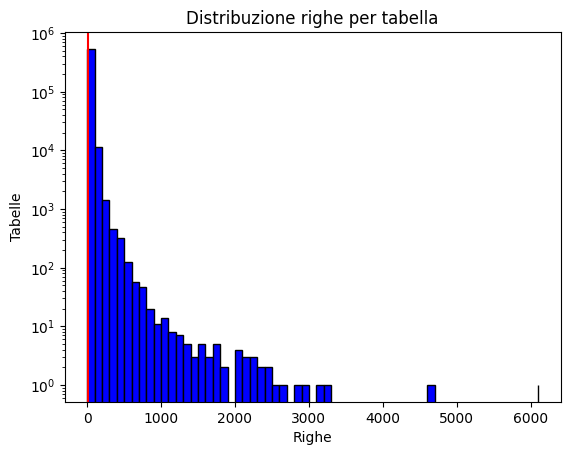

In [111]:
#distribuzione righe

df = pd.DataFrame(list_row)
# matplotlib histogram
plt.hist(df, color = 'blue', edgecolor = 'black', bins = a,  log=True)
plt.axvline(17, color="red", label = 'Value Median')
# Add labels
plt.title('Distribuzione righe per tabella')
plt.xlabel('Righe')
plt.ylabel('Tabelle')

In [112]:
print(min(list_column))
print(max(list_column))

2
28999


In [113]:
b = []
for i in range(0,28999,100):
    c.append(i)

    
b.append(28999)

Text(0, 0.5, 'Tabelle')

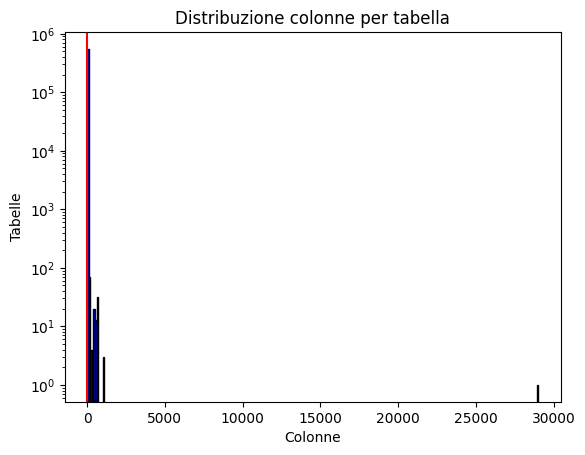

In [114]:
#distribuzione colonne

df = pd.DataFrame(list_column)
# matplotlib histogram
plt.hist(df, color = 'blue', edgecolor = 'black', bins=b, log=True)
plt.axvline(4, color="red", label = 'Value Median')
# Add labels
plt.title('Distribuzione colonne per tabella')
plt.xlabel('Colonne')
plt.ylabel('Tabelle')

In [115]:
print(min(list_value_different))
print(max(list_value_different))

1
17693


In [116]:
c = []
for i in range(0,17693,100):
    c.append(i)

    
c.append(17693)

Text(0, 0.5, 'Tabelle')

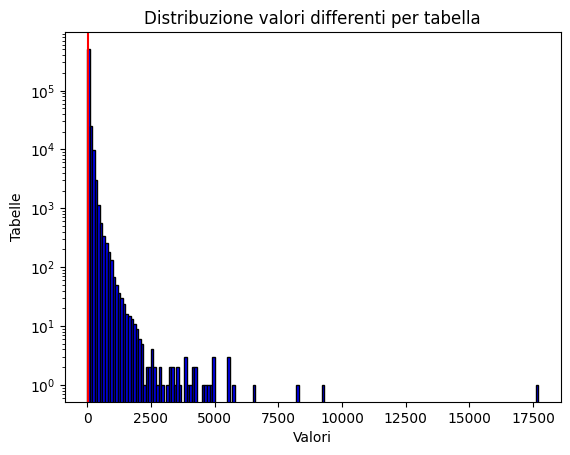

In [117]:
#distribuzione valori differenti

df = pd.DataFrame(list_value_different)
# matplotlib histogram
plt.hist(df, color = 'blue', edgecolor = 'black', log=True, bins = b)
plt.axvline(40, color="red", label = 'Value Median')
# Add labels
plt.title('Distribuzione valori differenti per tabella')
plt.xlabel('Valori')
plt.ylabel('Tabelle')